In [28]:
device = torch.device('cuda:0')
torch.cuda.get_device_name(0)

'NVIDIA GeForce RTX 3070 Ti Laptop GPU'

In [22]:
!python3 --version
!pwd

Python 3.8.10
/c/Users/bluec/Desktop/Capstone Research


In [6]:
!pip3 install psycopg2 pymysql

  Using cached psycopg2-2.9.3.tar.gz (380 kB)
     |████████████████████████████████| 43 kB 1.3 MB/s eta 0:00:011
  Created wheel for psycopg2: filename=psycopg2-2.9.3-cp39-cp39-linux_x86_64.whl size=166239 sha256=d569699543a4a85d49fd8ed6ac46ff62e4b00bb60556230a13d64dd9f19712ad
  Stored in directory: /home/lichenj/.cache/pip/wheels/b3/a1/6e/5a0e26314b15eb96a36263b80529ce0d64382540ac7b9544a9
Successfully built psycopg2


In [9]:
import json
import numpy as np
import os

import configparser
import psycopg2
import pymysql
import pymysql.cursors as pycursor
import numpy as np

import time
import glob

# 1. Generate Workload Dataset

In [25]:
cur_path = os.path.abspath('.')
data_path = cur_path + '/tpcc_1_1/'

edge_dim = 25000 # upper bound of edges
node_dim = 3000 # upper bound of nodes

'''
class DataType(IntEnum):
    Aggregate = 0
    NestedLoop = 1
    IndexScan = 2
'''
mp_optype = {'Aggregate': 0, 'Nested Loop': 1, 'Index Scan': 2, 'Hash Join': 3, 'Seq Scan': 4, 'Hash': 5, 'Update': 6} # operator types in the queries
modify_op_map = {'Update': 1, 'Insert': 2, 'Delete': 3}
tablename_map = {'warehouse': 1, 'district': 2, 'customer': 3, 'item': 4, 'oorder': 5,\
                'new_order': 6, 'order_line': 7, 'stock': 8, 'history': 9}

oid = 0 # operator number

'''
argus = { "mysql": {
    "host": "166.111.121.62",
    "password": "db10204",
    "port": 3306,
    "user": "feng"},
    "postgresql": {
            "host": "166.111.121.62",
            "password": "db10204",
            "port": 5433,
            "user": "postgres"}}
argus["postgresql"]["host"]
'''

'\nargus = { "mysql": {\n    "host": "166.111.121.62",\n    "password": "db10204",\n    "port": 3306,\n    "user": "feng"},\n    "postgresql": {\n            "host": "166.111.121.62",\n            "password": "db10204",\n            "port": 5433,\n            "user": "postgres"}}\nargus["postgresql"]["host"]\n'

In [3]:
# obtain and normalize configuration knobs

class DictParser(configparser.ConfigParser):
    def read_dict(self):
        d = dict(self._sections)
        for k in d:
            d[k] = dict(d[k])
        return d

cf = DictParser()
cf.read("config.ini", encoding="utf-8")
config_dict = cf.read_dict()


def parse_knob_config():
    _knob_config = config_dict["knob_config"]
    for key in _knob_config:
        _knob_config[key] = json.loads(str(_knob_config[key]).replace("\'", "\""))
    return _knob_config


class Database:
    def __init__(self, server_name='postgresql'):
        
        knob_config = parse_knob_config()
        self.knob_names = [knob for knob in knob_config]
        self.knob_config = knob_config
        self.server_name = server_name
        
        # print("knob_names:", self.knob_names)
        
        try:
            conn = self._get_conn()
            cursor = conn.cursor()
            sql = "SELECT count FROM INFORMATION_SCHEMA.INNODB_METRICS where status='enabled'"
            cursor.execute(sql)
            result = cursor.fetchall()

            self.internal_metric_num = len(result)
            cursor.close()
            conn.close()
        except Exception as err:
            print("execute sql error:", err)

    def _get_conn(self):
        if self.server_name == 'mysql':
            sucess = 0
            conn = -1
            count = 0
            while not sucess and count < 3:
                try:
                    conn = pymysql.connect(host="166.111.121.62",
                                           port=3306,
                                           user="feng",
                                           password="db10204",
                                           db='INFORMATION_SCHEMA',
                                           connect_timeout=36000,
                                           cursorclass=pycursor.DictCursor)

                    sucess = 1
                except Exception as result:
                    count += 1
                    time.sleep(10)
            if conn == -1:
                raise Exception
                
            return conn
            
        elif self.server_name == 'postgresql':
            sucess = 0
            conn = -1
            count = 0
            while not sucess and count < 3:
                try:
                    conn = psycopg2.connect(database=dbname, user="lixizhang", password="xi10261026zhang", host="166.111.5.177", port="5433")
                    sucess = 1
                except Exception as result:
                    count += 1
                    time.sleep(10)
            if conn == -1:
                raise Exception
            return conn

        else:
            print('数据库连接不上...')
            return

    def fetch_knob(self):
        state_list = np.append([], [])
        try:
            conn = self._get_conn()
            cursor = conn.cursor()
            sql = "select"
            for i, knob in enumerate(self.knob_names):
                sql = sql + ' @@' + knob

                if i < len(self.knob_names) - 1:
                    sql = sql + ', '

            # state metrics
            cursor.execute(sql)
            result = cursor.fetchall()
            
            for i in range(len(self.knob_names)):
                value = result[0]["@@%s" % self.knob_names[i]] if result[0]["@@%s" % self.knob_names[i]]!=0 else self.knob_config[self.knob_names[i]]["max_value"] # not limit if value equals 0
                
                # print(value, self.knob_config[self.knob_names[i]]["max_value"], self.knob_config[self.knob_names[i]]["min_value"])
                state_list = np.append(state_list, value / (self.knob_config[self.knob_names[i]]["max_value"] - self.knob_config[self.knob_names[i]]["min_value"]))
            cursor.close()
            conn.close()
        except Exception as error:
            print("fetch_knob Error:", error)
        
        return state_list

# db = Database("mysql")
# print(db.fetch_knob())

In [3]:
# actual runtime:  actuall executed (training data) / estimated by our model
# operators in the same plan can have data conflicts (parallel)

def compute_cost(node):
    return float(node["Total Cost"])

def compute_time(node):
    # return float(node["Actual Total Time"]) - float(node["Actual Startup Time"]) 
    return 1000 * float(node["Actual Total Time"]) # mechanism within pg
    
def get_used_tables(node):

    tables = []

    stack = [node]
    while stack != []:
        parent = stack.pop(0)
        
        if "Relation Name" in parent:
            tables.append(parent["Relation Name"])
        
        if "Plans" in parent:
            for n in parent["Plans"]:
                stack.append(n)

    return  tables


def extract_plan(sample, conflict_operators, elapsed_us, fill_factor):
    global mp_optype, oid
    # function: extract SQL feature
    # return: start_time, node feature, edge feature
    
    plan = sample["plan"]
    while isinstance(plan, list):
        plan = plan[0]
    # Features: print(plan.keys()) 
        # start time = plan["start_time"]
        # node feature = [Node Type, Total Cost:: Actual Total Time]
        # node label = [Actual Startup Time, Actual Total Time]

    plan = plan["Plan"] # root node
    node_matrix = []
    edge_matrix = []
    
    # add oid for each operator
    stack = [plan]
    while stack != []:
        parent = stack.pop(0)
        parent["oid"] = oid
        oid = oid + 1
        
        if "Plans" in parent:
            for node in parent["Plans"]:
                stack.append(node)    
    
    stack = [plan]
    while stack != []:
        parent = stack.pop(0)
        run_cost = compute_cost(parent)
        run_time = compute_time(parent)
        # print(parent["Actual Total Time"], parent["Actual Startup Time"], run_time)
        
        if parent["Node Type"] not in mp_optype:
            mp_optype[parent["Node Type"]] = len(mp_optype)
            
        if ("Operation" in parent) and parent["Operation"] not in modify_op_map:
            modify_op_map[parent["Operation"]] = len(modify_op_map) + 1
            
        if ("Relation Name" in parent) and parent["Relation Name"] not in tablename_map:
            tablename_map[parent["Relation Name"]] = len(tablename_map) + 1
        
        tables = get_used_tables(parent)
        # print("[tables]", tables)
        
        operator_info = [parent["oid"], parent["Startup Cost"], parent["Total Cost"]]
        
        for table in tables:
            if table not in conflict_operators:
                conflict_operators[table] = [operator_info]
            else:
                conflict_operators[table].append(operator_info)
        
        # Operation and Relation Name
        if "Operation" in parent:
            opcode = modify_op_map[parent["Operation"]]
        else:
            opcode = 0
            
        if "Relation Name" in parent:
            tablecode = tablename_map[parent["Relation Name"]]
        else:
            tablecode = 0
                
        node_feature = [parent["oid"], mp_optype[parent["Node Type"]], run_cost,\
                        float(parent["Startup Cost"]), fill_factor, opcode, tablecode, run_time]
        
        node_matrix = [node_feature] + node_matrix
        
        if "Plans" in parent:
            for node in parent["Plans"]:
                stack.append(node)
                edge_matrix = [[parent["oid"], node["oid"], 1]] + edge_matrix
                
    # Add trigger times to root node total actual time.
    

    # node: 18 * featuers
    # edge: 18 * 18
    
    # Add query root to corresponding OUs.
    query_mask = [False for _ in node_matrix]
    query_mask[-1] = True

    return float(sample["start_time"]), node_matrix, edge_matrix, conflict_operators, query_mask


def overlap(node_i, node_j):
    
    if (node_j[1] < node_i[2] and node_i[2] < node_j[2]):
        
        return (node_i[2] - node_j[1]) / (node_j[2] - min(node_i[1], node_j[1]))
    
    elif (node_i[1] < node_j[2] and node_j[2] < node_i[2]):
        
        return (node_j[2] - node_i[1]) / (node_i[2] - min(node_i[1], node_j[1]))
    
    else:
        return 0

def add_across_plan_relations(conflict_operators, knobs, ematrix):
    
    data_weight = 0.1
    for knob in knobs:
        data_weight *= knob
    # print(conflict_operators)
    
    # add relations [rw/ww, rr, config]
    for table in conflict_operators:
        for i in range(len(conflict_operators[table])):
            for j in range(i+1, len(conflict_operators[table])):

                node_i = conflict_operators[table][i]
                node_j = conflict_operators[table][j]
                
                time_overlap = overlap(node_i, node_j)
                if time_overlap:
                    ematrix = ematrix + [[node_i[0], node_j[0], -data_weight * time_overlap]]
                    ematrix = ematrix + [[node_j[0], node_i[0], -data_weight * time_overlap]]
                else:
                    break

                '''
                if overlap(i, j) and ("rw" or "ww"):
                    ematrix = ematrix + [[conflict_operators[table][i], conflict_operators[table][j], data_weight * time_overlap]]
                    ematrix = ematrix + [[conflict_operators[table][j], conflict_operators[table][i], data_weight * time_overlap]]
                '''
                    
    return ematrix


def generate_graph(wid, path, fill_factor=1.0):
    global oid
    # fuction
    # return
    # todo: timestamp
    
    vmatrix = []
    ematrix = [] 
    conflict_operators = {}
    query_mask = []
    query_strings = []
    query_latency = []

    oid = 0
    with open(path + "sample-plan-" + str(wid), "r") as f:        
        
        # vertex: operators
        # edge: child-parent relations
        for sample in f.readlines():
            
            sample = json.loads(sample)
            
            # Step 1: read (operators, parent-child edges) in separate plans
            start_time, node_matrix, edge_matrix, conflict_operators, single_mask = extract_plan(sample, conflict_operators,
                                                                                                float(sample['elapsed_us']),
                                                                                                fill_factor)
            
            vmatrix = vmatrix + node_matrix
            ematrix = ematrix + edge_matrix
            query_mask = query_mask + single_mask
            # Step 4: add query level stat.
            query_strings.append(sample['query_text'])
            query_latency.append(float(sample['elapsed_us']))

        # Step 2: read related knobs
        # db = Database("mysql")
        # knobs = db.fetch_knob()
        knobs = [fill_factor]
            
        # Step 3: add relations across queries
        # ematrix = add_across_plan_relations(conflict_operators, knobs, ematrix)
        
        # edge: data relations based on (access tables, related knob values)
        
            

    return vmatrix, ematrix, query_mask, query_strings, query_latency

In [4]:
import shutil
import pickle

# Step-0: split the worklaods into multiple concurrent queries at differnet time ("sample-plan-x")
def process_graph_data(data_path : str, num_graphs = 100, fill_factor=1.0):
  workloads = glob.glob(f"{data_path}/sample-plan-*")

  start_time = time.time()
  try:
    shutil.rmtree(f"{data_path}/graph/")
  except:
    pass
  os.mkdir(f"{data_path}/graph/")
  for wid in range(num_graphs):
      st = time.time()
      #print('Generate graph, ', wid)

      vmatrix, ematrix, query_mask, query_strings, query_latency = generate_graph(wid, data_path, fill_factor)
      print("[graph {}]".format(wid), "time:{}; #-vertex:{}, #-edge:{}".format(time.time() - st, len(vmatrix), len(ematrix)))
      
      with open(f"{data_path}/graph/" + "sample-plan-" + str(wid) + ".content", "w") as wf:
          for v in vmatrix:
              joined_str = '\t'.join(list(map(str, v)))
              wf.write(joined_str + "\n")
      with open(f"{data_path}/graph/" + "sample-plan-" + str(wid) + ".cites", "w") as wf:
          for e in ematrix:
              wf.write(str(e[0]) + "\t" + str(e[1]) + "\t" + str(e[2]) + "\n")
            
      with open(f"{data_path}/graph/" + "sample-plan-" + str(wid) + ".mask", "wb") as wf:
        pickle.dump(query_mask, wf)
        
      with open(f"{data_path}/graph/" + "sample-plan-" + str(wid) + ".strings", "wb") as wf:
        pickle.dump(query_strings, wf)
        
      with open(f"{data_path}/graph/" + "sample-plan-" + str(wid) + ".latency", "wb") as wf:
        pickle.dump(query_latency, wf)

  end_time = time.time()

  print("Total Time:{}".format(end_time - start_time))

In [6]:
process_graph_data('tpcc_sf1_ff10_processed/', fill_factor=0.1, num_graphs = 7500)
process_graph_data('tpcc_sf1_ff50_processed/', fill_factor=0.5, num_graphs = 7500)
process_graph_data('tpcc_sf1_ff100_processed/', fill_factor=1.0, num_graphs = 7500)

[graph 0] time:0.03798794746398926; #-vertex:1816, #-edge:816
[graph 1] time:0.026210546493530273; #-vertex:1802, #-edge:802
[graph 2] time:0.03336787223815918; #-vertex:1811, #-edge:811
[graph 3] time:0.044760704040527344; #-vertex:1802, #-edge:802
[graph 4] time:0.029157400131225586; #-vertex:1797, #-edge:797
[graph 5] time:0.05288338661193848; #-vertex:1813, #-edge:813
[graph 6] time:0.04142117500305176; #-vertex:1819, #-edge:819
[graph 7] time:0.03690290451049805; #-vertex:1819, #-edge:819
[graph 8] time:0.04439067840576172; #-vertex:1805, #-edge:805
[graph 9] time:0.03916597366333008; #-vertex:1813, #-edge:813
[graph 10] time:0.03715801239013672; #-vertex:1798, #-edge:798
[graph 11] time:0.03189444541931152; #-vertex:1812, #-edge:812
[graph 12] time:0.023998498916625977; #-vertex:1819, #-edge:819
[graph 13] time:0.024994611740112305; #-vertex:1820, #-edge:820
[graph 14] time:0.024997472763061523; #-vertex:1803, #-edge:803
[graph 15] time:0.02292633056640625; #-vertex:1807, #-edge:

[graph 134] time:0.05402064323425293; #-vertex:1810, #-edge:810
[graph 135] time:0.019659042358398438; #-vertex:1804, #-edge:804
[graph 136] time:0.03633403778076172; #-vertex:1816, #-edge:816
[graph 137] time:0.0419468879699707; #-vertex:1808, #-edge:808
[graph 138] time:0.03509831428527832; #-vertex:1811, #-edge:811
[graph 139] time:0.038091182708740234; #-vertex:1814, #-edge:814
[graph 140] time:0.02895808219909668; #-vertex:1802, #-edge:802
[graph 141] time:0.03134489059448242; #-vertex:1814, #-edge:814
[graph 142] time:0.02499103546142578; #-vertex:1784, #-edge:784
[graph 143] time:0.02208876609802246; #-vertex:1812, #-edge:812
[graph 144] time:0.049898624420166016; #-vertex:1810, #-edge:810
[graph 145] time:0.0367121696472168; #-vertex:1813, #-edge:813
[graph 146] time:0.029140233993530273; #-vertex:1807, #-edge:807
[graph 147] time:0.04119515419006348; #-vertex:1804, #-edge:804
[graph 148] time:0.021047353744506836; #-vertex:1821, #-edge:821
[graph 149] time:0.03399538993835449;

[graph 263] time:0.030164241790771484; #-vertex:1809, #-edge:809
[graph 264] time:0.04291200637817383; #-vertex:1803, #-edge:803
[graph 265] time:0.034914255142211914; #-vertex:1801, #-edge:801
[graph 266] time:0.04730081558227539; #-vertex:1805, #-edge:805
[graph 267] time:0.0429081916809082; #-vertex:1810, #-edge:810
[graph 268] time:0.05962562561035156; #-vertex:1811, #-edge:811
[graph 269] time:0.031214475631713867; #-vertex:1810, #-edge:810
[graph 270] time:0.04394221305847168; #-vertex:1817, #-edge:817
[graph 271] time:0.021859407424926758; #-vertex:1811, #-edge:811
[graph 272] time:0.03690361976623535; #-vertex:1799, #-edge:799
[graph 273] time:0.03967165946960449; #-vertex:1795, #-edge:795
[graph 274] time:0.027220964431762695; #-vertex:1808, #-edge:808
[graph 275] time:0.05363726615905762; #-vertex:1798, #-edge:798
[graph 276] time:0.022240877151489258; #-vertex:1804, #-edge:804
[graph 277] time:0.03094029426574707; #-vertex:1817, #-edge:817
[graph 278] time:0.0349161624908447

[graph 393] time:0.038484811782836914; #-vertex:1812, #-edge:812
[graph 394] time:0.025975942611694336; #-vertex:1806, #-edge:806
[graph 395] time:0.029623031616210938; #-vertex:1807, #-edge:807
[graph 396] time:0.028239965438842773; #-vertex:1813, #-edge:813
[graph 397] time:0.03325510025024414; #-vertex:1804, #-edge:804
[graph 398] time:0.04298830032348633; #-vertex:1807, #-edge:807
[graph 399] time:0.04200315475463867; #-vertex:1797, #-edge:797
[graph 400] time:0.04400181770324707; #-vertex:1803, #-edge:803
[graph 401] time:0.04099678993225098; #-vertex:1818, #-edge:818
[graph 402] time:0.04999518394470215; #-vertex:1801, #-edge:801
[graph 403] time:0.040999650955200195; #-vertex:1819, #-edge:819
[graph 404] time:0.0638124942779541; #-vertex:1796, #-edge:796
[graph 405] time:0.03700113296508789; #-vertex:1818, #-edge:818
[graph 406] time:0.03701591491699219; #-vertex:1818, #-edge:818
[graph 407] time:0.038999080657958984; #-vertex:1816, #-edge:816
[graph 408] time:0.0316317081451416

[graph 526] time:0.02365565299987793; #-vertex:1818, #-edge:818
[graph 527] time:0.028003215789794922; #-vertex:1815, #-edge:815
[graph 528] time:0.017866134643554688; #-vertex:1802, #-edge:802
[graph 529] time:0.03627324104309082; #-vertex:1808, #-edge:808
[graph 530] time:0.017153263092041016; #-vertex:1807, #-edge:807
[graph 531] time:0.03549933433532715; #-vertex:1817, #-edge:817
[graph 532] time:0.024997234344482422; #-vertex:1815, #-edge:815
[graph 533] time:0.01894378662109375; #-vertex:1800, #-edge:800
[graph 534] time:0.0327296257019043; #-vertex:1813, #-edge:813
[graph 535] time:0.021677732467651367; #-vertex:1798, #-edge:798
[graph 536] time:0.026982545852661133; #-vertex:1790, #-edge:790
[graph 537] time:0.02599954605102539; #-vertex:1814, #-edge:814
[graph 538] time:0.01791548728942871; #-vertex:1814, #-edge:814
[graph 539] time:0.03481483459472656; #-vertex:1815, #-edge:815
[graph 540] time:0.017197370529174805; #-vertex:1802, #-edge:802
[graph 541] time:0.035517215728759

[graph 660] time:0.040186166763305664; #-vertex:1816, #-edge:816
[graph 661] time:0.023096084594726562; #-vertex:1795, #-edge:795
[graph 662] time:0.017733097076416016; #-vertex:1811, #-edge:811
[graph 663] time:0.03557395935058594; #-vertex:1806, #-edge:806
[graph 664] time:0.01625847816467285; #-vertex:1811, #-edge:811
[graph 665] time:0.03371787071228027; #-vertex:1808, #-edge:808
[graph 666] time:0.023915767669677734; #-vertex:1812, #-edge:812
[graph 667] time:0.022331714630126953; #-vertex:1801, #-edge:801
[graph 668] time:0.024145841598510742; #-vertex:1806, #-edge:806
[graph 669] time:0.015285968780517578; #-vertex:1815, #-edge:815
[graph 670] time:0.05182456970214844; #-vertex:1805, #-edge:805
[graph 671] time:0.014419794082641602; #-vertex:1819, #-edge:819
[graph 672] time:0.04311800003051758; #-vertex:1798, #-edge:798
[graph 673] time:0.03814840316772461; #-vertex:1812, #-edge:812
[graph 674] time:0.0510096549987793; #-vertex:1812, #-edge:812
[graph 675] time:0.03812313079833

[graph 790] time:0.03869223594665527; #-vertex:1797, #-edge:797
[graph 791] time:0.04451632499694824; #-vertex:1815, #-edge:815
[graph 792] time:0.03264665603637695; #-vertex:1804, #-edge:804
[graph 793] time:0.033261775970458984; #-vertex:1801, #-edge:801
[graph 794] time:0.017288684844970703; #-vertex:1816, #-edge:816
[graph 795] time:0.03776812553405762; #-vertex:1811, #-edge:811
[graph 796] time:0.02318716049194336; #-vertex:1822, #-edge:822
[graph 797] time:0.03373432159423828; #-vertex:1792, #-edge:792
[graph 798] time:0.01612377166748047; #-vertex:1794, #-edge:794
[graph 799] time:0.03561687469482422; #-vertex:1811, #-edge:811
[graph 800] time:0.028901338577270508; #-vertex:1810, #-edge:810
[graph 801] time:0.01562976837158203; #-vertex:1803, #-edge:803
[graph 802] time:0.023998498916625977; #-vertex:1803, #-edge:803
[graph 803] time:0.027127981185913086; #-vertex:1811, #-edge:811
[graph 804] time:0.04206991195678711; #-vertex:1820, #-edge:820
[graph 805] time:0.0524132251739501

[graph 918] time:0.033173561096191406; #-vertex:1804, #-edge:804
[graph 919] time:0.015711069107055664; #-vertex:1806, #-edge:806
[graph 920] time:0.03127408027648926; #-vertex:1818, #-edge:818
[graph 921] time:0.02724623680114746; #-vertex:1807, #-edge:807
[graph 922] time:0.015625715255737305; #-vertex:1799, #-edge:799
[graph 923] time:0.015656232833862305; #-vertex:1788, #-edge:788
[graph 924] time:0.03180384635925293; #-vertex:1811, #-edge:811
[graph 925] time:0.02000141143798828; #-vertex:1799, #-edge:799
[graph 926] time:0.04344630241394043; #-vertex:1807, #-edge:807
[graph 927] time:0.03125929832458496; #-vertex:1810, #-edge:810
[graph 928] time:0.03127598762512207; #-vertex:1812, #-edge:812
[graph 929] time:0.03323721885681152; #-vertex:1810, #-edge:810
[graph 930] time:0.02964305877685547; #-vertex:1815, #-edge:815
[graph 931] time:0.03545236587524414; #-vertex:1821, #-edge:821
[graph 932] time:0.018329858779907227; #-vertex:1800, #-edge:800
[graph 933] time:0.0313746929168701

[graph 1049] time:0.023622751235961914; #-vertex:1794, #-edge:794
[graph 1050] time:0.015772104263305664; #-vertex:1828, #-edge:828
[graph 1051] time:0.015625953674316406; #-vertex:1794, #-edge:794
[graph 1052] time:0.015624761581420898; #-vertex:1822, #-edge:822
[graph 1053] time:0.015639781951904297; #-vertex:1796, #-edge:796
[graph 1054] time:0.031244277954101562; #-vertex:1804, #-edge:804
[graph 1055] time:0.032723188400268555; #-vertex:1817, #-edge:817
[graph 1056] time:0.01199960708618164; #-vertex:1820, #-edge:820
[graph 1057] time:0.051181793212890625; #-vertex:1820, #-edge:820
[graph 1058] time:0.031153440475463867; #-vertex:1799, #-edge:799
[graph 1059] time:0.031249046325683594; #-vertex:1811, #-edge:811
[graph 1060] time:0.03134608268737793; #-vertex:1802, #-edge:802
[graph 1061] time:0.015621423721313477; #-vertex:1803, #-edge:803
[graph 1062] time:0.022067785263061523; #-vertex:1793, #-edge:793
[graph 1063] time:0.015726566314697266; #-vertex:1808, #-edge:808
[graph 1064]

[graph 1177] time:0.03609466552734375; #-vertex:1803, #-edge:803
[graph 1178] time:0.027197837829589844; #-vertex:1798, #-edge:798
[graph 1179] time:0.02421855926513672; #-vertex:1804, #-edge:804
[graph 1180] time:0.02071690559387207; #-vertex:1805, #-edge:805
[graph 1181] time:0.02820277214050293; #-vertex:1799, #-edge:799
[graph 1182] time:0.06700611114501953; #-vertex:1818, #-edge:818
[graph 1183] time:0.025075435638427734; #-vertex:1792, #-edge:792
[graph 1184] time:0.026036500930786133; #-vertex:1811, #-edge:811
[graph 1185] time:0.01793360710144043; #-vertex:1792, #-edge:792
[graph 1186] time:0.036940574645996094; #-vertex:1800, #-edge:800
[graph 1187] time:0.026207685470581055; #-vertex:1801, #-edge:801
[graph 1188] time:0.02409982681274414; #-vertex:1813, #-edge:813
[graph 1189] time:0.013304948806762695; #-vertex:1800, #-edge:800
[graph 1190] time:0.013307332992553711; #-vertex:1808, #-edge:808
[graph 1191] time:0.04185295104980469; #-vertex:1793, #-edge:793
[graph 1192] time:

[graph 1307] time:0.02933526039123535; #-vertex:1802, #-edge:802
[graph 1308] time:0.023725271224975586; #-vertex:1784, #-edge:784
[graph 1309] time:0.02740621566772461; #-vertex:1817, #-edge:817
[graph 1310] time:0.028098583221435547; #-vertex:1801, #-edge:801
[graph 1311] time:0.008305788040161133; #-vertex:1819, #-edge:819
[graph 1312] time:0.00830388069152832; #-vertex:1807, #-edge:807
[graph 1313] time:0.023401975631713867; #-vertex:1811, #-edge:811
[graph 1314] time:0.028289318084716797; #-vertex:1820, #-edge:820
[graph 1315] time:0.03959059715270996; #-vertex:1800, #-edge:800
[graph 1316] time:0.01824474334716797; #-vertex:1811, #-edge:811
[graph 1317] time:0.03139781951904297; #-vertex:1804, #-edge:804
[graph 1318] time:0.033919572830200195; #-vertex:1810, #-edge:810
[graph 1319] time:0.03143811225891113; #-vertex:1807, #-edge:807
[graph 1320] time:0.04003286361694336; #-vertex:1810, #-edge:810
[graph 1321] time:0.0296478271484375; #-vertex:1809, #-edge:809
[graph 1322] time:0.

[graph 1438] time:0.03602170944213867; #-vertex:1819, #-edge:819
[graph 1439] time:0.018942594528198242; #-vertex:1801, #-edge:801
[graph 1440] time:0.03625226020812988; #-vertex:1803, #-edge:803
[graph 1441] time:0.018790006637573242; #-vertex:1820, #-edge:820
[graph 1442] time:0.04583549499511719; #-vertex:1788, #-edge:788
[graph 1443] time:0.01562666893005371; #-vertex:1791, #-edge:791
[graph 1444] time:0.02576732635498047; #-vertex:1812, #-edge:812
[graph 1445] time:0.023288249969482422; #-vertex:1813, #-edge:813
[graph 1446] time:0.0339350700378418; #-vertex:1816, #-edge:816
[graph 1447] time:0.03136253356933594; #-vertex:1799, #-edge:799
[graph 1448] time:0.022086620330810547; #-vertex:1808, #-edge:808
[graph 1449] time:0.015744447708129883; #-vertex:1817, #-edge:817
[graph 1450] time:0.03489232063293457; #-vertex:1828, #-edge:828
[graph 1451] time:0.01824808120727539; #-vertex:1811, #-edge:811
[graph 1452] time:0.01574420928955078; #-vertex:1805, #-edge:805
[graph 1453] time:0.0

[graph 1565] time:0.026081562042236328; #-vertex:1802, #-edge:802
[graph 1566] time:0.022014617919921875; #-vertex:1824, #-edge:824
[graph 1567] time:0.015673160552978516; #-vertex:1801, #-edge:801
[graph 1568] time:0.022250652313232422; #-vertex:1797, #-edge:797
[graph 1569] time:0.03146696090698242; #-vertex:1824, #-edge:824
[graph 1570] time:0.058152198791503906; #-vertex:1822, #-edge:822
[graph 1571] time:0.048255205154418945; #-vertex:1814, #-edge:814
[graph 1572] time:0.020403623580932617; #-vertex:1825, #-edge:825
[graph 1573] time:0.033628225326538086; #-vertex:1810, #-edge:810
[graph 1574] time:0.0231168270111084; #-vertex:1798, #-edge:798
[graph 1575] time:0.015737533569335938; #-vertex:1810, #-edge:810
[graph 1576] time:0.02913689613342285; #-vertex:1816, #-edge:816
[graph 1577] time:0.01790618896484375; #-vertex:1794, #-edge:794
[graph 1578] time:0.03527021408081055; #-vertex:1812, #-edge:812
[graph 1579] time:0.018169879913330078; #-vertex:1809, #-edge:809
[graph 1580] tim

[graph 1696] time:0.0284426212310791; #-vertex:1811, #-edge:811
[graph 1697] time:0.026246070861816406; #-vertex:1801, #-edge:801
[graph 1698] time:0.01562356948852539; #-vertex:1804, #-edge:804
[graph 1699] time:0.029494524002075195; #-vertex:1827, #-edge:827
[graph 1700] time:0.03898215293884277; #-vertex:1811, #-edge:811
[graph 1701] time:0.04300045967102051; #-vertex:1809, #-edge:809
[graph 1702] time:0.04293394088745117; #-vertex:1805, #-edge:805
[graph 1703] time:0.022150754928588867; #-vertex:1806, #-edge:806
[graph 1704] time:0.04093480110168457; #-vertex:1798, #-edge:798
[graph 1705] time:0.023630857467651367; #-vertex:1799, #-edge:799
[graph 1706] time:0.032717227935791016; #-vertex:1813, #-edge:813
[graph 1707] time:0.03351020812988281; #-vertex:1806, #-edge:806
[graph 1708] time:0.03469443321228027; #-vertex:1808, #-edge:808
[graph 1709] time:0.02394556999206543; #-vertex:1808, #-edge:808
[graph 1710] time:0.02190566062927246; #-vertex:1818, #-edge:818
[graph 1711] time:0.0

[graph 1828] time:0.039000511169433594; #-vertex:1816, #-edge:816
[graph 1829] time:0.03901529312133789; #-vertex:1801, #-edge:801
[graph 1830] time:0.019908666610717773; #-vertex:1814, #-edge:814
[graph 1831] time:0.01562643051147461; #-vertex:1795, #-edge:795
[graph 1832] time:0.033658742904663086; #-vertex:1812, #-edge:812
[graph 1833] time:0.015625715255737305; #-vertex:1799, #-edge:799
[graph 1834] time:0.022999286651611328; #-vertex:1805, #-edge:805
[graph 1835] time:0.025994539260864258; #-vertex:1809, #-edge:809
[graph 1836] time:0.026974916458129883; #-vertex:1799, #-edge:799
[graph 1837] time:0.022417306900024414; #-vertex:1812, #-edge:812
[graph 1838] time:0.036688804626464844; #-vertex:1819, #-edge:819
[graph 1839] time:0.030999422073364258; #-vertex:1813, #-edge:813
[graph 1840] time:0.01790642738342285; #-vertex:1799, #-edge:799
[graph 1841] time:0.02998518943786621; #-vertex:1796, #-edge:796
[graph 1842] time:0.035701751708984375; #-vertex:1809, #-edge:809
[graph 1843] t

[graph 1959] time:0.06102466583251953; #-vertex:1803, #-edge:803
[graph 1960] time:0.01808476448059082; #-vertex:1805, #-edge:805
[graph 1961] time:0.03414463996887207; #-vertex:1801, #-edge:801
[graph 1962] time:0.03370809555053711; #-vertex:1813, #-edge:813
[graph 1963] time:0.03646397590637207; #-vertex:1814, #-edge:814
[graph 1964] time:0.03711223602294922; #-vertex:1794, #-edge:794
[graph 1965] time:0.040869951248168945; #-vertex:1818, #-edge:818
[graph 1966] time:0.03505349159240723; #-vertex:1799, #-edge:799
[graph 1967] time:0.04055428504943848; #-vertex:1807, #-edge:807
[graph 1968] time:0.02115941047668457; #-vertex:1817, #-edge:817
[graph 1969] time:0.015627145767211914; #-vertex:1803, #-edge:803
[graph 1970] time:0.02700948715209961; #-vertex:1822, #-edge:822
[graph 1971] time:0.018035173416137695; #-vertex:1802, #-edge:802
[graph 1972] time:0.0374453067779541; #-vertex:1801, #-edge:801
[graph 1973] time:0.017154455184936523; #-vertex:1795, #-edge:795
[graph 1974] time:0.03

[graph 2089] time:0.026012897491455078; #-vertex:1810, #-edge:810
[graph 2090] time:0.024147510528564453; #-vertex:1808, #-edge:808
[graph 2091] time:0.031250953674316406; #-vertex:1795, #-edge:795
[graph 2092] time:0.042131900787353516; #-vertex:1813, #-edge:813
[graph 2093] time:0.03514838218688965; #-vertex:1797, #-edge:797
[graph 2094] time:0.024013757705688477; #-vertex:1803, #-edge:803
[graph 2095] time:0.038903236389160156; #-vertex:1809, #-edge:809
[graph 2096] time:0.03800082206726074; #-vertex:1792, #-edge:792
[graph 2097] time:0.04313516616821289; #-vertex:1813, #-edge:813
[graph 2098] time:0.0313572883605957; #-vertex:1804, #-edge:804
[graph 2099] time:0.023001670837402344; #-vertex:1811, #-edge:811
[graph 2100] time:0.012220621109008789; #-vertex:1802, #-edge:802
[graph 2101] time:0.035080909729003906; #-vertex:1816, #-edge:816
[graph 2102] time:0.03345656394958496; #-vertex:1800, #-edge:800
[graph 2103] time:0.025249958038330078; #-vertex:1805, #-edge:805
[graph 2104] tim

[graph 2218] time:0.02399897575378418; #-vertex:1821, #-edge:821
[graph 2219] time:0.03493785858154297; #-vertex:1819, #-edge:819
[graph 2220] time:0.01945781707763672; #-vertex:1802, #-edge:802
[graph 2221] time:0.04077935218811035; #-vertex:1802, #-edge:802
[graph 2222] time:0.0240480899810791; #-vertex:1810, #-edge:810
[graph 2223] time:0.015720844268798828; #-vertex:1814, #-edge:814
[graph 2224] time:0.029100656509399414; #-vertex:1816, #-edge:816
[graph 2225] time:0.025362730026245117; #-vertex:1799, #-edge:799
[graph 2226] time:0.024085044860839844; #-vertex:1805, #-edge:805
[graph 2227] time:0.03628063201904297; #-vertex:1815, #-edge:815
[graph 2228] time:0.023999691009521484; #-vertex:1796, #-edge:796
[graph 2229] time:0.007161140441894531; #-vertex:1795, #-edge:795
[graph 2230] time:0.027884483337402344; #-vertex:1793, #-edge:793
[graph 2231] time:0.02219104766845703; #-vertex:1791, #-edge:791
[graph 2232] time:0.03151750564575195; #-vertex:1814, #-edge:814
[graph 2233] time:0

[graph 2348] time:0.028933286666870117; #-vertex:1782, #-edge:782
[graph 2349] time:0.05691719055175781; #-vertex:1804, #-edge:804
[graph 2350] time:0.025218963623046875; #-vertex:1814, #-edge:814
[graph 2351] time:0.020771026611328125; #-vertex:1815, #-edge:815
[graph 2352] time:0.02388763427734375; #-vertex:1803, #-edge:803
[graph 2353] time:0.021958351135253906; #-vertex:1817, #-edge:817
[graph 2354] time:0.02889251708984375; #-vertex:1801, #-edge:801
[graph 2355] time:0.02962803840637207; #-vertex:1804, #-edge:804
[graph 2356] time:0.0157163143157959; #-vertex:1801, #-edge:801
[graph 2357] time:0.029120206832885742; #-vertex:1801, #-edge:801
[graph 2358] time:0.043395042419433594; #-vertex:1823, #-edge:823
[graph 2359] time:0.027158021926879883; #-vertex:1806, #-edge:806
[graph 2360] time:0.049485206604003906; #-vertex:1805, #-edge:805
[graph 2361] time:0.04014706611633301; #-vertex:1812, #-edge:812
[graph 2362] time:0.024865150451660156; #-vertex:1796, #-edge:796
[graph 2363] time

[graph 2477] time:0.03876972198486328; #-vertex:1800, #-edge:800
[graph 2478] time:0.02344799041748047; #-vertex:1805, #-edge:805
[graph 2479] time:0.0343174934387207; #-vertex:1814, #-edge:814
[graph 2480] time:0.01990818977355957; #-vertex:1822, #-edge:822
[graph 2481] time:0.034337759017944336; #-vertex:1797, #-edge:797
[graph 2482] time:0.023206472396850586; #-vertex:1795, #-edge:795
[graph 2483] time:0.02068495750427246; #-vertex:1802, #-edge:802
[graph 2484] time:0.03873181343078613; #-vertex:1807, #-edge:807
[graph 2485] time:0.016010761260986328; #-vertex:1816, #-edge:816
[graph 2486] time:0.02330160140991211; #-vertex:1808, #-edge:808
[graph 2487] time:0.02696681022644043; #-vertex:1806, #-edge:806
[graph 2488] time:0.04592156410217285; #-vertex:1799, #-edge:799
[graph 2489] time:0.038068294525146484; #-vertex:1801, #-edge:801
[graph 2490] time:0.028243303298950195; #-vertex:1806, #-edge:806
[graph 2491] time:0.027999401092529297; #-vertex:1817, #-edge:817
[graph 2492] time:0.

[graph 2605] time:0.025797128677368164; #-vertex:1818, #-edge:818
[graph 2606] time:0.015642881393432617; #-vertex:1800, #-edge:800
[graph 2607] time:0.015660762786865234; #-vertex:1809, #-edge:809
[graph 2608] time:0.035425424575805664; #-vertex:1804, #-edge:804
[graph 2609] time:0.015708446502685547; #-vertex:1815, #-edge:815
[graph 2610] time:0.03322577476501465; #-vertex:1801, #-edge:801
[graph 2611] time:0.02990436553955078; #-vertex:1787, #-edge:787
[graph 2612] time:0.0312347412109375; #-vertex:1800, #-edge:800
[graph 2613] time:0.03124856948852539; #-vertex:1802, #-edge:802
[graph 2614] time:0.023909568786621094; #-vertex:1797, #-edge:797
[graph 2615] time:0.031230926513671875; #-vertex:1806, #-edge:806
[graph 2616] time:0.04521036148071289; #-vertex:1797, #-edge:797
[graph 2617] time:0.015753984451293945; #-vertex:1792, #-edge:792
[graph 2618] time:0.03128957748413086; #-vertex:1803, #-edge:803
[graph 2619] time:0.019762039184570312; #-vertex:1802, #-edge:802
[graph 2620] time

[graph 2734] time:0.02599310874938965; #-vertex:1813, #-edge:813
[graph 2735] time:0.025992870330810547; #-vertex:1819, #-edge:819
[graph 2736] time:0.03804922103881836; #-vertex:1793, #-edge:793
[graph 2737] time:0.03848147392272949; #-vertex:1808, #-edge:808
[graph 2738] time:0.023411273956298828; #-vertex:1813, #-edge:813
[graph 2739] time:0.038101911544799805; #-vertex:1793, #-edge:793
[graph 2740] time:0.030028581619262695; #-vertex:1802, #-edge:802
[graph 2741] time:0.02599930763244629; #-vertex:1817, #-edge:817
[graph 2742] time:0.04600048065185547; #-vertex:1797, #-edge:797
[graph 2743] time:0.04401516914367676; #-vertex:1815, #-edge:815
[graph 2744] time:0.045000553131103516; #-vertex:1810, #-edge:810
[graph 2745] time:0.04301881790161133; #-vertex:1794, #-edge:794
[graph 2746] time:0.039998531341552734; #-vertex:1807, #-edge:807
[graph 2747] time:0.025002002716064453; #-vertex:1813, #-edge:813
[graph 2748] time:0.02499866485595703; #-vertex:1816, #-edge:816
[graph 2749] time:

[graph 2864] time:0.033983707427978516; #-vertex:1817, #-edge:817
[graph 2865] time:0.022252321243286133; #-vertex:1805, #-edge:805
[graph 2866] time:0.025256872177124023; #-vertex:1808, #-edge:808
[graph 2867] time:0.014204978942871094; #-vertex:1797, #-edge:797
[graph 2868] time:0.036041259765625; #-vertex:1814, #-edge:814
[graph 2869] time:0.040219783782958984; #-vertex:1806, #-edge:806
[graph 2870] time:0.0251004695892334; #-vertex:1799, #-edge:799
[graph 2871] time:0.013216972351074219; #-vertex:1800, #-edge:800
[graph 2872] time:0.014154672622680664; #-vertex:1804, #-edge:804
[graph 2873] time:0.02027273178100586; #-vertex:1810, #-edge:810
[graph 2874] time:0.06951618194580078; #-vertex:1814, #-edge:814
[graph 2875] time:0.033743858337402344; #-vertex:1816, #-edge:816
[graph 2876] time:0.037941932678222656; #-vertex:1814, #-edge:814
[graph 2877] time:0.02526378631591797; #-vertex:1817, #-edge:817
[graph 2878] time:0.03253793716430664; #-vertex:1802, #-edge:802
[graph 2879] time:0

[graph 2990] time:0.012129783630371094; #-vertex:1808, #-edge:808
[graph 2991] time:0.03319263458251953; #-vertex:1798, #-edge:798
[graph 2992] time:0.029996156692504883; #-vertex:1805, #-edge:805
[graph 2993] time:0.03206229209899902; #-vertex:1816, #-edge:816
[graph 2994] time:0.024072885513305664; #-vertex:1804, #-edge:804
[graph 2995] time:0.03946280479431152; #-vertex:1799, #-edge:799
[graph 2996] time:0.039351463317871094; #-vertex:1812, #-edge:812
[graph 2997] time:0.033324241638183594; #-vertex:1796, #-edge:796
[graph 2998] time:0.03910493850708008; #-vertex:1811, #-edge:811
[graph 2999] time:0.03018927574157715; #-vertex:1791, #-edge:791
[graph 3000] time:0.030056238174438477; #-vertex:1810, #-edge:810
[graph 3001] time:0.03413271903991699; #-vertex:1801, #-edge:801
[graph 3002] time:0.04037141799926758; #-vertex:1816, #-edge:816
[graph 3003] time:0.024315357208251953; #-vertex:1793, #-edge:793
[graph 3004] time:0.02163100242614746; #-vertex:1816, #-edge:816
[graph 3005] time:

[graph 3118] time:0.02494978904724121; #-vertex:1799, #-edge:799
[graph 3119] time:0.03573489189147949; #-vertex:1815, #-edge:815
[graph 3120] time:0.0555264949798584; #-vertex:1808, #-edge:808
[graph 3121] time:0.050107717514038086; #-vertex:1814, #-edge:814
[graph 3122] time:0.03428244590759277; #-vertex:1819, #-edge:819
[graph 3123] time:0.05458331108093262; #-vertex:1817, #-edge:817
[graph 3124] time:0.02813863754272461; #-vertex:1803, #-edge:803
[graph 3125] time:0.04172205924987793; #-vertex:1825, #-edge:825
[graph 3126] time:0.00885462760925293; #-vertex:1787, #-edge:787
[graph 3127] time:0.013099193572998047; #-vertex:1810, #-edge:810
[graph 3128] time:0.039704084396362305; #-vertex:1823, #-edge:823
[graph 3129] time:0.01571965217590332; #-vertex:1793, #-edge:793
[graph 3130] time:0.050034284591674805; #-vertex:1802, #-edge:802
[graph 3131] time:0.015723705291748047; #-vertex:1790, #-edge:790
[graph 3132] time:0.03840136528015137; #-vertex:1806, #-edge:806
[graph 3133] time:0.0

[graph 3249] time:0.033106327056884766; #-vertex:1797, #-edge:797
[graph 3250] time:0.02591705322265625; #-vertex:1803, #-edge:803
[graph 3251] time:0.028127670288085938; #-vertex:1818, #-edge:818
[graph 3252] time:0.03210330009460449; #-vertex:1808, #-edge:808
[graph 3253] time:0.027099132537841797; #-vertex:1800, #-edge:800
[graph 3254] time:0.03915762901306152; #-vertex:1804, #-edge:804
[graph 3255] time:0.035401344299316406; #-vertex:1813, #-edge:813
[graph 3256] time:0.03299212455749512; #-vertex:1801, #-edge:801
[graph 3257] time:0.021944284439086914; #-vertex:1815, #-edge:815
[graph 3258] time:0.03715348243713379; #-vertex:1785, #-edge:785
[graph 3259] time:0.028566360473632812; #-vertex:1796, #-edge:796
[graph 3260] time:0.024028539657592773; #-vertex:1809, #-edge:809
[graph 3261] time:0.027997255325317383; #-vertex:1817, #-edge:817
[graph 3262] time:0.023186206817626953; #-vertex:1815, #-edge:815
[graph 3263] time:0.039144039154052734; #-vertex:1818, #-edge:818
[graph 3264] ti

[graph 3377] time:0.03388500213623047; #-vertex:1808, #-edge:808
[graph 3378] time:0.03344535827636719; #-vertex:1802, #-edge:802
[graph 3379] time:0.019486665725708008; #-vertex:1791, #-edge:791
[graph 3380] time:0.03135514259338379; #-vertex:1819, #-edge:819
[graph 3381] time:0.04815411567687988; #-vertex:1813, #-edge:813
[graph 3382] time:0.03684830665588379; #-vertex:1823, #-edge:823
[graph 3383] time:0.040001869201660156; #-vertex:1796, #-edge:796
[graph 3384] time:0.026600360870361328; #-vertex:1797, #-edge:797
[graph 3385] time:0.03624153137207031; #-vertex:1800, #-edge:800
[graph 3386] time:0.032764434814453125; #-vertex:1815, #-edge:815
[graph 3387] time:0.022710561752319336; #-vertex:1807, #-edge:807
[graph 3388] time:0.02412581443786621; #-vertex:1823, #-edge:823
[graph 3389] time:0.030213117599487305; #-vertex:1808, #-edge:808
[graph 3390] time:0.02617812156677246; #-vertex:1813, #-edge:813
[graph 3391] time:0.04308795928955078; #-vertex:1812, #-edge:812
[graph 3392] time:0

[graph 3506] time:0.03587150573730469; #-vertex:1807, #-edge:807
[graph 3507] time:0.03164410591125488; #-vertex:1804, #-edge:804
[graph 3508] time:0.03397679328918457; #-vertex:1802, #-edge:802
[graph 3509] time:0.041027069091796875; #-vertex:1810, #-edge:810
[graph 3510] time:0.05512499809265137; #-vertex:1790, #-edge:790
[graph 3511] time:0.02676558494567871; #-vertex:1813, #-edge:813
[graph 3512] time:0.028850317001342773; #-vertex:1814, #-edge:814
[graph 3513] time:0.02185368537902832; #-vertex:1810, #-edge:810
[graph 3514] time:0.05160975456237793; #-vertex:1816, #-edge:816
[graph 3515] time:0.016748428344726562; #-vertex:1816, #-edge:816
[graph 3516] time:0.039920806884765625; #-vertex:1815, #-edge:815
[graph 3517] time:0.015634775161743164; #-vertex:1805, #-edge:805
[graph 3518] time:0.03989386558532715; #-vertex:1825, #-edge:825
[graph 3519] time:0.024289608001708984; #-vertex:1799, #-edge:799
[graph 3520] time:0.03124713897705078; #-vertex:1801, #-edge:801
[graph 3521] time:0

[graph 3633] time:0.03754258155822754; #-vertex:1817, #-edge:817
[graph 3634] time:0.031857967376708984; #-vertex:1810, #-edge:810
[graph 3635] time:0.020830392837524414; #-vertex:1811, #-edge:811
[graph 3636] time:0.01552438735961914; #-vertex:1816, #-edge:816
[graph 3637] time:0.023015737533569336; #-vertex:1794, #-edge:794
[graph 3638] time:0.01555633544921875; #-vertex:1806, #-edge:806
[graph 3639] time:0.04366588592529297; #-vertex:1825, #-edge:825
[graph 3640] time:0.022023677825927734; #-vertex:1802, #-edge:802
[graph 3641] time:0.03479123115539551; #-vertex:1812, #-edge:812
[graph 3642] time:0.017239809036254883; #-vertex:1801, #-edge:801
[graph 3643] time:0.015744686126708984; #-vertex:1815, #-edge:815
[graph 3644] time:0.027080059051513672; #-vertex:1812, #-edge:812
[graph 3645] time:0.009262561798095703; #-vertex:1815, #-edge:815
[graph 3646] time:0.015620946884155273; #-vertex:1799, #-edge:799
[graph 3647] time:0.02437758445739746; #-vertex:1800, #-edge:800
[graph 3648] tim

[graph 3766] time:0.03125190734863281; #-vertex:1816, #-edge:816
[graph 3767] time:0.03795170783996582; #-vertex:1809, #-edge:809
[graph 3768] time:0.015726327896118164; #-vertex:1803, #-edge:803
[graph 3769] time:0.03717470169067383; #-vertex:1818, #-edge:818
[graph 3770] time:0.030020475387573242; #-vertex:1804, #-edge:804
[graph 3771] time:0.023337602615356445; #-vertex:1807, #-edge:807
[graph 3772] time:0.02046799659729004; #-vertex:1807, #-edge:807
[graph 3773] time:0.02215862274169922; #-vertex:1818, #-edge:818
[graph 3774] time:0.023999452590942383; #-vertex:1815, #-edge:815
[graph 3775] time:0.026982545852661133; #-vertex:1807, #-edge:807
[graph 3776] time:0.008228778839111328; #-vertex:1804, #-edge:804
[graph 3777] time:0.013157129287719727; #-vertex:1806, #-edge:806
[graph 3778] time:0.02129673957824707; #-vertex:1822, #-edge:822
[graph 3779] time:0.03296351432800293; #-vertex:1808, #-edge:808
[graph 3780] time:0.03294944763183594; #-vertex:1816, #-edge:816
[graph 3781] time:

[graph 3896] time:0.01214146614074707; #-vertex:1805, #-edge:805
[graph 3897] time:0.022158145904541016; #-vertex:1804, #-edge:804
[graph 3898] time:0.02907276153564453; #-vertex:1818, #-edge:818
[graph 3899] time:0.02801060676574707; #-vertex:1799, #-edge:799
[graph 3900] time:0.03588724136352539; #-vertex:1813, #-edge:813
[graph 3901] time:0.048982858657836914; #-vertex:1821, #-edge:821
[graph 3902] time:0.0192410945892334; #-vertex:1809, #-edge:809
[graph 3903] time:0.017082691192626953; #-vertex:1801, #-edge:801
[graph 3904] time:0.03310084342956543; #-vertex:1807, #-edge:807
[graph 3905] time:0.030878782272338867; #-vertex:1810, #-edge:810
[graph 3906] time:0.025319337844848633; #-vertex:1799, #-edge:799
[graph 3907] time:0.023241281509399414; #-vertex:1812, #-edge:812
[graph 3908] time:0.015206575393676758; #-vertex:1806, #-edge:806
[graph 3909] time:0.03508734703063965; #-vertex:1805, #-edge:805
[graph 3910] time:0.039045095443725586; #-vertex:1812, #-edge:812
[graph 3911] time:

[graph 4024] time:0.01571941375732422; #-vertex:1804, #-edge:804
[graph 4025] time:0.037541866302490234; #-vertex:1810, #-edge:810
[graph 4026] time:0.030661582946777344; #-vertex:1815, #-edge:815
[graph 4027] time:0.027954578399658203; #-vertex:1813, #-edge:813
[graph 4028] time:0.008172750473022461; #-vertex:1809, #-edge:809
[graph 4029] time:0.015720605850219727; #-vertex:1811, #-edge:811
[graph 4030] time:0.02399921417236328; #-vertex:1807, #-edge:807
[graph 4031] time:0.015626907348632812; #-vertex:1812, #-edge:812
[graph 4032] time:0.04205679893493652; #-vertex:1821, #-edge:821
[graph 4033] time:0.05355381965637207; #-vertex:1798, #-edge:798
[graph 4034] time:0.04180645942687988; #-vertex:1792, #-edge:792
[graph 4035] time:0.04203319549560547; #-vertex:1826, #-edge:826
[graph 4036] time:0.04056048393249512; #-vertex:1808, #-edge:808
[graph 4037] time:0.06554150581359863; #-vertex:1802, #-edge:802
[graph 4038] time:0.04167032241821289; #-vertex:1801, #-edge:801
[graph 4039] time:0

[graph 4154] time:0.033949851989746094; #-vertex:1809, #-edge:809
[graph 4155] time:0.03839254379272461; #-vertex:1806, #-edge:806
[graph 4156] time:0.012161970138549805; #-vertex:1820, #-edge:820
[graph 4157] time:0.03165149688720703; #-vertex:1819, #-edge:819
[graph 4158] time:0.03360319137573242; #-vertex:1805, #-edge:805
[graph 4159] time:0.02125859260559082; #-vertex:1820, #-edge:820
[graph 4160] time:0.015535116195678711; #-vertex:1794, #-edge:794
[graph 4161] time:0.034974098205566406; #-vertex:1797, #-edge:797
[graph 4162] time:0.014195680618286133; #-vertex:1800, #-edge:800
[graph 4163] time:0.03801727294921875; #-vertex:1817, #-edge:817
[graph 4164] time:0.017181396484375; #-vertex:1803, #-edge:803
[graph 4165] time:0.03125143051147461; #-vertex:1791, #-edge:791
[graph 4166] time:0.03579854965209961; #-vertex:1820, #-edge:820
[graph 4167] time:0.030884504318237305; #-vertex:1804, #-edge:804
[graph 4168] time:0.020810842514038086; #-vertex:1812, #-edge:812
[graph 4169] time:0.

[graph 4281] time:0.031226634979248047; #-vertex:1809, #-edge:809
[graph 4282] time:0.034566402435302734; #-vertex:1804, #-edge:804
[graph 4283] time:0.051143646240234375; #-vertex:1817, #-edge:817
[graph 4284] time:0.04488396644592285; #-vertex:1812, #-edge:812
[graph 4285] time:0.0362849235534668; #-vertex:1817, #-edge:817
[graph 4286] time:0.03338027000427246; #-vertex:1797, #-edge:797
[graph 4287] time:0.04744553565979004; #-vertex:1818, #-edge:818
[graph 4288] time:0.031178951263427734; #-vertex:1812, #-edge:812
[graph 4289] time:0.031228065490722656; #-vertex:1806, #-edge:806
[graph 4290] time:0.03165316581726074; #-vertex:1816, #-edge:816
[graph 4291] time:0.03135204315185547; #-vertex:1806, #-edge:806
[graph 4292] time:0.03125143051147461; #-vertex:1821, #-edge:821
[graph 4293] time:0.046885013580322266; #-vertex:1811, #-edge:811
[graph 4294] time:0.03134918212890625; #-vertex:1809, #-edge:809
[graph 4295] time:0.031178951263427734; #-vertex:1805, #-edge:805
[graph 4296] time:0

[graph 4412] time:0.0243990421295166; #-vertex:1814, #-edge:814
[graph 4413] time:0.013186454772949219; #-vertex:1803, #-edge:803
[graph 4414] time:0.015608072280883789; #-vertex:1804, #-edge:804
[graph 4415] time:0.024012088775634766; #-vertex:1802, #-edge:802
[graph 4416] time:0.015644311904907227; #-vertex:1805, #-edge:805
[graph 4417] time:0.03014683723449707; #-vertex:1799, #-edge:799
[graph 4418] time:0.021003246307373047; #-vertex:1810, #-edge:810
[graph 4419] time:0.03002452850341797; #-vertex:1811, #-edge:811
[graph 4420] time:0.03483271598815918; #-vertex:1804, #-edge:804
[graph 4421] time:0.028974533081054688; #-vertex:1813, #-edge:813
[graph 4422] time:0.031351327896118164; #-vertex:1807, #-edge:807
[graph 4423] time:0.03381085395812988; #-vertex:1822, #-edge:822
[graph 4424] time:0.01785731315612793; #-vertex:1810, #-edge:810
[graph 4425] time:0.03392624855041504; #-vertex:1808, #-edge:808
[graph 4426] time:0.019245624542236328; #-vertex:1820, #-edge:820
[graph 4427] time:

[graph 4541] time:0.016361236572265625; #-vertex:1783, #-edge:783
[graph 4542] time:0.05144619941711426; #-vertex:1812, #-edge:812
[graph 4543] time:0.01613163948059082; #-vertex:1793, #-edge:793
[graph 4544] time:0.04955935478210449; #-vertex:1806, #-edge:806
[graph 4545] time:0.022223949432373047; #-vertex:1807, #-edge:807
[graph 4546] time:0.018245697021484375; #-vertex:1811, #-edge:811
[graph 4547] time:0.02928614616394043; #-vertex:1803, #-edge:803
[graph 4548] time:0.024127483367919922; #-vertex:1811, #-edge:811
[graph 4549] time:0.040146589279174805; #-vertex:1794, #-edge:794
[graph 4550] time:0.034234046936035156; #-vertex:1809, #-edge:809
[graph 4551] time:0.03890371322631836; #-vertex:1815, #-edge:815
[graph 4552] time:0.024020671844482422; #-vertex:1787, #-edge:787
[graph 4553] time:0.022073984146118164; #-vertex:1807, #-edge:807
[graph 4554] time:0.03901410102844238; #-vertex:1824, #-edge:824
[graph 4555] time:0.02390742301940918; #-vertex:1797, #-edge:797
[graph 4556] time

[graph 4670] time:0.029018402099609375; #-vertex:1802, #-edge:802
[graph 4671] time:0.04154777526855469; #-vertex:1802, #-edge:802
[graph 4672] time:0.04300260543823242; #-vertex:1799, #-edge:799
[graph 4673] time:0.0498654842376709; #-vertex:1806, #-edge:806
[graph 4674] time:0.03835177421569824; #-vertex:1813, #-edge:813
[graph 4675] time:0.02283000946044922; #-vertex:1821, #-edge:821
[graph 4676] time:0.026296615600585938; #-vertex:1784, #-edge:784
[graph 4677] time:0.011011362075805664; #-vertex:1821, #-edge:821
[graph 4678] time:0.02556300163269043; #-vertex:1798, #-edge:798
[graph 4679] time:0.021498680114746094; #-vertex:1802, #-edge:802
[graph 4680] time:0.029541730880737305; #-vertex:1797, #-edge:797
[graph 4681] time:0.03539276123046875; #-vertex:1808, #-edge:808
[graph 4682] time:0.024991273880004883; #-vertex:1827, #-edge:827
[graph 4683] time:0.025044918060302734; #-vertex:1809, #-edge:809
[graph 4684] time:0.011231422424316406; #-vertex:1812, #-edge:812
[graph 4685] time:

[graph 4803] time:0.02435612678527832; #-vertex:1810, #-edge:810
[graph 4804] time:0.05405473709106445; #-vertex:1800, #-edge:800
[graph 4805] time:0.058893680572509766; #-vertex:1785, #-edge:785
[graph 4806] time:0.028074979782104492; #-vertex:1819, #-edge:819
[graph 4807] time:0.02604508399963379; #-vertex:1803, #-edge:803
[graph 4808] time:0.024997711181640625; #-vertex:1822, #-edge:822
[graph 4809] time:0.012247562408447266; #-vertex:1814, #-edge:814
[graph 4810] time:0.023998737335205078; #-vertex:1797, #-edge:797
[graph 4811] time:0.024940013885498047; #-vertex:1817, #-edge:817
[graph 4812] time:0.02931499481201172; #-vertex:1809, #-edge:809
[graph 4813] time:0.022173643112182617; #-vertex:1809, #-edge:809
[graph 4814] time:0.008188962936401367; #-vertex:1798, #-edge:798
[graph 4815] time:0.030965805053710938; #-vertex:1802, #-edge:802
[graph 4816] time:0.04811668395996094; #-vertex:1801, #-edge:801
[graph 4817] time:0.03322553634643555; #-vertex:1808, #-edge:808
[graph 4818] tim

[graph 4930] time:0.03901338577270508; #-vertex:1806, #-edge:806
[graph 4931] time:0.0291900634765625; #-vertex:1808, #-edge:808
[graph 4932] time:0.030445098876953125; #-vertex:1815, #-edge:815
[graph 4933] time:0.04564380645751953; #-vertex:1810, #-edge:810
[graph 4934] time:0.028271198272705078; #-vertex:1797, #-edge:797
[graph 4935] time:0.027466773986816406; #-vertex:1822, #-edge:822
[graph 4936] time:0.009025812149047852; #-vertex:1817, #-edge:817
[graph 4937] time:0.027592182159423828; #-vertex:1803, #-edge:803
[graph 4938] time:0.025119304656982422; #-vertex:1800, #-edge:800
[graph 4939] time:0.024363040924072266; #-vertex:1809, #-edge:809
[graph 4940] time:0.022180557250976562; #-vertex:1803, #-edge:803
[graph 4941] time:0.02915668487548828; #-vertex:1800, #-edge:800
[graph 4942] time:0.0271456241607666; #-vertex:1813, #-edge:813
[graph 4943] time:0.024998903274536133; #-vertex:1794, #-edge:794
[graph 4944] time:0.01020503044128418; #-vertex:1812, #-edge:812
[graph 4945] time:

[graph 5060] time:0.035282135009765625; #-vertex:1819, #-edge:819
[graph 5061] time:0.044753313064575195; #-vertex:1807, #-edge:807
[graph 5062] time:0.026000261306762695; #-vertex:1816, #-edge:816
[graph 5063] time:0.04391884803771973; #-vertex:1812, #-edge:812
[graph 5064] time:0.05292081832885742; #-vertex:1799, #-edge:799
[graph 5065] time:0.04022049903869629; #-vertex:1793, #-edge:793
[graph 5066] time:0.04297924041748047; #-vertex:1807, #-edge:807
[graph 5067] time:0.02712869644165039; #-vertex:1808, #-edge:808
[graph 5068] time:0.025013208389282227; #-vertex:1816, #-edge:816
[graph 5069] time:0.03134894371032715; #-vertex:1800, #-edge:800
[graph 5070] time:0.026012897491455078; #-vertex:1804, #-edge:804
[graph 5071] time:0.02338266372680664; #-vertex:1802, #-edge:802
[graph 5072] time:0.02138519287109375; #-vertex:1812, #-edge:812
[graph 5073] time:0.019926786422729492; #-vertex:1804, #-edge:804
[graph 5074] time:0.019132137298583984; #-vertex:1798, #-edge:798
[graph 5075] time:

[graph 5187] time:0.03413558006286621; #-vertex:1804, #-edge:804
[graph 5188] time:0.038980960845947266; #-vertex:1802, #-edge:802
[graph 5189] time:0.026071548461914062; #-vertex:1799, #-edge:799
[graph 5190] time:0.0233156681060791; #-vertex:1811, #-edge:811
[graph 5191] time:0.013116836547851562; #-vertex:1810, #-edge:810
[graph 5192] time:0.03625226020812988; #-vertex:1792, #-edge:792
[graph 5193] time:0.014243841171264648; #-vertex:1797, #-edge:797
[graph 5194] time:0.053087472915649414; #-vertex:1806, #-edge:806
[graph 5195] time:0.038675785064697266; #-vertex:1800, #-edge:800
[graph 5196] time:0.03800368309020996; #-vertex:1807, #-edge:807
[graph 5197] time:0.0301668643951416; #-vertex:1802, #-edge:802
[graph 5198] time:0.033049821853637695; #-vertex:1799, #-edge:799
[graph 5199] time:0.022219419479370117; #-vertex:1807, #-edge:807
[graph 5200] time:0.008121252059936523; #-vertex:1820, #-edge:820
[graph 5201] time:0.037535905838012695; #-vertex:1812, #-edge:812
[graph 5202] time

[graph 5315] time:0.024297714233398438; #-vertex:1800, #-edge:800
[graph 5316] time:0.02833700180053711; #-vertex:1813, #-edge:813
[graph 5317] time:0.023397445678710938; #-vertex:1804, #-edge:804
[graph 5318] time:0.007358551025390625; #-vertex:1805, #-edge:805
[graph 5319] time:0.023089170455932617; #-vertex:1801, #-edge:801
[graph 5320] time:0.0220949649810791; #-vertex:1787, #-edge:787
[graph 5321] time:0.04211115837097168; #-vertex:1792, #-edge:792
[graph 5322] time:0.02705097198486328; #-vertex:1814, #-edge:814
[graph 5323] time:0.023410558700561523; #-vertex:1816, #-edge:816
[graph 5324] time:0.021962404251098633; #-vertex:1806, #-edge:806
[graph 5325] time:0.015550374984741211; #-vertex:1822, #-edge:822
[graph 5326] time:0.01922750473022461; #-vertex:1801, #-edge:801
[graph 5327] time:0.02914714813232422; #-vertex:1812, #-edge:812
[graph 5328] time:0.035924434661865234; #-vertex:1812, #-edge:812
[graph 5329] time:0.023230552673339844; #-vertex:1812, #-edge:812
[graph 5330] time

[graph 5445] time:0.028970718383789062; #-vertex:1805, #-edge:805
[graph 5446] time:0.02275991439819336; #-vertex:1796, #-edge:796
[graph 5447] time:0.028934001922607422; #-vertex:1809, #-edge:809
[graph 5448] time:0.008183479309082031; #-vertex:1815, #-edge:815
[graph 5449] time:0.023276329040527344; #-vertex:1818, #-edge:818
[graph 5450] time:0.030344486236572266; #-vertex:1807, #-edge:807
[graph 5451] time:0.028236865997314453; #-vertex:1815, #-edge:815
[graph 5452] time:0.03774428367614746; #-vertex:1790, #-edge:790
[graph 5453] time:0.0518949031829834; #-vertex:1797, #-edge:797
[graph 5454] time:0.05443716049194336; #-vertex:1819, #-edge:819
[graph 5455] time:0.03304862976074219; #-vertex:1817, #-edge:817
[graph 5456] time:0.0390317440032959; #-vertex:1807, #-edge:807
[graph 5457] time:0.04442906379699707; #-vertex:1803, #-edge:803
[graph 5458] time:0.019084453582763672; #-vertex:1813, #-edge:813
[graph 5459] time:0.04110217094421387; #-vertex:1818, #-edge:818
[graph 5460] time:0.

[graph 5577] time:0.02918100357055664; #-vertex:1813, #-edge:813
[graph 5578] time:0.0240018367767334; #-vertex:1800, #-edge:800
[graph 5579] time:0.012175559997558594; #-vertex:1798, #-edge:798
[graph 5580] time:0.008153200149536133; #-vertex:1814, #-edge:814
[graph 5581] time:0.022999048233032227; #-vertex:1794, #-edge:794
[graph 5582] time:0.027934551239013672; #-vertex:1812, #-edge:812
[graph 5583] time:0.03589200973510742; #-vertex:1823, #-edge:823
[graph 5584] time:0.02701115608215332; #-vertex:1790, #-edge:790
[graph 5585] time:0.020052671432495117; #-vertex:1823, #-edge:823
[graph 5586] time:0.037554264068603516; #-vertex:1820, #-edge:820
[graph 5587] time:0.023027658462524414; #-vertex:1797, #-edge:797
[graph 5588] time:0.014139413833618164; #-vertex:1804, #-edge:804
[graph 5589] time:0.03685450553894043; #-vertex:1814, #-edge:814
[graph 5590] time:0.022160053253173828; #-vertex:1796, #-edge:796
[graph 5591] time:0.021189451217651367; #-vertex:1801, #-edge:801
[graph 5592] tim

[graph 5707] time:0.024121761322021484; #-vertex:1807, #-edge:807
[graph 5708] time:0.013482093811035156; #-vertex:1799, #-edge:799
[graph 5709] time:0.032883405685424805; #-vertex:1815, #-edge:815
[graph 5710] time:0.04896664619445801; #-vertex:1809, #-edge:809
[graph 5711] time:0.026209115982055664; #-vertex:1803, #-edge:803
[graph 5712] time:0.02834916114807129; #-vertex:1805, #-edge:805
[graph 5713] time:0.0092315673828125; #-vertex:1823, #-edge:823
[graph 5714] time:0.02444171905517578; #-vertex:1798, #-edge:798
[graph 5715] time:0.023261308670043945; #-vertex:1811, #-edge:811
[graph 5716] time:0.021269559860229492; #-vertex:1798, #-edge:798
[graph 5717] time:0.0381162166595459; #-vertex:1804, #-edge:804
[graph 5718] time:0.03570079803466797; #-vertex:1824, #-edge:824
[graph 5719] time:0.02417922019958496; #-vertex:1812, #-edge:812
[graph 5720] time:0.027938365936279297; #-vertex:1801, #-edge:801
[graph 5721] time:0.02698540687561035; #-vertex:1807, #-edge:807
[graph 5722] time:0.

[graph 5833] time:0.04327392578125; #-vertex:1800, #-edge:800
[graph 5834] time:0.026806116104125977; #-vertex:1804, #-edge:804
[graph 5835] time:0.017713546752929688; #-vertex:1820, #-edge:820
[graph 5836] time:0.04526638984680176; #-vertex:1798, #-edge:798
[graph 5837] time:0.05488300323486328; #-vertex:1817, #-edge:817
[graph 5838] time:0.03129386901855469; #-vertex:1812, #-edge:812
[graph 5839] time:0.025437355041503906; #-vertex:1801, #-edge:801
[graph 5840] time:0.03128385543823242; #-vertex:1781, #-edge:781
[graph 5841] time:0.015721797943115234; #-vertex:1808, #-edge:808
[graph 5842] time:0.033333778381347656; #-vertex:1816, #-edge:816
[graph 5843] time:0.03127932548522949; #-vertex:1802, #-edge:802
[graph 5844] time:0.031253814697265625; #-vertex:1807, #-edge:807
[graph 5845] time:0.03400731086730957; #-vertex:1811, #-edge:811
[graph 5846] time:0.04677438735961914; #-vertex:1803, #-edge:803
[graph 5847] time:0.03169369697570801; #-vertex:1797, #-edge:797
[graph 5848] time:0.01

[graph 5962] time:0.03676652908325195; #-vertex:1808, #-edge:808
[graph 5963] time:0.015633344650268555; #-vertex:1807, #-edge:807
[graph 5964] time:0.01918506622314453; #-vertex:1827, #-edge:827
[graph 5965] time:0.037262678146362305; #-vertex:1812, #-edge:812
[graph 5966] time:0.028105735778808594; #-vertex:1789, #-edge:789
[graph 5967] time:0.015642404556274414; #-vertex:1810, #-edge:810
[graph 5968] time:0.015527963638305664; #-vertex:1796, #-edge:796
[graph 5969] time:0.03429675102233887; #-vertex:1803, #-edge:803
[graph 5970] time:0.03488874435424805; #-vertex:1813, #-edge:813
[graph 5971] time:0.031149625778198242; #-vertex:1804, #-edge:804
[graph 5972] time:0.03165006637573242; #-vertex:1816, #-edge:816
[graph 5973] time:0.03126382827758789; #-vertex:1800, #-edge:800
[graph 5974] time:0.015626907348632812; #-vertex:1813, #-edge:813
[graph 5975] time:0.027033329010009766; #-vertex:1810, #-edge:810
[graph 5976] time:0.021861791610717773; #-vertex:1803, #-edge:803
[graph 5977] tim

[graph 6093] time:0.023813962936401367; #-vertex:1813, #-edge:813
[graph 6094] time:0.015627622604370117; #-vertex:1803, #-edge:803
[graph 6095] time:0.01553797721862793; #-vertex:1815, #-edge:815
[graph 6096] time:0.0317387580871582; #-vertex:1817, #-edge:817
[graph 6097] time:0.031369686126708984; #-vertex:1802, #-edge:802
[graph 6098] time:0.015625; #-vertex:1818, #-edge:818
[graph 6099] time:0.02073049545288086; #-vertex:1805, #-edge:805
[graph 6100] time:0.026731014251708984; #-vertex:1803, #-edge:803
[graph 6101] time:0.02001047134399414; #-vertex:1805, #-edge:805
[graph 6102] time:0.03134799003601074; #-vertex:1821, #-edge:821
[graph 6103] time:0.015602588653564453; #-vertex:1801, #-edge:801
[graph 6104] time:0.015623807907104492; #-vertex:1805, #-edge:805
[graph 6105] time:0.031250715255737305; #-vertex:1817, #-edge:817
[graph 6106] time:0.0340118408203125; #-vertex:1796, #-edge:796
[graph 6107] time:0.010210275650024414; #-vertex:1799, #-edge:799
[graph 6108] time:0.0383634567

[graph 6220] time:0.03428959846496582; #-vertex:1814, #-edge:814
[graph 6221] time:0.025460243225097656; #-vertex:1805, #-edge:805
[graph 6222] time:0.029987573623657227; #-vertex:1810, #-edge:810
[graph 6223] time:0.024138212203979492; #-vertex:1801, #-edge:801
[graph 6224] time:0.026067733764648438; #-vertex:1817, #-edge:817
[graph 6225] time:0.027286767959594727; #-vertex:1802, #-edge:802
[graph 6226] time:0.03693413734436035; #-vertex:1814, #-edge:814
[graph 6227] time:0.02499866485595703; #-vertex:1796, #-edge:796
[graph 6228] time:0.016756534576416016; #-vertex:1802, #-edge:802
[graph 6229] time:0.03686213493347168; #-vertex:1800, #-edge:800
[graph 6230] time:0.016180753707885742; #-vertex:1815, #-edge:815
[graph 6231] time:0.0379633903503418; #-vertex:1797, #-edge:797
[graph 6232] time:0.024999618530273438; #-vertex:1802, #-edge:802
[graph 6233] time:0.015627622604370117; #-vertex:1824, #-edge:824
[graph 6234] time:0.03790426254272461; #-vertex:1813, #-edge:813
[graph 6235] time

[graph 6346] time:0.037276268005371094; #-vertex:1811, #-edge:811
[graph 6347] time:0.01562666893005371; #-vertex:1805, #-edge:805
[graph 6348] time:0.03496956825256348; #-vertex:1813, #-edge:813
[graph 6349] time:0.032920122146606445; #-vertex:1805, #-edge:805
[graph 6350] time:0.031067848205566406; #-vertex:1809, #-edge:809
[graph 6351] time:0.021122217178344727; #-vertex:1813, #-edge:813
[graph 6352] time:0.0344696044921875; #-vertex:1811, #-edge:811
[graph 6353] time:0.04475235939025879; #-vertex:1814, #-edge:814
[graph 6354] time:0.04849386215209961; #-vertex:1815, #-edge:815
[graph 6355] time:0.0435030460357666; #-vertex:1807, #-edge:807
[graph 6356] time:0.03692483901977539; #-vertex:1824, #-edge:824
[graph 6357] time:0.029964685440063477; #-vertex:1815, #-edge:815
[graph 6358] time:0.018266677856445312; #-vertex:1786, #-edge:786
[graph 6359] time:0.0390627384185791; #-vertex:1818, #-edge:818
[graph 6360] time:0.02399921417236328; #-vertex:1811, #-edge:811
[graph 6361] time:0.01

[graph 6477] time:0.02494978904724121; #-vertex:1796, #-edge:796
[graph 6478] time:0.037763118743896484; #-vertex:1813, #-edge:813
[graph 6479] time:0.02409958839416504; #-vertex:1803, #-edge:803
[graph 6480] time:0.022326231002807617; #-vertex:1807, #-edge:807
[graph 6481] time:0.030996322631835938; #-vertex:1802, #-edge:802
[graph 6482] time:0.01526951789855957; #-vertex:1807, #-edge:807
[graph 6483] time:0.04958772659301758; #-vertex:1806, #-edge:806
[graph 6484] time:0.02475428581237793; #-vertex:1811, #-edge:811
[graph 6485] time:0.0472712516784668; #-vertex:1791, #-edge:791
[graph 6486] time:0.03615927696228027; #-vertex:1814, #-edge:814
[graph 6487] time:0.023111820220947266; #-vertex:1822, #-edge:822
[graph 6488] time:0.019953012466430664; #-vertex:1807, #-edge:807
[graph 6489] time:0.031914472579956055; #-vertex:1801, #-edge:801
[graph 6490] time:0.034047842025756836; #-vertex:1807, #-edge:807
[graph 6491] time:0.02160334587097168; #-vertex:1818, #-edge:818
[graph 6492] time:0

[graph 6605] time:0.023992538452148438; #-vertex:1814, #-edge:814
[graph 6606] time:0.02471756935119629; #-vertex:1818, #-edge:818
[graph 6607] time:0.026926279067993164; #-vertex:1797, #-edge:797
[graph 6608] time:0.01122903823852539; #-vertex:1807, #-edge:807
[graph 6609] time:0.037613868713378906; #-vertex:1809, #-edge:809
[graph 6610] time:0.02699875831604004; #-vertex:1813, #-edge:813
[graph 6611] time:0.015659570693969727; #-vertex:1817, #-edge:817
[graph 6612] time:0.021998882293701172; #-vertex:1819, #-edge:819
[graph 6613] time:0.024860620498657227; #-vertex:1808, #-edge:808
[graph 6614] time:0.028910160064697266; #-vertex:1817, #-edge:817
[graph 6615] time:0.023998737335205078; #-vertex:1816, #-edge:816
[graph 6616] time:0.016774892807006836; #-vertex:1816, #-edge:816
[graph 6617] time:0.023479938507080078; #-vertex:1803, #-edge:803
[graph 6618] time:0.023999452590942383; #-vertex:1801, #-edge:801
[graph 6619] time:0.019870281219482422; #-vertex:1809, #-edge:809
[graph 6620] 

[graph 6731] time:0.034950971603393555; #-vertex:1807, #-edge:807
[graph 6732] time:0.03617691993713379; #-vertex:1799, #-edge:799
[graph 6733] time:0.040076494216918945; #-vertex:1816, #-edge:816
[graph 6734] time:0.04100680351257324; #-vertex:1816, #-edge:816
[graph 6735] time:0.04200029373168945; #-vertex:1806, #-edge:806
[graph 6736] time:0.06299519538879395; #-vertex:1812, #-edge:812
[graph 6737] time:0.05417656898498535; #-vertex:1813, #-edge:813
[graph 6738] time:0.02795553207397461; #-vertex:1813, #-edge:813
[graph 6739] time:0.011112451553344727; #-vertex:1797, #-edge:797
[graph 6740] time:0.01945972442626953; #-vertex:1812, #-edge:812
[graph 6741] time:0.04017496109008789; #-vertex:1792, #-edge:792
[graph 6742] time:0.03214621543884277; #-vertex:1799, #-edge:799
[graph 6743] time:0.030202865600585938; #-vertex:1807, #-edge:807
[graph 6744] time:0.03506660461425781; #-vertex:1818, #-edge:818
[graph 6745] time:0.040129661560058594; #-vertex:1812, #-edge:812
[graph 6746] time:0.

[graph 6859] time:0.05072283744812012; #-vertex:1822, #-edge:822
[graph 6860] time:0.025278806686401367; #-vertex:1818, #-edge:818
[graph 6861] time:0.015743255615234375; #-vertex:1799, #-edge:799
[graph 6862] time:0.03976631164550781; #-vertex:1804, #-edge:804
[graph 6863] time:0.016650676727294922; #-vertex:1809, #-edge:809
[graph 6864] time:0.03554940223693848; #-vertex:1820, #-edge:820
[graph 6865] time:0.02236008644104004; #-vertex:1806, #-edge:806
[graph 6866] time:0.03612923622131348; #-vertex:1800, #-edge:800
[graph 6867] time:0.024342060089111328; #-vertex:1815, #-edge:815
[graph 6868] time:0.03074169158935547; #-vertex:1814, #-edge:814
[graph 6869] time:0.025237321853637695; #-vertex:1804, #-edge:804
[graph 6870] time:0.037317514419555664; #-vertex:1799, #-edge:799
[graph 6871] time:0.0265958309173584; #-vertex:1815, #-edge:815
[graph 6872] time:0.030422210693359375; #-vertex:1803, #-edge:803
[graph 6873] time:0.054358720779418945; #-vertex:1828, #-edge:828
[graph 6874] time:

[graph 6986] time:0.03468585014343262; #-vertex:1803, #-edge:803
[graph 6987] time:0.03817129135131836; #-vertex:1798, #-edge:798
[graph 6988] time:0.06009316444396973; #-vertex:1800, #-edge:800
[graph 6989] time:0.027080774307250977; #-vertex:1795, #-edge:795
[graph 6990] time:0.042514801025390625; #-vertex:1808, #-edge:808
[graph 6991] time:0.03947734832763672; #-vertex:1817, #-edge:817
[graph 6992] time:0.03312253952026367; #-vertex:1811, #-edge:811
[graph 6993] time:0.03597664833068848; #-vertex:1807, #-edge:807
[graph 6994] time:0.025049448013305664; #-vertex:1811, #-edge:811
[graph 6995] time:0.023173809051513672; #-vertex:1801, #-edge:801
[graph 6996] time:0.026041507720947266; #-vertex:1807, #-edge:807
[graph 6997] time:0.017354488372802734; #-vertex:1804, #-edge:804
[graph 6998] time:0.03950023651123047; #-vertex:1805, #-edge:805
[graph 6999] time:0.03049325942993164; #-vertex:1819, #-edge:819
[graph 7000] time:0.04668831825256348; #-vertex:1804, #-edge:804
[graph 7001] time:0

[graph 7113] time:0.02623724937438965; #-vertex:1808, #-edge:808
[graph 7114] time:0.011132240295410156; #-vertex:1801, #-edge:801
[graph 7115] time:0.03548717498779297; #-vertex:1812, #-edge:812
[graph 7116] time:0.012206792831420898; #-vertex:1809, #-edge:809
[graph 7117] time:0.025621652603149414; #-vertex:1806, #-edge:806
[graph 7118] time:0.030013084411621094; #-vertex:1816, #-edge:816
[graph 7119] time:0.04101228713989258; #-vertex:1808, #-edge:808
[graph 7120] time:0.03521561622619629; #-vertex:1797, #-edge:797
[graph 7121] time:0.0523681640625; #-vertex:1793, #-edge:793
[graph 7122] time:0.03833723068237305; #-vertex:1802, #-edge:802
[graph 7123] time:0.025327205657958984; #-vertex:1810, #-edge:810
[graph 7124] time:0.02518320083618164; #-vertex:1801, #-edge:801
[graph 7125] time:0.04007554054260254; #-vertex:1807, #-edge:807
[graph 7126] time:0.023713111877441406; #-vertex:1808, #-edge:808
[graph 7127] time:0.01395559310913086; #-vertex:1814, #-edge:814
[graph 7128] time:0.022

[graph 7239] time:0.03305506706237793; #-vertex:1822, #-edge:822
[graph 7240] time:0.052214622497558594; #-vertex:1810, #-edge:810
[graph 7241] time:0.014163017272949219; #-vertex:1805, #-edge:805
[graph 7242] time:0.03165435791015625; #-vertex:1799, #-edge:799
[graph 7243] time:0.03888654708862305; #-vertex:1816, #-edge:816
[graph 7244] time:0.015626907348632812; #-vertex:1801, #-edge:801
[graph 7245] time:0.02289295196533203; #-vertex:1808, #-edge:808
[graph 7246] time:0.02607131004333496; #-vertex:1814, #-edge:814
[graph 7247] time:0.03319954872131348; #-vertex:1798, #-edge:798
[graph 7248] time:0.021814584732055664; #-vertex:1820, #-edge:820
[graph 7249] time:0.029656171798706055; #-vertex:1800, #-edge:800
[graph 7250] time:0.03292369842529297; #-vertex:1813, #-edge:813
[graph 7251] time:0.018770694732666016; #-vertex:1809, #-edge:809
[graph 7252] time:0.033466339111328125; #-vertex:1818, #-edge:818
[graph 7253] time:0.02115774154663086; #-vertex:1815, #-edge:815
[graph 7254] time:

[graph 7368] time:0.02711939811706543; #-vertex:1804, #-edge:804
[graph 7369] time:0.021776437759399414; #-vertex:1819, #-edge:819
[graph 7370] time:0.022464990615844727; #-vertex:1799, #-edge:799
[graph 7371] time:0.017210006713867188; #-vertex:1829, #-edge:829
[graph 7372] time:0.03455924987792969; #-vertex:1790, #-edge:790
[graph 7373] time:0.025374412536621094; #-vertex:1797, #-edge:797
[graph 7374] time:0.022078275680541992; #-vertex:1814, #-edge:814
[graph 7375] time:0.015280485153198242; #-vertex:1802, #-edge:802
[graph 7376] time:0.051363468170166016; #-vertex:1790, #-edge:790
[graph 7377] time:0.03833436965942383; #-vertex:1823, #-edge:823
[graph 7378] time:0.02318596839904785; #-vertex:1802, #-edge:802
[graph 7379] time:0.025111913681030273; #-vertex:1821, #-edge:821
[graph 7380] time:0.018143415451049805; #-vertex:1810, #-edge:810
[graph 7381] time:0.03496193885803223; #-vertex:1808, #-edge:808
[graph 7382] time:0.024085044860839844; #-vertex:1809, #-edge:809
[graph 7383] ti

[graph 7497] time:0.03332042694091797; #-vertex:1800, #-edge:800
[graph 7498] time:0.04260063171386719; #-vertex:1809, #-edge:809
[graph 7499] time:0.034848690032958984; #-vertex:1812, #-edge:812
Total Time:281.4203646183014
[graph 0] time:0.03400731086730957; #-vertex:1805, #-edge:805
[graph 1] time:0.04144906997680664; #-vertex:1808, #-edge:808
[graph 2] time:0.0552828311920166; #-vertex:1820, #-edge:820
[graph 3] time:0.041428565979003906; #-vertex:1802, #-edge:802
[graph 4] time:0.0414886474609375; #-vertex:1814, #-edge:814
[graph 5] time:0.05243849754333496; #-vertex:1809, #-edge:809
[graph 6] time:0.031347036361694336; #-vertex:1805, #-edge:805
[graph 7] time:0.027051448822021484; #-vertex:1818, #-edge:818
[graph 8] time:0.00928640365600586; #-vertex:1794, #-edge:794
[graph 9] time:0.015730857849121094; #-vertex:1798, #-edge:798
[graph 10] time:0.03580904006958008; #-vertex:1805, #-edge:805
[graph 11] time:0.017728328704833984; #-vertex:1823, #-edge:823
[graph 12] time:0.03270602

[graph 128] time:0.03781270980834961; #-vertex:1804, #-edge:804
[graph 129] time:0.015663862228393555; #-vertex:1804, #-edge:804
[graph 130] time:0.025934457778930664; #-vertex:1814, #-edge:814
[graph 131] time:0.012162446975708008; #-vertex:1809, #-edge:809
[graph 132] time:0.015604734420776367; #-vertex:1821, #-edge:821
[graph 133] time:0.0222320556640625; #-vertex:1813, #-edge:813
[graph 134] time:0.015633344650268555; #-vertex:1801, #-edge:801
[graph 135] time:0.0396120548248291; #-vertex:1797, #-edge:797
[graph 136] time:0.0357820987701416; #-vertex:1794, #-edge:794
[graph 137] time:0.03890633583068848; #-vertex:1804, #-edge:804
[graph 138] time:0.015627145767211914; #-vertex:1811, #-edge:811
[graph 139] time:0.03750872611999512; #-vertex:1806, #-edge:806
[graph 140] time:0.014229059219360352; #-vertex:1805, #-edge:805
[graph 141] time:0.03125143051147461; #-vertex:1785, #-edge:785
[graph 142] time:0.04660201072692871; #-vertex:1811, #-edge:811
[graph 143] time:0.02882504463195800

[graph 261] time:0.03522944450378418; #-vertex:1805, #-edge:805
[graph 262] time:0.015622615814208984; #-vertex:1809, #-edge:809
[graph 263] time:0.02741098403930664; #-vertex:1806, #-edge:806
[graph 264] time:0.010417461395263672; #-vertex:1818, #-edge:818
[graph 265] time:0.015626907348632812; #-vertex:1819, #-edge:819
[graph 266] time:0.03682351112365723; #-vertex:1807, #-edge:807
[graph 267] time:0.015599489212036133; #-vertex:1809, #-edge:809
[graph 268] time:0.038625240325927734; #-vertex:1823, #-edge:823
[graph 269] time:0.030350685119628906; #-vertex:1786, #-edge:786
[graph 270] time:0.02845144271850586; #-vertex:1819, #-edge:819
[graph 271] time:0.0199129581451416; #-vertex:1794, #-edge:794
[graph 272] time:0.015636920928955078; #-vertex:1799, #-edge:799
[graph 273] time:0.023158788681030273; #-vertex:1815, #-edge:815
[graph 274] time:0.015716552734375; #-vertex:1818, #-edge:818
[graph 275] time:0.02889394760131836; #-vertex:1815, #-edge:815
[graph 276] time:0.0219182968139648

[graph 391] time:0.025059938430786133; #-vertex:1822, #-edge:822
[graph 392] time:0.03287649154663086; #-vertex:1795, #-edge:795
[graph 393] time:0.020610332489013672; #-vertex:1800, #-edge:800
[graph 394] time:0.05835723876953125; #-vertex:1812, #-edge:812
[graph 395] time:0.011281728744506836; #-vertex:1815, #-edge:815
[graph 396] time:0.015624284744262695; #-vertex:1800, #-edge:800
[graph 397] time:0.015520334243774414; #-vertex:1812, #-edge:812
[graph 398] time:0.04069232940673828; #-vertex:1811, #-edge:811
[graph 399] time:0.015720129013061523; #-vertex:1790, #-edge:790
[graph 400] time:0.02686619758605957; #-vertex:1809, #-edge:809
[graph 401] time:0.037787675857543945; #-vertex:1795, #-edge:795
[graph 402] time:0.04151439666748047; #-vertex:1813, #-edge:813
[graph 403] time:0.05344223976135254; #-vertex:1800, #-edge:800
[graph 404] time:0.025423288345336914; #-vertex:1817, #-edge:817
[graph 405] time:0.02375316619873047; #-vertex:1808, #-edge:808
[graph 406] time:0.0313000679016

[graph 519] time:0.04199385643005371; #-vertex:1787, #-edge:787
[graph 520] time:0.04204392433166504; #-vertex:1820, #-edge:820
[graph 521] time:0.025815486907958984; #-vertex:1813, #-edge:813
[graph 522] time:0.042719364166259766; #-vertex:1809, #-edge:809
[graph 523] time:0.05029797554016113; #-vertex:1818, #-edge:818
[graph 524] time:0.03635811805725098; #-vertex:1820, #-edge:820
[graph 525] time:0.04671454429626465; #-vertex:1802, #-edge:802
[graph 526] time:0.01572442054748535; #-vertex:1818, #-edge:818
[graph 527] time:0.03624320030212402; #-vertex:1806, #-edge:806
[graph 528] time:0.015246868133544922; #-vertex:1801, #-edge:801
[graph 529] time:0.031279563903808594; #-vertex:1806, #-edge:806
[graph 530] time:0.035041093826293945; #-vertex:1815, #-edge:815
[graph 531] time:0.033727169036865234; #-vertex:1802, #-edge:802
[graph 532] time:0.016237258911132812; #-vertex:1807, #-edge:807
[graph 533] time:0.026096105575561523; #-vertex:1818, #-edge:818
[graph 534] time:0.0102899074554

[graph 652] time:0.036113739013671875; #-vertex:1813, #-edge:813
[graph 653] time:0.015758752822875977; #-vertex:1825, #-edge:825
[graph 654] time:0.02383875846862793; #-vertex:1807, #-edge:807
[graph 655] time:0.03484702110290527; #-vertex:1814, #-edge:814
[graph 656] time:0.039081573486328125; #-vertex:1819, #-edge:819
[graph 657] time:0.03877878189086914; #-vertex:1814, #-edge:814
[graph 658] time:0.02324533462524414; #-vertex:1807, #-edge:807
[graph 659] time:0.025473356246948242; #-vertex:1798, #-edge:798
[graph 660] time:0.0113067626953125; #-vertex:1810, #-edge:810
[graph 661] time:0.03717541694641113; #-vertex:1823, #-edge:823
[graph 662] time:0.027567625045776367; #-vertex:1812, #-edge:812
[graph 663] time:0.02309107780456543; #-vertex:1796, #-edge:796
[graph 664] time:0.021280527114868164; #-vertex:1822, #-edge:822
[graph 665] time:0.0421750545501709; #-vertex:1795, #-edge:795
[graph 666] time:0.02226400375366211; #-vertex:1808, #-edge:808
[graph 667] time:0.03119635581970215

[graph 784] time:0.02798151969909668; #-vertex:1792, #-edge:792
[graph 785] time:0.024030685424804688; #-vertex:1810, #-edge:810
[graph 786] time:0.02875661849975586; #-vertex:1807, #-edge:807
[graph 787] time:0.022324085235595703; #-vertex:1821, #-edge:821
[graph 788] time:0.01722550392150879; #-vertex:1806, #-edge:806
[graph 789] time:0.02401447296142578; #-vertex:1813, #-edge:813
[graph 790] time:0.013346195220947266; #-vertex:1815, #-edge:815
[graph 791] time:0.03560686111450195; #-vertex:1791, #-edge:791
[graph 792] time:0.032501220703125; #-vertex:1824, #-edge:824
[graph 793] time:0.03165435791015625; #-vertex:1808, #-edge:808
[graph 794] time:0.024105310440063477; #-vertex:1813, #-edge:813
[graph 795] time:0.019800424575805664; #-vertex:1795, #-edge:795
[graph 796] time:0.03147459030151367; #-vertex:1820, #-edge:820
[graph 797] time:0.020394563674926758; #-vertex:1807, #-edge:807
[graph 798] time:0.024631261825561523; #-vertex:1791, #-edge:791
[graph 799] time:0.0231049060821533

[graph 916] time:0.03198122978210449; #-vertex:1809, #-edge:809
[graph 917] time:0.03867363929748535; #-vertex:1806, #-edge:806
[graph 918] time:0.05793881416320801; #-vertex:1800, #-edge:800
[graph 919] time:0.046376705169677734; #-vertex:1804, #-edge:804
[graph 920] time:0.038245201110839844; #-vertex:1812, #-edge:812
[graph 921] time:0.03911566734313965; #-vertex:1815, #-edge:815
[graph 922] time:0.030267953872680664; #-vertex:1806, #-edge:806
[graph 923] time:0.023000001907348633; #-vertex:1799, #-edge:799
[graph 924] time:0.023998260498046875; #-vertex:1825, #-edge:825
[graph 925] time:0.026826143264770508; #-vertex:1810, #-edge:810
[graph 926] time:0.023003339767456055; #-vertex:1816, #-edge:816
[graph 927] time:0.036004066467285156; #-vertex:1805, #-edge:805
[graph 928] time:0.025013446807861328; #-vertex:1811, #-edge:811
[graph 929] time:0.025175809860229492; #-vertex:1793, #-edge:793
[graph 930] time:0.021680831909179688; #-vertex:1810, #-edge:810
[graph 931] time:0.0161197185

[graph 1048] time:0.026010990142822266; #-vertex:1797, #-edge:797
[graph 1049] time:0.022159099578857422; #-vertex:1819, #-edge:819
[graph 1050] time:0.020998001098632812; #-vertex:1793, #-edge:793
[graph 1051] time:0.02220916748046875; #-vertex:1801, #-edge:801
[graph 1052] time:0.026366710662841797; #-vertex:1786, #-edge:786
[graph 1053] time:0.023999452590942383; #-vertex:1810, #-edge:810
[graph 1054] time:0.013183832168579102; #-vertex:1817, #-edge:817
[graph 1055] time:0.02399897575378418; #-vertex:1817, #-edge:817
[graph 1056] time:0.057032108306884766; #-vertex:1799, #-edge:799
[graph 1057] time:0.010279178619384766; #-vertex:1804, #-edge:804
[graph 1058] time:0.03428983688354492; #-vertex:1807, #-edge:807
[graph 1059] time:0.015240669250488281; #-vertex:1801, #-edge:801
[graph 1060] time:0.0376429557800293; #-vertex:1806, #-edge:806
[graph 1061] time:0.023876428604125977; #-vertex:1811, #-edge:811
[graph 1062] time:0.035720109939575195; #-vertex:1796, #-edge:796
[graph 1063] ti

[graph 1178] time:0.025104284286499023; #-vertex:1803, #-edge:803
[graph 1179] time:0.016120195388793945; #-vertex:1814, #-edge:814
[graph 1180] time:0.039279937744140625; #-vertex:1820, #-edge:820
[graph 1181] time:0.013204097747802734; #-vertex:1811, #-edge:811
[graph 1182] time:0.053733110427856445; #-vertex:1789, #-edge:789
[graph 1183] time:0.027982711791992188; #-vertex:1820, #-edge:820
[graph 1184] time:0.030465364456176758; #-vertex:1807, #-edge:807
[graph 1185] time:0.02297687530517578; #-vertex:1805, #-edge:805
[graph 1186] time:0.026872634887695312; #-vertex:1790, #-edge:790
[graph 1187] time:0.01826786994934082; #-vertex:1811, #-edge:811
[graph 1188] time:0.023102998733520508; #-vertex:1818, #-edge:818
[graph 1189] time:0.023243188858032227; #-vertex:1802, #-edge:802
[graph 1190] time:0.0170285701751709; #-vertex:1811, #-edge:811
[graph 1191] time:0.03605985641479492; #-vertex:1805, #-edge:805
[graph 1192] time:0.03371906280517578; #-vertex:1813, #-edge:813
[graph 1193] tim

[graph 1306] time:0.03635430335998535; #-vertex:1795, #-edge:795
[graph 1307] time:0.042571306228637695; #-vertex:1828, #-edge:828
[graph 1308] time:0.041352272033691406; #-vertex:1812, #-edge:812
[graph 1309] time:0.03675103187561035; #-vertex:1816, #-edge:816
[graph 1310] time:0.048819541931152344; #-vertex:1816, #-edge:816
[graph 1311] time:0.01604175567626953; #-vertex:1808, #-edge:808
[graph 1312] time:0.02611088752746582; #-vertex:1801, #-edge:801
[graph 1313] time:0.01112818717956543; #-vertex:1824, #-edge:824
[graph 1314] time:0.03682875633239746; #-vertex:1820, #-edge:820
[graph 1315] time:0.01525259017944336; #-vertex:1792, #-edge:792
[graph 1316] time:0.03889608383178711; #-vertex:1823, #-edge:823
[graph 1317] time:0.023998260498046875; #-vertex:1797, #-edge:797
[graph 1318] time:0.015627384185791016; #-vertex:1817, #-edge:817
[graph 1319] time:0.024040699005126953; #-vertex:1814, #-edge:814
[graph 1320] time:0.01015782356262207; #-vertex:1817, #-edge:817
[graph 1321] time:0

[graph 1436] time:0.020838499069213867; #-vertex:1805, #-edge:805
[graph 1437] time:0.03515052795410156; #-vertex:1801, #-edge:801
[graph 1438] time:0.03768181800842285; #-vertex:1813, #-edge:813
[graph 1439] time:0.02509474754333496; #-vertex:1798, #-edge:798
[graph 1440] time:0.01566314697265625; #-vertex:1814, #-edge:814
[graph 1441] time:0.04388618469238281; #-vertex:1815, #-edge:815
[graph 1442] time:0.02372455596923828; #-vertex:1807, #-edge:807
[graph 1443] time:0.025099992752075195; #-vertex:1805, #-edge:805
[graph 1444] time:0.022090673446655273; #-vertex:1799, #-edge:799
[graph 1445] time:0.028126955032348633; #-vertex:1803, #-edge:803
[graph 1446] time:0.022098779678344727; #-vertex:1805, #-edge:805
[graph 1447] time:0.015721559524536133; #-vertex:1822, #-edge:822
[graph 1448] time:0.036907196044921875; #-vertex:1798, #-edge:798
[graph 1449] time:0.016244888305664062; #-vertex:1822, #-edge:822
[graph 1450] time:0.03358626365661621; #-vertex:1806, #-edge:806
[graph 1451] time

[graph 1566] time:0.03135371208190918; #-vertex:1814, #-edge:814
[graph 1567] time:0.02419281005859375; #-vertex:1807, #-edge:807
[graph 1568] time:0.01571941375732422; #-vertex:1805, #-edge:805
[graph 1569] time:0.016208171844482422; #-vertex:1797, #-edge:797
[graph 1570] time:0.03135848045349121; #-vertex:1816, #-edge:816
[graph 1571] time:0.031151533126831055; #-vertex:1803, #-edge:803
[graph 1572] time:0.027831554412841797; #-vertex:1810, #-edge:810
[graph 1573] time:0.015633344650268555; #-vertex:1811, #-edge:811
[graph 1574] time:0.035701751708984375; #-vertex:1805, #-edge:805
[graph 1575] time:0.01571965217590332; #-vertex:1810, #-edge:810
[graph 1576] time:0.015773296356201172; #-vertex:1809, #-edge:809
[graph 1577] time:0.015625715255737305; #-vertex:1806, #-edge:806
[graph 1578] time:0.0312497615814209; #-vertex:1811, #-edge:811
[graph 1579] time:0.047388315200805664; #-vertex:1808, #-edge:808
[graph 1580] time:0.03135061264038086; #-vertex:1799, #-edge:799
[graph 1581] time:

[graph 1695] time:0.040512800216674805; #-vertex:1800, #-edge:800
[graph 1696] time:0.031351327896118164; #-vertex:1822, #-edge:822
[graph 1697] time:0.015625953674316406; #-vertex:1791, #-edge:791
[graph 1698] time:0.03585457801818848; #-vertex:1822, #-edge:822
[graph 1699] time:0.027236223220825195; #-vertex:1805, #-edge:805
[graph 1700] time:0.031354665756225586; #-vertex:1820, #-edge:820
[graph 1701] time:0.015718460083007812; #-vertex:1804, #-edge:804
[graph 1702] time:0.028269290924072266; #-vertex:1812, #-edge:812
[graph 1703] time:0.018702268600463867; #-vertex:1805, #-edge:805
[graph 1704] time:0.031162738800048828; #-vertex:1792, #-edge:792
[graph 1705] time:0.031745195388793945; #-vertex:1806, #-edge:806
[graph 1706] time:0.03116130828857422; #-vertex:1791, #-edge:791
[graph 1707] time:0.031246185302734375; #-vertex:1819, #-edge:819
[graph 1708] time:0.020166397094726562; #-vertex:1808, #-edge:808
[graph 1709] time:0.01563429832458496; #-vertex:1807, #-edge:807
[graph 1710] 

[graph 1826] time:0.03899693489074707; #-vertex:1819, #-edge:819
[graph 1827] time:0.00921320915222168; #-vertex:1799, #-edge:799
[graph 1828] time:0.01560521125793457; #-vertex:1802, #-edge:802
[graph 1829] time:0.03930234909057617; #-vertex:1801, #-edge:801
[graph 1830] time:0.03134775161743164; #-vertex:1802, #-edge:802
[graph 1831] time:0.03797316551208496; #-vertex:1801, #-edge:801
[graph 1832] time:0.015627384185791016; #-vertex:1805, #-edge:805
[graph 1833] time:0.035631656646728516; #-vertex:1795, #-edge:795
[graph 1834] time:0.03603243827819824; #-vertex:1810, #-edge:810
[graph 1835] time:0.03798222541809082; #-vertex:1820, #-edge:820
[graph 1836] time:0.033791303634643555; #-vertex:1803, #-edge:803
[graph 1837] time:0.04006624221801758; #-vertex:1813, #-edge:813
[graph 1838] time:0.031234025955200195; #-vertex:1795, #-edge:795
[graph 1839] time:0.015524625778198242; #-vertex:1814, #-edge:814
[graph 1840] time:0.030504226684570312; #-vertex:1809, #-edge:809
[graph 1841] time:0

[graph 1952] time:0.01929640769958496; #-vertex:1814, #-edge:814
[graph 1953] time:0.03933262825012207; #-vertex:1813, #-edge:813
[graph 1954] time:0.024079084396362305; #-vertex:1815, #-edge:815
[graph 1955] time:0.02505970001220703; #-vertex:1806, #-edge:806
[graph 1956] time:0.021833181381225586; #-vertex:1809, #-edge:809
[graph 1957] time:0.025448083877563477; #-vertex:1791, #-edge:791
[graph 1958] time:0.02507925033569336; #-vertex:1803, #-edge:803
[graph 1959] time:0.03611350059509277; #-vertex:1789, #-edge:789
[graph 1960] time:0.03256583213806152; #-vertex:1804, #-edge:804
[graph 1961] time:0.04142951965332031; #-vertex:1792, #-edge:792
[graph 1962] time:0.03146481513977051; #-vertex:1819, #-edge:819
[graph 1963] time:0.029002666473388672; #-vertex:1818, #-edge:818
[graph 1964] time:0.023275136947631836; #-vertex:1812, #-edge:812
[graph 1965] time:0.01137089729309082; #-vertex:1799, #-edge:799
[graph 1966] time:0.0252535343170166; #-vertex:1786, #-edge:786
[graph 1967] time:0.0

[graph 2078] time:0.028105735778808594; #-vertex:1813, #-edge:813
[graph 2079] time:0.015723705291748047; #-vertex:1804, #-edge:804
[graph 2080] time:0.03621816635131836; #-vertex:1816, #-edge:816
[graph 2081] time:0.017483234405517578; #-vertex:1803, #-edge:803
[graph 2082] time:0.0312809944152832; #-vertex:1815, #-edge:815
[graph 2083] time:0.022243261337280273; #-vertex:1796, #-edge:796
[graph 2084] time:0.015726804733276367; #-vertex:1793, #-edge:793
[graph 2085] time:0.025884151458740234; #-vertex:1796, #-edge:796
[graph 2086] time:0.026247501373291016; #-vertex:1823, #-edge:823
[graph 2087] time:0.03167581558227539; #-vertex:1797, #-edge:797
[graph 2088] time:0.03675055503845215; #-vertex:1808, #-edge:808
[graph 2089] time:0.03214621543884277; #-vertex:1805, #-edge:805
[graph 2090] time:0.03800773620605469; #-vertex:1804, #-edge:804
[graph 2091] time:0.024199724197387695; #-vertex:1815, #-edge:815
[graph 2092] time:0.01822662353515625; #-vertex:1805, #-edge:805
[graph 2093] time:

[graph 2204] time:0.03997516632080078; #-vertex:1818, #-edge:818
[graph 2205] time:0.03710770606994629; #-vertex:1817, #-edge:817
[graph 2206] time:0.03799915313720703; #-vertex:1813, #-edge:813
[graph 2207] time:0.027013778686523438; #-vertex:1807, #-edge:807
[graph 2208] time:0.025014162063598633; #-vertex:1806, #-edge:806
[graph 2209] time:0.029999971389770508; #-vertex:1805, #-edge:805
[graph 2210] time:0.04200029373168945; #-vertex:1807, #-edge:807
[graph 2211] time:0.0449986457824707; #-vertex:1815, #-edge:815
[graph 2212] time:0.043999671936035156; #-vertex:1792, #-edge:792
[graph 2213] time:0.044999122619628906; #-vertex:1808, #-edge:808
[graph 2214] time:0.04300069808959961; #-vertex:1810, #-edge:810
[graph 2215] time:0.039000749588012695; #-vertex:1818, #-edge:818
[graph 2216] time:0.039980173110961914; #-vertex:1800, #-edge:800
[graph 2217] time:0.026001453399658203; #-vertex:1807, #-edge:807
[graph 2218] time:0.0260162353515625; #-vertex:1812, #-edge:812
[graph 2219] time:0

[graph 2330] time:0.04180121421813965; #-vertex:1791, #-edge:791
[graph 2331] time:0.03897523880004883; #-vertex:1804, #-edge:804
[graph 2332] time:0.0391082763671875; #-vertex:1812, #-edge:812
[graph 2333] time:0.034303903579711914; #-vertex:1806, #-edge:806
[graph 2334] time:0.06871628761291504; #-vertex:1805, #-edge:805
[graph 2335] time:0.02545762062072754; #-vertex:1800, #-edge:800
[graph 2336] time:0.009182214736938477; #-vertex:1820, #-edge:820
[graph 2337] time:0.024186134338378906; #-vertex:1813, #-edge:813
[graph 2338] time:0.019105195999145508; #-vertex:1785, #-edge:785
[graph 2339] time:0.032100677490234375; #-vertex:1794, #-edge:794
[graph 2340] time:0.03702831268310547; #-vertex:1810, #-edge:810
[graph 2341] time:0.025964021682739258; #-vertex:1811, #-edge:811
[graph 2342] time:0.024091005325317383; #-vertex:1798, #-edge:798
[graph 2343] time:0.013289451599121094; #-vertex:1806, #-edge:806
[graph 2344] time:0.015357017517089844; #-vertex:1809, #-edge:809
[graph 2345] time

[graph 2457] time:0.016722679138183594; #-vertex:1800, #-edge:800
[graph 2458] time:0.02588820457458496; #-vertex:1802, #-edge:802
[graph 2459] time:0.010184049606323242; #-vertex:1812, #-edge:812
[graph 2460] time:0.03801608085632324; #-vertex:1804, #-edge:804
[graph 2461] time:0.026180744171142578; #-vertex:1823, #-edge:823
[graph 2462] time:0.00815725326538086; #-vertex:1815, #-edge:815
[graph 2463] time:0.018218040466308594; #-vertex:1805, #-edge:805
[graph 2464] time:0.03319835662841797; #-vertex:1805, #-edge:805
[graph 2465] time:0.03493547439575195; #-vertex:1810, #-edge:810
[graph 2466] time:0.02399301528930664; #-vertex:1799, #-edge:799
[graph 2467] time:0.03718423843383789; #-vertex:1814, #-edge:814
[graph 2468] time:0.044188737869262695; #-vertex:1814, #-edge:814
[graph 2469] time:0.0429990291595459; #-vertex:1809, #-edge:809
[graph 2470] time:0.04109382629394531; #-vertex:1802, #-edge:802
[graph 2471] time:0.05508065223693848; #-vertex:1798, #-edge:798
[graph 2472] time:0.0

[graph 2584] time:0.024000167846679688; #-vertex:1807, #-edge:807
[graph 2585] time:0.04218125343322754; #-vertex:1805, #-edge:805
[graph 2586] time:0.03597259521484375; #-vertex:1804, #-edge:804
[graph 2587] time:0.03300142288208008; #-vertex:1788, #-edge:788
[graph 2588] time:0.03913068771362305; #-vertex:1821, #-edge:821
[graph 2589] time:0.03253817558288574; #-vertex:1809, #-edge:809
[graph 2590] time:0.024014949798583984; #-vertex:1808, #-edge:808
[graph 2591] time:0.02807474136352539; #-vertex:1803, #-edge:803
[graph 2592] time:0.02586817741394043; #-vertex:1800, #-edge:800
[graph 2593] time:0.009142160415649414; #-vertex:1822, #-edge:822
[graph 2594] time:0.0283658504486084; #-vertex:1821, #-edge:821
[graph 2595] time:0.019225597381591797; #-vertex:1811, #-edge:811
[graph 2596] time:0.031208276748657227; #-vertex:1795, #-edge:795
[graph 2597] time:0.038481712341308594; #-vertex:1817, #-edge:817
[graph 2598] time:0.023999929428100586; #-vertex:1810, #-edge:810
[graph 2599] time:0

[graph 2712] time:0.032547712326049805; #-vertex:1806, #-edge:806
[graph 2713] time:0.03883051872253418; #-vertex:1809, #-edge:809
[graph 2714] time:0.031667470932006836; #-vertex:1801, #-edge:801
[graph 2715] time:0.02199840545654297; #-vertex:1820, #-edge:820
[graph 2716] time:0.03141975402832031; #-vertex:1812, #-edge:812
[graph 2717] time:0.02399730682373047; #-vertex:1801, #-edge:801
[graph 2718] time:0.02301311492919922; #-vertex:1810, #-edge:810
[graph 2719] time:0.014412879943847656; #-vertex:1804, #-edge:804
[graph 2720] time:0.027056217193603516; #-vertex:1801, #-edge:801
[graph 2721] time:0.02299952507019043; #-vertex:1813, #-edge:813
[graph 2722] time:0.023166656494140625; #-vertex:1814, #-edge:814
[graph 2723] time:0.05286765098571777; #-vertex:1804, #-edge:804
[graph 2724] time:0.026920557022094727; #-vertex:1804, #-edge:804
[graph 2725] time:0.038158416748046875; #-vertex:1805, #-edge:805
[graph 2726] time:0.04048967361450195; #-vertex:1819, #-edge:819
[graph 2727] time:

[graph 2841] time:0.03489804267883301; #-vertex:1797, #-edge:797
[graph 2842] time:0.024045228958129883; #-vertex:1818, #-edge:818
[graph 2843] time:0.02309250831604004; #-vertex:1804, #-edge:804
[graph 2844] time:0.028086423873901367; #-vertex:1819, #-edge:819
[graph 2845] time:0.027054309844970703; #-vertex:1795, #-edge:795
[graph 2846] time:0.02507805824279785; #-vertex:1818, #-edge:818
[graph 2847] time:0.02498483657836914; #-vertex:1818, #-edge:818
[graph 2848] time:0.03608417510986328; #-vertex:1816, #-edge:816
[graph 2849] time:0.0222475528717041; #-vertex:1814, #-edge:814
[graph 2850] time:0.040196895599365234; #-vertex:1808, #-edge:808
[graph 2851] time:0.04994654655456543; #-vertex:1806, #-edge:806
[graph 2852] time:0.04037332534790039; #-vertex:1814, #-edge:814
[graph 2853] time:0.0415959358215332; #-vertex:1800, #-edge:800
[graph 2854] time:0.04819059371948242; #-vertex:1803, #-edge:803
[graph 2855] time:0.01635456085205078; #-vertex:1820, #-edge:820
[graph 2856] time:0.031

[graph 2970] time:0.03600001335144043; #-vertex:1814, #-edge:814
[graph 2971] time:0.03800559043884277; #-vertex:1797, #-edge:797
[graph 2972] time:0.03213334083557129; #-vertex:1828, #-edge:828
[graph 2973] time:0.04569268226623535; #-vertex:1814, #-edge:814
[graph 2974] time:0.025999069213867188; #-vertex:1803, #-edge:803
[graph 2975] time:0.02777576446533203; #-vertex:1817, #-edge:817
[graph 2976] time:0.03405046463012695; #-vertex:1797, #-edge:797
[graph 2977] time:0.026436567306518555; #-vertex:1818, #-edge:818
[graph 2978] time:0.01717066764831543; #-vertex:1812, #-edge:812
[graph 2979] time:0.032097578048706055; #-vertex:1807, #-edge:807
[graph 2980] time:0.021337270736694336; #-vertex:1813, #-edge:813
[graph 2981] time:0.02893686294555664; #-vertex:1805, #-edge:805
[graph 2982] time:0.026070833206176758; #-vertex:1835, #-edge:835
[graph 2983] time:0.010289192199707031; #-vertex:1820, #-edge:820
[graph 2984] time:0.015242338180541992; #-vertex:1801, #-edge:801
[graph 2985] time:

[graph 3102] time:0.03385782241821289; #-vertex:1810, #-edge:810
[graph 3103] time:0.03154134750366211; #-vertex:1802, #-edge:802
[graph 3104] time:0.03690981864929199; #-vertex:1821, #-edge:821
[graph 3105] time:0.024040937423706055; #-vertex:1808, #-edge:808
[graph 3106] time:0.023889780044555664; #-vertex:1806, #-edge:806
[graph 3107] time:0.014986753463745117; #-vertex:1802, #-edge:802
[graph 3108] time:0.0513615608215332; #-vertex:1813, #-edge:813
[graph 3109] time:0.017104387283325195; #-vertex:1823, #-edge:823
[graph 3110] time:0.050469160079956055; #-vertex:1781, #-edge:781
[graph 3111] time:0.023012876510620117; #-vertex:1817, #-edge:817
[graph 3112] time:0.020293235778808594; #-vertex:1785, #-edge:785
[graph 3113] time:0.03186988830566406; #-vertex:1804, #-edge:804
[graph 3114] time:0.022433757781982422; #-vertex:1785, #-edge:785
[graph 3115] time:0.0265505313873291; #-vertex:1817, #-edge:817
[graph 3116] time:0.024990320205688477; #-vertex:1800, #-edge:800
[graph 3117] time:

[graph 3228] time:0.03165102005004883; #-vertex:1806, #-edge:806
[graph 3229] time:0.03125; #-vertex:1819, #-edge:819
[graph 3230] time:0.03128457069396973; #-vertex:1804, #-edge:804
[graph 3231] time:0.047365665435791016; #-vertex:1813, #-edge:813
[graph 3232] time:0.04688096046447754; #-vertex:1808, #-edge:808
[graph 3233] time:0.03158068656921387; #-vertex:1817, #-edge:817
[graph 3234] time:0.04686760902404785; #-vertex:1821, #-edge:821
[graph 3235] time:0.0317535400390625; #-vertex:1805, #-edge:805
[graph 3236] time:0.03137063980102539; #-vertex:1803, #-edge:803
[graph 3237] time:0.046858787536621094; #-vertex:1802, #-edge:802
[graph 3238] time:0.04718160629272461; #-vertex:1808, #-edge:808
[graph 3239] time:0.031247854232788086; #-vertex:1809, #-edge:809
[graph 3240] time:0.04727888107299805; #-vertex:1819, #-edge:819
[graph 3241] time:0.04687666893005371; #-vertex:1805, #-edge:805
[graph 3242] time:0.047502994537353516; #-vertex:1805, #-edge:805
[graph 3243] time:0.03115010261535

[graph 3359] time:0.014506816864013672; #-vertex:1799, #-edge:799
[graph 3360] time:0.015625476837158203; #-vertex:1824, #-edge:824
[graph 3361] time:0.05457496643066406; #-vertex:1816, #-edge:816
[graph 3362] time:0.024244070053100586; #-vertex:1811, #-edge:811
[graph 3363] time:0.031249523162841797; #-vertex:1805, #-edge:805
[graph 3364] time:0.015719890594482422; #-vertex:1811, #-edge:811
[graph 3365] time:0.031645774841308594; #-vertex:1789, #-edge:789
[graph 3366] time:0.0468745231628418; #-vertex:1810, #-edge:810
[graph 3367] time:0.04727959632873535; #-vertex:1810, #-edge:810
[graph 3368] time:0.0468752384185791; #-vertex:1809, #-edge:809
[graph 3369] time:0.04741692543029785; #-vertex:1809, #-edge:809
[graph 3370] time:0.03115248680114746; #-vertex:1793, #-edge:793
[graph 3371] time:0.015627384185791016; #-vertex:1814, #-edge:814
[graph 3372] time:0.03125119209289551; #-vertex:1816, #-edge:816
[graph 3373] time:0.015625476837158203; #-vertex:1812, #-edge:812
[graph 3374] time:0

[graph 3487] time:0.04003143310546875; #-vertex:1804, #-edge:804
[graph 3488] time:0.03741025924682617; #-vertex:1806, #-edge:806
[graph 3489] time:0.033345937728881836; #-vertex:1800, #-edge:800
[graph 3490] time:0.019875288009643555; #-vertex:1812, #-edge:812
[graph 3491] time:0.03151822090148926; #-vertex:1804, #-edge:804
[graph 3492] time:0.032909393310546875; #-vertex:1812, #-edge:812
[graph 3493] time:0.036777496337890625; #-vertex:1809, #-edge:809
[graph 3494] time:0.016204118728637695; #-vertex:1820, #-edge:820
[graph 3495] time:0.0316464900970459; #-vertex:1805, #-edge:805
[graph 3496] time:0.031931400299072266; #-vertex:1800, #-edge:800
[graph 3497] time:0.03439807891845703; #-vertex:1804, #-edge:804
[graph 3498] time:0.04228377342224121; #-vertex:1810, #-edge:810
[graph 3499] time:0.031352996826171875; #-vertex:1812, #-edge:812
[graph 3500] time:0.03293037414550781; #-vertex:1799, #-edge:799
[graph 3501] time:0.03379321098327637; #-vertex:1820, #-edge:820
[graph 3502] time:0

[graph 3613] time:0.038561344146728516; #-vertex:1806, #-edge:806
[graph 3614] time:0.022998571395874023; #-vertex:1807, #-edge:807
[graph 3615] time:0.015777111053466797; #-vertex:1802, #-edge:802
[graph 3616] time:0.03494906425476074; #-vertex:1803, #-edge:803
[graph 3617] time:0.01814889907836914; #-vertex:1812, #-edge:812
[graph 3618] time:0.0335543155670166; #-vertex:1811, #-edge:811
[graph 3619] time:0.023999691009521484; #-vertex:1810, #-edge:810
[graph 3620] time:0.02186870574951172; #-vertex:1805, #-edge:805
[graph 3621] time:0.03796052932739258; #-vertex:1818, #-edge:818
[graph 3622] time:0.014146089553833008; #-vertex:1796, #-edge:796
[graph 3623] time:0.03663921356201172; #-vertex:1805, #-edge:805
[graph 3624] time:0.03229403495788574; #-vertex:1805, #-edge:805
[graph 3625] time:0.032390594482421875; #-vertex:1798, #-edge:798
[graph 3626] time:0.03503847122192383; #-vertex:1801, #-edge:801
[graph 3627] time:0.0337827205657959; #-vertex:1809, #-edge:809
[graph 3628] time:0.0

[graph 3743] time:0.029959440231323242; #-vertex:1808, #-edge:808
[graph 3744] time:0.020215988159179688; #-vertex:1800, #-edge:800
[graph 3745] time:0.01572108268737793; #-vertex:1819, #-edge:819
[graph 3746] time:0.024968624114990234; #-vertex:1791, #-edge:791
[graph 3747] time:0.006368875503540039; #-vertex:1816, #-edge:816
[graph 3748] time:0.038539886474609375; #-vertex:1804, #-edge:804
[graph 3749] time:0.01335763931274414; #-vertex:1807, #-edge:807
[graph 3750] time:0.03664422035217285; #-vertex:1815, #-edge:815
[graph 3751] time:0.02210211753845215; #-vertex:1797, #-edge:797
[graph 3752] time:0.017913341522216797; #-vertex:1813, #-edge:813
[graph 3753] time:0.03299856185913086; #-vertex:1802, #-edge:802
[graph 3754] time:0.023054838180541992; #-vertex:1806, #-edge:806
[graph 3755] time:0.026700735092163086; #-vertex:1809, #-edge:809
[graph 3756] time:0.0231020450592041; #-vertex:1796, #-edge:796
[graph 3757] time:0.020986318588256836; #-vertex:1816, #-edge:816
[graph 3758] time

[graph 3871] time:0.02229475975036621; #-vertex:1814, #-edge:814
[graph 3872] time:0.015723466873168945; #-vertex:1809, #-edge:809
[graph 3873] time:0.022012710571289062; #-vertex:1805, #-edge:805
[graph 3874] time:0.013408899307250977; #-vertex:1799, #-edge:799
[graph 3875] time:0.040572166442871094; #-vertex:1809, #-edge:809
[graph 3876] time:0.02301311492919922; #-vertex:1825, #-edge:825
[graph 3877] time:0.012060403823852539; #-vertex:1807, #-edge:807
[graph 3878] time:0.022998809814453125; #-vertex:1811, #-edge:811
[graph 3879] time:0.029026031494140625; #-vertex:1818, #-edge:818
[graph 3880] time:0.023012638092041016; #-vertex:1805, #-edge:805
[graph 3881] time:0.013191938400268555; #-vertex:1802, #-edge:802
[graph 3882] time:0.0448453426361084; #-vertex:1807, #-edge:807
[graph 3883] time:0.04268336296081543; #-vertex:1807, #-edge:807
[graph 3884] time:0.04183673858642578; #-vertex:1808, #-edge:808
[graph 3885] time:0.05495905876159668; #-vertex:1806, #-edge:806
[graph 3886] time

[graph 4000] time:0.03986525535583496; #-vertex:1807, #-edge:807
[graph 4001] time:0.012221574783325195; #-vertex:1811, #-edge:811
[graph 4002] time:0.03206133842468262; #-vertex:1813, #-edge:813
[graph 4003] time:0.0338444709777832; #-vertex:1797, #-edge:797
[graph 4004] time:0.03884458541870117; #-vertex:1797, #-edge:797
[graph 4005] time:0.04202532768249512; #-vertex:1807, #-edge:807
[graph 4006] time:0.0322110652923584; #-vertex:1819, #-edge:819
[graph 4007] time:0.044858694076538086; #-vertex:1812, #-edge:812
[graph 4008] time:0.039700984954833984; #-vertex:1800, #-edge:800
[graph 4009] time:0.03532600402832031; #-vertex:1823, #-edge:823
[graph 4010] time:0.030257701873779297; #-vertex:1805, #-edge:805
[graph 4011] time:0.023996353149414062; #-vertex:1798, #-edge:798
[graph 4012] time:0.01893305778503418; #-vertex:1803, #-edge:803
[graph 4013] time:0.033826589584350586; #-vertex:1793, #-edge:793
[graph 4014] time:0.019281387329101562; #-vertex:1816, #-edge:816
[graph 4015] time:0.

[graph 4130] time:0.03686070442199707; #-vertex:1807, #-edge:807
[graph 4131] time:0.015393495559692383; #-vertex:1807, #-edge:807
[graph 4132] time:0.04278683662414551; #-vertex:1816, #-edge:816
[graph 4133] time:0.03273129463195801; #-vertex:1797, #-edge:797
[graph 4134] time:0.04941916465759277; #-vertex:1801, #-edge:801
[graph 4135] time:0.03890204429626465; #-vertex:1820, #-edge:820
[graph 4136] time:0.03818821907043457; #-vertex:1807, #-edge:807
[graph 4137] time:0.03998112678527832; #-vertex:1807, #-edge:807
[graph 4138] time:0.034471750259399414; #-vertex:1810, #-edge:810
[graph 4139] time:0.041060686111450195; #-vertex:1796, #-edge:796
[graph 4140] time:0.021545886993408203; #-vertex:1808, #-edge:808
[graph 4141] time:0.028116464614868164; #-vertex:1812, #-edge:812
[graph 4142] time:0.026886463165283203; #-vertex:1807, #-edge:807
[graph 4143] time:0.020192861557006836; #-vertex:1818, #-edge:818
[graph 4144] time:0.02717280387878418; #-vertex:1820, #-edge:820
[graph 4145] time:

[graph 4258] time:0.03561973571777344; #-vertex:1819, #-edge:819
[graph 4259] time:0.02200174331665039; #-vertex:1807, #-edge:807
[graph 4260] time:0.03763866424560547; #-vertex:1805, #-edge:805
[graph 4261] time:0.02699899673461914; #-vertex:1802, #-edge:802
[graph 4262] time:0.02016925811767578; #-vertex:1810, #-edge:810
[graph 4263] time:0.03451085090637207; #-vertex:1784, #-edge:784
[graph 4264] time:0.024036407470703125; #-vertex:1810, #-edge:810
[graph 4265] time:0.019751787185668945; #-vertex:1819, #-edge:819
[graph 4266] time:0.03658151626586914; #-vertex:1799, #-edge:799
[graph 4267] time:0.03220057487487793; #-vertex:1807, #-edge:807
[graph 4268] time:0.052118539810180664; #-vertex:1816, #-edge:816
[graph 4269] time:0.013312101364135742; #-vertex:1806, #-edge:806
[graph 4270] time:0.024933338165283203; #-vertex:1817, #-edge:817
[graph 4271] time:0.027169227600097656; #-vertex:1799, #-edge:799
[graph 4272] time:0.04655766487121582; #-vertex:1818, #-edge:818
[graph 4273] time:0

[graph 4388] time:0.04484200477600098; #-vertex:1811, #-edge:811
[graph 4389] time:0.03996872901916504; #-vertex:1812, #-edge:812
[graph 4390] time:0.009135723114013672; #-vertex:1804, #-edge:804
[graph 4391] time:0.03395843505859375; #-vertex:1798, #-edge:798
[graph 4392] time:0.0181882381439209; #-vertex:1824, #-edge:824
[graph 4393] time:0.03561663627624512; #-vertex:1811, #-edge:811
[graph 4394] time:0.02400660514831543; #-vertex:1806, #-edge:806
[graph 4395] time:0.020770788192749023; #-vertex:1812, #-edge:812
[graph 4396] time:0.03089618682861328; #-vertex:1804, #-edge:804
[graph 4397] time:0.021252870559692383; #-vertex:1805, #-edge:805
[graph 4398] time:0.016234636306762695; #-vertex:1823, #-edge:823
[graph 4399] time:0.024028539657592773; #-vertex:1803, #-edge:803
[graph 4400] time:0.008174419403076172; #-vertex:1813, #-edge:813
[graph 4401] time:0.026053667068481445; #-vertex:1803, #-edge:803
[graph 4402] time:0.021999359130859375; #-vertex:1805, #-edge:805
[graph 4403] time:

[graph 4516] time:0.020851850509643555; #-vertex:1808, #-edge:808
[graph 4517] time:0.040909528732299805; #-vertex:1794, #-edge:794
[graph 4518] time:0.012230396270751953; #-vertex:1798, #-edge:798
[graph 4519] time:0.024434566497802734; #-vertex:1809, #-edge:809
[graph 4520] time:0.023012638092041016; #-vertex:1811, #-edge:811
[graph 4521] time:0.015721797943115234; #-vertex:1808, #-edge:808
[graph 4522] time:0.037030696868896484; #-vertex:1794, #-edge:794
[graph 4523] time:0.02574896812438965; #-vertex:1796, #-edge:796
[graph 4524] time:0.02209186553955078; #-vertex:1824, #-edge:824
[graph 4525] time:0.02445220947265625; #-vertex:1809, #-edge:809
[graph 4526] time:0.03296470642089844; #-vertex:1807, #-edge:807
[graph 4527] time:0.012119531631469727; #-vertex:1803, #-edge:803
[graph 4528] time:0.04650068283081055; #-vertex:1817, #-edge:817
[graph 4529] time:0.03276395797729492; #-vertex:1797, #-edge:797
[graph 4530] time:0.039998531341552734; #-vertex:1810, #-edge:810
[graph 4531] tim

[graph 4643] time:0.02499842643737793; #-vertex:1805, #-edge:805
[graph 4644] time:0.007161855697631836; #-vertex:1794, #-edge:794
[graph 4645] time:0.0262908935546875; #-vertex:1795, #-edge:795
[graph 4646] time:0.022670507431030273; #-vertex:1802, #-edge:802
[graph 4647] time:0.01572394371032715; #-vertex:1814, #-edge:814
[graph 4648] time:0.03791642189025879; #-vertex:1802, #-edge:802
[graph 4649] time:0.014191627502441406; #-vertex:1807, #-edge:807
[graph 4650] time:0.035613059997558594; #-vertex:1801, #-edge:801
[graph 4651] time:0.022999048233032227; #-vertex:1820, #-edge:820
[graph 4652] time:0.017912864685058594; #-vertex:1804, #-edge:804
[graph 4653] time:0.02279067039489746; #-vertex:1800, #-edge:800
[graph 4654] time:0.021204471588134766; #-vertex:1814, #-edge:814
[graph 4655] time:0.03125286102294922; #-vertex:1806, #-edge:806
[graph 4656] time:0.032015085220336914; #-vertex:1759, #-edge:759
[graph 4657] time:0.04461073875427246; #-vertex:1802, #-edge:802
[graph 4658] time:

[graph 4771] time:0.03488731384277344; #-vertex:1801, #-edge:801
[graph 4772] time:0.01811957359313965; #-vertex:1807, #-edge:807
[graph 4773] time:0.03553271293640137; #-vertex:1817, #-edge:817
[graph 4774] time:0.024000167846679688; #-vertex:1798, #-edge:798
[graph 4775] time:0.03661704063415527; #-vertex:1810, #-edge:810
[graph 4776] time:0.02299952507019043; #-vertex:1814, #-edge:814
[graph 4777] time:0.021807193756103516; #-vertex:1807, #-edge:807
[graph 4778] time:0.036974191665649414; #-vertex:1811, #-edge:811
[graph 4779] time:0.028879165649414062; #-vertex:1808, #-edge:808
[graph 4780] time:0.03567695617675781; #-vertex:1815, #-edge:815
[graph 4781] time:0.024999380111694336; #-vertex:1822, #-edge:822
[graph 4782] time:0.018930912017822266; #-vertex:1796, #-edge:796
[graph 4783] time:0.03103804588317871; #-vertex:1822, #-edge:822
[graph 4784] time:0.01920318603515625; #-vertex:1804, #-edge:804
[graph 4785] time:0.01562666893005371; #-vertex:1807, #-edge:807
[graph 4786] time:0

[graph 4901] time:0.027286052703857422; #-vertex:1811, #-edge:811
[graph 4902] time:0.020554065704345703; #-vertex:1798, #-edge:798
[graph 4903] time:0.02806401252746582; #-vertex:1805, #-edge:805
[graph 4904] time:0.0372622013092041; #-vertex:1820, #-edge:820
[graph 4905] time:0.03773307800292969; #-vertex:1814, #-edge:814
[graph 4906] time:0.03615832328796387; #-vertex:1815, #-edge:815
[graph 4907] time:0.026012897491455078; #-vertex:1806, #-edge:806
[graph 4908] time:0.026000261306762695; #-vertex:1809, #-edge:809
[graph 4909] time:0.02486133575439453; #-vertex:1818, #-edge:818
[graph 4910] time:0.03801250457763672; #-vertex:1794, #-edge:794
[graph 4911] time:0.0411376953125; #-vertex:1813, #-edge:813
[graph 4912] time:0.06208395957946777; #-vertex:1803, #-edge:803
[graph 4913] time:0.04125213623046875; #-vertex:1808, #-edge:808
[graph 4914] time:0.04099893569946289; #-vertex:1822, #-edge:822
[graph 4915] time:0.037606000900268555; #-vertex:1810, #-edge:810
[graph 4916] time:0.02514

[graph 5032] time:0.03634333610534668; #-vertex:1796, #-edge:796
[graph 5033] time:0.02260899543762207; #-vertex:1814, #-edge:814
[graph 5034] time:0.035841941833496094; #-vertex:1796, #-edge:796
[graph 5035] time:0.02409815788269043; #-vertex:1806, #-edge:806
[graph 5036] time:0.018704652786254883; #-vertex:1808, #-edge:808
[graph 5037] time:0.031348466873168945; #-vertex:1799, #-edge:799
[graph 5038] time:0.031250715255737305; #-vertex:1815, #-edge:815
[graph 5039] time:0.025323152542114258; #-vertex:1819, #-edge:819
[graph 5040] time:0.03007793426513672; #-vertex:1801, #-edge:801
[graph 5041] time:0.048052310943603516; #-vertex:1801, #-edge:801
[graph 5042] time:0.04837203025817871; #-vertex:1819, #-edge:819
[graph 5043] time:0.03628230094909668; #-vertex:1818, #-edge:818
[graph 5044] time:0.05583381652832031; #-vertex:1818, #-edge:818
[graph 5045] time:0.029916048049926758; #-vertex:1785, #-edge:785
[graph 5046] time:0.03819084167480469; #-vertex:1799, #-edge:799
[graph 5047] time:

[graph 5164] time:0.038717031478881836; #-vertex:1799, #-edge:799
[graph 5165] time:0.0313570499420166; #-vertex:1798, #-edge:798
[graph 5166] time:0.031154632568359375; #-vertex:1813, #-edge:813
[graph 5167] time:0.02523946762084961; #-vertex:1802, #-edge:802
[graph 5168] time:0.01563286781311035; #-vertex:1793, #-edge:793
[graph 5169] time:0.03134489059448242; #-vertex:1813, #-edge:813
[graph 5170] time:0.015625715255737305; #-vertex:1809, #-edge:809
[graph 5171] time:0.015598773956298828; #-vertex:1798, #-edge:798
[graph 5172] time:0.03807425498962402; #-vertex:1808, #-edge:808
[graph 5173] time:0.015654802322387695; #-vertex:1812, #-edge:812
[graph 5174] time:0.0312497615814209; #-vertex:1810, #-edge:810
[graph 5175] time:0.016119956970214844; #-vertex:1812, #-edge:812
[graph 5176] time:0.015726089477539062; #-vertex:1795, #-edge:795
[graph 5177] time:0.031148910522460938; #-vertex:1813, #-edge:813
[graph 5178] time:0.03134799003601074; #-vertex:1793, #-edge:793
[graph 5179] time:0

[graph 5290] time:0.024512529373168945; #-vertex:1807, #-edge:807
[graph 5291] time:0.020762920379638672; #-vertex:1802, #-edge:802
[graph 5292] time:0.033075809478759766; #-vertex:1819, #-edge:819
[graph 5293] time:0.01572251319885254; #-vertex:1805, #-edge:805
[graph 5294] time:0.03539848327636719; #-vertex:1813, #-edge:813
[graph 5295] time:0.02297663688659668; #-vertex:1803, #-edge:803
[graph 5296] time:0.02273249626159668; #-vertex:1803, #-edge:803
[graph 5297] time:0.032262563705444336; #-vertex:1798, #-edge:798
[graph 5298] time:0.022895336151123047; #-vertex:1810, #-edge:810
[graph 5299] time:0.052247047424316406; #-vertex:1798, #-edge:798
[graph 5300] time:0.01666545867919922; #-vertex:1813, #-edge:813
[graph 5301] time:0.04301762580871582; #-vertex:1782, #-edge:782
[graph 5302] time:0.02007746696472168; #-vertex:1809, #-edge:809
[graph 5303] time:0.04573678970336914; #-vertex:1815, #-edge:815
[graph 5304] time:0.027913570404052734; #-vertex:1799, #-edge:799
[graph 5305] time:

[graph 5421] time:0.021016597747802734; #-vertex:1800, #-edge:800
[graph 5422] time:0.03366684913635254; #-vertex:1813, #-edge:813
[graph 5423] time:0.02917957305908203; #-vertex:1822, #-edge:822
[graph 5424] time:0.038019657135009766; #-vertex:1802, #-edge:802
[graph 5425] time:0.038825035095214844; #-vertex:1799, #-edge:799
[graph 5426] time:0.03849339485168457; #-vertex:1803, #-edge:803
[graph 5427] time:0.03817033767700195; #-vertex:1808, #-edge:808
[graph 5428] time:0.05615353584289551; #-vertex:1818, #-edge:818
[graph 5429] time:0.03500080108642578; #-vertex:1805, #-edge:805
[graph 5430] time:0.05295681953430176; #-vertex:1804, #-edge:804
[graph 5431] time:0.038445472717285156; #-vertex:1810, #-edge:810
[graph 5432] time:0.030711889266967773; #-vertex:1805, #-edge:805
[graph 5433] time:0.027988910675048828; #-vertex:1806, #-edge:806
[graph 5434] time:0.032331228256225586; #-vertex:1799, #-edge:799
[graph 5435] time:0.034598350524902344; #-vertex:1801, #-edge:801
[graph 5436] time

[graph 5552] time:0.024413347244262695; #-vertex:1804, #-edge:804
[graph 5553] time:0.023097991943359375; #-vertex:1788, #-edge:788
[graph 5554] time:0.022998571395874023; #-vertex:1802, #-edge:802
[graph 5555] time:0.017825603485107422; #-vertex:1806, #-edge:806
[graph 5556] time:0.03227567672729492; #-vertex:1813, #-edge:813
[graph 5557] time:0.021175146102905273; #-vertex:1800, #-edge:800
[graph 5558] time:0.03161191940307617; #-vertex:1803, #-edge:803
[graph 5559] time:0.023998737335205078; #-vertex:1809, #-edge:809
[graph 5560] time:0.020780563354492188; #-vertex:1804, #-edge:804
[graph 5561] time:0.02499985694885254; #-vertex:1813, #-edge:813
[graph 5562] time:0.018175601959228516; #-vertex:1815, #-edge:815
[graph 5563] time:0.03549337387084961; #-vertex:1811, #-edge:811
[graph 5564] time:0.02299976348876953; #-vertex:1814, #-edge:814
[graph 5565] time:0.020966529846191406; #-vertex:1814, #-edge:814
[graph 5566] time:0.034867286682128906; #-vertex:1814, #-edge:814
[graph 5567] ti

[graph 5680] time:0.0231015682220459; #-vertex:1805, #-edge:805
[graph 5681] time:0.023410558700561523; #-vertex:1815, #-edge:815
[graph 5682] time:0.01779007911682129; #-vertex:1816, #-edge:816
[graph 5683] time:0.03556418418884277; #-vertex:1807, #-edge:807
[graph 5684] time:0.022998571395874023; #-vertex:1802, #-edge:802
[graph 5685] time:0.01562666893005371; #-vertex:1810, #-edge:810
[graph 5686] time:0.037950754165649414; #-vertex:1804, #-edge:804
[graph 5687] time:0.05414891242980957; #-vertex:1806, #-edge:806
[graph 5688] time:0.024999141693115234; #-vertex:1807, #-edge:807
[graph 5689] time:0.015656709671020508; #-vertex:1797, #-edge:797
[graph 5690] time:0.036846160888671875; #-vertex:1800, #-edge:800
[graph 5691] time:0.01518702507019043; #-vertex:1808, #-edge:808
[graph 5692] time:0.05355978012084961; #-vertex:1796, #-edge:796
[graph 5693] time:0.014227867126464844; #-vertex:1815, #-edge:815
[graph 5694] time:0.043569326400756836; #-vertex:1795, #-edge:795
[graph 5695] time:

[graph 5811] time:0.02098369598388672; #-vertex:1812, #-edge:812
[graph 5812] time:0.03413128852844238; #-vertex:1819, #-edge:819
[graph 5813] time:0.01421356201171875; #-vertex:1808, #-edge:808
[graph 5814] time:0.037805795669555664; #-vertex:1818, #-edge:818
[graph 5815] time:0.02400827407836914; #-vertex:1809, #-edge:809
[graph 5816] time:0.023009538650512695; #-vertex:1815, #-edge:815
[graph 5817] time:0.03839898109436035; #-vertex:1814, #-edge:814
[graph 5818] time:0.0062792301177978516; #-vertex:1817, #-edge:817
[graph 5819] time:0.03478813171386719; #-vertex:1809, #-edge:809
[graph 5820] time:0.01018977165222168; #-vertex:1814, #-edge:814
[graph 5821] time:0.03300285339355469; #-vertex:1811, #-edge:811
[graph 5822] time:0.01897907257080078; #-vertex:1807, #-edge:807
[graph 5823] time:0.04082846641540527; #-vertex:1793, #-edge:793
[graph 5824] time:0.02301335334777832; #-vertex:1788, #-edge:788
[graph 5825] time:0.03722357749938965; #-vertex:1817, #-edge:817
[graph 5826] time:0.0

[graph 5940] time:0.06323623657226562; #-vertex:1810, #-edge:810
[graph 5941] time:0.029764413833618164; #-vertex:1815, #-edge:815
[graph 5942] time:0.04199934005737305; #-vertex:1812, #-edge:812
[graph 5943] time:0.04101681709289551; #-vertex:1807, #-edge:807
[graph 5944] time:0.03903770446777344; #-vertex:1819, #-edge:819
[graph 5945] time:0.03799557685852051; #-vertex:1792, #-edge:792
[graph 5946] time:0.025941848754882812; #-vertex:1792, #-edge:792
[graph 5947] time:0.023996829986572266; #-vertex:1804, #-edge:804
[graph 5948] time:0.03808784484863281; #-vertex:1813, #-edge:813
[graph 5949] time:0.034061431884765625; #-vertex:1805, #-edge:805
[graph 5950] time:0.023003578186035156; #-vertex:1806, #-edge:806
[graph 5951] time:0.034882545471191406; #-vertex:1803, #-edge:803
[graph 5952] time:0.026376962661743164; #-vertex:1820, #-edge:820
[graph 5953] time:0.021999120712280273; #-vertex:1797, #-edge:797
[graph 5954] time:0.024001598358154297; #-vertex:1817, #-edge:817
[graph 5955] tim

[graph 6069] time:0.02499866485595703; #-vertex:1812, #-edge:812
[graph 6070] time:0.024982929229736328; #-vertex:1816, #-edge:816
[graph 6071] time:0.02408909797668457; #-vertex:1805, #-edge:805
[graph 6072] time:0.025098800659179688; #-vertex:1807, #-edge:807
[graph 6073] time:0.024999380111694336; #-vertex:1811, #-edge:811
[graph 6074] time:0.02689647674560547; #-vertex:1797, #-edge:797
[graph 6075] time:0.02500128746032715; #-vertex:1816, #-edge:816
[graph 6076] time:0.0350189208984375; #-vertex:1813, #-edge:813
[graph 6077] time:0.053845882415771484; #-vertex:1804, #-edge:804
[graph 6078] time:0.02702951431274414; #-vertex:1814, #-edge:814
[graph 6079] time:0.026183366775512695; #-vertex:1791, #-edge:791
[graph 6080] time:0.024193763732910156; #-vertex:1824, #-edge:824
[graph 6081] time:0.026033639907836914; #-vertex:1810, #-edge:810
[graph 6082] time:0.022681236267089844; #-vertex:1812, #-edge:812
[graph 6083] time:0.01876068115234375; #-vertex:1796, #-edge:796
[graph 6084] time:

[graph 6195] time:0.04599881172180176; #-vertex:1795, #-edge:795
[graph 6196] time:0.04400014877319336; #-vertex:1802, #-edge:802
[graph 6197] time:0.041998863220214844; #-vertex:1833, #-edge:833
[graph 6198] time:0.04099893569946289; #-vertex:1810, #-edge:810
[graph 6199] time:0.040071964263916016; #-vertex:1801, #-edge:801
[graph 6200] time:0.03702855110168457; #-vertex:1803, #-edge:803
[graph 6201] time:0.03889060020446777; #-vertex:1806, #-edge:806
[graph 6202] time:0.0410001277923584; #-vertex:1815, #-edge:815
[graph 6203] time:0.03888511657714844; #-vertex:1808, #-edge:808
[graph 6204] time:0.039238929748535156; #-vertex:1816, #-edge:816
[graph 6205] time:0.03974652290344238; #-vertex:1816, #-edge:816
[graph 6206] time:0.030998706817626953; #-vertex:1805, #-edge:805
[graph 6207] time:0.04275798797607422; #-vertex:1801, #-edge:801
[graph 6208] time:0.04148721694946289; #-vertex:1808, #-edge:808
[graph 6209] time:0.039530038833618164; #-vertex:1814, #-edge:814
[graph 6210] time:0.0

[graph 6326] time:0.015302419662475586; #-vertex:1805, #-edge:805
[graph 6327] time:0.03129386901855469; #-vertex:1797, #-edge:797
[graph 6328] time:0.03585481643676758; #-vertex:1811, #-edge:811
[graph 6329] time:0.032456398010253906; #-vertex:1795, #-edge:795
[graph 6330] time:0.03356432914733887; #-vertex:1805, #-edge:805
[graph 6331] time:0.019798755645751953; #-vertex:1803, #-edge:803
[graph 6332] time:0.016097307205200195; #-vertex:1802, #-edge:802
[graph 6333] time:0.022274017333984375; #-vertex:1813, #-edge:813
[graph 6334] time:0.015628576278686523; #-vertex:1802, #-edge:802
[graph 6335] time:0.04115653038024902; #-vertex:1812, #-edge:812
[graph 6336] time:0.022279977798461914; #-vertex:1809, #-edge:809
[graph 6337] time:0.015525341033935547; #-vertex:1815, #-edge:815
[graph 6338] time:0.03332209587097168; #-vertex:1818, #-edge:818
[graph 6339] time:0.016854047775268555; #-vertex:1809, #-edge:809
[graph 6340] time:0.03469347953796387; #-vertex:1809, #-edge:809
[graph 6341] tim

[graph 6453] time:0.045000314712524414; #-vertex:1805, #-edge:805
[graph 6454] time:0.040013790130615234; #-vertex:1804, #-edge:804
[graph 6455] time:0.037999868392944336; #-vertex:1802, #-edge:802
[graph 6456] time:0.03999900817871094; #-vertex:1810, #-edge:810
[graph 6457] time:0.04199862480163574; #-vertex:1811, #-edge:811
[graph 6458] time:0.04400038719177246; #-vertex:1808, #-edge:808
[graph 6459] time:0.049001455307006836; #-vertex:1801, #-edge:801
[graph 6460] time:0.04599905014038086; #-vertex:1812, #-edge:812
[graph 6461] time:0.05000042915344238; #-vertex:1805, #-edge:805
[graph 6462] time:0.047998666763305664; #-vertex:1815, #-edge:815
[graph 6463] time:0.053000450134277344; #-vertex:1819, #-edge:819
[graph 6464] time:0.04201531410217285; #-vertex:1818, #-edge:818
[graph 6465] time:0.06889796257019043; #-vertex:1790, #-edge:790
[graph 6466] time:0.0429997444152832; #-vertex:1816, #-edge:816
[graph 6467] time:0.03901553153991699; #-vertex:1796, #-edge:796
[graph 6468] time:0.

[graph 6580] time:0.0559999942779541; #-vertex:1792, #-edge:792
[graph 6581] time:0.04001355171203613; #-vertex:1814, #-edge:814
[graph 6582] time:0.03901195526123047; #-vertex:1798, #-edge:798
[graph 6583] time:0.03901481628417969; #-vertex:1825, #-edge:825
[graph 6584] time:0.03801560401916504; #-vertex:1790, #-edge:790
[graph 6585] time:0.02700018882751465; #-vertex:1817, #-edge:817
[graph 6586] time:0.02800130844116211; #-vertex:1812, #-edge:812
[graph 6587] time:0.03823208808898926; #-vertex:1810, #-edge:810
[graph 6588] time:0.0379636287689209; #-vertex:1814, #-edge:814
[graph 6589] time:0.04303097724914551; #-vertex:1806, #-edge:806
[graph 6590] time:0.039122581481933594; #-vertex:1817, #-edge:817
[graph 6591] time:0.0320432186126709; #-vertex:1807, #-edge:807
[graph 6592] time:0.036937713623046875; #-vertex:1816, #-edge:816
[graph 6593] time:0.034052371978759766; #-vertex:1811, #-edge:811
[graph 6594] time:0.03497743606567383; #-vertex:1814, #-edge:814
[graph 6595] time:0.04099

[graph 6710] time:0.04694509506225586; #-vertex:1812, #-edge:812
[graph 6711] time:0.0316319465637207; #-vertex:1804, #-edge:804
[graph 6712] time:0.03126025199890137; #-vertex:1802, #-edge:802
[graph 6713] time:0.015624284744262695; #-vertex:1793, #-edge:793
[graph 6714] time:0.024174928665161133; #-vertex:1790, #-edge:790
[graph 6715] time:0.038996219635009766; #-vertex:1810, #-edge:810
[graph 6716] time:0.024143457412719727; #-vertex:1800, #-edge:800
[graph 6717] time:0.05480051040649414; #-vertex:1815, #-edge:815
[graph 6718] time:0.036428213119506836; #-vertex:1817, #-edge:817
[graph 6719] time:0.03223395347595215; #-vertex:1812, #-edge:812
[graph 6720] time:0.02612757682800293; #-vertex:1795, #-edge:795
[graph 6721] time:0.025884389877319336; #-vertex:1812, #-edge:812
[graph 6722] time:0.023787498474121094; #-vertex:1799, #-edge:799
[graph 6723] time:0.02958393096923828; #-vertex:1820, #-edge:820
[graph 6724] time:0.03697395324707031; #-vertex:1812, #-edge:812
[graph 6725] time:0

[graph 6838] time:0.03043365478515625; #-vertex:1805, #-edge:805
[graph 6839] time:0.03557872772216797; #-vertex:1802, #-edge:802
[graph 6840] time:0.03454470634460449; #-vertex:1817, #-edge:817
[graph 6841] time:0.02319049835205078; #-vertex:1808, #-edge:808
[graph 6842] time:0.03016805648803711; #-vertex:1818, #-edge:818
[graph 6843] time:0.04361414909362793; #-vertex:1806, #-edge:806
[graph 6844] time:0.03096914291381836; #-vertex:1814, #-edge:814
[graph 6845] time:0.0353093147277832; #-vertex:1796, #-edge:796
[graph 6846] time:0.03639674186706543; #-vertex:1809, #-edge:809
[graph 6847] time:0.03615260124206543; #-vertex:1813, #-edge:813
[graph 6848] time:0.030277729034423828; #-vertex:1824, #-edge:824
[graph 6849] time:0.023908615112304688; #-vertex:1796, #-edge:796
[graph 6850] time:0.03974127769470215; #-vertex:1820, #-edge:820
[graph 6851] time:0.03721284866333008; #-vertex:1813, #-edge:813
[graph 6852] time:0.03651690483093262; #-vertex:1799, #-edge:799
[graph 6853] time:0.0485

[graph 6966] time:0.03650236129760742; #-vertex:1798, #-edge:798
[graph 6967] time:0.031360626220703125; #-vertex:1817, #-edge:817
[graph 6968] time:0.023160219192504883; #-vertex:1809, #-edge:809
[graph 6969] time:0.0512394905090332; #-vertex:1810, #-edge:810
[graph 6970] time:0.029837846755981445; #-vertex:1800, #-edge:800
[graph 6971] time:0.04218482971191406; #-vertex:1803, #-edge:803
[graph 6972] time:0.04222559928894043; #-vertex:1809, #-edge:809
[graph 6973] time:0.05245232582092285; #-vertex:1819, #-edge:819
[graph 6974] time:0.04367256164550781; #-vertex:1817, #-edge:817
[graph 6975] time:0.02502608299255371; #-vertex:1810, #-edge:810
[graph 6976] time:0.023137331008911133; #-vertex:1792, #-edge:792
[graph 6977] time:0.02717900276184082; #-vertex:1802, #-edge:802
[graph 6978] time:0.04790043830871582; #-vertex:1804, #-edge:804
[graph 6979] time:0.03377652168273926; #-vertex:1788, #-edge:788
[graph 6980] time:0.0422368049621582; #-vertex:1803, #-edge:803
[graph 6981] time:0.038

[graph 7095] time:0.029531002044677734; #-vertex:1811, #-edge:811
[graph 7096] time:0.039449453353881836; #-vertex:1802, #-edge:802
[graph 7097] time:0.015604972839355469; #-vertex:1802, #-edge:802
[graph 7098] time:0.025000810623168945; #-vertex:1817, #-edge:817
[graph 7099] time:0.023032665252685547; #-vertex:1795, #-edge:795
[graph 7100] time:0.04752850532531738; #-vertex:1807, #-edge:807
[graph 7101] time:0.04109907150268555; #-vertex:1806, #-edge:806
[graph 7102] time:0.017927169799804688; #-vertex:1813, #-edge:813
[graph 7103] time:0.041889190673828125; #-vertex:1802, #-edge:802
[graph 7104] time:0.06218409538269043; #-vertex:1823, #-edge:823
[graph 7105] time:0.04243946075439453; #-vertex:1813, #-edge:813
[graph 7106] time:0.03378796577453613; #-vertex:1812, #-edge:812
[graph 7107] time:0.026101350784301758; #-vertex:1807, #-edge:807
[graph 7108] time:0.01572132110595703; #-vertex:1809, #-edge:809
[graph 7109] time:0.022034168243408203; #-vertex:1820, #-edge:820
[graph 7110] tim

[graph 7221] time:0.03802895545959473; #-vertex:1789, #-edge:789
[graph 7222] time:0.03412199020385742; #-vertex:1784, #-edge:784
[graph 7223] time:0.017256975173950195; #-vertex:1805, #-edge:805
[graph 7224] time:0.03134655952453613; #-vertex:1826, #-edge:826
[graph 7225] time:0.033866167068481445; #-vertex:1808, #-edge:808
[graph 7226] time:0.017841100692749023; #-vertex:1794, #-edge:794
[graph 7227] time:0.03448057174682617; #-vertex:1814, #-edge:814
[graph 7228] time:0.01743626594543457; #-vertex:1807, #-edge:807
[graph 7229] time:0.037576913833618164; #-vertex:1797, #-edge:797
[graph 7230] time:0.015752792358398438; #-vertex:1809, #-edge:809
[graph 7231] time:0.04339170455932617; #-vertex:1817, #-edge:817
[graph 7232] time:0.01297307014465332; #-vertex:1815, #-edge:815
[graph 7233] time:0.03789114952087402; #-vertex:1814, #-edge:814
[graph 7234] time:0.020224809646606445; #-vertex:1808, #-edge:808
[graph 7235] time:0.03137493133544922; #-vertex:1797, #-edge:797
[graph 7236] time:0

[graph 7348] time:0.01507425308227539; #-vertex:1806, #-edge:806
[graph 7349] time:0.02697277069091797; #-vertex:1794, #-edge:794
[graph 7350] time:0.014146804809570312; #-vertex:1814, #-edge:814
[graph 7351] time:0.03626132011413574; #-vertex:1801, #-edge:801
[graph 7352] time:0.03023362159729004; #-vertex:1807, #-edge:807
[graph 7353] time:0.017981767654418945; #-vertex:1790, #-edge:790
[graph 7354] time:0.04663491249084473; #-vertex:1802, #-edge:802
[graph 7355] time:0.018005847930908203; #-vertex:1810, #-edge:810
[graph 7356] time:0.025971651077270508; #-vertex:1812, #-edge:812
[graph 7357] time:0.017157554626464844; #-vertex:1809, #-edge:809
[graph 7358] time:0.03113579750061035; #-vertex:1813, #-edge:813
[graph 7359] time:0.02790236473083496; #-vertex:1805, #-edge:805
[graph 7360] time:0.008273601531982422; #-vertex:1805, #-edge:805
[graph 7361] time:0.015718936920166016; #-vertex:1813, #-edge:813
[graph 7362] time:0.026613950729370117; #-vertex:1817, #-edge:817
[graph 7363] time

[graph 7480] time:0.02301621437072754; #-vertex:1814, #-edge:814
[graph 7481] time:0.02908611297607422; #-vertex:1818, #-edge:818
[graph 7482] time:0.031233549118041992; #-vertex:1800, #-edge:800
[graph 7483] time:0.019759654998779297; #-vertex:1810, #-edge:810
[graph 7484] time:0.02299952507019043; #-vertex:1815, #-edge:815
[graph 7485] time:0.015627622604370117; #-vertex:1811, #-edge:811
[graph 7486] time:0.025842905044555664; #-vertex:1817, #-edge:817
[graph 7487] time:0.010168790817260742; #-vertex:1809, #-edge:809
[graph 7488] time:0.020869970321655273; #-vertex:1809, #-edge:809
[graph 7489] time:0.032114505767822266; #-vertex:1801, #-edge:801
[graph 7490] time:0.03137040138244629; #-vertex:1807, #-edge:807
[graph 7491] time:0.02622365951538086; #-vertex:1815, #-edge:815
[graph 7492] time:0.015650510787963867; #-vertex:1807, #-edge:807
[graph 7493] time:0.02402329444885254; #-vertex:1805, #-edge:805
[graph 7494] time:0.03125262260437012; #-vertex:1809, #-edge:809
[graph 7495] time

[graph 109] time:0.03107476234436035; #-vertex:1812, #-edge:812
[graph 110] time:0.021642208099365234; #-vertex:1802, #-edge:802
[graph 111] time:0.031574249267578125; #-vertex:1814, #-edge:814
[graph 112] time:0.022713422775268555; #-vertex:1804, #-edge:804
[graph 113] time:0.03134298324584961; #-vertex:1798, #-edge:798
[graph 114] time:0.032314300537109375; #-vertex:1806, #-edge:806
[graph 115] time:0.019892215728759766; #-vertex:1822, #-edge:822
[graph 116] time:0.031256914138793945; #-vertex:1817, #-edge:817
[graph 117] time:0.01846027374267578; #-vertex:1792, #-edge:792
[graph 118] time:0.03125166893005371; #-vertex:1808, #-edge:808
[graph 119] time:0.042105913162231445; #-vertex:1816, #-edge:816
[graph 120] time:0.04504680633544922; #-vertex:1821, #-edge:821
[graph 121] time:0.019751310348510742; #-vertex:1808, #-edge:808
[graph 122] time:0.04029488563537598; #-vertex:1818, #-edge:818
[graph 123] time:0.02775716781616211; #-vertex:1796, #-edge:796
[graph 124] time:0.0267131328582

[graph 242] time:0.0156862735748291; #-vertex:1800, #-edge:800
[graph 243] time:0.04085659980773926; #-vertex:1826, #-edge:826
[graph 244] time:0.011235475540161133; #-vertex:1792, #-edge:792
[graph 245] time:0.015595197677612305; #-vertex:1804, #-edge:804
[graph 246] time:0.023310184478759766; #-vertex:1814, #-edge:814
[graph 247] time:0.015746355056762695; #-vertex:1806, #-edge:806
[graph 248] time:0.027948379516601562; #-vertex:1822, #-edge:822
[graph 249] time:0.027559995651245117; #-vertex:1817, #-edge:817
[graph 250] time:0.03815603256225586; #-vertex:1801, #-edge:801
[graph 251] time:0.015871047973632812; #-vertex:1799, #-edge:799
[graph 252] time:0.03091287612915039; #-vertex:1821, #-edge:821
[graph 253] time:0.017901897430419922; #-vertex:1791, #-edge:791
[graph 254] time:0.033434391021728516; #-vertex:1824, #-edge:824
[graph 255] time:0.03045797348022461; #-vertex:1801, #-edge:801
[graph 256] time:0.04871201515197754; #-vertex:1808, #-edge:808
[graph 257] time:0.0499587059020

[graph 371] time:0.05320143699645996; #-vertex:1799, #-edge:799
[graph 372] time:0.028653860092163086; #-vertex:1815, #-edge:815
[graph 373] time:0.03368234634399414; #-vertex:1810, #-edge:810
[graph 374] time:0.05377340316772461; #-vertex:1807, #-edge:807
[graph 375] time:0.037038326263427734; #-vertex:1824, #-edge:824
[graph 376] time:0.05535435676574707; #-vertex:1805, #-edge:805
[graph 377] time:0.011087894439697266; #-vertex:1821, #-edge:821
[graph 378] time:0.01572561264038086; #-vertex:1813, #-edge:813
[graph 379] time:0.03977799415588379; #-vertex:1804, #-edge:804
[graph 380] time:0.015628576278686523; #-vertex:1812, #-edge:812
[graph 381] time:0.028924942016601562; #-vertex:1800, #-edge:800
[graph 382] time:0.0353546142578125; #-vertex:1817, #-edge:817
[graph 383] time:0.035739898681640625; #-vertex:1817, #-edge:817
[graph 384] time:0.03229570388793945; #-vertex:1812, #-edge:812
[graph 385] time:0.023181676864624023; #-vertex:1809, #-edge:809
[graph 386] time:0.015627384185791

[graph 499] time:0.04734230041503906; #-vertex:1816, #-edge:816
[graph 500] time:0.0532383918762207; #-vertex:1816, #-edge:816
[graph 501] time:0.031377315521240234; #-vertex:1794, #-edge:794
[graph 502] time:0.027736902236938477; #-vertex:1807, #-edge:807
[graph 503] time:0.03819894790649414; #-vertex:1810, #-edge:810
[graph 504] time:0.008168220520019531; #-vertex:1818, #-edge:818
[graph 505] time:0.03123927116394043; #-vertex:1791, #-edge:791
[graph 506] time:0.031157255172729492; #-vertex:1813, #-edge:813
[graph 507] time:0.04696083068847656; #-vertex:1812, #-edge:812
[graph 508] time:0.0312502384185791; #-vertex:1810, #-edge:810
[graph 509] time:0.015626192092895508; #-vertex:1811, #-edge:811
[graph 510] time:0.016019821166992188; #-vertex:1804, #-edge:804
[graph 511] time:0.031355857849121094; #-vertex:1810, #-edge:810
[graph 512] time:0.03115248680114746; #-vertex:1818, #-edge:818
[graph 513] time:0.016140460968017578; #-vertex:1797, #-edge:797
[graph 514] time:0.015652179718017

[graph 630] time:0.02624058723449707; #-vertex:1807, #-edge:807
[graph 631] time:0.028388023376464844; #-vertex:1798, #-edge:798
[graph 632] time:0.028539180755615234; #-vertex:1802, #-edge:802
[graph 633] time:0.04362010955810547; #-vertex:1811, #-edge:811
[graph 634] time:0.04205465316772461; #-vertex:1807, #-edge:807
[graph 635] time:0.03862261772155762; #-vertex:1810, #-edge:810
[graph 636] time:0.03937482833862305; #-vertex:1805, #-edge:805
[graph 637] time:0.0406343936920166; #-vertex:1816, #-edge:816
[graph 638] time:0.03129935264587402; #-vertex:1807, #-edge:807
[graph 639] time:0.025021791458129883; #-vertex:1809, #-edge:809
[graph 640] time:0.03306221961975098; #-vertex:1802, #-edge:802
[graph 641] time:0.01876378059387207; #-vertex:1817, #-edge:817
[graph 642] time:0.039217233657836914; #-vertex:1802, #-edge:802
[graph 643] time:0.025654077529907227; #-vertex:1819, #-edge:819
[graph 644] time:0.04957270622253418; #-vertex:1800, #-edge:800
[graph 645] time:0.02914142608642578

[graph 760] time:0.028859376907348633; #-vertex:1819, #-edge:819
[graph 761] time:0.023157835006713867; #-vertex:1801, #-edge:801
[graph 762] time:0.046713829040527344; #-vertex:1805, #-edge:805
[graph 763] time:0.022185802459716797; #-vertex:1813, #-edge:813
[graph 764] time:0.04090166091918945; #-vertex:1818, #-edge:818
[graph 765] time:0.02401447296142578; #-vertex:1790, #-edge:790
[graph 766] time:0.04651761054992676; #-vertex:1799, #-edge:799
[graph 767] time:0.024106264114379883; #-vertex:1805, #-edge:805
[graph 768] time:0.02569293975830078; #-vertex:1802, #-edge:802
[graph 769] time:0.039098262786865234; #-vertex:1808, #-edge:808
[graph 770] time:0.02537369728088379; #-vertex:1810, #-edge:810
[graph 771] time:0.028460979461669922; #-vertex:1814, #-edge:814
[graph 772] time:0.028002262115478516; #-vertex:1804, #-edge:804
[graph 773] time:0.019675731658935547; #-vertex:1825, #-edge:825
[graph 774] time:0.02618885040283203; #-vertex:1800, #-edge:800
[graph 775] time:0.038146734237

[graph 890] time:0.03600001335144043; #-vertex:1797, #-edge:797
[graph 891] time:0.02830195426940918; #-vertex:1815, #-edge:815
[graph 892] time:0.024759769439697266; #-vertex:1800, #-edge:800
[graph 893] time:0.037798166275024414; #-vertex:1806, #-edge:806
[graph 894] time:0.030999422073364258; #-vertex:1813, #-edge:813
[graph 895] time:0.02932143211364746; #-vertex:1809, #-edge:809
[graph 896] time:0.04700636863708496; #-vertex:1812, #-edge:812
[graph 897] time:0.030385255813598633; #-vertex:1809, #-edge:809
[graph 898] time:0.032054901123046875; #-vertex:1823, #-edge:823
[graph 899] time:0.03501558303833008; #-vertex:1805, #-edge:805
[graph 900] time:0.0290679931640625; #-vertex:1815, #-edge:815
[graph 901] time:0.026946067810058594; #-vertex:1798, #-edge:798
[graph 902] time:0.04537081718444824; #-vertex:1813, #-edge:813
[graph 903] time:0.04199409484863281; #-vertex:1804, #-edge:804
[graph 904] time:0.04352307319641113; #-vertex:1804, #-edge:804
[graph 905] time:0.0475771427154541

[graph 1018] time:0.024869203567504883; #-vertex:1817, #-edge:817
[graph 1019] time:0.02820563316345215; #-vertex:1816, #-edge:816
[graph 1020] time:0.0261838436126709; #-vertex:1805, #-edge:805
[graph 1021] time:0.027645111083984375; #-vertex:1820, #-edge:820
[graph 1022] time:0.039728641510009766; #-vertex:1811, #-edge:811
[graph 1023] time:0.030515670776367188; #-vertex:1809, #-edge:809
[graph 1024] time:0.032022953033447266; #-vertex:1812, #-edge:812
[graph 1025] time:0.02089405059814453; #-vertex:1800, #-edge:800
[graph 1026] time:0.04514455795288086; #-vertex:1804, #-edge:804
[graph 1027] time:0.02180933952331543; #-vertex:1805, #-edge:805
[graph 1028] time:0.015622138977050781; #-vertex:1805, #-edge:805
[graph 1029] time:0.022194862365722656; #-vertex:1811, #-edge:811
[graph 1030] time:0.015634536743164062; #-vertex:1816, #-edge:816
[graph 1031] time:0.03747439384460449; #-vertex:1799, #-edge:799
[graph 1032] time:0.02783823013305664; #-vertex:1810, #-edge:810
[graph 1033] time:

[graph 1147] time:0.040506601333618164; #-vertex:1813, #-edge:813
[graph 1148] time:0.02607417106628418; #-vertex:1812, #-edge:812
[graph 1149] time:0.05825328826904297; #-vertex:1807, #-edge:807
[graph 1150] time:0.02853846549987793; #-vertex:1806, #-edge:806
[graph 1151] time:0.028481483459472656; #-vertex:1812, #-edge:812
[graph 1152] time:0.028445005416870117; #-vertex:1815, #-edge:815
[graph 1153] time:0.017095565795898438; #-vertex:1810, #-edge:810
[graph 1154] time:0.037889719009399414; #-vertex:1808, #-edge:808
[graph 1155] time:0.04970288276672363; #-vertex:1808, #-edge:808
[graph 1156] time:0.027454614639282227; #-vertex:1802, #-edge:802
[graph 1157] time:0.04028654098510742; #-vertex:1812, #-edge:812
[graph 1158] time:0.03921842575073242; #-vertex:1791, #-edge:791
[graph 1159] time:0.026515483856201172; #-vertex:1818, #-edge:818
[graph 1160] time:0.031289100646972656; #-vertex:1814, #-edge:814
[graph 1161] time:0.036453962326049805; #-vertex:1795, #-edge:795
[graph 1162] tim

[graph 1276] time:0.03058910369873047; #-vertex:1808, #-edge:808
[graph 1277] time:0.03886818885803223; #-vertex:1805, #-edge:805
[graph 1278] time:0.0333402156829834; #-vertex:1824, #-edge:824
[graph 1279] time:0.024018287658691406; #-vertex:1808, #-edge:808
[graph 1280] time:0.03464365005493164; #-vertex:1812, #-edge:812
[graph 1281] time:0.026057004928588867; #-vertex:1809, #-edge:809
[graph 1282] time:0.03752779960632324; #-vertex:1805, #-edge:805
[graph 1283] time:0.032000064849853516; #-vertex:1811, #-edge:811
[graph 1284] time:0.03371834754943848; #-vertex:1816, #-edge:816
[graph 1285] time:0.04279947280883789; #-vertex:1813, #-edge:813
[graph 1286] time:0.052753448486328125; #-vertex:1815, #-edge:815
[graph 1287] time:0.06540942192077637; #-vertex:1796, #-edge:796
[graph 1288] time:0.038082122802734375; #-vertex:1810, #-edge:810
[graph 1289] time:0.008194446563720703; #-vertex:1799, #-edge:799
[graph 1290] time:0.04345703125; #-vertex:1809, #-edge:809
[graph 1291] time:0.032442

[graph 1405] time:0.03851318359375; #-vertex:1805, #-edge:805
[graph 1406] time:0.02900075912475586; #-vertex:1805, #-edge:805
[graph 1407] time:0.016866445541381836; #-vertex:1807, #-edge:807
[graph 1408] time:0.03359079360961914; #-vertex:1797, #-edge:797
[graph 1409] time:0.024405241012573242; #-vertex:1805, #-edge:805
[graph 1410] time:0.02513599395751953; #-vertex:1818, #-edge:818
[graph 1411] time:0.025088071823120117; #-vertex:1805, #-edge:805
[graph 1412] time:0.015728473663330078; #-vertex:1798, #-edge:798
[graph 1413] time:0.040134429931640625; #-vertex:1807, #-edge:807
[graph 1414] time:0.041562557220458984; #-vertex:1818, #-edge:818
[graph 1415] time:0.03920745849609375; #-vertex:1807, #-edge:807
[graph 1416] time:0.0359346866607666; #-vertex:1806, #-edge:806
[graph 1417] time:0.03265523910522461; #-vertex:1804, #-edge:804
[graph 1418] time:0.03693652153015137; #-vertex:1809, #-edge:809
[graph 1419] time:0.03243398666381836; #-vertex:1805, #-edge:805
[graph 1420] time:0.038

[graph 1537] time:0.04697775840759277; #-vertex:1802, #-edge:802
[graph 1538] time:0.04298114776611328; #-vertex:1808, #-edge:808
[graph 1539] time:0.04399991035461426; #-vertex:1798, #-edge:798
[graph 1540] time:0.0429997444152832; #-vertex:1808, #-edge:808
[graph 1541] time:0.03899884223937988; #-vertex:1816, #-edge:816
[graph 1542] time:0.03807687759399414; #-vertex:1803, #-edge:803
[graph 1543] time:0.028000354766845703; #-vertex:1811, #-edge:811
[graph 1544] time:0.03799867630004883; #-vertex:1811, #-edge:811
[graph 1545] time:0.03601884841918945; #-vertex:1807, #-edge:807
[graph 1546] time:0.035025596618652344; #-vertex:1817, #-edge:817
[graph 1547] time:0.03000020980834961; #-vertex:1811, #-edge:811
[graph 1548] time:0.029015779495239258; #-vertex:1805, #-edge:805
[graph 1549] time:0.040000200271606445; #-vertex:1808, #-edge:808
[graph 1550] time:0.0390019416809082; #-vertex:1796, #-edge:796
[graph 1551] time:0.04500174522399902; #-vertex:1799, #-edge:799
[graph 1552] time:0.041

[graph 1666] time:0.026095151901245117; #-vertex:1821, #-edge:821
[graph 1667] time:0.024068117141723633; #-vertex:1796, #-edge:796
[graph 1668] time:0.026889801025390625; #-vertex:1816, #-edge:816
[graph 1669] time:0.025096654891967773; #-vertex:1813, #-edge:813
[graph 1670] time:0.024031400680541992; #-vertex:1807, #-edge:807
[graph 1671] time:0.02502727508544922; #-vertex:1810, #-edge:810
[graph 1672] time:0.026061534881591797; #-vertex:1814, #-edge:814
[graph 1673] time:0.03606390953063965; #-vertex:1805, #-edge:805
[graph 1674] time:0.052054643630981445; #-vertex:1816, #-edge:816
[graph 1675] time:0.031101465225219727; #-vertex:1807, #-edge:807
[graph 1676] time:0.03095269203186035; #-vertex:1807, #-edge:807
[graph 1677] time:0.028067588806152344; #-vertex:1791, #-edge:791
[graph 1678] time:0.03289079666137695; #-vertex:1803, #-edge:803
[graph 1679] time:0.04003262519836426; #-vertex:1819, #-edge:819
[graph 1680] time:0.03904223442077637; #-vertex:1821, #-edge:821
[graph 1681] tim

[graph 1793] time:0.03903651237487793; #-vertex:1796, #-edge:796
[graph 1794] time:0.037992000579833984; #-vertex:1808, #-edge:808
[graph 1795] time:0.030998945236206055; #-vertex:1807, #-edge:807
[graph 1796] time:0.038999080657958984; #-vertex:1824, #-edge:824
[graph 1797] time:0.030001401901245117; #-vertex:1801, #-edge:801
[graph 1798] time:0.03899955749511719; #-vertex:1799, #-edge:799
[graph 1799] time:0.03800392150878906; #-vertex:1813, #-edge:813
[graph 1800] time:0.04011869430541992; #-vertex:1817, #-edge:817
[graph 1801] time:0.027998924255371094; #-vertex:1801, #-edge:801
[graph 1802] time:0.028998136520385742; #-vertex:1813, #-edge:813
[graph 1803] time:0.029997825622558594; #-vertex:1801, #-edge:801
[graph 1804] time:0.041031837463378906; #-vertex:1793, #-edge:793
[graph 1805] time:0.042998313903808594; #-vertex:1811, #-edge:811
[graph 1806] time:0.04200005531311035; #-vertex:1812, #-edge:812
[graph 1807] time:0.04099893569946289; #-vertex:1820, #-edge:820
[graph 1808] tim

[graph 1923] time:0.0279996395111084; #-vertex:1815, #-edge:815
[graph 1924] time:0.030017375946044922; #-vertex:1805, #-edge:805
[graph 1925] time:0.05404305458068848; #-vertex:1809, #-edge:809
[graph 1926] time:0.0299990177154541; #-vertex:1810, #-edge:810
[graph 1927] time:0.029999256134033203; #-vertex:1798, #-edge:798
[graph 1928] time:0.02898573875427246; #-vertex:1815, #-edge:815
[graph 1929] time:0.02800774574279785; #-vertex:1804, #-edge:804
[graph 1930] time:0.03699946403503418; #-vertex:1811, #-edge:811
[graph 1931] time:0.028000354766845703; #-vertex:1805, #-edge:805
[graph 1932] time:0.03399062156677246; #-vertex:1792, #-edge:792
[graph 1933] time:0.024936676025390625; #-vertex:1813, #-edge:813
[graph 1934] time:0.024070262908935547; #-vertex:1798, #-edge:798
[graph 1935] time:0.02507305145263672; #-vertex:1813, #-edge:813
[graph 1936] time:0.03599047660827637; #-vertex:1800, #-edge:800
[graph 1937] time:0.03999948501586914; #-vertex:1821, #-edge:821
[graph 1938] time:0.02

[graph 2050] time:0.028063058853149414; #-vertex:1799, #-edge:799
[graph 2051] time:0.03301811218261719; #-vertex:1803, #-edge:803
[graph 2052] time:0.03300046920776367; #-vertex:1814, #-edge:814
[graph 2053] time:0.03705263137817383; #-vertex:1784, #-edge:784
[graph 2054] time:0.04011106491088867; #-vertex:1812, #-edge:812
[graph 2055] time:0.03799748420715332; #-vertex:1780, #-edge:780
[graph 2056] time:0.04200100898742676; #-vertex:1808, #-edge:808
[graph 2057] time:0.04399752616882324; #-vertex:1817, #-edge:817
[graph 2058] time:0.042999267578125; #-vertex:1802, #-edge:802
[graph 2059] time:0.043000221252441406; #-vertex:1803, #-edge:803
[graph 2060] time:0.0409846305847168; #-vertex:1818, #-edge:818
[graph 2061] time:0.059117794036865234; #-vertex:1799, #-edge:799
[graph 2062] time:0.04801774024963379; #-vertex:1799, #-edge:799
[graph 2063] time:0.039071083068847656; #-vertex:1814, #-edge:814
[graph 2064] time:0.03799605369567871; #-vertex:1815, #-edge:815
[graph 2065] time:0.0410

[graph 2180] time:0.03410601615905762; #-vertex:1821, #-edge:821
[graph 2181] time:0.037909507751464844; #-vertex:1809, #-edge:809
[graph 2182] time:0.02499985694885254; #-vertex:1804, #-edge:804
[graph 2183] time:0.02599930763244629; #-vertex:1811, #-edge:811
[graph 2184] time:0.024998188018798828; #-vertex:1815, #-edge:815
[graph 2185] time:0.024022340774536133; #-vertex:1815, #-edge:815
[graph 2186] time:0.02399921417236328; #-vertex:1798, #-edge:798
[graph 2187] time:0.023998737335205078; #-vertex:1805, #-edge:805
[graph 2188] time:0.023999452590942383; #-vertex:1814, #-edge:814
[graph 2189] time:0.024489402770996094; #-vertex:1813, #-edge:813
[graph 2190] time:0.03501415252685547; #-vertex:1790, #-edge:790
[graph 2191] time:0.03902602195739746; #-vertex:1811, #-edge:811
[graph 2192] time:0.02499866485595703; #-vertex:1816, #-edge:816
[graph 2193] time:0.023999929428100586; #-vertex:1806, #-edge:806
[graph 2194] time:0.03601241111755371; #-vertex:1812, #-edge:812
[graph 2195] time:

[graph 2311] time:0.03744792938232422; #-vertex:1815, #-edge:815
[graph 2312] time:0.03938412666320801; #-vertex:1818, #-edge:818
[graph 2313] time:0.0531158447265625; #-vertex:1790, #-edge:790
[graph 2314] time:0.03578329086303711; #-vertex:1804, #-edge:804
[graph 2315] time:0.025000572204589844; #-vertex:1807, #-edge:807
[graph 2316] time:0.02501201629638672; #-vertex:1819, #-edge:819
[graph 2317] time:0.02397918701171875; #-vertex:1784, #-edge:784
[graph 2318] time:0.023998737335205078; #-vertex:1808, #-edge:808
[graph 2319] time:0.02300119400024414; #-vertex:1804, #-edge:804
[graph 2320] time:0.02501368522644043; #-vertex:1803, #-edge:803
[graph 2321] time:0.025002479553222656; #-vertex:1813, #-edge:813
[graph 2322] time:0.023999691009521484; #-vertex:1816, #-edge:816
[graph 2323] time:0.025000572204589844; #-vertex:1808, #-edge:808
[graph 2324] time:0.025102853775024414; #-vertex:1800, #-edge:800
[graph 2325] time:0.03900027275085449; #-vertex:1808, #-edge:808
[graph 2326] time:0.

[graph 2441] time:0.027014732360839844; #-vertex:1804, #-edge:804
[graph 2442] time:0.026999711990356445; #-vertex:1823, #-edge:823
[graph 2443] time:0.025080204010009766; #-vertex:1812, #-edge:812
[graph 2444] time:0.026443958282470703; #-vertex:1813, #-edge:813
[graph 2445] time:0.035798072814941406; #-vertex:1821, #-edge:821
[graph 2446] time:0.04351043701171875; #-vertex:1812, #-edge:812
[graph 2447] time:0.04339885711669922; #-vertex:1796, #-edge:796
[graph 2448] time:0.04199981689453125; #-vertex:1806, #-edge:806
[graph 2449] time:0.05902671813964844; #-vertex:1819, #-edge:819
[graph 2450] time:0.024098634719848633; #-vertex:1816, #-edge:816
[graph 2451] time:0.03918194770812988; #-vertex:1804, #-edge:804
[graph 2452] time:0.023977041244506836; #-vertex:1811, #-edge:811
[graph 2453] time:0.026024818420410156; #-vertex:1808, #-edge:808
[graph 2454] time:0.024126529693603516; #-vertex:1825, #-edge:825
[graph 2455] time:0.03903651237487793; #-vertex:1812, #-edge:812
[graph 2456] tim

[graph 2569] time:0.03489828109741211; #-vertex:1812, #-edge:812
[graph 2570] time:0.03899025917053223; #-vertex:1798, #-edge:798
[graph 2571] time:0.027098417282104492; #-vertex:1791, #-edge:791
[graph 2572] time:0.02599477767944336; #-vertex:1829, #-edge:829
[graph 2573] time:0.02598857879638672; #-vertex:1802, #-edge:802
[graph 2574] time:0.02499842643737793; #-vertex:1815, #-edge:815
[graph 2575] time:0.032062530517578125; #-vertex:1821, #-edge:821
[graph 2576] time:0.037958621978759766; #-vertex:1797, #-edge:797
[graph 2577] time:0.02603626251220703; #-vertex:1811, #-edge:811
[graph 2578] time:0.03299570083618164; #-vertex:1803, #-edge:803
[graph 2579] time:0.03897881507873535; #-vertex:1829, #-edge:829
[graph 2580] time:0.025025367736816406; #-vertex:1812, #-edge:812
[graph 2581] time:0.025971174240112305; #-vertex:1804, #-edge:804
[graph 2582] time:0.040006160736083984; #-vertex:1803, #-edge:803
[graph 2583] time:0.042035818099975586; #-vertex:1815, #-edge:815
[graph 2584] time:

[graph 2695] time:0.025000572204589844; #-vertex:1807, #-edge:807
[graph 2696] time:0.024999618530273438; #-vertex:1825, #-edge:825
[graph 2697] time:0.024997234344482422; #-vertex:1818, #-edge:818
[graph 2698] time:0.02599954605102539; #-vertex:1825, #-edge:825
[graph 2699] time:0.027000904083251953; #-vertex:1818, #-edge:818
[graph 2700] time:0.04199957847595215; #-vertex:1803, #-edge:803
[graph 2701] time:0.028000593185424805; #-vertex:1801, #-edge:801
[graph 2702] time:0.043001413345336914; #-vertex:1803, #-edge:803
[graph 2703] time:0.04300045967102051; #-vertex:1820, #-edge:820
[graph 2704] time:0.04199838638305664; #-vertex:1808, #-edge:808
[graph 2705] time:0.04200029373168945; #-vertex:1800, #-edge:800
[graph 2706] time:0.04298233985900879; #-vertex:1795, #-edge:795
[graph 2707] time:0.0248870849609375; #-vertex:1796, #-edge:796
[graph 2708] time:0.03700113296508789; #-vertex:1817, #-edge:817
[graph 2709] time:0.03310036659240723; #-vertex:1816, #-edge:816
[graph 2710] time:0.

[graph 2823] time:0.026998519897460938; #-vertex:1816, #-edge:816
[graph 2824] time:0.029011964797973633; #-vertex:1792, #-edge:792
[graph 2825] time:0.03999924659729004; #-vertex:1810, #-edge:810
[graph 2826] time:0.0351104736328125; #-vertex:1823, #-edge:823
[graph 2827] time:0.0389554500579834; #-vertex:1812, #-edge:812
[graph 2828] time:0.03699946403503418; #-vertex:1805, #-edge:805
[graph 2829] time:0.03804731369018555; #-vertex:1816, #-edge:816
[graph 2830] time:0.03801465034484863; #-vertex:1812, #-edge:812
[graph 2831] time:0.02599930763244629; #-vertex:1807, #-edge:807
[graph 2832] time:0.0260007381439209; #-vertex:1818, #-edge:818
[graph 2833] time:0.03899955749511719; #-vertex:1812, #-edge:812
[graph 2834] time:0.02601456642150879; #-vertex:1805, #-edge:805
[graph 2835] time:0.030012130737304688; #-vertex:1797, #-edge:797
[graph 2836] time:0.040015220642089844; #-vertex:1817, #-edge:817
[graph 2837] time:0.054999589920043945; #-vertex:1805, #-edge:805
[graph 2838] time:0.039

[graph 2950] time:0.0550229549407959; #-vertex:1815, #-edge:815
[graph 2951] time:0.025037288665771484; #-vertex:1812, #-edge:812
[graph 2952] time:0.030989646911621094; #-vertex:1800, #-edge:800
[graph 2953] time:0.03101515769958496; #-vertex:1809, #-edge:809
[graph 2954] time:0.02901744842529297; #-vertex:1809, #-edge:809
[graph 2955] time:0.03299713134765625; #-vertex:1814, #-edge:814
[graph 2956] time:0.028013229370117188; #-vertex:1807, #-edge:807
[graph 2957] time:0.030014991760253906; #-vertex:1816, #-edge:816
[graph 2958] time:0.032000064849853516; #-vertex:1818, #-edge:818
[graph 2959] time:0.03098297119140625; #-vertex:1798, #-edge:798
[graph 2960] time:0.03301668167114258; #-vertex:1808, #-edge:808
[graph 2961] time:0.03910470008850098; #-vertex:1811, #-edge:811
[graph 2962] time:0.03099846839904785; #-vertex:1812, #-edge:812
[graph 2963] time:0.03815889358520508; #-vertex:1803, #-edge:803
[graph 2964] time:0.0280148983001709; #-vertex:1823, #-edge:823
[graph 2965] time:0.02

[graph 3080] time:0.0390164852142334; #-vertex:1811, #-edge:811
[graph 3081] time:0.03400063514709473; #-vertex:1800, #-edge:800
[graph 3082] time:0.040000200271606445; #-vertex:1797, #-edge:797
[graph 3083] time:0.04300069808959961; #-vertex:1804, #-edge:804
[graph 3084] time:0.05000185966491699; #-vertex:1809, #-edge:809
[graph 3085] time:0.04200005531311035; #-vertex:1811, #-edge:811
[graph 3086] time:0.02798771858215332; #-vertex:1815, #-edge:815
[graph 3087] time:0.02599811553955078; #-vertex:1791, #-edge:791
[graph 3088] time:0.041999101638793945; #-vertex:1807, #-edge:807
[graph 3089] time:0.02700042724609375; #-vertex:1791, #-edge:791
[graph 3090] time:0.027019500732421875; #-vertex:1815, #-edge:815
[graph 3091] time:0.034999847412109375; #-vertex:1803, #-edge:803
[graph 3092] time:0.025999069213867188; #-vertex:1807, #-edge:807
[graph 3093] time:0.026998519897460938; #-vertex:1809, #-edge:809
[graph 3094] time:0.037999868392944336; #-vertex:1814, #-edge:814
[graph 3095] time:0

[graph 3207] time:0.03201150894165039; #-vertex:1809, #-edge:809
[graph 3208] time:0.023999691009521484; #-vertex:1810, #-edge:810
[graph 3209] time:0.024998903274536133; #-vertex:1814, #-edge:814
[graph 3210] time:0.024999618530273438; #-vertex:1801, #-edge:801
[graph 3211] time:0.03401494026184082; #-vertex:1803, #-edge:803
[graph 3212] time:0.026999950408935547; #-vertex:1812, #-edge:812
[graph 3213] time:0.0340113639831543; #-vertex:1806, #-edge:806
[graph 3214] time:0.02499866485595703; #-vertex:1794, #-edge:794
[graph 3215] time:0.03801608085632324; #-vertex:1794, #-edge:794
[graph 3216] time:0.026000499725341797; #-vertex:1812, #-edge:812
[graph 3217] time:0.023999929428100586; #-vertex:1815, #-edge:815
[graph 3218] time:0.03799891471862793; #-vertex:1819, #-edge:819
[graph 3219] time:0.0379786491394043; #-vertex:1802, #-edge:802
[graph 3220] time:0.026000499725341797; #-vertex:1816, #-edge:816
[graph 3221] time:0.03810834884643555; #-vertex:1800, #-edge:800
[graph 3222] time:0.

[graph 3333] time:0.03800010681152344; #-vertex:1802, #-edge:802
[graph 3334] time:0.03901362419128418; #-vertex:1791, #-edge:791
[graph 3335] time:0.026017427444458008; #-vertex:1795, #-edge:795
[graph 3336] time:0.03702735900878906; #-vertex:1806, #-edge:806
[graph 3337] time:0.024001121520996094; #-vertex:1802, #-edge:802
[graph 3338] time:0.02802562713623047; #-vertex:1805, #-edge:805
[graph 3339] time:0.052999019622802734; #-vertex:1814, #-edge:814
[graph 3340] time:0.026016950607299805; #-vertex:1827, #-edge:827
[graph 3341] time:0.037000179290771484; #-vertex:1797, #-edge:797
[graph 3342] time:0.030016422271728516; #-vertex:1813, #-edge:813
[graph 3343] time:0.03500175476074219; #-vertex:1819, #-edge:819
[graph 3344] time:0.0279996395111084; #-vertex:1803, #-edge:803
[graph 3345] time:0.03799915313720703; #-vertex:1816, #-edge:816
[graph 3346] time:0.04199957847595215; #-vertex:1804, #-edge:804
[graph 3347] time:0.042999982833862305; #-vertex:1821, #-edge:821
[graph 3348] time:0

[graph 3461] time:0.026999473571777344; #-vertex:1802, #-edge:802
[graph 3462] time:0.024998188018798828; #-vertex:1811, #-edge:811
[graph 3463] time:0.025999069213867188; #-vertex:1803, #-edge:803
[graph 3464] time:0.027000904083251953; #-vertex:1804, #-edge:804
[graph 3465] time:0.024998903274536133; #-vertex:1820, #-edge:820
[graph 3466] time:0.027999401092529297; #-vertex:1811, #-edge:811
[graph 3467] time:0.026999473571777344; #-vertex:1784, #-edge:784
[graph 3468] time:0.02899765968322754; #-vertex:1800, #-edge:800
[graph 3469] time:0.037014007568359375; #-vertex:1803, #-edge:803
[graph 3470] time:0.03100109100341797; #-vertex:1807, #-edge:807
[graph 3471] time:0.032010555267333984; #-vertex:1810, #-edge:810
[graph 3472] time:0.03500056266784668; #-vertex:1813, #-edge:813
[graph 3473] time:0.03195762634277344; #-vertex:1813, #-edge:813
[graph 3474] time:0.03700709342956543; #-vertex:1796, #-edge:796
[graph 3475] time:0.039000749588012695; #-vertex:1808, #-edge:808
[graph 3476] ti

[graph 3588] time:0.015726804733276367; #-vertex:1795, #-edge:795
[graph 3589] time:0.031148195266723633; #-vertex:1814, #-edge:814
[graph 3590] time:0.03164219856262207; #-vertex:1813, #-edge:813
[graph 3591] time:0.03126215934753418; #-vertex:1789, #-edge:789
[graph 3592] time:0.03075551986694336; #-vertex:1810, #-edge:810
[graph 3593] time:0.03923296928405762; #-vertex:1810, #-edge:810
[graph 3594] time:0.03938889503479004; #-vertex:1800, #-edge:800
[graph 3595] time:0.03872275352478027; #-vertex:1818, #-edge:818
[graph 3596] time:0.02500152587890625; #-vertex:1831, #-edge:831
[graph 3597] time:0.029014110565185547; #-vertex:1816, #-edge:816
[graph 3598] time:0.02499866485595703; #-vertex:1809, #-edge:809
[graph 3599] time:0.031212568283081055; #-vertex:1807, #-edge:807
[graph 3600] time:0.02415013313293457; #-vertex:1805, #-edge:805
[graph 3601] time:0.024999141693115234; #-vertex:1796, #-edge:796
[graph 3602] time:0.023485422134399414; #-vertex:1817, #-edge:817
[graph 3603] time:0

[graph 3716] time:0.03836321830749512; #-vertex:1826, #-edge:826
[graph 3717] time:0.01563429832458496; #-vertex:1817, #-edge:817
[graph 3718] time:0.015625953674316406; #-vertex:1802, #-edge:802
[graph 3719] time:0.031258583068847656; #-vertex:1831, #-edge:831
[graph 3720] time:0.03134965896606445; #-vertex:1813, #-edge:813
[graph 3721] time:0.016017675399780273; #-vertex:1805, #-edge:805
[graph 3722] time:0.0313565731048584; #-vertex:1797, #-edge:797
[graph 3723] time:0.031154394149780273; #-vertex:1832, #-edge:832
[graph 3724] time:0.01606154441833496; #-vertex:1799, #-edge:799
[graph 3725] time:0.031261444091796875; #-vertex:1823, #-edge:823
[graph 3726] time:0.015505075454711914; #-vertex:1798, #-edge:798
[graph 3727] time:0.03163886070251465; #-vertex:1807, #-edge:807
[graph 3728] time:0.046885013580322266; #-vertex:1815, #-edge:815
[graph 3729] time:0.0629112720489502; #-vertex:1819, #-edge:819
[graph 3730] time:0.04687356948852539; #-vertex:1805, #-edge:805
[graph 3731] time:0.

[graph 3846] time:0.01863408088684082; #-vertex:1818, #-edge:818
[graph 3847] time:0.01564311981201172; #-vertex:1803, #-edge:803
[graph 3848] time:0.01562666893005371; #-vertex:1802, #-edge:802
[graph 3849] time:0.031347036361694336; #-vertex:1801, #-edge:801
[graph 3850] time:0.022642135620117188; #-vertex:1795, #-edge:795
[graph 3851] time:0.015726089477539062; #-vertex:1818, #-edge:818
[graph 3852] time:0.015553474426269531; #-vertex:1803, #-edge:803
[graph 3853] time:0.01601552963256836; #-vertex:1811, #-edge:811
[graph 3854] time:0.015625715255737305; #-vertex:1801, #-edge:801
[graph 3855] time:0.03124856948852539; #-vertex:1823, #-edge:823
[graph 3856] time:0.031264305114746094; #-vertex:1814, #-edge:814
[graph 3857] time:0.026142120361328125; #-vertex:1791, #-edge:791
[graph 3858] time:0.015624046325683594; #-vertex:1812, #-edge:812
[graph 3859] time:0.015624523162841797; #-vertex:1805, #-edge:805
[graph 3860] time:0.03182506561279297; #-vertex:1814, #-edge:814
[graph 3861] tim

[graph 3972] time:0.026111841201782227; #-vertex:1800, #-edge:800
[graph 3973] time:0.03793644905090332; #-vertex:1811, #-edge:811
[graph 3974] time:0.025951862335205078; #-vertex:1806, #-edge:806
[graph 3975] time:0.026048898696899414; #-vertex:1811, #-edge:811
[graph 3976] time:0.025020122528076172; #-vertex:1795, #-edge:795
[graph 3977] time:0.024031400680541992; #-vertex:1808, #-edge:808
[graph 3978] time:0.02399277687072754; #-vertex:1825, #-edge:825
[graph 3979] time:0.024926424026489258; #-vertex:1804, #-edge:804
[graph 3980] time:0.05705595016479492; #-vertex:1796, #-edge:796
[graph 3981] time:0.038954734802246094; #-vertex:1821, #-edge:821
[graph 3982] time:0.026096820831298828; #-vertex:1799, #-edge:799
[graph 3983] time:0.025074243545532227; #-vertex:1803, #-edge:803
[graph 3984] time:0.024065017700195312; #-vertex:1818, #-edge:818
[graph 3985] time:0.02399158477783203; #-vertex:1788, #-edge:788
[graph 3986] time:0.024044513702392578; #-vertex:1817, #-edge:817
[graph 3987] t

[graph 4102] time:0.034017324447631836; #-vertex:1812, #-edge:812
[graph 4103] time:0.04500102996826172; #-vertex:1810, #-edge:810
[graph 4104] time:0.036002159118652344; #-vertex:1814, #-edge:814
[graph 4105] time:0.03894758224487305; #-vertex:1798, #-edge:798
[graph 4106] time:0.03610587120056152; #-vertex:1803, #-edge:803
[graph 4107] time:0.037879228591918945; #-vertex:1813, #-edge:813
[graph 4108] time:0.03604555130004883; #-vertex:1814, #-edge:814
[graph 4109] time:0.0410001277923584; #-vertex:1815, #-edge:815
[graph 4110] time:0.04600024223327637; #-vertex:1818, #-edge:818
[graph 4111] time:0.044999122619628906; #-vertex:1799, #-edge:799
[graph 4112] time:0.04401373863220215; #-vertex:1804, #-edge:804
[graph 4113] time:0.034993886947631836; #-vertex:1813, #-edge:813
[graph 4114] time:0.02499985694885254; #-vertex:1808, #-edge:808
[graph 4115] time:0.023999691009521484; #-vertex:1819, #-edge:819
[graph 4116] time:0.024000883102416992; #-vertex:1816, #-edge:816
[graph 4117] time:0

[graph 4231] time:0.03700613975524902; #-vertex:1799, #-edge:799
[graph 4232] time:0.060677289962768555; #-vertex:1804, #-edge:804
[graph 4233] time:0.0365138053894043; #-vertex:1807, #-edge:807
[graph 4234] time:0.03621864318847656; #-vertex:1807, #-edge:807
[graph 4235] time:0.03640413284301758; #-vertex:1811, #-edge:811
[graph 4236] time:0.02397298812866211; #-vertex:1796, #-edge:796
[graph 4237] time:0.027428627014160156; #-vertex:1809, #-edge:809
[graph 4238] time:0.0300443172454834; #-vertex:1789, #-edge:789
[graph 4239] time:0.0367741584777832; #-vertex:1812, #-edge:812
[graph 4240] time:0.03299880027770996; #-vertex:1807, #-edge:807
[graph 4241] time:0.020830392837524414; #-vertex:1809, #-edge:809
[graph 4242] time:0.02834320068359375; #-vertex:1806, #-edge:806
[graph 4243] time:0.03316187858581543; #-vertex:1809, #-edge:809
[graph 4244] time:0.03055715560913086; #-vertex:1808, #-edge:808
[graph 4245] time:0.02437114715576172; #-vertex:1812, #-edge:812
[graph 4246] time:0.03579

[graph 4363] time:0.03135061264038086; #-vertex:1809, #-edge:809
[graph 4364] time:0.037764787673950195; #-vertex:1812, #-edge:812
[graph 4365] time:0.019710779190063477; #-vertex:1817, #-edge:817
[graph 4366] time:0.037471771240234375; #-vertex:1811, #-edge:811
[graph 4367] time:0.011153697967529297; #-vertex:1815, #-edge:815
[graph 4368] time:0.039894819259643555; #-vertex:1819, #-edge:819
[graph 4369] time:0.037361860275268555; #-vertex:1810, #-edge:810
[graph 4370] time:0.030820846557617188; #-vertex:1812, #-edge:812
[graph 4371] time:0.021898269653320312; #-vertex:1819, #-edge:819
[graph 4372] time:0.015523672103881836; #-vertex:1802, #-edge:802
[graph 4373] time:0.029727697372436523; #-vertex:1805, #-edge:805
[graph 4374] time:0.027128219604492188; #-vertex:1811, #-edge:811
[graph 4375] time:0.045508384704589844; #-vertex:1803, #-edge:803
[graph 4376] time:0.04456472396850586; #-vertex:1811, #-edge:811
[graph 4377] time:0.04210519790649414; #-vertex:1812, #-edge:812
[graph 4378] 

[graph 4490] time:0.05482602119445801; #-vertex:1803, #-edge:803
[graph 4491] time:0.048101186752319336; #-vertex:1822, #-edge:822
[graph 4492] time:0.03312253952026367; #-vertex:1799, #-edge:799
[graph 4493] time:0.03433704376220703; #-vertex:1811, #-edge:811
[graph 4494] time:0.013116121292114258; #-vertex:1804, #-edge:804
[graph 4495] time:0.015775680541992188; #-vertex:1810, #-edge:810
[graph 4496] time:0.015625476837158203; #-vertex:1823, #-edge:823
[graph 4497] time:0.03988027572631836; #-vertex:1805, #-edge:805
[graph 4498] time:0.017648696899414062; #-vertex:1802, #-edge:802
[graph 4499] time:0.01562666893005371; #-vertex:1821, #-edge:821
[graph 4500] time:0.015624761581420898; #-vertex:1806, #-edge:806
[graph 4501] time:0.03706073760986328; #-vertex:1808, #-edge:808
[graph 4502] time:0.03135037422180176; #-vertex:1801, #-edge:801
[graph 4503] time:0.037050485610961914; #-vertex:1809, #-edge:809
[graph 4504] time:0.023433685302734375; #-vertex:1803, #-edge:803
[graph 4505] time

[graph 4616] time:0.027482986450195312; #-vertex:1817, #-edge:817
[graph 4617] time:0.04217696189880371; #-vertex:1790, #-edge:790
[graph 4618] time:0.015625953674316406; #-vertex:1797, #-edge:797
[graph 4619] time:0.04005312919616699; #-vertex:1803, #-edge:803
[graph 4620] time:0.015627145767211914; #-vertex:1820, #-edge:820
[graph 4621] time:0.02789759635925293; #-vertex:1803, #-edge:803
[graph 4622] time:0.0227816104888916; #-vertex:1801, #-edge:801
[graph 4623] time:0.01567816734313965; #-vertex:1798, #-edge:798
[graph 4624] time:0.021116256713867188; #-vertex:1815, #-edge:815
[graph 4625] time:0.03767681121826172; #-vertex:1799, #-edge:799
[graph 4626] time:0.024162769317626953; #-vertex:1805, #-edge:805
[graph 4627] time:0.015729427337646484; #-vertex:1791, #-edge:791
[graph 4628] time:0.03882265090942383; #-vertex:1818, #-edge:818
[graph 4629] time:0.04010963439941406; #-vertex:1807, #-edge:807
[graph 4630] time:0.04139089584350586; #-vertex:1799, #-edge:799
[graph 4631] time:0.

[graph 4742] time:0.012215852737426758; #-vertex:1811, #-edge:811
[graph 4743] time:0.02568340301513672; #-vertex:1807, #-edge:807
[graph 4744] time:0.02503514289855957; #-vertex:1807, #-edge:807
[graph 4745] time:0.01562809944152832; #-vertex:1817, #-edge:817
[graph 4746] time:0.037786006927490234; #-vertex:1797, #-edge:797
[graph 4747] time:0.03813791275024414; #-vertex:1808, #-edge:808
[graph 4748] time:0.015674352645874023; #-vertex:1800, #-edge:800
[graph 4749] time:0.04464268684387207; #-vertex:1820, #-edge:820
[graph 4750] time:0.017742156982421875; #-vertex:1799, #-edge:799
[graph 4751] time:0.0396726131439209; #-vertex:1792, #-edge:792
[graph 4752] time:0.014293670654296875; #-vertex:1808, #-edge:808
[graph 4753] time:0.03688359260559082; #-vertex:1819, #-edge:819
[graph 4754] time:0.027335166931152344; #-vertex:1800, #-edge:800
[graph 4755] time:0.019922256469726562; #-vertex:1805, #-edge:805
[graph 4756] time:0.02961564064025879; #-vertex:1798, #-edge:798
[graph 4757] time:0

[graph 4871] time:0.040993452072143555; #-vertex:1817, #-edge:817
[graph 4872] time:0.02826690673828125; #-vertex:1817, #-edge:817
[graph 4873] time:0.020847797393798828; #-vertex:1793, #-edge:793
[graph 4874] time:0.028037309646606445; #-vertex:1821, #-edge:821
[graph 4875] time:0.017421245574951172; #-vertex:1822, #-edge:822
[graph 4876] time:0.047177791595458984; #-vertex:1820, #-edge:820
[graph 4877] time:0.0348973274230957; #-vertex:1820, #-edge:820
[graph 4878] time:0.04098987579345703; #-vertex:1817, #-edge:817
[graph 4879] time:0.05310416221618652; #-vertex:1801, #-edge:801
[graph 4880] time:0.03986167907714844; #-vertex:1816, #-edge:816
[graph 4881] time:0.04013180732727051; #-vertex:1800, #-edge:800
[graph 4882] time:0.026784181594848633; #-vertex:1816, #-edge:816
[graph 4883] time:0.01926732063293457; #-vertex:1812, #-edge:812
[graph 4884] time:0.04312443733215332; #-vertex:1798, #-edge:798
[graph 4885] time:0.023263216018676758; #-vertex:1808, #-edge:808
[graph 4886] time:0

[graph 4998] time:0.03785252571105957; #-vertex:1803, #-edge:803
[graph 4999] time:0.04412555694580078; #-vertex:1819, #-edge:819
[graph 5000] time:0.05372953414916992; #-vertex:1812, #-edge:812
[graph 5001] time:0.010231971740722656; #-vertex:1798, #-edge:798
[graph 5002] time:0.02913951873779297; #-vertex:1800, #-edge:800
[graph 5003] time:0.031029701232910156; #-vertex:1809, #-edge:809
[graph 5004] time:0.02637338638305664; #-vertex:1810, #-edge:810
[graph 5005] time:0.014139890670776367; #-vertex:1810, #-edge:810
[graph 5006] time:0.015727996826171875; #-vertex:1805, #-edge:805
[graph 5007] time:0.046869754791259766; #-vertex:1799, #-edge:799
[graph 5008] time:0.019130229949951172; #-vertex:1809, #-edge:809
[graph 5009] time:0.04820990562438965; #-vertex:1795, #-edge:795
[graph 5010] time:0.01316070556640625; #-vertex:1823, #-edge:823
[graph 5011] time:0.031839847564697266; #-vertex:1820, #-edge:820
[graph 5012] time:0.03304862976074219; #-vertex:1810, #-edge:810
[graph 5013] time:

[graph 5128] time:0.03127717971801758; #-vertex:1814, #-edge:814
[graph 5129] time:0.023239850997924805; #-vertex:1806, #-edge:806
[graph 5130] time:0.02974104881286621; #-vertex:1804, #-edge:804
[graph 5131] time:0.009218692779541016; #-vertex:1791, #-edge:791
[graph 5132] time:0.016168832778930664; #-vertex:1801, #-edge:801
[graph 5133] time:0.025415420532226562; #-vertex:1806, #-edge:806
[graph 5134] time:0.02634286880493164; #-vertex:1802, #-edge:802
[graph 5135] time:0.02861809730529785; #-vertex:1802, #-edge:802
[graph 5136] time:0.03432106971740723; #-vertex:1829, #-edge:829
[graph 5137] time:0.024152755737304688; #-vertex:1804, #-edge:804
[graph 5138] time:0.023349285125732422; #-vertex:1812, #-edge:812
[graph 5139] time:0.013535737991333008; #-vertex:1800, #-edge:800
[graph 5140] time:0.026300430297851562; #-vertex:1809, #-edge:809
[graph 5141] time:0.039003849029541016; #-vertex:1818, #-edge:818
[graph 5142] time:0.023715734481811523; #-vertex:1799, #-edge:799
[graph 5143] ti

[graph 5258] time:0.030581235885620117; #-vertex:1797, #-edge:797
[graph 5259] time:0.015721559524536133; #-vertex:1815, #-edge:815
[graph 5260] time:0.016109704971313477; #-vertex:1807, #-edge:807
[graph 5261] time:0.03488922119140625; #-vertex:1814, #-edge:814
[graph 5262] time:0.019993066787719727; #-vertex:1828, #-edge:828
[graph 5263] time:0.03173375129699707; #-vertex:1802, #-edge:802
[graph 5264] time:0.01563239097595215; #-vertex:1795, #-edge:795
[graph 5265] time:0.019180774688720703; #-vertex:1810, #-edge:810
[graph 5266] time:0.031392574310302734; #-vertex:1796, #-edge:796
[graph 5267] time:0.031677961349487305; #-vertex:1815, #-edge:815
[graph 5268] time:0.03380560874938965; #-vertex:1800, #-edge:800
[graph 5269] time:0.03138017654418945; #-vertex:1804, #-edge:804
[graph 5270] time:0.0196382999420166; #-vertex:1809, #-edge:809
[graph 5271] time:0.0332796573638916; #-vertex:1810, #-edge:810
[graph 5272] time:0.046875953674316406; #-vertex:1797, #-edge:797
[graph 5273] time:0

[graph 5387] time:0.029047489166259766; #-vertex:1816, #-edge:816
[graph 5388] time:0.019708633422851562; #-vertex:1794, #-edge:794
[graph 5389] time:0.0312502384185791; #-vertex:1810, #-edge:810
[graph 5390] time:0.032909393310546875; #-vertex:1816, #-edge:816
[graph 5391] time:0.0257260799407959; #-vertex:1810, #-edge:810
[graph 5392] time:0.03175783157348633; #-vertex:1801, #-edge:801
[graph 5393] time:0.03116130828857422; #-vertex:1808, #-edge:808
[graph 5394] time:0.04729127883911133; #-vertex:1810, #-edge:810
[graph 5395] time:0.06461811065673828; #-vertex:1817, #-edge:817
[graph 5396] time:0.05444598197937012; #-vertex:1806, #-edge:806
[graph 5397] time:0.018685340881347656; #-vertex:1809, #-edge:809
[graph 5398] time:0.01564812660217285; #-vertex:1813, #-edge:813
[graph 5399] time:0.0417788028717041; #-vertex:1815, #-edge:815
[graph 5400] time:0.03996706008911133; #-vertex:1816, #-edge:816
[graph 5401] time:0.016117334365844727; #-vertex:1796, #-edge:796
[graph 5402] time:0.030

[graph 5518] time:0.009024381637573242; #-vertex:1807, #-edge:807
[graph 5519] time:0.026715517044067383; #-vertex:1809, #-edge:809
[graph 5520] time:0.02540731430053711; #-vertex:1807, #-edge:807
[graph 5521] time:0.037348031997680664; #-vertex:1813, #-edge:813
[graph 5522] time:0.026143312454223633; #-vertex:1788, #-edge:788
[graph 5523] time:0.04431509971618652; #-vertex:1813, #-edge:813
[graph 5524] time:0.014211654663085938; #-vertex:1799, #-edge:799
[graph 5525] time:0.039734601974487305; #-vertex:1797, #-edge:797
[graph 5526] time:0.03508639335632324; #-vertex:1810, #-edge:810
[graph 5527] time:0.03040480613708496; #-vertex:1815, #-edge:815
[graph 5528] time:0.025530576705932617; #-vertex:1815, #-edge:815
[graph 5529] time:0.034438133239746094; #-vertex:1812, #-edge:812
[graph 5530] time:0.019623994827270508; #-vertex:1814, #-edge:814
[graph 5531] time:0.05213189125061035; #-vertex:1796, #-edge:796
[graph 5532] time:0.04016423225402832; #-vertex:1805, #-edge:805
[graph 5533] tim

[graph 5645] time:0.024985790252685547; #-vertex:1816, #-edge:816
[graph 5646] time:0.03555011749267578; #-vertex:1804, #-edge:804
[graph 5647] time:0.02122187614440918; #-vertex:1819, #-edge:819
[graph 5648] time:0.028036832809448242; #-vertex:1814, #-edge:814
[graph 5649] time:0.030556440353393555; #-vertex:1804, #-edge:804
[graph 5650] time:0.023008346557617188; #-vertex:1812, #-edge:812
[graph 5651] time:0.01564812660217285; #-vertex:1800, #-edge:800
[graph 5652] time:0.022281885147094727; #-vertex:1806, #-edge:806
[graph 5653] time:0.03287959098815918; #-vertex:1793, #-edge:793
[graph 5654] time:0.039104461669921875; #-vertex:1797, #-edge:797
[graph 5655] time:0.025736331939697266; #-vertex:1816, #-edge:816
[graph 5656] time:0.010853767395019531; #-vertex:1807, #-edge:807
[graph 5657] time:0.012115240097045898; #-vertex:1797, #-edge:797
[graph 5658] time:0.0386960506439209; #-vertex:1814, #-edge:814
[graph 5659] time:0.0319974422454834; #-vertex:1810, #-edge:810
[graph 5660] time:

[graph 5772] time:0.040812015533447266; #-vertex:1805, #-edge:805
[graph 5773] time:0.029000043869018555; #-vertex:1805, #-edge:805
[graph 5774] time:0.01215052604675293; #-vertex:1805, #-edge:805
[graph 5775] time:0.015626192092895508; #-vertex:1810, #-edge:810
[graph 5776] time:0.04488706588745117; #-vertex:1802, #-edge:802
[graph 5777] time:0.03126788139343262; #-vertex:1801, #-edge:801
[graph 5778] time:0.01562666893005371; #-vertex:1805, #-edge:805
[graph 5779] time:0.03880596160888672; #-vertex:1807, #-edge:807
[graph 5780] time:0.05152392387390137; #-vertex:1816, #-edge:816
[graph 5781] time:0.03943657875061035; #-vertex:1808, #-edge:808
[graph 5782] time:0.053951263427734375; #-vertex:1801, #-edge:801
[graph 5783] time:0.04231119155883789; #-vertex:1799, #-edge:799
[graph 5784] time:0.03504180908203125; #-vertex:1819, #-edge:819
[graph 5785] time:0.025971174240112305; #-vertex:1798, #-edge:798
[graph 5786] time:0.02210068702697754; #-vertex:1801, #-edge:801
[graph 5787] time:0.

[graph 5902] time:0.02781987190246582; #-vertex:1808, #-edge:808
[graph 5903] time:0.04031825065612793; #-vertex:1808, #-edge:808
[graph 5904] time:0.04697585105895996; #-vertex:1804, #-edge:804
[graph 5905] time:0.024936437606811523; #-vertex:1800, #-edge:800
[graph 5906] time:0.03129458427429199; #-vertex:1788, #-edge:788
[graph 5907] time:0.0426025390625; #-vertex:1810, #-edge:810
[graph 5908] time:0.023131847381591797; #-vertex:1808, #-edge:808
[graph 5909] time:0.015609264373779297; #-vertex:1796, #-edge:796
[graph 5910] time:0.02331399917602539; #-vertex:1813, #-edge:813
[graph 5911] time:0.02948737144470215; #-vertex:1790, #-edge:790
[graph 5912] time:0.023198843002319336; #-vertex:1823, #-edge:823
[graph 5913] time:0.009138822555541992; #-vertex:1814, #-edge:814
[graph 5914] time:0.024595975875854492; #-vertex:1814, #-edge:814
[graph 5915] time:0.025390625; #-vertex:1797, #-edge:797
[graph 5916] time:0.015735387802124023; #-vertex:1792, #-edge:792
[graph 5917] time:0.0251266956

[graph 6028] time:0.03126025199890137; #-vertex:1797, #-edge:797
[graph 6029] time:0.03229784965515137; #-vertex:1804, #-edge:804
[graph 6030] time:0.02407073974609375; #-vertex:1815, #-edge:815
[graph 6031] time:0.0188601016998291; #-vertex:1801, #-edge:801
[graph 6032] time:0.03354024887084961; #-vertex:1809, #-edge:809
[graph 6033] time:0.02178788185119629; #-vertex:1824, #-edge:824
[graph 6034] time:0.030673503875732422; #-vertex:1811, #-edge:811
[graph 6035] time:0.033849477767944336; #-vertex:1811, #-edge:811
[graph 6036] time:0.02716517448425293; #-vertex:1813, #-edge:813
[graph 6037] time:0.04615330696105957; #-vertex:1819, #-edge:819
[graph 6038] time:0.03125190734863281; #-vertex:1793, #-edge:793
[graph 6039] time:0.04227781295776367; #-vertex:1801, #-edge:801
[graph 6040] time:0.01572275161743164; #-vertex:1814, #-edge:814
[graph 6041] time:0.03388047218322754; #-vertex:1806, #-edge:806
[graph 6042] time:0.022897958755493164; #-vertex:1818, #-edge:818
[graph 6043] time:0.014

[graph 6155] time:0.021905899047851562; #-vertex:1806, #-edge:806
[graph 6156] time:0.027896642684936523; #-vertex:1807, #-edge:807
[graph 6157] time:0.015752315521240234; #-vertex:1816, #-edge:816
[graph 6158] time:0.03569173812866211; #-vertex:1804, #-edge:804
[graph 6159] time:0.01999664306640625; #-vertex:1803, #-edge:803
[graph 6160] time:0.03151822090148926; #-vertex:1799, #-edge:799
[graph 6161] time:0.03126335144042969; #-vertex:1797, #-edge:797
[graph 6162] time:0.0234525203704834; #-vertex:1805, #-edge:805
[graph 6163] time:0.016229629516601562; #-vertex:1816, #-edge:816
[graph 6164] time:0.027947664260864258; #-vertex:1812, #-edge:812
[graph 6165] time:0.007573843002319336; #-vertex:1819, #-edge:819
[graph 6166] time:0.026514530181884766; #-vertex:1799, #-edge:799
[graph 6167] time:0.02331066131591797; #-vertex:1820, #-edge:820
[graph 6168] time:0.015726089477539062; #-vertex:1791, #-edge:791
[graph 6169] time:0.03738546371459961; #-vertex:1820, #-edge:820
[graph 6170] time:

[graph 6282] time:0.008231401443481445; #-vertex:1810, #-edge:810
[graph 6283] time:0.029513120651245117; #-vertex:1790, #-edge:790
[graph 6284] time:0.02284979820251465; #-vertex:1803, #-edge:803
[graph 6285] time:0.015729188919067383; #-vertex:1813, #-edge:813
[graph 6286] time:0.026121854782104492; #-vertex:1802, #-edge:802
[graph 6287] time:0.00908041000366211; #-vertex:1811, #-edge:811
[graph 6288] time:0.016211509704589844; #-vertex:1784, #-edge:784
[graph 6289] time:0.023175954818725586; #-vertex:1811, #-edge:811
[graph 6290] time:0.010230779647827148; #-vertex:1820, #-edge:820
[graph 6291] time:0.02315998077392578; #-vertex:1792, #-edge:792
[graph 6292] time:0.031253814697265625; #-vertex:1809, #-edge:809
[graph 6293] time:0.040651798248291016; #-vertex:1815, #-edge:815
[graph 6294] time:0.04496026039123535; #-vertex:1810, #-edge:810
[graph 6295] time:0.03939223289489746; #-vertex:1820, #-edge:820
[graph 6296] time:0.057126522064208984; #-vertex:1807, #-edge:807
[graph 6297] ti

[graph 6412] time:0.04723763465881348; #-vertex:1808, #-edge:808
[graph 6413] time:0.03799724578857422; #-vertex:1808, #-edge:808
[graph 6414] time:0.026335716247558594; #-vertex:1809, #-edge:809
[graph 6415] time:0.0417330265045166; #-vertex:1812, #-edge:812
[graph 6416] time:0.0071675777435302734; #-vertex:1794, #-edge:794
[graph 6417] time:0.042550086975097656; #-vertex:1812, #-edge:812
[graph 6418] time:0.022240161895751953; #-vertex:1811, #-edge:811
[graph 6419] time:0.021831274032592773; #-vertex:1801, #-edge:801
[graph 6420] time:0.029639720916748047; #-vertex:1803, #-edge:803
[graph 6421] time:0.02203202247619629; #-vertex:1809, #-edge:809
[graph 6422] time:0.028815507888793945; #-vertex:1814, #-edge:814
[graph 6423] time:0.03945517539978027; #-vertex:1810, #-edge:810
[graph 6424] time:0.015716552734375; #-vertex:1813, #-edge:813
[graph 6425] time:0.03589630126953125; #-vertex:1806, #-edge:806
[graph 6426] time:0.03176116943359375; #-vertex:1809, #-edge:809
[graph 6427] time:0.

[graph 6540] time:0.03610038757324219; #-vertex:1814, #-edge:814
[graph 6541] time:0.01789379119873047; #-vertex:1801, #-edge:801
[graph 6542] time:0.00822305679321289; #-vertex:1826, #-edge:826
[graph 6543] time:0.009268045425415039; #-vertex:1790, #-edge:790
[graph 6544] time:0.01450800895690918; #-vertex:1819, #-edge:819
[graph 6545] time:0.039040565490722656; #-vertex:1810, #-edge:810
[graph 6546] time:0.015627622604370117; #-vertex:1802, #-edge:802
[graph 6547] time:0.02333807945251465; #-vertex:1798, #-edge:798
[graph 6548] time:0.014184951782226562; #-vertex:1805, #-edge:805
[graph 6549] time:0.041120290756225586; #-vertex:1805, #-edge:805
[graph 6550] time:0.0279083251953125; #-vertex:1804, #-edge:804
[graph 6551] time:0.036820173263549805; #-vertex:1809, #-edge:809
[graph 6552] time:0.02320265769958496; #-vertex:1814, #-edge:814
[graph 6553] time:0.027901649475097656; #-vertex:1789, #-edge:789
[graph 6554] time:0.02284979820251465; #-vertex:1808, #-edge:808
[graph 6555] time:0

[graph 6669] time:0.024887800216674805; #-vertex:1791, #-edge:791
[graph 6670] time:0.012740135192871094; #-vertex:1818, #-edge:818
[graph 6671] time:0.03125190734863281; #-vertex:1786, #-edge:786
[graph 6672] time:0.03211688995361328; #-vertex:1813, #-edge:813
[graph 6673] time:0.008749961853027344; #-vertex:1813, #-edge:813
[graph 6674] time:0.041367530822753906; #-vertex:1822, #-edge:822
[graph 6675] time:0.03418159484863281; #-vertex:1811, #-edge:811
[graph 6676] time:0.030577659606933594; #-vertex:1806, #-edge:806
[graph 6677] time:0.03615093231201172; #-vertex:1801, #-edge:801
[graph 6678] time:0.05465960502624512; #-vertex:1818, #-edge:818
[graph 6679] time:0.036174774169921875; #-vertex:1808, #-edge:808
[graph 6680] time:0.03364205360412598; #-vertex:1807, #-edge:807
[graph 6681] time:0.037992238998413086; #-vertex:1803, #-edge:803
[graph 6682] time:0.042052507400512695; #-vertex:1814, #-edge:814
[graph 6683] time:0.04323768615722656; #-vertex:1804, #-edge:804
[graph 6684] time

[graph 6796] time:0.03931021690368652; #-vertex:1807, #-edge:807
[graph 6797] time:0.03629779815673828; #-vertex:1801, #-edge:801
[graph 6798] time:0.04302239418029785; #-vertex:1813, #-edge:813
[graph 6799] time:0.049460649490356445; #-vertex:1793, #-edge:793
[graph 6800] time:0.029867887496948242; #-vertex:1802, #-edge:802
[graph 6801] time:0.022031307220458984; #-vertex:1807, #-edge:807
[graph 6802] time:0.03858184814453125; #-vertex:1807, #-edge:807
[graph 6803] time:0.024817228317260742; #-vertex:1800, #-edge:800
[graph 6804] time:0.027762413024902344; #-vertex:1809, #-edge:809
[graph 6805] time:0.008163213729858398; #-vertex:1802, #-edge:802
[graph 6806] time:0.015526533126831055; #-vertex:1801, #-edge:801
[graph 6807] time:0.02304840087890625; #-vertex:1800, #-edge:800
[graph 6808] time:0.028455018997192383; #-vertex:1826, #-edge:826
[graph 6809] time:0.025135040283203125; #-vertex:1804, #-edge:804
[graph 6810] time:0.015627384185791016; #-vertex:1797, #-edge:797
[graph 6811] ti

[graph 6928] time:0.04422950744628906; #-vertex:1794, #-edge:794
[graph 6929] time:0.03353738784790039; #-vertex:1808, #-edge:808
[graph 6930] time:0.031855106353759766; #-vertex:1811, #-edge:811
[graph 6931] time:0.03125166893005371; #-vertex:1803, #-edge:803
[graph 6932] time:0.03127574920654297; #-vertex:1820, #-edge:820
[graph 6933] time:0.04707646369934082; #-vertex:1798, #-edge:798
[graph 6934] time:0.03117847442626953; #-vertex:1812, #-edge:812
[graph 6935] time:0.015628576278686523; #-vertex:1809, #-edge:809
[graph 6936] time:0.04257655143737793; #-vertex:1795, #-edge:795
[graph 6937] time:0.015624523162841797; #-vertex:1811, #-edge:811
[graph 6938] time:0.026635169982910156; #-vertex:1803, #-edge:803
[graph 6939] time:0.015664100646972656; #-vertex:1811, #-edge:811
[graph 6940] time:0.01558685302734375; #-vertex:1798, #-edge:798
[graph 6941] time:0.015536308288574219; #-vertex:1814, #-edge:814
[graph 6942] time:0.016623973846435547; #-vertex:1793, #-edge:793
[graph 6943] time:

[graph 7057] time:0.03746843338012695; #-vertex:1792, #-edge:792
[graph 7058] time:0.028326988220214844; #-vertex:1811, #-edge:811
[graph 7059] time:0.02438068389892578; #-vertex:1803, #-edge:803
[graph 7060] time:0.02525806427001953; #-vertex:1804, #-edge:804
[graph 7061] time:0.028872966766357422; #-vertex:1808, #-edge:808
[graph 7062] time:0.02359795570373535; #-vertex:1823, #-edge:823
[graph 7063] time:0.025134563446044922; #-vertex:1818, #-edge:818
[graph 7064] time:0.02094745635986328; #-vertex:1807, #-edge:807
[graph 7065] time:0.019806623458862305; #-vertex:1805, #-edge:805
[graph 7066] time:0.046913862228393555; #-vertex:1809, #-edge:809
[graph 7067] time:0.01160430908203125; #-vertex:1798, #-edge:798
[graph 7068] time:0.015633583068847656; #-vertex:1801, #-edge:801
[graph 7069] time:0.01561880111694336; #-vertex:1814, #-edge:814
[graph 7070] time:0.016112804412841797; #-vertex:1797, #-edge:797
[graph 7071] time:0.03125953674316406; #-vertex:1803, #-edge:803
[graph 7072] time:

[graph 7184] time:0.04213833808898926; #-vertex:1813, #-edge:813
[graph 7185] time:0.03165125846862793; #-vertex:1784, #-edge:784
[graph 7186] time:0.03125; #-vertex:1811, #-edge:811
[graph 7187] time:0.03173828125; #-vertex:1811, #-edge:811
[graph 7188] time:0.015705347061157227; #-vertex:1814, #-edge:814
[graph 7189] time:0.015719890594482422; #-vertex:1813, #-edge:813
[graph 7190] time:0.029874086380004883; #-vertex:1808, #-edge:808
[graph 7191] time:0.03132891654968262; #-vertex:1793, #-edge:793
[graph 7192] time:0.0313873291015625; #-vertex:1799, #-edge:799
[graph 7193] time:0.04691624641418457; #-vertex:1812, #-edge:812
[graph 7194] time:0.015727758407592773; #-vertex:1819, #-edge:819
[graph 7195] time:0.03132200241088867; #-vertex:1821, #-edge:821
[graph 7196] time:0.022179841995239258; #-vertex:1806, #-edge:806
[graph 7197] time:0.0382390022277832; #-vertex:1812, #-edge:812
[graph 7198] time:0.04340171813964844; #-vertex:1804, #-edge:804
[graph 7199] time:0.050388336181640625; 

[graph 7312] time:0.036672353744506836; #-vertex:1806, #-edge:806
[graph 7313] time:0.02894282341003418; #-vertex:1800, #-edge:800
[graph 7314] time:0.03101515769958496; #-vertex:1822, #-edge:822
[graph 7315] time:0.020816326141357422; #-vertex:1797, #-edge:797
[graph 7316] time:0.043775081634521484; #-vertex:1820, #-edge:820
[graph 7317] time:0.0073299407958984375; #-vertex:1808, #-edge:808
[graph 7318] time:0.016632795333862305; #-vertex:1789, #-edge:789
[graph 7319] time:0.041426897048950195; #-vertex:1809, #-edge:809
[graph 7320] time:0.031348228454589844; #-vertex:1812, #-edge:812
[graph 7321] time:0.03091120719909668; #-vertex:1814, #-edge:814
[graph 7322] time:0.019881010055541992; #-vertex:1802, #-edge:802
[graph 7323] time:0.015617609024047852; #-vertex:1815, #-edge:815
[graph 7324] time:0.02537369728088379; #-vertex:1804, #-edge:804
[graph 7325] time:0.024048805236816406; #-vertex:1811, #-edge:811
[graph 7326] time:0.018915414810180664; #-vertex:1808, #-edge:808
[graph 7327] 

[graph 7440] time:0.028009653091430664; #-vertex:1828, #-edge:828
[graph 7441] time:0.02200460433959961; #-vertex:1806, #-edge:806
[graph 7442] time:0.021064043045043945; #-vertex:1801, #-edge:801
[graph 7443] time:0.015729665756225586; #-vertex:1806, #-edge:806
[graph 7444] time:0.03582954406738281; #-vertex:1791, #-edge:791
[graph 7445] time:0.01562666893005371; #-vertex:1806, #-edge:806
[graph 7446] time:0.051653385162353516; #-vertex:1817, #-edge:817
[graph 7447] time:0.0274198055267334; #-vertex:1801, #-edge:801
[graph 7448] time:0.02701544761657715; #-vertex:1810, #-edge:810
[graph 7449] time:0.010311126708984375; #-vertex:1811, #-edge:811
[graph 7450] time:0.01620316505432129; #-vertex:1818, #-edge:818
[graph 7451] time:0.038869619369506836; #-vertex:1788, #-edge:788
[graph 7452] time:0.015722274780273438; #-vertex:1823, #-edge:823
[graph 7453] time:0.023941516876220703; #-vertex:1818, #-edge:818
[graph 7454] time:0.028902530670166016; #-vertex:1811, #-edge:811
[graph 7455] time

In [9]:
pickle.dump(mp_optype, open('mp_optype', 'wb'))
pickle.dump(modify_op_map, open('modify_op_map', 'wb'))
pickle.dump(tablename_map, open('tablename_map', 'wb'))

In [22]:
graphs = glob.glob("./pmodel_data/job/graph/sample-plan-*")
num_graphs = int(len(graphs)/2)
print("[Generated Graph]", num_graphs)

[Generated Graph] 0


# Graph Embedding Algorithm

In [25]:
!pip3 install torch

     |████████████████████████████████| 776.4 MB 37 kB/s  eta 0:00:011     |████████████████                | 387.6 MB 7.8 MB/s eta 0:00:51


In [10]:
import numpy as np
import scipy.sparse as sp
import torch

## Load Data

In [12]:
def encode_onehot(labels):
    classes = set(labels)
    classes_dict = {c: np.identity(len(classes))[i, :] for i, c in
                    enumerate(classes)}
    labels_onehot = np.array(list(map(classes_dict.get, labels)),
                             dtype=np.int32)
    return labels_onehot

def normalize_row(mx):
    """Row-normalize sparse matrix"""
    rowsum = np.array(mx.sum(1))
    r_inv = np.power(rowsum, -1).flatten()
    r_inv[np.isinf(r_inv)] = 0.
    r_mat_inv = sp.diags(r_inv)
    mx = r_mat_inv.dot(mx)
    return mx

def normalize(mx, colavg, colstd_inv):
    """Col-normalize with avg and std"""
    mx = mx.astype(np.float32)
    
    return (mx - colavg) * colstd_inv

def accuracy(output, labels):
    preds = output.max(1)[1].type_as(labels)
    correct = preds.eq(labels).double()
    correct = correct.sum()
    return correct / len(labels)


def sparse_mx_to_torch_sparse_tensor(sparse_mx):
    """Convert a scipy sparse matrix to a torch sparse tensor."""
    sparse_mx = sparse_mx.tocoo().astype(np.float32)
    indices = torch.from_numpy(
        np.vstack((sparse_mx.row, sparse_mx.col)).astype(np.int64))
    values = torch.from_numpy(sparse_mx.data)
    shape = torch.Size(sparse_mx.shape)
    return torch.sparse.FloatTensor(indices, values, shape).to_sparse_csr()

def torch_sparse_tensor_to_sparse_mx(sparse_tensor):
    dense_ts = sparse_tensor.to_dense().numpy()
    return sp.csc_matrix(dense_ts)
    

In [9]:
torch_sparse_tensor_to_sparse_mx(adj)

NameError: name 'adj' is not defined

In [13]:
def load_data_numeric(dataset, path=data_path):
    idx_features_labels = np.genfromtxt("{}{}.content".format(path, dataset),
                                        dtype=np.dtype(str))
    
    # encode vertices
    np_features = idx_features_labels[:, 1:-1]
    nume_features = np_features[:, 1:3].astype(np.float32)
    nume_features = torch.FloatTensor(nume_features)
    
    return nume_features
    
def get_normal_avg_all_dataset(data_path, num_graphs):
    all_nume_data = []
    for wid in range(num_graphs):
        dataset = "sample-plan-" + str(wid)
        all_nume_data.append(load_data_numeric(dataset, data_path))
        
    mx = np.array(torch.cat(all_nume_data, 0))
    
    colavg = mx.mean(axis=0)
    colstd = np.std(mx, axis=0)
    colstd_inv = np.power(colstd, -1).flatten()
    colstd_inv[np.isinf(colstd_inv)] = 0
    return colavg, colstd_inv
        

NameError: name 'data_path' is not defined

In [15]:
data_path = '../artifacts/project/tpcc_sf1_ff10_processed/graph/'
num_graphs = 100

colavg, colstd_inv = get_normal_avg_all_dataset(data_path, num_graphs)
print(colavg.shape)
print(colstd_inv.shape)


NameError: name 'get_normal_avg_all_dataset' is not defined

In [16]:
def one_hot(cat_ids, enc_len):
    return np.eye(enc_len)[cat_ids.astype(np.int)]

def load_data(dataset, path=data_path):
    
    print('Loading {} {} dataset...'.format(path, dataset))
    
    idx_features_labels = np.genfromtxt("{}{}.content".format(path, dataset),
                                        dtype=np.dtype(str))
    
    # encode vertices
    np_features = idx_features_labels[:, 1:-1]
    
    # numeric features and normalize.
    nume_features = np_features[:, 1:4].astype(np.float32)
    nume_features = torch.FloatTensor(nume_features)
    
    # categorical features do not normalize.
    node_type_feat = torch.FloatTensor(one_hot(np_features[:, 0], len(mp_optype)))
    mod_op_feat = torch.FloatTensor(one_hot(np_features[:, 4], len(modify_op_map) + 1))
    table_feat = torch.FloatTensor(one_hot(np_features[:, 5], len(tablename_map) + 1))
    
    print(node_type_feat.shape)
    print(nume_features.shape)
    features = torch.cat([node_type_feat, nume_features, mod_op_feat, table_feat], dim=1)
    
    
    # encode labels
    # labels = encode_onehot(idx_features_labels[:, -2])
    labels = idx_features_labels[:, -1].astype(np.float32)
    labels /= 10
    
    # encode edges
    idx = np.array(idx_features_labels[:, 0], dtype=np.int32)

    
    idx_map = {j: i for i, j in enumerate(idx)}
    edges_unordered = np.genfromtxt("{}{}.cites".format(path, dataset),
                                    dtype=np.float32)[:, :-1]
    edges_value = np.genfromtxt("{}{}.cites".format(path, dataset),
                                    dtype=np.float32)[:, -1:]
    # print(list(map(idx_map.get, edges_unordered.flatten())))
    # print(edges_unordered.flatten())
    
    edges = np.array(list(map(idx_map.get, edges_unordered.flatten())),
                     dtype=np.int32).reshape(edges_unordered.shape)
    
    # edges (weights are computed in gcn)
    # adj = sp.coo_matrix((np.ones(edges.shape[0]), (edges[:, 0], edges[:, 1])),
    adj = sp.coo_matrix((edges_value[:, 0], (edges[:, 0], edges[:, 1])),    
                        shape=(node_dim, node_dim),
                        dtype=np.float32)
    
    # print(adj.shape)
    # build symmetric adjacency matrix
    # adj = adj + adj.T.multiply(adj.T > adj) - adj.multiply(adj.T > adj)
    
    adj = normalize_row(adj + sp.eye(adj.shape[0]))
    
    operator_num = len(labels)
    idx_train = range(int(0.9 * operator_num))
    # print("idx_train", idx_train)
    idx_val = range(int(0.9 * operator_num), int(operator_num))

    # features = torch.FloatTensor(np.array(features.todense()))
    # labels = torch.LongTensor(np.where(labels)[1])
    adj = sparse_mx_to_torch_sparse_tensor(adj)

    idx_train = torch.LongTensor(idx_train)
    idx_val = torch.LongTensor(idx_val)
    
    # padding to the same size
    print(features.shape)
    print(node_dim - features.shape[0])
    dim=(0, 0, 0,  node_dim - features.shape[0])
    features=F.pad(features, dim, "constant", value=0)

    labels = labels.astype(np.float32)
    labels = torch.from_numpy(labels)
    # print(labels[idx_train].dtype)
    labels.unsqueeze(1)
    labels=F.pad(labels, [0, node_dim - labels.shape[0]], "constant", value=0)    
    
    
    with open("{}{}.mask".format(path, dataset), 'rb') as fr:
        query_mask = pickle.load(fr)
        
    with open("{}{}.strings".format(path, dataset), 'rb') as fr:
        query_strings = pickle.load(fr)
        
    with open("{}{}.latency".format(path, dataset), 'rb') as fr:
        query_latency = pickle.load(fr)
    
    # print("features", features.shape)
    return adj, features, labels, idx_train, idx_val, query_mask, query_strings, query_latency

# adj, features, labels, idx_train, idx_val, idx_test = 
# load_data(path = "/Users/xuanhe/Documents/mypaper/workload-performance/pygcn-master/data/cora/", dataset = "cora")


In [15]:
import torch.nn.functional as F

x=np.asarray([[1,2], [3, 4]])
X=torch.Tensor(x)
print(X.shape)
pad_dims = (1, 3)
X=F.pad(X,pad_dims,"constant")
print(X)
print(X.shape[0])

torch.Size([2, 2])
tensor([[0., 1., 2., 0., 0., 0.],
        [0., 3., 4., 0., 0., 0.]])
2


## GCN Model

In [17]:
class arguments():
    def __init__(self):
        self.cuda = False
        self.fastmode = False
        self.seed = 42
        self.epochs = 200
        self.lr = 0.01
        self.weight_decay = 1e-7
        self.hidden = 16
        self.dropout = 0.2
        
args = arguments()

In [17]:
from pathlib import Path
print(Path().resolve())

C:\Users\bluec\Desktop\Capstone Research


In [18]:
import math
import torch
from torch.nn.parameter import Parameter
from torch.nn.modules.module import Module

class GraphConvolution(Module):
    """
    Simple GCN layer, similar to https://arxiv.org/abs/1609.02907
    """

    def __init__(self, in_features, out_features, bias=True):
        super(GraphConvolution, self).__init__()
        self.in_features = in_features
        self.out_features = out_features
        self.weight = Parameter(torch.FloatTensor(in_features, out_features))
        if bias:
            self.bias = Parameter(torch.FloatTensor(out_features))
        else:
            self.register_parameter('bias', None)
        self.reset_parameters()

    def reset_parameters(self):
        stdv = 1. / math.sqrt(self.weight.size(1))
        self.weight.data.uniform_(-stdv, stdv)
        if self.bias is not None:
            self.bias.data.uniform_(-stdv, stdv)

    def forward(self, input, adj):
        support = torch.mm(input, self.weight)
        output = torch.spmm(adj, support)
        if self.bias is not None:
            return output + self.bias
        else:
            return output

    def __repr__(self):
        return self.__class__.__name__ + ' (' \
               + str(self.in_features) + ' -> ' \
               + str(self.out_features) + ')'

In [19]:
import torch.nn as nn
import torch.nn.functional as F

class GCN(nn.Module):
    def __init__(self, nfeat, nhid, nclass, dropout):
        super(GCN, self).__init__()
        
        self.gc1 = GraphConvolution(nfeat, nhid)
        self.gc2 = GraphConvolution(nhid, nclass)
        self.fc=nn.Linear(nclass,1)
        self.dropout = dropout

    def forward(self, x, adj):
        x = torch.tanh(self.gc1(x, adj))
        x = F.dropout(x, self.dropout, training=self.training)
        x = self.gc2(x, adj)
        x=self.fc(x)
        
#        return F.log_softmax(x, dim=1)
        return x


In [20]:
args.lr = 1e-5

In [21]:

from __future__ import division
from __future__ import print_function

import time
import argparse
import numpy as np

import torch
import torch.nn.functional as F
import torch.optim as optim

mini_batch = 64

def train(epoch, labels, features, adj, idx_train, idx_val, adjs, seg_qmask, qmask):
    t = time.time()
    model.train()
    optimizer.zero_grad()
    # print(output[idx_train])
    
    num_batch = (len(idx_train) + mini_batch - 1) // mini_batch
    
    for i in range(num_batch):
        lidx = i * mini_batch
        ridx = min((i + 1) * mini_batch, len(idx_train))
        batch_idx_train = idx_train[lidx: ridx]
        output = model(features[batch_idx_train], adjs[i])
        loss_train = F.mse_loss(output * seg_qmask[i], labels[batch_idx_train] * seg_qmask[i])

        # loss_train = nn.CrossEntropyLoss(output[idx_train], labels[idx_train])
        loss_train.backward()
        optimizer.step()

    model.eval()
    output = model(features, adj)
    loss_train = F.mse_loss(output[idx_train] * qmask[idx_train], labels[idx_train] * qmask[idx_train])

    # https://www.cnblogs.com/52dxer/p/13793911.html
    loss_val = F.mse_loss(output[idx_val] * qmask[idx_val], labels[idx_val] * qmask[idx_val])
    
    if (epoch + 1) % 10 == 0:
        print('Epoch: {:04d}'.format(epoch+1),
          'loss_train: {:.4f}'.format(loss_train.item()),
          'loss_val: {:.4f}'.format(loss_val.item()),
          'time: {:.4f}s'.format(time.time() - t))
    
    return round(loss_train.item(), 4)

def test(labels, features, adj, idx_test, qmask):
    model.eval()
    output = model(features, adj)
    
    loss_test = F.mse_loss(output[idx_test] * qmask[idx_test], labels[idx_test] * qmask[idx_test])
    print("Test set results:",
          "loss= {:.4f}".format(loss_test.item()))
    
    
    return loss_test.item()

def evaluate_get_detail_loss(labels, features, adj, query_mask, query_strings, query_latency):
    model.eval()
    output = model(features, adj)
    
    cursor = 0
    
    loss_entries = []
    for idx in range(len(query_mask)):
        if query_mask[idx]:
            predict = 10 * output[idx][0].item()
            truth = 10 * labels[idx].item()
            query_text = query_strings[cursor]
            
#             if query_text.find('stock') >= 0:# and query_text.find('order_line') >= 0:
#                 print(features[idx])
#                 print(query_latency[cursor])
#                 print(query_text)
#                 print(predict, truth)
            
            if truth == 0:
                loss_entries.append([predict, 0, 0, query_text])
            else:
                loss_entries.append([np.abs(predict - truth), truth, np.abs(predict - truth) / truth, query_text])
            cursor += 1
            
    return loss_entries
            

def train_on_all_set(data_path, start_graph, end_graph, model, optimizer, device=device):
    '''
    Train all given number of graphs, return model.
    '''
    # graphs = glob.glob("./pmodel_data/job/sample-plan-*")
    # num_graphs = len(graphs)
    iteration_num = int(round(1.0 * num_graphs, 0)) 
    print("[training samples]:{}".format(iteration_num))

    for wid in range(start_graph, end_graph):
        print("[graph {}]".format(wid))
        # Load data 
        adj, features, labels, idx_train, idx_val, query_mask, query_strings, query_latency\
          = load_data(path = data_path + "graph/", dataset = "sample-plan-" + str(wid))
        # print(adj.to_dense()[:5, :5])
        # print(adj.shape)
        qmask = torch.FloatTensor(query_mask)
        qmask = F.pad(qmask, (0, node_dim - len(qmask)), mode='constant', value=0)
        
        # Break down to separate sparse tensors.
        adj_sp = torch_sparse_tensor_to_sparse_mx(adj)
        adjs = []
        seg_qmask = []
        num_batch = (len(idx_train) + mini_batch - 1) // mini_batch
    
        for i in range(num_batch):
            lidx = i * mini_batch
            ridx = min((i + 1) * mini_batch, len(idx_train))
            batch_idx_train = idx_train[lidx: ridx]
            adjs.append(sparse_mx_to_torch_sparse_tensor(adj_sp[:, batch_idx_train]\
                                                        .tocsr()[batch_idx_train]).to(device))
            seg_qmask.append(torch.FloatTensor(qmask[batch_idx_train]).to(device))
            
        # Move all data to device.
        adj = adj.to(device)
        features = features.to(device)
        labels = labels.to(device)
        qmask = qmask.to(device)
        
        

        # Model Training
        ok_times = 0
        avg_train_loss = 0.0
        t_total = time.time()
        for epoch in range(args.epochs):
            # print(features.shape, adj.shape)
            loss_train = train(epoch, labels, features, adj, idx_train, idx_val, adjs, seg_qmask, qmask)
            if avg_train_loss <= 0:
                avg_train_loss = loss_train * 1.01

            if loss_train >= avg_train_loss * 0.999:
                ok_times += 1
            if ok_times >= 20:
                break    

            avg_train_loss = avg_train_loss * 0.8 + loss_train * 0.2

        print("Optimization Finished!", loss_train)
        print("Total time elapsed: {:.4f}s".format(time.time() - t_total))

        # Model Validation
        test(labels, features, adj, idx_val, qmask)


In [32]:
num_graphs = 7500
# Interleave and train.
graph_batch = 5
cursor = 0
feature_num = 5 + len(mp_optype) + len(modify_op_map) + len(tablename_map)

In [ ]:


model = GCN(nfeat=feature_num,
                nhid=args.hidden,
                nclass=node_dim, 
                dropout=args.dropout) 

optimizer = optim.Adam(model.parameters(),
                           lr=args.lr, weight_decay=args.weight_decay)

device = torch.device('cuda:0')

model.to(device)

for gbatch in range(num_graphs // graph_batch):
    lidx = gbatch * graph_batch
    ridx = lidx + graph_batch

    data_path = 'tpcc_sf1_ff100_processed/'
    train_on_all_set(data_path, lidx, ridx, model, optimizer, device)
    data_path = 'tpcc_sf1_ff10_processed/'
    train_on_all_set(data_path, lidx, ridx, model, optimizer, device)
    data_path = 'tpcc_sf1_ff50_processed/'
    train_on_all_set(data_path, lidx, ridx, model, optimizer, device)
    
    cursor += graph_batch
    if cursor % 100 == 0:
        torch.save(model.state_dict(), f'model_3h_ff_stage{cursor}-{num_graphs}.pt')

torch.save(model.state_dict(), 'model_3h_ff.pt')

[training samples]:7500
[graph 0]
Loading tpcc_sf1_ff100_processed/ sample-plan-0 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196


C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\4076115147.py:2: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  return np.eye(enc_len)[cat_ids.astype(np.int)]
C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:27: UserWarning: Using a target size (torch.Size([64])) that is different to the input size (torch.Size([64, 64])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output * seg_qmask[i], labels[batch_idx_train] * seg_qmask[i])
C:\Users\bluec\AppDat

Epoch: 0010 loss_train: 2.5365 loss_val: 7.2025 time: 0.0610s
Epoch: 0020 loss_train: 1.8173 loss_val: 5.8565 time: 0.0553s
Epoch: 0030 loss_train: 1.5873 loss_val: 5.2036 time: 0.0530s
Epoch: 0040 loss_train: 1.5574 loss_val: 5.0541 time: 0.0757s
Epoch: 0050 loss_train: 1.5409 loss_val: 5.0180 time: 0.0787s
Epoch: 0060 loss_train: 1.5271 loss_val: 4.9948 time: 0.0782s
Epoch: 0070 loss_train: 1.5156 loss_val: 4.9813 time: 0.0787s
Epoch: 0080 loss_train: 1.5063 loss_val: 4.9647 time: 0.0782s
Epoch: 0090 loss_train: 1.5005 loss_val: 4.9560 time: 0.0945s
Epoch: 0100 loss_train: 1.4965 loss_val: 4.9466 time: 0.0788s
Epoch: 0110 loss_train: 1.4959 loss_val: 4.9338 time: 0.0782s
Epoch: 0120 loss_train: 1.4979 loss_val: 4.9254 time: 0.0579s
Optimization Finished! 1.4991
Total time elapsed: 9.0903s
Test set results: loss= 4.9234
[graph 1]
Loading tpcc_sf1_ff100_processed/ sample-plan-1 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195


C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:52: UserWarning: Using a target size (torch.Size([181])) that is different to the input size (torch.Size([181, 181])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_test = F.mse_loss(output[idx_test] * qmask[idx_test], labels[idx_test] * qmask[idx_test])
C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:27: UserWarning: Using a target size (torch.Size([24])) that is different to the input size (torch.Size([24, 24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output * seg_qmask[i], labels[batch_idx_train] * seg_qmask[i])
C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:35: UserWarning: Using a target size (torch.Size([1624])) that is different to the input size (torch.Size([1624, 1624])). This will likely lead to incorrect results due to broadcasting

Epoch: 0010 loss_train: 12.5160 loss_val: 2.3619 time: 0.0734s
Epoch: 0020 loss_train: 12.5207 loss_val: 2.3775 time: 0.0781s
Optimization Finished! 12.5243
Total time elapsed: 2.1186s
Test set results: loss= 2.3732
[graph 2]
Loading tpcc_sf1_ff100_processed/ sample-plan-2 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Epoch: 0010 loss_train: 14.6303 loss_val: 0.4257 time: 0.0574s
Epoch: 0020 loss_train: 14.6281 loss_val: 0.4236 time: 0.0744s
Epoch: 0030 loss_train: 14.6265 loss_val: 0.4246 time: 0.0735s
Optimization Finished! 14.6263
Total time elapsed: 2.1996s
Test set results: loss= 0.4249
[graph 3]
Loading tpcc_sf1_ff100_processed/ sample-plan-3 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181


C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:27: UserWarning: Using a target size (torch.Size([37])) that is different to the input size (torch.Size([37, 37])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output * seg_qmask[i], labels[batch_idx_train] * seg_qmask[i])
C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:35: UserWarning: Using a target size (torch.Size([1637])) that is different to the input size (torch.Size([1637, 1637])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output[idx_train] * qmask[idx_train], labels[idx_train] * qmask[idx_train])
C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:38: UserWarning: Using a target size (torch.Size([182])) that is different to the input size (torch.Size([182, 182])). This will likely lead to incorrect results due to broadca

Epoch: 0010 loss_train: 11.9461 loss_val: 2.8455 time: 0.0719s
Epoch: 0020 loss_train: 11.9409 loss_val: 2.8367 time: 0.0702s
Epoch: 0030 loss_train: 11.9442 loss_val: 2.8349 time: 0.0757s
Optimization Finished! 11.9429
Total time elapsed: 2.2577s
Test set results: loss= 2.8347
[graph 4]
Loading tpcc_sf1_ff100_processed/ sample-plan-4 dataset...
torch.Size([1796, 12])
torch.Size([1796, 3])
torch.Size([1796, 29])
1204


C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:52: UserWarning: Using a target size (torch.Size([182])) that is different to the input size (torch.Size([182, 182])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_test = F.mse_loss(output[idx_test] * qmask[idx_test], labels[idx_test] * qmask[idx_test])
C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:27: UserWarning: Using a target size (torch.Size([16])) that is different to the input size (torch.Size([16, 16])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output * seg_qmask[i], labels[batch_idx_train] * seg_qmask[i])
C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:35: UserWarning: Using a target size (torch.Size([1616])) that is different to the input size (torch.Size([1616, 1616])). This will likely lead to incorrect results due to broadcasting

Epoch: 0010 loss_train: 13.9915 loss_val: 24.4708 time: 0.0744s
Epoch: 0020 loss_train: 13.9897 loss_val: 24.4732 time: 0.0734s
Epoch: 0030 loss_train: 13.9885 loss_val: 24.4765 time: 0.0810s
Optimization Finished! 13.9873
Total time elapsed: 2.3776s
Test set results: loss= 24.4712
[training samples]:7500
[graph 0]
Loading tpcc_sf1_ff10_processed/ sample-plan-0 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184


C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:52: UserWarning: Using a target size (torch.Size([180])) that is different to the input size (torch.Size([180, 180])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_test = F.mse_loss(output[idx_test] * qmask[idx_test], labels[idx_test] * qmask[idx_test])
C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:27: UserWarning: Using a target size (torch.Size([34])) that is different to the input size (torch.Size([34, 34])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output * seg_qmask[i], labels[batch_idx_train] * seg_qmask[i])
C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:35: UserWarning: Using a target size (torch.Size([1634])) that is different to the input size (torch.Size([1634, 1634])). This will likely lead to incorrect results due to broadcasting

Epoch: 0010 loss_train: 6.5189 loss_val: 0.4170 time: 0.0920s
Epoch: 0020 loss_train: 6.5048 loss_val: 0.4226 time: 0.0733s
Epoch: 0030 loss_train: 6.5015 loss_val: 0.4247 time: 0.0734s
Epoch: 0040 loss_train: 6.5008 loss_val: 0.4203 time: 0.0465s
Optimization Finished! 6.4995
Total time elapsed: 3.0130s
Test set results: loss= 0.4243
[graph 1]
Loading tpcc_sf1_ff10_processed/ sample-plan-1 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198


C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:27: UserWarning: Using a target size (torch.Size([21])) that is different to the input size (torch.Size([21, 21])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output * seg_qmask[i], labels[batch_idx_train] * seg_qmask[i])
C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:35: UserWarning: Using a target size (torch.Size([1621])) that is different to the input size (torch.Size([1621, 1621])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output[idx_train] * qmask[idx_train], labels[idx_train] * qmask[idx_train])


Epoch: 0010 loss_train: 7.7871 loss_val: 1.2602 time: 0.0737s
Epoch: 0020 loss_train: 7.7864 loss_val: 1.2595 time: 0.0712s
Epoch: 0030 loss_train: 7.7860 loss_val: 1.2590 time: 0.0714s
Optimization Finished! 7.786
Total time elapsed: 2.0332s
Test set results: loss= 1.2590
[graph 2]
Loading tpcc_sf1_ff10_processed/ sample-plan-2 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189


C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:27: UserWarning: Using a target size (torch.Size([29])) that is different to the input size (torch.Size([29, 29])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output * seg_qmask[i], labels[batch_idx_train] * seg_qmask[i])
C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:35: UserWarning: Using a target size (torch.Size([1629])) that is different to the input size (torch.Size([1629, 1629])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output[idx_train] * qmask[idx_train], labels[idx_train] * qmask[idx_train])


Epoch: 0010 loss_train: 8.4136 loss_val: 0.5596 time: 0.0723s
Epoch: 0020 loss_train: 8.4117 loss_val: 0.5529 time: 0.0689s
Epoch: 0030 loss_train: 8.4179 loss_val: 0.5586 time: 0.0610s
Optimization Finished! 8.4168
Total time elapsed: 2.2236s
Test set results: loss= 0.5531
[graph 3]
Loading tpcc_sf1_ff10_processed/ sample-plan-3 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Epoch: 0010 loss_train: 7.4890 loss_val: 0.5558 time: 0.0724s
Epoch: 0020 loss_train: 7.4896 loss_val: 0.5565 time: 0.0740s
Epoch: 0030 loss_train: 7.4900 loss_val: 0.5553 time: 0.0706s
Optimization Finished! 7.4901
Total time elapsed: 2.3383s
Test set results: loss= 0.5557
[graph 4]
Loading tpcc_sf1_ff10_processed/ sample-plan-4 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203


C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:27: UserWarning: Using a target size (torch.Size([17])) that is different to the input size (torch.Size([17, 17])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output * seg_qmask[i], labels[batch_idx_train] * seg_qmask[i])
C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:35: UserWarning: Using a target size (torch.Size([1617])) that is different to the input size (torch.Size([1617, 1617])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output[idx_train] * qmask[idx_train], labels[idx_train] * qmask[idx_train])


Epoch: 0010 loss_train: 3.0869 loss_val: 0.4025 time: 0.0734s
Epoch: 0020 loss_train: 3.0839 loss_val: 0.4015 time: 0.0735s
Epoch: 0030 loss_train: 3.0819 loss_val: 0.4009 time: 0.0733s
Optimization Finished! 3.0814
Total time elapsed: 2.4873s
Test set results: loss= 0.4007
[training samples]:7500
[graph 0]
Loading tpcc_sf1_ff50_processed/ sample-plan-0 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Epoch: 0010 loss_train: 19.6915 loss_val: 0.9168 time: 0.0729s
Epoch: 0020 loss_train: 19.6933 loss_val: 0.9189 time: 0.0756s
Epoch: 0030 loss_train: 19.6948 loss_val: 0.9181 time: 0.0621s
Optimization Finished! 19.6954
Total time elapsed: 2.2729s
Test set results: loss= 0.9197
[graph 1]
Loading tpcc_sf1_ff50_processed/ sample-plan-1 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192


C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:27: UserWarning: Using a target size (torch.Size([27])) that is different to the input size (torch.Size([27, 27])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output * seg_qmask[i], labels[batch_idx_train] * seg_qmask[i])
C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:35: UserWarning: Using a target size (torch.Size([1627])) that is different to the input size (torch.Size([1627, 1627])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output[idx_train] * qmask[idx_train], labels[idx_train] * qmask[idx_train])


Epoch: 0010 loss_train: 16.3785 loss_val: 0.6195 time: 0.0726s
Epoch: 0020 loss_train: 16.3856 loss_val: 0.6275 time: 0.0725s
Epoch: 0030 loss_train: 16.3898 loss_val: 0.6322 time: 0.0694s
Optimization Finished! 16.3898
Total time elapsed: 2.3353s
Test set results: loss= 0.6322
[graph 2]
Loading tpcc_sf1_ff50_processed/ sample-plan-2 dataset...
torch.Size([1820, 12])
torch.Size([1820, 3])
torch.Size([1820, 29])
1180


C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:27: UserWarning: Using a target size (torch.Size([38])) that is different to the input size (torch.Size([38, 38])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output * seg_qmask[i], labels[batch_idx_train] * seg_qmask[i])
C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:35: UserWarning: Using a target size (torch.Size([1638])) that is different to the input size (torch.Size([1638, 1638])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output[idx_train] * qmask[idx_train], labels[idx_train] * qmask[idx_train])


Epoch: 0010 loss_train: 4.1496 loss_val: 0.3031 time: 0.0735s
Epoch: 0020 loss_train: 4.1469 loss_val: 0.3042 time: 0.0490s
Epoch: 0030 loss_train: 4.1453 loss_val: 0.3037 time: 0.0684s
Optimization Finished! 4.1449
Total time elapsed: 2.3242s
Test set results: loss= 0.3048
[graph 3]
Loading tpcc_sf1_ff50_processed/ sample-plan-3 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Epoch: 0010 loss_train: 0.2613 loss_val: 0.2156 time: 0.0738s
Epoch: 0020 loss_train: 0.2608 loss_val: 0.2151 time: 0.0754s
Epoch: 0030 loss_train: 0.2604 loss_val: 0.2147 time: 0.0742s
Epoch: 0040 loss_train: 0.2601 loss_val: 0.2145 time: 0.0727s
Epoch: 0050 loss_train: 0.2600 loss_val: 0.2142 time: 0.0891s
Optimization Finished! 0.26
Total time elapsed: 3.5797s
Test set results: loss= 0.2142
[graph 4]
Loading tpcc_sf1_ff50_processed/ sample-plan-4 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186


C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:27: UserWarning: Using a target size (torch.Size([32])) that is different to the input size (torch.Size([32, 32])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output * seg_qmask[i], labels[batch_idx_train] * seg_qmask[i])
C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:35: UserWarning: Using a target size (torch.Size([1632])) that is different to the input size (torch.Size([1632, 1632])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output[idx_train] * qmask[idx_train], labels[idx_train] * qmask[idx_train])


Epoch: 0010 loss_train: 0.6772 loss_val: 0.2963 time: 0.0737s
Epoch: 0020 loss_train: 0.6784 loss_val: 0.2968 time: 0.0788s
Optimization Finished! 0.6787
Total time elapsed: 1.9470s
Test set results: loss= 0.2967
[training samples]:7500
[graph 5]
Loading tpcc_sf1_ff100_processed/ sample-plan-5 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182


C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:27: UserWarning: Using a target size (torch.Size([36])) that is different to the input size (torch.Size([36, 36])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output * seg_qmask[i], labels[batch_idx_train] * seg_qmask[i])
C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:35: UserWarning: Using a target size (torch.Size([1636])) that is different to the input size (torch.Size([1636, 1636])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output[idx_train] * qmask[idx_train], labels[idx_train] * qmask[idx_train])


Epoch: 0010 loss_train: 0.6467 loss_val: 28.8375 time: 0.0736s
Epoch: 0020 loss_train: 0.6465 loss_val: 28.8381 time: 0.0583s
Epoch: 0030 loss_train: 0.6462 loss_val: 28.8377 time: 0.0735s
Optimization Finished! 0.6461
Total time elapsed: 2.3111s
Test set results: loss= 28.8369
[graph 6]
Loading tpcc_sf1_ff100_processed/ sample-plan-6 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191


C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:27: UserWarning: Using a target size (torch.Size([28])) that is different to the input size (torch.Size([28, 28])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output * seg_qmask[i], labels[batch_idx_train] * seg_qmask[i])
C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:35: UserWarning: Using a target size (torch.Size([1628])) that is different to the input size (torch.Size([1628, 1628])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output[idx_train] * qmask[idx_train], labels[idx_train] * qmask[idx_train])


Epoch: 0010 loss_train: 1.4429 loss_val: 0.3809 time: 0.0582s
Epoch: 0020 loss_train: 1.4690 loss_val: 0.3723 time: 0.0782s
Optimization Finished! 1.4712
Total time elapsed: 1.6169s
Test set results: loss= 0.3699
[graph 7]
Loading tpcc_sf1_ff100_processed/ sample-plan-7 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Epoch: 0010 loss_train: 13.4231 loss_val: 0.3903 time: 0.0914s
Epoch: 0020 loss_train: 13.4359 loss_val: 0.3852 time: 0.0500s
Optimization Finished! 13.4361
Total time elapsed: 2.0929s
Test set results: loss= 0.3824
[graph 8]
Loading tpcc_sf1_ff100_processed/ sample-plan-8 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Epoch: 0010 loss_train: 0.5391 loss_val: 0.2357 time: 0.0572s
Epoch: 0020 loss_train: 0.5299 loss_val: 0.2309 time: 0.0739s
Epoch: 0030 loss_train: 0.5236 loss_val: 0.2279 time: 0.0744s
Epoch: 0040 loss_train: 0.5193 loss_val: 0.2262 time: 0.0735s
Epoch: 0050 loss_train: 0.5165 loss_val

C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:27: UserWarning: Using a target size (torch.Size([41])) that is different to the input size (torch.Size([41, 41])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output * seg_qmask[i], labels[batch_idx_train] * seg_qmask[i])
C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:35: UserWarning: Using a target size (torch.Size([1641])) that is different to the input size (torch.Size([1641, 1641])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output[idx_train] * qmask[idx_train], labels[idx_train] * qmask[idx_train])
C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:38: UserWarning: Using a target size (torch.Size([183])) that is different to the input size (torch.Size([183, 183])). This will likely lead to incorrect results due to broadca

Epoch: 0010 loss_train: 1.1540 loss_val: 0.3246 time: 0.0632s
Epoch: 0020 loss_train: 1.1623 loss_val: 0.3249 time: 0.0788s
Optimization Finished! 1.1632
Total time elapsed: 1.6131s
Test set results: loss= 0.3256
[training samples]:7500
[graph 5]
Loading tpcc_sf1_ff10_processed/ sample-plan-5 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187


C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:52: UserWarning: Using a target size (torch.Size([183])) that is different to the input size (torch.Size([183, 183])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_test = F.mse_loss(output[idx_test] * qmask[idx_test], labels[idx_test] * qmask[idx_test])
C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:27: UserWarning: Using a target size (torch.Size([31])) that is different to the input size (torch.Size([31, 31])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output * seg_qmask[i], labels[batch_idx_train] * seg_qmask[i])
C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:35: UserWarning: Using a target size (torch.Size([1631])) that is different to the input size (torch.Size([1631, 1631])). This will likely lead to incorrect results due to broadcasting

Epoch: 0010 loss_train: 7.6727 loss_val: 57.0393 time: 0.0625s
Epoch: 0020 loss_train: 7.6692 loss_val: 57.0314 time: 0.0632s
Epoch: 0030 loss_train: 7.6701 loss_val: 57.0315 time: 0.0842s
Optimization Finished! 7.6697
Total time elapsed: 2.5143s
Test set results: loss= 57.0417
[graph 6]
Loading tpcc_sf1_ff10_processed/ sample-plan-6 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Epoch: 0010 loss_train: 0.7962 loss_val: 1.2384 time: 0.0789s
Epoch: 0020 loss_train: 0.7868 loss_val: 1.2341 time: 0.0631s
Epoch: 0030 loss_train: 0.7828 loss_val: 1.2320 time: 0.0632s
Epoch: 0040 loss_train: 0.7806 loss_val: 1.2311 time: 0.0782s
Epoch: 0050 loss_train: 0.7798 loss_val: 1.2303 time: 0.0787s
Epoch: 0060 loss_train: 0.7795 loss_val: 1.2301 time: 0.0631s
Optimization Finished! 0.7792
Total time elapsed: 4.4448s
Test set results: loss= 1.2302
[graph 7]
Loading tpcc_sf1_ff10_processed/ sample-plan-7 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.

C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:27: UserWarning: Using a target size (torch.Size([14])) that is different to the input size (torch.Size([14, 14])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output * seg_qmask[i], labels[batch_idx_train] * seg_qmask[i])
C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:35: UserWarning: Using a target size (torch.Size([1614])) that is different to the input size (torch.Size([1614, 1614])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output[idx_train] * qmask[idx_train], labels[idx_train] * qmask[idx_train])


Epoch: 0010 loss_train: 13.9498 loss_val: 0.2819 time: 0.0784s
Epoch: 0020 loss_train: 13.9582 loss_val: 0.2930 time: 0.0648s
Epoch: 0030 loss_train: 13.9640 loss_val: 0.3004 time: 0.0768s
Optimization Finished! 13.964
Total time elapsed: 2.3241s
Test set results: loss= 0.3004
[graph 9]
Loading tpcc_sf1_ff50_processed/ sample-plan-9 dataset...
torch.Size([1798, 12])
torch.Size([1798, 3])
torch.Size([1798, 29])
1202


C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:27: UserWarning: Using a target size (torch.Size([18])) that is different to the input size (torch.Size([18, 18])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output * seg_qmask[i], labels[batch_idx_train] * seg_qmask[i])
C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:35: UserWarning: Using a target size (torch.Size([1618])) that is different to the input size (torch.Size([1618, 1618])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output[idx_train] * qmask[idx_train], labels[idx_train] * qmask[idx_train])


Epoch: 0010 loss_train: 8.1501 loss_val: 0.3496 time: 0.0756s
Epoch: 0020 loss_train: 8.1444 loss_val: 0.3489 time: 0.0726s
Epoch: 0030 loss_train: 8.1421 loss_val: 0.3489 time: 0.0735s
Optimization Finished! 8.1418
Total time elapsed: 2.5825s
Test set results: loss= 0.3494
[training samples]:7500
[graph 10]
Loading tpcc_sf1_ff100_processed/ sample-plan-10 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194


C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:27: UserWarning: Using a target size (torch.Size([25])) that is different to the input size (torch.Size([25, 25])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output * seg_qmask[i], labels[batch_idx_train] * seg_qmask[i])
C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:35: UserWarning: Using a target size (torch.Size([1625])) that is different to the input size (torch.Size([1625, 1625])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output[idx_train] * qmask[idx_train], labels[idx_train] * qmask[idx_train])


Epoch: 0010 loss_train: 1.1275 loss_val: 0.4568 time: 0.0952s
Epoch: 0020 loss_train: 1.1350 loss_val: 0.4572 time: 0.0845s
Optimization Finished! 1.1349
Total time elapsed: 1.8202s
Test set results: loss= 0.4560
[graph 11]
Loading tpcc_sf1_ff100_processed/ sample-plan-11 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Epoch: 0010 loss_train: 10.1884 loss_val: 0.3309 time: 0.0733s
Epoch: 0020 loss_train: 10.1897 loss_val: 0.3299 time: 0.0838s
Epoch: 0030 loss_train: 10.1898 loss_val: 0.3293 time: 0.0862s
Optimization Finished! 10.1899
Total time elapsed: 2.3149s
Test set results: loss= 0.3289
[graph 12]
Loading tpcc_sf1_ff100_processed/ sample-plan-12 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Epoch: 0010 loss_train: 15.3715 loss_val: 0.4393 time: 0.0736s
Epoch: 0020 loss_train: 15.3925 loss_val: 0.4301 time: 0.0576s
Epoch: 0030 loss_train: 15.3917 loss_val: 0.4236 time: 0.0682s
Optimization Finished! 15.3917


C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:27: UserWarning: Using a target size (torch.Size([19])) that is different to the input size (torch.Size([19, 19])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output * seg_qmask[i], labels[batch_idx_train] * seg_qmask[i])
C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:35: UserWarning: Using a target size (torch.Size([1619])) that is different to the input size (torch.Size([1619, 1619])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output[idx_train] * qmask[idx_train], labels[idx_train] * qmask[idx_train])


Epoch: 0010 loss_train: 0.7645 loss_val: 0.7441 time: 0.0747s
Epoch: 0020 loss_train: 0.7527 loss_val: 0.7274 time: 0.0735s
Epoch: 0030 loss_train: 0.7460 loss_val: 0.7187 time: 0.0517s
Epoch: 0040 loss_train: 0.7419 loss_val: 0.7132 time: 0.0587s
Epoch: 0050 loss_train: 0.7394 loss_val: 0.7103 time: 0.0376s
Epoch: 0060 loss_train: 0.7380 loss_val: 0.7085 time: 0.0594s
Epoch: 0070 loss_train: 0.7373 loss_val: 0.7077 time: 0.0577s
Optimization Finished! 0.7369
Total time elapsed: 4.8505s
Test set results: loss= 0.7072
[graph 14]
Loading tpcc_sf1_ff100_processed/ sample-plan-14 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Epoch: 0010 loss_train: 22.4519 loss_val: 0.9077 time: 0.0578s
Epoch: 0020 loss_train: 22.4568 loss_val: 0.9161 time: 0.0734s
Epoch: 0030 loss_train: 22.4620 loss_val: 0.9243 time: 0.0569s
Optimization Finished! 22.462
Total time elapsed: 2.0168s
Test set results: loss= 0.9243
[training samples]:7500
[graph 10]
Loading tpcc_sf1_ff1

C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:27: UserWarning: Using a target size (torch.Size([30])) that is different to the input size (torch.Size([30, 30])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output * seg_qmask[i], labels[batch_idx_train] * seg_qmask[i])
C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:35: UserWarning: Using a target size (torch.Size([1630])) that is different to the input size (torch.Size([1630, 1630])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output[idx_train] * qmask[idx_train], labels[idx_train] * qmask[idx_train])


Epoch: 0010 loss_train: 1.1180 loss_val: 22.6483 time: 0.0506s
Epoch: 0020 loss_train: 1.1192 loss_val: 22.6521 time: 0.0663s
Optimization Finished! 1.1201
Total time elapsed: 1.2792s
Test set results: loss= 22.6502
[graph 12]
Loading tpcc_sf1_ff10_processed/ sample-plan-12 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Epoch: 0010 loss_train: 0.5906 loss_val: 40.0881 time: 0.0735s
Epoch: 0020 loss_train: 0.5894 loss_val: 40.0838 time: 0.0812s
Epoch: 0030 loss_train: 0.5890 loss_val: 40.0851 time: 0.0553s
Epoch: 0040 loss_train: 0.5889 loss_val: 40.0841 time: 0.0763s
Optimization Finished! 0.5889
Total time elapsed: 2.8723s
Test set results: loss= 40.0841
[graph 13]
Loading tpcc_sf1_ff10_processed/ sample-plan-13 dataset...
torch.Size([1820, 12])
torch.Size([1820, 3])
torch.Size([1820, 29])
1180
Epoch: 0010 loss_train: 0.8141 loss_val: 1.9402 time: 0.0728s
Epoch: 0020 loss_train: 0.8151 loss_val: 1.9336 time: 0.0744s
Optimization Finished! 0.8157
To

C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:27: UserWarning: Using a target size (torch.Size([22])) that is different to the input size (torch.Size([22, 22])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output * seg_qmask[i], labels[batch_idx_train] * seg_qmask[i])
C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:35: UserWarning: Using a target size (torch.Size([1622])) that is different to the input size (torch.Size([1622, 1622])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output[idx_train] * qmask[idx_train], labels[idx_train] * qmask[idx_train])


Epoch: 0010 loss_train: 8.7758 loss_val: 0.5019 time: 0.0647s
Epoch: 0020 loss_train: 8.7791 loss_val: 0.5079 time: 0.0651s
Optimization Finished! 8.7786
Total time elapsed: 2.1398s
Test set results: loss= 0.5096
[training samples]:7500
[graph 10]
Loading tpcc_sf1_ff50_processed/ sample-plan-10 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Epoch: 0010 loss_train: 3.0370 loss_val: 72.3378 time: 0.0729s
Epoch: 0020 loss_train: 3.0375 loss_val: 72.3495 time: 0.0870s
Epoch: 0030 loss_train: 3.0378 loss_val: 72.3553 time: 0.0770s
Optimization Finished! 3.0385
Total time elapsed: 2.4422s
Test set results: loss= 72.3548
[graph 11]
Loading tpcc_sf1_ff50_processed/ sample-plan-11 dataset...
torch.Size([1823, 12])
torch.Size([1823, 3])
torch.Size([1823, 29])
1177


C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:27: UserWarning: Using a target size (torch.Size([40])) that is different to the input size (torch.Size([40, 40])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output * seg_qmask[i], labels[batch_idx_train] * seg_qmask[i])
C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:35: UserWarning: Using a target size (torch.Size([1640])) that is different to the input size (torch.Size([1640, 1640])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output[idx_train] * qmask[idx_train], labels[idx_train] * qmask[idx_train])


Epoch: 0010 loss_train: 5.4310 loss_val: 0.3875 time: 0.0908s
Epoch: 0020 loss_train: 5.4328 loss_val: 0.3879 time: 0.0571s
Epoch: 0030 loss_train: 5.4324 loss_val: 0.3882 time: 0.0786s
Optimization Finished! 5.4338
Total time elapsed: 2.2179s
Test set results: loss= 0.3880
[graph 12]
Loading tpcc_sf1_ff50_processed/ sample-plan-12 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Epoch: 0010 loss_train: 10.2462 loss_val: 0.4565 time: 0.0554s
Epoch: 0020 loss_train: 10.2448 loss_val: 0.4568 time: 0.0630s
Epoch: 0030 loss_train: 10.2449 loss_val: 0.4569 time: 0.0475s
Optimization Finished! 10.245
Total time elapsed: 2.1090s
Test set results: loss= 0.4576
[graph 13]
Loading tpcc_sf1_ff50_processed/ sample-plan-13 dataset...
torch.Size([1798, 12])
torch.Size([1798, 3])
torch.Size([1798, 29])
1202
Epoch: 0010 loss_train: 6.6351 loss_val: 0.3856 time: 0.0624s
Epoch: 0020 loss_train: 6.6395 loss_val: 0.3896 time: 0.0631s
Optimization Finished! 6.6396
Total t

C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:27: UserWarning: Using a target size (torch.Size([9])) that is different to the input size (torch.Size([9, 9])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output * seg_qmask[i], labels[batch_idx_train] * seg_qmask[i])
C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:35: UserWarning: Using a target size (torch.Size([1609])) that is different to the input size (torch.Size([1609, 1609])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output[idx_train] * qmask[idx_train], labels[idx_train] * qmask[idx_train])
C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:38: UserWarning: Using a target size (torch.Size([179])) that is different to the input size (torch.Size([179, 179])). This will likely lead to incorrect results due to broadcasti

Epoch: 0010 loss_train: 4.1781 loss_val: 0.3205 time: 0.0711s
Epoch: 0020 loss_train: 4.1778 loss_val: 0.3219 time: 0.0788s
Epoch: 0030 loss_train: 4.1783 loss_val: 0.3207 time: 0.0784s
Optimization Finished! 4.1783
Total time elapsed: 2.1508s
Test set results: loss= 0.3207
[graph 16]
Loading tpcc_sf1_ff100_processed/ sample-plan-16 dataset...
torch.Size([1796, 12])
torch.Size([1796, 3])
torch.Size([1796, 29])
1204


C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:52: UserWarning: Using a target size (torch.Size([179])) that is different to the input size (torch.Size([179, 179])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_test = F.mse_loss(output[idx_test] * qmask[idx_test], labels[idx_test] * qmask[idx_test])


Epoch: 0010 loss_train: 0.8223 loss_val: 3.9817 time: 0.0635s
Epoch: 0020 loss_train: 0.8274 loss_val: 3.9623 time: 0.0733s
Optimization Finished! 0.8293
Total time elapsed: 1.4703s
Test set results: loss= 3.9568
[graph 17]
Loading tpcc_sf1_ff100_processed/ sample-plan-17 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Epoch: 0010 loss_train: 8.7099 loss_val: 1.0094 time: 0.0729s
Epoch: 0020 loss_train: 8.7112 loss_val: 1.0109 time: 0.0783s
Epoch: 0030 loss_train: 8.7080 loss_val: 1.0101 time: 0.0758s
Optimization Finished! 8.71
Total time elapsed: 2.3401s
Test set results: loss= 1.0113
[graph 18]
Loading tpcc_sf1_ff100_processed/ sample-plan-18 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Epoch: 0010 loss_train: 1.3976 loss_val: 3.8981 time: 0.0578s
Epoch: 0020 loss_train: 1.4015 loss_val: 3.9041 time: 0.0674s
Optimization Finished! 1.4017
Total time elapsed: 1.5563s
Test set results: loss= 3.9043
[graph 19]
Lo

C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:27: UserWarning: Using a target size (torch.Size([26])) that is different to the input size (torch.Size([26, 26])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output * seg_qmask[i], labels[batch_idx_train] * seg_qmask[i])
C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:35: UserWarning: Using a target size (torch.Size([1626])) that is different to the input size (torch.Size([1626, 1626])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output[idx_train] * qmask[idx_train], labels[idx_train] * qmask[idx_train])


Epoch: 0010 loss_train: 0.8807 loss_val: 0.4254 time: 0.0665s
Epoch: 0020 loss_train: 0.8847 loss_val: 0.4281 time: 0.0664s
Epoch: 0030 loss_train: 0.8851 loss_val: 0.4291 time: 0.0688s
Optimization Finished! 0.8851
Total time elapsed: 2.1154s
Test set results: loss= 0.4291
[graph 16]
Loading tpcc_sf1_ff10_processed/ sample-plan-16 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183


C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:27: UserWarning: Using a target size (torch.Size([35])) that is different to the input size (torch.Size([35, 35])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output * seg_qmask[i], labels[batch_idx_train] * seg_qmask[i])
C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:35: UserWarning: Using a target size (torch.Size([1635])) that is different to the input size (torch.Size([1635, 1635])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output[idx_train] * qmask[idx_train], labels[idx_train] * qmask[idx_train])


Epoch: 0010 loss_train: 4.8385 loss_val: 0.9827 time: 0.0704s
Epoch: 0020 loss_train: 4.8367 loss_val: 0.9822 time: 0.0757s
Epoch: 0030 loss_train: 4.8370 loss_val: 0.9823 time: 0.0533s
Optimization Finished! 4.8375
Total time elapsed: 2.4733s
Test set results: loss= 0.9826
[graph 17]
Loading tpcc_sf1_ff10_processed/ sample-plan-17 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Epoch: 0010 loss_train: 0.8593 loss_val: 0.7350 time: 0.0893s
Epoch: 0020 loss_train: 0.8623 loss_val: 0.7363 time: 0.0495s
Epoch: 0030 loss_train: 0.8628 loss_val: 0.7364 time: 0.0522s
Optimization Finished! 0.8617
Total time elapsed: 2.2950s
Test set results: loss= 0.7358
[graph 18]
Loading tpcc_sf1_ff10_processed/ sample-plan-18 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Epoch: 0010 loss_train: 0.9083 loss_val: 0.8500 time: 0.0747s
Epoch: 0020 loss_train: 0.9080 loss_val: 0.8497 time: 0.0645s
Epoch: 0030 loss_train: 0.9080 loss_val:

C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:27: UserWarning: Using a target size (torch.Size([33])) that is different to the input size (torch.Size([33, 33])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output * seg_qmask[i], labels[batch_idx_train] * seg_qmask[i])
C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:35: UserWarning: Using a target size (torch.Size([1633])) that is different to the input size (torch.Size([1633, 1633])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output[idx_train] * qmask[idx_train], labels[idx_train] * qmask[idx_train])


Epoch: 0010 loss_train: 0.6299 loss_val: 1.4839 time: 0.0662s
Epoch: 0020 loss_train: 0.6107 loss_val: 1.4693 time: 0.0576s
Epoch: 0030 loss_train: 0.6041 loss_val: 1.4687 time: 0.0528s
Epoch: 0040 loss_train: 0.6017 loss_val: 1.4705 time: 0.0579s
Epoch: 0050 loss_train: 0.6013 loss_val: 1.4726 time: 0.0735s
Epoch: 0060 loss_train: 0.6013 loss_val: 1.4731 time: 0.0772s
Optimization Finished! 0.6016
Total time elapsed: 4.2842s
Test set results: loss= 1.4740
[graph 18]
Loading tpcc_sf1_ff50_processed/ sample-plan-18 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Epoch: 0010 loss_train: 11.3667 loss_val: 1.0920 time: 0.0525s
Epoch: 0020 loss_train: 11.3652 loss_val: 1.0738 time: 0.0766s
Epoch: 0030 loss_train: 11.3660 loss_val: 1.0693 time: 0.0732s
Optimization Finished! 11.3652
Total time elapsed: 2.3552s
Test set results: loss= 1.0664
[graph 19]
Loading tpcc_sf1_ff50_processed/ sample-plan-19 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
to

C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:27: UserWarning: Using a target size (torch.Size([13])) that is different to the input size (torch.Size([13, 13])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output * seg_qmask[i], labels[batch_idx_train] * seg_qmask[i])
C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:35: UserWarning: Using a target size (torch.Size([1613])) that is different to the input size (torch.Size([1613, 1613])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output[idx_train] * qmask[idx_train], labels[idx_train] * qmask[idx_train])


Epoch: 0010 loss_train: 0.7507 loss_val: 0.9273 time: 0.0849s
Epoch: 0020 loss_train: 0.7503 loss_val: 0.9259 time: 0.0578s
Epoch: 0030 loss_train: 0.7502 loss_val: 0.9259 time: 0.0732s
Optimization Finished! 0.7504
Total time elapsed: 2.6198s
Test set results: loss= 0.9261
[graph 26]
Loading tpcc_sf1_ff100_processed/ sample-plan-26 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199


C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:27: UserWarning: Using a target size (torch.Size([20])) that is different to the input size (torch.Size([20, 20])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output * seg_qmask[i], labels[batch_idx_train] * seg_qmask[i])
C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:35: UserWarning: Using a target size (torch.Size([1620])) that is different to the input size (torch.Size([1620, 1620])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output[idx_train] * qmask[idx_train], labels[idx_train] * qmask[idx_train])


Epoch: 0010 loss_train: 21.9346 loss_val: 0.5669 time: 0.0742s
Epoch: 0020 loss_train: 22.0245 loss_val: 0.6364 time: 0.0741s
Optimization Finished! 22.0395
Total time elapsed: 1.7847s
Test set results: loss= 0.6487
[graph 27]
Loading tpcc_sf1_ff100_processed/ sample-plan-27 dataset...
torch.Size([1793, 12])
torch.Size([1793, 3])
torch.Size([1793, 29])
1207
Epoch: 0010 loss_train: 0.7304 loss_val: 0.8663 time: 0.0581s
Epoch: 0020 loss_train: 0.6967 loss_val: 0.8511 time: 0.0676s
Epoch: 0030 loss_train: 0.6829 loss_val: 0.8449 time: 0.0734s
Epoch: 0040 loss_train: 0.6763 loss_val: 0.8419 time: 0.0733s
Epoch: 0050 loss_train: 0.6730 loss_val: 0.8405 time: 0.0736s
Epoch: 0060 loss_train: 0.6715 loss_val: 0.8399 time: 0.0732s
Epoch: 0070 loss_train: 0.6710 loss_val: 0.8397 time: 0.0687s
Epoch: 0080 loss_train: 0.6706 loss_val: 0.8395 time: 0.0745s
Optimization Finished! 0.6705
Total time elapsed: 5.6634s
Test set results: loss= 0.8395
[graph 28]
Loading tpcc_sf1_ff100_processed/ sample-pla

C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:27: UserWarning: Using a target size (torch.Size([39])) that is different to the input size (torch.Size([39, 39])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output * seg_qmask[i], labels[batch_idx_train] * seg_qmask[i])
C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:35: UserWarning: Using a target size (torch.Size([1639])) that is different to the input size (torch.Size([1639, 1639])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output[idx_train] * qmask[idx_train], labels[idx_train] * qmask[idx_train])


Epoch: 0010 loss_train: 8.6314 loss_val: 0.5474 time: 0.0739s
Epoch: 0020 loss_train: 8.6350 loss_val: 0.5481 time: 0.0867s
Epoch: 0030 loss_train: 8.6341 loss_val: 0.5467 time: 0.0908s
Optimization Finished! 8.631
Total time elapsed: 2.3826s
Test set results: loss= 0.5447
[graph 29]
Loading tpcc_sf1_ff100_processed/ sample-plan-29 dataset...
torch.Size([1795, 12])
torch.Size([1795, 3])
torch.Size([1795, 29])
1205


C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:27: UserWarning: Using a target size (torch.Size([15])) that is different to the input size (torch.Size([15, 15])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output * seg_qmask[i], labels[batch_idx_train] * seg_qmask[i])
C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:35: UserWarning: Using a target size (torch.Size([1615])) that is different to the input size (torch.Size([1615, 1615])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output[idx_train] * qmask[idx_train], labels[idx_train] * qmask[idx_train])


Epoch: 0010 loss_train: 1.1761 loss_val: 0.3314 time: 0.0799s
Epoch: 0020 loss_train: 1.1820 loss_val: 0.3315 time: 0.0730s
Optimization Finished! 1.1828
Total time elapsed: 1.7072s
Test set results: loss= 0.3317
[training samples]:7500
[graph 25]
Loading tpcc_sf1_ff10_processed/ sample-plan-25 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Epoch: 0010 loss_train: 6.6495 loss_val: 0.7187 time: 0.0736s
Epoch: 0020 loss_train: 6.6477 loss_val: 0.7166 time: 0.0579s
Epoch: 0030 loss_train: 6.6488 loss_val: 0.7175 time: 0.0749s
Optimization Finished! 6.6489
Total time elapsed: 2.5301s
Test set results: loss= 0.7180
[graph 26]
Loading tpcc_sf1_ff10_processed/ sample-plan-26 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Epoch: 0010 loss_train: 7.3941 loss_val: 1.9681 time: 0.0578s
Epoch: 0020 loss_train: 7.4016 loss_val: 1.9743 time: 0.0487s
Optimization Finished! 7.4068
Total time elapsed: 1.4402s
Test set results: lo

Epoch: 0010 loss_train: 4.2604 loss_val: 0.5707 time: 0.0732s
Epoch: 0020 loss_train: 4.2648 loss_val: 0.5700 time: 0.0757s
Optimization Finished! 4.2692
Total time elapsed: 2.0947s
Test set results: loss= 0.5734
[training samples]:7500
[graph 30]
Loading tpcc_sf1_ff50_processed/ sample-plan-30 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Epoch: 0010 loss_train: 23.1365 loss_val: 0.6200 time: 0.0724s
Epoch: 0020 loss_train: 23.1364 loss_val: 0.6255 time: 0.0581s
Epoch: 0030 loss_train: 23.1376 loss_val: 0.6316 time: 0.0606s
Optimization Finished! 23.1378
Total time elapsed: 2.0592s
Test set results: loss= 0.6321
[graph 31]
Loading tpcc_sf1_ff50_processed/ sample-plan-31 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Epoch: 0010 loss_train: 0.5178 loss_val: 0.3788 time: 0.0631s
Epoch: 0020 loss_train: 0.5163 loss_val: 0.3772 time: 0.0733s
Epoch: 0030 loss_train: 0.5157 loss_val: 0.3767 time: 0.0732s
Epoch: 0040 

C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:27: UserWarning: Using a target size (torch.Size([10])) that is different to the input size (torch.Size([10, 10])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output * seg_qmask[i], labels[batch_idx_train] * seg_qmask[i])
C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:35: UserWarning: Using a target size (torch.Size([1610])) that is different to the input size (torch.Size([1610, 1610])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output[idx_train] * qmask[idx_train], labels[idx_train] * qmask[idx_train])


Epoch: 0010 loss_train: 9.4731 loss_val: 3.5828 time: 0.0533s
Epoch: 0020 loss_train: 9.4222 loss_val: 3.5305 time: 0.0582s
Epoch: 0030 loss_train: 9.4033 loss_val: 3.5178 time: 0.0650s
Epoch: 0040 loss_train: 9.3951 loss_val: 3.5164 time: 0.0736s
Epoch: 0050 loss_train: 9.3925 loss_val: 3.5206 time: 0.0830s
Optimization Finished! 9.3925
Total time elapsed: 3.3584s
Test set results: loss= 3.5206
[training samples]:7500
[graph 35]
Loading tpcc_sf1_ff10_processed/ sample-plan-35 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Epoch: 0010 loss_train: 7.9552 loss_val: 0.5997 time: 0.0690s
Epoch: 0020 loss_train: 7.9537 loss_val: 0.6017 time: 0.0894s
Epoch: 0030 loss_train: 7.9531 loss_val: 0.6019 time: 0.0743s
Optimization Finished! 7.9526
Total time elapsed: 2.5938s
Test set results: loss= 0.6016
[graph 36]
Loading tpcc_sf1_ff10_processed/ sample-plan-36 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Epoch: 0010 loss

Epoch: 0030 loss_train: 0.9551 loss_val: 0.4694 time: 0.0746s
Epoch: 0040 loss_train: 0.9538 loss_val: 0.4686 time: 0.0698s
Optimization Finished! 0.9539
Total time elapsed: 2.7350s
Test set results: loss= 0.4688
[graph 44]
Loading tpcc_sf1_ff10_processed/ sample-plan-44 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Epoch: 0010 loss_train: 6.5440 loss_val: 1.2458 time: 0.0581s
Epoch: 0020 loss_train: 6.5457 loss_val: 1.2462 time: 0.0734s
Epoch: 0030 loss_train: 6.5471 loss_val: 1.2469 time: 0.0795s
Optimization Finished! 6.5475
Total time elapsed: 2.3312s
Test set results: loss= 1.2471
[training samples]:7500
[graph 40]
Loading tpcc_sf1_ff50_processed/ sample-plan-40 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Epoch: 0010 loss_train: 4.5829 loss_val: 0.2705 time: 0.0619s
Epoch: 0020 loss_train: 4.5827 loss_val: 0.2700 time: 0.0734s
Epoch: 0030 loss_train: 4.5822 loss_val: 0.2695 time: 0.0657s
Optimization Fin

C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:27: UserWarning: Using a target size (torch.Size([43])) that is different to the input size (torch.Size([43, 43])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output * seg_qmask[i], labels[batch_idx_train] * seg_qmask[i])
C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:35: UserWarning: Using a target size (torch.Size([1643])) that is different to the input size (torch.Size([1643, 1643])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output[idx_train] * qmask[idx_train], labels[idx_train] * qmask[idx_train])


Epoch: 0010 loss_train: 4.9175 loss_val: 0.3392 time: 0.0583s
Epoch: 0020 loss_train: 4.9157 loss_val: 0.3385 time: 0.0413s
Epoch: 0030 loss_train: 4.9174 loss_val: 0.3420 time: 0.0506s
Optimization Finished! 4.9163
Total time elapsed: 1.9791s
Test set results: loss= 0.3413
[graph 44]
Loading tpcc_sf1_ff50_processed/ sample-plan-44 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Epoch: 0010 loss_train: 1.2934 loss_val: 29.2962 time: 0.0701s
Epoch: 0020 loss_train: 1.2902 loss_val: 29.3167 time: 0.0575s
Epoch: 0030 loss_train: 1.2899 loss_val: 29.3126 time: 0.0642s
Epoch: 0040 loss_train: 1.2896 loss_val: 29.3039 time: 0.0580s
Optimization Finished! 1.2896
Total time elapsed: 2.6606s
Test set results: loss= 29.3005
[training samples]:7500
[graph 45]
Loading tpcc_sf1_ff100_processed/ sample-plan-45 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Epoch: 0010 loss_train: 0.7939 loss_val: 0.3589 time: 0.0721s
Epoch: 002

C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:27: UserWarning: Using a target size (torch.Size([11])) that is different to the input size (torch.Size([11, 11])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output * seg_qmask[i], labels[batch_idx_train] * seg_qmask[i])
C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:35: UserWarning: Using a target size (torch.Size([1611])) that is different to the input size (torch.Size([1611, 1611])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output[idx_train] * qmask[idx_train], labels[idx_train] * qmask[idx_train])


Epoch: 0010 loss_train: 3.8424 loss_val: 27.7303 time: 0.0782s
Epoch: 0020 loss_train: 3.8393 loss_val: 27.7357 time: 0.0753s
Epoch: 0030 loss_train: 3.8389 loss_val: 27.7366 time: 0.0736s
Epoch: 0040 loss_train: 3.8401 loss_val: 27.7366 time: 0.0771s
Optimization Finished! 3.8401
Total time elapsed: 3.0536s
Test set results: loss= 27.7366
[graph 48]
Loading tpcc_sf1_ff10_processed/ sample-plan-48 dataset...
torch.Size([1794, 12])
torch.Size([1794, 3])
torch.Size([1794, 29])
1206
Epoch: 0010 loss_train: 1.0560 loss_val: 26.9431 time: 0.0895s
Epoch: 0020 loss_train: 1.0574 loss_val: 26.9465 time: 0.0744s
Epoch: 0030 loss_train: 1.0576 loss_val: 26.9484 time: 0.0634s
Optimization Finished! 1.0582
Total time elapsed: 2.5931s
Test set results: loss= 26.9489
[graph 49]
Loading tpcc_sf1_ff10_processed/ sample-plan-49 dataset...
torch.Size([1794, 12])
torch.Size([1794, 3])
torch.Size([1794, 29])
1206
Epoch: 0010 loss_train: 16.5892 loss_val: 0.5681 time: 0.0695s
Epoch: 0020 loss_train: 16.589

C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:27: UserWarning: Using a target size (torch.Size([44])) that is different to the input size (torch.Size([44, 44])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output * seg_qmask[i], labels[batch_idx_train] * seg_qmask[i])
C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:35: UserWarning: Using a target size (torch.Size([1644])) that is different to the input size (torch.Size([1644, 1644])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output[idx_train] * qmask[idx_train], labels[idx_train] * qmask[idx_train])


Epoch: 0010 loss_train: 14.1383 loss_val: 62.4047 time: 0.0744s
Epoch: 0020 loss_train: 14.1505 loss_val: 62.4117 time: 0.0736s
Epoch: 0030 loss_train: 14.1530 loss_val: 62.4202 time: 0.0735s
Optimization Finished! 14.1536
Total time elapsed: 2.4302s
Test set results: loss= 62.4231
[graph 52]
Loading tpcc_sf1_ff50_processed/ sample-plan-52 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Epoch: 0010 loss_train: 0.4795 loss_val: 0.3491 time: 0.0730s
Epoch: 0020 loss_train: 0.4752 loss_val: 0.3453 time: 0.0779s
Epoch: 0030 loss_train: 0.4761 loss_val: 0.3440 time: 0.0767s
Epoch: 0040 loss_train: 0.4777 loss_val: 0.3436 time: 0.0693s
Optimization Finished! 0.4781
Total time elapsed: 3.4014s
Test set results: loss= 0.3434
[graph 53]
Loading tpcc_sf1_ff50_processed/ sample-plan-53 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Epoch: 0010 loss_train: 2.6439 loss_val: 0.2811 time: 0.0717s
Epoch: 0020 loss_train: 2.6432 l

Epoch: 0010 loss_train: 1.3323 loss_val: 0.3525 time: 0.0736s
Epoch: 0020 loss_train: 1.3334 loss_val: 0.3518 time: 0.0908s
Epoch: 0030 loss_train: 1.3324 loss_val: 0.3514 time: 0.0795s
Optimization Finished! 1.3331
Total time elapsed: 2.7009s
Test set results: loss= 0.3524
[graph 62]
Loading tpcc_sf1_ff100_processed/ sample-plan-62 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Epoch: 0010 loss_train: 12.4854 loss_val: 5.3762 time: 0.0736s
Epoch: 0020 loss_train: 12.4874 loss_val: 5.3917 time: 0.0754s
Optimization Finished! 12.4912
Total time elapsed: 2.0554s
Test set results: loss= 5.3946
[graph 63]
Loading tpcc_sf1_ff100_processed/ sample-plan-63 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Epoch: 0010 loss_train: 0.9080 loss_val: 3.4544 time: 0.0756s
Epoch: 0020 loss_train: 0.9044 loss_val: 3.4440 time: 0.0816s
Epoch: 0030 loss_train: 0.9049 loss_val: 3.4381 time: 0.0585s
Epoch: 0040 loss_train: 0.9042 loss

Epoch: 0010 loss_train: 6.6589 loss_val: 0.8096 time: 0.0810s
Epoch: 0020 loss_train: 6.6579 loss_val: 0.8077 time: 0.0722s
Epoch: 0030 loss_train: 6.6579 loss_val: 0.8071 time: 0.0727s
Optimization Finished! 6.6579
Total time elapsed: 2.2349s
Test set results: loss= 0.8070
[graph 67]
Loading tpcc_sf1_ff10_processed/ sample-plan-67 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Epoch: 0010 loss_train: 0.9557 loss_val: 24.6862 time: 0.0554s
Epoch: 0020 loss_train: 0.9579 loss_val: 24.6798 time: 0.0532s
Epoch: 0030 loss_train: 0.9581 loss_val: 24.6805 time: 0.0458s
Optimization Finished! 0.9584
Total time elapsed: 1.9994s
Test set results: loss= 24.6789
[graph 68]
Loading tpcc_sf1_ff10_processed/ sample-plan-68 dataset...
torch.Size([1826, 12])
torch.Size([1826, 3])
torch.Size([1826, 29])
1174
Epoch: 0010 loss_train: 15.1541 loss_val: 2.0722 time: 0.0871s
Epoch: 0020 loss_train: 15.1573 loss_val: 2.0765 time: 0.0553s
Optimization Finished! 15.1623
Tot

C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:27: UserWarning: Using a target size (torch.Size([45])) that is different to the input size (torch.Size([45, 45])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output * seg_qmask[i], labels[batch_idx_train] * seg_qmask[i])
C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:35: UserWarning: Using a target size (torch.Size([1645])) that is different to the input size (torch.Size([1645, 1645])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output[idx_train] * qmask[idx_train], labels[idx_train] * qmask[idx_train])


Epoch: 0010 loss_train: 10.8418 loss_val: 84.2536 time: 0.0697s
Epoch: 0020 loss_train: 10.8420 loss_val: 84.2537 time: 0.0763s
Epoch: 0030 loss_train: 10.8420 loss_val: 84.2544 time: 0.0791s
Optimization Finished! 10.8414
Total time elapsed: 2.2044s
Test set results: loss= 84.2531
[graph 69]
Loading tpcc_sf1_ff50_processed/ sample-plan-69 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Epoch: 0010 loss_train: 17.2900 loss_val: 0.6577 time: 0.0725s
Epoch: 0020 loss_train: 17.3066 loss_val: 0.6839 time: 0.0737s
Optimization Finished! 17.3139
Total time elapsed: 1.5646s
Test set results: loss= 0.6912
[training samples]:7500
[graph 70]
Loading tpcc_sf1_ff100_processed/ sample-plan-70 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Epoch: 0010 loss_train: 1.4135 loss_val: 3.9934 time: 0.0602s
Epoch: 0020 loss_train: 1.4087 loss_val: 3.9948 time: 0.0755s
Epoch: 0030 loss_train: 1.4126 loss_val: 4.0029 time: 0.0752s
Epoc

C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:27: UserWarning: Using a target size (torch.Size([12])) that is different to the input size (torch.Size([12, 12])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output * seg_qmask[i], labels[batch_idx_train] * seg_qmask[i])
C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:35: UserWarning: Using a target size (torch.Size([1612])) that is different to the input size (torch.Size([1612, 1612])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output[idx_train] * qmask[idx_train], labels[idx_train] * qmask[idx_train])


Epoch: 0010 loss_train: 14.5786 loss_val: 0.5547 time: 0.0733s
Epoch: 0020 loss_train: 14.5932 loss_val: 0.5713 time: 0.0730s
Optimization Finished! 14.5986
Total time elapsed: 2.0413s
Test set results: loss= 0.5767
[training samples]:7500
[graph 75]
Loading tpcc_sf1_ff100_processed/ sample-plan-75 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Epoch: 0010 loss_train: 4.1261 loss_val: 0.3967 time: 0.0732s
Epoch: 0020 loss_train: 4.1200 loss_val: 0.3949 time: 0.0727s
Epoch: 0030 loss_train: 4.1194 loss_val: 0.3950 time: 0.0734s
Epoch: 0040 loss_train: 4.1192 loss_val: 0.3949 time: 0.0731s
Optimization Finished! 4.1192
Total time elapsed: 2.8602s
Test set results: loss= 0.3949
[graph 76]
Loading tpcc_sf1_ff100_processed/ sample-plan-76 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Epoch: 0010 loss_train: 5.5419 loss_val: 0.2922 time: 0.0776s
Epoch: 0020 loss_train: 5.5423 loss_val: 0.2928 time: 0.0679s
Epoch: 0030

Epoch: 0010 loss_train: 1.7719 loss_val: 0.4885 time: 0.0578s
Epoch: 0020 loss_train: 1.7847 loss_val: 0.4910 time: 0.0559s
Optimization Finished! 1.7839
Total time elapsed: 1.3042s
Test set results: loss= 0.4904
[training samples]:7500
[graph 80]
Loading tpcc_sf1_ff10_processed/ sample-plan-80 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Epoch: 0010 loss_train: 8.5018 loss_val: 1.3608 time: 0.0577s
Epoch: 0020 loss_train: 8.4830 loss_val: 1.3105 time: 0.0690s
Epoch: 0030 loss_train: 8.4792 loss_val: 1.2945 time: 0.0723s
Epoch: 0040 loss_train: 8.4758 loss_val: 1.2845 time: 0.0523s
Optimization Finished! 8.4759
Total time elapsed: 2.5960s
Test set results: loss= 1.2845
[graph 81]
Loading tpcc_sf1_ff10_processed/ sample-plan-81 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Epoch: 0010 loss_train: 0.9322 loss_val: 0.5318 time: 0.0735s
Epoch: 0020 loss_train: 0.9306 loss_val: 0.5305 time: 0.0674s
Epoch: 0030 loss

C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:27: UserWarning: Using a target size (torch.Size([3])) that is different to the input size (torch.Size([3, 3])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output * seg_qmask[i], labels[batch_idx_train] * seg_qmask[i])
C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:35: UserWarning: Using a target size (torch.Size([1603])) that is different to the input size (torch.Size([1603, 1603])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output[idx_train] * qmask[idx_train], labels[idx_train] * qmask[idx_train])


Epoch: 0010 loss_train: 0.7166 loss_val: 0.7477 time: 0.0733s
Epoch: 0020 loss_train: 0.7168 loss_val: 0.7481 time: 0.0679s
Optimization Finished! 0.7167
Total time elapsed: 1.8116s
Test set results: loss= 0.7481
[graph 83]
Loading tpcc_sf1_ff10_processed/ sample-plan-83 dataset...
torch.Size([1821, 12])
torch.Size([1821, 3])
torch.Size([1821, 29])
1179
Epoch: 0010 loss_train: 4.3806 loss_val: 0.3967 time: 0.0710s
Epoch: 0020 loss_train: 4.3820 loss_val: 0.3984 time: 0.0556s
Optimization Finished! 4.3841
Total time elapsed: 1.9655s
Test set results: loss= 0.3991
[graph 84]
Loading tpcc_sf1_ff10_processed/ sample-plan-84 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Epoch: 0010 loss_train: 13.0370 loss_val: 0.5585 time: 0.0575s
Epoch: 0020 loss_train: 13.0386 loss_val: 0.5587 time: 0.0773s
Epoch: 0030 loss_train: 13.0385 loss_val: 0.5589 time: 0.0625s
Optimization Finished! 13.0383
Total time elapsed: 2.1110s
Test set results: loss= 0.5585
[training

C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:27: UserWarning: Using a target size (torch.Size([6])) that is different to the input size (torch.Size([6, 6])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output * seg_qmask[i], labels[batch_idx_train] * seg_qmask[i])
C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:35: UserWarning: Using a target size (torch.Size([1606])) that is different to the input size (torch.Size([1606, 1606])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output[idx_train] * qmask[idx_train], labels[idx_train] * qmask[idx_train])


Epoch: 0010 loss_train: 0.4541 loss_val: 52.0624 time: 0.0707s
Epoch: 0020 loss_train: 0.4539 loss_val: 52.0616 time: 0.0788s
Epoch: 0030 loss_train: 0.4541 loss_val: 52.0619 time: 0.0629s
Optimization Finished! 0.4539
Total time elapsed: 2.8618s
Test set results: loss= 52.0617
[graph 87]
Loading tpcc_sf1_ff50_processed/ sample-plan-87 dataset...
torch.Size([1786, 12])
torch.Size([1786, 3])
torch.Size([1786, 29])
1214


C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:27: UserWarning: Using a target size (torch.Size([7])) that is different to the input size (torch.Size([7, 7])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output * seg_qmask[i], labels[batch_idx_train] * seg_qmask[i])
C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:35: UserWarning: Using a target size (torch.Size([1607])) that is different to the input size (torch.Size([1607, 1607])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output[idx_train] * qmask[idx_train], labels[idx_train] * qmask[idx_train])


Epoch: 0010 loss_train: 8.1093 loss_val: 0.2593 time: 0.0945s
Epoch: 0020 loss_train: 8.1100 loss_val: 0.2588 time: 0.0945s
Epoch: 0030 loss_train: 8.1098 loss_val: 0.2587 time: 0.0784s
Optimization Finished! 8.1098
Total time elapsed: 2.3859s
Test set results: loss= 0.2587
[graph 88]
Loading tpcc_sf1_ff50_processed/ sample-plan-88 dataset...
torch.Size([1821, 12])
torch.Size([1821, 3])
torch.Size([1821, 29])
1179
Epoch: 0010 loss_train: 8.6171 loss_val: 47.9645 time: 0.0804s
Epoch: 0020 loss_train: 8.6176 loss_val: 47.9707 time: 0.0783s
Epoch: 0030 loss_train: 8.6164 loss_val: 47.9738 time: 0.0582s
Optimization Finished! 8.6164
Total time elapsed: 2.3012s
Test set results: loss= 47.9738
[graph 89]
Loading tpcc_sf1_ff50_processed/ sample-plan-89 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Epoch: 0010 loss_train: 0.9308 loss_val: 0.1974 time: 0.1114s
Epoch: 0020 loss_train: 0.9318 loss_val: 0.1965 time: 0.0735s
Epoch: 0030 loss_train: 0.9324 loss_

Epoch: 0030 loss_train: 2.0670 loss_val: 0.2955 time: 0.0628s
Optimization Finished! 2.0683
Total time elapsed: 2.7280s
Test set results: loss= 0.2926
[graph 97]
Loading tpcc_sf1_ff100_processed/ sample-plan-97 dataset...
torch.Size([1795, 12])
torch.Size([1795, 3])
torch.Size([1795, 29])
1205
Epoch: 0010 loss_train: 8.8809 loss_val: 0.2973 time: 0.0628s
Epoch: 0020 loss_train: 8.8756 loss_val: 0.2977 time: 0.0628s
Epoch: 0030 loss_train: 8.8743 loss_val: 0.2977 time: 0.0783s
Optimization Finished! 8.8737
Total time elapsed: 2.6247s
Test set results: loss= 0.2981
[graph 98]
Loading tpcc_sf1_ff100_processed/ sample-plan-98 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Epoch: 0010 loss_train: 0.5465 loss_val: 41.7133 time: 0.0784s
Epoch: 0020 loss_train: 0.5439 loss_val: 41.7146 time: 0.0550s
Epoch: 0030 loss_train: 0.5437 loss_val: 41.7125 time: 0.0783s
Epoch: 0040 loss_train: 0.5436 loss_val: 41.7128 time: 0.0784s
Optimization Finished! 0.5435
Tota

Epoch: 0010 loss_train: 5.7663 loss_val: 0.8806 time: 0.0596s
Epoch: 0020 loss_train: 5.7628 loss_val: 0.8860 time: 0.0626s
Epoch: 0030 loss_train: 5.7623 loss_val: 0.8889 time: 0.0787s
Optimization Finished! 5.7629
Total time elapsed: 2.3382s
Test set results: loss= 0.8899
[graph 101]
Loading tpcc_sf1_ff10_processed/ sample-plan-101 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Epoch: 0010 loss_train: 1.2105 loss_val: 0.4912 time: 0.0569s
Epoch: 0020 loss_train: 1.2055 loss_val: 0.4744 time: 0.0941s
Epoch: 0030 loss_train: 1.2048 loss_val: 0.4702 time: 0.0634s
Epoch: 0040 loss_train: 1.2044 loss_val: 0.4687 time: 0.0537s
Optimization Finished! 1.2044
Total time elapsed: 3.2792s
Test set results: loss= 0.4684
[graph 102]
Loading tpcc_sf1_ff10_processed/ sample-plan-102 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Epoch: 0010 loss_train: 5.1135 loss_val: 0.9994 time: 0.0725s
Epoch: 0020 loss_train: 5.1150 loss_

Optimization Finished! 10.4869
Total time elapsed: 2.0156s
Test set results: loss= 0.7608
[training samples]:7500
[graph 105]
Loading tpcc_sf1_ff50_processed/ sample-plan-105 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Epoch: 0010 loss_train: 0.9195 loss_val: 31.4098 time: 0.0746s
Epoch: 0020 loss_train: 0.9195 loss_val: 31.4125 time: 0.0726s
Epoch: 0030 loss_train: 0.9208 loss_val: 31.4120 time: 0.0736s
Epoch: 0040 loss_train: 0.9187 loss_val: 31.4119 time: 0.0553s
Optimization Finished! 0.9187
Total time elapsed: 2.8810s
Test set results: loss= 31.4119
[graph 106]
Loading tpcc_sf1_ff50_processed/ sample-plan-106 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Epoch: 0010 loss_train: 7.6460 loss_val: 86.3784 time: 0.0692s
Epoch: 0020 loss_train: 7.6499 loss_val: 86.3839 time: 0.0684s
Optimization Finished! 7.6519
Total time elapsed: 1.8535s
Test set results: loss= 86.3881
[graph 107]
Loading tpcc_sf1_ff50_proc

C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:27: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 5])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output * seg_qmask[i], labels[batch_idx_train] * seg_qmask[i])
C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:35: UserWarning: Using a target size (torch.Size([1605])) that is different to the input size (torch.Size([1605, 1605])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output[idx_train] * qmask[idx_train], labels[idx_train] * qmask[idx_train])


Epoch: 0010 loss_train: 5.7928 loss_val: 0.5106 time: 0.0667s
Epoch: 0020 loss_train: 5.7923 loss_val: 0.5103 time: 0.0578s
Epoch: 0030 loss_train: 5.7921 loss_val: 0.5101 time: 0.0725s
Optimization Finished! 5.792
Total time elapsed: 2.4257s
Test set results: loss= 0.5100
[training samples]:7500
[graph 110]
Loading tpcc_sf1_ff100_processed/ sample-plan-110 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Epoch: 0010 loss_train: 11.2060 loss_val: 0.3504 time: 0.0888s
Epoch: 0020 loss_train: 11.2107 loss_val: 0.3530 time: 0.0797s
Epoch: 0030 loss_train: 11.2093 loss_val: 0.3526 time: 0.0776s
Optimization Finished! 11.2093
Total time elapsed: 2.3387s
Test set results: loss= 0.3526
[graph 111]
Loading tpcc_sf1_ff100_processed/ sample-plan-111 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Epoch: 0010 loss_train: 7.8044 loss_val: 1.2201 time: 0.0650s
Epoch: 0020 loss_train: 7.8123 loss_val: 1.2453 time: 0.0740s
Optimiz

Epoch: 0010 loss_train: 0.4241 loss_val: 7.9497 time: 0.0495s
Epoch: 0020 loss_train: 0.4238 loss_val: 7.9760 time: 0.0581s
Epoch: 0030 loss_train: 0.4239 loss_val: 7.9852 time: 0.0738s
Optimization Finished! 0.4239
Total time elapsed: 2.6350s
Test set results: loss= 7.9914
[training samples]:7500
[graph 115]
Loading tpcc_sf1_ff10_processed/ sample-plan-115 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Epoch: 0010 loss_train: 3.9696 loss_val: 0.6677 time: 0.0741s
Epoch: 0020 loss_train: 3.9704 loss_val: 0.6701 time: 0.0772s
Epoch: 0030 loss_train: 3.9692 loss_val: 0.6714 time: 0.0760s
Optimization Finished! 3.9699
Total time elapsed: 2.3202s
Test set results: loss= 0.6717
[graph 116]
Loading tpcc_sf1_ff10_processed/ sample-plan-116 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Epoch: 0010 loss_train: 9.6867 loss_val: 0.5978 time: 0.0741s
Epoch: 0020 loss_train: 9.6868 loss_val: 0.5978 time: 0.0864s
Epoch: 0030 

Epoch: 0010 loss_train: 5.5214 loss_val: 0.6960 time: 0.0930s
Epoch: 0020 loss_train: 5.5213 loss_val: 0.6999 time: 0.0742s
Epoch: 0030 loss_train: 5.5216 loss_val: 0.7009 time: 0.0897s
Optimization Finished! 5.5216
Total time elapsed: 2.4101s
Test set results: loss= 0.7007
[training samples]:7500
[graph 120]
Loading tpcc_sf1_ff50_processed/ sample-plan-120 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Epoch: 0010 loss_train: 12.0235 loss_val: 2.4404 time: 0.0617s
Epoch: 0020 loss_train: 12.0246 loss_val: 2.4414 time: 0.0732s
Epoch: 0030 loss_train: 12.0256 loss_val: 2.4430 time: 0.0693s
Optimization Finished! 12.0258
Total time elapsed: 2.3142s
Test set results: loss= 2.4432
[graph 121]
Loading tpcc_sf1_ff50_processed/ sample-plan-121 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Epoch: 0010 loss_train: 0.4356 loss_val: 1.5142 time: 0.0811s
Epoch: 0020 loss_train: 0.4339 loss_val: 1.5140 time: 0.0640s
Epoch: 0

Epoch: 0020 loss_train: 7.9781 loss_val: 0.5179 time: 0.1050s
Optimization Finished! 7.9796
Total time elapsed: 1.9986s
Test set results: loss= 0.5187
[graph 129]
Loading tpcc_sf1_ff50_processed/ sample-plan-129 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Epoch: 0010 loss_train: 0.5480 loss_val: 0.3760 time: 0.0736s
Epoch: 0020 loss_train: 0.5433 loss_val: 0.3686 time: 0.0573s
Epoch: 0030 loss_train: 0.5420 loss_val: 0.3671 time: 0.0761s
Epoch: 0040 loss_train: 0.5430 loss_val: 0.3666 time: 0.0625s
Epoch: 0050 loss_train: 0.5428 loss_val: 0.3667 time: 0.0565s
Optimization Finished! 0.5433
Total time elapsed: 3.1924s
Test set results: loss= 0.3667
[training samples]:7500
[graph 130]
Loading tpcc_sf1_ff100_processed/ sample-plan-130 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Epoch: 0010 loss_train: 19.0374 loss_val: 83.4453 time: 0.0603s
Epoch: 0020 loss_train: 19.0372 loss_val: 83.4312 time: 0.0535s
Epoch: 

C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:27: UserWarning: Using a target size (torch.Size([42])) that is different to the input size (torch.Size([42, 42])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output * seg_qmask[i], labels[batch_idx_train] * seg_qmask[i])
C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:35: UserWarning: Using a target size (torch.Size([1642])) that is different to the input size (torch.Size([1642, 1642])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output[idx_train] * qmask[idx_train], labels[idx_train] * qmask[idx_train])


Epoch: 0010 loss_train: 2.0594 loss_val: 0.3347 time: 0.0778s
Epoch: 0020 loss_train: 2.0593 loss_val: 0.3340 time: 0.0698s
Optimization Finished! 2.0589
Total time elapsed: 1.5648s
Test set results: loss= 0.3342
[graph 137]
Loading tpcc_sf1_ff100_processed/ sample-plan-137 dataset...
torch.Size([1793, 12])
torch.Size([1793, 3])
torch.Size([1793, 29])
1207
Epoch: 0010 loss_train: 13.8614 loss_val: 1.5918 time: 0.0782s
Epoch: 0020 loss_train: 13.8587 loss_val: 1.5916 time: 0.0960s
Epoch: 0030 loss_train: 13.8581 loss_val: 1.5918 time: 0.0787s
Optimization Finished! 13.861
Total time elapsed: 2.7228s
Test set results: loss= 1.5939
[graph 138]
Loading tpcc_sf1_ff100_processed/ sample-plan-138 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Epoch: 0010 loss_train: 10.9473 loss_val: 0.2606 time: 0.0787s
Epoch: 0020 loss_train: 10.9480 loss_val: 0.2603 time: 0.0783s
Epoch: 0030 loss_train: 10.9486 loss_val: 0.2605 time: 0.0626s
Optimization Finished! 10.94

Epoch: 0010 loss_train: 7.7077 loss_val: 0.6460 time: 0.0804s
Epoch: 0020 loss_train: 7.7068 loss_val: 0.6411 time: 0.0761s
Epoch: 0030 loss_train: 7.7074 loss_val: 0.6396 time: 0.0737s
Optimization Finished! 7.7074
Total time elapsed: 2.3310s
Test set results: loss= 0.6392
[graph 142]
Loading tpcc_sf1_ff10_processed/ sample-plan-142 dataset...
torch.Size([1784, 12])
torch.Size([1784, 3])
torch.Size([1784, 29])
1216
Epoch: 0010 loss_train: 0.7670 loss_val: 0.9039 time: 0.0947s
Epoch: 0020 loss_train: 0.7665 loss_val: 0.9038 time: 0.0673s
Epoch: 0030 loss_train: 0.7666 loss_val: 0.9039 time: 0.0569s
Optimization Finished! 0.7668
Total time elapsed: 2.3472s
Test set results: loss= 0.9042
[graph 143]
Loading tpcc_sf1_ff10_processed/ sample-plan-143 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Epoch: 0010 loss_train: 1.0293 loss_val: 0.7239 time: 0.0581s
Epoch: 0020 loss_train: 1.0307 loss_val: 0.7242 time: 0.0571s
Optimization Finished! 1.0321
Total 

Epoch: 0020 loss_train: 6.9857 loss_val: 0.4992 time: 0.0871s
Epoch: 0030 loss_train: 6.9850 loss_val: 0.4984 time: 0.0730s
Optimization Finished! 6.9856
Total time elapsed: 2.4282s
Test set results: loss= 0.4982
[graph 146]
Loading tpcc_sf1_ff50_processed/ sample-plan-146 dataset...
torch.Size([1795, 12])
torch.Size([1795, 3])
torch.Size([1795, 29])
1205
Epoch: 0010 loss_train: 0.5297 loss_val: 0.2821 time: 0.0989s
Epoch: 0020 loss_train: 0.5289 loss_val: 0.2811 time: 0.0735s
Epoch: 0030 loss_train: 0.5288 loss_val: 0.2810 time: 0.0734s
Epoch: 0040 loss_train: 0.5292 loss_val: 0.2815 time: 0.0735s
Optimization Finished! 0.5292
Total time elapsed: 3.0136s
Test set results: loss= 0.2815
[graph 147]
Loading tpcc_sf1_ff50_processed/ sample-plan-147 dataset...
torch.Size([1830, 12])
torch.Size([1830, 3])
torch.Size([1830, 29])
1170


C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:27: UserWarning: Using a target size (torch.Size([47])) that is different to the input size (torch.Size([47, 47])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output * seg_qmask[i], labels[batch_idx_train] * seg_qmask[i])
C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:35: UserWarning: Using a target size (torch.Size([1647])) that is different to the input size (torch.Size([1647, 1647])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output[idx_train] * qmask[idx_train], labels[idx_train] * qmask[idx_train])


Epoch: 0010 loss_train: 0.8008 loss_val: 0.3382 time: 0.0733s
Epoch: 0020 loss_train: 0.8018 loss_val: 0.3375 time: 0.0600s
Optimization Finished! 0.8015
Total time elapsed: 1.5275s
Test set results: loss= 0.3374
[graph 148]
Loading tpcc_sf1_ff50_processed/ sample-plan-148 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Epoch: 0010 loss_train: 0.4928 loss_val: 0.3346 time: 0.0724s
Epoch: 0020 loss_train: 0.4925 loss_val: 0.3343 time: 0.0637s
Epoch: 0030 loss_train: 0.4919 loss_val: 0.3338 time: 0.0780s
Epoch: 0040 loss_train: 0.4919 loss_val: 0.3338 time: 0.0739s
Optimization Finished! 0.492
Total time elapsed: 3.1039s
Test set results: loss= 0.3339
[graph 149]
Loading tpcc_sf1_ff50_processed/ sample-plan-149 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Epoch: 0010 loss_train: 9.5403 loss_val: 1.9699 time: 0.0581s
Epoch: 0020 loss_train: 9.5408 loss_val: 1.9703 time: 0.0578s
Epoch: 0030 loss_train: 9.5412 loss_v

Epoch: 0010 loss_train: 17.9809 loss_val: 0.6511 time: 0.0594s
Epoch: 0020 loss_train: 17.9811 loss_val: 0.6521 time: 0.0673s
Epoch: 0030 loss_train: 17.9790 loss_val: 0.6502 time: 0.0578s
Optimization Finished! 17.9792
Total time elapsed: 2.2262s
Test set results: loss= 0.6510
[graph 158]
Loading tpcc_sf1_ff100_processed/ sample-plan-158 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Epoch: 0010 loss_train: 1.8014 loss_val: 0.9767 time: 0.0618s
Epoch: 0020 loss_train: 1.8005 loss_val: 0.9770 time: 0.0939s
Optimization Finished! 1.7984
Total time elapsed: 1.6554s
Test set results: loss= 0.9769
[graph 159]
Loading tpcc_sf1_ff100_processed/ sample-plan-159 dataset...
torch.Size([1820, 12])
torch.Size([1820, 3])
torch.Size([1820, 29])
1180
Epoch: 0010 loss_train: 7.1997 loss_val: 0.4196 time: 0.0738s
Epoch: 0020 loss_train: 7.1972 loss_val: 0.4167 time: 0.0755s
Epoch: 0030 loss_train: 7.1969 loss_val: 0.4163 time: 0.0747s
Optimization Finished! 7.1966


Epoch: 0010 loss_train: 0.7663 loss_val: 1.7806 time: 0.0649s
Epoch: 0020 loss_train: 0.7673 loss_val: 1.7829 time: 0.0720s
Epoch: 0030 loss_train: 0.7684 loss_val: 1.7821 time: 0.0711s
Optimization Finished! 0.7686
Total time elapsed: 2.3494s
Test set results: loss= 1.7832
[graph 163]
Loading tpcc_sf1_ff10_processed/ sample-plan-163 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Epoch: 0010 loss_train: 8.7247 loss_val: 0.4218 time: 0.0582s
Epoch: 0020 loss_train: 8.7249 loss_val: 0.4223 time: 0.0728s
Epoch: 0030 loss_train: 8.7250 loss_val: 0.4227 time: 0.0817s
Optimization Finished! 8.7245
Total time elapsed: 2.0749s
Test set results: loss= 0.4227
[graph 164]
Loading tpcc_sf1_ff10_processed/ sample-plan-164 dataset...
torch.Size([1798, 12])
torch.Size([1798, 3])
torch.Size([1798, 29])
1202
Epoch: 0010 loss_train: 0.4864 loss_val: 0.4055 time: 0.0486s
Epoch: 0020 loss_train: 0.4848 loss_val: 0.4036 time: 0.0577s
Epoch: 0030 loss_train: 0.4847 loss_

Optimization Finished! 9.4115
Total time elapsed: 1.7505s
Test set results: loss= 0.4339
[graph 167]
Loading tpcc_sf1_ff50_processed/ sample-plan-167 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Epoch: 0010 loss_train: 0.8806 loss_val: 0.3412 time: 0.0632s
Epoch: 0020 loss_train: 0.8778 loss_val: 0.3382 time: 0.0632s
Epoch: 0030 loss_train: 0.8772 loss_val: 0.3374 time: 0.0788s
Epoch: 0040 loss_train: 0.8766 loss_val: 0.3368 time: 0.0788s
Optimization Finished! 0.8768
Total time elapsed: 3.0725s
Test set results: loss= 0.3372
[graph 168]
Loading tpcc_sf1_ff50_processed/ sample-plan-168 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Epoch: 0010 loss_train: 9.3867 loss_val: 0.2887 time: 0.0945s
Epoch: 0020 loss_train: 9.3861 loss_val: 0.2888 time: 0.0626s
Epoch: 0030 loss_train: 9.3855 loss_val: 0.2895 time: 0.0475s
Optimization Finished! 9.3855
Total time elapsed: 2.0663s
Test set results: loss= 0.2891
[graph 16

Epoch: 0010 loss_train: 1.0013 loss_val: 0.3094 time: 0.0607s
Epoch: 0020 loss_train: 0.9989 loss_val: 0.3090 time: 0.0735s
Optimization Finished! 0.9994
Total time elapsed: 1.4654s
Test set results: loss= 0.3089
[graph 177]
Loading tpcc_sf1_ff100_processed/ sample-plan-177 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Epoch: 0010 loss_train: 0.9617 loss_val: 60.8754 time: 0.0735s
Epoch: 0020 loss_train: 0.9621 loss_val: 60.8714 time: 0.0689s
Epoch: 0030 loss_train: 0.9603 loss_val: 60.8859 time: 0.0738s
Optimization Finished! 0.9622
Total time elapsed: 2.5611s
Test set results: loss= 60.8728
[graph 178]
Loading tpcc_sf1_ff100_processed/ sample-plan-178 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Epoch: 0010 loss_train: 0.9205 loss_val: 0.4976 time: 0.0783s
Epoch: 0020 loss_train: 0.9202 loss_val: 0.4967 time: 0.0732s
Epoch: 0030 loss_train: 0.9201 loss_val: 0.4963 time: 0.0803s
Optimization Finished! 0.9203


Optimization Finished! 3.8523
Total time elapsed: 2.6480s
Test set results: loss= 0.5671
[graph 181]
Loading tpcc_sf1_ff10_processed/ sample-plan-181 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Epoch: 0010 loss_train: 4.8449 loss_val: 0.6953 time: 0.0735s
Epoch: 0020 loss_train: 4.8444 loss_val: 0.6955 time: 0.0732s
Epoch: 0030 loss_train: 4.8435 loss_val: 0.6955 time: 0.0731s
Optimization Finished! 4.8435
Total time elapsed: 2.2144s
Test set results: loss= 0.6955
[graph 182]
Loading tpcc_sf1_ff10_processed/ sample-plan-182 dataset...
torch.Size([1798, 12])
torch.Size([1798, 3])
torch.Size([1798, 29])
1202
Epoch: 0010 loss_train: 3.6455 loss_val: 0.6578 time: 0.0734s
Epoch: 0020 loss_train: 3.6457 loss_val: 0.6579 time: 0.0731s
Epoch: 0030 loss_train: 3.6465 loss_val: 0.6586 time: 0.0701s
Optimization Finished! 3.6464
Total time elapsed: 2.3517s
Test set results: loss= 0.6586
[graph 183]
Loading tpcc_sf1_ff10_processed/ sample-plan-183 dataset...

Epoch: 0010 loss_train: 3.8314 loss_val: 1.3168 time: 0.0722s
Epoch: 0020 loss_train: 3.8274 loss_val: 1.3149 time: 0.0894s
Epoch: 0030 loss_train: 3.8267 loss_val: 1.3140 time: 0.0738s
Optimization Finished! 3.8269
Total time elapsed: 2.9050s
Test set results: loss= 1.3144
[graph 187]
Loading tpcc_sf1_ff50_processed/ sample-plan-187 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Epoch: 0010 loss_train: 5.5381 loss_val: 0.3031 time: 0.0877s
Epoch: 0020 loss_train: 5.5374 loss_val: 0.3025 time: 0.0442s
Epoch: 0030 loss_train: 5.5371 loss_val: 0.3023 time: 0.0705s
Optimization Finished! 5.5373
Total time elapsed: 2.4354s
Test set results: loss= 0.3022
[graph 188]
Loading tpcc_sf1_ff50_processed/ sample-plan-188 dataset...
torch.Size([1796, 12])
torch.Size([1796, 3])
torch.Size([1796, 29])
1204
Epoch: 0010 loss_train: 5.0904 loss_val: 0.6733 time: 0.0936s
Epoch: 0020 loss_train: 5.0889 loss_val: 0.6742 time: 0.0622s
Epoch: 0030 loss_train: 5.0923 loss_

Epoch: 0020 loss_train: 0.5849 loss_val: 0.2836 time: 0.0733s
Epoch: 0030 loss_train: 0.5843 loss_val: 0.2823 time: 0.0811s
Epoch: 0040 loss_train: 0.5845 loss_val: 0.2815 time: 0.0736s
Optimization Finished! 0.5851
Total time elapsed: 3.6411s
Test set results: loss= 0.2810
[graph 197]
Loading tpcc_sf1_ff100_processed/ sample-plan-197 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Epoch: 0010 loss_train: 13.0016 loss_val: 0.4626 time: 0.0743s
Epoch: 0020 loss_train: 13.0092 loss_val: 0.4665 time: 0.0674s
Optimization Finished! 13.0118
Total time elapsed: 2.1532s
Test set results: loss= 0.4675
[graph 198]
Loading tpcc_sf1_ff100_processed/ sample-plan-198 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Epoch: 0010 loss_train: 21.1200 loss_val: 0.4820 time: 0.0735s
Epoch: 0020 loss_train: 21.1276 loss_val: 0.4870 time: 0.0756s
Optimization Finished! 21.1322
Total time elapsed: 1.8543s
Test set results: loss= 0.4899
[

Epoch: 0010 loss_train: 13.9777 loss_val: 0.6134 time: 0.0788s
Epoch: 0020 loss_train: 13.9768 loss_val: 0.6117 time: 0.0626s
Epoch: 0030 loss_train: 13.9767 loss_val: 0.6110 time: 0.0938s
Optimization Finished! 13.9767
Total time elapsed: 2.4803s
Test set results: loss= 0.6109
[graph 202]
Loading tpcc_sf1_ff10_processed/ sample-plan-202 dataset...
torch.Size([1785, 12])
torch.Size([1785, 3])
torch.Size([1785, 29])
1215
Epoch: 0010 loss_train: 0.6855 loss_val: 0.5494 time: 0.0783s
Epoch: 0020 loss_train: 0.6847 loss_val: 0.5486 time: 0.1096s
Epoch: 0030 loss_train: 0.6845 loss_val: 0.5483 time: 0.0625s
Optimization Finished! 0.6844
Total time elapsed: 2.9131s
Test set results: loss= 0.5483
[graph 203]
Loading tpcc_sf1_ff10_processed/ sample-plan-203 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Epoch: 0010 loss_train: 3.1358 loss_val: 53.2703 time: 0.0785s
Epoch: 0020 loss_train: 3.1400 loss_val: 53.2763 time: 0.0788s
Epoch: 0030 loss_train: 3.1405

Epoch: 0010 loss_train: 28.4380 loss_val: 0.4549 time: 0.0933s
Epoch: 0020 loss_train: 28.4389 loss_val: 0.4576 time: 0.0816s
Epoch: 0030 loss_train: 28.4399 loss_val: 0.4576 time: 0.0851s
Optimization Finished! 28.4381
Total time elapsed: 2.5822s
Test set results: loss= 0.4570
[graph 207]
Loading tpcc_sf1_ff50_processed/ sample-plan-207 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Epoch: 0010 loss_train: 0.6478 loss_val: 0.3522 time: 0.0632s
Epoch: 0020 loss_train: 0.6465 loss_val: 0.3515 time: 0.0782s
Epoch: 0030 loss_train: 0.6480 loss_val: 0.3526 time: 0.0787s
Epoch: 0040 loss_train: 0.6476 loss_val: 0.3528 time: 0.0945s
Optimization Finished! 0.6471
Total time elapsed: 3.2583s
Test set results: loss= 0.3529
[graph 208]
Loading tpcc_sf1_ff50_processed/ sample-plan-208 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Epoch: 0010 loss_train: 19.5196 loss_val: 0.4636 time: 0.0631s
Epoch: 0020 loss_train: 19.5224

Epoch: 0010 loss_train: 0.7032 loss_val: 0.3757 time: 0.0789s
Epoch: 0020 loss_train: 0.7031 loss_val: 0.3756 time: 0.0734s
Epoch: 0030 loss_train: 0.7032 loss_val: 0.3758 time: 0.0765s
Optimization Finished! 0.7033
Total time elapsed: 2.2514s
Test set results: loss= 0.3759
[graph 217]
Loading tpcc_sf1_ff100_processed/ sample-plan-217 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Epoch: 0010 loss_train: 6.2285 loss_val: 0.4323 time: 0.0699s
Epoch: 0020 loss_train: 6.2271 loss_val: 0.4299 time: 0.0722s
Epoch: 0030 loss_train: 6.2302 loss_val: 0.4323 time: 0.0527s
Optimization Finished! 6.2291
Total time elapsed: 2.1467s
Test set results: loss= 0.4313
[graph 218]
Loading tpcc_sf1_ff100_processed/ sample-plan-218 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Epoch: 0010 loss_train: 1.5796 loss_val: 106.3799 time: 0.0577s
Epoch: 0020 loss_train: 1.5826 loss_val: 106.3717 time: 0.0736s
Epoch: 0030 loss_train: 1.5804

Epoch: 0020 loss_train: 5.2468 loss_val: 45.4703 time: 0.0626s
Epoch: 0030 loss_train: 5.2469 loss_val: 45.4623 time: 0.0785s
Optimization Finished! 5.2469
Total time elapsed: 2.2378s
Test set results: loss= 45.4623
[graph 222]
Loading tpcc_sf1_ff10_processed/ sample-plan-222 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Epoch: 0010 loss_train: 3.0379 loss_val: 3.8823 time: 0.0627s
Epoch: 0020 loss_train: 3.0366 loss_val: 3.8829 time: 0.0628s
Epoch: 0030 loss_train: 3.0374 loss_val: 3.8776 time: 0.0628s
Optimization Finished! 3.0367
Total time elapsed: 2.4523s
Test set results: loss= 3.8803
[graph 223]
Loading tpcc_sf1_ff10_processed/ sample-plan-223 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Epoch: 0010 loss_train: 15.8492 loss_val: 0.5422 time: 0.0777s
Epoch: 0020 loss_train: 15.8596 loss_val: 0.5409 time: 0.0792s
Optimization Finished! 15.8599
Total time elapsed: 1.9408s
Test set results: loss= 0.5424
[gr

Epoch: 0010 loss_train: 9.3410 loss_val: 0.3058 time: 0.0658s
Epoch: 0020 loss_train: 9.3422 loss_val: 0.3062 time: 0.0878s
Epoch: 0030 loss_train: 9.3420 loss_val: 0.3061 time: 0.0684s
Optimization Finished! 9.342
Total time elapsed: 2.0681s
Test set results: loss= 0.3061
[graph 227]
Loading tpcc_sf1_ff50_processed/ sample-plan-227 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Epoch: 0010 loss_train: 0.8985 loss_val: 0.4537 time: 0.0503s
Epoch: 0020 loss_train: 0.8986 loss_val: 0.4540 time: 0.0817s
Epoch: 0030 loss_train: 0.8990 loss_val: 0.4544 time: 0.0738s
Optimization Finished! 0.8997
Total time elapsed: 2.1529s
Test set results: loss= 0.4544
[graph 228]
Loading tpcc_sf1_ff50_processed/ sample-plan-228 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Epoch: 0010 loss_train: 0.5411 loss_val: 0.4309 time: 0.0892s
Epoch: 0020 loss_train: 0.5416 loss_val: 0.4313 time: 0.0772s
Epoch: 0030 loss_train: 0.5417 loss_v

Epoch: 0010 loss_train: 6.2699 loss_val: 0.2647 time: 0.0799s
Epoch: 0020 loss_train: 6.2697 loss_val: 0.2643 time: 0.0883s
Epoch: 0030 loss_train: 6.2696 loss_val: 0.2644 time: 0.0684s
Optimization Finished! 6.2696
Total time elapsed: 2.2588s
Test set results: loss= 0.2642
[graph 237]
Loading tpcc_sf1_ff100_processed/ sample-plan-237 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Epoch: 0010 loss_train: 0.8804 loss_val: 0.3547 time: 0.0744s
Epoch: 0020 loss_train: 0.8802 loss_val: 0.3541 time: 0.0941s
Epoch: 0030 loss_train: 0.8800 loss_val: 0.3535 time: 0.0885s
Optimization Finished! 0.88
Total time elapsed: 2.8296s
Test set results: loss= 0.3536
[graph 238]
Loading tpcc_sf1_ff100_processed/ sample-plan-238 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Epoch: 0010 loss_train: 0.4961 loss_val: 0.2638 time: 0.0780s
Epoch: 0020 loss_train: 0.4958 loss_val: 0.2637 time: 0.0718s
Epoch: 0030 loss_train: 0.4957 loss_

Epoch: 0010 loss_train: 0.7437 loss_val: 0.7066 time: 0.0942s
Epoch: 0020 loss_train: 0.7428 loss_val: 0.7070 time: 0.0783s
Optimization Finished! 0.7437
Total time elapsed: 1.9088s
Test set results: loss= 0.7071
[graph 242]
Loading tpcc_sf1_ff10_processed/ sample-plan-242 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Epoch: 0010 loss_train: 5.2773 loss_val: 0.9257 time: 0.0783s
Epoch: 0020 loss_train: 5.2778 loss_val: 0.9261 time: 0.0782s
Epoch: 0030 loss_train: 5.2779 loss_val: 0.9262 time: 0.0782s
Optimization Finished! 5.278
Total time elapsed: 2.2487s
Test set results: loss= 0.9263
[graph 243]
Loading tpcc_sf1_ff10_processed/ sample-plan-243 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Epoch: 0010 loss_train: 0.6921 loss_val: 1.5014 time: 0.0632s
Epoch: 0020 loss_train: 0.6914 loss_val: 1.5013 time: 0.0494s
Optimization Finished! 0.6927
Total time elapsed: 1.4174s
Test set results: loss= 1.5015
[graph 244

Epoch: 0010 loss_train: 6.1976 loss_val: 0.4342 time: 0.0757s
Epoch: 0020 loss_train: 6.1976 loss_val: 0.4318 time: 0.0726s
Epoch: 0030 loss_train: 6.1986 loss_val: 0.4312 time: 0.0895s
Optimization Finished! 6.1987
Total time elapsed: 2.3456s
Test set results: loss= 0.4311
[graph 247]
Loading tpcc_sf1_ff50_processed/ sample-plan-247 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Epoch: 0010 loss_train: 11.8832 loss_val: 1.1812 time: 0.0863s
Epoch: 0020 loss_train: 11.8831 loss_val: 1.1773 time: 0.0579s
Epoch: 0030 loss_train: 11.8852 loss_val: 1.1785 time: 0.0659s
Optimization Finished! 11.8852
Total time elapsed: 2.1831s
Test set results: loss= 1.1785
[graph 248]
Loading tpcc_sf1_ff50_processed/ sample-plan-248 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Epoch: 0010 loss_train: 0.8680 loss_val: 0.2885 time: 0.0626s
Epoch: 0020 loss_train: 0.8713 loss_val: 0.2887 time: 0.0673s
Epoch: 0030 loss_train: 0.8692 l

Epoch: 0030 loss_train: 0.3528 loss_val: 0.2063 time: 0.0500s
Epoch: 0040 loss_train: 0.3528 loss_val: 0.2063 time: 0.0751s
Optimization Finished! 0.3529
Total time elapsed: 2.9921s
Test set results: loss= 0.2064
[graph 256]
Loading tpcc_sf1_ff100_processed/ sample-plan-256 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Epoch: 0010 loss_train: 1.0667 loss_val: 0.3308 time: 0.0728s
Epoch: 0020 loss_train: 1.0715 loss_val: 0.3316 time: 0.0736s
Optimization Finished! 1.0714
Total time elapsed: 1.5599s
Test set results: loss= 0.3313
[graph 257]
Loading tpcc_sf1_ff100_processed/ sample-plan-257 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Epoch: 0010 loss_train: 12.7782 loss_val: 0.2691 time: 0.0733s
Epoch: 0020 loss_train: 12.7780 loss_val: 0.2691 time: 0.0694s
Epoch: 0030 loss_train: 12.7791 loss_val: 0.2687 time: 0.0679s
Optimization Finished! 12.778
Total time elapsed: 2.1581s
Test set results: loss= 0.2686
[gra

Epoch: 0040 loss_train: 1.2683 loss_val: 0.5590 time: 0.0784s
Epoch: 0050 loss_train: 1.2671 loss_val: 0.5579 time: 0.0739s
Optimization Finished! 1.2673
Total time elapsed: 3.9132s
Test set results: loss= 0.5579
[training samples]:7500
[graph 260]
Loading tpcc_sf1_ff10_processed/ sample-plan-260 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Epoch: 0010 loss_train: 13.9587 loss_val: 1.4502 time: 0.0627s
Epoch: 0020 loss_train: 13.9595 loss_val: 1.4770 time: 0.0737s
Epoch: 0030 loss_train: 13.9568 loss_val: 1.4778 time: 0.0743s
Optimization Finished! 13.9658
Total time elapsed: 2.5508s
Test set results: loss= 1.4894
[graph 261]
Loading tpcc_sf1_ff10_processed/ sample-plan-261 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Epoch: 0010 loss_train: 1.3133 loss_val: 0.5404 time: 0.0567s
Epoch: 0020 loss_train: 1.3081 loss_val: 0.5282 time: 0.0775s
Epoch: 0030 loss_train: 1.3061 loss_val: 0.5250 time: 0.0728s
Epoch: 0

Epoch: 0010 loss_train: 5.0673 loss_val: 0.7901 time: 0.0733s
Epoch: 0020 loss_train: 5.0676 loss_val: 0.7918 time: 0.0580s
Optimization Finished! 5.0705
Total time elapsed: 1.9333s
Test set results: loss= 0.7915
[training samples]:7500
[graph 265]
Loading tpcc_sf1_ff50_processed/ sample-plan-265 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Epoch: 0010 loss_train: 5.6496 loss_val: 0.2242 time: 0.0800s
Epoch: 0020 loss_train: 5.6517 loss_val: 0.2225 time: 0.0730s
Epoch: 0030 loss_train: 5.6544 loss_val: 0.2224 time: 0.0780s
Optimization Finished! 5.6547
Total time elapsed: 2.4860s
Test set results: loss= 0.2222
[graph 266]
Loading tpcc_sf1_ff50_processed/ sample-plan-266 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Epoch: 0010 loss_train: 0.3609 loss_val: 0.4074 time: 0.0695s
Epoch: 0020 loss_train: 0.3605 loss_val: 0.4071 time: 0.0785s
Epoch: 0030 loss_train: 0.3605 loss_val: 0.4071 time: 0.0734s
Optimization

Epoch: 0020 loss_train: 15.2486 loss_val: 0.4845 time: 0.0781s
Epoch: 0030 loss_train: 15.2489 loss_val: 0.4856 time: 0.0788s
Optimization Finished! 15.2474
Total time elapsed: 2.3987s
Test set results: loss= 0.4852
[training samples]:7500
[graph 275]
Loading tpcc_sf1_ff100_processed/ sample-plan-275 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Epoch: 0010 loss_train: 15.4761 loss_val: 0.3433 time: 0.0788s
Epoch: 0020 loss_train: 15.4758 loss_val: 0.3407 time: 0.0632s
Epoch: 0030 loss_train: 15.4773 loss_val: 0.3390 time: 0.0788s
Optimization Finished! 15.4766
Total time elapsed: 2.1654s
Test set results: loss= 0.3386
[graph 276]
Loading tpcc_sf1_ff100_processed/ sample-plan-276 dataset...
torch.Size([1787, 12])
torch.Size([1787, 3])
torch.Size([1787, 29])
1213


C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:27: UserWarning: Using a target size (torch.Size([8])) that is different to the input size (torch.Size([8, 8])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output * seg_qmask[i], labels[batch_idx_train] * seg_qmask[i])
C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:35: UserWarning: Using a target size (torch.Size([1608])) that is different to the input size (torch.Size([1608, 1608])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output[idx_train] * qmask[idx_train], labels[idx_train] * qmask[idx_train])


Epoch: 0010 loss_train: 1.4509 loss_val: 0.4222 time: 0.0782s
Epoch: 0020 loss_train: 1.4541 loss_val: 0.4240 time: 0.0788s
Optimization Finished! 1.4541
Total time elapsed: 1.8081s
Test set results: loss= 0.4236
[graph 277]
Loading tpcc_sf1_ff100_processed/ sample-plan-277 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Epoch: 0010 loss_train: 0.8210 loss_val: 0.2340 time: 0.0672s
Epoch: 0020 loss_train: 0.8200 loss_val: 0.2330 time: 0.0826s
Epoch: 0030 loss_train: 0.8185 loss_val: 0.2328 time: 0.0688s
Epoch: 0040 loss_train: 0.8191 loss_val: 0.2326 time: 0.0653s
Optimization Finished! 0.8192
Total time elapsed: 3.1214s
Test set results: loss= 0.2329
[graph 278]
Loading tpcc_sf1_ff100_processed/ sample-plan-278 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Epoch: 0010 loss_train: 14.0964 loss_val: 2.7151 time: 0.0782s
Epoch: 0020 loss_train: 14.1012 loss_val: 2.7219 time: 0.0794s
Optimization Finished! 14.1039
T

Epoch: 0030 loss_train: 0.7978 loss_val: 0.6315 time: 0.0577s
Epoch: 0040 loss_train: 0.7976 loss_val: 0.6314 time: 0.0360s
Optimization Finished! 0.7976
Total time elapsed: 2.4988s
Test set results: loss= 0.6314
[graph 281]
Loading tpcc_sf1_ff10_processed/ sample-plan-281 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Epoch: 0010 loss_train: 0.8767 loss_val: 0.5946 time: 0.0781s
Epoch: 0020 loss_train: 0.8778 loss_val: 0.5947 time: 0.0781s
Optimization Finished! 0.878
Total time elapsed: 1.3571s
Test set results: loss= 0.5947
[graph 282]
Loading tpcc_sf1_ff10_processed/ sample-plan-282 dataset...
torch.Size([1788, 12])
torch.Size([1788, 3])
torch.Size([1788, 29])
1212
Epoch: 0010 loss_train: 0.7812 loss_val: 1.0901 time: 0.0781s
Epoch: 0020 loss_train: 0.7817 loss_val: 1.0904 time: 0.0781s
Optimization Finished! 0.7822
Total time elapsed: 2.1407s
Test set results: loss= 1.0906
[graph 283]
Loading tpcc_sf1_ff10_processed/ sample-plan-283 dataset...


Epoch: 0010 loss_train: 0.5638 loss_val: 0.2928 time: 0.0769s
Epoch: 0020 loss_train: 0.5643 loss_val: 0.2934 time: 0.0737s
Optimization Finished! 0.5642
Total time elapsed: 1.5279s
Test set results: loss= 0.2934
[graph 286]
Loading tpcc_sf1_ff50_processed/ sample-plan-286 dataset...
torch.Size([1790, 12])
torch.Size([1790, 3])
torch.Size([1790, 29])
1210
Epoch: 0010 loss_train: 0.7147 loss_val: 0.2436 time: 0.0618s
Epoch: 0020 loss_train: 0.7147 loss_val: 0.2434 time: 0.0479s
Epoch: 0030 loss_train: 0.7146 loss_val: 0.2433 time: 0.0577s
Optimization Finished! 0.7147
Total time elapsed: 2.4388s
Test set results: loss= 0.2430
[graph 287]
Loading tpcc_sf1_ff50_processed/ sample-plan-287 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Epoch: 0010 loss_train: 9.0589 loss_val: 0.2972 time: 0.0578s
Epoch: 0020 loss_train: 9.0600 loss_val: 0.2975 time: 0.0526s
Optimization Finished! 9.0601
Total time elapsed: 1.9849s
Test set results: loss= 0.2983
[graph 28

Epoch: 0010 loss_train: 6.3907 loss_val: 0.9108 time: 0.0706s
Epoch: 0020 loss_train: 6.3990 loss_val: 0.9198 time: 0.0578s
Optimization Finished! 6.399
Total time elapsed: 1.5284s
Test set results: loss= 0.9198
[graph 296]
Loading tpcc_sf1_ff100_processed/ sample-plan-296 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Epoch: 0010 loss_train: 7.9402 loss_val: 2.5864 time: 0.0732s
Epoch: 0020 loss_train: 7.9404 loss_val: 2.5815 time: 0.0694s
Epoch: 0030 loss_train: 7.9393 loss_val: 2.5778 time: 0.0566s
Optimization Finished! 7.9382
Total time elapsed: 2.2494s
Test set results: loss= 2.5766
[graph 297]
Loading tpcc_sf1_ff100_processed/ sample-plan-297 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Epoch: 0010 loss_train: 10.7111 loss_val: 0.4015 time: 0.0945s
Epoch: 0020 loss_train: 10.7123 loss_val: 0.3990 time: 0.0875s
Epoch: 0030 loss_train: 10.7146 loss_val: 0.3993 time: 0.0676s
Optimization Finished! 10.7148
T

Epoch: 0020 loss_train: 10.7397 loss_val: 2.9809 time: 0.0743s
Epoch: 0030 loss_train: 10.7387 loss_val: 2.9802 time: 0.0580s
Optimization Finished! 10.7405
Total time elapsed: 2.3358s
Test set results: loss= 2.9825
[training samples]:7500
[graph 300]
Loading tpcc_sf1_ff10_processed/ sample-plan-300 dataset...
torch.Size([1824, 12])
torch.Size([1824, 3])
torch.Size([1824, 29])
1176
Epoch: 0010 loss_train: 8.1198 loss_val: 1.8244 time: 0.0825s
Epoch: 0020 loss_train: 8.1201 loss_val: 1.8250 time: 0.0831s
Epoch: 0030 loss_train: 8.1207 loss_val: 1.8249 time: 0.0757s
Optimization Finished! 8.1204
Total time elapsed: 2.4758s
Test set results: loss= 1.8249
[graph 301]
Loading tpcc_sf1_ff10_processed/ sample-plan-301 dataset...
torch.Size([1794, 12])
torch.Size([1794, 3])
torch.Size([1794, 29])
1206
Epoch: 0010 loss_train: 5.9936 loss_val: 0.6352 time: 0.0895s
Epoch: 0020 loss_train: 5.9978 loss_val: 0.6404 time: 0.0734s
Epoch: 0030 loss_train: 5.9954 loss_val: 0.6405 time: 0.0703s
Optimizat

Epoch: 0020 loss_train: 0.7332 loss_val: 0.8379 time: 0.0745s
Epoch: 0030 loss_train: 0.7334 loss_val: 0.8379 time: 0.0734s
Optimization Finished! 0.7337
Total time elapsed: 2.6649s
Test set results: loss= 0.8378
[training samples]:7500
[graph 305]
Loading tpcc_sf1_ff50_processed/ sample-plan-305 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Epoch: 0010 loss_train: 9.7637 loss_val: 0.5307 time: 0.0576s
Epoch: 0020 loss_train: 9.7630 loss_val: 0.5296 time: 0.0577s
Optimization Finished! 9.7643
Total time elapsed: 2.0161s
Test set results: loss= 0.5312
[graph 306]
Loading tpcc_sf1_ff50_processed/ sample-plan-306 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Epoch: 0010 loss_train: 11.2066 loss_val: 0.8465 time: 0.0726s
Epoch: 0020 loss_train: 11.2075 loss_val: 0.8455 time: 0.0736s
Epoch: 0030 loss_train: 11.2084 loss_val: 0.8449 time: 0.0738s
Optimization Finished! 11.2073
Total time elapsed: 2.3362s
Test set res

Epoch: 0010 loss_train: 3.9228 loss_val: 0.3618 time: 0.0781s
Epoch: 0020 loss_train: 3.9216 loss_val: 0.3612 time: 0.0625s
Epoch: 0030 loss_train: 3.9221 loss_val: 0.3612 time: 0.0624s
Optimization Finished! 3.9211
Total time elapsed: 2.4375s
Test set results: loss= 0.3610
[training samples]:7500
[graph 315]
Loading tpcc_sf1_ff100_processed/ sample-plan-315 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Epoch: 0010 loss_train: 22.3860 loss_val: 0.3825 time: 0.0781s
Epoch: 0020 loss_train: 22.3894 loss_val: 0.3861 time: 0.0781s
Epoch: 0030 loss_train: 22.3902 loss_val: 0.3866 time: 0.0781s
Optimization Finished! 22.39
Total time elapsed: 2.4220s
Test set results: loss= 0.3863
[graph 316]
Loading tpcc_sf1_ff100_processed/ sample-plan-316 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Epoch: 0010 loss_train: 0.9058 loss_val: 0.5737 time: 0.0625s
Epoch: 0020 loss_train: 0.9105 loss_val: 0.5791 time: 0.0782s
Epoch: 0

Epoch: 0030 loss_train: 0.4420 loss_val: 0.3806 time: 0.0702s
Epoch: 0040 loss_train: 0.4419 loss_val: 0.3806 time: 0.0587s
Optimization Finished! 0.4418
Total time elapsed: 2.7947s
Test set results: loss= 0.3806
[graph 324]
Loading tpcc_sf1_ff100_processed/ sample-plan-324 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Epoch: 0010 loss_train: 16.8614 loss_val: 1.4708 time: 0.0722s
Epoch: 0020 loss_train: 16.8634 loss_val: 1.4719 time: 0.0731s
Epoch: 0030 loss_train: 16.8632 loss_val: 1.4707 time: 0.0742s
Optimization Finished! 16.8632
Total time elapsed: 2.1549s
Test set results: loss= 1.4707
[training samples]:7500
[graph 320]
Loading tpcc_sf1_ff10_processed/ sample-plan-320 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Epoch: 0010 loss_train: 4.8483 loss_val: 0.5831 time: 0.0433s
Epoch: 0020 loss_train: 4.8476 loss_val: 0.5822 time: 0.0388s
Epoch: 0030 loss_train: 4.8477 loss_val: 0.5822 time: 0.0652s
Optimiz

Epoch: 0010 loss_train: 6.6915 loss_val: 0.7619 time: 0.0312s
Epoch: 0020 loss_train: 6.6910 loss_val: 0.7603 time: 0.0738s
Epoch: 0030 loss_train: 6.6912 loss_val: 0.7623 time: 0.0567s
Optimization Finished! 6.6935
Total time elapsed: 2.1372s
Test set results: loss= 0.7649
[graph 329]
Loading tpcc_sf1_ff10_processed/ sample-plan-329 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Epoch: 0010 loss_train: 7.1350 loss_val: 0.9814 time: 0.0624s
Epoch: 0020 loss_train: 7.1346 loss_val: 0.9812 time: 0.0735s
Epoch: 0030 loss_train: 7.1347 loss_val: 0.9810 time: 0.0734s
Optimization Finished! 7.1348
Total time elapsed: 1.8562s
Test set results: loss= 0.9811
[training samples]:7500
[graph 325]
Loading tpcc_sf1_ff50_processed/ sample-plan-325 dataset...
torch.Size([1796, 12])
torch.Size([1796, 3])
torch.Size([1796, 29])
1204
Epoch: 0010 loss_train: 14.3299 loss_val: 0.6156 time: 0.0735s
Epoch: 0020 loss_train: 14.3340 loss_val: 0.6180 time: 0.0735s
Epoch: 003

Epoch: 0010 loss_train: 4.8923 loss_val: 0.5538 time: 0.0921s
Epoch: 0020 loss_train: 4.8923 loss_val: 0.5590 time: 0.0913s
Epoch: 0030 loss_train: 4.8926 loss_val: 0.5595 time: 0.0745s
Optimization Finished! 4.8925
Total time elapsed: 2.9440s
Test set results: loss= 0.5593
[graph 334]
Loading tpcc_sf1_ff50_processed/ sample-plan-334 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Epoch: 0010 loss_train: 0.4592 loss_val: 0.8161 time: 0.0734s
Epoch: 0020 loss_train: 0.4584 loss_val: 0.8165 time: 0.0734s
Epoch: 0030 loss_train: 0.4596 loss_val: 0.8167 time: 0.0900s
Epoch: 0040 loss_train: 0.4594 loss_val: 0.8171 time: 0.0664s
Optimization Finished! 0.4594
Total time elapsed: 3.2655s
Test set results: loss= 0.8171
[training samples]:7500
[graph 335]
Loading tpcc_sf1_ff100_processed/ sample-plan-335 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Epoch: 0010 loss_train: 0.7090 loss_val: 0.3896 time: 0.1004s
Epoch: 0020

Epoch: 0030 loss_train: 1.6880 loss_val: 0.3986 time: 0.0437s
Epoch: 0040 loss_train: 1.6886 loss_val: 0.3951 time: 0.0576s
Epoch: 0050 loss_train: 1.6847 loss_val: 0.3927 time: 0.0734s
Optimization Finished! 1.6875
Total time elapsed: 3.9382s
Test set results: loss= 0.3934
[graph 343]
Loading tpcc_sf1_ff100_processed/ sample-plan-343 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Epoch: 0010 loss_train: 21.5113 loss_val: 0.5095 time: 0.0739s
Epoch: 0020 loss_train: 21.5122 loss_val: 0.5227 time: 0.0739s
Epoch: 0030 loss_train: 21.5155 loss_val: 0.5255 time: 0.0760s
Optimization Finished! 21.5137
Total time elapsed: 2.2913s
Test set results: loss= 0.5247
[graph 344]
Loading tpcc_sf1_ff100_processed/ sample-plan-344 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Epoch: 0010 loss_train: 27.1234 loss_val: 1.6079 time: 0.0632s
Epoch: 0020 loss_train: 27.1440 loss_val: 1.6411 time: 0.0910s
Optimization Finished! 27.14

Epoch: 0010 loss_train: 11.3858 loss_val: 21.7015 time: 0.0781s
Epoch: 0020 loss_train: 11.3932 loss_val: 21.7164 time: 0.0781s
Optimization Finished! 11.3935
Total time elapsed: 2.1407s
Test set results: loss= 21.7206
[graph 348]
Loading tpcc_sf1_ff10_processed/ sample-plan-348 dataset...
torch.Size([1820, 12])
torch.Size([1820, 3])
torch.Size([1820, 29])
1180
Epoch: 0010 loss_train: 11.7734 loss_val: 0.9225 time: 0.0641s
Epoch: 0020 loss_train: 11.7734 loss_val: 0.9264 time: 0.0966s
Optimization Finished! 11.7721
Total time elapsed: 2.0457s
Test set results: loss= 0.9249
[graph 349]
Loading tpcc_sf1_ff10_processed/ sample-plan-349 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Epoch: 0010 loss_train: 0.7751 loss_val: 0.5384 time: 0.0577s
Epoch: 0020 loss_train: 0.7766 loss_val: 0.5369 time: 0.0894s
Epoch: 0030 loss_train: 0.7779 loss_val: 0.5367 time: 0.0737s
Epoch: 0040 loss_train: 0.7778 loss_val: 0.5365 time: 0.0915s
Optimization Finished! 0.77

Epoch: 0020 loss_train: 0.5439 loss_val: 0.7467 time: 0.0379s
Epoch: 0030 loss_train: 0.5431 loss_val: 0.7472 time: 0.0419s
Epoch: 0040 loss_train: 0.5429 loss_val: 0.7473 time: 0.0469s
Epoch: 0050 loss_train: 0.5428 loss_val: 0.7477 time: 0.0469s
Optimization Finished! 0.5429
Total time elapsed: 2.9692s
Test set results: loss= 0.7477
[graph 353]
Loading tpcc_sf1_ff50_processed/ sample-plan-353 dataset...
torch.Size([1822, 12])
torch.Size([1822, 3])
torch.Size([1822, 29])
1178
Epoch: 0010 loss_train: 10.1579 loss_val: 1.1251 time: 0.0625s
Epoch: 0020 loss_train: 10.1598 loss_val: 1.1278 time: 0.0781s
Epoch: 0030 loss_train: 10.1585 loss_val: 1.1283 time: 0.0781s
Optimization Finished! 10.1585
Total time elapsed: 2.0177s
Test set results: loss= 1.1283
[graph 354]
Loading tpcc_sf1_ff50_processed/ sample-plan-354 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Epoch: 0010 loss_train: 0.6085 loss_val: 0.4004 time: 0.0781s
Epoch: 0020 loss_train: 0.6099 l

Epoch: 0010 loss_train: 1.3849 loss_val: 4.2903 time: 0.0775s
Epoch: 0020 loss_train: 1.3859 loss_val: 4.2808 time: 0.0891s
Optimization Finished! 1.3854
Total time elapsed: 1.6335s
Test set results: loss= 4.2811
[graph 363]
Loading tpcc_sf1_ff100_processed/ sample-plan-363 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Epoch: 0010 loss_train: 0.4648 loss_val: 0.3141 time: 0.0826s
Epoch: 0020 loss_train: 0.4633 loss_val: 0.3128 time: 0.0734s
Epoch: 0030 loss_train: 0.4628 loss_val: 0.3124 time: 0.0903s
Epoch: 0040 loss_train: 0.4626 loss_val: 0.3122 time: 0.0723s
Optimization Finished! 0.4625
Total time elapsed: 3.3651s
Test set results: loss= 0.3121
[graph 364]
Loading tpcc_sf1_ff100_processed/ sample-plan-364 dataset...
torch.Size([1824, 12])
torch.Size([1824, 3])
torch.Size([1824, 29])
1176
Epoch: 0010 loss_train: 10.1035 loss_val: 0.3180 time: 0.0736s
Epoch: 0020 loss_train: 10.1070 loss_val: 0.3218 time: 0.0733s
Epoch: 0030 loss_train: 10.1073 

Epoch: 0020 loss_train: 3.8760 loss_val: 0.6405 time: 0.0581s
Epoch: 0030 loss_train: 3.8742 loss_val: 0.6407 time: 0.0627s
Optimization Finished! 3.8756
Total time elapsed: 2.0309s
Test set results: loss= 0.6409
[graph 367]
Loading tpcc_sf1_ff10_processed/ sample-plan-367 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Epoch: 0010 loss_train: 5.1278 loss_val: 0.8877 time: 0.0737s
Epoch: 0020 loss_train: 5.1290 loss_val: 0.8893 time: 0.0568s
Epoch: 0030 loss_train: 5.1280 loss_val: 0.8884 time: 0.0503s
Optimization Finished! 5.128
Total time elapsed: 2.0210s
Test set results: loss= 0.8884
[graph 368]
Loading tpcc_sf1_ff10_processed/ sample-plan-368 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Epoch: 0010 loss_train: 4.6831 loss_val: 0.5162 time: 0.0568s
Epoch: 0020 loss_train: 4.6830 loss_val: 0.5160 time: 0.0801s
Epoch: 0030 loss_train: 4.6834 loss_val: 0.5163 time: 0.0578s
Optimization Finished! 4.6833
Total t

Epoch: 0010 loss_train: 0.8764 loss_val: 238.7802 time: 0.0888s
Epoch: 0020 loss_train: 0.8760 loss_val: 238.7781 time: 0.0570s
Optimization Finished! 0.875
Total time elapsed: 1.6015s
Test set results: loss= 238.7817
[graph 372]
Loading tpcc_sf1_ff50_processed/ sample-plan-372 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Epoch: 0010 loss_train: 0.4031 loss_val: 0.3895 time: 0.0731s
Epoch: 0020 loss_train: 0.4029 loss_val: 0.3892 time: 0.0577s
Epoch: 0030 loss_train: 0.4027 loss_val: 0.3891 time: 0.0742s
Optimization Finished! 0.4028
Total time elapsed: 2.7384s
Test set results: loss= 0.3892
[graph 373]
Loading tpcc_sf1_ff50_processed/ sample-plan-373 dataset...
torch.Size([1821, 12])
torch.Size([1821, 3])
torch.Size([1821, 29])
1179
Epoch: 0010 loss_train: 15.8218 loss_val: 0.5551 time: 0.0737s
Epoch: 0020 loss_train: 15.8213 loss_val: 0.5559 time: 0.0735s
Optimization Finished! 15.8246
Total time elapsed: 1.9167s
Test set results: loss= 0.5590
[

Epoch: 0020 loss_train: 4.3883 loss_val: 0.3728 time: 0.0625s
Optimization Finished! 4.3897
Total time elapsed: 2.0626s
Test set results: loss= 0.3728
[graph 382]
Loading tpcc_sf1_ff100_processed/ sample-plan-382 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Epoch: 0010 loss_train: 16.9574 loss_val: 0.4779 time: 0.0937s
Epoch: 0020 loss_train: 16.9661 loss_val: 0.4884 time: 0.0469s
Epoch: 0030 loss_train: 16.9640 loss_val: 0.4915 time: 0.0469s
Optimization Finished! 16.9626
Total time elapsed: 2.2789s
Test set results: loss= 0.4904
[graph 383]
Loading tpcc_sf1_ff100_processed/ sample-plan-383 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Epoch: 0010 loss_train: 0.5506 loss_val: 0.3113 time: 0.0882s
Epoch: 0020 loss_train: 0.5479 loss_val: 0.3074 time: 0.0757s
Epoch: 0030 loss_train: 0.5472 loss_val: 0.3062 time: 0.0892s
Epoch: 0040 loss_train: 0.5470 loss_val: 0.3059 time: 0.0732s
Epoch: 0050 loss_train: 0.5470

C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:27: UserWarning: Using a target size (torch.Size([49])) that is different to the input size (torch.Size([49, 49])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output * seg_qmask[i], labels[batch_idx_train] * seg_qmask[i])
C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:35: UserWarning: Using a target size (torch.Size([1649])) that is different to the input size (torch.Size([1649, 1649])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output[idx_train] * qmask[idx_train], labels[idx_train] * qmask[idx_train])
C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:38: UserWarning: Using a target size (torch.Size([184])) that is different to the input size (torch.Size([184, 184])). This will likely lead to incorrect results due to broadca

Epoch: 0010 loss_train: 7.1421 loss_val: 0.6457 time: 0.0685s
Epoch: 0020 loss_train: 7.1416 loss_val: 0.6451 time: 0.0735s
Epoch: 0030 loss_train: 7.1417 loss_val: 0.6452 time: 0.0570s
Optimization Finished! 7.1418
Total time elapsed: 2.0473s


C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:52: UserWarning: Using a target size (torch.Size([184])) that is different to the input size (torch.Size([184, 184])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_test = F.mse_loss(output[idx_test] * qmask[idx_test], labels[idx_test] * qmask[idx_test])


Test set results: loss= 0.6453
[graph 386]
Loading tpcc_sf1_ff10_processed/ sample-plan-386 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Epoch: 0010 loss_train: 4.1121 loss_val: 0.7142 time: 0.0800s
Epoch: 0020 loss_train: 4.1121 loss_val: 0.7140 time: 0.0688s
Epoch: 0030 loss_train: 4.1118 loss_val: 0.7137 time: 0.0723s
Optimization Finished! 4.1118
Total time elapsed: 2.3102s
Test set results: loss= 0.7137
[graph 387]
Loading tpcc_sf1_ff10_processed/ sample-plan-387 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Epoch: 0010 loss_train: 7.1622 loss_val: 0.6248 time: 0.0801s
Epoch: 0020 loss_train: 7.1628 loss_val: 0.6259 time: 0.0783s
Epoch: 0030 loss_train: 7.1622 loss_val: 0.6264 time: 0.0727s
Optimization Finished! 7.1637
Total time elapsed: 2.1192s
Test set results: loss= 0.6266
[graph 388]
Loading tpcc_sf1_ff10_processed/ sample-plan-388 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([

Epoch: 0010 loss_train: 0.8087 loss_val: 1.1307 time: 0.0781s
Epoch: 0020 loss_train: 0.8078 loss_val: 1.1358 time: 0.0781s
Epoch: 0030 loss_train: 0.8080 loss_val: 1.1373 time: 0.0625s
Epoch: 0040 loss_train: 0.8067 loss_val: 1.1359 time: 0.0625s
Optimization Finished! 0.8072
Total time elapsed: 3.1719s
Test set results: loss= 1.1366
[graph 392]
Loading tpcc_sf1_ff50_processed/ sample-plan-392 dataset...
torch.Size([1795, 12])
torch.Size([1795, 3])
torch.Size([1795, 29])
1205
Epoch: 0010 loss_train: 4.4263 loss_val: 0.2973 time: 0.0565s
Epoch: 0020 loss_train: 4.4266 loss_val: 0.2975 time: 0.0625s
Epoch: 0030 loss_train: 4.4264 loss_val: 0.2975 time: 0.0469s
Optimization Finished! 4.4262
Total time elapsed: 2.2021s
Test set results: loss= 0.2974
[graph 393]
Loading tpcc_sf1_ff50_processed/ sample-plan-393 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Epoch: 0010 loss_train: 6.4272 loss_val: 1.8988 time: 0.0781s
Epoch: 0020 loss_train: 6.4275 loss_

Epoch: 0010 loss_train: 19.4295 loss_val: 0.3936 time: 0.0739s
Epoch: 0020 loss_train: 19.4324 loss_val: 0.3965 time: 0.0537s
Epoch: 0030 loss_train: 19.4319 loss_val: 0.3947 time: 0.0735s
Optimization Finished! 19.4319
Total time elapsed: 2.0737s
Test set results: loss= 0.3947
[graph 402]
Loading tpcc_sf1_ff100_processed/ sample-plan-402 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Epoch: 0010 loss_train: 0.3692 loss_val: 0.3136 time: 0.0704s
Epoch: 0020 loss_train: 0.3658 loss_val: 0.3100 time: 0.0725s
Epoch: 0030 loss_train: 0.3658 loss_val: 0.3099 time: 0.0729s
Epoch: 0040 loss_train: 0.3660 loss_val: 0.3102 time: 0.0623s
Optimization Finished! 0.3661
Total time elapsed: 3.3102s
Test set results: loss= 0.3103
[graph 403]
Loading tpcc_sf1_ff100_processed/ sample-plan-403 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Epoch: 0010 loss_train: 0.9020 loss_val: 0.2703 time: 0.0643s
Epoch: 0020 loss_train: 0.9061

Epoch: 0020 loss_train: 0.7351 loss_val: 0.3715 time: 0.0578s
Epoch: 0030 loss_train: 0.7341 loss_val: 0.3715 time: 0.0385s
Epoch: 0040 loss_train: 0.7341 loss_val: 0.3716 time: 0.0652s
Optimization Finished! 0.7346
Total time elapsed: 2.9922s
Test set results: loss= 0.3717
[graph 406]
Loading tpcc_sf1_ff10_processed/ sample-plan-406 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Epoch: 0010 loss_train: 8.2347 loss_val: 0.4530 time: 0.0891s
Epoch: 0020 loss_train: 8.2345 loss_val: 0.4526 time: 0.0743s
Epoch: 0030 loss_train: 8.2347 loss_val: 0.4527 time: 0.0891s
Optimization Finished! 8.2348
Total time elapsed: 2.4990s
Test set results: loss= 0.4527
[graph 407]
Loading tpcc_sf1_ff10_processed/ sample-plan-407 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Epoch: 0010 loss_train: 0.8284 loss_val: 0.4638 time: 0.0891s
Epoch: 0020 loss_train: 0.8288 loss_val: 0.4639 time: 0.0734s
Optimization Finished! 0.8286
Total 

Epoch: 0010 loss_train: 0.3960 loss_val: 0.4099 time: 0.0876s
Epoch: 0020 loss_train: 0.3960 loss_val: 0.4099 time: 0.0736s
Epoch: 0030 loss_train: 0.3960 loss_val: 0.4096 time: 0.0725s
Optimization Finished! 0.3959
Total time elapsed: 2.5385s
Test set results: loss= 0.4098
[graph 411]
Loading tpcc_sf1_ff50_processed/ sample-plan-411 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Epoch: 0010 loss_train: 18.2600 loss_val: 0.4117 time: 0.0734s
Epoch: 0020 loss_train: 18.2605 loss_val: 0.4119 time: 0.0890s
Epoch: 0030 loss_train: 18.2612 loss_val: 0.4119 time: 0.0785s
Optimization Finished! 18.2611
Total time elapsed: 2.5722s
Test set results: loss= 0.4120
[graph 412]
Loading tpcc_sf1_ff50_processed/ sample-plan-412 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Epoch: 0010 loss_train: 14.9681 loss_val: 0.3359 time: 0.0734s
Epoch: 0020 loss_train: 14.9692 loss_val: 0.3370 time: 0.0891s
Epoch: 0030 loss_train: 14.969

C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:27: UserWarning: Using a target size (torch.Size([46])) that is different to the input size (torch.Size([46, 46])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output * seg_qmask[i], labels[batch_idx_train] * seg_qmask[i])
C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:35: UserWarning: Using a target size (torch.Size([1646])) that is different to the input size (torch.Size([1646, 1646])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output[idx_train] * qmask[idx_train], labels[idx_train] * qmask[idx_train])


Epoch: 0010 loss_train: 22.8399 loss_val: 6.6285 time: 0.0734s
Epoch: 0020 loss_train: 22.8315 loss_val: 6.5920 time: 0.0605s
Optimization Finished! 22.8405
Total time elapsed: 1.6543s
Test set results: loss= 6.6094
[graph 417]
Loading tpcc_sf1_ff100_processed/ sample-plan-417 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Epoch: 0010 loss_train: 5.4242 loss_val: 0.2350 time: 0.0918s
Epoch: 0020 loss_train: 5.4029 loss_val: 0.2220 time: 0.0735s
Epoch: 0030 loss_train: 5.4004 loss_val: 0.2184 time: 0.0687s
Epoch: 0040 loss_train: 5.3990 loss_val: 0.2155 time: 0.0805s
Optimization Finished! 5.3989
Total time elapsed: 3.5050s
Test set results: loss= 0.2143
[graph 418]
Loading tpcc_sf1_ff100_processed/ sample-plan-418 dataset...
torch.Size([1796, 12])
torch.Size([1796, 3])
torch.Size([1796, 29])
1204
Epoch: 0010 loss_train: 4.2440 loss_val: 0.7997 time: 0.0734s
Epoch: 0020 loss_train: 4.2525 loss_val: 0.8184 time: 0.0564s
Optimization Finished! 4.2549
T

C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:27: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output * seg_qmask[i], labels[batch_idx_train] * seg_qmask[i])
C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:35: UserWarning: Using a target size (torch.Size([1601])) that is different to the input size (torch.Size([1601, 1601])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output[idx_train] * qmask[idx_train], labels[idx_train] * qmask[idx_train])
C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:38: UserWarning: Using a target size (torch.Size([178])) that is different to the input size (torch.Size([178, 178])). This will likely lead to incorrect results due to broadcasti

Epoch: 0010 loss_train: 11.1354 loss_val: 0.4850 time: 0.0735s
Epoch: 0020 loss_train: 11.1368 loss_val: 0.4869 time: 0.0733s
Epoch: 0030 loss_train: 11.1374 loss_val: 0.4870 time: 0.0735s
Optimization Finished! 11.1374
Total time elapsed: 2.1325s
Test set results: loss= 0.4870
[graph 418]
Loading tpcc_sf1_ff10_processed/ sample-plan-418 dataset...
torch.Size([1794, 12])
torch.Size([1794, 3])
torch.Size([1794, 29])
1206


C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:52: UserWarning: Using a target size (torch.Size([178])) that is different to the input size (torch.Size([178, 178])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_test = F.mse_loss(output[idx_test] * qmask[idx_test], labels[idx_test] * qmask[idx_test])


Epoch: 0010 loss_train: 0.8010 loss_val: 0.5884 time: 0.0736s
Epoch: 0020 loss_train: 0.8021 loss_val: 0.5897 time: 0.0734s
Optimization Finished! 0.802
Total time elapsed: 1.6327s
Test set results: loss= 0.5897
[graph 419]
Loading tpcc_sf1_ff10_processed/ sample-plan-419 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Epoch: 0010 loss_train: 0.7830 loss_val: 1.4260 time: 0.0746s
Epoch: 0020 loss_train: 0.7829 loss_val: 1.4240 time: 0.0733s
Epoch: 0030 loss_train: 0.7822 loss_val: 1.4207 time: 0.0793s
Optimization Finished! 0.7828
Total time elapsed: 3.0136s
Test set results: loss= 1.4220
[training samples]:7500
[graph 415]
Loading tpcc_sf1_ff50_processed/ sample-plan-415 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Epoch: 0010 loss_train: 0.9014 loss_val: 0.3993 time: 0.0733s
Epoch: 0020 loss_train: 0.9032 loss_val: 0.4004 time: 0.0754s
Epoch: 0030 loss_train: 0.9043 loss_val: 0.4010 time: 0.0576s
Epoch: 0040 l

C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:27: UserWarning: Using a target size (torch.Size([4])) that is different to the input size (torch.Size([4, 4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output * seg_qmask[i], labels[batch_idx_train] * seg_qmask[i])
C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:35: UserWarning: Using a target size (torch.Size([1604])) that is different to the input size (torch.Size([1604, 1604])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output[idx_train] * qmask[idx_train], labels[idx_train] * qmask[idx_train])


Epoch: 0010 loss_train: 0.4201 loss_val: 0.3519 time: 0.0781s
Epoch: 0020 loss_train: 0.3969 loss_val: 0.3356 time: 0.0937s
Epoch: 0030 loss_train: 0.3930 loss_val: 0.3332 time: 0.0865s
Epoch: 0040 loss_train: 0.3922 loss_val: 0.3327 time: 0.0814s
Epoch: 0050 loss_train: 0.3918 loss_val: 0.3324 time: 0.0904s
Epoch: 0060 loss_train: 0.3917 loss_val: 0.3322 time: 0.0740s
Optimization Finished! 0.3917
Total time elapsed: 4.4373s
Test set results: loss= 0.3322
[training samples]:7500
[graph 420]
Loading tpcc_sf1_ff10_processed/ sample-plan-420 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Epoch: 0010 loss_train: 16.3054 loss_val: 0.3933 time: 0.0577s
Epoch: 0020 loss_train: 16.3118 loss_val: 0.4074 time: 0.0581s
Optimization Finished! 16.3124
Total time elapsed: 1.5639s
Test set results: loss= 0.4111
[graph 421]
Loading tpcc_sf1_ff10_processed/ sample-plan-421 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Epoch: 00

Epoch: 0020 loss_train: 0.5991 loss_val: 0.4378 time: 0.0614s
Epoch: 0030 loss_train: 0.5986 loss_val: 0.4374 time: 0.0754s
Epoch: 0040 loss_train: 0.5987 loss_val: 0.4375 time: 0.0575s
Optimization Finished! 0.5987
Total time elapsed: 2.6298s
Test set results: loss= 0.4375
[graph 429]
Loading tpcc_sf1_ff10_processed/ sample-plan-429 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Epoch: 0010 loss_train: 3.5647 loss_val: 1.3463 time: 0.0735s
Epoch: 0020 loss_train: 3.5648 loss_val: 1.3463 time: 0.0565s
Epoch: 0030 loss_train: 3.5649 loss_val: 1.3468 time: 0.0409s
Optimization Finished! 3.5649
Total time elapsed: 1.7867s
Test set results: loss= 1.3468
[training samples]:7500
[graph 425]
Loading tpcc_sf1_ff50_processed/ sample-plan-425 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Epoch: 0010 loss_train: 5.2388 loss_val: 0.2470 time: 0.0733s
Epoch: 0020 loss_train: 5.2383 loss_val: 0.2483 time: 0.0625s
Optimization

Epoch: 0020 loss_train: 3.5551 loss_val: 0.2899 time: 0.0733s
Optimization Finished! 3.5536
Total time elapsed: 1.6758s
Test set results: loss= 0.2902
[graph 433]
Loading tpcc_sf1_ff50_processed/ sample-plan-433 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Epoch: 0010 loss_train: 14.2126 loss_val: 0.6070 time: 0.0756s
Epoch: 0020 loss_train: 14.2175 loss_val: 0.6088 time: 0.0614s
Epoch: 0030 loss_train: 14.2201 loss_val: 0.6125 time: 0.0735s
Optimization Finished! 14.2201
Total time elapsed: 2.1319s
Test set results: loss= 0.6122
[graph 434]
Loading tpcc_sf1_ff50_processed/ sample-plan-434 dataset...
torch.Size([1827, 12])
torch.Size([1827, 3])
torch.Size([1827, 29])
1173
Epoch: 0010 loss_train: 8.3334 loss_val: 0.4805 time: 0.0738s
Epoch: 0020 loss_train: 8.3491 loss_val: 0.4898 time: 0.0889s
Optimization Finished! 8.3443
Total time elapsed: 1.4847s
Test set results: loss= 0.4896
[training samples]:7500
[graph 435]
Loading tpcc_sf1_ff100_processe

Epoch: 0010 loss_train: 0.6838 loss_val: 0.4634 time: 0.0753s
Epoch: 0020 loss_train: 0.6814 loss_val: 0.4634 time: 0.0584s
Epoch: 0030 loss_train: 0.6806 loss_val: 0.4636 time: 0.0448s
Epoch: 0040 loss_train: 0.6812 loss_val: 0.4639 time: 0.0734s
Optimization Finished! 0.6809
Total time elapsed: 3.3828s
Test set results: loss= 0.4639
[graph 444]
Loading tpcc_sf1_ff100_processed/ sample-plan-444 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Epoch: 0010 loss_train: 13.3506 loss_val: 0.3718 time: 0.0732s
Epoch: 0020 loss_train: 13.3438 loss_val: 0.3717 time: 0.0732s
Epoch: 0030 loss_train: 13.3481 loss_val: 0.3746 time: 0.0751s
Optimization Finished! 13.3513
Total time elapsed: 2.5570s
Test set results: loss= 0.3756
[training samples]:7500
[graph 440]
Loading tpcc_sf1_ff10_processed/ sample-plan-440 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Epoch: 0010 loss_train: 1.1780 loss_val: 0.6904 time: 0.0792s
Epoch: 

Epoch: 0030 loss_train: 6.4359 loss_val: 0.5415 time: 0.0753s
Optimization Finished! 6.4359
Total time elapsed: 2.1167s
Test set results: loss= 0.5415
[graph 448]
Loading tpcc_sf1_ff10_processed/ sample-plan-448 dataset...
torch.Size([1786, 12])
torch.Size([1786, 3])
torch.Size([1786, 29])
1214
Epoch: 0010 loss_train: 0.8440 loss_val: 0.6487 time: 0.0712s
Epoch: 0020 loss_train: 0.8450 loss_val: 0.6489 time: 0.0588s
Epoch: 0030 loss_train: 0.8443 loss_val: 0.6485 time: 0.0592s
Optimization Finished! 0.8443
Total time elapsed: 2.0589s
Test set results: loss= 0.6485
[graph 449]
Loading tpcc_sf1_ff10_processed/ sample-plan-449 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Epoch: 0010 loss_train: 3.2760 loss_val: 1.3243 time: 0.0463s
Epoch: 0020 loss_train: 3.2771 loss_val: 1.3237 time: 0.0702s
Epoch: 0030 loss_train: 3.2763 loss_val: 1.3205 time: 0.0724s
Optimization Finished! 3.2765
Total time elapsed: 2.1881s
Test set results: loss= 1.3205
[training

Optimization Finished! 9.6426
Total time elapsed: 2.4694s
Test set results: loss= 0.3608
[graph 452]
Loading tpcc_sf1_ff50_processed/ sample-plan-452 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Epoch: 0010 loss_train: 21.3570 loss_val: 0.4945 time: 0.0735s
Epoch: 0020 loss_train: 21.3643 loss_val: 0.4974 time: 0.0724s
Optimization Finished! 21.3649
Total time elapsed: 1.9689s
Test set results: loss= 0.4935
[graph 453]
Loading tpcc_sf1_ff50_processed/ sample-plan-453 dataset...
torch.Size([1828, 12])
torch.Size([1828, 3])
torch.Size([1828, 29])
1172
Epoch: 0010 loss_train: 0.6143 loss_val: 1.0577 time: 0.0737s
Epoch: 0020 loss_train: 0.6123 loss_val: 1.0528 time: 0.0425s
Epoch: 0030 loss_train: 0.6117 loss_val: 1.0499 time: 0.0634s
Epoch: 0040 loss_train: 0.6126 loss_val: 1.0500 time: 0.0710s
Epoch: 0050 loss_train: 0.6128 loss_val: 1.0505 time: 0.0718s
Optimization Finished! 0.6128
Total time elapsed: 3.1647s
Test set results: loss= 1.0505
[graph

Epoch: 0010 loss_train: 8.6088 loss_val: 0.4188 time: 0.0626s
Epoch: 0020 loss_train: 8.6063 loss_val: 0.4188 time: 0.0625s
Epoch: 0030 loss_train: 8.6087 loss_val: 0.4198 time: 0.0626s
Optimization Finished! 8.608
Total time elapsed: 2.3125s
Test set results: loss= 0.4197
[graph 462]
Loading tpcc_sf1_ff100_processed/ sample-plan-462 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Epoch: 0010 loss_train: 15.0966 loss_val: 0.2438 time: 0.0469s
Epoch: 0020 loss_train: 15.0965 loss_val: 0.2431 time: 0.0781s
Epoch: 0030 loss_train: 15.0978 loss_val: 0.2434 time: 0.0781s
Optimization Finished! 15.098
Total time elapsed: 2.2813s
Test set results: loss= 0.2432
[graph 463]
Loading tpcc_sf1_ff100_processed/ sample-plan-463 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Epoch: 0010 loss_train: 0.8725 loss_val: 0.6221 time: 0.0938s
Epoch: 0020 loss_train: 0.8733 loss_val: 0.6242 time: 0.0937s
Epoch: 0030 loss_train: 0.8735 l

Epoch: 0020 loss_train: 0.5134 loss_val: 0.5798 time: 0.0785s
Epoch: 0030 loss_train: 0.5127 loss_val: 0.5776 time: 0.0734s
Epoch: 0040 loss_train: 0.5133 loss_val: 0.5772 time: 0.0729s
Epoch: 0050 loss_train: 0.5125 loss_val: 0.5768 time: 0.0734s
Optimization Finished! 0.5122
Total time elapsed: 3.9114s
Test set results: loss= 0.5764
[graph 466]
Loading tpcc_sf1_ff10_processed/ sample-plan-466 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Epoch: 0010 loss_train: 20.5282 loss_val: 51.3835 time: 0.0732s
Epoch: 0020 loss_train: 20.5293 loss_val: 51.3727 time: 0.0724s
Optimization Finished! 20.532
Total time elapsed: 1.9415s
Test set results: loss= 51.3718
[graph 467]
Loading tpcc_sf1_ff10_processed/ sample-plan-467 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Epoch: 0010 loss_train: 1.0833 loss_val: 0.7503 time: 0.0685s
Epoch: 0020 loss_train: 1.0843 loss_val: 0.7450 time: 0.0713s
Epoch: 0030 loss_train: 1.0834 

Epoch: 0010 loss_train: 0.5718 loss_val: 0.5139 time: 0.0588s
Epoch: 0020 loss_train: 0.5718 loss_val: 0.5135 time: 0.0733s
Optimization Finished! 0.5724
Total time elapsed: 1.5121s
Test set results: loss= 0.5136
[graph 471]
Loading tpcc_sf1_ff50_processed/ sample-plan-471 dataset...
torch.Size([1822, 12])
torch.Size([1822, 3])
torch.Size([1822, 29])
1178
Epoch: 0010 loss_train: 11.9092 loss_val: 0.8587 time: 0.0694s
Epoch: 0020 loss_train: 11.9092 loss_val: 0.8570 time: 0.0733s
Epoch: 0030 loss_train: 11.9088 loss_val: 0.8569 time: 0.0734s
Optimization Finished! 11.9088
Total time elapsed: 2.2185s
Test set results: loss= 0.8570
[graph 472]
Loading tpcc_sf1_ff50_processed/ sample-plan-472 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Epoch: 0010 loss_train: 0.5288 loss_val: 0.3970 time: 0.0577s
Epoch: 0020 loss_train: 0.5287 loss_val: 0.3971 time: 0.0734s
Epoch: 0030 loss_train: 0.5297 loss_val: 0.3973 time: 0.0733s
Optimization Finished! 0.5294
To

Epoch: 0010 loss_train: 8.7856 loss_val: 0.4740 time: 0.0594s
Epoch: 0020 loss_train: 8.7886 loss_val: 0.4745 time: 0.0558s
Epoch: 0030 loss_train: 8.7861 loss_val: 0.4749 time: 0.0564s
Optimization Finished! 8.7851
Total time elapsed: 2.2291s
Test set results: loss= 0.4745
[graph 481]
Loading tpcc_sf1_ff100_processed/ sample-plan-481 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Epoch: 0010 loss_train: 25.8347 loss_val: 0.5730 time: 0.0732s
Epoch: 0020 loss_train: 25.8451 loss_val: 0.5880 time: 0.0681s
Epoch: 0030 loss_train: 25.8441 loss_val: 0.5932 time: 0.0652s
Optimization Finished! 25.8506
Total time elapsed: 2.1073s
Test set results: loss= 0.5963
[graph 482]
Loading tpcc_sf1_ff100_processed/ sample-plan-482 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Epoch: 0010 loss_train: 10.3260 loss_val: 0.7830 time: 0.0385s
Epoch: 0020 loss_train: 10.3250 loss_val: 0.7753 time: 0.0726s
Epoch: 0030 loss_train: 10.3

Epoch: 0010 loss_train: 8.5646 loss_val: 0.5648 time: 0.0741s
Epoch: 0020 loss_train: 8.5659 loss_val: 0.5598 time: 0.0733s
Epoch: 0030 loss_train: 8.5634 loss_val: 0.5576 time: 0.0565s
Optimization Finished! 8.5634
Total time elapsed: 2.0452s
Test set results: loss= 0.5576
[graph 486]
Loading tpcc_sf1_ff10_processed/ sample-plan-486 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Epoch: 0010 loss_train: 3.4001 loss_val: 0.6583 time: 0.0694s
Epoch: 0020 loss_train: 3.3941 loss_val: 0.6563 time: 0.0734s
Epoch: 0030 loss_train: 3.3929 loss_val: 0.6559 time: 0.0903s
Epoch: 0040 loss_train: 3.3930 loss_val: 0.6557 time: 0.0775s
Optimization Finished! 3.393
Total time elapsed: 3.0125s
Test set results: loss= 0.6556
[graph 487]
Loading tpcc_sf1_ff10_processed/ sample-plan-487 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Epoch: 0010 loss_train: 0.5595 loss_val: 0.5697 time: 0.0735s
Epoch: 0020 loss_train: 0.5587 loss_v

Epoch: 0010 loss_train: 20.0463 loss_val: 0.4688 time: 0.0625s
Epoch: 0020 loss_train: 20.0584 loss_val: 0.4776 time: 0.0625s
Epoch: 0030 loss_train: 20.0620 loss_val: 0.4788 time: 0.0781s
Optimization Finished! 20.062
Total time elapsed: 2.0626s
Test set results: loss= 0.4788
[graph 491]
Loading tpcc_sf1_ff50_processed/ sample-plan-491 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Epoch: 0010 loss_train: 0.4505 loss_val: 0.2267 time: 0.0732s
Epoch: 0020 loss_train: 0.4454 loss_val: 0.2231 time: 0.1048s
Epoch: 0030 loss_train: 0.4445 loss_val: 0.2223 time: 0.0892s
Epoch: 0040 loss_train: 0.4444 loss_val: 0.2221 time: 0.0891s
Epoch: 0050 loss_train: 0.4442 loss_val: 0.2221 time: 0.0684s
Optimization Finished! 0.4442
Total time elapsed: 3.9615s
Test set results: loss= 0.2222
[graph 492]
Loading tpcc_sf1_ff50_processed/ sample-plan-492 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Epoch: 0010 loss_train: 0.8219 lo

C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:27: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 2])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output * seg_qmask[i], labels[batch_idx_train] * seg_qmask[i])
C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:35: UserWarning: Using a target size (torch.Size([1602])) that is different to the input size (torch.Size([1602, 1602])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output[idx_train] * qmask[idx_train], labels[idx_train] * qmask[idx_train])


Epoch: 0010 loss_train: 0.9929 loss_val: 0.5199 time: 0.0864s
Epoch: 0020 loss_train: 0.9910 loss_val: 0.5196 time: 0.0394s
Epoch: 0030 loss_train: 0.9926 loss_val: 0.5198 time: 0.0477s
Optimization Finished! 0.9922
Total time elapsed: 2.5170s
Test set results: loss= 0.5196
[graph 499]
Loading tpcc_sf1_ff10_processed/ sample-plan-499 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Epoch: 0010 loss_train: 13.5111 loss_val: 0.4748 time: 0.0481s
Epoch: 0020 loss_train: 13.5112 loss_val: 0.4791 time: 0.0566s
Epoch: 0030 loss_train: 13.5119 loss_val: 0.4821 time: 0.0586s
Optimization Finished! 13.5119
Total time elapsed: 1.8189s
Test set results: loss= 0.4821
[training samples]:7500
[graph 495]
Loading tpcc_sf1_ff50_processed/ sample-plan-495 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Epoch: 0010 loss_train: 19.3938 loss_val: 0.5819 time: 0.0683s
Epoch: 0020 loss_train: 19.3989 loss_val: 0.5797 time: 0.0736s
Optimi

Epoch: 0010 loss_train: 9.6697 loss_val: 0.6413 time: 0.0734s
Epoch: 0020 loss_train: 9.6702 loss_val: 0.6410 time: 0.0734s
Epoch: 0030 loss_train: 9.6709 loss_val: 0.6421 time: 0.0734s
Optimization Finished! 9.6709
Total time elapsed: 2.1889s
Test set results: loss= 0.6421
[graph 504]
Loading tpcc_sf1_ff50_processed/ sample-plan-504 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Epoch: 0010 loss_train: 0.7404 loss_val: 0.2913 time: 0.0570s
Epoch: 0020 loss_train: 0.7395 loss_val: 0.2915 time: 0.0735s
Optimization Finished! 0.7419
Total time elapsed: 1.7278s
Test set results: loss= 0.2916
[training samples]:7500
[graph 505]
Loading tpcc_sf1_ff100_processed/ sample-plan-505 dataset...
torch.Size([1791, 12])
torch.Size([1791, 3])
torch.Size([1791, 29])
1209
Epoch: 0010 loss_train: 1.4122 loss_val: 1.1676 time: 0.0790s
Epoch: 0020 loss_train: 1.4120 loss_val: 1.1648 time: 0.0785s
Optimization Finished! 1.4132
Total time elapsed: 1.7557s
Test set result

Epoch: 0010 loss_train: 0.8444 loss_val: 0.4675 time: 0.0724s
Epoch: 0020 loss_train: 0.8453 loss_val: 0.4683 time: 0.0707s
Optimization Finished! 0.8447
Total time elapsed: 1.5810s
Test set results: loss= 0.4682
[graph 514]
Loading tpcc_sf1_ff100_processed/ sample-plan-514 dataset...
torch.Size([1790, 12])
torch.Size([1790, 3])
torch.Size([1790, 29])
1210
Epoch: 0010 loss_train: 1.1516 loss_val: 0.8484 time: 0.0738s
Epoch: 0020 loss_train: 1.1547 loss_val: 0.8494 time: 0.0509s
Optimization Finished! 1.1526
Total time elapsed: 1.5445s
Test set results: loss= 0.8480
[training samples]:7500
[graph 510]
Loading tpcc_sf1_ff10_processed/ sample-plan-510 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Epoch: 0010 loss_train: 6.0332 loss_val: 0.4877 time: 0.0550s
Epoch: 0020 loss_train: 6.0345 loss_val: 0.4864 time: 0.0725s
Epoch: 0030 loss_train: 6.0349 loss_val: 0.4865 time: 0.0577s
Optimization Finished! 6.0339
Total time elapsed: 2.2011s
Test set result

Epoch: 0010 loss_train: 8.4866 loss_val: 0.6182 time: 0.0625s
Epoch: 0020 loss_train: 8.4777 loss_val: 0.6488 time: 0.0625s
Epoch: 0030 loss_train: 8.4776 loss_val: 0.6537 time: 0.0781s
Optimization Finished! 8.4776
Total time elapsed: 2.7657s
Test set results: loss= 0.6542
[graph 519]
Loading tpcc_sf1_ff10_processed/ sample-plan-519 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Epoch: 0010 loss_train: 6.2446 loss_val: 0.8030 time: 0.0683s
Epoch: 0020 loss_train: 6.2421 loss_val: 0.7969 time: 0.0770s
Epoch: 0030 loss_train: 6.2423 loss_val: 0.7952 time: 0.0738s
Optimization Finished! 6.2428
Total time elapsed: 2.2786s
Test set results: loss= 0.7944
[training samples]:7500
[graph 515]
Loading tpcc_sf1_ff50_processed/ sample-plan-515 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Epoch: 0010 loss_train: 0.5467 loss_val: 0.4634 time: 0.0417s
Epoch: 0020 loss_train: 0.5484 loss_val: 0.4622 time: 0.0566s
Epoch: 0030 

Epoch: 0010 loss_train: 10.9165 loss_val: 1.1631 time: 0.0535s
Epoch: 0020 loss_train: 10.9142 loss_val: 1.1592 time: 0.0695s
Epoch: 0030 loss_train: 10.9173 loss_val: 1.1637 time: 0.0719s
Optimization Finished! 10.9173
Total time elapsed: 2.0004s
Test set results: loss= 1.1637
[graph 524]
Loading tpcc_sf1_ff50_processed/ sample-plan-524 dataset...
torch.Size([1820, 12])
torch.Size([1820, 3])
torch.Size([1820, 29])
1180
Epoch: 0010 loss_train: 8.0391 loss_val: 0.2814 time: 0.0578s
Epoch: 0020 loss_train: 8.0387 loss_val: 0.2801 time: 0.0734s
Epoch: 0030 loss_train: 8.0391 loss_val: 0.2796 time: 0.0723s
Optimization Finished! 8.0389
Total time elapsed: 2.2918s
Test set results: loss= 0.2801
[training samples]:7500
[graph 525]
Loading tpcc_sf1_ff100_processed/ sample-plan-525 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Epoch: 0010 loss_train: 10.2000 loss_val: 0.3125 time: 0.0712s
Epoch: 0020 loss_train: 10.2309 loss_val: 0.3182 time: 0.0534s
Optim

Epoch: 0010 loss_train: 0.3303 loss_val: 48.4646 time: 0.0735s
Epoch: 0020 loss_train: 0.3295 loss_val: 48.4730 time: 0.0725s
Epoch: 0030 loss_train: 0.3293 loss_val: 48.4746 time: 0.0727s
Epoch: 0040 loss_train: 0.3292 loss_val: 48.4750 time: 0.0743s
Optimization Finished! 0.3293
Total time elapsed: 3.3231s
Test set results: loss= 48.4742
[graph 534]
Loading tpcc_sf1_ff100_processed/ sample-plan-534 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Epoch: 0010 loss_train: 0.4723 loss_val: 3.2479 time: 0.0700s
Epoch: 0020 loss_train: 0.4722 loss_val: 3.2554 time: 0.0736s
Optimization Finished! 0.4723
Total time elapsed: 2.0569s
Test set results: loss= 3.2528
[training samples]:7500
[graph 530]
Loading tpcc_sf1_ff10_processed/ sample-plan-530 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Epoch: 0010 loss_train: 4.7772 loss_val: 0.7489 time: 0.0735s
Epoch: 0020 loss_train: 4.7770 loss_val: 0.7486 time: 0.0736s
Optimi

Epoch: 0010 loss_train: 4.0470 loss_val: 1.5097 time: 0.0759s
Epoch: 0020 loss_train: 4.0477 loss_val: 1.5097 time: 0.0668s
Epoch: 0030 loss_train: 4.0479 loss_val: 1.5099 time: 0.0920s
Optimization Finished! 4.0478
Total time elapsed: 2.2108s
Test set results: loss= 1.5101
[graph 539]
Loading tpcc_sf1_ff10_processed/ sample-plan-539 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Epoch: 0010 loss_train: 12.9051 loss_val: 0.8012 time: 0.0735s
Epoch: 0020 loss_train: 12.9058 loss_val: 0.8014 time: 0.0715s
Epoch: 0030 loss_train: 12.9044 loss_val: 0.8013 time: 0.0725s
Optimization Finished! 12.9032
Total time elapsed: 2.3549s
Test set results: loss= 0.8004
[training samples]:7500
[graph 535]
Loading tpcc_sf1_ff50_processed/ sample-plan-535 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Epoch: 0010 loss_train: 1.0547 loss_val: 1.2660 time: 0.1117s
Epoch: 0020 loss_train: 1.0557 loss_val: 1.2669 time: 0.0733s
Epoch: 0

Epoch: 0030 loss_train: 0.4356 loss_val: 0.4397 time: 0.0752s
Epoch: 0040 loss_train: 0.4355 loss_val: 0.4397 time: 0.0654s
Optimization Finished! 0.4359
Total time elapsed: 3.6015s
Test set results: loss= 0.4401
[graph 543]
Loading tpcc_sf1_ff50_processed/ sample-plan-543 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Epoch: 0010 loss_train: 7.4089 loss_val: 1.5391 time: 0.0583s
Epoch: 0020 loss_train: 7.4124 loss_val: 1.5409 time: 0.0584s
Optimization Finished! 7.4118
Total time elapsed: 1.6012s
Test set results: loss= 1.5407
[graph 544]
Loading tpcc_sf1_ff50_processed/ sample-plan-544 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Epoch: 0010 loss_train: 0.7878 loss_val: 210.5337 time: 0.0576s
Epoch: 0020 loss_train: 0.7880 loss_val: 210.5874 time: 0.0498s
Epoch: 0030 loss_train: 0.7859 loss_val: 210.5989 time: 0.0556s
Epoch: 0040 loss_train: 0.7887 loss_val: 210.5835 time: 0.0734s
Optimization Finished! 0.788

Epoch: 0010 loss_train: 9.3824 loss_val: 0.3205 time: 0.0781s
Epoch: 0020 loss_train: 9.3808 loss_val: 0.3198 time: 0.0625s
Epoch: 0030 loss_train: 9.3805 loss_val: 0.3190 time: 0.0781s
Optimization Finished! 9.3805
Total time elapsed: 2.2344s
Test set results: loss= 0.3190
[graph 553]
Loading tpcc_sf1_ff100_processed/ sample-plan-553 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Epoch: 0010 loss_train: 4.3282 loss_val: 0.9290 time: 0.0625s
Epoch: 0020 loss_train: 4.3259 loss_val: 0.9263 time: 0.0781s
Epoch: 0030 loss_train: 4.3237 loss_val: 0.9236 time: 0.0824s
Optimization Finished! 4.3259
Total time elapsed: 2.6257s
Test set results: loss= 0.9267
[graph 554]
Loading tpcc_sf1_ff100_processed/ sample-plan-554 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Epoch: 0010 loss_train: 11.5439 loss_val: 1.3956 time: 0.0719s
Epoch: 0020 loss_train: 11.5456 loss_val: 1.3958 time: 0.0795s
Optimization Finished! 11.5457
T

Epoch: 0010 loss_train: 0.8332 loss_val: 0.7378 time: 0.0683s
Epoch: 0020 loss_train: 0.8345 loss_val: 0.7386 time: 0.0889s
Epoch: 0030 loss_train: 0.8332 loss_val: 0.7381 time: 0.0576s
Optimization Finished! 0.8372
Total time elapsed: 2.4601s
Test set results: loss= 0.7393
[graph 558]
Loading tpcc_sf1_ff10_processed/ sample-plan-558 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Epoch: 0010 loss_train: 5.6399 loss_val: 69.6131 time: 0.0781s
Epoch: 0020 loss_train: 5.6451 loss_val: 69.6123 time: 0.0781s
Epoch: 0030 loss_train: 5.6419 loss_val: 69.6149 time: 0.0781s
Optimization Finished! 5.6419
Total time elapsed: 2.2188s
Test set results: loss= 69.6149
[graph 559]
Loading tpcc_sf1_ff10_processed/ sample-plan-559 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Epoch: 0010 loss_train: 12.6483 loss_val: 0.5985 time: 0.0781s
Epoch: 0020 loss_train: 12.6497 loss_val: 0.5975 time: 0.0781s
Epoch: 0030 loss_train: 12.648

Epoch: 0010 loss_train: 0.5646 loss_val: 1.2592 time: 0.0556s
Epoch: 0020 loss_train: 0.5613 loss_val: 1.2572 time: 0.0765s
Epoch: 0030 loss_train: 0.5615 loss_val: 1.2572 time: 0.0588s
Epoch: 0040 loss_train: 0.5625 loss_val: 1.2579 time: 0.0556s
Optimization Finished! 0.5612
Total time elapsed: 3.2973s
Test set results: loss= 1.2572
[graph 563]
Loading tpcc_sf1_ff50_processed/ sample-plan-563 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Epoch: 0010 loss_train: 12.8001 loss_val: 66.2309 time: 0.0555s
Epoch: 0020 loss_train: 12.7995 loss_val: 66.2257 time: 0.0735s
Optimization Finished! 12.8014
Total time elapsed: 2.0290s
Test set results: loss= 66.2275
[graph 564]
Loading tpcc_sf1_ff50_processed/ sample-plan-564 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Epoch: 0010 loss_train: 0.8780 loss_val: 0.2966 time: 0.0734s
Epoch: 0020 loss_train: 0.8820 loss_val: 0.2927 time: 0.0735s
Epoch: 0030 loss_train: 0.8830

Epoch: 0010 loss_train: 0.4102 loss_val: 0.9177 time: 0.0732s
Epoch: 0020 loss_train: 0.4107 loss_val: 0.9182 time: 0.0734s
Optimization Finished! 0.4106
Total time elapsed: 1.6103s
Test set results: loss= 0.9183
[graph 573]
Loading tpcc_sf1_ff100_processed/ sample-plan-573 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Epoch: 0010 loss_train: 9.3618 loss_val: 0.3230 time: 0.0735s
Epoch: 0020 loss_train: 9.3638 loss_val: 0.3237 time: 0.0578s
Epoch: 0030 loss_train: 9.3653 loss_val: 0.3236 time: 0.0889s
Optimization Finished! 9.3653
Total time elapsed: 2.0583s
Test set results: loss= 0.3236
[graph 574]
Loading tpcc_sf1_ff100_processed/ sample-plan-574 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Epoch: 0010 loss_train: 0.6431 loss_val: 0.2959 time: 0.0578s
Epoch: 0020 loss_train: 0.6441 loss_val: 0.2958 time: 0.0403s
Epoch: 0030 loss_train: 0.6444 loss_val: 0.2954 time: 0.0734s
Optimization Finished! 0.6436
Tota

Epoch: 0010 loss_train: 6.9639 loss_val: 1.8243 time: 0.0743s
Epoch: 0020 loss_train: 6.9645 loss_val: 1.8253 time: 0.0742s
Optimization Finished! 6.9644
Total time elapsed: 1.8728s
Test set results: loss= 1.8250
[graph 578]
Loading tpcc_sf1_ff10_processed/ sample-plan-578 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Epoch: 0010 loss_train: 4.2848 loss_val: 0.3853 time: 0.0735s
Epoch: 0020 loss_train: 4.2847 loss_val: 0.3857 time: 0.0854s
Epoch: 0030 loss_train: 4.2845 loss_val: 0.3854 time: 0.0704s
Optimization Finished! 4.2848
Total time elapsed: 2.8194s
Test set results: loss= 0.3858
[graph 579]
Loading tpcc_sf1_ff10_processed/ sample-plan-579 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Epoch: 0010 loss_train: 7.4577 loss_val: 0.6308 time: 0.1055s
Epoch: 0020 loss_train: 7.4605 loss_val: 0.6311 time: 0.0983s
Epoch: 0030 loss_train: 7.4587 loss_val: 0.6305 time: 0.0887s
Optimization Finished! 7.4583
Total 

Epoch: 0010 loss_train: 13.4492 loss_val: 0.4356 time: 0.0734s
Epoch: 0020 loss_train: 13.4508 loss_val: 0.4379 time: 0.0716s
Epoch: 0030 loss_train: 13.4516 loss_val: 0.4382 time: 0.0892s
Optimization Finished! 13.4503
Total time elapsed: 2.2045s
Test set results: loss= 0.4383
[graph 583]
Loading tpcc_sf1_ff50_processed/ sample-plan-583 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Epoch: 0010 loss_train: 9.3062 loss_val: 0.4589 time: 0.0734s
Epoch: 0020 loss_train: 9.3090 loss_val: 0.4595 time: 0.0933s
Epoch: 0030 loss_train: 9.3088 loss_val: 0.4601 time: 0.0753s
Optimization Finished! 9.3092
Total time elapsed: 2.3108s
Test set results: loss= 0.4599
[graph 584]
Loading tpcc_sf1_ff50_processed/ sample-plan-584 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Epoch: 0010 loss_train: 0.7331 loss_val: 0.2710 time: 0.0735s
Epoch: 0020 loss_train: 0.7363 loss_val: 0.2697 time: 0.0893s
Epoch: 0030 loss_train: 0.7380 l

Epoch: 0020 loss_train: 0.9308 loss_val: 0.4202 time: 0.0625s
Optimization Finished! 0.931
Total time elapsed: 2.1094s
Test set results: loss= 0.4199
[graph 592]
Loading tpcc_sf1_ff100_processed/ sample-plan-592 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Epoch: 0010 loss_train: 0.7396 loss_val: 1.6726 time: 0.0938s
Epoch: 0020 loss_train: 0.7383 loss_val: 1.6722 time: 0.0781s
Epoch: 0030 loss_train: 0.7396 loss_val: 1.6727 time: 0.0781s
Optimization Finished! 0.7397
Total time elapsed: 3.0312s
Test set results: loss= 1.6727
[graph 593]
Loading tpcc_sf1_ff100_processed/ sample-plan-593 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Epoch: 0010 loss_train: 18.3658 loss_val: 90.5423 time: 0.0781s
Epoch: 0020 loss_train: 18.3660 loss_val: 90.5496 time: 0.0625s
Epoch: 0030 loss_train: 18.3734 loss_val: 90.5538 time: 0.0781s
Optimization Finished! 18.3722
Total time elapsed: 2.4063s
Test set results: loss= 90.5565


Epoch: 0030 loss_train: 8.3190 loss_val: 0.6795 time: 0.0747s
Optimization Finished! 8.3196
Total time elapsed: 2.1128s
Test set results: loss= 0.6796
[graph 596]
Loading tpcc_sf1_ff10_processed/ sample-plan-596 dataset...
torch.Size([1792, 12])
torch.Size([1792, 3])
torch.Size([1792, 29])
1208
Epoch: 0010 loss_train: 5.5222 loss_val: 0.6965 time: 0.0389s
Epoch: 0020 loss_train: 5.5219 loss_val: 0.6948 time: 0.0726s
Epoch: 0030 loss_train: 5.5226 loss_val: 0.6945 time: 0.0724s
Optimization Finished! 5.523
Total time elapsed: 2.3672s
Test set results: loss= 0.6943
[graph 597]
Loading tpcc_sf1_ff10_processed/ sample-plan-597 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Epoch: 0010 loss_train: 13.5514 loss_val: 0.7291 time: 0.0721s
Epoch: 0020 loss_train: 13.5764 loss_val: 0.7396 time: 0.0733s
Optimization Finished! 13.5777
Total time elapsed: 1.6471s
Test set results: loss= 0.7413
[graph 598]
Loading tpcc_sf1_ff10_processed/ sample-plan-598 dataset.

Epoch: 0010 loss_train: 3.4095 loss_val: 2.5086 time: 0.0657s
Epoch: 0020 loss_train: 3.4076 loss_val: 2.5077 time: 0.0494s
Epoch: 0030 loss_train: 3.4072 loss_val: 2.5074 time: 0.0733s
Optimization Finished! 3.4076
Total time elapsed: 2.5424s
Test set results: loss= 2.5077
[graph 601]
Loading tpcc_sf1_ff50_processed/ sample-plan-601 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Epoch: 0010 loss_train: 9.1104 loss_val: 0.6939 time: 0.0723s
Epoch: 0020 loss_train: 9.1101 loss_val: 0.6944 time: 0.0743s
Epoch: 0030 loss_train: 9.1113 loss_val: 0.6947 time: 0.0514s
Optimization Finished! 9.1089
Total time elapsed: 2.2623s
Test set results: loss= 0.6939
[graph 602]
Loading tpcc_sf1_ff50_processed/ sample-plan-602 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Epoch: 0010 loss_train: 0.8292 loss_val: 0.5934 time: 0.0881s
Epoch: 0020 loss_train: 0.8281 loss_val: 0.5930 time: 0.0745s
Epoch: 0030 loss_train: 0.8293 loss_

Epoch: 0010 loss_train: 11.4355 loss_val: 1.3851 time: 0.0740s
Epoch: 0020 loss_train: 11.4290 loss_val: 1.3809 time: 0.0715s
Epoch: 0030 loss_train: 11.4311 loss_val: 1.4057 time: 0.0722s
Optimization Finished! 11.4344
Total time elapsed: 2.6094s
Test set results: loss= 1.4324
[training samples]:7500
[graph 610]
Loading tpcc_sf1_ff100_processed/ sample-plan-610 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Epoch: 0010 loss_train: 19.4109 loss_val: 123.1209 time: 0.0535s
Epoch: 0020 loss_train: 19.4337 loss_val: 123.1429 time: 0.0565s
Optimization Finished! 19.4399
Total time elapsed: 1.5472s
Test set results: loss= 123.1456
[graph 611]
Loading tpcc_sf1_ff100_processed/ sample-plan-611 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Epoch: 0010 loss_train: 1.0828 loss_val: 1.2376 time: 0.0743s
Epoch: 0020 loss_train: 1.0785 loss_val: 1.2258 time: 0.0775s
Epoch: 0030 loss_train: 1.0790 loss_val: 1.2258 time: 0.046

Epoch: 0030 loss_train: 14.0049 loss_val: 0.4240 time: 0.0757s
Optimization Finished! 14.0047
Total time elapsed: 2.3516s
Test set results: loss= 0.4236
[graph 619]
Loading tpcc_sf1_ff100_processed/ sample-plan-619 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Epoch: 0010 loss_train: 20.0437 loss_val: 0.3995 time: 0.0975s
Epoch: 0020 loss_train: 20.0420 loss_val: 0.3982 time: 0.0936s
Epoch: 0030 loss_train: 20.0433 loss_val: 0.3991 time: 0.0890s
Optimization Finished! 20.044
Total time elapsed: 2.4600s
Test set results: loss= 0.3997
[training samples]:7500
[graph 615]
Loading tpcc_sf1_ff10_processed/ sample-plan-615 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Epoch: 0010 loss_train: 5.3727 loss_val: 0.4779 time: 0.0723s
Epoch: 0020 loss_train: 5.3719 loss_val: 0.4747 time: 0.0555s
Epoch: 0030 loss_train: 5.3726 loss_val: 0.4754 time: 0.0737s
Optimization Finished! 5.3722
Total time elapsed: 2.4241s
Test set r

Epoch: 0010 loss_train: 8.1423 loss_val: 0.6547 time: 0.0781s
Epoch: 0020 loss_train: 8.1447 loss_val: 0.6586 time: 0.0625s
Optimization Finished! 8.1451
Total time elapsed: 2.1875s
Test set results: loss= 0.6595
[graph 624]
Loading tpcc_sf1_ff10_processed/ sample-plan-624 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Epoch: 0010 loss_train: 0.8286 loss_val: 1.4565 time: 0.0625s
Epoch: 0020 loss_train: 0.8280 loss_val: 1.4586 time: 0.0781s
Epoch: 0030 loss_train: 0.8279 loss_val: 1.4582 time: 0.0790s
Epoch: 0040 loss_train: 0.8279 loss_val: 1.4589 time: 0.0598s
Optimization Finished! 0.8279
Total time elapsed: 2.9336s
Test set results: loss= 1.4589
[training samples]:7500
[graph 620]
Loading tpcc_sf1_ff50_processed/ sample-plan-620 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Epoch: 0010 loss_train: 0.6399 loss_val: 0.4430 time: 0.0693s
Epoch: 0020 loss_train: 0.6426 loss_val: 0.4445 time: 0.0733s
Optimization

Epoch: 0020 loss_train: 0.4587 loss_val: 60.2503 time: 0.0534s
Epoch: 0030 loss_train: 0.4589 loss_val: 60.2481 time: 0.0722s
Optimization Finished! 0.4584
Total time elapsed: 2.3669s
Test set results: loss= 60.2485
[graph 628]
Loading tpcc_sf1_ff50_processed/ sample-plan-628 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Epoch: 0010 loss_train: 0.6290 loss_val: 3.1588 time: 0.0588s
Epoch: 0020 loss_train: 0.6312 loss_val: 3.1587 time: 0.0626s
Optimization Finished! 0.6305
Total time elapsed: 1.2978s
Test set results: loss= 3.1583
[graph 629]
Loading tpcc_sf1_ff50_processed/ sample-plan-629 dataset...
torch.Size([1798, 12])
torch.Size([1798, 3])
torch.Size([1798, 29])
1202
Epoch: 0010 loss_train: 15.2510 loss_val: 0.6208 time: 0.0781s
Epoch: 0020 loss_train: 15.2527 loss_val: 0.6250 time: 0.0625s
Optimization Finished! 15.2542
Total time elapsed: 1.4845s
Test set results: loss= 0.6243
[training samples]:7500
[graph 630]
Loading tpcc_sf1_ff100_proces

Epoch: 0010 loss_train: 0.7437 loss_val: 0.3344 time: 0.0737s
Epoch: 0020 loss_train: 0.7422 loss_val: 0.3340 time: 0.0721s
Epoch: 0030 loss_train: 0.7442 loss_val: 0.3345 time: 0.0739s
Epoch: 0040 loss_train: 0.7434 loss_val: 0.3345 time: 0.0625s
Optimization Finished! 0.7434
Total time elapsed: 2.7800s
Test set results: loss= 0.3345
[graph 638]
Loading tpcc_sf1_ff100_processed/ sample-plan-638 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Epoch: 0010 loss_train: 0.3265 loss_val: 0.4115 time: 0.0558s
Epoch: 0020 loss_train: 0.3257 loss_val: 0.4109 time: 0.0648s
Epoch: 0030 loss_train: 0.3255 loss_val: 0.4107 time: 0.0726s
Epoch: 0040 loss_train: 0.3252 loss_val: 0.4104 time: 0.0732s
Optimization Finished! 0.3254
Total time elapsed: 2.9009s
Test set results: loss= 0.4108
[graph 639]
Loading tpcc_sf1_ff100_processed/ sample-plan-639 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Epoch: 0010 loss_train: 7.1256 los

Epoch: 0010 loss_train: 1.0222 loss_val: 0.5034 time: 0.0614s
Epoch: 0020 loss_train: 1.0245 loss_val: 0.5043 time: 0.0739s
Optimization Finished! 1.0246
Total time elapsed: 1.8003s
Test set results: loss= 0.5037
[graph 642]
Loading tpcc_sf1_ff10_processed/ sample-plan-642 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Epoch: 0010 loss_train: 0.7135 loss_val: 1.0270 time: 0.0734s
Epoch: 0020 loss_train: 0.7136 loss_val: 1.0277 time: 0.0883s
Epoch: 0030 loss_train: 0.7138 loss_val: 1.0287 time: 0.0604s
Optimization Finished! 0.7138
Total time elapsed: 2.7041s
Test set results: loss= 1.0286
[graph 643]
Loading tpcc_sf1_ff10_processed/ sample-plan-643 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Epoch: 0010 loss_train: 5.9455 loss_val: 0.4646 time: 0.0735s
Epoch: 0020 loss_train: 5.9451 loss_val: 0.4640 time: 0.0746s
Epoch: 0030 loss_train: 5.9455 loss_val: 0.4644 time: 0.0748s
Optimization Finished! 5.9456
Total 

Epoch: 0010 loss_train: 27.3769 loss_val: 1.0296 time: 0.0732s
Epoch: 0020 loss_train: 27.3770 loss_val: 1.0348 time: 0.0794s
Optimization Finished! 27.3791
Total time elapsed: 2.3349s
Test set results: loss= 1.0410
[graph 647]
Loading tpcc_sf1_ff50_processed/ sample-plan-647 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Epoch: 0010 loss_train: 4.6930 loss_val: 0.2383 time: 0.0705s
Epoch: 0020 loss_train: 4.6900 loss_val: 0.2355 time: 0.0724s
Epoch: 0030 loss_train: 4.6901 loss_val: 0.2354 time: 0.0591s
Optimization Finished! 4.6903
Total time elapsed: 2.5567s
Test set results: loss= 0.2355
[graph 648]
Loading tpcc_sf1_ff50_processed/ sample-plan-648 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Epoch: 0010 loss_train: 3.2915 loss_val: 44.3038 time: 0.0465s
Epoch: 0020 loss_train: 3.2918 loss_val: 44.3021 time: 0.0590s
Epoch: 0030 loss_train: 3.2915 loss_val: 44.3018 time: 0.0734s
Optimization Finished! 3.2917


Epoch: 0010 loss_train: 10.6112 loss_val: 0.4734 time: 0.0646s
Epoch: 0020 loss_train: 10.6075 loss_val: 0.4763 time: 0.0566s
Epoch: 0030 loss_train: 10.6071 loss_val: 0.4744 time: 0.0742s
Optimization Finished! 10.6069
Total time elapsed: 2.3859s
Test set results: loss= 0.4754
[graph 657]
Loading tpcc_sf1_ff100_processed/ sample-plan-657 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Epoch: 0010 loss_train: 0.6252 loss_val: 0.2565 time: 0.0739s
Epoch: 0020 loss_train: 0.6256 loss_val: 0.2562 time: 0.0577s
Epoch: 0030 loss_train: 0.6260 loss_val: 0.2563 time: 0.0703s
Epoch: 0040 loss_train: 0.6259 loss_val: 0.2565 time: 0.0914s
Optimization Finished! 0.6259
Total time elapsed: 2.8416s
Test set results: loss= 0.2565
[graph 658]
Loading tpcc_sf1_ff100_processed/ sample-plan-658 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Epoch: 0010 loss_train: 0.3352 loss_val: 0.2986 time: 0.0734s
Epoch: 0020 loss_train: 0.3351

Epoch: 0040 loss_train: 0.6255 loss_val: 0.5359 time: 0.0625s
Optimization Finished! 0.6253
Total time elapsed: 2.9208s
Test set results: loss= 0.5358
[graph 661]
Loading tpcc_sf1_ff10_processed/ sample-plan-661 dataset...
torch.Size([1795, 12])
torch.Size([1795, 3])
torch.Size([1795, 29])
1205
Epoch: 0010 loss_train: 0.9112 loss_val: 0.7377 time: 0.0781s
Epoch: 0020 loss_train: 0.9098 loss_val: 0.7377 time: 0.0624s
Epoch: 0030 loss_train: 0.9103 loss_val: 0.7377 time: 0.0469s
Optimization Finished! 0.9097
Total time elapsed: 2.6251s
Test set results: loss= 0.7375
[graph 662]
Loading tpcc_sf1_ff10_processed/ sample-plan-662 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Epoch: 0010 loss_train: 0.3941 loss_val: 0.4323 time: 0.0781s
Epoch: 0020 loss_train: 0.3940 loss_val: 0.4321 time: 0.0625s
Epoch: 0030 loss_train: 0.3938 loss_val: 0.4320 time: 0.0781s
Optimization Finished! 0.3941
Total time elapsed: 2.7657s
Test set results: loss= 0.4320
[graph 66

Optimization Finished! 17.7962
Total time elapsed: 1.6812s
Test set results: loss= 0.5165
[graph 666]
Loading tpcc_sf1_ff50_processed/ sample-plan-666 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Epoch: 0010 loss_train: 0.3868 loss_val: 0.3329 time: 0.0736s
Epoch: 0020 loss_train: 0.3725 loss_val: 0.3199 time: 0.0734s
Epoch: 0030 loss_train: 0.3703 loss_val: 0.3182 time: 0.0733s
Epoch: 0040 loss_train: 0.3699 loss_val: 0.3179 time: 0.0695s
Epoch: 0050 loss_train: 0.3697 loss_val: 0.3176 time: 0.0728s
Optimization Finished! 0.3698
Total time elapsed: 4.1315s
Test set results: loss= 0.3179
[graph 667]
Loading tpcc_sf1_ff50_processed/ sample-plan-667 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Epoch: 0010 loss_train: 6.5690 loss_val: 0.2922 time: 0.0758s
Epoch: 0020 loss_train: 6.5699 loss_val: 0.2921 time: 0.0743s
Epoch: 0030 loss_train: 6.5699 loss_val: 0.2923 time: 0.0734s
Optimization Finished! 6.5699
Total

Epoch: 0010 loss_train: 14.6429 loss_val: 0.2966 time: 0.0814s
Epoch: 0020 loss_train: 14.6441 loss_val: 0.2972 time: 0.0688s
Optimization Finished! 14.6467
Total time elapsed: 1.9547s
Test set results: loss= 0.2975
[graph 676]
Loading tpcc_sf1_ff100_processed/ sample-plan-676 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Epoch: 0010 loss_train: 12.1814 loss_val: 1.4160 time: 0.0772s
Epoch: 0020 loss_train: 12.1813 loss_val: 1.4196 time: 0.0636s
Epoch: 0030 loss_train: 12.1803 loss_val: 1.4185 time: 0.0692s
Optimization Finished! 12.1841
Total time elapsed: 2.1959s
Test set results: loss= 1.4275
[graph 677]
Loading tpcc_sf1_ff100_processed/ sample-plan-677 dataset...
torch.Size([1793, 12])
torch.Size([1793, 3])
torch.Size([1793, 29])
1207
Epoch: 0010 loss_train: 8.3632 loss_val: 0.3972 time: 0.0744s
Epoch: 0020 loss_train: 8.3625 loss_val: 0.3945 time: 0.0574s
Optimization Finished! 8.3624
Total time elapsed: 1.9776s
Test set results: loss= 0.3956


Epoch: 0010 loss_train: 16.2837 loss_val: 0.7229 time: 0.0822s
Epoch: 0020 loss_train: 16.2829 loss_val: 0.7219 time: 0.0732s
Optimization Finished! 16.2852
Total time elapsed: 2.1495s
Test set results: loss= 0.7223
[graph 681]
Loading tpcc_sf1_ff10_processed/ sample-plan-681 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Epoch: 0010 loss_train: 7.4877 loss_val: 84.1846 time: 0.0346s
Epoch: 0020 loss_train: 7.4932 loss_val: 84.1767 time: 0.0775s
Optimization Finished! 7.4863
Total time elapsed: 2.0713s
Test set results: loss= 84.1881
[graph 682]
Loading tpcc_sf1_ff10_processed/ sample-plan-682 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Epoch: 0010 loss_train: 11.9080 loss_val: 1.5542 time: 0.0892s
Epoch: 0020 loss_train: 11.9054 loss_val: 1.5385 time: 0.0735s
Epoch: 0030 loss_train: 11.9054 loss_val: 1.5355 time: 0.0578s
Optimization Finished! 11.9072
Total time elapsed: 2.4281s
Test set results: loss= 1.5361

Epoch: 0010 loss_train: 5.5459 loss_val: 0.2746 time: 0.0753s
Epoch: 0020 loss_train: 5.5427 loss_val: 0.2708 time: 0.0419s
Epoch: 0030 loss_train: 5.5418 loss_val: 0.2699 time: 0.0724s
Optimization Finished! 5.5419
Total time elapsed: 2.2048s
Test set results: loss= 0.2699
[graph 686]
Loading tpcc_sf1_ff50_processed/ sample-plan-686 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Epoch: 0010 loss_train: 4.1644 loss_val: 0.2830 time: 0.0591s
Epoch: 0020 loss_train: 4.1642 loss_val: 0.2828 time: 0.0714s
Optimization Finished! 4.1646
Total time elapsed: 1.6878s
Test set results: loss= 0.2831
[graph 687]
Loading tpcc_sf1_ff50_processed/ sample-plan-687 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Epoch: 0010 loss_train: 15.6823 loss_val: 0.3610 time: 0.0733s
Epoch: 0020 loss_train: 15.6821 loss_val: 0.3665 time: 0.0899s
Epoch: 0030 loss_train: 15.6836 loss_val: 0.3687 time: 0.0734s
Optimization Finished! 15.6805
To

Epoch: 0010 loss_train: 0.8253 loss_val: 0.4456 time: 0.0734s
Epoch: 0020 loss_train: 0.8275 loss_val: 0.4454 time: 0.0582s
Epoch: 0030 loss_train: 0.8268 loss_val: 0.4457 time: 0.0661s
Optimization Finished! 0.8267
Total time elapsed: 2.3964s
Test set results: loss= 0.4456
[graph 697]
Loading tpcc_sf1_ff100_processed/ sample-plan-697 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Epoch: 0010 loss_train: 7.1931 loss_val: 1.8225 time: 0.0891s
Epoch: 0020 loss_train: 7.1926 loss_val: 1.8224 time: 0.0577s
Epoch: 0030 loss_train: 7.1929 loss_val: 1.8226 time: 0.0653s
Optimization Finished! 7.1929
Total time elapsed: 2.0889s
Test set results: loss= 1.8226
[graph 698]
Loading tpcc_sf1_ff100_processed/ sample-plan-698 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Epoch: 0010 loss_train: 0.9931 loss_val: 0.4686 time: 0.0556s
Epoch: 0020 loss_train: 0.9949 loss_val: 0.4705 time: 0.0734s
Optimization Finished! 0.9957
Tota

Epoch: 0010 loss_train: 0.7235 loss_val: 0.5369 time: 0.0714s
Epoch: 0020 loss_train: 0.7220 loss_val: 0.5353 time: 0.0577s
Epoch: 0030 loss_train: 0.7218 loss_val: 0.5351 time: 0.0592s
Epoch: 0040 loss_train: 0.7216 loss_val: 0.5349 time: 0.0429s
Optimization Finished! 0.7218
Total time elapsed: 2.6449s
Test set results: loss= 0.5349
[graph 702]
Loading tpcc_sf1_ff10_processed/ sample-plan-702 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Epoch: 0010 loss_train: 3.7652 loss_val: 0.5664 time: 0.0515s
Epoch: 0020 loss_train: 3.7664 loss_val: 0.5693 time: 0.0781s
Optimization Finished! 3.7646
Total time elapsed: 1.7802s
Test set results: loss= 0.5700
[graph 703]
Loading tpcc_sf1_ff10_processed/ sample-plan-703 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Epoch: 0010 loss_train: 10.4470 loss_val: 0.8638 time: 0.0937s
Epoch: 0020 loss_train: 10.4486 loss_val: 0.8667 time: 0.0781s
Epoch: 0030 loss_train: 10.4501 lo

Epoch: 0010 loss_train: 1.0556 loss_val: 94.5978 time: 0.0735s
Epoch: 0020 loss_train: 1.0555 loss_val: 94.5967 time: 0.0750s
Optimization Finished! 1.0562
Total time elapsed: 1.4461s
Test set results: loss= 94.5962
[graph 707]
Loading tpcc_sf1_ff50_processed/ sample-plan-707 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Epoch: 0010 loss_train: 0.9392 loss_val: 0.3861 time: 0.0578s
Epoch: 0020 loss_train: 0.9403 loss_val: 0.3862 time: 0.0755s
Epoch: 0030 loss_train: 0.9392 loss_val: 0.3857 time: 0.0737s
Optimization Finished! 0.9396
Total time elapsed: 2.7041s
Test set results: loss= 0.3857
[graph 708]
Loading tpcc_sf1_ff50_processed/ sample-plan-708 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Epoch: 0010 loss_train: 22.8324 loss_val: 0.3104 time: 0.0891s
Epoch: 0020 loss_train: 22.8380 loss_val: 0.3105 time: 0.0890s
Optimization Finished! 22.8388
Total time elapsed: 2.0199s
Test set results: loss= 0.3099
[gr

Epoch: 0010 loss_train: 0.6022 loss_val: 0.4209 time: 0.0914s
Epoch: 0020 loss_train: 0.6021 loss_val: 0.4208 time: 0.0733s
Epoch: 0030 loss_train: 0.6024 loss_val: 0.4212 time: 0.0581s
Optimization Finished! 0.6023
Total time elapsed: 2.5174s
Test set results: loss= 0.4211
[graph 717]
Loading tpcc_sf1_ff100_processed/ sample-plan-717 dataset...
torch.Size([1823, 12])
torch.Size([1823, 3])
torch.Size([1823, 29])
1177
Epoch: 0010 loss_train: 1.7459 loss_val: 0.4688 time: 0.0735s
Epoch: 0020 loss_train: 1.7486 loss_val: 0.4726 time: 0.0732s
Epoch: 0030 loss_train: 1.7422 loss_val: 0.4716 time: 0.0738s
Optimization Finished! 1.7422
Total time elapsed: 2.1502s
Test set results: loss= 0.4716
[graph 718]
Loading tpcc_sf1_ff100_processed/ sample-plan-718 dataset...
torch.Size([1796, 12])
torch.Size([1796, 3])
torch.Size([1796, 29])
1204
Epoch: 0010 loss_train: 1.3499 loss_val: 1.9396 time: 0.0578s
Epoch: 0020 loss_train: 1.3546 loss_val: 1.9371 time: 0.0596s
Epoch: 0030 loss_train: 1.3594 los

Epoch: 0010 loss_train: 0.6042 loss_val: 40.8995 time: 0.0738s
Epoch: 0020 loss_train: 0.6035 loss_val: 40.9007 time: 0.0855s
Epoch: 0030 loss_train: 0.6033 loss_val: 40.9000 time: 0.0625s
Epoch: 0040 loss_train: 0.6032 loss_val: 40.8994 time: 0.0781s
Optimization Finished! 0.6033
Total time elapsed: 3.2149s
Test set results: loss= 40.9011
[graph 722]
Loading tpcc_sf1_ff10_processed/ sample-plan-722 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Epoch: 0010 loss_train: 0.7164 loss_val: 0.6310 time: 0.0625s
Epoch: 0020 loss_train: 0.7164 loss_val: 0.6310 time: 0.0625s
Epoch: 0030 loss_train: 0.7164 loss_val: 0.6310 time: 0.0781s
Optimization Finished! 0.7164
Total time elapsed: 2.1295s
Test set results: loss= 0.6310
[graph 723]
Loading tpcc_sf1_ff10_processed/ sample-plan-723 dataset...
torch.Size([1823, 12])
torch.Size([1823, 3])
torch.Size([1823, 29])
1177
Epoch: 0010 loss_train: 3.6792 loss_val: 0.7427 time: 0.0782s
Epoch: 0020 loss_train: 3.6782 

Epoch: 0010 loss_train: 8.6778 loss_val: 0.4126 time: 0.0781s
Epoch: 0020 loss_train: 8.6785 loss_val: 0.4128 time: 0.0781s
Epoch: 0030 loss_train: 8.6785 loss_val: 0.4127 time: 0.0625s
Optimization Finished! 8.6788
Total time elapsed: 2.2970s
Test set results: loss= 0.4127
[graph 727]
Loading tpcc_sf1_ff50_processed/ sample-plan-727 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Epoch: 0010 loss_train: 9.7572 loss_val: 0.8719 time: 0.0625s
Epoch: 0020 loss_train: 9.7581 loss_val: 0.8711 time: 0.0781s
Optimization Finished! 9.7574
Total time elapsed: 1.9741s
Test set results: loss= 0.8698
[graph 728]
Loading tpcc_sf1_ff50_processed/ sample-plan-728 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Epoch: 0010 loss_train: 10.9093 loss_val: 0.7184 time: 0.0625s
Epoch: 0020 loss_train: 10.9125 loss_val: 0.7200 time: 0.0625s
Epoch: 0030 loss_train: 10.9108 loss_val: 0.7198 time: 0.0731s
Optimization Finished! 10.9108
To

Epoch: 0010 loss_train: 20.8497 loss_val: 90.3602 time: 0.0781s
Epoch: 0020 loss_train: 20.8561 loss_val: 90.3775 time: 0.0937s
Epoch: 0030 loss_train: 20.8580 loss_val: 90.3769 time: 0.0781s
Optimization Finished! 20.8571
Total time elapsed: 2.4376s
Test set results: loss= 90.3787
[graph 737]
Loading tpcc_sf1_ff100_processed/ sample-plan-737 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Epoch: 0010 loss_train: 1.3482 loss_val: 0.4061 time: 0.0781s
Epoch: 0020 loss_train: 1.3458 loss_val: 0.4016 time: 0.0781s
Epoch: 0030 loss_train: 1.3471 loss_val: 0.4018 time: 0.0781s
Epoch: 0040 loss_train: 1.3468 loss_val: 0.4022 time: 0.0706s
Optimization Finished! 1.3464
Total time elapsed: 3.1375s
Test set results: loss= 0.4022
[graph 738]
Loading tpcc_sf1_ff100_processed/ sample-plan-738 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Epoch: 0010 loss_train: 7.4306 loss_val: 0.2530 time: 0.0867s
Epoch: 0020 loss_train: 7.

Epoch: 0010 loss_train: 5.5572 loss_val: 0.5217 time: 0.0579s
Epoch: 0020 loss_train: 5.5584 loss_val: 0.5223 time: 0.0891s
Epoch: 0030 loss_train: 5.5584 loss_val: 0.5220 time: 0.0794s
Optimization Finished! 5.5589
Total time elapsed: 2.4773s
Test set results: loss= 0.5225
[graph 741]
Loading tpcc_sf1_ff10_processed/ sample-plan-741 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Epoch: 0010 loss_train: 3.2424 loss_val: 0.5139 time: 0.0625s
Epoch: 0020 loss_train: 3.2413 loss_val: 0.5147 time: 0.0624s
Epoch: 0030 loss_train: 3.2417 loss_val: 0.5142 time: 0.0781s
Optimization Finished! 3.2407
Total time elapsed: 2.4532s
Test set results: loss= 0.5149
[graph 742]
Loading tpcc_sf1_ff10_processed/ sample-plan-742 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Epoch: 0010 loss_train: 18.3830 loss_val: 1.2214 time: 0.0782s
Epoch: 0020 loss_train: 18.3863 loss_val: 1.2186 time: 0.0781s
Epoch: 0030 loss_train: 18.3847 lo

Epoch: 0010 loss_train: 0.5699 loss_val: 0.5142 time: 0.0712s
Epoch: 0020 loss_train: 0.5693 loss_val: 0.5130 time: 0.0504s
Epoch: 0030 loss_train: 0.5695 loss_val: 0.5129 time: 0.0734s
Epoch: 0040 loss_train: 0.5689 loss_val: 0.5135 time: 0.0734s
Optimization Finished! 0.5689
Total time elapsed: 3.4700s
Test set results: loss= 0.5131
[graph 746]
Loading tpcc_sf1_ff50_processed/ sample-plan-746 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Epoch: 0010 loss_train: 11.2465 loss_val: 0.3577 time: 0.0739s
Epoch: 0020 loss_train: 11.2451 loss_val: 0.3569 time: 0.0735s
Epoch: 0030 loss_train: 11.2457 loss_val: 0.3580 time: 0.0655s
Optimization Finished! 11.2455
Total time elapsed: 2.2728s
Test set results: loss= 0.3579
[graph 747]
Loading tpcc_sf1_ff50_processed/ sample-plan-747 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Epoch: 0010 loss_train: 7.3514 loss_val: 0.8215 time: 0.0703s
Epoch: 0020 loss_train: 7.3514 l

Epoch: 0010 loss_train: 9.8170 loss_val: 0.8192 time: 0.0735s
Epoch: 0020 loss_train: 9.8211 loss_val: 0.8251 time: 0.0566s
Optimization Finished! 9.8184
Total time elapsed: 1.8903s
Test set results: loss= 0.8279
[graph 756]
Loading tpcc_sf1_ff100_processed/ sample-plan-756 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Epoch: 0010 loss_train: 0.5516 loss_val: 0.5213 time: 0.0892s
Epoch: 0020 loss_train: 0.5467 loss_val: 0.5171 time: 0.0734s
Epoch: 0030 loss_train: 0.5463 loss_val: 0.5168 time: 0.0734s
Epoch: 0040 loss_train: 0.5461 loss_val: 0.5167 time: 0.0722s
Epoch: 0050 loss_train: 0.5461 loss_val: 0.5169 time: 0.0886s
Optimization Finished! 0.5461
Total time elapsed: 3.6378s
Test set results: loss= 0.5169
[graph 757]
Loading tpcc_sf1_ff100_processed/ sample-plan-757 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Epoch: 0010 loss_train: 0.4890 loss_val: 0.4141 time: 0.0727s
Epoch: 0020 loss_train: 0.4887 los

Epoch: 0010 loss_train: 1.0274 loss_val: 52.1982 time: 0.0733s
Epoch: 0020 loss_train: 1.0273 loss_val: 52.1950 time: 0.0550s
Epoch: 0030 loss_train: 1.0262 loss_val: 52.1903 time: 0.0734s
Optimization Finished! 1.0268
Total time elapsed: 2.3719s
Test set results: loss= 52.1903
[graph 761]
Loading tpcc_sf1_ff10_processed/ sample-plan-761 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Epoch: 0010 loss_train: 4.8003 loss_val: 0.6122 time: 0.0868s
Epoch: 0020 loss_train: 4.8004 loss_val: 0.6112 time: 0.0784s
Epoch: 0030 loss_train: 4.8017 loss_val: 0.6096 time: 0.0843s
Optimization Finished! 4.8018
Total time elapsed: 2.3942s
Test set results: loss= 0.6103
[graph 762]
Loading tpcc_sf1_ff10_processed/ sample-plan-762 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Epoch: 0010 loss_train: 7.4004 loss_val: 0.5928 time: 0.0735s
Epoch: 0020 loss_train: 7.3993 loss_val: 0.5935 time: 0.0579s
Epoch: 0030 loss_train: 7.4008 l

Epoch: 0010 loss_train: 0.4483 loss_val: 71.8787 time: 0.0742s
Epoch: 0020 loss_train: 0.4472 loss_val: 71.8864 time: 0.0731s
Epoch: 0030 loss_train: 0.4470 loss_val: 71.8876 time: 0.0755s
Epoch: 0040 loss_train: 0.4469 loss_val: 71.8871 time: 0.0503s
Optimization Finished! 0.4468
Total time elapsed: 3.3796s
Test set results: loss= 71.8892
[graph 766]
Loading tpcc_sf1_ff50_processed/ sample-plan-766 dataset...
torch.Size([1798, 12])
torch.Size([1798, 3])
torch.Size([1798, 29])
1202
Epoch: 0010 loss_train: 0.6341 loss_val: 0.7688 time: 0.0625s
Epoch: 0020 loss_train: 0.6334 loss_val: 0.7683 time: 0.0782s
Optimization Finished! 0.6338
Total time elapsed: 1.4736s
Test set results: loss= 0.7685
[graph 767]
Loading tpcc_sf1_ff50_processed/ sample-plan-767 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Epoch: 0010 loss_train: 4.5315 loss_val: 1.4763 time: 0.0625s
Epoch: 0020 loss_train: 4.5321 loss_val: 1.4774 time: 0.0781s
Epoch: 0030 loss_train: 4.5304 

Epoch: 0010 loss_train: 0.7068 loss_val: 5.2435 time: 0.0625s
Epoch: 0020 loss_train: 0.7049 loss_val: 5.2545 time: 0.0782s
Epoch: 0030 loss_train: 0.7050 loss_val: 5.2585 time: 0.0625s
Epoch: 0040 loss_train: 0.7047 loss_val: 5.2594 time: 0.0625s
Optimization Finished! 0.7046
Total time elapsed: 3.4236s
Test set results: loss= 5.2588
[graph 776]
Loading tpcc_sf1_ff100_processed/ sample-plan-776 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Epoch: 0010 loss_train: 6.1262 loss_val: 3.5248 time: 0.0782s
Epoch: 0020 loss_train: 6.1305 loss_val: 3.5287 time: 0.0625s
Optimization Finished! 6.1272
Total time elapsed: 1.9999s
Test set results: loss= 3.5255
[graph 777]
Loading tpcc_sf1_ff100_processed/ sample-plan-777 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Epoch: 0010 loss_train: 0.3796 loss_val: 0.3959 time: 0.0625s
Epoch: 0020 loss_train: 0.3744 loss_val: 0.3907 time: 0.0781s
Epoch: 0030 loss_train: 0.3737 los

Epoch: 0010 loss_train: 1.6947 loss_val: 0.6746 time: 0.0734s
Epoch: 0020 loss_train: 1.6948 loss_val: 0.6742 time: 0.0715s
Epoch: 0030 loss_train: 1.6987 loss_val: 0.6760 time: 0.0744s
Optimization Finished! 1.6987
Total time elapsed: 2.1006s
Test set results: loss= 0.6760
[training samples]:7500
[graph 780]
Loading tpcc_sf1_ff10_processed/ sample-plan-780 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Epoch: 0010 loss_train: 0.5880 loss_val: 0.6263 time: 0.0735s
Epoch: 0020 loss_train: 0.5869 loss_val: 0.6255 time: 0.0482s
Epoch: 0030 loss_train: 0.5868 loss_val: 0.6255 time: 0.0421s
Epoch: 0040 loss_train: 0.5868 loss_val: 0.6256 time: 0.0536s
Optimization Finished! 0.5868
Total time elapsed: 2.4943s
Test set results: loss= 0.6254
[graph 781]
Loading tpcc_sf1_ff10_processed/ sample-plan-781 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Epoch: 0010 loss_train: 0.7473 loss_val: 0.5373 time: 0.0577s
Epoch: 0020 

Epoch: 0020 loss_train: 2.5653 loss_val: 0.3397 time: 0.0756s
Epoch: 0030 loss_train: 2.5651 loss_val: 0.3398 time: 0.0756s
Optimization Finished! 2.5648
Total time elapsed: 2.7006s
Test set results: loss= 0.3395
[graph 789]
Loading tpcc_sf1_ff10_processed/ sample-plan-789 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Epoch: 0010 loss_train: 8.9261 loss_val: 0.4028 time: 0.0739s
Epoch: 0020 loss_train: 8.9257 loss_val: 0.4062 time: 0.0734s
Epoch: 0030 loss_train: 8.9253 loss_val: 0.4071 time: 0.0562s
Optimization Finished! 8.9265
Total time elapsed: 2.1878s
Test set results: loss= 0.4076
[training samples]:7500
[graph 785]
Loading tpcc_sf1_ff50_processed/ sample-plan-785 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Epoch: 0010 loss_train: 13.9297 loss_val: 0.5900 time: 0.0735s
Epoch: 0020 loss_train: 13.9328 loss_val: 0.5960 time: 0.0737s
Optimization Finished! 13.9353
Total time elapsed: 1.6638s
Test set resu

Epoch: 0010 loss_train: 0.7660 loss_val: 0.5039 time: 0.0558s
Epoch: 0020 loss_train: 0.7647 loss_val: 0.5033 time: 0.0512s
Epoch: 0030 loss_train: 0.7647 loss_val: 0.5034 time: 0.0733s
Epoch: 0040 loss_train: 0.7655 loss_val: 0.5032 time: 0.0742s
Optimization Finished! 0.7648
Total time elapsed: 2.9370s
Test set results: loss= 0.5031
[graph 794]
Loading tpcc_sf1_ff50_processed/ sample-plan-794 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Epoch: 0010 loss_train: 0.6626 loss_val: 0.4635 time: 0.0772s
Epoch: 0020 loss_train: 0.6629 loss_val: 0.4637 time: 0.0733s
Epoch: 0030 loss_train: 0.6622 loss_val: 0.4634 time: 0.0724s
Optimization Finished! 0.662
Total time elapsed: 2.5974s
Test set results: loss= 0.4637
[training samples]:7500
[graph 795]
Loading tpcc_sf1_ff100_processed/ sample-plan-795 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Epoch: 0010 loss_train: 7.3040 loss_val: 5.9384 time: 0.0782s
Epoch: 0020 

Epoch: 0020 loss_train: 28.4677 loss_val: 0.7752 time: 0.0781s
Epoch: 0030 loss_train: 28.4725 loss_val: 0.7753 time: 0.0624s
Optimization Finished! 28.4725
Total time elapsed: 2.2032s
Test set results: loss= 0.7753
[graph 803]
Loading tpcc_sf1_ff100_processed/ sample-plan-803 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Epoch: 0010 loss_train: 11.7792 loss_val: 0.4093 time: 0.0626s
Epoch: 0020 loss_train: 11.7871 loss_val: 0.4057 time: 0.0625s
Epoch: 0030 loss_train: 11.7861 loss_val: 0.4036 time: 0.0626s
Optimization Finished! 11.7861
Total time elapsed: 2.0001s
Test set results: loss= 0.4036
[graph 804]
Loading tpcc_sf1_ff100_processed/ sample-plan-804 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Epoch: 0010 loss_train: 4.4047 loss_val: 0.7707 time: 0.0626s
Epoch: 0020 loss_train: 4.4038 loss_val: 0.7697 time: 0.0583s
Epoch: 0030 loss_train: 4.4036 loss_val: 0.7698 time: 0.0734s
Optimization Finished! 4.40

Epoch: 0010 loss_train: 0.8559 loss_val: 0.6977 time: 0.0782s
Epoch: 0020 loss_train: 0.8546 loss_val: 0.6972 time: 0.0626s
Optimization Finished! 0.856
Total time elapsed: 1.7656s
Test set results: loss= 0.6973
[graph 808]
Loading tpcc_sf1_ff10_processed/ sample-plan-808 dataset...
torch.Size([1822, 12])
torch.Size([1822, 3])
torch.Size([1822, 29])
1178
Epoch: 0010 loss_train: 11.6495 loss_val: 0.6401 time: 0.0782s
Epoch: 0020 loss_train: 11.6489 loss_val: 0.6394 time: 0.0781s
Epoch: 0030 loss_train: 11.6482 loss_val: 0.6410 time: 0.0700s
Optimization Finished! 11.6485
Total time elapsed: 2.4055s
Test set results: loss= 0.6409
[graph 809]
Loading tpcc_sf1_ff10_processed/ sample-plan-809 dataset...
torch.Size([1798, 12])
torch.Size([1798, 3])
torch.Size([1798, 29])
1202
Epoch: 0010 loss_train: 10.2052 loss_val: 0.7524 time: 0.0742s
Epoch: 0020 loss_train: 10.2058 loss_val: 0.7513 time: 0.0764s
Epoch: 0030 loss_train: 10.2058 loss_val: 0.7512 time: 0.0736s
Optimization Finished! 10.2057

Epoch: 0010 loss_train: 7.6311 loss_val: 0.9588 time: 0.0577s
Epoch: 0020 loss_train: 7.6339 loss_val: 0.9618 time: 0.0837s
Epoch: 0030 loss_train: 7.6307 loss_val: 0.9596 time: 0.0435s
Optimization Finished! 7.6355
Total time elapsed: 2.3888s
Test set results: loss= 0.9620
[graph 813]
Loading tpcc_sf1_ff50_processed/ sample-plan-813 dataset...
torch.Size([1795, 12])
torch.Size([1795, 3])
torch.Size([1795, 29])
1205
Epoch: 0010 loss_train: 0.6746 loss_val: 2.4450 time: 0.0734s
Epoch: 0020 loss_train: 0.6763 loss_val: 2.4512 time: 0.0702s
Epoch: 0030 loss_train: 0.6772 loss_val: 2.4514 time: 0.0733s
Optimization Finished! 0.6776
Total time elapsed: 2.3505s
Test set results: loss= 2.4513
[graph 814]
Loading tpcc_sf1_ff50_processed/ sample-plan-814 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Epoch: 0010 loss_train: 0.7748 loss_val: 0.4388 time: 0.0725s
Epoch: 0020 loss_train: 0.7750 loss_val: 0.4385 time: 0.0915s
Epoch: 0030 loss_train: 0.7756 loss_

Epoch: 0010 loss_train: 9.9680 loss_val: 0.6704 time: 0.0893s
Epoch: 0020 loss_train: 9.9682 loss_val: 0.6715 time: 0.0805s
Epoch: 0030 loss_train: 9.9683 loss_val: 0.6713 time: 0.0818s
Optimization Finished! 9.9683
Total time elapsed: 2.4197s
Test set results: loss= 0.6713
[graph 823]
Loading tpcc_sf1_ff100_processed/ sample-plan-823 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Epoch: 0010 loss_train: 0.4674 loss_val: 0.2987 time: 0.0715s
Epoch: 0020 loss_train: 0.4670 loss_val: 0.2990 time: 0.0736s
Epoch: 0030 loss_train: 0.4675 loss_val: 0.2992 time: 0.0723s
Epoch: 0040 loss_train: 0.4674 loss_val: 0.2994 time: 0.0582s
Optimization Finished! 0.4674
Total time elapsed: 2.5243s
Test set results: loss= 0.2994
[graph 824]
Loading tpcc_sf1_ff100_processed/ sample-plan-824 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Epoch: 0010 loss_train: 13.8004 loss_val: 3.1517 time: 0.0577s
Epoch: 0020 loss_train: 13.8009 l

Epoch: 0010 loss_train: 9.8562 loss_val: 0.5848 time: 0.0736s
Epoch: 0020 loss_train: 9.8545 loss_val: 0.5887 time: 0.0845s
Epoch: 0030 loss_train: 9.8563 loss_val: 0.5907 time: 0.0429s
Optimization Finished! 9.8554
Total time elapsed: 2.2633s
Test set results: loss= 0.5900
[graph 827]
Loading tpcc_sf1_ff10_processed/ sample-plan-827 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Epoch: 0010 loss_train: 6.9414 loss_val: 0.5259 time: 0.0576s
Epoch: 0020 loss_train: 6.9411 loss_val: 0.5239 time: 0.1048s
Epoch: 0030 loss_train: 6.9414 loss_val: 0.5234 time: 0.0742s
Optimization Finished! 6.9416
Total time elapsed: 2.3253s
Test set results: loss= 0.5235
[graph 828]
Loading tpcc_sf1_ff10_processed/ sample-plan-828 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Epoch: 0010 loss_train: 0.9824 loss_val: 1.4001 time: 0.1104s
Epoch: 0020 loss_train: 0.9821 loss_val: 1.4002 time: 0.0744s
Optimization Finished! 0.9824
Total 

Epoch: 0010 loss_train: 0.7164 loss_val: 0.2894 time: 0.0731s
Epoch: 0020 loss_train: 0.7203 loss_val: 0.2799 time: 0.0933s
Epoch: 0030 loss_train: 0.7211 loss_val: 0.2773 time: 0.0891s
Optimization Finished! 0.7208
Total time elapsed: 2.9245s
Test set results: loss= 0.2765
[graph 832]
Loading tpcc_sf1_ff50_processed/ sample-plan-832 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Epoch: 0010 loss_train: 0.4311 loss_val: 0.3345 time: 0.0703s
Epoch: 0020 loss_train: 0.4310 loss_val: 0.3341 time: 0.0733s
Epoch: 0030 loss_train: 0.4309 loss_val: 0.3340 time: 0.0736s
Optimization Finished! 0.4309
Total time elapsed: 2.5895s
Test set results: loss= 0.3340
[graph 833]
Loading tpcc_sf1_ff50_processed/ sample-plan-833 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Epoch: 0010 loss_train: 0.8879 loss_val: 1.6603 time: 0.0734s
Epoch: 0020 loss_train: 0.8857 loss_val: 1.6561 time: 0.0781s
Optimization Finished! 0.8866
Total 

Epoch: 0010 loss_train: 11.5942 loss_val: 0.3242 time: 0.0625s
Epoch: 0020 loss_train: 11.5943 loss_val: 0.3236 time: 0.0781s
Epoch: 0030 loss_train: 11.5957 loss_val: 0.3246 time: 0.0625s
Optimization Finished! 11.5959
Total time elapsed: 2.2501s
Test set results: loss= 0.3238
[graph 842]
Loading tpcc_sf1_ff100_processed/ sample-plan-842 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Epoch: 0010 loss_train: 7.5359 loss_val: 4.0676 time: 0.0705s
Epoch: 0020 loss_train: 7.5384 loss_val: 4.0776 time: 0.0820s
Optimization Finished! 7.5394
Total time elapsed: 1.7363s
Test set results: loss= 4.0804
[graph 843]
Loading tpcc_sf1_ff100_processed/ sample-plan-843 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Epoch: 0010 loss_train: 12.5437 loss_val: 0.3435 time: 0.0891s
Epoch: 0020 loss_train: 12.5407 loss_val: 0.3455 time: 0.0979s
Epoch: 0030 loss_train: 12.5474 loss_val: 0.3481 time: 0.0734s
Optimization Finished! 12.5

Epoch: 0010 loss_train: 0.5975 loss_val: 42.8755 time: 0.0743s
Epoch: 0020 loss_train: 0.5976 loss_val: 42.8756 time: 0.0733s
Epoch: 0030 loss_train: 0.5976 loss_val: 42.8739 time: 0.0739s
Optimization Finished! 0.5975
Total time elapsed: 2.7011s
Test set results: loss= 42.8731
[graph 847]
Loading tpcc_sf1_ff10_processed/ sample-plan-847 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Epoch: 0010 loss_train: 5.3133 loss_val: 0.7003 time: 0.0574s
Epoch: 0020 loss_train: 5.3129 loss_val: 0.7021 time: 0.0781s
Optimization Finished! 5.311
Total time elapsed: 2.1259s
Test set results: loss= 0.7012
[graph 848]
Loading tpcc_sf1_ff10_processed/ sample-plan-848 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Epoch: 0010 loss_train: 3.1113 loss_val: 0.5985 time: 0.0624s
Epoch: 0020 loss_train: 3.1117 loss_val: 0.5990 time: 0.0781s
Epoch: 0030 loss_train: 3.1122 loss_val: 0.5985 time: 0.0625s
Optimization Finished! 3.1115
Tot

C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:27: UserWarning: Using a target size (torch.Size([60])) that is different to the input size (torch.Size([60, 60])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output * seg_qmask[i], labels[batch_idx_train] * seg_qmask[i])
C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:35: UserWarning: Using a target size (torch.Size([1596])) that is different to the input size (torch.Size([1596, 1596])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output[idx_train] * qmask[idx_train], labels[idx_train] * qmask[idx_train])


Epoch: 0010 loss_train: 5.2860 loss_val: 1.0061 time: 0.0740s
Epoch: 0020 loss_train: 5.2819 loss_val: 0.9916 time: 0.0638s
Epoch: 0030 loss_train: 5.2787 loss_val: 0.9807 time: 0.0735s
Optimization Finished! 5.2786
Total time elapsed: 2.6009s
Test set results: loss= 0.9810
[graph 851]
Loading tpcc_sf1_ff10_processed/ sample-plan-851 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Epoch: 0010 loss_train: 4.6968 loss_val: 0.5712 time: 0.0695s
Epoch: 0020 loss_train: 4.6992 loss_val: 0.5726 time: 0.0729s
Optimization Finished! 4.6986
Total time elapsed: 1.6675s
Test set results: loss= 0.5724
[graph 852]
Loading tpcc_sf1_ff10_processed/ sample-plan-852 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Epoch: 0010 loss_train: 11.8673 loss_val: 0.5477 time: 0.0735s
Epoch: 0020 loss_train: 11.8670 loss_val: 0.5475 time: 0.0577s
Epoch: 0030 loss_train: 11.8662 loss_val: 0.5476 time: 0.0729s
Optimization Finished! 11.8671
To

Optimization Finished! 4.8133
Total time elapsed: 2.3259s
Test set results: loss= 0.6208
[training samples]:7500
[graph 855]
Loading tpcc_sf1_ff50_processed/ sample-plan-855 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Epoch: 0010 loss_train: 13.1107 loss_val: 0.4616 time: 0.0722s
Epoch: 0020 loss_train: 13.1112 loss_val: 0.4620 time: 0.0674s
Epoch: 0030 loss_train: 13.1104 loss_val: 0.4618 time: 0.0754s
Optimization Finished! 13.1104
Total time elapsed: 2.1696s
Test set results: loss= 0.4618
[graph 856]
Loading tpcc_sf1_ff50_processed/ sample-plan-856 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Epoch: 0010 loss_train: 7.6720 loss_val: 1.2200 time: 0.0734s
Epoch: 0020 loss_train: 7.6728 loss_val: 1.2196 time: 0.0892s
Optimization Finished! 7.6736
Total time elapsed: 1.8029s
Test set results: loss= 1.2197
[graph 857]
Loading tpcc_sf1_ff50_processed/ sample-plan-857 dataset...
torch.Size([1806, 12])
torch.Size

Epoch: 0030 loss_train: 0.5328 loss_val: 0.3056 time: 0.0781s
Optimization Finished! 0.5329
Total time elapsed: 2.5313s
Test set results: loss= 0.3056
[training samples]:7500
[graph 865]
Loading tpcc_sf1_ff100_processed/ sample-plan-865 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Epoch: 0010 loss_train: 0.3798 loss_val: 0.2522 time: 0.0781s
Epoch: 0020 loss_train: 0.3797 loss_val: 0.2521 time: 0.0625s
Epoch: 0030 loss_train: 0.3796 loss_val: 0.2521 time: 0.0938s
Optimization Finished! 0.3797
Total time elapsed: 2.9712s
Test set results: loss= 0.2522
[graph 866]
Loading tpcc_sf1_ff100_processed/ sample-plan-866 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Epoch: 0010 loss_train: 0.4464 loss_val: 0.7311 time: 0.0609s
Epoch: 0020 loss_train: 0.4468 loss_val: 0.7311 time: 0.0759s
Optimization Finished! 0.4468
Total time elapsed: 1.6329s
Test set results: loss= 0.7311
[graph 867]
Loading tpcc_sf1_ff100_processed/

Epoch: 0010 loss_train: 4.5021 loss_val: 2.3585 time: 0.0580s
Epoch: 0020 loss_train: 4.4987 loss_val: 2.3562 time: 0.0819s
Epoch: 0030 loss_train: 4.5034 loss_val: 2.3583 time: 0.0737s
Optimization Finished! 4.5034
Total time elapsed: 2.2793s
Test set results: loss= 2.3583
[training samples]:7500
[graph 870]
Loading tpcc_sf1_ff10_processed/ sample-plan-870 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Epoch: 0010 loss_train: 9.4181 loss_val: 0.6618 time: 0.0781s
Epoch: 0020 loss_train: 9.4217 loss_val: 0.6693 time: 0.0469s
Epoch: 0030 loss_train: 9.4228 loss_val: 0.6695 time: 0.0625s
Optimization Finished! 9.425
Total time elapsed: 2.2361s
Test set results: loss= 0.6704
[graph 871]
Loading tpcc_sf1_ff10_processed/ sample-plan-871 dataset...
torch.Size([1783, 12])
torch.Size([1783, 3])
torch.Size([1783, 29])
1217
Epoch: 0010 loss_train: 26.0864 loss_val: 67.8366 time: 0.0781s
Epoch: 0020 loss_train: 26.1037 loss_val: 67.8682 time: 0.0483s
Optimizat

Epoch: 0020 loss_train: 6.0675 loss_val: 0.4954 time: 0.0741s
Epoch: 0030 loss_train: 6.0675 loss_val: 0.4952 time: 0.0574s
Optimization Finished! 6.0678
Total time elapsed: 2.3830s
Test set results: loss= 0.4954
[graph 879]
Loading tpcc_sf1_ff10_processed/ sample-plan-879 dataset...
torch.Size([1820, 12])
torch.Size([1820, 3])
torch.Size([1820, 29])
1180
Epoch: 0010 loss_train: 10.4467 loss_val: 0.5496 time: 0.0753s
Epoch: 0020 loss_train: 10.4448 loss_val: 0.5535 time: 0.0733s
Epoch: 0030 loss_train: 10.4462 loss_val: 0.5533 time: 0.0752s
Optimization Finished! 10.4423
Total time elapsed: 2.1891s
Test set results: loss= 0.5531
[training samples]:7500
[graph 875]
Loading tpcc_sf1_ff50_processed/ sample-plan-875 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Epoch: 0010 loss_train: 19.8234 loss_val: 0.5225 time: 0.0743s
Epoch: 0020 loss_train: 19.8400 loss_val: 0.5308 time: 0.0694s
Optimization Finished! 19.8512
Total time elapsed: 1.7097s
Test set 

Epoch: 0010 loss_train: 10.0441 loss_val: 0.5199 time: 0.0613s
Epoch: 0020 loss_train: 10.0444 loss_val: 0.5215 time: 0.0723s
Epoch: 0030 loss_train: 10.0456 loss_val: 0.5215 time: 0.0705s
Optimization Finished! 10.0456
Total time elapsed: 1.9070s
Test set results: loss= 0.5215
[graph 884]
Loading tpcc_sf1_ff50_processed/ sample-plan-884 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Epoch: 0010 loss_train: 0.5415 loss_val: 0.4296 time: 0.0734s
Epoch: 0020 loss_train: 0.5411 loss_val: 0.4276 time: 0.0527s
Epoch: 0030 loss_train: 0.5404 loss_val: 0.4274 time: 0.0575s
Epoch: 0040 loss_train: 0.5409 loss_val: 0.4271 time: 0.0545s
Epoch: 0050 loss_train: 0.5409 loss_val: 0.4272 time: 0.0726s
Optimization Finished! 0.5409
Total time elapsed: 3.0690s
Test set results: loss= 0.4272
[training samples]:7500
[graph 885]
Loading tpcc_sf1_ff100_processed/ sample-plan-885 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Epoch: 

Epoch: 0010 loss_train: 18.8955 loss_val: 58.5516 time: 0.0734s
Epoch: 0020 loss_train: 18.9066 loss_val: 58.5753 time: 0.0740s
Epoch: 0030 loss_train: 18.9125 loss_val: 58.5896 time: 0.0744s
Optimization Finished! 18.9134
Total time elapsed: 2.1739s
Test set results: loss= 58.5902
[graph 894]
Loading tpcc_sf1_ff100_processed/ sample-plan-894 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Epoch: 0010 loss_train: 3.8964 loss_val: 0.3219 time: 0.0578s
Epoch: 0020 loss_train: 3.8772 loss_val: 0.3101 time: 0.0717s
Epoch: 0030 loss_train: 3.8712 loss_val: 0.3075 time: 0.0720s
Epoch: 0040 loss_train: 3.8691 loss_val: 0.3070 time: 0.0737s
Optimization Finished! 3.8692
Total time elapsed: 3.3770s
Test set results: loss= 0.3070
[training samples]:7500
[graph 890]
Loading tpcc_sf1_ff10_processed/ sample-plan-890 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Epoch: 0010 loss_train: 0.5993 loss_val: 0.5565 time: 0.0724s
Epo

Epoch: 0020 loss_train: 0.9186 loss_val: 0.3699 time: 0.0773s
Epoch: 0030 loss_train: 0.9184 loss_val: 0.3697 time: 0.0733s
Optimization Finished! 0.9184
Total time elapsed: 2.6904s
Test set results: loss= 0.3699
[graph 898]
Loading tpcc_sf1_ff10_processed/ sample-plan-898 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Epoch: 0010 loss_train: 0.9738 loss_val: 0.5732 time: 0.0856s
Epoch: 0020 loss_train: 0.9714 loss_val: 0.5719 time: 0.0669s
Epoch: 0030 loss_train: 0.9735 loss_val: 0.5732 time: 0.0763s
Optimization Finished! 0.973
Total time elapsed: 2.4041s
Test set results: loss= 0.5729
[graph 899]
Loading tpcc_sf1_ff10_processed/ sample-plan-899 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Epoch: 0010 loss_train: 10.1084 loss_val: 0.4992 time: 0.0755s
Epoch: 0020 loss_train: 10.1080 loss_val: 0.4990 time: 0.0745s
Epoch: 0030 loss_train: 10.1088 loss_val: 0.5005 time: 0.0733s
Optimization Finished! 10.109
Tota

Epoch: 0010 loss_train: 0.7549 loss_val: 0.5349 time: 0.0780s
Epoch: 0020 loss_train: 0.7543 loss_val: 0.5351 time: 0.0781s
Epoch: 0030 loss_train: 0.7548 loss_val: 0.5353 time: 0.0625s
Epoch: 0040 loss_train: 0.7556 loss_val: 0.5350 time: 0.0625s
Optimization Finished! 0.7551
Total time elapsed: 3.3918s
Test set results: loss= 0.5351
[graph 903]
Loading tpcc_sf1_ff50_processed/ sample-plan-903 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Epoch: 0010 loss_train: 16.4635 loss_val: 0.4630 time: 0.0781s
Epoch: 0020 loss_train: 16.4646 loss_val: 0.4640 time: 0.0683s
Epoch: 0030 loss_train: 16.4623 loss_val: 0.4637 time: 0.0840s
Optimization Finished! 16.4623
Total time elapsed: 2.2983s
Test set results: loss= 0.4637
[graph 904]
Loading tpcc_sf1_ff50_processed/ sample-plan-904 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Epoch: 0010 loss_train: 3.7158 loss_val: 0.5052 time: 0.0888s
Epoch: 0020 loss_train: 3.7162 l

Epoch: 0010 loss_train: 15.2739 loss_val: 0.5580 time: 0.0901s
Epoch: 0020 loss_train: 15.2714 loss_val: 0.5615 time: 0.0733s
Epoch: 0030 loss_train: 15.2685 loss_val: 0.5604 time: 0.0734s
Optimization Finished! 15.2692
Total time elapsed: 2.2935s
Test set results: loss= 0.5605
[graph 913]
Loading tpcc_sf1_ff100_processed/ sample-plan-913 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Epoch: 0010 loss_train: 0.6479 loss_val: 2.4550 time: 0.0892s
Epoch: 0020 loss_train: 0.6459 loss_val: 2.4111 time: 0.0581s
Epoch: 0030 loss_train: 0.6451 loss_val: 2.3893 time: 0.0566s
Epoch: 0040 loss_train: 0.6448 loss_val: 2.3806 time: 0.0591s
Optimization Finished! 0.6444
Total time elapsed: 3.3649s
Test set results: loss= 2.3779
[graph 914]
Loading tpcc_sf1_ff100_processed/ sample-plan-914 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Epoch: 0010 loss_train: 0.9617 loss_val: 0.3755 time: 0.0775s
Epoch: 0020 loss_train: 0.9613

Epoch: 0010 loss_train: 0.4163 loss_val: 0.5228 time: 0.0884s
Epoch: 0020 loss_train: 0.4159 loss_val: 0.5224 time: 0.0734s
Epoch: 0030 loss_train: 0.4158 loss_val: 0.5224 time: 0.0734s
Epoch: 0040 loss_train: 0.4158 loss_val: 0.5224 time: 0.0793s
Optimization Finished! 0.4158
Total time elapsed: 3.0913s
Test set results: loss= 0.5225
[graph 918]
Loading tpcc_sf1_ff10_processed/ sample-plan-918 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Epoch: 0010 loss_train: 4.4125 loss_val: 0.8133 time: 0.0733s
Epoch: 0020 loss_train: 4.4130 loss_val: 0.8123 time: 0.0712s
Optimization Finished! 4.4135
Total time elapsed: 1.9997s
Test set results: loss= 0.8136
[graph 919]
Loading tpcc_sf1_ff10_processed/ sample-plan-919 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Epoch: 0010 loss_train: 0.5203 loss_val: 0.5447 time: 0.0706s
Epoch: 0020 loss_train: 0.5200 loss_val: 0.5442 time: 0.0727s
Epoch: 0030 loss_train: 0.5201 loss_

Epoch: 0010 loss_train: 11.1831 loss_val: 0.3768 time: 0.0766s
Epoch: 0020 loss_train: 11.1860 loss_val: 0.3790 time: 0.0744s
Epoch: 0030 loss_train: 11.1857 loss_val: 0.3781 time: 0.0897s
Optimization Finished! 11.1846
Total time elapsed: 2.3414s
Test set results: loss= 0.3778
[graph 923]
Loading tpcc_sf1_ff50_processed/ sample-plan-923 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Epoch: 0010 loss_train: 0.3507 loss_val: 0.2727 time: 0.0724s
Epoch: 0020 loss_train: 0.3497 loss_val: 0.2715 time: 0.0735s
Epoch: 0030 loss_train: 0.3495 loss_val: 0.2713 time: 0.0737s
Epoch: 0040 loss_train: 0.3494 loss_val: 0.2712 time: 0.0735s
Optimization Finished! 0.3495
Total time elapsed: 3.6170s
Test set results: loss= 0.2713
[graph 924]
Loading tpcc_sf1_ff50_processed/ sample-plan-924 dataset...
torch.Size([1825, 12])
torch.Size([1825, 3])
torch.Size([1825, 29])
1175
Epoch: 0010 loss_train: 17.2213 loss_val: 1.5232 time: 0.0715s
Epoch: 0020 loss_train: 17.2195

torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Epoch: 0010 loss_train: 0.5255 loss_val: 0.5131 time: 0.0968s
Epoch: 0020 loss_train: 0.5244 loss_val: 0.5112 time: 0.0577s
Epoch: 0030 loss_train: 0.5239 loss_val: 0.5101 time: 0.0735s
Epoch: 0040 loss_train: 0.5241 loss_val: 0.5099 time: 0.0892s
Optimization Finished! 0.524
Total time elapsed: 3.3402s
Test set results: loss= 0.5096
[graph 933]
Loading tpcc_sf1_ff100_processed/ sample-plan-933 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Epoch: 0010 loss_train: 13.2162 loss_val: 124.5909 time: 0.0794s
Epoch: 0020 loss_train: 13.2144 loss_val: 124.6069 time: 0.0891s
Epoch: 0030 loss_train: 13.2129 loss_val: 124.6033 time: 0.0892s
Optimization Finished! 13.2192
Total time elapsed: 2.5300s
Test set results: loss= 124.5854
[graph 934]
Loading tpcc_sf1_ff100_processed/ sample-plan-934 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Epoch: 0010 

Epoch: 0030 loss_train: 0.7306 loss_val: 0.6792 time: 0.0781s
Optimization Finished! 0.7305
Total time elapsed: 2.4241s
Test set results: loss= 0.6791
[graph 937]
Loading tpcc_sf1_ff10_processed/ sample-plan-937 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Epoch: 0010 loss_train: 6.1810 loss_val: 1.0414 time: 0.0625s
Epoch: 0020 loss_train: 6.1819 loss_val: 1.0553 time: 0.0625s
Optimization Finished! 6.183
Total time elapsed: 1.7813s
Test set results: loss= 1.0788
[graph 938]
Loading tpcc_sf1_ff10_processed/ sample-plan-938 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Epoch: 0010 loss_train: 0.9100 loss_val: 0.4446 time: 0.0781s
Epoch: 0020 loss_train: 0.9101 loss_val: 0.4453 time: 0.0625s
Epoch: 0030 loss_train: 0.9090 loss_val: 0.4455 time: 0.0781s
Optimization Finished! 0.9122
Total time elapsed: 2.4219s
Test set results: loss= 0.4462
[graph 939]
Loading tpcc_sf1_ff10_processed/ sample-plan-939 dataset...


Epoch: 0010 loss_train: 5.3669 loss_val: 0.3849 time: 0.0573s
Epoch: 0020 loss_train: 5.3685 loss_val: 0.3852 time: 0.0578s
Epoch: 0030 loss_train: 5.3701 loss_val: 0.3862 time: 0.0732s
Optimization Finished! 5.3708
Total time elapsed: 2.1472s
Test set results: loss= 0.3867
[graph 942]
Loading tpcc_sf1_ff50_processed/ sample-plan-942 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Epoch: 0010 loss_train: 6.4243 loss_val: 1.5044 time: 0.0736s
Epoch: 0020 loss_train: 6.4270 loss_val: 1.5076 time: 0.0744s
Epoch: 0030 loss_train: 6.4244 loss_val: 1.5050 time: 0.0890s
Optimization Finished! 6.4245
Total time elapsed: 2.2362s
Test set results: loss= 1.5034
[graph 943]
Loading tpcc_sf1_ff50_processed/ sample-plan-943 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Epoch: 0010 loss_train: 12.8016 loss_val: 0.2668 time: 0.0578s
Epoch: 0020 loss_train: 12.8034 loss_val: 0.2675 time: 0.0743s
Epoch: 0030 loss_train: 12.8025 lo

Optimization Finished! 0.5422
Total time elapsed: 2.7775s
Test set results: loss= 0.5463
[graph 951]
Loading tpcc_sf1_ff100_processed/ sample-plan-951 dataset...
torch.Size([1798, 12])
torch.Size([1798, 3])
torch.Size([1798, 29])
1202
Epoch: 0010 loss_train: 0.5263 loss_val: 0.3275 time: 0.0675s
Epoch: 0020 loss_train: 0.5263 loss_val: 0.3275 time: 0.0879s
Epoch: 0030 loss_train: 0.5265 loss_val: 0.3277 time: 0.0955s
Optimization Finished! 0.5265
Total time elapsed: 2.2884s
Test set results: loss= 0.3277
[graph 952]
Loading tpcc_sf1_ff100_processed/ sample-plan-952 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Epoch: 0010 loss_train: 0.6576 loss_val: 1.9471 time: 0.0735s
Epoch: 0020 loss_train: 0.6575 loss_val: 1.9473 time: 0.0735s
Optimization Finished! 0.6575
Total time elapsed: 2.0792s
Test set results: loss= 1.9471
[graph 953]
Loading tpcc_sf1_ff100_processed/ sample-plan-953 dataset...
torch.Size([1820, 12])
torch.Size([1820, 3])
torch.Size([1

Epoch: 0010 loss_train: 1.0149 loss_val: 0.7491 time: 0.0734s
Epoch: 0020 loss_train: 1.0174 loss_val: 0.7508 time: 0.0734s
Epoch: 0030 loss_train: 1.0154 loss_val: 0.7515 time: 0.0733s
Optimization Finished! 1.0169
Total time elapsed: 2.6047s
Test set results: loss= 0.7503
[graph 956]
Loading tpcc_sf1_ff10_processed/ sample-plan-956 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Epoch: 0010 loss_train: 19.1662 loss_val: 118.3238 time: 0.0696s
Epoch: 0020 loss_train: 19.1838 loss_val: 118.3365 time: 0.0733s
Optimization Finished! 19.1874
Total time elapsed: 1.8432s
Test set results: loss= 118.3345
[graph 957]
Loading tpcc_sf1_ff10_processed/ sample-plan-957 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Epoch: 0010 loss_train: 27.6232 loss_val: 1.4060 time: 0.0578s
Epoch: 0020 loss_train: 27.6220 loss_val: 1.4044 time: 0.0735s
Epoch: 0030 loss_train: 27.6236 loss_val: 1.4062 time: 0.0734s
Optimization Finished! 2

Epoch: 0010 loss_train: 22.6965 loss_val: 1.2190 time: 0.0910s
Epoch: 0020 loss_train: 22.6968 loss_val: 1.2121 time: 0.0605s
Optimization Finished! 22.6953
Total time elapsed: 2.0768s
Test set results: loss= 1.1954
[graph 961]
Loading tpcc_sf1_ff50_processed/ sample-plan-961 dataset...
torch.Size([1795, 12])
torch.Size([1795, 3])
torch.Size([1795, 29])
1205
Epoch: 0010 loss_train: 6.1386 loss_val: 1.8009 time: 0.0774s
Epoch: 0020 loss_train: 6.1394 loss_val: 1.8072 time: 0.0736s
Epoch: 0030 loss_train: 6.1384 loss_val: 1.8058 time: 0.0703s
Optimization Finished! 6.1395
Total time elapsed: 2.3436s
Test set results: loss= 1.8088
[graph 962]
Loading tpcc_sf1_ff50_processed/ sample-plan-962 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Epoch: 0010 loss_train: 0.5546 loss_val: 0.3683 time: 0.0734s
Epoch: 0020 loss_train: 0.5543 loss_val: 0.3675 time: 0.0737s
Epoch: 0030 loss_train: 0.5546 loss_val: 0.3673 time: 0.0726s
Optimization Finished! 0.5547
Tot

Epoch: 0010 loss_train: 12.0379 loss_val: 0.4794 time: 0.0782s
Epoch: 0020 loss_train: 12.0371 loss_val: 0.4818 time: 0.0781s
Optimization Finished! 12.0379
Total time elapsed: 2.1562s
Test set results: loss= 0.4823
[graph 971]
Loading tpcc_sf1_ff100_processed/ sample-plan-971 dataset...
torch.Size([1796, 12])
torch.Size([1796, 3])
torch.Size([1796, 29])
1204
Epoch: 0010 loss_train: 6.2131 loss_val: 0.6136 time: 0.0870s
Epoch: 0020 loss_train: 6.2107 loss_val: 0.6134 time: 0.0734s
Epoch: 0030 loss_train: 6.2137 loss_val: 0.6154 time: 0.0577s
Optimization Finished! 6.2133
Total time elapsed: 2.2044s
Test set results: loss= 0.6147
[graph 972]
Loading tpcc_sf1_ff100_processed/ sample-plan-972 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Epoch: 0010 loss_train: 11.2146 loss_val: 4.8364 time: 0.0582s
Epoch: 0020 loss_train: 11.2145 loss_val: 4.8386 time: 0.0603s
Epoch: 0030 loss_train: 11.2141 loss_val: 4.8368 time: 0.0582s
Optimization Finished! 11.21

Epoch: 0030 loss_train: 1.8077 loss_val: 1.1117 time: 0.0823s
Optimization Finished! 1.8077
Total time elapsed: 1.8349s
Test set results: loss= 1.1117
[training samples]:7500
[graph 975]
Loading tpcc_sf1_ff10_processed/ sample-plan-975 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Epoch: 0010 loss_train: 5.8214 loss_val: 3.1328 time: 0.0651s
Epoch: 0020 loss_train: 5.8212 loss_val: 3.1319 time: 0.0625s
Epoch: 0030 loss_train: 5.8192 loss_val: 3.1253 time: 0.0625s
Optimization Finished! 5.8198
Total time elapsed: 1.9605s
Test set results: loss= 3.1271
[graph 976]
Loading tpcc_sf1_ff10_processed/ sample-plan-976 dataset...
torch.Size([1823, 12])
torch.Size([1823, 3])
torch.Size([1823, 29])
1177
Epoch: 0010 loss_train: 3.2799 loss_val: 23.5766 time: 0.0625s
Epoch: 0020 loss_train: 3.2788 loss_val: 23.5843 time: 0.0782s
Epoch: 0030 loss_train: 3.2792 loss_val: 23.5863 time: 0.0781s
Optimization Finished! 3.2801
Total time elapsed: 2.4532s
Test set resu

torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Epoch: 0010 loss_train: 11.7787 loss_val: 0.8981 time: 0.0549s
Epoch: 0020 loss_train: 11.7820 loss_val: 0.9001 time: 0.0577s
Epoch: 0030 loss_train: 11.7805 loss_val: 0.9003 time: 0.0632s
Optimization Finished! 11.7811
Total time elapsed: 1.8089s
Test set results: loss= 0.9004
[training samples]:7500
[graph 980]
Loading tpcc_sf1_ff50_processed/ sample-plan-980 dataset...
torch.Size([1786, 12])
torch.Size([1786, 3])
torch.Size([1786, 29])
1214
Epoch: 0010 loss_train: 1.2318 loss_val: 37.6541 time: 0.0577s
Epoch: 0020 loss_train: 1.2308 loss_val: 37.6563 time: 0.0739s
Epoch: 0030 loss_train: 1.2306 loss_val: 37.6572 time: 0.0776s
Epoch: 0040 loss_train: 1.2306 loss_val: 37.6568 time: 0.0735s
Optimization Finished! 1.2307
Total time elapsed: 3.0129s
Test set results: loss= 37.6572
[graph 981]
Loading tpcc_sf1_ff50_processed/ sample-plan-981 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29

Epoch: 0010 loss_train: 0.4910 loss_val: 0.3964 time: 0.0894s
Epoch: 0020 loss_train: 0.4906 loss_val: 0.3961 time: 0.0734s
Epoch: 0030 loss_train: 0.4906 loss_val: 0.3962 time: 0.0779s
Optimization Finished! 0.4907
Total time elapsed: 2.9338s
Test set results: loss= 0.3961
[training samples]:7500
[graph 990]
Loading tpcc_sf1_ff100_processed/ sample-plan-990 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Epoch: 0010 loss_train: 0.9207 loss_val: 0.3228 time: 0.0714s
Epoch: 0020 loss_train: 0.9208 loss_val: 0.3229 time: 0.0576s
Optimization Finished! 0.9199
Total time elapsed: 1.5071s
Test set results: loss= 0.3227
[graph 991]
Loading tpcc_sf1_ff100_processed/ sample-plan-991 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Epoch: 0010 loss_train: 0.8538 loss_val: 0.5537 time: 0.0649s
Epoch: 0020 loss_train: 0.8567 loss_val: 0.5544 time: 0.0730s
Epoch: 0030 loss_train: 0.8527 loss_val: 0.5540 time: 0.0777s
Optimizati

Epoch: 0010 loss_train: 0.7489 loss_val: 0.3427 time: 0.0736s
Epoch: 0020 loss_train: 0.7492 loss_val: 0.3428 time: 0.0725s
Optimization Finished! 0.7487
Total time elapsed: 1.4965s
Test set results: loss= 0.3425
[training samples]:7500
[graph 995]
Loading tpcc_sf1_ff10_processed/ sample-plan-995 dataset...
torch.Size([1796, 12])
torch.Size([1796, 3])
torch.Size([1796, 29])
1204
Epoch: 0010 loss_train: 10.8719 loss_val: 0.7576 time: 0.0737s
Epoch: 0020 loss_train: 10.8673 loss_val: 0.7506 time: 0.0744s
Epoch: 0030 loss_train: 10.8656 loss_val: 0.7530 time: 0.0578s
Optimization Finished! 10.8639
Total time elapsed: 2.3117s
Test set results: loss= 0.7464
[graph 996]
Loading tpcc_sf1_ff10_processed/ sample-plan-996 dataset...
torch.Size([1796, 12])
torch.Size([1796, 3])
torch.Size([1796, 29])
1204
Epoch: 0010 loss_train: 10.3301 loss_val: 0.4090 time: 0.0734s
Epoch: 0020 loss_train: 10.3308 loss_val: 0.4067 time: 0.0816s
Epoch: 0030 loss_train: 10.3317 loss_val: 0.4071 time: 0.0728s
Optim

Epoch: 0010 loss_train: 16.5111 loss_val: 1.3151 time: 0.0663s
Epoch: 0020 loss_train: 16.5134 loss_val: 1.3185 time: 0.0539s
Epoch: 0030 loss_train: 16.5135 loss_val: 1.3251 time: 0.0726s
Optimization Finished! 16.5131
Total time elapsed: 1.9406s
Test set results: loss= 1.3227
[training samples]:7500
[graph 1000]
Loading tpcc_sf1_ff50_processed/ sample-plan-1000 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Epoch: 0010 loss_train: 0.6741 loss_val: 0.4424 time: 0.0891s
Epoch: 0020 loss_train: 0.6743 loss_val: 0.4387 time: 0.0664s
Epoch: 0030 loss_train: 0.6744 loss_val: 0.4378 time: 0.0594s
Epoch: 0040 loss_train: 0.6745 loss_val: 0.4376 time: 0.0578s
Optimization Finished! 0.6748
Total time elapsed: 2.4855s
Test set results: loss= 0.4375
[graph 1001]
Loading tpcc_sf1_ff50_processed/ sample-plan-1001 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Epoch: 0010 loss_train: 16.2997 loss_val: 0.6113 time: 0.0798s
Epo

Epoch: 0050 loss_train: 0.8843 loss_val: 0.6839 time: 0.0625s
Optimization Finished! 0.8845
Total time elapsed: 3.2814s
Test set results: loss= 0.6842
[graph 1009]
Loading tpcc_sf1_ff50_processed/ sample-plan-1009 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Epoch: 0010 loss_train: 5.6130 loss_val: 1.5617 time: 0.0625s
Epoch: 0020 loss_train: 5.6151 loss_val: 1.5690 time: 0.0625s
Optimization Finished! 5.6162
Total time elapsed: 1.8907s
Test set results: loss= 1.5717
[training samples]:7500
[graph 1010]
Loading tpcc_sf1_ff100_processed/ sample-plan-1010 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Epoch: 0010 loss_train: 1.7940 loss_val: 0.2960 time: 0.0938s
Epoch: 0020 loss_train: 1.7971 loss_val: 0.3006 time: 0.0938s
Optimization Finished! 1.7958
Total time elapsed: 1.7500s
Test set results: loss= 0.3007
[graph 1011]
Loading tpcc_sf1_ff100_processed/ sample-plan-1011 dataset...
torch.Size([1800, 12])
torch.

Epoch: 0030 loss_train: 11.3375 loss_val: 98.7174 time: 0.0733s
Optimization Finished! 11.3391
Total time elapsed: 2.5890s
Test set results: loss= 98.7281
[graph 1019]
Loading tpcc_sf1_ff100_processed/ sample-plan-1019 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Epoch: 0010 loss_train: 17.9677 loss_val: 0.7908 time: 0.0742s
Epoch: 0020 loss_train: 17.9719 loss_val: 0.8153 time: 0.0734s
Epoch: 0030 loss_train: 17.9754 loss_val: 0.8178 time: 0.0722s
Optimization Finished! 17.9778
Total time elapsed: 2.3434s
Test set results: loss= 0.8236
[training samples]:7500
[graph 1015]
Loading tpcc_sf1_ff10_processed/ sample-plan-1015 dataset...
torch.Size([1823, 12])
torch.Size([1823, 3])
torch.Size([1823, 29])
1177
Epoch: 0010 loss_train: 1.0183 loss_val: 1.6176 time: 0.0723s
Epoch: 0020 loss_train: 1.0132 loss_val: 1.6148 time: 0.0732s
Epoch: 0030 loss_train: 1.0131 loss_val: 1.6136 time: 0.0742s
Epoch: 0040 loss_train: 1.0155 loss_val: 1.6146 time: 0.0728s

Optimization Finished! 0.7699
Total time elapsed: 2.3947s
Test set results: loss= 36.1310
[graph 1023]
Loading tpcc_sf1_ff10_processed/ sample-plan-1023 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Epoch: 0010 loss_train: 7.9837 loss_val: 0.5583 time: 0.0747s
Epoch: 0020 loss_train: 7.9877 loss_val: 0.5631 time: 0.0715s
Optimization Finished! 7.9873
Total time elapsed: 2.0786s
Test set results: loss= 0.5621
[graph 1024]
Loading tpcc_sf1_ff10_processed/ sample-plan-1024 dataset...
torch.Size([1791, 12])
torch.Size([1791, 3])
torch.Size([1791, 29])
1209
Epoch: 0010 loss_train: 4.2976 loss_val: 1.4619 time: 0.0882s
Epoch: 0020 loss_train: 4.2978 loss_val: 1.4677 time: 0.0734s
Epoch: 0030 loss_train: 4.2983 loss_val: 1.4685 time: 0.0734s
Optimization Finished! 4.2988
Total time elapsed: 2.6636s
Test set results: loss= 1.4700
[training samples]:7500
[graph 1020]
Loading tpcc_sf1_ff50_processed/ sample-plan-1020 dataset...
torch.Size([1800, 12])
torch.S

Epoch: 0030 loss_train: 4.0069 loss_val: 0.4563 time: 0.0564s
Optimization Finished! 4.0111
Total time elapsed: 2.4564s
Test set results: loss= 0.4580
[graph 1028]
Loading tpcc_sf1_ff50_processed/ sample-plan-1028 dataset...
torch.Size([1794, 12])
torch.Size([1794, 3])
torch.Size([1794, 29])
1206
Epoch: 0010 loss_train: 18.2577 loss_val: 0.5330 time: 0.0495s
Epoch: 0020 loss_train: 18.2623 loss_val: 0.5380 time: 0.0579s
Epoch: 0030 loss_train: 18.2613 loss_val: 0.5355 time: 0.0893s
Optimization Finished! 18.2624
Total time elapsed: 2.4842s
Test set results: loss= 0.5369
[graph 1029]
Loading tpcc_sf1_ff50_processed/ sample-plan-1029 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Epoch: 0010 loss_train: 0.4871 loss_val: 0.4045 time: 0.0734s
Epoch: 0020 loss_train: 0.4863 loss_val: 0.4039 time: 0.1059s
Epoch: 0030 loss_train: 0.4862 loss_val: 0.4037 time: 0.0735s
Epoch: 0040 loss_train: 0.4861 loss_val: 0.4036 time: 0.0892s
Optimization Finished! 0.485

Epoch: 0010 loss_train: 1.8504 loss_val: 0.5210 time: 0.0734s
Epoch: 0020 loss_train: 1.8572 loss_val: 0.5214 time: 0.0784s
Optimization Finished! 1.8558
Total time elapsed: 1.5610s
Test set results: loss= 0.5210
[graph 1037]
Loading tpcc_sf1_ff100_processed/ sample-plan-1037 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Epoch: 0010 loss_train: 2.3773 loss_val: 114.7908 time: 0.0534s
Epoch: 0020 loss_train: 2.3787 loss_val: 114.7969 time: 0.1032s
Epoch: 0030 loss_train: 2.3742 loss_val: 114.7854 time: 0.0576s
Optimization Finished! 2.3808
Total time elapsed: 2.4095s
Test set results: loss= 114.7818
[graph 1038]
Loading tpcc_sf1_ff100_processed/ sample-plan-1038 dataset...
torch.Size([1820, 12])
torch.Size([1820, 3])
torch.Size([1820, 29])
1180
Epoch: 0010 loss_train: 1.0852 loss_val: 0.2905 time: 0.0588s
Epoch: 0020 loss_train: 1.0853 loss_val: 0.2891 time: 0.0741s
Epoch: 0030 loss_train: 1.0875 loss_val: 0.2897 time: 0.0715s
Epoch: 0040 loss_train

Epoch: 0010 loss_train: 0.5686 loss_val: 46.5405 time: 0.0781s
Epoch: 0020 loss_train: 0.5623 loss_val: 46.5485 time: 0.0781s
Epoch: 0030 loss_train: 0.5614 loss_val: 46.5529 time: 0.0781s
Epoch: 0040 loss_train: 0.5614 loss_val: 46.5530 time: 0.0937s
Epoch: 0050 loss_train: 0.5620 loss_val: 46.5535 time: 0.0625s
Optimization Finished! 0.5614
Total time elapsed: 3.9375s
Test set results: loss= 46.5536
[graph 1041]
Loading tpcc_sf1_ff10_processed/ sample-plan-1041 dataset...
torch.Size([1796, 12])
torch.Size([1796, 3])
torch.Size([1796, 29])
1204
Epoch: 0010 loss_train: 0.7655 loss_val: 1.2585 time: 0.0625s
Epoch: 0020 loss_train: 0.7653 loss_val: 1.2595 time: 0.0781s
Epoch: 0030 loss_train: 0.7650 loss_val: 1.2612 time: 0.0781s
Optimization Finished! 0.7655
Total time elapsed: 2.9531s
Test set results: loss= 1.2606
[graph 1042]
Loading tpcc_sf1_ff10_processed/ sample-plan-1042 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Epoch: 0010 loss_train: 0.

Epoch: 0030 loss_train: 0.6616 loss_val: 0.8693 time: 0.0674s
Epoch: 0040 loss_train: 0.6616 loss_val: 0.8692 time: 0.0733s
Optimization Finished! 0.6611
Total time elapsed: 3.0878s
Test set results: loss= 0.8688
[graph 1049]
Loading tpcc_sf1_ff10_processed/ sample-plan-1049 dataset...
torch.Size([1794, 12])
torch.Size([1794, 3])
torch.Size([1794, 29])
1206
Epoch: 0010 loss_train: 4.0491 loss_val: 0.4154 time: 0.0734s
Epoch: 0020 loss_train: 4.0493 loss_val: 0.4157 time: 0.0577s
Epoch: 0030 loss_train: 4.0502 loss_val: 0.4150 time: 0.0664s
Optimization Finished! 4.0501
Total time elapsed: 2.2540s
Test set results: loss= 0.4150
[training samples]:7500
[graph 1045]
Loading tpcc_sf1_ff50_processed/ sample-plan-1045 dataset...
torch.Size([1820, 12])
torch.Size([1820, 3])
torch.Size([1820, 29])
1180
Epoch: 0010 loss_train: 2.8511 loss_val: 0.3104 time: 0.0734s
Epoch: 0020 loss_train: 2.8518 loss_val: 0.3089 time: 0.0737s
Epoch: 0030 loss_train: 2.8541 loss_val: 0.3086 time: 0.0775s
Optimiza

Epoch: 0020 loss_train: 0.5504 loss_val: 0.5685 time: 0.0699s
Epoch: 0030 loss_train: 0.5505 loss_val: 0.5684 time: 0.0744s
Epoch: 0040 loss_train: 0.5501 loss_val: 0.5688 time: 0.0782s
Optimization Finished! 0.5503
Total time elapsed: 3.3066s
Test set results: loss= 0.5688
[graph 1053]
Loading tpcc_sf1_ff50_processed/ sample-plan-1053 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Epoch: 0010 loss_train: 10.5492 loss_val: 0.4777 time: 0.0760s
Epoch: 0020 loss_train: 10.5717 loss_val: 0.4769 time: 0.0732s
Optimization Finished! 10.5754
Total time elapsed: 1.7065s
Test set results: loss= 0.4767
[graph 1054]
Loading tpcc_sf1_ff50_processed/ sample-plan-1054 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Epoch: 0010 loss_train: 8.6885 loss_val: 0.3065 time: 0.0654s
Epoch: 0020 loss_train: 8.6925 loss_val: 0.3099 time: 0.0736s
Epoch: 0030 loss_train: 8.6961 loss_val: 0.3103 time: 0.0907s
Optimization Finished! 8.695


Epoch: 0010 loss_train: 1.4137 loss_val: 0.4015 time: 0.0796s
Epoch: 0020 loss_train: 1.4121 loss_val: 0.4012 time: 0.0703s
Epoch: 0030 loss_train: 1.4116 loss_val: 0.4008 time: 0.0732s
Epoch: 0040 loss_train: 1.4116 loss_val: 0.4008 time: 0.0592s
Optimization Finished! 1.4135
Total time elapsed: 3.0220s
Test set results: loss= 0.4013
[graph 1063]
Loading tpcc_sf1_ff100_processed/ sample-plan-1063 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Epoch: 0010 loss_train: 25.0621 loss_val: 7.8174 time: 0.0736s
Epoch: 0020 loss_train: 25.0638 loss_val: 7.8127 time: 0.0735s
Epoch: 0030 loss_train: 25.0645 loss_val: 7.8143 time: 0.0743s
Optimization Finished! 25.0645
Total time elapsed: 2.2011s
Test set results: loss= 7.8143
[graph 1064]
Loading tpcc_sf1_ff100_processed/ sample-plan-1064 dataset...
torch.Size([1798, 12])
torch.Size([1798, 3])
torch.Size([1798, 29])
1202
Epoch: 0010 loss_train: 0.4025 loss_val: 0.4374 time: 0.0704s
Epoch: 0020 loss_train: 0.

Epoch: 0010 loss_train: 6.9012 loss_val: 1.1231 time: 0.0625s
Epoch: 0020 loss_train: 6.9040 loss_val: 1.1244 time: 0.0781s
Epoch: 0030 loss_train: 6.8997 loss_val: 1.1241 time: 0.0781s
Optimization Finished! 6.8997
Total time elapsed: 2.2427s
Test set results: loss= 1.1241
[graph 1068]
Loading tpcc_sf1_ff10_processed/ sample-plan-1068 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Epoch: 0010 loss_train: 20.3423 loss_val: 0.8467 time: 0.0781s
Epoch: 0020 loss_train: 20.3452 loss_val: 0.8538 time: 0.0625s
Epoch: 0030 loss_train: 20.3508 loss_val: 0.8532 time: 0.0625s
Optimization Finished! 20.3498
Total time elapsed: 2.3907s
Test set results: loss= 0.8519
[graph 1069]
Loading tpcc_sf1_ff10_processed/ sample-plan-1069 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Epoch: 0010 loss_train: 2.9804 loss_val: 0.5096 time: 0.0781s
Epoch: 0020 loss_train: 2.9763 loss_val: 0.5019 time: 0.0652s
Epoch: 0030 loss_train: 2.97

Epoch: 0010 loss_train: 18.5478 loss_val: 30.7361 time: 0.0781s
Epoch: 0020 loss_train: 18.5492 loss_val: 30.7389 time: 0.0781s
Epoch: 0030 loss_train: 18.5461 loss_val: 30.7382 time: 0.0656s
Optimization Finished! 18.5455
Total time elapsed: 2.1794s
Test set results: loss= 30.7367
[graph 1072]
Loading tpcc_sf1_ff50_processed/ sample-plan-1072 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Epoch: 0010 loss_train: 8.5529 loss_val: 0.3133 time: 0.0698s
Epoch: 0020 loss_train: 8.5558 loss_val: 0.3107 time: 0.0734s
Optimization Finished! 8.5565
Total time elapsed: 2.1943s
Test set results: loss= 0.3097
[graph 1073]
Loading tpcc_sf1_ff50_processed/ sample-plan-1073 dataset...
torch.Size([1827, 12])
torch.Size([1827, 3])
torch.Size([1827, 29])
1173
Epoch: 0010 loss_train: 4.7481 loss_val: 52.9171 time: 0.0734s
Epoch: 0020 loss_train: 4.7542 loss_val: 52.9031 time: 0.0893s
Epoch: 0030 loss_train: 4.7589 loss_val: 52.8993 time: 0.0684s
Optimization Finished

Optimization Finished! 4.1448
Total time elapsed: 2.4285s
Test set results: loss= 0.5392
[graph 1081]
Loading tpcc_sf1_ff100_processed/ sample-plan-1081 dataset...
torch.Size([1794, 12])
torch.Size([1794, 3])
torch.Size([1794, 29])
1206
Epoch: 0010 loss_train: 7.3556 loss_val: 0.4085 time: 0.0735s
Epoch: 0020 loss_train: 7.3577 loss_val: 0.4098 time: 0.0767s
Optimization Finished! 7.3571
Total time elapsed: 2.1393s
Test set results: loss= 0.4086
[graph 1082]
Loading tpcc_sf1_ff100_processed/ sample-plan-1082 dataset...
torch.Size([1795, 12])
torch.Size([1795, 3])
torch.Size([1795, 29])
1205
Epoch: 0010 loss_train: 12.6929 loss_val: 71.1806 time: 0.0664s
Epoch: 0020 loss_train: 12.6904 loss_val: 71.1732 time: 0.0577s
Optimization Finished! 12.691
Total time elapsed: 1.8740s
Test set results: loss= 71.1719
[graph 1083]
Loading tpcc_sf1_ff100_processed/ sample-plan-1083 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Epoch: 0010 loss_train: 0.4526 loss_

Epoch: 0010 loss_train: 9.8186 loss_val: 1.2751 time: 0.0777s
Epoch: 0020 loss_train: 9.8187 loss_val: 1.2717 time: 0.0716s
Epoch: 0030 loss_train: 9.8195 loss_val: 1.2717 time: 0.0578s
Optimization Finished! 9.8195
Total time elapsed: 2.0877s
Test set results: loss= 1.2717
[graph 1086]
Loading tpcc_sf1_ff10_processed/ sample-plan-1086 dataset...
torch.Size([1822, 12])
torch.Size([1822, 3])
torch.Size([1822, 29])
1178
Epoch: 0010 loss_train: 3.4921 loss_val: 0.6207 time: 0.0704s
Epoch: 0020 loss_train: 3.4933 loss_val: 0.6205 time: 0.0624s
Epoch: 0030 loss_train: 3.4901 loss_val: 0.6195 time: 0.0711s
Optimization Finished! 3.4929
Total time elapsed: 2.1915s
Test set results: loss= 0.6199
[graph 1087]
Loading tpcc_sf1_ff10_processed/ sample-plan-1087 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Epoch: 0010 loss_train: 1.0015 loss_val: 1.3908 time: 0.0735s
Epoch: 0020 loss_train: 1.0014 loss_val: 1.3927 time: 0.0576s
Epoch: 0030 loss_train: 1.0032 l

Epoch: 0030 loss_train: 9.5577 loss_val: 0.6347 time: 0.0893s
Optimization Finished! 9.5575
Total time elapsed: 2.1059s
Test set results: loss= 0.6346
[training samples]:7500
[graph 1090]
Loading tpcc_sf1_ff50_processed/ sample-plan-1090 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Epoch: 0010 loss_train: 11.9492 loss_val: 0.7591 time: 0.0735s
Epoch: 0020 loss_train: 11.9494 loss_val: 0.7578 time: 0.0892s
Epoch: 0030 loss_train: 11.9506 loss_val: 0.7582 time: 0.0734s
Optimization Finished! 11.9506
Total time elapsed: 2.2010s
Test set results: loss= 0.7582
[graph 1091]
Loading tpcc_sf1_ff50_processed/ sample-plan-1091 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Epoch: 0010 loss_train: 15.1941 loss_val: 1.2726 time: 0.0582s
Epoch: 0020 loss_train: 15.1966 loss_val: 1.2663 time: 0.0784s
Epoch: 0030 loss_train: 15.1958 loss_val: 1.2638 time: 0.0577s
Optimization Finished! 15.1965
Total time elapsed: 2.0057s
Test

Optimization Finished! 0.5351
Total time elapsed: 2.5308s
Test set results: loss= 0.7888
[graph 1099]
Loading tpcc_sf1_ff50_processed/ sample-plan-1099 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Epoch: 0010 loss_train: 0.3786 loss_val: 1.8349 time: 0.0879s
Epoch: 0020 loss_train: 0.3787 loss_val: 1.8610 time: 0.0755s
Epoch: 0030 loss_train: 0.3784 loss_val: 1.8837 time: 0.0732s
Optimization Finished! 0.3788
Total time elapsed: 2.6613s
Test set results: loss= 1.8922
[training samples]:7500
[graph 1100]
Loading tpcc_sf1_ff100_processed/ sample-plan-1100 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Epoch: 0010 loss_train: 11.2837 loss_val: 4.6880 time: 0.0735s
Epoch: 0020 loss_train: 11.2940 loss_val: 4.7330 time: 0.0767s
Optimization Finished! 11.296
Total time elapsed: 1.8221s
Test set results: loss= 4.7410
[graph 1101]
Loading tpcc_sf1_ff100_processed/ sample-plan-1101 dataset...
torch.Size([1808, 12])
torc

Epoch: 0010 loss_train: 11.7429 loss_val: 0.3875 time: 0.0621s
Epoch: 0020 loss_train: 11.7416 loss_val: 0.3942 time: 0.0930s
Epoch: 0030 loss_train: 11.7452 loss_val: 0.3945 time: 0.0734s
Optimization Finished! 11.7505
Total time elapsed: 2.3775s
Test set results: loss= 0.3969
[graph 1109]
Loading tpcc_sf1_ff100_processed/ sample-plan-1109 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Epoch: 0010 loss_train: 35.9320 loss_val: 0.9615 time: 0.0733s
Epoch: 0020 loss_train: 35.9580 loss_val: 1.0140 time: 0.0890s
Optimization Finished! 35.9685
Total time elapsed: 1.9420s
Test set results: loss= 1.0197
[training samples]:7500
[graph 1105]
Loading tpcc_sf1_ff10_processed/ sample-plan-1105 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Epoch: 0010 loss_train: 7.3731 loss_val: 0.7028 time: 0.0891s
Epoch: 0020 loss_train: 7.3376 loss_val: 0.6724 time: 0.0891s
Epoch: 0030 loss_train: 7.3317 loss_val: 0.6667 time: 0.0889s


Epoch: 0030 loss_train: 5.1927 loss_val: 0.3672 time: 0.0781s
Optimization Finished! 5.1928
Total time elapsed: 2.2657s
Test set results: loss= 0.3672
[graph 1113]
Loading tpcc_sf1_ff10_processed/ sample-plan-1113 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Epoch: 0010 loss_train: 5.2944 loss_val: 23.7336 time: 0.0781s
Epoch: 0020 loss_train: 5.2949 loss_val: 23.7266 time: 0.0625s
Optimization Finished! 5.2955
Total time elapsed: 2.1424s
Test set results: loss= 23.7253
[graph 1114]
Loading tpcc_sf1_ff10_processed/ sample-plan-1114 dataset...
torch.Size([1827, 12])
torch.Size([1827, 3])
torch.Size([1827, 29])
1173
Epoch: 0010 loss_train: 12.6218 loss_val: 0.5590 time: 0.0625s
Epoch: 0020 loss_train: 12.6325 loss_val: 0.5583 time: 0.0781s
Optimization Finished! 12.6241
Total time elapsed: 1.9689s
Test set results: loss= 0.5585
[training samples]:7500
[graph 1110]
Loading tpcc_sf1_ff50_processed/ sample-plan-1110 dataset...
torch.Size([1800, 12])
to

Epoch: 0010 loss_train: 6.5191 loss_val: 0.4699 time: 0.0723s
Epoch: 0020 loss_train: 6.5185 loss_val: 0.4709 time: 0.0742s
Epoch: 0030 loss_train: 6.5182 loss_val: 0.4707 time: 0.0806s
Optimization Finished! 6.5177
Total time elapsed: 2.5161s
Test set results: loss= 0.4705
[graph 1118]
Loading tpcc_sf1_ff50_processed/ sample-plan-1118 dataset...
torch.Size([1822, 12])
torch.Size([1822, 3])
torch.Size([1822, 29])
1178
Epoch: 0010 loss_train: 0.6316 loss_val: 0.3238 time: 0.0724s
Epoch: 0020 loss_train: 0.6320 loss_val: 0.3243 time: 0.0723s
Epoch: 0030 loss_train: 0.6317 loss_val: 0.3246 time: 0.0705s
Optimization Finished! 0.6329
Total time elapsed: 2.4674s
Test set results: loss= 0.3250
[graph 1119]
Loading tpcc_sf1_ff50_processed/ sample-plan-1119 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Epoch: 0010 loss_train: 16.8212 loss_val: 0.5900 time: 0.0575s
Epoch: 0020 loss_train: 16.8325 loss_val: 0.6007 time: 0.0724s
Optimization Finished! 16.8518

Epoch: 0030 loss_train: 21.3635 loss_val: 0.4861 time: 0.0726s
Optimization Finished! 21.3619
Total time elapsed: 2.2092s
Test set results: loss= 0.4835
[graph 1127]
Loading tpcc_sf1_ff100_processed/ sample-plan-1127 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Epoch: 0010 loss_train: 6.2647 loss_val: 0.3256 time: 0.0701s
Epoch: 0020 loss_train: 6.2623 loss_val: 0.3220 time: 0.0579s
Epoch: 0030 loss_train: 6.2631 loss_val: 0.3218 time: 0.0586s
Optimization Finished! 6.2629
Total time elapsed: 2.2198s
Test set results: loss= 0.3212
[graph 1128]
Loading tpcc_sf1_ff100_processed/ sample-plan-1128 dataset...
torch.Size([1794, 12])
torch.Size([1794, 3])
torch.Size([1794, 29])
1206
Epoch: 0010 loss_train: 0.6636 loss_val: 64.9829 time: 0.0895s
Epoch: 0020 loss_train: 0.6626 loss_val: 64.9840 time: 0.0781s
Epoch: 0030 loss_train: 0.6629 loss_val: 64.9799 time: 0.0781s
Optimization Finished! 0.6629
Total time elapsed: 2.8478s
Test set results: loss= 64.98

Epoch: 0030 loss_train: 4.1773 loss_val: 0.6853 time: 0.0781s
Optimization Finished! 4.1771
Total time elapsed: 2.0230s
Test set results: loss= 0.6855
[graph 1131]
Loading tpcc_sf1_ff10_processed/ sample-plan-1131 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Epoch: 0010 loss_train: 0.7313 loss_val: 0.5597 time: 0.0781s
Epoch: 0020 loss_train: 0.7313 loss_val: 0.5596 time: 0.0781s
Epoch: 0030 loss_train: 0.7310 loss_val: 0.5595 time: 0.0625s
Optimization Finished! 0.7314
Total time elapsed: 2.4845s
Test set results: loss= 0.5599
[graph 1132]
Loading tpcc_sf1_ff10_processed/ sample-plan-1132 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Epoch: 0010 loss_train: 0.5928 loss_val: 72.0185 time: 0.0626s
Epoch: 0020 loss_train: 0.5930 loss_val: 72.0201 time: 0.0861s
Epoch: 0030 loss_train: 0.5929 loss_val: 72.0168 time: 0.0740s
Optimization Finished! 0.5926
Total time elapsed: 2.3716s
Test set results: loss= 72.0168
[

Epoch: 0020 loss_train: 0.4371 loss_val: 43.2917 time: 0.0733s
Epoch: 0030 loss_train: 0.4367 loss_val: 43.2922 time: 0.0739s
Epoch: 0040 loss_train: 0.4365 loss_val: 43.2901 time: 0.0735s
Optimization Finished! 0.4364
Total time elapsed: 3.4538s
Test set results: loss= 43.2893
[graph 1136]
Loading tpcc_sf1_ff50_processed/ sample-plan-1136 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Epoch: 0010 loss_train: 15.5940 loss_val: 0.6820 time: 0.0734s
Epoch: 0020 loss_train: 15.5933 loss_val: 0.6862 time: 0.0901s
Optimization Finished! 15.5995
Total time elapsed: 2.2264s
Test set results: loss= 0.6936
[graph 1137]
Loading tpcc_sf1_ff50_processed/ sample-plan-1137 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Epoch: 0010 loss_train: 0.9749 loss_val: 59.8623 time: 0.0891s
Epoch: 0020 loss_train: 0.9741 loss_val: 59.8639 time: 0.0736s
Epoch: 0030 loss_train: 0.9732 loss_val: 59.8658 time: 0.0753s
Epoch: 0040 loss_train

Optimization Finished! 17.2817
Total time elapsed: 1.9845s
Test set results: loss= 1.6179
[training samples]:7500
[graph 1145]
Loading tpcc_sf1_ff100_processed/ sample-plan-1145 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Epoch: 0010 loss_train: 0.3964 loss_val: 0.4100 time: 0.0781s
Epoch: 0020 loss_train: 0.3933 loss_val: 0.4076 time: 0.0781s
Epoch: 0030 loss_train: 0.3926 loss_val: 0.4072 time: 0.0780s
Epoch: 0040 loss_train: 0.3921 loss_val: 0.4068 time: 0.0781s
Epoch: 0050 loss_train: 0.3920 loss_val: 0.4068 time: 0.0625s
Optimization Finished! 0.3917
Total time elapsed: 3.7507s
Test set results: loss= 0.4066
[graph 1146]
Loading tpcc_sf1_ff100_processed/ sample-plan-1146 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Epoch: 0010 loss_train: 13.2923 loss_val: 0.3716 time: 0.0781s
Epoch: 0020 loss_train: 13.2970 loss_val: 0.3716 time: 0.0781s
Optimization Finished! 13.2962
Total time elapsed: 1.9689s
Test s

Epoch: 0010 loss_train: 0.8746 loss_val: 0.2876 time: 0.0721s
Epoch: 0020 loss_train: 0.8748 loss_val: 0.2879 time: 0.0735s
Optimization Finished! 0.8761
Total time elapsed: 1.5582s
Test set results: loss= 0.2883
[training samples]:7500
[graph 1150]
Loading tpcc_sf1_ff10_processed/ sample-plan-1150 dataset...
torch.Size([1831, 12])
torch.Size([1831, 3])
torch.Size([1831, 29])
1169
Epoch: 0010 loss_train: 1.0349 loss_val: 49.1532 time: 0.0737s
Epoch: 0020 loss_train: 1.0361 loss_val: 49.1499 time: 0.0736s
Epoch: 0030 loss_train: 1.0363 loss_val: 49.1499 time: 0.0624s
Epoch: 0040 loss_train: 1.0347 loss_val: 49.1512 time: 0.0733s
Optimization Finished! 1.0359
Total time elapsed: 3.0167s
Test set results: loss= 49.1490
[graph 1151]
Loading tpcc_sf1_ff10_processed/ sample-plan-1151 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Epoch: 0010 loss_train: 9.6699 loss_val: 0.7245 time: 0.0735s
Epoch: 0020 loss_train: 9.6712 loss_val: 0.7231 time: 0.0781s
Epo

Epoch: 0030 loss_train: 0.6791 loss_val: 0.7051 time: 0.0734s
Optimization Finished! 0.6798
Total time elapsed: 2.4563s
Test set results: loss= 0.7053
[graph 1159]
Loading tpcc_sf1_ff10_processed/ sample-plan-1159 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Epoch: 0010 loss_train: 0.7565 loss_val: 0.6667 time: 0.0734s
Epoch: 0020 loss_train: 0.7570 loss_val: 0.6666 time: 0.1069s
Epoch: 0030 loss_train: 0.7565 loss_val: 0.6665 time: 0.0935s
Optimization Finished! 0.7565
Total time elapsed: 2.1841s
Test set results: loss= 0.6665
[training samples]:7500
[graph 1155]
Loading tpcc_sf1_ff50_processed/ sample-plan-1155 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Epoch: 0010 loss_train: 0.5777 loss_val: 1.9620 time: 0.0734s
Epoch: 0020 loss_train: 0.5775 loss_val: 1.9620 time: 0.0735s
Epoch: 0030 loss_train: 0.5772 loss_val: 1.9616 time: 0.0735s
Optimization Finished! 0.5772
Total time elapsed: 2.5564s
Test set res

Epoch: 0010 loss_train: 2496.3162 loss_val: 1.7974 time: 0.0736s
Epoch: 0020 loss_train: 2496.2417 loss_val: 2.3704 time: 0.0735s
Epoch: 0030 loss_train: 2496.7246 loss_val: 2.9042 time: 0.0735s
Optimization Finished! 2496.8103
Total time elapsed: 2.2943s
Test set results: loss= 2.9648
[graph 1163]
Loading tpcc_sf1_ff50_processed/ sample-plan-1163 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Epoch: 0010 loss_train: 10.0364 loss_val: 2.2379 time: 0.0702s
Epoch: 0020 loss_train: 9.2134 loss_val: 1.9346 time: 0.0735s
Epoch: 0030 loss_train: 8.8710 loss_val: 1.8380 time: 0.0732s
Epoch: 0040 loss_train: 8.7069 loss_val: 1.8092 time: 0.0731s
Epoch: 0050 loss_train: 8.6263 loss_val: 1.8037 time: 0.0714s
Epoch: 0060 loss_train: 8.5895 loss_val: 1.8021 time: 0.0888s
Epoch: 0070 loss_train: 8.5748 loss_val: 1.7973 time: 0.0734s
Epoch: 0080 loss_train: 8.5710 loss_val: 1.7918 time: 0.0804s
Optimization Finished! 8.5713
Total time elapsed: 6.3410s
Test set re

Epoch: 0010 loss_train: 1.2397 loss_val: 0.3304 time: 0.0781s
Epoch: 0020 loss_train: 1.2463 loss_val: 0.3304 time: 0.0625s
Optimization Finished! 1.2433
Total time elapsed: 1.7421s
Test set results: loss= 0.3303
[graph 1171]
Loading tpcc_sf1_ff100_processed/ sample-plan-1171 dataset...
torch.Size([1794, 12])
torch.Size([1794, 3])
torch.Size([1794, 29])
1206
Epoch: 0010 loss_train: 26.0082 loss_val: 0.3764 time: 0.0624s
Epoch: 0020 loss_train: 26.0221 loss_val: 0.3737 time: 0.0781s
Optimization Finished! 26.0342
Total time elapsed: 1.6948s
Test set results: loss= 0.3761
[graph 1172]
Loading tpcc_sf1_ff100_processed/ sample-plan-1172 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Epoch: 0010 loss_train: 10.0097 loss_val: 0.3554 time: 0.0781s
Epoch: 0020 loss_train: 9.9977 loss_val: 0.3470 time: 0.0613s
Epoch: 0030 loss_train: 9.9951 loss_val: 0.3468 time: 0.0697s
Epoch: 0040 loss_train: 9.9925 loss_val: 0.3462 time: 0.0578s
Optimization Finished! 9.9

torch.Size([1815, 29])
1185
Epoch: 0010 loss_train: 7.6174 loss_val: 0.9657 time: 0.0669s
Epoch: 0020 loss_train: 7.6126 loss_val: 0.9589 time: 0.0558s
Epoch: 0030 loss_train: 7.6144 loss_val: 0.9609 time: 0.0578s
Optimization Finished! 7.6165
Total time elapsed: 2.1524s
Test set results: loss= 0.9649
[graph 1176]
Loading tpcc_sf1_ff10_processed/ sample-plan-1176 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Epoch: 0010 loss_train: 8.4945 loss_val: 0.4922 time: 0.0465s
Epoch: 0020 loss_train: 8.4928 loss_val: 0.4904 time: 0.0577s
Optimization Finished! 8.4953
Total time elapsed: 1.9275s
Test set results: loss= 0.4922
[graph 1177]
Loading tpcc_sf1_ff10_processed/ sample-plan-1177 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Epoch: 0010 loss_train: 15.7147 loss_val: 0.5684 time: 0.0745s
Epoch: 0020 loss_train: 15.7144 loss_val: 0.5675 time: 0.0735s
Epoch: 0030 loss_train: 15.7119 loss_val: 0.5677 time: 0.0677s
O

Optimization Finished! 0.6094
Total time elapsed: 2.8822s
Test set results: loss= 1.3469
[training samples]:7500
[graph 1180]
Loading tpcc_sf1_ff50_processed/ sample-plan-1180 dataset...
torch.Size([1820, 12])
torch.Size([1820, 3])
torch.Size([1820, 29])
1180
Epoch: 0010 loss_train: 0.7591 loss_val: 0.5255 time: 0.0683s
Epoch: 0020 loss_train: 0.7557 loss_val: 0.5265 time: 0.0419s
Optimization Finished! 0.7586
Total time elapsed: 1.3228s
Test set results: loss= 0.5283
[graph 1181]
Loading tpcc_sf1_ff50_processed/ sample-plan-1181 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Epoch: 0010 loss_train: 0.5517 loss_val: 0.3092 time: 0.0576s
Epoch: 0020 loss_train: 0.5506 loss_val: 0.3081 time: 0.0743s
Epoch: 0030 loss_train: 0.5506 loss_val: 0.3082 time: 0.0735s
Epoch: 0040 loss_train: 0.5506 loss_val: 0.3082 time: 0.0781s
Optimization Finished! 0.5506
Total time elapsed: 2.6716s
Test set results: loss= 0.3082
[graph 1182]
Loading tpcc_sf1_ff50_processe

Epoch: 0010 loss_train: 8.7514 loss_val: 0.9108 time: 0.0734s
Epoch: 0020 loss_train: 8.7504 loss_val: 0.9118 time: 0.0567s
Epoch: 0030 loss_train: 8.7517 loss_val: 0.9162 time: 0.0736s
Optimization Finished! 8.7518
Total time elapsed: 2.2164s
Test set results: loss= 0.9171
[training samples]:7500
[graph 1190]
Loading tpcc_sf1_ff100_processed/ sample-plan-1190 dataset...
torch.Size([1795, 12])
torch.Size([1795, 3])
torch.Size([1795, 29])
1205
Epoch: 0010 loss_train: 5.2093 loss_val: 0.4726 time: 0.0740s
Epoch: 0020 loss_train: 5.2070 loss_val: 0.4713 time: 0.0774s
Epoch: 0030 loss_train: 5.2063 loss_val: 0.4726 time: 0.0775s
Optimization Finished! 5.2063
Total time elapsed: 2.1382s
Test set results: loss= 0.4726
[graph 1191]
Loading tpcc_sf1_ff100_processed/ sample-plan-1191 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Epoch: 0010 loss_train: 6.7403 loss_val: 45.7844 time: 0.0589s
Epoch: 0020 loss_train: 6.7394 loss_val: 45.7881 time: 0.0739s
Epoc

Epoch: 0010 loss_train: 16.1985 loss_val: 0.4645 time: 0.0583s
Epoch: 0020 loss_train: 16.2034 loss_val: 0.4727 time: 0.0734s
Epoch: 0030 loss_train: 16.2004 loss_val: 0.4700 time: 0.0693s
Optimization Finished! 16.2004
Total time elapsed: 2.0565s
Test set results: loss= 0.4700
[training samples]:7500
[graph 1195]
Loading tpcc_sf1_ff10_processed/ sample-plan-1195 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Epoch: 0010 loss_train: 3.4026 loss_val: 0.5044 time: 0.0570s
Epoch: 0020 loss_train: 3.4004 loss_val: 0.5023 time: 0.0567s
Epoch: 0030 loss_train: 3.4000 loss_val: 0.5021 time: 0.0579s
Epoch: 0040 loss_train: 3.4009 loss_val: 0.5028 time: 0.0726s
Optimization Finished! 3.4009
Total time elapsed: 2.8118s
Test set results: loss= 0.5028
[graph 1196]
Loading tpcc_sf1_ff10_processed/ sample-plan-1196 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Epoch: 0010 loss_train: 7.1264 loss_val: 0.5166 time: 0.0738s
Epoc

Epoch: 0010 loss_train: 19.3430 loss_val: 0.8742 time: 0.0732s
Epoch: 0020 loss_train: 19.3409 loss_val: 0.8741 time: 0.0733s
Epoch: 0030 loss_train: 19.3422 loss_val: 0.8762 time: 0.0704s
Optimization Finished! 19.341
Total time elapsed: 2.3216s
Test set results: loss= 0.8756
[training samples]:7500
[graph 1200]
Loading tpcc_sf1_ff50_processed/ sample-plan-1200 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Epoch: 0010 loss_train: 7.5596 loss_val: 1.1371 time: 0.0703s
Epoch: 0020 loss_train: 7.5599 loss_val: 1.1410 time: 0.0779s
Epoch: 0030 loss_train: 7.5574 loss_val: 1.1389 time: 0.0735s
Optimization Finished! 7.559
Total time elapsed: 2.5237s
Test set results: loss= 1.1409
[graph 1201]
Loading tpcc_sf1_ff50_processed/ sample-plan-1201 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Epoch: 0010 loss_train: 0.5297 loss_val: 0.6085 time: 0.0586s
Epoch: 0020 loss_train: 0.5297 loss_val: 0.6084 time: 0.0735s
Epoch:

Epoch: 0010 loss_train: 0.8481 loss_val: 0.3289 time: 0.0625s
Epoch: 0020 loss_train: 0.8476 loss_val: 0.3292 time: 0.0781s
Epoch: 0030 loss_train: 0.8481 loss_val: 0.3288 time: 0.0781s
Optimization Finished! 0.8494
Total time elapsed: 2.6719s
Test set results: loss= 0.3292
[training samples]:7500
[graph 1210]
Loading tpcc_sf1_ff100_processed/ sample-plan-1210 dataset...
torch.Size([1793, 12])
torch.Size([1793, 3])
torch.Size([1793, 29])
1207
Epoch: 0010 loss_train: 0.6556 loss_val: 3.7494 time: 0.0571s
Epoch: 0020 loss_train: 0.6554 loss_val: 3.7516 time: 0.0723s
Epoch: 0030 loss_train: 0.6551 loss_val: 3.7517 time: 0.0735s
Epoch: 0040 loss_train: 0.6556 loss_val: 3.7542 time: 0.0578s
Optimization Finished! 0.6553
Total time elapsed: 2.8009s
Test set results: loss= 3.7543
[graph 1211]
Loading tpcc_sf1_ff100_processed/ sample-plan-1211 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Epoch: 0010 loss_train: 8.3987 loss_val: 4.6661 time: 0.0856s
Epoch:

Epoch: 0010 loss_train: 10.7332 loss_val: 0.2683 time: 0.0626s
Epoch: 0020 loss_train: 10.7340 loss_val: 0.2681 time: 0.0625s
Epoch: 0030 loss_train: 10.7335 loss_val: 0.2681 time: 0.0625s
Optimization Finished! 10.7335
Total time elapsed: 2.3124s
Test set results: loss= 0.2681
[graph 1219]
Loading tpcc_sf1_ff100_processed/ sample-plan-1219 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Epoch: 0010 loss_train: 1.2533 loss_val: 0.2639 time: 0.0625s
Epoch: 0020 loss_train: 1.2583 loss_val: 0.2637 time: 0.0625s
Optimization Finished! 1.2584
Total time elapsed: 1.3171s
Test set results: loss= 0.2639
[training samples]:7500
[graph 1215]
Loading tpcc_sf1_ff10_processed/ sample-plan-1215 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Epoch: 0010 loss_train: 0.7484 loss_val: 0.6247 time: 0.0625s
Epoch: 0020 loss_train: 0.7480 loss_val: 0.6248 time: 0.0625s
Epoch: 0030 loss_train: 0.7480 loss_val: 0.6251 time: 0.0624s
Epo

Epoch: 0010 loss_train: 0.5571 loss_val: 0.6082 time: 0.0892s
Epoch: 0020 loss_train: 0.5570 loss_val: 0.6081 time: 0.0733s
Epoch: 0030 loss_train: 0.5569 loss_val: 0.6081 time: 0.0732s
Optimization Finished! 0.5571
Total time elapsed: 2.3814s
Test set results: loss= 0.6082
[graph 1224]
Loading tpcc_sf1_ff10_processed/ sample-plan-1224 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Epoch: 0010 loss_train: 1.0245 loss_val: 0.8460 time: 0.0744s
Epoch: 0020 loss_train: 1.0218 loss_val: 0.8468 time: 0.0732s
Epoch: 0030 loss_train: 1.0209 loss_val: 0.8463 time: 0.0878s
Optimization Finished! 1.0234
Total time elapsed: 2.8239s
Test set results: loss= 0.8474
[training samples]:7500
[graph 1220]
Loading tpcc_sf1_ff50_processed/ sample-plan-1220 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Epoch: 0010 loss_train: 11.8719 loss_val: 28.2129 time: 0.0735s
Epoch: 0020 loss_train: 11.8756 loss_val: 28.2292 time: 0.0803s
Epoc

Epoch: 0030 loss_train: 15.3296 loss_val: 57.0053 time: 0.0578s
Optimization Finished! 15.3293
Total time elapsed: 1.8932s
Test set results: loss= 57.0035
[graph 1228]
Loading tpcc_sf1_ff50_processed/ sample-plan-1228 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Epoch: 0010 loss_train: 0.7249 loss_val: 0.4640 time: 0.0723s
Epoch: 0020 loss_train: 0.7219 loss_val: 0.4581 time: 0.0529s
Epoch: 0030 loss_train: 0.7222 loss_val: 0.4568 time: 0.0738s
Epoch: 0040 loss_train: 0.7209 loss_val: 0.4558 time: 0.0404s
Optimization Finished! 0.7211
Total time elapsed: 2.8819s
Test set results: loss= 0.4553
[graph 1229]
Loading tpcc_sf1_ff50_processed/ sample-plan-1229 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Epoch: 0010 loss_train: 0.9057 loss_val: 0.3265 time: 0.0735s
Epoch: 0020 loss_train: 0.9045 loss_val: 0.3272 time: 0.0716s
Optimization Finished! 0.9061
Total time elapsed: 1.7448s
Test set results: loss= 0.3274
[

Epoch: 0010 loss_train: 4.6345 loss_val: 0.2728 time: 0.0901s
Epoch: 0020 loss_train: 4.6334 loss_val: 0.2718 time: 0.0651s
Epoch: 0030 loss_train: 4.6330 loss_val: 0.2721 time: 0.0813s
Optimization Finished! 4.6328
Total time elapsed: 2.6304s
Test set results: loss= 0.2719
[graph 1238]
Loading tpcc_sf1_ff100_processed/ sample-plan-1238 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Epoch: 0010 loss_train: 0.9703 loss_val: 0.3307 time: 0.0579s
Epoch: 0020 loss_train: 0.9713 loss_val: 0.3319 time: 0.0728s
Optimization Finished! 0.9713
Total time elapsed: 1.5694s
Test set results: loss= 0.3317
[graph 1239]
Loading tpcc_sf1_ff100_processed/ sample-plan-1239 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Epoch: 0010 loss_train: 17.4183 loss_val: 0.5441 time: 0.0735s
Epoch: 0020 loss_train: 17.4169 loss_val: 0.5444 time: 0.0735s
Epoch: 0030 loss_train: 17.4205 loss_val: 0.5498 time: 0.0774s
Optimization Finished! 17.4

Epoch: 0040 loss_train: 1.0197 loss_val: 0.5329 time: 0.0469s
Optimization Finished! 1.0212
Total time elapsed: 3.0157s
Test set results: loss= 0.5330
[graph 1242]
Loading tpcc_sf1_ff10_processed/ sample-plan-1242 dataset...
torch.Size([1795, 12])
torch.Size([1795, 3])
torch.Size([1795, 29])
1205
Epoch: 0010 loss_train: 0.6648 loss_val: 0.4954 time: 0.0663s
Epoch: 0020 loss_train: 0.6641 loss_val: 0.4946 time: 0.0523s
Epoch: 0030 loss_train: 0.6641 loss_val: 0.4947 time: 0.0626s
Epoch: 0040 loss_train: 0.6642 loss_val: 0.4947 time: 0.0554s
Optimization Finished! 0.6642
Total time elapsed: 2.5919s
Test set results: loss= 0.4947
[graph 1243]
Loading tpcc_sf1_ff10_processed/ sample-plan-1243 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Epoch: 0010 loss_train: 0.6856 loss_val: 0.6247 time: 0.0743s
Epoch: 0020 loss_train: 0.6846 loss_val: 0.6238 time: 0.0571s
Optimization Finished! 0.6853
Total time elapsed: 1.3464s
Test set results: loss= 0.6243
[grap

Epoch: 0010 loss_train: 0.5360 loss_val: 0.3943 time: 0.0735s
Epoch: 0020 loss_train: 0.5360 loss_val: 0.3943 time: 0.0579s
Epoch: 0030 loss_train: 0.5363 loss_val: 0.3945 time: 0.0702s
Optimization Finished! 0.5358
Total time elapsed: 2.3251s
Test set results: loss= 0.3942
[graph 1247]
Loading tpcc_sf1_ff50_processed/ sample-plan-1247 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Epoch: 0010 loss_train: 21.3129 loss_val: 1.8191 time: 0.0732s
Epoch: 0020 loss_train: 21.3147 loss_val: 1.8121 time: 0.0625s
Epoch: 0030 loss_train: 21.3080 loss_val: 1.8049 time: 0.0781s
Optimization Finished! 21.3091
Total time elapsed: 2.2881s
Test set results: loss= 1.8045
[graph 1248]
Loading tpcc_sf1_ff50_processed/ sample-plan-1248 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Epoch: 0010 loss_train: 3.5572 loss_val: 27.0806 time: 0.0937s
Epoch: 0020 loss_train: 3.5559 loss_val: 27.0820 time: 0.0937s
Epoch: 0030 loss_train: 3.

Epoch: 0020 loss_train: 4.2132 loss_val: 0.3789 time: 0.0887s
Optimization Finished! 4.216
Total time elapsed: 2.1108s
Test set results: loss= 0.3806
[graph 1256]
Loading tpcc_sf1_ff100_processed/ sample-plan-1256 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Epoch: 0010 loss_train: 4.9888 loss_val: 0.3120 time: 0.0626s
Epoch: 0020 loss_train: 4.9933 loss_val: 0.3124 time: 0.0781s
Epoch: 0030 loss_train: 4.9954 loss_val: 0.3102 time: 0.0781s
Optimization Finished! 4.9941
Total time elapsed: 2.2812s
Test set results: loss= 0.3095
[graph 1257]
Loading tpcc_sf1_ff100_processed/ sample-plan-1257 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Epoch: 0010 loss_train: 10.2108 loss_val: 4.3169 time: 0.0782s
Epoch: 0020 loss_train: 10.2129 loss_val: 4.3226 time: 0.0624s
Epoch: 0030 loss_train: 10.2106 loss_val: 4.3278 time: 0.0469s
Optimization Finished! 10.2107
Total time elapsed: 2.2344s
Test set results: loss= 4.3292


Epoch: 0010 loss_train: 4.2725 loss_val: 0.5017 time: 0.0748s
Epoch: 0020 loss_train: 4.2711 loss_val: 0.5015 time: 0.0691s
Epoch: 0030 loss_train: 4.2712 loss_val: 0.5016 time: 0.0735s
Optimization Finished! 4.271
Total time elapsed: 2.3681s
Test set results: loss= 0.5021
[graph 1261]
Loading tpcc_sf1_ff10_processed/ sample-plan-1261 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Epoch: 0010 loss_train: 0.7527 loss_val: 0.5146 time: 0.0577s
Epoch: 0020 loss_train: 0.7539 loss_val: 0.5151 time: 0.0712s
Optimization Finished! 0.7539
Total time elapsed: 1.5193s
Test set results: loss= 0.5152
[graph 1262]
Loading tpcc_sf1_ff10_processed/ sample-plan-1262 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Epoch: 0010 loss_train: 0.6298 loss_val: 0.6475 time: 0.0512s
Epoch: 0020 loss_train: 0.6292 loss_val: 0.6469 time: 0.0636s
Epoch: 0030 loss_train: 0.6294 loss_val: 0.6472 time: 0.0577s
Optimization Finished! 0.6294
Tot

Epoch: 0010 loss_train: 5.8794 loss_val: 1.3933 time: 0.0734s
Epoch: 0020 loss_train: 5.8762 loss_val: 1.3467 time: 0.0805s
Epoch: 0030 loss_train: 5.8748 loss_val: 1.3239 time: 0.0734s
Optimization Finished! 5.8742
Total time elapsed: 2.7567s
Test set results: loss= 1.3158
[graph 1266]
Loading tpcc_sf1_ff50_processed/ sample-plan-1266 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Epoch: 0010 loss_train: 0.4178 loss_val: 99.4731 time: 0.0736s
Epoch: 0020 loss_train: 0.4176 loss_val: 99.4724 time: 0.0537s
Epoch: 0030 loss_train: 0.4175 loss_val: 99.4711 time: 0.0725s
Optimization Finished! 0.4175
Total time elapsed: 2.4083s
Test set results: loss= 99.4689
[graph 1267]
Loading tpcc_sf1_ff50_processed/ sample-plan-1267 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Epoch: 0010 loss_train: 7.4167 loss_val: 0.9075 time: 0.0733s
Epoch: 0020 loss_train: 7.4168 loss_val: 0.9080 time: 0.0892s
Epoch: 0030 loss_train: 7.41

Epoch: 0020 loss_train: 0.5192 loss_val: 85.4035 time: 0.0780s
Epoch: 0030 loss_train: 0.5190 loss_val: 85.4024 time: 0.0781s
Epoch: 0040 loss_train: 0.5187 loss_val: 85.4004 time: 0.0781s
Optimization Finished! 0.5187
Total time elapsed: 3.0817s
Test set results: loss= 85.4031
[training samples]:7500
[graph 1275]
Loading tpcc_sf1_ff100_processed/ sample-plan-1275 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Epoch: 0010 loss_train: 0.9657 loss_val: 0.7997 time: 0.0593s
Epoch: 0020 loss_train: 0.9749 loss_val: 0.7995 time: 0.0498s
Optimization Finished! 0.9758
Total time elapsed: 1.5807s
Test set results: loss= 0.7993
[graph 1276]
Loading tpcc_sf1_ff100_processed/ sample-plan-1276 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Epoch: 0010 loss_train: 8.8225 loss_val: 0.3574 time: 0.0546s
Epoch: 0020 loss_train: 8.8223 loss_val: 0.3574 time: 0.0725s
Epoch: 0030 loss_train: 8.8216 loss_val: 0.3570 time: 0.0724s
Op

Epoch: 0010 loss_train: 1.5218 loss_val: 0.2766 time: 0.0744s
Epoch: 0020 loss_train: 1.5246 loss_val: 0.2786 time: 0.0732s
Optimization Finished! 1.5237
Total time elapsed: 1.4865s
Test set results: loss= 0.2785
[training samples]:7500
[graph 1280]
Loading tpcc_sf1_ff10_processed/ sample-plan-1280 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Epoch: 0010 loss_train: 0.8366 loss_val: 40.2451 time: 0.0781s
Epoch: 0020 loss_train: 0.8370 loss_val: 40.2443 time: 0.0781s
Epoch: 0030 loss_train: 0.8374 loss_val: 40.2459 time: 0.0625s
Epoch: 0040 loss_train: 0.8373 loss_val: 40.2437 time: 0.0626s
Optimization Finished! 0.8375
Total time elapsed: 2.8728s
Test set results: loss= 40.2436
[graph 1281]
Loading tpcc_sf1_ff10_processed/ sample-plan-1281 dataset...
torch.Size([1793, 12])
torch.Size([1793, 3])
torch.Size([1793, 29])
1207
Epoch: 0010 loss_train: 6.4959 loss_val: 0.5915 time: 0.0782s
Epoch: 0020 loss_train: 6.4958 loss_val: 0.5915 time: 0.0937s
Epo

Epoch: 0010 loss_train: 0.6734 loss_val: 0.7957 time: 0.0765s
Epoch: 0020 loss_train: 0.6730 loss_val: 0.7947 time: 0.0765s
Epoch: 0030 loss_train: 0.6726 loss_val: 0.7940 time: 0.0890s
Optimization Finished! 0.6732
Total time elapsed: 2.9864s
Test set results: loss= 0.7947
[graph 1289]
Loading tpcc_sf1_ff10_processed/ sample-plan-1289 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Epoch: 0010 loss_train: 0.8326 loss_val: 0.4654 time: 0.0894s
Epoch: 0020 loss_train: 0.8345 loss_val: 0.4652 time: 0.0767s
Optimization Finished! 0.8345
Total time elapsed: 1.9266s
Test set results: loss= 0.4651
[training samples]:7500
[graph 1285]
Loading tpcc_sf1_ff50_processed/ sample-plan-1285 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Epoch: 0010 loss_train: 7.9674 loss_val: 78.7409 time: 0.0772s
Epoch: 0020 loss_train: 7.9661 loss_val: 78.7491 time: 0.0892s
Optimization Finished! 7.9658
Total time elapsed: 2.2374s
Test set r

Optimization Finished! 20.3698
Total time elapsed: 2.0996s
Test set results: loss= 1.6291
[graph 1293]
Loading tpcc_sf1_ff50_processed/ sample-plan-1293 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Epoch: 0010 loss_train: 11.2991 loss_val: 0.4774 time: 0.0736s
Epoch: 0020 loss_train: 11.2992 loss_val: 0.4758 time: 0.0676s
Epoch: 0030 loss_train: 11.3002 loss_val: 0.4750 time: 0.0735s
Optimization Finished! 11.2997
Total time elapsed: 2.3524s
Test set results: loss= 0.4747
[graph 1294]
Loading tpcc_sf1_ff50_processed/ sample-plan-1294 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Epoch: 0010 loss_train: 4.9938 loss_val: 0.9302 time: 0.0725s
Epoch: 0020 loss_train: 5.0031 loss_val: 0.9457 time: 0.0724s
Optimization Finished! 5.0017
Total time elapsed: 1.4955s
Test set results: loss= 0.9439
[training samples]:7500
[graph 1295]
Loading tpcc_sf1_ff100_processed/ sample-plan-1295 dataset...
torch.Size([1805, 12])
to

torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Epoch: 0010 loss_train: 0.6110 loss_val: 1.6375 time: 0.0857s
Epoch: 0020 loss_train: 0.6079 loss_val: 1.6413 time: 0.0537s
Epoch: 0030 loss_train: 0.6075 loss_val: 1.6419 time: 0.0735s
Epoch: 0040 loss_train: 0.6074 loss_val: 1.6418 time: 0.0670s
Optimization Finished! 0.6073
Total time elapsed: 3.4182s
Test set results: loss= 1.6420
[graph 1303]
Loading tpcc_sf1_ff100_processed/ sample-plan-1303 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Epoch: 0010 loss_train: 12.6262 loss_val: 0.8605 time: 0.0725s
Epoch: 0020 loss_train: 12.6324 loss_val: 0.8719 time: 0.0735s
Optimization Finished! 12.6285
Total time elapsed: 1.8782s
Test set results: loss= 0.8672
[graph 1304]
Loading tpcc_sf1_ff100_processed/ sample-plan-1304 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Epoch: 0010 loss_train: 1.7544 loss_val: 0.5370 time: 0.0738s
Epoch: 0020 loss

Epoch: 0010 loss_train: 0.5001 loss_val: 0.5230 time: 0.0625s
Epoch: 0020 loss_train: 0.5001 loss_val: 0.5230 time: 0.0781s
Epoch: 0030 loss_train: 0.5001 loss_val: 0.5230 time: 0.0781s
Optimization Finished! 0.5
Total time elapsed: 2.3316s
Test set results: loss= 0.5230
[graph 1307]
Loading tpcc_sf1_ff10_processed/ sample-plan-1307 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Epoch: 0010 loss_train: 5.4618 loss_val: 0.3764 time: 0.0559s
Epoch: 0020 loss_train: 5.4633 loss_val: 0.3776 time: 0.0830s
Optimization Finished! 5.4619
Total time elapsed: 1.9079s
Test set results: loss= 0.3774
[graph 1308]
Loading tpcc_sf1_ff10_processed/ sample-plan-1308 dataset...
torch.Size([1784, 12])
torch.Size([1784, 3])
torch.Size([1784, 29])
1216
Epoch: 0010 loss_train: 11.7536 loss_val: 0.8966 time: 0.0523s
Epoch: 0020 loss_train: 11.7514 loss_val: 0.8972 time: 0.0735s
Epoch: 0030 loss_train: 11.7554 loss_val: 0.8989 time: 0.0577s
Optimization Finished! 11.7554
T

Epoch: 0010 loss_train: 24.6506 loss_val: 0.3991 time: 0.0738s
Epoch: 0020 loss_train: 24.6547 loss_val: 0.3996 time: 0.0736s
Epoch: 0030 loss_train: 24.6565 loss_val: 0.4021 time: 0.0735s
Optimization Finished! 24.6569
Total time elapsed: 2.1638s
Test set results: loss= 0.4018
[graph 1312]
Loading tpcc_sf1_ff50_processed/ sample-plan-1312 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Epoch: 0010 loss_train: 9.6821 loss_val: 0.3395 time: 0.0738s
Epoch: 0020 loss_train: 9.6810 loss_val: 0.3384 time: 0.0824s
Epoch: 0030 loss_train: 9.6805 loss_val: 0.3379 time: 0.0781s
Optimization Finished! 9.6805
Total time elapsed: 2.3862s
Test set results: loss= 0.3377
[graph 1313]
Loading tpcc_sf1_ff50_processed/ sample-plan-1313 dataset...
torch.Size([1824, 12])
torch.Size([1824, 3])
torch.Size([1824, 29])
1176
Epoch: 0010 loss_train: 12.8229 loss_val: 0.4378 time: 0.0938s
Epoch: 0020 loss_train: 12.8262 loss_val: 0.4405 time: 0.0781s
Epoch: 0030 loss_train: 12

Epoch: 0010 loss_train: 4.7804 loss_val: 1.6263 time: 0.0842s
Epoch: 0020 loss_train: 4.7790 loss_val: 1.6265 time: 0.0763s
Optimization Finished! 4.7787
Total time elapsed: 2.0638s
Test set results: loss= 1.6262
[graph 1322]
Loading tpcc_sf1_ff100_processed/ sample-plan-1322 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Epoch: 0010 loss_train: 7.3428 loss_val: 3.6819 time: 0.0737s
Epoch: 0020 loss_train: 7.3475 loss_val: 3.6974 time: 0.0585s
Optimization Finished! 7.3495
Total time elapsed: 1.4711s
Test set results: loss= 3.6998
[graph 1323]
Loading tpcc_sf1_ff100_processed/ sample-plan-1323 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Epoch: 0010 loss_train: 12.2696 loss_val: 0.3211 time: 0.0578s
Epoch: 0020 loss_train: 12.2694 loss_val: 0.3219 time: 0.0738s
Epoch: 0030 loss_train: 12.2695 loss_val: 0.3212 time: 0.0704s
Optimization Finished! 12.27
Total time elapsed: 2.2748s
Test set results: loss= 0.3216
[

Epoch: 0020 loss_train: 10.7338 loss_val: 0.6675 time: 0.0625s
Epoch: 0030 loss_train: 10.7364 loss_val: 0.6700 time: 0.0625s
Optimization Finished! 10.7392
Total time elapsed: 2.5413s
Test set results: loss= 0.6717
[graph 1326]
Loading tpcc_sf1_ff10_processed/ sample-plan-1326 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Epoch: 0010 loss_train: 0.8131 loss_val: 24.1182 time: 0.0781s
Epoch: 0020 loss_train: 0.8096 loss_val: 24.1167 time: 0.0781s
Epoch: 0030 loss_train: 0.8102 loss_val: 24.1148 time: 0.0937s
Epoch: 0040 loss_train: 0.8115 loss_val: 24.1145 time: 0.0625s
Optimization Finished! 0.8119
Total time elapsed: 3.1720s
Test set results: loss= 24.1147
[graph 1327]
Loading tpcc_sf1_ff10_processed/ sample-plan-1327 dataset...
torch.Size([1823, 12])
torch.Size([1823, 3])
torch.Size([1823, 29])
1177
Epoch: 0010 loss_train: 1.1761 loss_val: 0.5035 time: 0.0625s
Epoch: 0020 loss_train: 1.1744 loss_val: 0.5066 time: 0.0781s
Epoch: 0030 loss_train: 

Optimization Finished! 3.4149
Total time elapsed: 2.7344s
Test set results: loss= 1.1212
[training samples]:7500
[graph 1330]
Loading tpcc_sf1_ff50_processed/ sample-plan-1330 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Epoch: 0010 loss_train: 0.6057 loss_val: 0.5280 time: 0.0781s
Epoch: 0020 loss_train: 0.6061 loss_val: 0.5279 time: 0.0625s
Epoch: 0030 loss_train: 0.6058 loss_val: 0.5279 time: 0.0625s
Optimization Finished! 0.6056
Total time elapsed: 2.5626s
Test set results: loss= 0.5281
[graph 1331]
Loading tpcc_sf1_ff50_processed/ sample-plan-1331 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Epoch: 0010 loss_train: 0.7060 loss_val: 0.4435 time: 0.0553s
Epoch: 0020 loss_train: 0.7024 loss_val: 0.4432 time: 0.0626s
Epoch: 0030 loss_train: 0.7053 loss_val: 0.4435 time: 0.0641s
Epoch: 0040 loss_train: 0.7022 loss_val: 0.4410 time: 0.0916s
Optimization Finished! 0.7045
Total time elapsed: 2.7863s
Test set res

Epoch: 0030 loss_train: 0.8245 loss_val: 0.6131 time: 0.0625s
Optimization Finished! 0.8249
Total time elapsed: 2.6249s
Test set results: loss= 0.6134
[graph 1339]
Loading tpcc_sf1_ff50_processed/ sample-plan-1339 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Epoch: 0010 loss_train: 0.9988 loss_val: 0.4373 time: 0.0753s
Epoch: 0020 loss_train: 0.9911 loss_val: 0.4376 time: 0.0859s
Epoch: 0030 loss_train: 0.9923 loss_val: 0.4374 time: 0.0757s
Epoch: 0040 loss_train: 0.9921 loss_val: 0.4386 time: 0.0739s
Optimization Finished! 0.9995
Total time elapsed: 3.7233s
Test set results: loss= 0.4386
[training samples]:7500
[graph 1340]
Loading tpcc_sf1_ff100_processed/ sample-plan-1340 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Epoch: 0010 loss_train: 4.4750 loss_val: 0.5229 time: 0.0891s
Epoch: 0020 loss_train: 4.4758 loss_val: 0.5232 time: 0.0692s
Optimization Finished! 4.4761
Total time elapsed: 2.1684s
Test set re

Epoch: 0010 loss_train: 7.6381 loss_val: 1.0693 time: 0.0734s
Epoch: 0020 loss_train: 7.6356 loss_val: 1.0697 time: 0.0625s
Epoch: 0030 loss_train: 7.6383 loss_val: 1.0708 time: 0.0782s
Optimization Finished! 7.6383
Total time elapsed: 2.2483s
Test set results: loss= 1.0708
[graph 1349]
Loading tpcc_sf1_ff100_processed/ sample-plan-1349 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Epoch: 0010 loss_train: 0.8857 loss_val: 0.3259 time: 0.0781s
Epoch: 0020 loss_train: 0.8849 loss_val: 0.3252 time: 0.0625s
Epoch: 0030 loss_train: 0.8862 loss_val: 0.3247 time: 0.0781s
Epoch: 0040 loss_train: 0.8846 loss_val: 0.3242 time: 0.0781s
Optimization Finished! 0.8862
Total time elapsed: 2.9219s
Test set results: loss= 0.3246
[training samples]:7500
[graph 1345]
Loading tpcc_sf1_ff10_processed/ sample-plan-1345 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Epoch: 0010 loss_train: 6.2294 loss_val: 0.4697 time: 0.0625s
Epoch: 

Epoch: 0020 loss_train: 6.6949 loss_val: 0.5775 time: 0.0556s
Epoch: 0030 loss_train: 6.6945 loss_val: 0.5770 time: 0.0734s
Optimization Finished! 6.695
Total time elapsed: 2.3350s
Test set results: loss= 0.5775
[graph 1353]
Loading tpcc_sf1_ff10_processed/ sample-plan-1353 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Epoch: 0010 loss_train: 0.9813 loss_val: 1.4135 time: 0.0585s
Epoch: 0020 loss_train: 0.9804 loss_val: 1.4107 time: 0.0743s
Epoch: 0030 loss_train: 0.9822 loss_val: 1.4150 time: 0.0504s
Optimization Finished! 0.9817
Total time elapsed: 2.2289s
Test set results: loss= 1.4144
[graph 1354]
Loading tpcc_sf1_ff10_processed/ sample-plan-1354 dataset...
torch.Size([1795, 12])
torch.Size([1795, 3])
torch.Size([1795, 29])
1205
Epoch: 0010 loss_train: 10.7803 loss_val: 0.8493 time: 0.0419s
Epoch: 0020 loss_train: 10.7736 loss_val: 0.8459 time: 0.0578s
Epoch: 0030 loss_train: 10.7772 loss_val: 0.8472 time: 0.0579s
Optimization Finished! 10.7765

Epoch: 0030 loss_train: 0.2877 loss_val: 0.2747 time: 0.0781s
Epoch: 0040 loss_train: 0.2875 loss_val: 0.2746 time: 0.0625s
Optimization Finished! 0.2876
Total time elapsed: 2.9687s
Test set results: loss= 0.2747
[graph 1357]
Loading tpcc_sf1_ff50_processed/ sample-plan-1357 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Epoch: 0010 loss_train: 0.4346 loss_val: 0.5063 time: 0.0625s
Epoch: 0020 loss_train: 0.4350 loss_val: 0.5066 time: 0.0604s
Optimization Finished! 0.4356
Total time elapsed: 1.6889s
Test set results: loss= 0.5068
[graph 1358]
Loading tpcc_sf1_ff50_processed/ sample-plan-1358 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Epoch: 0010 loss_train: 7.5036 loss_val: 0.2839 time: 0.0471s
Epoch: 0020 loss_train: 7.5052 loss_val: 0.2849 time: 0.0656s
Epoch: 0030 loss_train: 7.5095 loss_val: 0.2866 time: 0.0756s
Optimization Finished! 7.5095
Total time elapsed: 2.2338s
Test set results: loss= 0.2866
[grap

Epoch: 0010 loss_train: 4.5433 loss_val: 0.3630 time: 0.0578s
Epoch: 0020 loss_train: 4.5434 loss_val: 0.3630 time: 0.0656s
Epoch: 0030 loss_train: 4.5431 loss_val: 0.3627 time: 0.0626s
Optimization Finished! 4.5424
Total time elapsed: 2.0176s
Test set results: loss= 0.3623
[graph 1367]
Loading tpcc_sf1_ff100_processed/ sample-plan-1367 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Epoch: 0010 loss_train: 12.1975 loss_val: 0.3979 time: 0.0594s
Epoch: 0020 loss_train: 12.1947 loss_val: 0.3967 time: 0.0620s
Optimization Finished! 12.1974
Total time elapsed: 1.6019s
Test set results: loss= 0.3951
[graph 1368]
Loading tpcc_sf1_ff100_processed/ sample-plan-1368 dataset...
torch.Size([1798, 12])
torch.Size([1798, 3])
torch.Size([1798, 29])
1202
Epoch: 0010 loss_train: 0.9382 loss_val: 0.2637 time: 0.1058s
Epoch: 0020 loss_train: 0.9384 loss_val: 0.2617 time: 0.1093s
Epoch: 0030 loss_train: 0.9406 loss_val: 0.2623 time: 0.0579s
Epoch: 0040 loss_train: 0.9

Epoch: 0010 loss_train: 19.2618 loss_val: 0.6938 time: 0.0734s
Epoch: 0020 loss_train: 19.2808 loss_val: 0.7098 time: 0.0765s
Epoch: 0030 loss_train: 19.2752 loss_val: 0.7117 time: 0.0734s
Optimization Finished! 19.277
Total time elapsed: 2.4247s
Test set results: loss= 0.7118
[graph 1371]
Loading tpcc_sf1_ff10_processed/ sample-plan-1371 dataset...
torch.Size([1796, 12])
torch.Size([1796, 3])
torch.Size([1796, 29])
1204
Epoch: 0010 loss_train: 1.1407 loss_val: 0.7828 time: 0.0784s
Epoch: 0020 loss_train: 1.1380 loss_val: 0.7804 time: 0.0733s
Epoch: 0030 loss_train: 1.1403 loss_val: 0.7802 time: 0.0735s
Epoch: 0040 loss_train: 1.1404 loss_val: 0.7804 time: 0.0736s
Optimization Finished! 1.1396
Total time elapsed: 3.1024s
Test set results: loss= 0.7801
[graph 1372]
Loading tpcc_sf1_ff10_processed/ sample-plan-1372 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Epoch: 0010 loss_train: 0.9297 loss_val: 0.7692 time: 0.0960s
Epoch: 0020 loss_train: 0.929

Epoch: 0010 loss_train: 14.7902 loss_val: 0.8279 time: 0.0781s
Epoch: 0020 loss_train: 14.7946 loss_val: 0.8325 time: 0.0624s
Optimization Finished! 14.7905
Total time elapsed: 1.5937s
Test set results: loss= 0.8274
[training samples]:7500
[graph 1375]
Loading tpcc_sf1_ff50_processed/ sample-plan-1375 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Epoch: 0010 loss_train: 0.7544 loss_val: 0.4571 time: 0.0781s
Epoch: 0020 loss_train: 0.7468 loss_val: 0.4523 time: 0.0625s
Epoch: 0030 loss_train: 0.7459 loss_val: 0.4516 time: 0.0625s
Epoch: 0040 loss_train: 0.7454 loss_val: 0.4514 time: 0.0782s
Epoch: 0050 loss_train: 0.7451 loss_val: 0.4513 time: 0.0781s
Optimization Finished! 0.7451
Total time elapsed: 3.7187s
Test set results: loss= 0.4514
[graph 1376]
Loading tpcc_sf1_ff50_processed/ sample-plan-1376 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Epoch: 0010 loss_train: 0.4207 loss_val: 0.5013 time: 0.0782s
Epoch

Epoch: 0010 loss_train: 0.5822 loss_val: 0.9125 time: 0.0734s
Epoch: 0020 loss_train: 0.5796 loss_val: 0.9103 time: 0.0774s
Epoch: 0030 loss_train: 0.5788 loss_val: 0.9094 time: 0.0698s
Epoch: 0040 loss_train: 0.5787 loss_val: 0.9091 time: 0.0635s
Epoch: 0050 loss_train: 0.5784 loss_val: 0.9089 time: 0.0579s
Optimization Finished! 0.5783
Total time elapsed: 3.5632s
Test set results: loss= 0.9089
[training samples]:7500
[graph 1385]
Loading tpcc_sf1_ff100_processed/ sample-plan-1385 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Epoch: 0010 loss_train: 28.5138 loss_val: 104.2225 time: 0.0910s
Epoch: 0020 loss_train: 28.5139 loss_val: 104.2196 time: 0.0723s
Epoch: 0030 loss_train: 28.5090 loss_val: 104.2144 time: 0.0621s
Optimization Finished! 28.5108
Total time elapsed: 1.9265s
Test set results: loss= 104.2177
[graph 1386]
Loading tpcc_sf1_ff100_processed/ sample-plan-1386 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])

C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:27: UserWarning: Using a target size (torch.Size([51])) that is different to the input size (torch.Size([51, 51])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output * seg_qmask[i], labels[batch_idx_train] * seg_qmask[i])
C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:35: UserWarning: Using a target size (torch.Size([1651])) that is different to the input size (torch.Size([1651, 1651])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output[idx_train] * qmask[idx_train], labels[idx_train] * qmask[idx_train])


Epoch: 0010 loss_train: 14.0141 loss_val: 1.3209 time: 0.0444s
Epoch: 0020 loss_train: 14.0135 loss_val: 1.3401 time: 0.0643s
Epoch: 0030 loss_train: 14.0140 loss_val: 1.3587 time: 0.0755s
Optimization Finished! 14.0145
Total time elapsed: 2.1255s
Test set results: loss= 1.3609
[graph 1387]
Loading tpcc_sf1_ff10_processed/ sample-plan-1387 dataset...
torch.Size([1823, 12])
torch.Size([1823, 3])
torch.Size([1823, 29])
1177
Epoch: 0010 loss_train: 1.1002 loss_val: 0.5419 time: 0.0708s
Epoch: 0020 loss_train: 1.1022 loss_val: 0.5417 time: 0.0644s
Optimization Finished! 1.1018
Total time elapsed: 1.6364s
Test set results: loss= 0.5424
[graph 1388]
Loading tpcc_sf1_ff10_processed/ sample-plan-1388 dataset...
torch.Size([1822, 12])
torch.Size([1822, 3])
torch.Size([1822, 29])
1178
Epoch: 0010 loss_train: 21.2284 loss_val: 0.6910 time: 0.0734s
Epoch: 0020 loss_train: 21.2377 loss_val: 0.7012 time: 0.0572s
Optimization Finished! 21.2335
Total time elapsed: 1.8535s
Test set results: loss= 0.701

Epoch: 0010 loss_train: 0.5640 loss_val: 0.4399 time: 0.0730s
Epoch: 0020 loss_train: 0.5636 loss_val: 0.4390 time: 0.0741s
Epoch: 0030 loss_train: 0.5631 loss_val: 0.4387 time: 0.0693s
Epoch: 0040 loss_train: 0.5632 loss_val: 0.4385 time: 0.0781s
Optimization Finished! 0.5629
Total time elapsed: 3.0392s
Test set results: loss= 0.4384
[graph 1392]
Loading tpcc_sf1_ff50_processed/ sample-plan-1392 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Epoch: 0010 loss_train: 0.7152 loss_val: 0.3079 time: 0.0626s
Epoch: 0020 loss_train: 0.7125 loss_val: 0.3077 time: 0.0469s
Optimization Finished! 0.7163
Total time elapsed: 1.5157s
Test set results: loss= 0.3083
[graph 1393]
Loading tpcc_sf1_ff50_processed/ sample-plan-1393 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Epoch: 0010 loss_train: 8.4837 loss_val: 0.3290 time: 0.0469s
Epoch: 0020 loss_train: 8.4841 loss_val: 0.3291 time: 0.0469s
Epoch: 0030 loss_train: 8.4839 l

Epoch: 0020 loss_train: 1.0922 loss_val: 0.5120 time: 0.0714s
Epoch: 0030 loss_train: 1.0956 loss_val: 0.5108 time: 0.0734s
Epoch: 0040 loss_train: 1.0973 loss_val: 0.5101 time: 0.0574s
Optimization Finished! 1.098
Total time elapsed: 2.2680s
Test set results: loss= 0.5101
[graph 1402]
Loading tpcc_sf1_ff100_processed/ sample-plan-1402 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Epoch: 0010 loss_train: 5.6174 loss_val: 0.3789 time: 0.0855s
Epoch: 0020 loss_train: 5.6179 loss_val: 0.3818 time: 0.0420s
Epoch: 0030 loss_train: 5.6169 loss_val: 0.3807 time: 0.0470s
Optimization Finished! 5.6169
Total time elapsed: 1.6652s
Test set results: loss= 0.3807
[graph 1403]
Loading tpcc_sf1_ff100_processed/ sample-plan-1403 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Epoch: 0010 loss_train: 19.6448 loss_val: 0.3877 time: 0.0560s
Epoch: 0020 loss_train: 19.6589 loss_val: 0.3915 time: 0.0755s
Optimization Finished! 19.660

Epoch: 0020 loss_train: 12.6122 loss_val: 1.6020 time: 0.0734s
Optimization Finished! 12.6129
Total time elapsed: 1.7479s
Test set results: loss= 1.5886
[graph 1406]
Loading tpcc_sf1_ff10_processed/ sample-plan-1406 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Epoch: 0010 loss_train: 15.0615 loss_val: 50.1603 time: 0.0965s
Epoch: 0020 loss_train: 15.0697 loss_val: 50.1789 time: 0.0628s
Epoch: 0030 loss_train: 15.0745 loss_val: 50.1874 time: 0.0736s
Optimization Finished! 15.0732
Total time elapsed: 2.3163s
Test set results: loss= 50.1857
[graph 1407]
Loading tpcc_sf1_ff10_processed/ sample-plan-1407 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Epoch: 0010 loss_train: 2.6980 loss_val: 1.4007 time: 0.0685s
Epoch: 0020 loss_train: 2.6936 loss_val: 1.3789 time: 0.0701s
Epoch: 0030 loss_train: 2.6926 loss_val: 1.3696 time: 0.0697s
Optimization Finished! 2.6919
Total time elapsed: 2.8134s
Test set results: loss= 1.

Epoch: 0010 loss_train: 0.5747 loss_val: 1.3625 time: 0.0733s
Epoch: 0020 loss_train: 0.5747 loss_val: 1.3671 time: 0.1034s
Epoch: 0030 loss_train: 0.5747 loss_val: 1.3678 time: 0.0690s
Optimization Finished! 0.5747
Total time elapsed: 2.6838s
Test set results: loss= 1.3684
[graph 1411]
Loading tpcc_sf1_ff50_processed/ sample-plan-1411 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Epoch: 0010 loss_train: 0.4090 loss_val: 0.3398 time: 0.0814s
Epoch: 0020 loss_train: 0.4086 loss_val: 0.3396 time: 0.0838s
Optimization Finished! 0.4088
Total time elapsed: 2.4017s
Test set results: loss= 0.3399
[graph 1412]
Loading tpcc_sf1_ff50_processed/ sample-plan-1412 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Epoch: 0010 loss_train: 21.2657 loss_val: 1.0256 time: 0.0783s
Epoch: 0020 loss_train: 21.2707 loss_val: 1.0341 time: 0.0854s
Epoch: 0030 loss_train: 21.2663 loss_val: 1.0195 time: 0.0481s
Optimization Finished! 21.267

Epoch: 0010 loss_train: 0.9586 loss_val: 0.4276 time: 0.0686s
Epoch: 0020 loss_train: 0.9622 loss_val: 0.4286 time: 0.0919s
Epoch: 0030 loss_train: 0.9613 loss_val: 0.4292 time: 0.0759s
Epoch: 0040 loss_train: 0.9639 loss_val: 0.4301 time: 0.0617s
Epoch: 0050 loss_train: 0.9625 loss_val: 0.4302 time: 0.0625s
Optimization Finished! 0.9629
Total time elapsed: 3.8277s
Test set results: loss= 0.4303
[graph 1421]
Loading tpcc_sf1_ff100_processed/ sample-plan-1421 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Epoch: 0010 loss_train: 0.9879 loss_val: 0.5040 time: 0.0587s
Epoch: 0020 loss_train: 0.9874 loss_val: 0.5044 time: 0.0574s
Epoch: 0030 loss_train: 0.9867 loss_val: 0.5042 time: 0.0753s
Optimization Finished! 0.9863
Total time elapsed: 2.3519s
Test set results: loss= 0.5041
[graph 1422]
Loading tpcc_sf1_ff100_processed/ sample-plan-1422 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Epoch: 0010 loss_train: 13.563

Epoch: 0030 loss_train: 0.3973 loss_val: 0.2670 time: 0.0744s
Epoch: 0040 loss_train: 0.3972 loss_val: 0.2669 time: 0.0783s
Optimization Finished! 0.3972
Total time elapsed: 2.8533s
Test set results: loss= 0.2669
[training samples]:7500
[graph 1425]
Loading tpcc_sf1_ff10_processed/ sample-plan-1425 dataset...
torch.Size([1792, 12])
torch.Size([1792, 3])
torch.Size([1792, 29])
1208
Epoch: 0010 loss_train: 7.9878 loss_val: 109.1047 time: 0.0733s
Epoch: 0020 loss_train: 7.9935 loss_val: 109.1111 time: 0.0734s
Epoch: 0030 loss_train: 7.9875 loss_val: 109.1098 time: 0.0733s
Optimization Finished! 7.9875
Total time elapsed: 2.1468s
Test set results: loss= 109.1098
[graph 1426]
Loading tpcc_sf1_ff10_processed/ sample-plan-1426 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Epoch: 0010 loss_train: 6.8970 loss_val: 1.3051 time: 0.0577s
Epoch: 0020 loss_train: 6.8965 loss_val: 1.2997 time: 0.0626s
Epoch: 0030 loss_train: 6.8972 loss_val: 1.3001 time: 0.0625s


Epoch: 0010 loss_train: 9.8462 loss_val: 0.7064 time: 0.0734s
Epoch: 0020 loss_train: 9.8434 loss_val: 0.7020 time: 0.0764s
Epoch: 0030 loss_train: 9.8459 loss_val: 0.7047 time: 0.0738s
Optimization Finished! 9.8459
Total time elapsed: 2.2737s
Test set results: loss= 0.7047
[training samples]:7500
[graph 1430]
Loading tpcc_sf1_ff50_processed/ sample-plan-1430 dataset...
torch.Size([1798, 12])
torch.Size([1798, 3])
torch.Size([1798, 29])
1202
Epoch: 0010 loss_train: 8.7911 loss_val: 0.6039 time: 0.0485s
Epoch: 0020 loss_train: 8.7926 loss_val: 0.6068 time: 0.0633s
Epoch: 0030 loss_train: 8.7914 loss_val: 0.6069 time: 0.0561s
Optimization Finished! 8.7923
Total time elapsed: 2.1859s
Test set results: loss= 0.6075
[graph 1431]
Loading tpcc_sf1_ff50_processed/ sample-plan-1431 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Epoch: 0010 loss_train: 0.3477 loss_val: 0.2569 time: 0.0632s
Epoch: 0020 loss_train: 0.3475 loss_val: 0.2568 time: 0.0744s
Epoch: 0

Epoch: 0010 loss_train: 5.0345 loss_val: 0.2449 time: 0.0603s
Epoch: 0020 loss_train: 5.0377 loss_val: 0.2456 time: 0.0577s
Epoch: 0030 loss_train: 5.0364 loss_val: 0.2453 time: 0.0391s
Optimization Finished! 5.0375
Total time elapsed: 1.8352s
Test set results: loss= 0.2443
[graph 1439]
Loading tpcc_sf1_ff50_processed/ sample-plan-1439 dataset...
torch.Size([1798, 12])
torch.Size([1798, 3])
torch.Size([1798, 29])
1202
Epoch: 0010 loss_train: 0.7439 loss_val: 0.2101 time: 0.0576s
Epoch: 0020 loss_train: 0.7443 loss_val: 0.2103 time: 0.0732s
Epoch: 0030 loss_train: 0.7440 loss_val: 0.2102 time: 0.0525s
Optimization Finished! 0.7438
Total time elapsed: 2.0735s
Test set results: loss= 0.2101
[training samples]:7500
[graph 1440]
Loading tpcc_sf1_ff100_processed/ sample-plan-1440 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Epoch: 0010 loss_train: 29.5669 loss_val: 1.0440 time: 0.0578s
Epoch: 0020 loss_train: 29.5569 loss_val: 1.0429 time: 0.0754s
Epoch

Epoch: 0030 loss_train: 3.5239 loss_val: 2.6907 time: 0.0733s
Optimization Finished! 3.5228
Total time elapsed: 2.5546s
Test set results: loss= 2.7059
[graph 1448]
Loading tpcc_sf1_ff100_processed/ sample-plan-1448 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Epoch: 0010 loss_train: 13.7058 loss_val: 0.5732 time: 0.0577s
Epoch: 0020 loss_train: 13.7019 loss_val: 0.5722 time: 0.0724s
Optimization Finished! 13.7073
Total time elapsed: 2.1076s
Test set results: loss= 0.5735
[graph 1449]
Loading tpcc_sf1_ff100_processed/ sample-plan-1449 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Epoch: 0010 loss_train: 19.3834 loss_val: 0.3395 time: 0.0725s
Epoch: 0020 loss_train: 19.3810 loss_val: 0.3375 time: 0.0676s
Epoch: 0030 loss_train: 19.3820 loss_val: 0.3370 time: 0.0713s
Optimization Finished! 19.3824
Total time elapsed: 2.2777s
Test set results: loss= 0.3385
[training samples]:7500
[graph 1445]
Loading tpcc_sf1_ff10

Optimization Finished! 0.882
Total time elapsed: 2.5949s
Test set results: loss= 0.5586
[graph 1452]
Loading tpcc_sf1_ff10_processed/ sample-plan-1452 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Epoch: 0010 loss_train: 0.6532 loss_val: 0.4710 time: 0.0781s
Epoch: 0020 loss_train: 0.6534 loss_val: 0.4715 time: 0.0781s
Epoch: 0030 loss_train: 0.6530 loss_val: 0.4709 time: 0.0641s
Optimization Finished! 0.6529
Total time elapsed: 2.4432s
Test set results: loss= 0.4707
[graph 1453]
Loading tpcc_sf1_ff10_processed/ sample-plan-1453 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Epoch: 0010 loss_train: 9.6304 loss_val: 39.2872 time: 0.0383s
Epoch: 0020 loss_train: 9.6324 loss_val: 39.2842 time: 0.0578s
Optimization Finished! 9.6264
Total time elapsed: 1.7794s
Test set results: loss= 39.2902
[graph 1454]
Loading tpcc_sf1_ff10_processed/ sample-plan-1454 dataset...
torch.Size([1798, 12])
torch.Size([1798, 3])
torch.Si

Epoch: 0010 loss_train: 0.4453 loss_val: 0.2554 time: 0.0734s
Epoch: 0020 loss_train: 0.4441 loss_val: 0.2545 time: 0.0733s
Epoch: 0030 loss_train: 0.4437 loss_val: 0.2542 time: 0.0743s
Epoch: 0040 loss_train: 0.4439 loss_val: 0.2540 time: 0.0733s
Optimization Finished! 0.444
Total time elapsed: 3.5641s
Test set results: loss= 0.2538
[graph 1457]
Loading tpcc_sf1_ff50_processed/ sample-plan-1457 dataset...
torch.Size([1821, 12])
torch.Size([1821, 3])
torch.Size([1821, 29])
1179
Epoch: 0010 loss_train: 6.2751 loss_val: 0.5118 time: 0.0625s
Epoch: 0020 loss_train: 6.2804 loss_val: 0.5143 time: 0.0624s
Epoch: 0030 loss_train: 6.2747 loss_val: 0.5141 time: 0.0781s
Optimization Finished! 6.2736
Total time elapsed: 2.2161s
Test set results: loss= 0.5150
[graph 1458]
Loading tpcc_sf1_ff50_processed/ sample-plan-1458 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Epoch: 0010 loss_train: 0.7351 loss_val: 78.8401 time: 0.0625s
Epoch: 0020 loss_train: 0.7327 l

Epoch: 0010 loss_train: 12.9795 loss_val: 0.5085 time: 0.0734s
Epoch: 0020 loss_train: 12.9784 loss_val: 0.5061 time: 0.0670s
Optimization Finished! 12.9807
Total time elapsed: 1.7391s
Test set results: loss= 0.5099
[graph 1467]
Loading tpcc_sf1_ff100_processed/ sample-plan-1467 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Epoch: 0010 loss_train: 6.3889 loss_val: 0.4094 time: 0.0725s
Epoch: 0020 loss_train: 6.3865 loss_val: 0.4070 time: 0.0665s
Epoch: 0030 loss_train: 6.3858 loss_val: 0.4063 time: 0.0705s
Optimization Finished! 6.3859
Total time elapsed: 2.6731s
Test set results: loss= 0.4063
[graph 1468]
Loading tpcc_sf1_ff100_processed/ sample-plan-1468 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Epoch: 0010 loss_train: 0.9390 loss_val: 0.5191 time: 0.0735s
Epoch: 0020 loss_train: 0.9405 loss_val: 0.5190 time: 0.0735s
Optimization Finished! 0.941
Total time elapsed: 1.6171s
Test set results: loss= 0.5190
[

Epoch: 0010 loss_train: 3.9423 loss_val: 1.2171 time: 0.0717s
Epoch: 0020 loss_train: 3.9426 loss_val: 1.2180 time: 0.0535s
Epoch: 0030 loss_train: 3.9432 loss_val: 1.2187 time: 0.0726s
Optimization Finished! 3.943
Total time elapsed: 2.7619s
Test set results: loss= 1.2185
[graph 1472]
Loading tpcc_sf1_ff10_processed/ sample-plan-1472 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Epoch: 0010 loss_train: 0.7371 loss_val: 0.8790 time: 0.0723s
Epoch: 0020 loss_train: 0.7376 loss_val: 0.8790 time: 0.0739s
Epoch: 0030 loss_train: 0.7379 loss_val: 0.8790 time: 0.0735s
Optimization Finished! 0.7378
Total time elapsed: 2.4983s
Test set results: loss= 0.8788
[graph 1473]
Loading tpcc_sf1_ff10_processed/ sample-plan-1473 dataset...
torch.Size([1791, 12])
torch.Size([1791, 3])
torch.Size([1791, 29])
1209
Epoch: 0010 loss_train: 14.0274 loss_val: 1.2214 time: 0.0705s
Epoch: 0020 loss_train: 14.0292 loss_val: 1.2224 time: 0.0735s
Optimization Finished! 14.0284


Optimization Finished! 0.7408
Total time elapsed: 2.7038s
Test set results: loss= 1.3646
[graph 1476]
Loading tpcc_sf1_ff50_processed/ sample-plan-1476 dataset...
torch.Size([1820, 12])
torch.Size([1820, 3])
torch.Size([1820, 29])
1180
Epoch: 0010 loss_train: 0.6412 loss_val: 1.3176 time: 0.0854s
Epoch: 0020 loss_train: 0.6410 loss_val: 1.3175 time: 0.0738s
Epoch: 0030 loss_train: 0.6414 loss_val: 1.3180 time: 0.0914s
Optimization Finished! 0.642
Total time elapsed: 3.1036s
Test set results: loss= 1.3184
[graph 1477]
Loading tpcc_sf1_ff50_processed/ sample-plan-1477 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Epoch: 0010 loss_train: 0.7446 loss_val: 0.3028 time: 0.0724s
Epoch: 0020 loss_train: 0.7452 loss_val: 0.3035 time: 0.0734s
Epoch: 0030 loss_train: 0.7449 loss_val: 0.3034 time: 0.0735s
Optimization Finished! 0.7464
Total time elapsed: 2.7723s
Test set results: loss= 0.3040
[graph 1478]
Loading tpcc_sf1_ff50_processed/ sample-plan-1478 datas

Epoch: 0020 loss_train: 1.8431 loss_val: 0.4037 time: 0.0764s
Epoch: 0030 loss_train: 1.8395 loss_val: 0.4049 time: 0.0789s
Optimization Finished! 1.8449
Total time elapsed: 2.6330s
Test set results: loss= 0.4030
[graph 1486]
Loading tpcc_sf1_ff100_processed/ sample-plan-1486 dataset...
torch.Size([1795, 12])
torch.Size([1795, 3])
torch.Size([1795, 29])
1205
Epoch: 0010 loss_train: 1.1967 loss_val: 0.5183 time: 0.0734s
Epoch: 0020 loss_train: 1.1972 loss_val: 0.5191 time: 0.0737s
Epoch: 0030 loss_train: 1.1994 loss_val: 0.5198 time: 0.0545s
Optimization Finished! 1.1997
Total time elapsed: 2.0261s
Test set results: loss= 0.5202
[graph 1487]
Loading tpcc_sf1_ff100_processed/ sample-plan-1487 dataset...
torch.Size([1794, 12])
torch.Size([1794, 3])
torch.Size([1794, 29])
1206
Epoch: 0010 loss_train: 42.7266 loss_val: 2.3977 time: 0.0737s
Epoch: 0020 loss_train: 42.7314 loss_val: 2.3997 time: 0.0712s
Epoch: 0030 loss_train: 42.7332 loss_val: 2.3987 time: 0.0714s
Optimization Finished! 42.7

Epoch: 0010 loss_train: 0.6743 loss_val: 1.3476 time: 0.0565s
Epoch: 0020 loss_train: 0.6750 loss_val: 1.3481 time: 0.0718s
Optimization Finished! 0.6756
Total time elapsed: 1.3177s
Test set results: loss= 1.3485
[graph 1491]
Loading tpcc_sf1_ff10_processed/ sample-plan-1491 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Epoch: 0010 loss_train: 1.0189 loss_val: 0.5627 time: 0.0795s
Epoch: 0020 loss_train: 1.0201 loss_val: 0.5631 time: 0.0737s
Epoch: 0030 loss_train: 1.0190 loss_val: 0.5628 time: 0.0734s
Optimization Finished! 1.0195
Total time elapsed: 2.5005s
Test set results: loss= 0.5628
[graph 1492]
Loading tpcc_sf1_ff10_processed/ sample-plan-1492 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Epoch: 0010 loss_train: 0.6574 loss_val: 0.7998 time: 0.0755s
Epoch: 0020 loss_train: 0.6573 loss_val: 0.7998 time: 0.0749s
Epoch: 0030 loss_train: 0.6572 loss_val: 0.7997 time: 0.0737s
Optimization Finished! 0.657
Tot

Epoch: 0010 loss_train: 9.5763 loss_val: 1.1675 time: 0.0742s
Epoch: 0020 loss_train: 9.5765 loss_val: 1.1679 time: 0.0742s
Epoch: 0030 loss_train: 9.5752 loss_val: 1.1679 time: 0.0733s
Optimization Finished! 9.5744
Total time elapsed: 2.3362s
Test set results: loss= 1.1675
[graph 1496]
Loading tpcc_sf1_ff50_processed/ sample-plan-1496 dataset...
torch.Size([1820, 12])
torch.Size([1820, 3])
torch.Size([1820, 29])
1180
Epoch: 0010 loss_train: 0.8152 loss_val: 105.8918 time: 0.0724s
Epoch: 0020 loss_train: 0.8164 loss_val: 105.8926 time: 0.0742s
Optimization Finished! 0.8164
Total time elapsed: 1.5451s
Test set results: loss= 105.8895
[graph 1497]
Loading tpcc_sf1_ff50_processed/ sample-plan-1497 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Epoch: 0010 loss_train: 6.9411 loss_val: 0.5293 time: 0.0736s
Epoch: 0020 loss_train: 6.9412 loss_val: 0.5294 time: 0.0757s
Epoch: 0030 loss_train: 6.9426 loss_val: 0.5303 time: 0.0735s
Optimization Finished! 6.9

Epoch: 0010 loss_train: 1.4542 loss_val: 5.3500 time: 0.0727s
Epoch: 0020 loss_train: 1.4528 loss_val: 5.3474 time: 0.0734s
Optimization Finished! 1.4532
Total time elapsed: 1.4855s
Test set results: loss= 5.3493
[graph 1506]
Loading tpcc_sf1_ff100_processed/ sample-plan-1506 dataset...
torch.Size([1776, 12])
torch.Size([1776, 3])
torch.Size([1776, 29])
1224


C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:27: UserWarning: Using a target size (torch.Size([62])) that is different to the input size (torch.Size([62, 62])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output * seg_qmask[i], labels[batch_idx_train] * seg_qmask[i])
C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:35: UserWarning: Using a target size (torch.Size([1598])) that is different to the input size (torch.Size([1598, 1598])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output[idx_train] * qmask[idx_train], labels[idx_train] * qmask[idx_train])


Epoch: 0010 loss_train: 41.7029 loss_val: 1.2838 time: 0.0745s
Epoch: 0020 loss_train: 41.6906 loss_val: 1.3216 time: 0.0544s
Epoch: 0030 loss_train: 41.6852 loss_val: 1.3241 time: 0.0738s
Optimization Finished! 41.6808
Total time elapsed: 2.5170s
Test set results: loss= 1.3248
[graph 1507]
Loading tpcc_sf1_ff100_processed/ sample-plan-1507 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Epoch: 0010 loss_train: 0.4045 loss_val: 1.8885 time: 0.0742s
Epoch: 0020 loss_train: 0.3837 loss_val: 1.8894 time: 0.0734s
Epoch: 0030 loss_train: 0.3796 loss_val: 1.8948 time: 0.0879s
Epoch: 0040 loss_train: 0.3786 loss_val: 1.8973 time: 0.0711s
Epoch: 0050 loss_train: 0.3784 loss_val: 1.8987 time: 0.0713s
Epoch: 0060 loss_train: 0.3783 loss_val: 1.8996 time: 0.0865s
Optimization Finished! 0.3782
Total time elapsed: 4.6891s
Test set results: loss= 1.8997
[graph 1508]
Loading tpcc_sf1_ff100_processed/ sample-plan-1508 dataset...
torch.Size([1806, 12])
torch.Size([18

Epoch: 0010 loss_train: 0.6354 loss_val: 1.0743 time: 0.0889s
Epoch: 0020 loss_train: 0.6325 loss_val: 1.0724 time: 0.0577s
Epoch: 0030 loss_train: 0.6319 loss_val: 1.0718 time: 0.0734s
Epoch: 0040 loss_train: 0.6320 loss_val: 1.0718 time: 0.1042s
Epoch: 0050 loss_train: 0.6320 loss_val: 1.0721 time: 0.0575s
Optimization Finished! 0.632
Total time elapsed: 4.0457s
Test set results: loss= 1.0721
[graph 1511]
Loading tpcc_sf1_ff10_processed/ sample-plan-1511 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Epoch: 0010 loss_train: 0.5913 loss_val: 0.7809 time: 0.0571s
Epoch: 0020 loss_train: 0.5910 loss_val: 0.7808 time: 0.0700s
Epoch: 0030 loss_train: 0.5909 loss_val: 0.7807 time: 0.0569s
Optimization Finished! 0.591
Total time elapsed: 2.6012s
Test set results: loss= 0.7810
[graph 1512]
Loading tpcc_sf1_ff10_processed/ sample-plan-1512 dataset...
torch.Size([1793, 12])
torch.Size([1793, 3])
torch.Size([1793, 29])
1207
Epoch: 0010 loss_train: 6.4017 los

Epoch: 0010 loss_train: 7.0981 loss_val: 94.7688 time: 0.0737s
Epoch: 0020 loss_train: 7.1026 loss_val: 94.7682 time: 0.0577s
Optimization Finished! 7.1042
Total time elapsed: 1.9502s
Test set results: loss= 94.7742
[graph 1516]
Loading tpcc_sf1_ff50_processed/ sample-plan-1516 dataset...
torch.Size([1825, 12])
torch.Size([1825, 3])
torch.Size([1825, 29])
1175
Epoch: 0010 loss_train: 1.1224 loss_val: 0.3947 time: 0.0581s
Epoch: 0020 loss_train: 1.1237 loss_val: 0.3950 time: 0.0579s
Epoch: 0030 loss_train: 1.1227 loss_val: 0.3941 time: 0.0715s
Optimization Finished! 1.1255
Total time elapsed: 2.6835s
Test set results: loss= 0.3949
[graph 1517]
Loading tpcc_sf1_ff50_processed/ sample-plan-1517 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Epoch: 0010 loss_train: 4.7234 loss_val: 1.2205 time: 0.0578s
Epoch: 0020 loss_train: 4.7240 loss_val: 1.2221 time: 0.0735s
Epoch: 0030 loss_train: 4.7228 loss_val: 1.2192 time: 0.0734s
Optimization Finished! 4.7232

Epoch: 0020 loss_train: 0.7683 loss_val: 1.5972 time: 0.0938s
Epoch: 0030 loss_train: 0.7637 loss_val: 1.6002 time: 0.0781s
Optimization Finished! 0.7659
Total time elapsed: 2.7501s
Test set results: loss= 1.5963
[training samples]:7500
[graph 1525]
Loading tpcc_sf1_ff100_processed/ sample-plan-1525 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Epoch: 0010 loss_train: 6.4765 loss_val: 0.4476 time: 0.0782s
Epoch: 0020 loss_train: 6.4761 loss_val: 0.4478 time: 0.0781s
Epoch: 0030 loss_train: 6.4766 loss_val: 0.4482 time: 0.0780s
Optimization Finished! 6.477
Total time elapsed: 2.4689s
Test set results: loss= 0.4492
[graph 1526]
Loading tpcc_sf1_ff100_processed/ sample-plan-1526 dataset...
torch.Size([1822, 12])
torch.Size([1822, 3])
torch.Size([1822, 29])
1178
Epoch: 0010 loss_train: 21.5794 loss_val: 0.3775 time: 0.0938s
Epoch: 0020 loss_train: 21.5771 loss_val: 0.3856 time: 0.0626s
Optimization Finished! 21.5944
Total time elapsed: 2.2160s
Test set

Epoch: 0010 loss_train: 24.8355 loss_val: 0.5111 time: 0.0742s
Epoch: 0020 loss_train: 24.8357 loss_val: 0.5034 time: 0.0743s
Optimization Finished! 24.8364
Total time elapsed: 1.9844s
Test set results: loss= 0.5049
[training samples]:7500
[graph 1530]
Loading tpcc_sf1_ff10_processed/ sample-plan-1530 dataset...
torch.Size([1796, 12])
torch.Size([1796, 3])
torch.Size([1796, 29])
1204
Epoch: 0010 loss_train: 7.7323 loss_val: 0.6042 time: 0.0736s
Epoch: 0020 loss_train: 7.7290 loss_val: 0.6015 time: 0.0806s
Epoch: 0030 loss_train: 7.7281 loss_val: 0.6005 time: 0.0872s
Optimization Finished! 7.7287
Total time elapsed: 2.9822s
Test set results: loss= 0.6004
[graph 1531]
Loading tpcc_sf1_ff10_processed/ sample-plan-1531 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Epoch: 0010 loss_train: 1.1842 loss_val: 0.6823 time: 0.0724s
Epoch: 0020 loss_train: 1.1843 loss_val: 0.6862 time: 0.0781s
Epoch: 0030 loss_train: 1.1874 loss_val: 0.6879 time: 0.0781s
Optim

Epoch: 0010 loss_train: 11.0968 loss_val: 0.8902 time: 0.0579s
Epoch: 0020 loss_train: 11.0981 loss_val: 0.8983 time: 0.0725s
Optimization Finished! 11.0943
Total time elapsed: 1.8945s
Test set results: loss= 0.8922
[graph 1539]
Loading tpcc_sf1_ff10_processed/ sample-plan-1539 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Epoch: 0010 loss_train: 7.3287 loss_val: 0.7168 time: 0.0904s
Epoch: 0020 loss_train: 7.3300 loss_val: 0.7151 time: 0.0735s
Epoch: 0030 loss_train: 7.3294 loss_val: 0.7144 time: 0.0749s
Optimization Finished! 7.3329
Total time elapsed: 2.4243s
Test set results: loss= 0.7162
[training samples]:7500
[graph 1535]
Loading tpcc_sf1_ff50_processed/ sample-plan-1535 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Epoch: 0010 loss_train: 0.7080 loss_val: 2.0614 time: 0.0738s
Epoch: 0020 loss_train: 0.7069 loss_val: 2.0826 time: 0.0746s
Epoch: 0030 loss_train: 0.7065 loss_val: 2.0872 time: 0.0734s
Epoch

torch.Size([1821, 12])
torch.Size([1821, 3])
torch.Size([1821, 29])
1179
Epoch: 0010 loss_train: 14.5656 loss_val: 0.5104 time: 0.0703s
Epoch: 0020 loss_train: 14.5629 loss_val: 0.5104 time: 0.0931s
Optimization Finished! 14.5634
Total time elapsed: 1.8614s
Test set results: loss= 0.5120
[graph 1544]
Loading tpcc_sf1_ff50_processed/ sample-plan-1544 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Epoch: 0010 loss_train: 6.6566 loss_val: 0.7198 time: 0.0755s
Epoch: 0020 loss_train: 6.6556 loss_val: 0.7179 time: 0.0879s
Epoch: 0030 loss_train: 6.6577 loss_val: 0.7197 time: 0.0731s
Optimization Finished! 6.6561
Total time elapsed: 2.7805s
Test set results: loss= 0.7185
[training samples]:7500
[graph 1545]
Loading tpcc_sf1_ff100_processed/ sample-plan-1545 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Epoch: 0010 loss_train: 32.1969 loss_val: 0.8088 time: 0.0734s
Epoch: 0020 loss_train: 32.1993 loss_val: 0.8553 time:

Epoch: 0010 loss_train: 13.3849 loss_val: 0.6556 time: 0.0634s
Epoch: 0020 loss_train: 13.3886 loss_val: 0.6537 time: 0.0583s
Epoch: 0030 loss_train: 13.4039 loss_val: 0.6650 time: 0.0735s
Optimization Finished! 13.4039
Total time elapsed: 2.0957s
Test set results: loss= 0.6650
[graph 1554]
Loading tpcc_sf1_ff100_processed/ sample-plan-1554 dataset...
torch.Size([1798, 12])
torch.Size([1798, 3])
torch.Size([1798, 29])
1202
Epoch: 0010 loss_train: 5.1406 loss_val: 0.3692 time: 0.0544s
Epoch: 0020 loss_train: 5.1325 loss_val: 0.3632 time: 0.0722s
Epoch: 0030 loss_train: 5.1311 loss_val: 0.3622 time: 0.0735s
Epoch: 0040 loss_train: 5.1308 loss_val: 0.3620 time: 0.0734s
Optimization Finished! 5.1308
Total time elapsed: 2.9234s
Test set results: loss= 0.3619
[training samples]:7500
[graph 1550]
Loading tpcc_sf1_ff10_processed/ sample-plan-1550 dataset...
torch.Size([1831, 12])
torch.Size([1831, 3])
torch.Size([1831, 29])
1169
Epoch: 0010 loss_train: 0.7410 loss_val: 1.0433 time: 0.0734s
Epo

Optimization Finished! 0.5528
Total time elapsed: 2.6719s
Test set results: loss= 0.9182
[graph 1558]
Loading tpcc_sf1_ff10_processed/ sample-plan-1558 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Epoch: 0010 loss_train: 6.7613 loss_val: 0.5493 time: 0.0771s
Epoch: 0020 loss_train: 6.7642 loss_val: 0.5474 time: 0.0574s
Optimization Finished! 6.7679
Total time elapsed: 1.8167s
Test set results: loss= 0.5494
[graph 1559]
Loading tpcc_sf1_ff10_processed/ sample-plan-1559 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Epoch: 0010 loss_train: 2.7183 loss_val: 0.7088 time: 0.0663s
Epoch: 0020 loss_train: 2.7145 loss_val: 0.7081 time: 0.0772s
Epoch: 0030 loss_train: 2.7140 loss_val: 0.7078 time: 0.0723s
Epoch: 0040 loss_train: 2.7129 loss_val: 0.7074 time: 0.0743s
Optimization Finished! 2.7126
Total time elapsed: 3.0698s
Test set results: loss= 0.7073
[training samples]:7500
[graph 1555]
Loading tpcc_sf1_ff50_processe

Epoch: 0020 loss_train: 13.0600 loss_val: 55.4615 time: 0.0691s
Optimization Finished! 13.0606
Total time elapsed: 1.4371s
Test set results: loss= 55.4620
[graph 1563]
Loading tpcc_sf1_ff50_processed/ sample-plan-1563 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Epoch: 0010 loss_train: 0.6455 loss_val: 0.5114 time: 0.0625s
Epoch: 0020 loss_train: 0.6423 loss_val: 0.5083 time: 0.0781s
Epoch: 0030 loss_train: 0.6422 loss_val: 0.5084 time: 0.0625s
Epoch: 0040 loss_train: 0.6416 loss_val: 0.5081 time: 0.0625s
Epoch: 0050 loss_train: 0.6406 loss_val: 0.5079 time: 0.0625s
Optimization Finished! 0.6441
Total time elapsed: 3.7301s
Test set results: loss= 0.5086
[graph 1564]
Loading tpcc_sf1_ff50_processed/ sample-plan-1564 dataset...
torch.Size([1796, 12])
torch.Size([1796, 3])
torch.Size([1796, 29])
1204
Epoch: 0010 loss_train: 0.4072 loss_val: 0.3098 time: 0.0625s
Epoch: 0020 loss_train: 0.4067 loss_val: 0.3092 time: 0.0781s
Epoch: 0030 loss_train: 0.40

Epoch: 0010 loss_train: 9.6417 loss_val: 0.5665 time: 0.0764s
Epoch: 0020 loss_train: 9.6430 loss_val: 0.5675 time: 0.0715s
Epoch: 0030 loss_train: 9.6449 loss_val: 0.5691 time: 0.0687s
Optimization Finished! 9.6449
Total time elapsed: 2.1096s
Test set results: loss= 0.5691
[graph 1573]
Loading tpcc_sf1_ff100_processed/ sample-plan-1573 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Epoch: 0010 loss_train: 18.1452 loss_val: 0.3488 time: 0.0734s
Epoch: 0020 loss_train: 18.1437 loss_val: 0.3510 time: 0.0579s
Epoch: 0030 loss_train: 18.1459 loss_val: 0.3504 time: 0.0734s
Optimization Finished! 18.1452
Total time elapsed: 2.2342s
Test set results: loss= 0.3507
[graph 1574]
Loading tpcc_sf1_ff100_processed/ sample-plan-1574 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Epoch: 0010 loss_train: 0.8289 loss_val: 0.4018 time: 0.0734s
Epoch: 0020 loss_train: 0.8262 loss_val: 0.4024 time: 0.0565s
Epoch: 0030 loss_train: 0.

Epoch: 0010 loss_train: 0.6292 loss_val: 0.6500 time: 0.0892s
Epoch: 0020 loss_train: 0.6277 loss_val: 0.6475 time: 0.0559s
Epoch: 0030 loss_train: 0.6270 loss_val: 0.6464 time: 0.0735s
Epoch: 0040 loss_train: 0.6268 loss_val: 0.6459 time: 0.0685s
Optimization Finished! 0.627
Total time elapsed: 3.3074s
Test set results: loss= 0.6461
[graph 1578]
Loading tpcc_sf1_ff10_processed/ sample-plan-1578 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Epoch: 0010 loss_train: 8.6548 loss_val: 1.4486 time: 0.0587s
Epoch: 0020 loss_train: 8.6537 loss_val: 1.4479 time: 0.0733s
Epoch: 0030 loss_train: 8.6548 loss_val: 1.4463 time: 0.0899s
Optimization Finished! 8.6548
Total time elapsed: 2.1468s
Test set results: loss= 1.4463
[graph 1579]
Loading tpcc_sf1_ff10_processed/ sample-plan-1579 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Epoch: 0010 loss_train: 6.7708 loss_val: 20.9228 time: 0.0590s
Epoch: 0020 loss_train: 6.7708 l

Epoch: 0010 loss_train: 0.3542 loss_val: 0.2368 time: 0.0764s
Epoch: 0020 loss_train: 0.3539 loss_val: 0.2364 time: 0.0782s
Epoch: 0030 loss_train: 0.3538 loss_val: 0.2363 time: 0.0898s
Optimization Finished! 0.3538
Total time elapsed: 2.9557s
Test set results: loss= 0.2363
[graph 1582]
Loading tpcc_sf1_ff50_processed/ sample-plan-1582 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Epoch: 0010 loss_train: 9.9370 loss_val: 0.4548 time: 0.0429s
Epoch: 0020 loss_train: 9.9381 loss_val: 0.4571 time: 0.0723s
Epoch: 0030 loss_train: 9.9370 loss_val: 0.4562 time: 0.0577s
Optimization Finished! 9.939
Total time elapsed: 1.8286s
Test set results: loss= 0.4567
[graph 1583]
Loading tpcc_sf1_ff50_processed/ sample-plan-1583 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Epoch: 0010 loss_train: 3.5744 loss_val: 0.3034 time: 0.0420s
Epoch: 0020 loss_train: 3.5752 loss_val: 0.3025 time: 0.0439s
Epoch: 0030 loss_train: 3.5750 lo

Epoch: 0010 loss_train: 2.3862 loss_val: 0.5342 time: 0.0734s
Epoch: 0020 loss_train: 2.3929 loss_val: 0.5343 time: 0.0815s
Optimization Finished! 2.3902
Total time elapsed: 1.6023s
Test set results: loss= 0.5335
[graph 1592]
Loading tpcc_sf1_ff100_processed/ sample-plan-1592 dataset...
torch.Size([1793, 12])
torch.Size([1793, 3])
torch.Size([1793, 29])
1207
Epoch: 0010 loss_train: 1.5294 loss_val: 0.3116 time: 0.0744s
Epoch: 0020 loss_train: 1.5299 loss_val: 0.3115 time: 0.0735s
Epoch: 0030 loss_train: 1.5294 loss_val: 0.3104 time: 0.0576s
Epoch: 0040 loss_train: 1.5309 loss_val: 0.3109 time: 0.0576s
Optimization Finished! 1.5299
Total time elapsed: 2.9046s
Test set results: loss= 0.3109
[graph 1593]
Loading tpcc_sf1_ff100_processed/ sample-plan-1593 dataset...
torch.Size([1825, 12])
torch.Size([1825, 3])
torch.Size([1825, 29])
1175
Epoch: 0010 loss_train: 20.6765 loss_val: 6.5941 time: 0.0735s
Epoch: 0020 loss_train: 20.6778 loss_val: 6.5784 time: 0.0735s
Epoch: 0030 loss_train: 20.6

Epoch: 0010 loss_train: 1.0960 loss_val: 49.9442 time: 0.0781s
Epoch: 0020 loss_train: 1.0983 loss_val: 49.9441 time: 0.0625s
Epoch: 0030 loss_train: 1.0980 loss_val: 49.9437 time: 0.0781s
Epoch: 0040 loss_train: 1.0984 loss_val: 49.9444 time: 0.0781s
Optimization Finished! 1.0984
Total time elapsed: 2.8595s
Test set results: loss= 49.9444
[graph 1596]
Loading tpcc_sf1_ff10_processed/ sample-plan-1596 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Epoch: 0010 loss_train: 8.0525 loss_val: 0.6465 time: 0.0625s
Epoch: 0020 loss_train: 8.0543 loss_val: 0.6479 time: 0.0781s
Epoch: 0030 loss_train: 8.0551 loss_val: 0.6486 time: 0.0938s
Optimization Finished! 8.0551
Total time elapsed: 2.3602s
Test set results: loss= 0.6486
[graph 1597]
Loading tpcc_sf1_ff10_processed/ sample-plan-1597 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Epoch: 0010 loss_train: 0.7792 loss_val: 0.5368 time: 0.0937s
Epoch: 0020 loss_train: 0.7

Epoch: 0010 loss_train: 0.3371 loss_val: 0.2822 time: 0.0578s
Epoch: 0020 loss_train: 0.3361 loss_val: 0.2811 time: 0.0653s
Epoch: 0030 loss_train: 0.3361 loss_val: 0.2812 time: 0.0593s
Epoch: 0040 loss_train: 0.3360 loss_val: 0.2811 time: 0.0522s
Optimization Finished! 0.3359
Total time elapsed: 2.9596s
Test set results: loss= 0.2812
[graph 1601]
Loading tpcc_sf1_ff50_processed/ sample-plan-1601 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Epoch: 0010 loss_train: 7.4962 loss_val: 0.3862 time: 0.0736s
Epoch: 0020 loss_train: 7.4967 loss_val: 0.3883 time: 0.0733s
Epoch: 0030 loss_train: 7.4940 loss_val: 0.3887 time: 0.0909s
Optimization Finished! 7.4973
Total time elapsed: 2.4693s
Test set results: loss= 0.3889
[graph 1602]
Loading tpcc_sf1_ff50_processed/ sample-plan-1602 dataset...
torch.Size([1823, 12])
torch.Size([1823, 3])
torch.Size([1823, 29])
1177
Epoch: 0010 loss_train: 0.9540 loss_val: 1.1249 time: 0.0723s
Epoch: 0020 loss_train: 0.9572 l

C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:27: UserWarning: Using a target size (torch.Size([48])) that is different to the input size (torch.Size([48, 48])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output * seg_qmask[i], labels[batch_idx_train] * seg_qmask[i])
C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:35: UserWarning: Using a target size (torch.Size([1648])) that is different to the input size (torch.Size([1648, 1648])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output[idx_train] * qmask[idx_train], labels[idx_train] * qmask[idx_train])


Epoch: 0010 loss_train: 0.7633 loss_val: 1.0513 time: 0.0624s
Epoch: 0020 loss_train: 0.7657 loss_val: 1.0543 time: 0.0626s
Epoch: 0030 loss_train: 0.7638 loss_val: 1.0522 time: 0.0782s
Epoch: 0040 loss_train: 0.7641 loss_val: 1.0523 time: 0.0625s
Optimization Finished! 0.7649
Total time elapsed: 2.9375s
Test set results: loss= 1.0532
[training samples]:7500
[graph 1605]
Loading tpcc_sf1_ff100_processed/ sample-plan-1605 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Epoch: 0010 loss_train: 0.4175 loss_val: 0.4057 time: 0.0781s
Epoch: 0020 loss_train: 0.4171 loss_val: 0.4053 time: 0.0625s
Epoch: 0030 loss_train: 0.4170 loss_val: 0.4052 time: 0.0626s
Optimization Finished! 0.4169
Total time elapsed: 2.8282s
Test set results: loss= 0.4051
[graph 1606]
Loading tpcc_sf1_ff100_processed/ sample-plan-1606 dataset...
torch.Size([1820, 12])
torch.Size([1820, 3])
torch.Size([1820, 29])
1180
Epoch: 0010 loss_train: 20.5106 loss_val: 0.6006 time: 0.0781s
Epoch

Epoch: 0020 loss_train: 0.5205 loss_val: 0.6617 time: 0.0475s
Epoch: 0030 loss_train: 0.5205 loss_val: 0.6618 time: 0.0712s
Epoch: 0040 loss_train: 0.5205 loss_val: 0.6618 time: 0.0713s
Optimization Finished! 0.5201
Total time elapsed: 2.6620s
Test set results: loss= 0.6616
[graph 1614]
Loading tpcc_sf1_ff100_processed/ sample-plan-1614 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Epoch: 0010 loss_train: 30.6068 loss_val: 1.0268 time: 0.0611s
Epoch: 0020 loss_train: 30.6349 loss_val: 1.0712 time: 0.0730s
Optimization Finished! 30.6393
Total time elapsed: 1.4704s
Test set results: loss= 1.0788
[training samples]:7500
[graph 1610]
Loading tpcc_sf1_ff10_processed/ sample-plan-1610 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Epoch: 0010 loss_train: 1.2235 loss_val: 27.3534 time: 0.0734s
Epoch: 0020 loss_train: 1.2034 loss_val: 27.3593 time: 0.0741s
Epoch: 0030 loss_train: 1.1984 loss_val: 27.3673 time: 0.0732s
E

Epoch: 0010 loss_train: 5.1090 loss_val: 3.5913 time: 0.0764s
Epoch: 0020 loss_train: 5.1062 loss_val: 3.5910 time: 0.0735s
Epoch: 0030 loss_train: 5.1062 loss_val: 3.5904 time: 0.0781s
Optimization Finished! 5.1062
Total time elapsed: 2.2031s
Test set results: loss= 3.5904
[graph 1618]
Loading tpcc_sf1_ff10_processed/ sample-plan-1618 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Epoch: 0010 loss_train: 0.6060 loss_val: 68.1178 time: 0.0733s
Epoch: 0020 loss_train: 0.6056 loss_val: 68.1221 time: 0.0419s
Epoch: 0030 loss_train: 0.6056 loss_val: 68.1224 time: 0.0714s
Epoch: 0040 loss_train: 0.6055 loss_val: 68.1245 time: 0.0734s
Optimization Finished! 0.6055
Total time elapsed: 2.9735s
Test set results: loss= 68.1245
[graph 1619]
Loading tpcc_sf1_ff10_processed/ sample-plan-1619 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Epoch: 0010 loss_train: 0.8182 loss_val: 1.5998 time: 0.0902s
Epoch: 0020 loss_train: 0.8

Epoch: 0020 loss_train: 9.9330 loss_val: 0.2536 time: 0.0737s
Optimization Finished! 9.9289
Total time elapsed: 2.2051s
Test set results: loss= 0.2533
[graph 1622]
Loading tpcc_sf1_ff50_processed/ sample-plan-1622 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Epoch: 0010 loss_train: 3.0783 loss_val: 0.5933 time: 0.0724s
Epoch: 0020 loss_train: 3.0782 loss_val: 0.5935 time: 0.0578s
Epoch: 0030 loss_train: 3.0772 loss_val: 0.5925 time: 0.0895s
Optimization Finished! 3.0786
Total time elapsed: 2.4367s
Test set results: loss= 0.5939
[graph 1623]
Loading tpcc_sf1_ff50_processed/ sample-plan-1623 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Epoch: 0010 loss_train: 0.6862 loss_val: 1.1437 time: 0.0735s
Epoch: 0020 loss_train: 0.6849 loss_val: 1.1417 time: 0.0773s
Epoch: 0030 loss_train: 0.6866 loss_val: 1.1442 time: 0.0734s
Epoch: 0040 loss_train: 0.6842 loss_val: 1.1413 time: 0.0735s
Optimization Finished! 0.6874
To

Optimization Finished! 1.1984
Total time elapsed: 2.6195s
Test set results: loss= 1.3280
[graph 1631]
Loading tpcc_sf1_ff100_processed/ sample-plan-1631 dataset...
torch.Size([1798, 12])
torch.Size([1798, 3])
torch.Size([1798, 29])
1202
Epoch: 0010 loss_train: 0.5492 loss_val: 0.4296 time: 0.0934s
Epoch: 0020 loss_train: 0.5483 loss_val: 0.4289 time: 0.0734s
Epoch: 0030 loss_train: 0.5476 loss_val: 0.4284 time: 0.0587s
Epoch: 0040 loss_train: 0.5478 loss_val: 0.4286 time: 0.0578s
Optimization Finished! 0.5483
Total time elapsed: 2.9187s
Test set results: loss= 0.4290
[graph 1632]
Loading tpcc_sf1_ff100_processed/ sample-plan-1632 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Epoch: 0010 loss_train: 5.8580 loss_val: 0.2803 time: 0.0343s
Epoch: 0020 loss_train: 5.9249 loss_val: 0.2806 time: 0.0739s
Optimization Finished! 5.9363
Total time elapsed: 1.4117s
Test set results: loss= 0.2810
[graph 1633]
Loading tpcc_sf1_ff100_processed/ sample-plan-1633 d

Epoch: 0030 loss_train: 10.7844 loss_val: 0.3753 time: 0.0734s
Optimization Finished! 10.7838
Total time elapsed: 2.2937s
Test set results: loss= 0.3757
[training samples]:7500
[graph 1635]
Loading tpcc_sf1_ff10_processed/ sample-plan-1635 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Epoch: 0010 loss_train: 10.9486 loss_val: 0.6219 time: 0.0734s
Epoch: 0020 loss_train: 10.9334 loss_val: 0.6208 time: 0.0755s
Epoch: 0030 loss_train: 10.9292 loss_val: 0.6216 time: 0.0893s
Optimization Finished! 10.9262
Total time elapsed: 2.9410s
Test set results: loss= 0.6226
[graph 1636]
Loading tpcc_sf1_ff10_processed/ sample-plan-1636 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Epoch: 0010 loss_train: 0.6039 loss_val: 0.4847 time: 0.0782s
Epoch: 0020 loss_train: 0.6034 loss_val: 0.4838 time: 0.0743s
Epoch: 0030 loss_train: 0.6033 loss_val: 0.4837 time: 0.0731s
Optimization Finished! 0.6033
Total time elapsed: 2.8237s
Test s

Epoch: 0020 loss_train: 0.7214 loss_val: 0.5472 time: 0.0781s
Epoch: 0030 loss_train: 0.7208 loss_val: 0.5466 time: 0.0781s
Epoch: 0040 loss_train: 0.7209 loss_val: 0.5467 time: 0.0625s
Optimization Finished! 0.7206
Total time elapsed: 3.4218s
Test set results: loss= 0.5464
[training samples]:7500
[graph 1640]
Loading tpcc_sf1_ff50_processed/ sample-plan-1640 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Epoch: 0010 loss_train: 4.1300 loss_val: 1.3562 time: 0.0625s
Epoch: 0020 loss_train: 4.1302 loss_val: 1.3558 time: 0.0781s
Epoch: 0030 loss_train: 4.1303 loss_val: 1.3564 time: 0.0624s
Optimization Finished! 4.1304
Total time elapsed: 2.1251s
Test set results: loss= 1.3565
[graph 1641]
Loading tpcc_sf1_ff50_processed/ sample-plan-1641 dataset...
torch.Size([1791, 12])
torch.Size([1791, 3])
torch.Size([1791, 29])
1209
Epoch: 0010 loss_train: 0.4380 loss_val: 54.6424 time: 0.0625s
Epoch: 0020 loss_train: 0.4380 loss_val: 54.6407 time: 0.0782s
Optimi

Epoch: 0010 loss_train: 21.4760 loss_val: 0.6781 time: 0.0734s
Epoch: 0020 loss_train: 21.4852 loss_val: 0.6929 time: 0.0740s
Optimization Finished! 21.4836
Total time elapsed: 2.1411s
Test set results: loss= 0.6915
[training samples]:7500
[graph 1650]
Loading tpcc_sf1_ff100_processed/ sample-plan-1650 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Epoch: 0010 loss_train: 25.6536 loss_val: 0.4027 time: 0.0569s
Epoch: 0020 loss_train: 25.6613 loss_val: 0.4115 time: 0.0724s
Epoch: 0030 loss_train: 25.6707 loss_val: 0.4164 time: 0.0704s
Optimization Finished! 25.6707
Total time elapsed: 2.1327s
Test set results: loss= 0.4164
[graph 1651]
Loading tpcc_sf1_ff100_processed/ sample-plan-1651 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Epoch: 0010 loss_train: 4.3529 loss_val: 0.3893 time: 0.0712s
Epoch: 0020 loss_train: 4.3572 loss_val: 0.3825 time: 0.0735s
Optimization Finished! 4.354
Total time elapsed: 1.7347s
Test

Epoch: 0010 loss_train: 8.1119 loss_val: 25.5351 time: 0.0738s
Epoch: 0020 loss_train: 8.1112 loss_val: 25.5382 time: 0.0631s
Optimization Finished! 8.113
Total time elapsed: 1.9376s
Test set results: loss= 25.5401
[graph 1659]
Loading tpcc_sf1_ff100_processed/ sample-plan-1659 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Epoch: 0010 loss_train: 1.4326 loss_val: 0.8830 time: 0.0746s
Epoch: 0020 loss_train: 1.4399 loss_val: 0.8888 time: 0.0894s
Epoch: 0030 loss_train: 1.4390 loss_val: 0.8877 time: 0.0735s
Optimization Finished! 1.4377
Total time elapsed: 2.8666s
Test set results: loss= 0.8865
[training samples]:7500
[graph 1655]
Loading tpcc_sf1_ff10_processed/ sample-plan-1655 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Epoch: 0010 loss_train: 10.9409 loss_val: 0.4564 time: 0.0734s
Epoch: 0020 loss_train: 10.9427 loss_val: 0.4558 time: 0.0736s
Epoch: 0030 loss_train: 10.9421 loss_val: 0.4574 time: 0.0418s
Op

Epoch: 0010 loss_train: 1.0616 loss_val: 1.4056 time: 0.0716s
Epoch: 0020 loss_train: 1.0620 loss_val: 1.4053 time: 0.0734s
Epoch: 0030 loss_train: 1.0627 loss_val: 1.4063 time: 0.0743s
Optimization Finished! 1.0628
Total time elapsed: 2.4993s
Test set results: loss= 1.4048
[graph 1663]
Loading tpcc_sf1_ff10_processed/ sample-plan-1663 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Epoch: 0010 loss_train: 1.1491 loss_val: 0.5626 time: 0.0744s
Epoch: 0020 loss_train: 1.1463 loss_val: 0.5622 time: 0.0734s
Epoch: 0030 loss_train: 1.1485 loss_val: 0.5628 time: 0.0743s
Optimization Finished! 1.146
Total time elapsed: 2.5565s
Test set results: loss= 0.5624
[graph 1664]
Loading tpcc_sf1_ff10_processed/ sample-plan-1664 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Epoch: 0010 loss_train: 13.9467 loss_val: 0.5710 time: 0.0747s
Epoch: 0020 loss_train: 13.9486 loss_val: 0.5733 time: 0.0579s
Epoch: 0030 loss_train: 13.9523

Epoch: 0020 loss_train: 9.4217 loss_val: 25.0717 time: 0.0734s
Epoch: 0030 loss_train: 9.4219 loss_val: 25.0746 time: 0.0735s
Optimization Finished! 9.4219
Total time elapsed: 2.2053s
Test set results: loss= 25.0746
[graph 1667]
Loading tpcc_sf1_ff50_processed/ sample-plan-1667 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Epoch: 0010 loss_train: 12.5268 loss_val: 0.3787 time: 0.1047s
Epoch: 0020 loss_train: 12.5285 loss_val: 0.3809 time: 0.0701s
Epoch: 0030 loss_train: 12.5271 loss_val: 0.3801 time: 0.0575s
Optimization Finished! 12.526
Total time elapsed: 2.1315s
Test set results: loss= 0.3797
[graph 1668]
Loading tpcc_sf1_ff50_processed/ sample-plan-1668 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Epoch: 0010 loss_train: 19.4844 loss_val: 0.6219 time: 0.0784s
Epoch: 0020 loss_train: 19.4861 loss_val: 0.6205 time: 0.0733s
Epoch: 0030 loss_train: 19.4889 loss_val: 0.6232 time: 0.0802s
Optimization Finished! 

Epoch: 0010 loss_train: 1.1347 loss_val: 34.1397 time: 0.0781s
Epoch: 0020 loss_train: 1.1401 loss_val: 34.1459 time: 0.0781s
Optimization Finished! 1.1383
Total time elapsed: 1.6095s
Test set results: loss= 34.1441
[graph 1676]
Loading tpcc_sf1_ff100_processed/ sample-plan-1676 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Epoch: 0010 loss_train: 0.9719 loss_val: 1.3495 time: 0.0781s
Epoch: 0020 loss_train: 0.9719 loss_val: 1.3502 time: 0.0781s
Epoch: 0030 loss_train: 0.9705 loss_val: 1.3498 time: 0.0782s
Optimization Finished! 0.9756
Total time elapsed: 2.7031s
Test set results: loss= 1.3521
[graph 1677]
Loading tpcc_sf1_ff100_processed/ sample-plan-1677 dataset...
torch.Size([1791, 12])
torch.Size([1791, 3])
torch.Size([1791, 29])
1209
Epoch: 0010 loss_train: 0.6550 loss_val: 3.2927 time: 0.0781s
Epoch: 0020 loss_train: 0.6546 loss_val: 3.2970 time: 0.0781s
Epoch: 0030 loss_train: 0.6544 loss_val: 3.2968 time: 0.0625s
Optimization Finished! 0.65

Epoch: 0010 loss_train: 7.8762 loss_val: 0.5908 time: 0.0578s
Epoch: 0020 loss_train: 7.8774 loss_val: 0.5950 time: 0.0577s
Epoch: 0030 loss_train: 7.8758 loss_val: 0.5935 time: 0.0579s
Optimization Finished! 7.8781
Total time elapsed: 2.1173s
Test set results: loss= 0.5960
[training samples]:7500
[graph 1680]
Loading tpcc_sf1_ff10_processed/ sample-plan-1680 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Epoch: 0010 loss_train: 10.9302 loss_val: 0.8199 time: 0.0574s
Epoch: 0020 loss_train: 10.9328 loss_val: 0.8244 time: 0.0734s
Epoch: 0030 loss_train: 10.9316 loss_val: 0.8225 time: 0.0577s
Optimization Finished! 10.9316
Total time elapsed: 1.9303s
Test set results: loss= 0.8225
[graph 1681]
Loading tpcc_sf1_ff10_processed/ sample-plan-1681 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Epoch: 0010 loss_train: 18.7365 loss_val: 0.6828 time: 0.0714s
Epoch: 0020 loss_train: 18.7398 loss_val: 0.6870 time: 0.0703s
Ep

Epoch: 0010 loss_train: 0.5559 loss_val: 0.6179 time: 0.0754s
Epoch: 0020 loss_train: 0.5559 loss_val: 0.6178 time: 0.0733s
Epoch: 0030 loss_train: 0.5559 loss_val: 0.6176 time: 0.0742s
Optimization Finished! 0.5558
Total time elapsed: 2.4824s
Test set results: loss= 0.6176
[graph 1689]
Loading tpcc_sf1_ff10_processed/ sample-plan-1689 dataset...
torch.Size([1794, 12])
torch.Size([1794, 3])
torch.Size([1794, 29])
1206
Epoch: 0010 loss_train: 0.7931 loss_val: 0.6387 time: 0.0712s
Epoch: 0020 loss_train: 0.7922 loss_val: 0.6395 time: 0.0891s
Epoch: 0030 loss_train: 0.7920 loss_val: 0.6393 time: 0.0734s
Epoch: 0040 loss_train: 0.7959 loss_val: 0.6402 time: 0.0775s
Optimization Finished! 0.7928
Total time elapsed: 3.1629s
Test set results: loss= 0.6389
[training samples]:7500
[graph 1685]
Loading tpcc_sf1_ff50_processed/ sample-plan-1685 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Epoch: 0010 loss_train: 7.0668 loss_val: 0.5252 time: 0.0722s
Epoch: 0

Epoch: 0030 loss_train: 5.7982 loss_val: 0.5794 time: 0.0580s
Optimization Finished! 5.7992
Total time elapsed: 2.0994s
Test set results: loss= 0.5796
[graph 1693]
Loading tpcc_sf1_ff50_processed/ sample-plan-1693 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Epoch: 0010 loss_train: 0.3871 loss_val: 1.5259 time: 0.0701s
Epoch: 0020 loss_train: 0.3865 loss_val: 1.5315 time: 0.0576s
Epoch: 0030 loss_train: 0.3868 loss_val: 1.5320 time: 0.0734s
Optimization Finished! 0.3867
Total time elapsed: 2.6275s
Test set results: loss= 1.5346
[graph 1694]
Loading tpcc_sf1_ff50_processed/ sample-plan-1694 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Epoch: 0010 loss_train: 16.0052 loss_val: 2.2426 time: 0.0899s
Epoch: 0020 loss_train: 16.0401 loss_val: 2.2521 time: 0.0743s
Optimization Finished! 16.0396
Total time elapsed: 1.4759s
Test set results: loss= 2.2402
[training samples]:7500
[graph 1695]
Loading tpcc_sf1_ff100_proc

Epoch: 0030 loss_train: 14.9808 loss_val: 0.6548 time: 0.0664s
Optimization Finished! 14.9798
Total time elapsed: 2.0987s
Test set results: loss= 0.6536
[graph 1703]
Loading tpcc_sf1_ff100_processed/ sample-plan-1703 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Epoch: 0010 loss_train: 9.9666 loss_val: 0.3930 time: 0.0734s
Epoch: 0020 loss_train: 9.9707 loss_val: 0.3910 time: 0.0881s
Epoch: 0030 loss_train: 9.9699 loss_val: 0.3910 time: 0.0881s
Optimization Finished! 9.9694
Total time elapsed: 2.0589s
Test set results: loss= 0.3911
[graph 1704]
Loading tpcc_sf1_ff100_processed/ sample-plan-1704 dataset...
torch.Size([1823, 12])
torch.Size([1823, 3])
torch.Size([1823, 29])
1177
Epoch: 0010 loss_train: 4.6880 loss_val: 0.4394 time: 0.0576s
Epoch: 0020 loss_train: 4.6904 loss_val: 0.4398 time: 0.0741s
Epoch: 0030 loss_train: 4.6890 loss_val: 0.4386 time: 0.0758s
Optimization Finished! 4.689
Total time elapsed: 2.1088s
Test set results: loss= 0.4386
[t

Epoch: 0030 loss_train: 0.8226 loss_val: 0.6401 time: 0.0625s
Epoch: 0040 loss_train: 0.8235 loss_val: 0.6405 time: 0.0781s
Optimization Finished! 0.8235
Total time elapsed: 2.8907s
Test set results: loss= 0.6405
[graph 1707]
Loading tpcc_sf1_ff10_processed/ sample-plan-1707 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Epoch: 0010 loss_train: 20.5754 loss_val: 74.7977 time: 0.0780s
Epoch: 0020 loss_train: 20.5753 loss_val: 74.7959 time: 0.0781s
Epoch: 0030 loss_train: 20.5810 loss_val: 74.8020 time: 0.0781s
Optimization Finished! 20.581
Total time elapsed: 2.3280s
Test set results: loss= 74.8020
[graph 1708]
Loading tpcc_sf1_ff10_processed/ sample-plan-1708 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Epoch: 0010 loss_train: 12.3089 loss_val: 0.6110 time: 0.0626s
Epoch: 0020 loss_train: 12.3074 loss_val: 0.6090 time: 0.0626s
Epoch: 0030 loss_train: 12.3075 loss_val: 0.6089 time: 0.0782s
Optimization Finished!

Epoch: 0010 loss_train: 12.6665 loss_val: 0.9047 time: 0.0587s
Epoch: 0020 loss_train: 12.6763 loss_val: 0.9056 time: 0.0733s
Optimization Finished! 12.6797
Total time elapsed: 2.0514s
Test set results: loss= 0.9057
[graph 1711]
Loading tpcc_sf1_ff50_processed/ sample-plan-1711 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Epoch: 0010 loss_train: 0.5330 loss_val: 0.2235 time: 0.0683s
Epoch: 0020 loss_train: 0.5326 loss_val: 0.2233 time: 0.0737s
Epoch: 0030 loss_train: 0.5324 loss_val: 0.2230 time: 0.0525s
Optimization Finished! 0.5326
Total time elapsed: 2.4014s
Test set results: loss= 0.2229
[graph 1712]
Loading tpcc_sf1_ff50_processed/ sample-plan-1712 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Epoch: 0010 loss_train: 0.6185 loss_val: 0.3730 time: 0.0706s
Epoch: 0020 loss_train: 0.6201 loss_val: 0.3746 time: 0.0581s
Optimization Finished! 0.62
Total time elapsed: 1.4386s
Test set results: loss= 0.3747
[gra

Epoch: 0010 loss_train: 8.4187 loss_val: 1.4331 time: 0.0576s
Epoch: 0020 loss_train: 8.4215 loss_val: 1.4341 time: 0.0735s
Epoch: 0030 loss_train: 8.4229 loss_val: 1.4365 time: 0.0703s
Optimization Finished! 8.4186
Total time elapsed: 2.0352s
Test set results: loss= 1.4356
[graph 1721]
Loading tpcc_sf1_ff100_processed/ sample-plan-1721 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Epoch: 0010 loss_train: 1.1671 loss_val: 0.5025 time: 0.0734s
Epoch: 0020 loss_train: 1.1628 loss_val: 0.4987 time: 0.0735s
Epoch: 0030 loss_train: 1.1657 loss_val: 0.4992 time: 0.0721s
Epoch: 0040 loss_train: 1.1651 loss_val: 0.4994 time: 0.0577s
Optimization Finished! 1.1677
Total time elapsed: 2.9829s
Test set results: loss= 0.4983
[graph 1722]
Loading tpcc_sf1_ff100_processed/ sample-plan-1722 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Epoch: 0010 loss_train: 0.6052 loss_val: 4.5251 time: 0.0723s
Epoch: 0020 loss_train: 0.6043

Epoch: 0010 loss_train: 6.9278 loss_val: 0.5832 time: 0.0710s
Epoch: 0020 loss_train: 6.9227 loss_val: 0.5787 time: 0.0594s
Epoch: 0030 loss_train: 6.9227 loss_val: 0.5786 time: 0.0734s
Epoch: 0040 loss_train: 6.9231 loss_val: 0.5793 time: 0.0758s
Optimization Finished! 6.9231
Total time elapsed: 2.7187s
Test set results: loss= 0.5793
[graph 1726]
Loading tpcc_sf1_ff10_processed/ sample-plan-1726 dataset...
torch.Size([1788, 12])
torch.Size([1788, 3])
torch.Size([1788, 29])
1212
Epoch: 0010 loss_train: 0.7211 loss_val: 0.3850 time: 0.0828s
Epoch: 0020 loss_train: 0.7197 loss_val: 0.3817 time: 0.0805s
Epoch: 0030 loss_train: 0.7193 loss_val: 0.3806 time: 0.0733s
Epoch: 0040 loss_train: 0.7192 loss_val: 0.3805 time: 0.0723s
Optimization Finished! 0.7192
Total time elapsed: 3.3388s
Test set results: loss= 0.3809
[graph 1727]
Loading tpcc_sf1_ff10_processed/ sample-plan-1727 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Epoch: 0010 loss_train: 3.3284 l

C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:27: UserWarning: Using a target size (torch.Size([61])) that is different to the input size (torch.Size([61, 61])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output * seg_qmask[i], labels[batch_idx_train] * seg_qmask[i])
C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:35: UserWarning: Using a target size (torch.Size([1597])) that is different to the input size (torch.Size([1597, 1597])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output[idx_train] * qmask[idx_train], labels[idx_train] * qmask[idx_train])


Epoch: 0010 loss_train: 5.8167 loss_val: 0.3876 time: 0.0733s
Epoch: 0020 loss_train: 5.8166 loss_val: 0.3876 time: 0.0551s
Epoch: 0030 loss_train: 5.8170 loss_val: 0.3881 time: 0.0574s
Optimization Finished! 5.8171
Total time elapsed: 1.9510s
Test set results: loss= 0.3882
[graph 1732]
Loading tpcc_sf1_ff100_processed/ sample-plan-1732 dataset...
torch.Size([1822, 12])
torch.Size([1822, 3])
torch.Size([1822, 29])
1178
Epoch: 0010 loss_train: 19.5896 loss_val: 0.4439 time: 0.0751s
Epoch: 0020 loss_train: 19.5992 loss_val: 0.4475 time: 0.0753s
Epoch: 0030 loss_train: 19.6006 loss_val: 0.4518 time: 0.0781s
Optimization Finished! 19.6006
Total time elapsed: 2.2641s
Test set results: loss= 0.4518
[graph 1733]
Loading tpcc_sf1_ff100_processed/ sample-plan-1733 dataset...
torch.Size([1794, 12])
torch.Size([1794, 3])
torch.Size([1794, 29])
1206
Epoch: 0010 loss_train: 14.0036 loss_val: 0.4686 time: 0.0469s
Epoch: 0020 loss_train: 13.9947 loss_val: 0.4606 time: 0.0625s
Epoch: 0030 loss_train: 

Epoch: 0010 loss_train: 13.1215 loss_val: 1.4143 time: 0.0701s
Epoch: 0020 loss_train: 13.1232 loss_val: 1.4362 time: 0.0537s
Epoch: 0030 loss_train: 13.1245 loss_val: 1.4630 time: 0.0693s
Optimization Finished! 13.1245
Total time elapsed: 2.1184s
Test set results: loss= 1.4630
[graph 1736]
Loading tpcc_sf1_ff10_processed/ sample-plan-1736 dataset...
torch.Size([1794, 12])
torch.Size([1794, 3])
torch.Size([1794, 29])
1206
Epoch: 0010 loss_train: 0.7920 loss_val: 0.6232 time: 0.0734s
Epoch: 0020 loss_train: 0.7915 loss_val: 0.6226 time: 0.0734s
Epoch: 0030 loss_train: 0.7911 loss_val: 0.6221 time: 0.0577s
Optimization Finished! 0.7909
Total time elapsed: 2.8664s
Test set results: loss= 0.6219
[graph 1737]
Loading tpcc_sf1_ff10_processed/ sample-plan-1737 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Epoch: 0010 loss_train: 4.3569 loss_val: 0.5111 time: 0.0774s
Epoch: 0020 loss_train: 4.3594 loss_val: 0.5151 time: 0.0704s
Optimization Finished! 4.355

Epoch: 0030 loss_train: 0.6812 loss_val: 0.6537 time: 0.0734s
Optimization Finished! 0.6812
Total time elapsed: 2.4411s
Test set results: loss= 0.6536
[training samples]:7500
[graph 1740]
Loading tpcc_sf1_ff50_processed/ sample-plan-1740 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Epoch: 0010 loss_train: 5.0334 loss_val: 0.5322 time: 0.0735s
Epoch: 0020 loss_train: 5.0319 loss_val: 0.5316 time: 0.0577s
Epoch: 0030 loss_train: 5.0315 loss_val: 0.5313 time: 0.0754s
Optimization Finished! 5.0321
Total time elapsed: 2.3132s
Test set results: loss= 0.5320
[graph 1741]
Loading tpcc_sf1_ff50_processed/ sample-plan-1741 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Epoch: 0010 loss_train: 0.5655 loss_val: 0.2744 time: 0.0704s
Epoch: 0020 loss_train: 0.5646 loss_val: 0.2744 time: 0.0763s
Epoch: 0030 loss_train: 0.5657 loss_val: 0.2747 time: 0.0732s
Epoch: 0040 loss_train: 0.5653 loss_val: 0.2748 time: 0.0721s
Optimiza

Epoch: 0010 loss_train: 12.9934 loss_val: 0.2386 time: 0.0734s
Epoch: 0020 loss_train: 12.9937 loss_val: 0.2370 time: 0.0787s
Epoch: 0030 loss_train: 12.9940 loss_val: 0.2366 time: 0.0735s
Optimization Finished! 12.9948
Total time elapsed: 2.5144s
Test set results: loss= 0.2369
[training samples]:7500
[graph 1750]
Loading tpcc_sf1_ff100_processed/ sample-plan-1750 dataset...
torch.Size([1794, 12])
torch.Size([1794, 3])
torch.Size([1794, 29])
1206
Epoch: 0010 loss_train: 0.5543 loss_val: 0.3074 time: 0.0694s
Epoch: 0020 loss_train: 0.5539 loss_val: 0.3072 time: 0.0684s
Epoch: 0030 loss_train: 0.5540 loss_val: 0.3073 time: 0.0735s
Optimization Finished! 0.5539
Total time elapsed: 2.7856s
Test set results: loss= 0.3072
[graph 1751]
Loading tpcc_sf1_ff100_processed/ sample-plan-1751 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Epoch: 0010 loss_train: 0.4087 loss_val: 0.5914 time: 0.0544s
Epoch: 0020 loss_train: 0.4084 loss_val: 0.5912 time: 0.0661s
Ep

Epoch: 0010 loss_train: 0.5696 loss_val: 0.3188 time: 0.0625s
Epoch: 0020 loss_train: 0.5691 loss_val: 0.3180 time: 0.0607s
Epoch: 0030 loss_train: 0.5693 loss_val: 0.3183 time: 0.0719s
Epoch: 0040 loss_train: 0.5693 loss_val: 0.3182 time: 0.0587s
Optimization Finished! 0.5688
Total time elapsed: 2.7906s
Test set results: loss= 0.3180
[graph 1759]
Loading tpcc_sf1_ff100_processed/ sample-plan-1759 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Epoch: 0010 loss_train: 14.8451 loss_val: 0.3223 time: 0.0655s
Epoch: 0020 loss_train: 14.8475 loss_val: 0.3219 time: 0.0581s
Epoch: 0030 loss_train: 14.8477 loss_val: 0.3231 time: 0.0631s
Optimization Finished! 14.8477
Total time elapsed: 1.7381s
Test set results: loss= 0.3231
[training samples]:7500
[graph 1755]
Loading tpcc_sf1_ff10_processed/ sample-plan-1755 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Epoch: 0010 loss_train: 8.3970 loss_val: 0.5618 time: 0.0712s
Epo

Epoch: 0010 loss_train: 10.6995 loss_val: 1.0356 time: 0.0733s
Epoch: 0020 loss_train: 10.6998 loss_val: 1.0371 time: 0.0534s
Epoch: 0030 loss_train: 10.6999 loss_val: 1.0379 time: 0.0791s
Optimization Finished! 10.7012
Total time elapsed: 2.1623s
Test set results: loss= 1.0400
[graph 1763]
Loading tpcc_sf1_ff10_processed/ sample-plan-1763 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Epoch: 0010 loss_train: 6.5561 loss_val: 0.6562 time: 0.0781s
Epoch: 0020 loss_train: 6.5549 loss_val: 0.6536 time: 0.0781s
Epoch: 0030 loss_train: 6.5535 loss_val: 0.6524 time: 0.0781s
Optimization Finished! 6.5549
Total time elapsed: 2.4688s
Test set results: loss= 0.6533
[graph 1764]
Loading tpcc_sf1_ff10_processed/ sample-plan-1764 dataset...
torch.Size([1792, 12])
torch.Size([1792, 3])
torch.Size([1792, 29])
1208
Epoch: 0010 loss_train: 0.8223 loss_val: 1.0944 time: 0.0781s
Epoch: 0020 loss_train: 0.8221 loss_val: 1.0942 time: 0.0781s
Epoch: 0030 loss_train: 0.82

Epoch: 0020 loss_train: 10.1516 loss_val: 0.3008 time: 0.0889s
Epoch: 0030 loss_train: 10.1511 loss_val: 0.3009 time: 0.0901s
Optimization Finished! 10.1521
Total time elapsed: 2.2408s
Test set results: loss= 0.3020
[graph 1767]
Loading tpcc_sf1_ff50_processed/ sample-plan-1767 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Epoch: 0010 loss_train: 7.2616 loss_val: 0.3775 time: 0.0744s
Epoch: 0020 loss_train: 7.2619 loss_val: 0.3773 time: 0.0635s
Epoch: 0030 loss_train: 7.2621 loss_val: 0.3777 time: 0.0781s
Optimization Finished! 7.2624
Total time elapsed: 2.4325s
Test set results: loss= 0.3774
[graph 1768]
Loading tpcc_sf1_ff50_processed/ sample-plan-1768 dataset...
torch.Size([1795, 12])
torch.Size([1795, 3])
torch.Size([1795, 29])
1205
Epoch: 0010 loss_train: 10.7117 loss_val: 0.5824 time: 0.0625s
Epoch: 0020 loss_train: 10.7138 loss_val: 0.5834 time: 0.0625s
Optimization Finished! 10.7129
Total time elapsed: 1.8751s
Test set results: loss= 0.5827

Epoch: 0020 loss_train: 10.6797 loss_val: 0.4703 time: 0.0871s
Epoch: 0030 loss_train: 10.6813 loss_val: 0.4699 time: 0.0369s
Optimization Finished! 10.6812
Total time elapsed: 1.9206s
Test set results: loss= 0.4699
[graph 1776]
Loading tpcc_sf1_ff100_processed/ sample-plan-1776 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Epoch: 0010 loss_train: 10.3481 loss_val: 0.5256 time: 0.0732s
Epoch: 0020 loss_train: 10.3491 loss_val: 0.5208 time: 0.0576s
Optimization Finished! 10.349
Total time elapsed: 2.0218s
Test set results: loss= 0.5274
[graph 1777]
Loading tpcc_sf1_ff100_processed/ sample-plan-1777 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Epoch: 0010 loss_train: 12.6648 loss_val: 0.5829 time: 0.0736s
Epoch: 0020 loss_train: 12.6714 loss_val: 0.5812 time: 0.0904s
Epoch: 0030 loss_train: 12.6738 loss_val: 0.5810 time: 0.0735s
Optimization Finished! 12.6739
Total time elapsed: 2.3516s
Test set results: loss= 0

Epoch: 0010 loss_train: 8.0593 loss_val: 24.5928 time: 0.0744s
Epoch: 0020 loss_train: 8.0492 loss_val: 24.5951 time: 0.0836s
Epoch: 0030 loss_train: 8.0476 loss_val: 24.5992 time: 0.0666s
Optimization Finished! 8.049
Total time elapsed: 2.8185s
Test set results: loss= 24.6007
[graph 1781]
Loading tpcc_sf1_ff10_processed/ sample-plan-1781 dataset...
torch.Size([1790, 12])
torch.Size([1790, 3])
torch.Size([1790, 29])
1210
Epoch: 0010 loss_train: 0.6099 loss_val: 0.5639 time: 0.0767s
Epoch: 0020 loss_train: 0.6102 loss_val: 0.5645 time: 0.0892s
Epoch: 0030 loss_train: 0.6102 loss_val: 0.5647 time: 0.0734s
Optimization Finished! 0.6097
Total time elapsed: 3.0150s
Test set results: loss= 0.5643
[graph 1782]
Loading tpcc_sf1_ff10_processed/ sample-plan-1782 dataset...
torch.Size([1795, 12])
torch.Size([1795, 3])
torch.Size([1795, 29])
1205
Epoch: 0010 loss_train: 0.6460 loss_val: 0.5274 time: 0.0664s
Epoch: 0020 loss_train: 0.6457 loss_val: 0.5271 time: 0.0912s
Epoch: 0030 loss_train: 0.645

Optimization Finished! 0.9095
Total time elapsed: 2.7238s
Test set results: loss= 0.5034
[training samples]:7500
[graph 1785]
Loading tpcc_sf1_ff50_processed/ sample-plan-1785 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Epoch: 0010 loss_train: 8.7077 loss_val: 0.6425 time: 0.0758s
Epoch: 0020 loss_train: 8.7100 loss_val: 0.6447 time: 0.0740s
Epoch: 0030 loss_train: 8.7076 loss_val: 0.6404 time: 0.0704s
Optimization Finished! 8.7076
Total time elapsed: 2.1537s
Test set results: loss= 0.6404
[graph 1786]
Loading tpcc_sf1_ff50_processed/ sample-plan-1786 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Epoch: 0010 loss_train: 15.7294 loss_val: 0.3380 time: 0.0736s
Epoch: 0020 loss_train: 15.7313 loss_val: 0.3425 time: 0.0577s
Epoch: 0030 loss_train: 15.7259 loss_val: 0.3414 time: 0.0733s
Optimization Finished! 15.7259
Total time elapsed: 2.0775s
Test set results: loss= 0.3414
[graph 1787]
Loading tpcc_sf1_ff50_proc

torch.Size([1815, 29])
1185
Epoch: 0010 loss_train: 0.3456 loss_val: 0.3714 time: 0.0562s
Epoch: 0020 loss_train: 0.3444 loss_val: 0.3700 time: 0.0625s
Epoch: 0030 loss_train: 0.3441 loss_val: 0.3696 time: 0.0937s
Epoch: 0040 loss_train: 0.3439 loss_val: 0.3693 time: 0.0781s
Epoch: 0050 loss_train: 0.3441 loss_val: 0.3695 time: 0.0782s
Optimization Finished! 0.3441
Total time elapsed: 3.6316s
Test set results: loss= 0.3695
[training samples]:7500
[graph 1795]
Loading tpcc_sf1_ff100_processed/ sample-plan-1795 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Epoch: 0010 loss_train: 30.4533 loss_val: 0.4099 time: 0.0780s
Epoch: 0020 loss_train: 30.4464 loss_val: 0.4155 time: 0.0781s
Epoch: 0030 loss_train: 30.4445 loss_val: 0.4155 time: 0.0937s
Optimization Finished! 30.4442
Total time elapsed: 2.5939s
Test set results: loss= 0.4149
[graph 1796]
Loading tpcc_sf1_ff100_processed/ sample-plan-1796 dataset...
torch.Size([1824, 12])
torch.Size([1824, 3])
to

Epoch: 0010 loss_train: 1.5382 loss_val: 2.9772 time: 0.0740s
Epoch: 0020 loss_train: 1.5395 loss_val: 2.9774 time: 0.0745s
Epoch: 0030 loss_train: 1.5424 loss_val: 2.9766 time: 0.0739s
Optimization Finished! 1.5409
Total time elapsed: 2.7637s
Test set results: loss= 2.9770
[graph 1804]
Loading tpcc_sf1_ff100_processed/ sample-plan-1804 dataset...
torch.Size([1793, 12])
torch.Size([1793, 3])
torch.Size([1793, 29])
1207
Epoch: 0010 loss_train: 14.5580 loss_val: 121.4312 time: 0.0513s
Epoch: 0020 loss_train: 14.5567 loss_val: 121.4275 time: 0.0757s
Epoch: 0030 loss_train: 14.5615 loss_val: 121.4310 time: 0.0714s
Optimization Finished! 14.5631
Total time elapsed: 2.2738s
Test set results: loss= 121.4304
[training samples]:7500
[graph 1800]
Loading tpcc_sf1_ff10_processed/ sample-plan-1800 dataset...
torch.Size([1822, 12])
torch.Size([1822, 3])
torch.Size([1822, 29])
1178
Epoch: 0010 loss_train: 0.7002 loss_val: 26.8176 time: 0.0753s
Epoch: 0020 loss_train: 0.6996 loss_val: 26.8584 time: 0

Epoch: 0010 loss_train: 8.5770 loss_val: 0.5232 time: 0.0469s
Epoch: 0020 loss_train: 8.5816 loss_val: 0.5259 time: 0.0781s
Epoch: 0030 loss_train: 8.5825 loss_val: 0.5236 time: 0.0781s
Optimization Finished! 8.5785
Total time elapsed: 2.1250s
Test set results: loss= 0.5243
[graph 1808]
Loading tpcc_sf1_ff10_processed/ sample-plan-1808 dataset...
torch.Size([1796, 12])
torch.Size([1796, 3])
torch.Size([1796, 29])
1204
Epoch: 0010 loss_train: 0.8970 loss_val: 0.6529 time: 0.0646s
Epoch: 0020 loss_train: 0.8969 loss_val: 0.6518 time: 0.0653s
Epoch: 0030 loss_train: 0.8971 loss_val: 0.6516 time: 0.0688s
Optimization Finished! 0.8965
Total time elapsed: 2.7149s
Test set results: loss= 0.6515
[graph 1809]
Loading tpcc_sf1_ff10_processed/ sample-plan-1809 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Epoch: 0010 loss_train: 0.8466 loss_val: 0.4797 time: 0.0664s
Epoch: 0020 loss_train: 0.8472 loss_val: 0.4795 time: 0.0715s
Optimization Finished! 0.847
Tot

Optimization Finished! 0.6381
Total time elapsed: 3.2427s
Test set results: loss= 0.5583
[graph 1812]
Loading tpcc_sf1_ff50_processed/ sample-plan-1812 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Epoch: 0010 loss_train: 12.0559 loss_val: 0.8090 time: 0.0795s
Epoch: 0020 loss_train: 12.0599 loss_val: 0.8183 time: 0.0994s
Epoch: 0030 loss_train: 12.0571 loss_val: 0.8134 time: 0.0734s
Optimization Finished! 12.0571
Total time elapsed: 2.1325s
Test set results: loss= 0.8134
[graph 1813]
Loading tpcc_sf1_ff50_processed/ sample-plan-1813 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Epoch: 0010 loss_train: 0.3691 loss_val: 0.3322 time: 0.0694s
Epoch: 0020 loss_train: 0.3687 loss_val: 0.3324 time: 0.0734s
Epoch: 0030 loss_train: 0.3685 loss_val: 0.3322 time: 0.0905s
Epoch: 0040 loss_train: 0.3687 loss_val: 0.3325 time: 0.0726s
Optimization Finished! 0.3685
Total time elapsed: 3.3471s
Test set results: loss= 0.3322
[

Epoch: 0010 loss_train: 1.7063 loss_val: 0.9990 time: 0.0584s
Epoch: 0020 loss_train: 1.7102 loss_val: 1.0020 time: 0.0665s
Epoch: 0030 loss_train: 1.7130 loss_val: 1.0008 time: 0.0894s
Optimization Finished! 1.713
Total time elapsed: 1.9835s
Test set results: loss= 1.0008
[graph 1822]
Loading tpcc_sf1_ff100_processed/ sample-plan-1822 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Epoch: 0010 loss_train: 18.3713 loss_val: 0.6923 time: 0.0735s
Epoch: 0020 loss_train: 18.3761 loss_val: 0.6800 time: 0.0733s
Optimization Finished! 18.382
Total time elapsed: 2.0422s
Test set results: loss= 0.6794
[graph 1823]
Loading tpcc_sf1_ff100_processed/ sample-plan-1823 dataset...
torch.Size([1795, 12])
torch.Size([1795, 3])
torch.Size([1795, 29])
1205
Epoch: 0010 loss_train: 0.4571 loss_val: 0.2678 time: 0.0579s
Epoch: 0020 loss_train: 0.4552 loss_val: 0.2666 time: 0.0739s
Epoch: 0030 loss_train: 0.4540 loss_val: 0.2664 time: 0.0625s
Epoch: 0040 loss_train: 0.453

Epoch: 0030 loss_train: 8.7396 loss_val: 0.6436 time: 0.0782s
Optimization Finished! 8.739
Total time elapsed: 2.5157s
Test set results: loss= 0.6425
[graph 1826]
Loading tpcc_sf1_ff10_processed/ sample-plan-1826 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Epoch: 0010 loss_train: 0.8586 loss_val: 0.4812 time: 0.0781s
Epoch: 0020 loss_train: 0.8590 loss_val: 0.4788 time: 0.0781s
Epoch: 0030 loss_train: 0.8577 loss_val: 0.4783 time: 0.0625s
Optimization Finished! 0.8599
Total time elapsed: 2.3750s
Test set results: loss= 0.4788
[graph 1827]
Loading tpcc_sf1_ff10_processed/ sample-plan-1827 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Epoch: 0010 loss_train: 9.6370 loss_val: 1.1155 time: 0.0626s
Epoch: 0020 loss_train: 9.6352 loss_val: 1.1122 time: 0.0782s
Optimization Finished! 9.6369
Total time elapsed: 2.2813s
Test set results: loss= 1.1137
[graph 1828]
Loading tpcc_sf1_ff10_processed/ sample-plan-1828 datas

Epoch: 0010 loss_train: 8.8803 loss_val: 0.4926 time: 0.0746s
Epoch: 0020 loss_train: 8.8806 loss_val: 0.4927 time: 0.0699s
Optimization Finished! 8.8809
Total time elapsed: 2.0889s
Test set results: loss= 0.4931
[graph 1831]
Loading tpcc_sf1_ff50_processed/ sample-plan-1831 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Epoch: 0010 loss_train: 4.0633 loss_val: 0.3317 time: 0.0736s
Epoch: 0020 loss_train: 4.0629 loss_val: 0.3319 time: 0.0576s
Epoch: 0030 loss_train: 4.0625 loss_val: 0.3319 time: 0.0672s
Optimization Finished! 4.0627
Total time elapsed: 2.2739s
Test set results: loss= 0.3323
[graph 1832]
Loading tpcc_sf1_ff50_processed/ sample-plan-1832 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Epoch: 0010 loss_train: 7.8146 loss_val: 0.9176 time: 0.0729s
Epoch: 0020 loss_train: 7.8113 loss_val: 0.9095 time: 0.0782s
Optimization Finished! 7.8142
Total time elapsed: 2.1736s
Test set results: loss= 0.9143
[grap

Epoch: 0010 loss_train: 8.8218 loss_val: 0.7163 time: 0.0784s
Epoch: 0020 loss_train: 8.8210 loss_val: 0.7196 time: 0.0891s
Epoch: 0030 loss_train: 8.8151 loss_val: 0.7165 time: 0.0733s
Optimization Finished! 8.8127
Total time elapsed: 2.4271s
Test set results: loss= 0.7161
[graph 1841]
Loading tpcc_sf1_ff100_processed/ sample-plan-1841 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Epoch: 0010 loss_train: 7.0667 loss_val: 2.1717 time: 0.0542s
Epoch: 0020 loss_train: 7.0661 loss_val: 2.1720 time: 0.0891s
Epoch: 0030 loss_train: 7.0627 loss_val: 2.1693 time: 0.0663s
Optimization Finished! 7.0649
Total time elapsed: 1.9358s
Test set results: loss= 2.1715
[graph 1842]
Loading tpcc_sf1_ff100_processed/ sample-plan-1842 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Epoch: 0010 loss_train: 2.8368 loss_val: 0.1979 time: 0.0577s
Epoch: 0020 loss_train: 2.8383 loss_val: 0.1968 time: 0.0578s
Epoch: 0030 loss_train: 2.8353

Epoch: 0020 loss_train: 8.1812 loss_val: 0.3558 time: 0.0862s
Optimization Finished! 8.189
Total time elapsed: 1.7269s
Test set results: loss= 0.3567
[training samples]:7500
[graph 1845]
Loading tpcc_sf1_ff10_processed/ sample-plan-1845 dataset...
torch.Size([1824, 12])
torch.Size([1824, 3])
torch.Size([1824, 29])
1176
Epoch: 0010 loss_train: 17.9189 loss_val: 0.6350 time: 0.0671s
Epoch: 0020 loss_train: 17.9055 loss_val: 0.6517 time: 0.0589s
Epoch: 0030 loss_train: 17.9039 loss_val: 0.6645 time: 0.0673s
Optimization Finished! 17.9064
Total time elapsed: 2.6208s
Test set results: loss= 0.6712
[graph 1846]
Loading tpcc_sf1_ff10_processed/ sample-plan-1846 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Epoch: 0010 loss_train: 4.3203 loss_val: 0.6863 time: 0.0633s
Epoch: 0020 loss_train: 4.3198 loss_val: 0.6856 time: 0.0722s
Epoch: 0030 loss_train: 4.3211 loss_val: 0.6860 time: 0.0735s
Optimization Finished! 4.3205
Total time elapsed: 1.9704s
Test set 

Epoch: 0020 loss_train: 4.4645 loss_val: 0.7348 time: 0.0654s
Epoch: 0030 loss_train: 4.4057 loss_val: 0.6695 time: 0.0576s
Epoch: 0040 loss_train: 4.3811 loss_val: 0.6415 time: 0.0944s
Epoch: 0050 loss_train: 4.3691 loss_val: 0.6275 time: 0.0905s
Epoch: 0060 loss_train: 4.3630 loss_val: 0.6201 time: 0.0738s
Epoch: 0070 loss_train: 4.3592 loss_val: 0.6152 time: 0.0704s
Optimization Finished! 4.3582
Total time elapsed: 5.2926s
Test set results: loss= 0.6139
[training samples]:7500
[graph 1850]
Loading tpcc_sf1_ff50_processed/ sample-plan-1850 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Epoch: 0010 loss_train: 0.4206 loss_val: 71.4288 time: 0.0429s
Epoch: 0020 loss_train: 0.4158 loss_val: 71.4405 time: 0.0734s
Epoch: 0030 loss_train: 0.4136 loss_val: 71.4459 time: 0.0625s
Epoch: 0040 loss_train: 0.4129 loss_val: 71.4497 time: 0.0625s
Epoch: 0050 loss_train: 0.4124 loss_val: 71.4517 time: 0.0625s
Epoch: 0060 loss_train: 0.4121 loss_val: 71.4559 time

Epoch: 0010 loss_train: 0.7423 loss_val: 0.4037 time: 0.0626s
Epoch: 0020 loss_train: 0.7339 loss_val: 0.4003 time: 0.0781s
Epoch: 0030 loss_train: 0.7340 loss_val: 0.4003 time: 0.0781s
Epoch: 0040 loss_train: 0.7338 loss_val: 0.4004 time: 0.0781s
Epoch: 0050 loss_train: 0.7333 loss_val: 0.4004 time: 0.0781s
Optimization Finished! 0.7331
Total time elapsed: 3.9063s
Test set results: loss= 0.4004
[graph 1859]
Loading tpcc_sf1_ff50_processed/ sample-plan-1859 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Epoch: 0010 loss_train: 9.1954 loss_val: 1.2062 time: 0.0625s
Epoch: 0020 loss_train: 9.1970 loss_val: 1.2064 time: 0.0782s
Epoch: 0030 loss_train: 9.1979 loss_val: 1.2064 time: 0.0625s
Optimization Finished! 9.1971
Total time elapsed: 2.2968s
Test set results: loss= 1.2054
[training samples]:7500
[graph 1860]
Loading tpcc_sf1_ff100_processed/ sample-plan-1860 dataset...
torch.Size([1821, 12])
torch.Size([1821, 3])
torch.Size([1821, 29])
1179
Epoch: 

Epoch: 0010 loss_train: 6.3881 loss_val: 0.5020 time: 0.0781s
Epoch: 0020 loss_train: 6.3896 loss_val: 0.5023 time: 0.0781s
Optimization Finished! 6.3903
Total time elapsed: 2.2501s
Test set results: loss= 0.5022
[graph 1868]
Loading tpcc_sf1_ff100_processed/ sample-plan-1868 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Epoch: 0010 loss_train: 18.1839 loss_val: 98.5143 time: 0.0781s
Epoch: 0020 loss_train: 18.1826 loss_val: 98.5273 time: 0.0938s
Optimization Finished! 18.187
Total time elapsed: 2.1876s
Test set results: loss= 98.5176
[graph 1869]
Loading tpcc_sf1_ff100_processed/ sample-plan-1869 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Epoch: 0010 loss_train: 26.0899 loss_val: 0.6231 time: 0.0781s
Epoch: 0020 loss_train: 26.0891 loss_val: 0.6266 time: 0.0625s
Epoch: 0030 loss_train: 26.0860 loss_val: 0.6249 time: 0.0781s
Optimization Finished! 26.0867
Total time elapsed: 2.1563s
Test set results: loss= 0

Epoch: 0020 loss_train: 3.5400 loss_val: 1.1754 time: 0.0695s
Epoch: 0030 loss_train: 3.5391 loss_val: 1.1748 time: 0.0750s
Optimization Finished! 3.5401
Total time elapsed: 2.3721s
Test set results: loss= 1.1749
[graph 1872]
Loading tpcc_sf1_ff10_processed/ sample-plan-1872 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Epoch: 0010 loss_train: 11.9117 loss_val: 0.8420 time: 0.0701s
Epoch: 0020 loss_train: 11.9136 loss_val: 0.8420 time: 0.0379s
Epoch: 0030 loss_train: 11.9148 loss_val: 0.8422 time: 0.0702s
Optimization Finished! 11.9145
Total time elapsed: 1.8127s
Test set results: loss= 0.8422
[graph 1873]
Loading tpcc_sf1_ff10_processed/ sample-plan-1873 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Epoch: 0010 loss_train: 0.7364 loss_val: 0.7200 time: 0.0744s
Epoch: 0020 loss_train: 0.7360 loss_val: 0.7198 time: 0.0734s
Optimization Finished! 0.7361
Total time elapsed: 1.4700s
Test set results: loss= 0.7199
[

Epoch: 0010 loss_train: 17.4729 loss_val: 0.3412 time: 0.0892s
Epoch: 0020 loss_train: 17.4648 loss_val: 0.3371 time: 0.1010s
Optimization Finished! 17.4658
Total time elapsed: 2.1310s
Test set results: loss= 0.3386
[graph 1877]
Loading tpcc_sf1_ff50_processed/ sample-plan-1877 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Epoch: 0010 loss_train: 7.5449 loss_val: 0.6011 time: 0.0582s
Epoch: 0020 loss_train: 7.5455 loss_val: 0.6019 time: 0.0724s
Epoch: 0030 loss_train: 7.5431 loss_val: 0.6005 time: 0.0625s
Optimization Finished! 7.5446
Total time elapsed: 2.1144s
Test set results: loss= 0.6020
[graph 1878]
Loading tpcc_sf1_ff50_processed/ sample-plan-1878 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Epoch: 0010 loss_train: 9.0055 loss_val: 0.6831 time: 0.0728s
Epoch: 0020 loss_train: 9.0064 loss_val: 0.6830 time: 0.0740s
Optimization Finished! 9.0091
Total time elapsed: 2.1161s
Test set results: loss= 0.6853
[g

Epoch: 0010 loss_train: 16.6635 loss_val: 106.0689 time: 0.0747s
Epoch: 0020 loss_train: 16.6639 loss_val: 106.0721 time: 0.0735s
Epoch: 0030 loss_train: 16.6661 loss_val: 106.0795 time: 0.0587s
Optimization Finished! 16.6649
Total time elapsed: 2.3359s
Test set results: loss= 106.0735
[graph 1887]
Loading tpcc_sf1_ff100_processed/ sample-plan-1887 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Epoch: 0010 loss_train: 1.4974 loss_val: 0.4736 time: 0.0882s
Epoch: 0020 loss_train: 1.4946 loss_val: 0.4754 time: 0.0711s
Epoch: 0030 loss_train: 1.4967 loss_val: 0.4768 time: 0.0719s
Optimization Finished! 1.4967
Total time elapsed: 2.2074s
Test set results: loss= 0.4768
[graph 1888]
Loading tpcc_sf1_ff100_processed/ sample-plan-1888 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Epoch: 0010 loss_train: 15.9808 loss_val: 1.1242 time: 0.0723s
Epoch: 0020 loss_train: 15.9851 loss_val: 1.1286 time: 0.0736s
Epoch: 0030 loss

Epoch: 0010 loss_train: 29.9420 loss_val: 23.1882 time: 0.0737s
Epoch: 0020 loss_train: 29.9429 loss_val: 23.1891 time: 0.0671s
Epoch: 0030 loss_train: 29.9469 loss_val: 23.1939 time: 0.0736s
Optimization Finished! 29.9498
Total time elapsed: 1.9844s
Test set results: loss= 23.1975
[graph 1891]
Loading tpcc_sf1_ff10_processed/ sample-plan-1891 dataset...
torch.Size([1798, 12])
torch.Size([1798, 3])
torch.Size([1798, 29])
1202
Epoch: 0010 loss_train: 0.9328 loss_val: 0.5717 time: 0.0892s
Epoch: 0020 loss_train: 0.9325 loss_val: 0.5662 time: 0.0736s
Epoch: 0030 loss_train: 0.9313 loss_val: 0.5649 time: 0.0757s
Epoch: 0040 loss_train: 0.9327 loss_val: 0.5644 time: 0.0709s
Optimization Finished! 0.9322
Total time elapsed: 3.4817s
Test set results: loss= 0.5641
[graph 1892]
Loading tpcc_sf1_ff10_processed/ sample-plan-1892 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Epoch: 0010 loss_train: 0.7037 loss_val: 0.5584 time: 0.0893s
Epoch: 0020 loss_train: 

Epoch: 0030 loss_train: 8.9808 loss_val: 1.2921 time: 0.0625s
Optimization Finished! 8.9808
Total time elapsed: 1.9843s
Test set results: loss= 1.2921
[training samples]:7500
[graph 1895]
Loading tpcc_sf1_ff50_processed/ sample-plan-1895 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Epoch: 0010 loss_train: 0.7529 loss_val: 0.3553 time: 0.0625s
Epoch: 0020 loss_train: 0.7553 loss_val: 0.3540 time: 0.0781s
Optimization Finished! 0.7541
Total time elapsed: 1.5642s
Test set results: loss= 0.3546
[graph 1896]
Loading tpcc_sf1_ff50_processed/ sample-plan-1896 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Epoch: 0010 loss_train: 28.9092 loss_val: 0.6839 time: 0.0712s
Epoch: 0020 loss_train: 28.9137 loss_val: 0.6963 time: 0.0780s
Epoch: 0030 loss_train: 28.9061 loss_val: 0.6938 time: 0.1022s
Optimization Finished! 28.9093
Total time elapsed: 2.2453s
Test set results: loss= 0.6956
[graph 1897]
Loading tpcc_sf1_ff50_proc

Optimization Finished! 0.816
Total time elapsed: 2.0411s
Test set results: loss= 0.4668
[graph 1904]
Loading tpcc_sf1_ff50_processed/ sample-plan-1904 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Epoch: 0010 loss_train: 4.7225 loss_val: 20.8965 time: 0.0733s
Epoch: 0020 loss_train: 4.7229 loss_val: 20.8984 time: 0.0577s
Optimization Finished! 4.7184
Total time elapsed: 2.1158s
Test set results: loss= 20.8963
[training samples]:7500
[graph 1905]
Loading tpcc_sf1_ff100_processed/ sample-plan-1905 dataset...
torch.Size([1821, 12])
torch.Size([1821, 3])
torch.Size([1821, 29])
1179
Epoch: 0010 loss_train: 7.4915 loss_val: 0.4582 time: 0.0775s
Epoch: 0020 loss_train: 7.4886 loss_val: 0.4589 time: 0.0735s
Optimization Finished! 7.4861
Total time elapsed: 2.1664s
Test set results: loss= 0.4590
[graph 1906]
Loading tpcc_sf1_ff100_processed/ sample-plan-1906 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Epoch: 0010 loss

Epoch: 0030 loss_train: 0.3731 loss_val: 146.9167 time: 0.0776s
Epoch: 0040 loss_train: 0.3729 loss_val: 146.9135 time: 0.0735s
Optimization Finished! 0.3729
Total time elapsed: 3.5277s
Test set results: loss= 146.9121
[graph 1913]
Loading tpcc_sf1_ff100_processed/ sample-plan-1913 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Epoch: 0010 loss_train: 1.1469 loss_val: 0.3182 time: 0.0733s
Epoch: 0020 loss_train: 1.1453 loss_val: 0.3177 time: 0.0879s
Optimization Finished! 1.1484
Total time elapsed: 1.9259s
Test set results: loss= 0.3190
[graph 1914]
Loading tpcc_sf1_ff100_processed/ sample-plan-1914 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Epoch: 0010 loss_train: 0.9551 loss_val: 0.3799 time: 0.0734s
Epoch: 0020 loss_train: 0.9531 loss_val: 0.3795 time: 0.0735s
Epoch: 0030 loss_train: 0.9542 loss_val: 0.3793 time: 0.0736s
Optimization Finished! 0.9541
Total time elapsed: 2.7933s
Test set results: loss= 0.37

Epoch: 0020 loss_train: 1.1696 loss_val: 0.6048 time: 0.0416s
Epoch: 0030 loss_train: 1.1708 loss_val: 0.6063 time: 0.0754s
Epoch: 0040 loss_train: 1.1752 loss_val: 0.6060 time: 0.0760s
Optimization Finished! 1.1731
Total time elapsed: 3.4468s
Test set results: loss= 0.6067
[graph 1917]
Loading tpcc_sf1_ff10_processed/ sample-plan-1917 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Epoch: 0010 loss_train: 10.3156 loss_val: 0.5258 time: 0.0555s
Epoch: 0020 loss_train: 10.3153 loss_val: 0.5263 time: 0.0824s
Epoch: 0030 loss_train: 10.3162 loss_val: 0.5279 time: 0.0510s
Optimization Finished! 10.3162
Total time elapsed: 2.0234s
Test set results: loss= 0.5279
[graph 1918]
Loading tpcc_sf1_ff10_processed/ sample-plan-1918 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Epoch: 0010 loss_train: 18.2133 loss_val: 1.3438 time: 0.0738s
Epoch: 0020 loss_train: 18.2138 loss_val: 1.3467 time: 0.0713s
Epoch: 0030 loss_train: 18

Epoch: 0010 loss_train: 8.3985 loss_val: 0.2677 time: 0.0734s
Epoch: 0020 loss_train: 8.3963 loss_val: 0.2647 time: 0.0726s
Optimization Finished! 8.3951
Total time elapsed: 2.1010s
Test set results: loss= 0.2624
[graph 1921]
Loading tpcc_sf1_ff50_processed/ sample-plan-1921 dataset...
torch.Size([1831, 12])
torch.Size([1831, 3])
torch.Size([1831, 29])
1169
Epoch: 0010 loss_train: 27.6930 loss_val: 0.9834 time: 0.0824s
Epoch: 0020 loss_train: 27.6989 loss_val: 0.9928 time: 0.0887s
Epoch: 0030 loss_train: 27.7010 loss_val: 0.9945 time: 0.0735s
Optimization Finished! 27.7029
Total time elapsed: 2.5460s
Test set results: loss= 0.9940
[graph 1922]
Loading tpcc_sf1_ff50_processed/ sample-plan-1922 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Epoch: 0010 loss_train: 3.4861 loss_val: 26.6142 time: 0.0737s
Epoch: 0020 loss_train: 3.4861 loss_val: 26.6024 time: 0.0696s
Epoch: 0030 loss_train: 3.4881 loss_val: 26.5977 time: 0.0724s
Optimization Finished! 3.

Epoch: 0020 loss_train: 5.8027 loss_val: 1.0191 time: 0.0659s
Epoch: 0030 loss_train: 5.8011 loss_val: 1.0180 time: 0.0780s
Optimization Finished! 5.8019
Total time elapsed: 2.2976s
Test set results: loss= 1.0183
[training samples]:7500
[graph 1930]
Loading tpcc_sf1_ff100_processed/ sample-plan-1930 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Epoch: 0010 loss_train: 0.3960 loss_val: 0.3454 time: 0.0781s
Epoch: 0020 loss_train: 0.3959 loss_val: 0.3454 time: 0.0740s
Epoch: 0030 loss_train: 0.3958 loss_val: 0.3452 time: 0.0723s
Epoch: 0040 loss_train: 0.3959 loss_val: 0.3454 time: 0.0772s
Optimization Finished! 0.396
Total time elapsed: 3.1257s
Test set results: loss= 0.3454
[graph 1931]
Loading tpcc_sf1_ff100_processed/ sample-plan-1931 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Epoch: 0010 loss_train: 17.4315 loss_val: 0.5666 time: 0.0733s
Epoch: 0020 loss_train: 17.4383 loss_val: 0.5722 time: 0.0781s
Epoch

Optimization Finished! 8.4933
Total time elapsed: 2.3876s
Test set results: loss= 0.5405
[graph 1939]
Loading tpcc_sf1_ff100_processed/ sample-plan-1939 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Epoch: 0010 loss_train: 5.8359 loss_val: 0.3959 time: 0.0897s
Epoch: 0020 loss_train: 5.8374 loss_val: 0.3975 time: 0.0938s
Epoch: 0030 loss_train: 5.8363 loss_val: 0.3972 time: 0.0781s
Optimization Finished! 5.8375
Total time elapsed: 2.2292s
Test set results: loss= 0.3975
[training samples]:7500
[graph 1935]
Loading tpcc_sf1_ff10_processed/ sample-plan-1935 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Epoch: 0010 loss_train: 10.9585 loss_val: 33.4729 time: 0.0781s
Epoch: 0020 loss_train: 10.9590 loss_val: 33.4748 time: 0.0625s
Epoch: 0030 loss_train: 10.9590 loss_val: 33.4753 time: 0.0625s
Optimization Finished! 10.9588
Total time elapsed: 2.1875s
Test set results: loss= 33.4761
[graph 1936]
Loading tpcc_sf1_ff10

Epoch: 0010 loss_train: 7.7435 loss_val: 1.1170 time: 0.0734s
Epoch: 0020 loss_train: 7.7481 loss_val: 1.1221 time: 0.0725s
Optimization Finished! 7.7438
Total time elapsed: 1.7478s
Test set results: loss= 1.1175
[graph 1944]
Loading tpcc_sf1_ff10_processed/ sample-plan-1944 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Epoch: 0010 loss_train: 12.1607 loss_val: 0.6436 time: 0.0736s
Epoch: 0020 loss_train: 12.1586 loss_val: 0.6439 time: 0.0582s
Epoch: 0030 loss_train: 12.1598 loss_val: 0.6435 time: 0.0735s
Optimization Finished! 12.1589
Total time elapsed: 2.4319s
Test set results: loss= 0.6432
[training samples]:7500
[graph 1940]
Loading tpcc_sf1_ff50_processed/ sample-plan-1940 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Epoch: 0010 loss_train: 8.5550 loss_val: 0.3422 time: 0.0685s
Epoch: 0020 loss_train: 8.5547 loss_val: 0.3422 time: 0.0557s
Optimization Finished! 8.5545
Total time elapsed: 2.1154s
Test set

Epoch: 0020 loss_train: 23.1758 loss_val: 0.3738 time: 0.0680s
Epoch: 0030 loss_train: 23.1773 loss_val: 0.3747 time: 0.0557s
Optimization Finished! 23.1772
Total time elapsed: 2.2463s
Test set results: loss= 0.3743
[graph 1948]
Loading tpcc_sf1_ff50_processed/ sample-plan-1948 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Epoch: 0010 loss_train: 8.2939 loss_val: 0.4893 time: 0.0586s
Epoch: 0020 loss_train: 8.2946 loss_val: 0.4894 time: 0.0733s
Epoch: 0030 loss_train: 8.2944 loss_val: 0.4895 time: 0.0749s
Optimization Finished! 8.2944
Total time elapsed: 2.0661s
Test set results: loss= 0.4895
[graph 1949]
Loading tpcc_sf1_ff50_processed/ sample-plan-1949 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Epoch: 0010 loss_train: 0.3954 loss_val: 0.5596 time: 0.0891s
Epoch: 0020 loss_train: 0.3949 loss_val: 0.5593 time: 0.0735s
Epoch: 0030 loss_train: 0.3946 loss_val: 0.5591 time: 0.0691s
Epoch: 0040 loss_train: 0.394

Epoch: 0010 loss_train: 16.2430 loss_val: 0.4982 time: 0.0736s
Epoch: 0020 loss_train: 16.2425 loss_val: 0.5052 time: 0.0749s
Optimization Finished! 16.2447
Total time elapsed: 2.1320s
Test set results: loss= 0.5111
[graph 1958]
Loading tpcc_sf1_ff100_processed/ sample-plan-1958 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Epoch: 0010 loss_train: 1.6872 loss_val: 0.4598 time: 0.0735s
Epoch: 0020 loss_train: 1.6815 loss_val: 0.4532 time: 0.0693s
Epoch: 0030 loss_train: 1.6839 loss_val: 0.4527 time: 0.0581s
Optimization Finished! 1.6837
Total time elapsed: 2.6362s
Test set results: loss= 0.4529
[graph 1959]
Loading tpcc_sf1_ff100_processed/ sample-plan-1959 dataset...
torch.Size([1823, 12])
torch.Size([1823, 3])
torch.Size([1823, 29])
1177
Epoch: 0010 loss_train: 27.8652 loss_val: 5.5545 time: 0.0497s
Epoch: 0020 loss_train: 27.8643 loss_val: 5.5350 time: 0.0739s
Epoch: 0030 loss_train: 27.8773 loss_val: 5.5430 time: 0.0581s
Optimization Finished! 2

Epoch: 0010 loss_train: 7.3569 loss_val: 669.7633 time: 0.0626s
Epoch: 0020 loss_train: 7.3518 loss_val: 669.8049 time: 0.0625s
Epoch: 0030 loss_train: 7.3508 loss_val: 669.8220 time: 0.0781s
Optimization Finished! 7.3508
Total time elapsed: 2.5313s
Test set results: loss= 669.8315
[graph 1963]
Loading tpcc_sf1_ff10_processed/ sample-plan-1963 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Epoch: 0010 loss_train: 0.9155 loss_val: 0.4829 time: 0.0781s
Epoch: 0020 loss_train: 0.9154 loss_val: 0.4820 time: 0.0781s
Optimization Finished! 0.9146
Total time elapsed: 1.5746s
Test set results: loss= 0.4815
[graph 1964]
Loading tpcc_sf1_ff10_processed/ sample-plan-1964 dataset...
torch.Size([1794, 12])
torch.Size([1794, 3])
torch.Size([1794, 29])
1206
Epoch: 0010 loss_train: 7.4818 loss_val: 0.5487 time: 0.0630s
Epoch: 0020 loss_train: 7.4808 loss_val: 0.5484 time: 0.0718s
Epoch: 0030 loss_train: 7.4801 loss_val: 0.5493 time: 0.0679s
Optimization Finished! 7

Epoch: 0010 loss_train: 6.8134 loss_val: 0.5014 time: 0.0625s
Epoch: 0020 loss_train: 6.8142 loss_val: 0.5014 time: 0.0780s
Epoch: 0030 loss_train: 6.8143 loss_val: 0.5014 time: 0.0625s
Optimization Finished! 6.8147
Total time elapsed: 2.2970s
Test set results: loss= 0.5015
[graph 1968]
Loading tpcc_sf1_ff50_processed/ sample-plan-1968 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Epoch: 0010 loss_train: 6.2310 loss_val: 59.5447 time: 0.0938s
Epoch: 0020 loss_train: 6.2308 loss_val: 59.5426 time: 0.0781s
Epoch: 0030 loss_train: 6.2305 loss_val: 59.5432 time: 0.0469s
Optimization Finished! 6.2307
Total time elapsed: 2.2501s
Test set results: loss= 59.5446
[graph 1969]
Loading tpcc_sf1_ff50_processed/ sample-plan-1969 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Epoch: 0010 loss_train: 4.6672 loss_val: 1.0474 time: 0.0625s
Epoch: 0020 loss_train: 4.6671 loss_val: 1.0476 time: 0.0782s
Epoch: 0030 loss_train: 4.66

Epoch: 0010 loss_train: 15.6150 loss_val: 0.5793 time: 0.0735s
Epoch: 0020 loss_train: 15.6133 loss_val: 0.5804 time: 0.0735s
Epoch: 0030 loss_train: 15.6156 loss_val: 0.5797 time: 0.0735s
Optimization Finished! 15.6163
Total time elapsed: 2.4992s
Test set results: loss= 0.5809
[graph 1978]
Loading tpcc_sf1_ff100_processed/ sample-plan-1978 dataset...
torch.Size([1798, 12])
torch.Size([1798, 3])
torch.Size([1798, 29])
1202
Epoch: 0010 loss_train: 1.4516 loss_val: 0.2926 time: 0.0895s
Epoch: 0020 loss_train: 1.4498 loss_val: 0.2880 time: 0.0585s
Optimization Finished! 1.4506
Total time elapsed: 1.6176s
Test set results: loss= 0.2883
[graph 1979]
Loading tpcc_sf1_ff100_processed/ sample-plan-1979 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Epoch: 0010 loss_train: 0.9200 loss_val: 0.5259 time: 0.0944s
Epoch: 0020 loss_train: 0.9166 loss_val: 0.5240 time: 0.0734s
Epoch: 0030 loss_train: 0.9204 loss_val: 0.5257 time: 0.0736s
Epoch: 0040 loss_train: 0.

Epoch: 0010 loss_train: 7.1025 loss_val: 0.5338 time: 0.0905s
Epoch: 0020 loss_train: 7.1038 loss_val: 0.5341 time: 0.0894s
Optimization Finished! 7.1037
Total time elapsed: 1.9566s
Test set results: loss= 0.5347
[graph 1983]
Loading tpcc_sf1_ff10_processed/ sample-plan-1983 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Epoch: 0010 loss_train: 0.7191 loss_val: 1.3613 time: 0.0577s
Epoch: 0020 loss_train: 0.7209 loss_val: 1.3683 time: 0.0786s
Epoch: 0030 loss_train: 0.7205 loss_val: 1.3677 time: 0.0734s
Epoch: 0040 loss_train: 0.7205 loss_val: 1.3682 time: 0.0714s
Optimization Finished! 0.7204
Total time elapsed: 3.0696s
Test set results: loss= 1.3685
[graph 1984]
Loading tpcc_sf1_ff10_processed/ sample-plan-1984 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Epoch: 0010 loss_train: 4.2125 loss_val: 0.7132 time: 0.0826s
Epoch: 0020 loss_train: 4.2148 loss_val: 0.7173 time: 0.0724s
Epoch: 0030 loss_train: 4.2143 l

Epoch: 0010 loss_train: 16.0233 loss_val: 1.0093 time: 0.0746s
Epoch: 0020 loss_train: 16.0256 loss_val: 1.0116 time: 0.0743s
Epoch: 0030 loss_train: 16.0281 loss_val: 1.0115 time: 0.0737s
Optimization Finished! 16.0281
Total time elapsed: 2.2006s
Test set results: loss= 1.0115
[graph 1987]
Loading tpcc_sf1_ff50_processed/ sample-plan-1987 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Epoch: 0010 loss_train: 12.8821 loss_val: 85.9237 time: 0.0733s
Epoch: 0020 loss_train: 12.8860 loss_val: 85.9244 time: 0.0734s
Epoch: 0030 loss_train: 12.8818 loss_val: 85.9258 time: 0.0741s
Optimization Finished! 12.8818
Total time elapsed: 2.1740s
Test set results: loss= 85.9258
[graph 1988]
Loading tpcc_sf1_ff50_processed/ sample-plan-1988 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Epoch: 0010 loss_train: 17.4862 loss_val: 1.9156 time: 0.0735s
Epoch: 0020 loss_train: 17.4800 loss_val: 1.9199 time: 0.0734s
Optimization Finis

Epoch: 0010 loss_train: 0.7132 loss_val: 0.2917 time: 0.0445s
Epoch: 0020 loss_train: 0.7124 loss_val: 0.2877 time: 0.0648s
Epoch: 0030 loss_train: 0.7099 loss_val: 0.2854 time: 0.0734s
Epoch: 0040 loss_train: 0.7104 loss_val: 0.2854 time: 0.0578s
Epoch: 0050 loss_train: 0.7117 loss_val: 0.2853 time: 0.0734s
Optimization Finished! 0.7118
Total time elapsed: 3.1803s
Test set results: loss= 0.2851
[graph 1997]
Loading tpcc_sf1_ff100_processed/ sample-plan-1997 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Epoch: 0010 loss_train: 3.2423 loss_val: 0.5467 time: 0.0718s
Epoch: 0020 loss_train: 3.2417 loss_val: 0.5499 time: 0.0583s
Epoch: 0030 loss_train: 3.2403 loss_val: 0.5491 time: 0.0413s
Optimization Finished! 3.2445
Total time elapsed: 2.2088s
Test set results: loss= 0.5481
[graph 1998]
Loading tpcc_sf1_ff100_processed/ sample-plan-1998 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Epoch: 0010 loss_train: 27.480

Epoch: 0010 loss_train: 0.7818 loss_val: 0.4548 time: 0.0663s
Epoch: 0020 loss_train: 0.7811 loss_val: 0.4534 time: 0.0576s
Epoch: 0030 loss_train: 0.7817 loss_val: 0.4532 time: 0.0780s
Epoch: 0040 loss_train: 0.7826 loss_val: 0.4535 time: 0.0781s
Optimization Finished! 0.7826
Total time elapsed: 2.9028s
Test set results: loss= 0.4535
[graph 2001]
Loading tpcc_sf1_ff10_processed/ sample-plan-2001 dataset...
torch.Size([1822, 12])
torch.Size([1822, 3])
torch.Size([1822, 29])
1178
Epoch: 0010 loss_train: 15.5535 loss_val: 0.4849 time: 0.0781s
Epoch: 0020 loss_train: 15.5536 loss_val: 0.4863 time: 0.0780s
Epoch: 0030 loss_train: 15.5534 loss_val: 0.4870 time: 0.0781s
Optimization Finished! 15.5537
Total time elapsed: 2.2655s
Test set results: loss= 0.4871
[graph 2002]
Loading tpcc_sf1_ff10_processed/ sample-plan-2002 dataset...
torch.Size([1824, 12])
torch.Size([1824, 3])
torch.Size([1824, 29])
1176
Epoch: 0010 loss_train: 7.5053 loss_val: 72.0826 time: 0.0781s
Epoch: 0020 loss_train: 7.5

Epoch: 0010 loss_train: 6.8153 loss_val: 1.4257 time: 0.0883s
Epoch: 0020 loss_train: 6.8179 loss_val: 1.4234 time: 0.0738s
Optimization Finished! 6.8165
Total time elapsed: 1.8229s
Test set results: loss= 1.4244
[training samples]:7500
[graph 2005]
Loading tpcc_sf1_ff50_processed/ sample-plan-2005 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Epoch: 0010 loss_train: 15.1792 loss_val: 0.4220 time: 0.0734s
Epoch: 0020 loss_train: 15.1810 loss_val: 0.4221 time: 0.0734s
Epoch: 0030 loss_train: 15.1825 loss_val: 0.4263 time: 0.0748s
Optimization Finished! 15.1824
Total time elapsed: 2.4706s
Test set results: loss= 0.4249
[graph 2006]
Loading tpcc_sf1_ff50_processed/ sample-plan-2006 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Epoch: 0010 loss_train: 12.3380 loss_val: 0.3228 time: 0.0735s
Epoch: 0020 loss_train: 12.3349 loss_val: 0.3222 time: 0.0468s
Epoch: 0030 loss_train: 12.3344 loss_val: 0.3246 time: 0.0547s
O

Epoch: 0010 loss_train: 0.8488 loss_val: 0.7790 time: 0.0892s
Epoch: 0020 loss_train: 0.8539 loss_val: 0.7814 time: 0.0735s
Epoch: 0030 loss_train: 0.8517 loss_val: 0.7808 time: 0.0734s
Epoch: 0040 loss_train: 0.8540 loss_val: 0.7805 time: 0.0805s
Optimization Finished! 0.8512
Total time elapsed: 2.9749s
Test set results: loss= 0.7811
[training samples]:7500
[graph 2015]
Loading tpcc_sf1_ff100_processed/ sample-plan-2015 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Epoch: 0010 loss_train: 15.9728 loss_val: 0.4621 time: 0.0734s
Epoch: 0020 loss_train: 15.9731 loss_val: 0.4619 time: 0.0735s
Epoch: 0030 loss_train: 15.9764 loss_val: 0.4638 time: 0.0515s
Optimization Finished! 15.9726
Total time elapsed: 2.0727s
Test set results: loss= 0.4628
[graph 2016]
Loading tpcc_sf1_ff100_processed/ sample-plan-2016 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Epoch: 0010 loss_train: 11.5634 loss_val: 0.4161 time: 0.0755s
E

Epoch: 0030 loss_train: 31.7445 loss_val: 1.1131 time: 0.0733s
Optimization Finished! 31.7445
Total time elapsed: 2.2622s
Test set results: loss= 1.1138
[graph 2024]
Loading tpcc_sf1_ff100_processed/ sample-plan-2024 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Epoch: 0010 loss_train: 10.1446 loss_val: 1.3867 time: 0.0891s
Epoch: 0020 loss_train: 10.1487 loss_val: 1.3886 time: 0.0867s
Epoch: 0030 loss_train: 10.1468 loss_val: 1.3852 time: 0.0694s
Optimization Finished! 10.1455
Total time elapsed: 2.6611s
Test set results: loss= 1.3860
[training samples]:7500
[graph 2020]
Loading tpcc_sf1_ff10_processed/ sample-plan-2020 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Epoch: 0010 loss_train: 0.7712 loss_val: 0.6503 time: 0.0950s
Epoch: 0020 loss_train: 0.7694 loss_val: 0.6486 time: 0.0735s
Epoch: 0030 loss_train: 0.7687 loss_val: 0.6474 time: 0.0934s
Optimization Finished! 0.7697
Total time elapsed: 2.8081s
Test 

Epoch: 0010 loss_train: 0.7079 loss_val: 63.4821 time: 0.0734s
Epoch: 0020 loss_train: 0.7080 loss_val: 63.4787 time: 0.0577s
Epoch: 0030 loss_train: 0.7077 loss_val: 63.4787 time: 0.0855s
Optimization Finished! 0.7077
Total time elapsed: 2.1326s
Test set results: loss= 63.4787
[graph 2029]
Loading tpcc_sf1_ff10_processed/ sample-plan-2029 dataset...
torch.Size([1827, 12])
torch.Size([1827, 3])
torch.Size([1827, 29])
1173
Epoch: 0010 loss_train: 16.6300 loss_val: 1.6168 time: 0.0891s
Epoch: 0020 loss_train: 16.6418 loss_val: 1.6165 time: 0.0703s
Epoch: 0030 loss_train: 16.6452 loss_val: 1.6142 time: 0.0764s
Optimization Finished! 16.6445
Total time elapsed: 2.1972s
Test set results: loss= 1.6129
[training samples]:7500
[graph 2025]
Loading tpcc_sf1_ff50_processed/ sample-plan-2025 dataset...
torch.Size([1822, 12])
torch.Size([1822, 3])
torch.Size([1822, 29])
1178
Epoch: 0010 loss_train: 13.9738 loss_val: 36.6609 time: 0.0736s
Epoch: 0020 loss_train: 13.9662 loss_val: 36.6419 time: 0.07

Epoch: 0010 loss_train: 14.1417 loss_val: 0.2935 time: 0.0938s
Epoch: 0020 loss_train: 14.1414 loss_val: 0.2930 time: 0.0781s
Epoch: 0030 loss_train: 14.1402 loss_val: 0.2942 time: 0.0781s
Optimization Finished! 14.1402
Total time elapsed: 2.3437s
Test set results: loss= 0.2942
[graph 2034]
Loading tpcc_sf1_ff50_processed/ sample-plan-2034 dataset...
torch.Size([1793, 12])
torch.Size([1793, 3])
torch.Size([1793, 29])
1207
Epoch: 0010 loss_train: 17.4661 loss_val: 0.4369 time: 0.0937s
Epoch: 0020 loss_train: 17.4655 loss_val: 0.4379 time: 0.0937s
Epoch: 0030 loss_train: 17.4660 loss_val: 0.4389 time: 0.0781s
Optimization Finished! 17.4661
Total time elapsed: 2.5156s
Test set results: loss= 0.4389
[training samples]:7500
[graph 2035]
Loading tpcc_sf1_ff100_processed/ sample-plan-2035 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Epoch: 0010 loss_train: 28.1608 loss_val: 0.3734 time: 0.0781s
Epoch: 0020 loss_train: 28.1797 loss_val: 0.3743 time: 0.093

Epoch: 0010 loss_train: 0.4512 loss_val: 0.8989 time: 0.0587s
Epoch: 0020 loss_train: 0.4510 loss_val: 0.8987 time: 0.0734s
Epoch: 0030 loss_train: 0.4509 loss_val: 0.8985 time: 0.0578s
Optimization Finished! 0.4509
Total time elapsed: 2.6664s
Test set results: loss= 0.8985
[graph 2043]
Loading tpcc_sf1_ff100_processed/ sample-plan-2043 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Epoch: 0010 loss_train: 15.5285 loss_val: 0.3338 time: 0.0578s
Epoch: 0020 loss_train: 15.5316 loss_val: 0.3350 time: 0.0733s
Epoch: 0030 loss_train: 15.5327 loss_val: 0.3368 time: 0.0755s
Optimization Finished! 15.5327
Total time elapsed: 2.2044s
Test set results: loss= 0.3368
[graph 2044]
Loading tpcc_sf1_ff100_processed/ sample-plan-2044 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Epoch: 0010 loss_train: 19.2086 loss_val: 121.8077 time: 0.0862s
Epoch: 0020 loss_train: 19.2137 loss_val: 121.8004 time: 0.0607s
Epoch: 0030 loss_tra

Epoch: 0020 loss_train: 4.1263 loss_val: 50.4792 time: 0.0582s
Epoch: 0030 loss_train: 4.1279 loss_val: 50.4830 time: 0.0515s
Optimization Finished! 4.1243
Total time elapsed: 2.1315s
Test set results: loss= 50.4826
[graph 2047]
Loading tpcc_sf1_ff10_processed/ sample-plan-2047 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Epoch: 0010 loss_train: 8.6012 loss_val: 0.6355 time: 0.0743s
Epoch: 0020 loss_train: 8.6023 loss_val: 0.6356 time: 0.0744s
Epoch: 0030 loss_train: 8.6018 loss_val: 0.6359 time: 0.0745s
Optimization Finished! 8.6021
Total time elapsed: 2.2204s
Test set results: loss= 0.6360
[graph 2048]
Loading tpcc_sf1_ff10_processed/ sample-plan-2048 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Epoch: 0010 loss_train: 25.0602 loss_val: 0.7916 time: 0.0723s
Epoch: 0020 loss_train: 25.0585 loss_val: 0.7981 time: 0.0736s
Epoch: 0030 loss_train: 25.0580 loss_val: 0.8043 time: 0.0733s
Optimization Finished! 25.

Optimization Finished! 5.5689
Total time elapsed: 2.2249s
Test set results: loss= 37.1009
[graph 2051]
Loading tpcc_sf1_ff50_processed/ sample-plan-2051 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Epoch: 0010 loss_train: 4.6341 loss_val: 0.4499 time: 0.0973s
Epoch: 0020 loss_train: 4.6328 loss_val: 0.4495 time: 0.0926s
Epoch: 0030 loss_train: 4.6329 loss_val: 0.4494 time: 0.0890s
Optimization Finished! 4.6323
Total time elapsed: 2.9143s
Test set results: loss= 0.4491
[graph 2052]
Loading tpcc_sf1_ff50_processed/ sample-plan-2052 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Epoch: 0010 loss_train: 0.3797 loss_val: 0.6253 time: 0.0656s
Epoch: 0020 loss_train: 0.3795 loss_val: 0.6256 time: 0.0609s
Epoch: 0030 loss_train: 0.3794 loss_val: 0.6258 time: 0.0732s
Optimization Finished! 0.3794
Total time elapsed: 2.6533s
Test set results: loss= 0.6258
[graph 2053]
Loading tpcc_sf1_ff50_processed/ sample-plan-2053 dat

Epoch: 0010 loss_train: 0.5041 loss_val: 0.9555 time: 0.0510s
Epoch: 0020 loss_train: 0.5044 loss_val: 0.9565 time: 0.0687s
Optimization Finished! 0.5042
Total time elapsed: 1.6801s
Test set results: loss= 0.9565
[graph 2061]
Loading tpcc_sf1_ff100_processed/ sample-plan-2061 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Epoch: 0010 loss_train: 0.8102 loss_val: 100.2049 time: 0.0692s
Epoch: 0020 loss_train: 0.8084 loss_val: 100.2049 time: 0.0751s
Epoch: 0030 loss_train: 0.8083 loss_val: 100.2059 time: 0.0633s
Optimization Finished! 0.8107
Total time elapsed: 2.5085s
Test set results: loss= 100.2017
[graph 2062]
Loading tpcc_sf1_ff100_processed/ sample-plan-2062 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Epoch: 0010 loss_train: 12.0852 loss_val: 108.4011 time: 0.0585s
Epoch: 0020 loss_train: 12.0772 loss_val: 108.4023 time: 0.0784s
Optimization Finished! 12.0848
Total time elapsed: 1.9125s
Test set results: l

Epoch: 0010 loss_train: 7.8895 loss_val: 0.4931 time: 0.0781s
Epoch: 0020 loss_train: 7.8892 loss_val: 0.4934 time: 0.0781s
Epoch: 0030 loss_train: 7.8887 loss_val: 0.4931 time: 0.0625s
Optimization Finished! 7.8879
Total time elapsed: 2.5469s
Test set results: loss= 0.4929
[graph 2066]
Loading tpcc_sf1_ff10_processed/ sample-plan-2066 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Epoch: 0010 loss_train: 0.5695 loss_val: 1.7892 time: 0.0781s
Epoch: 0020 loss_train: 0.5687 loss_val: 1.7922 time: 0.0725s
Epoch: 0030 loss_train: 0.5686 loss_val: 1.7929 time: 0.0834s
Epoch: 0040 loss_train: 0.5684 loss_val: 1.7931 time: 0.0618s
Optimization Finished! 0.5685
Total time elapsed: 2.7962s
Test set results: loss= 1.7931
[graph 2067]
Loading tpcc_sf1_ff10_processed/ sample-plan-2067 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Epoch: 0010 loss_train: 0.6760 loss_val: 0.5680 time: 0.0607s
Epoch: 0020 loss_train: 0.6762 l

Epoch: 0010 loss_train: 0.4650 loss_val: 0.2396 time: 0.0744s
Epoch: 0020 loss_train: 0.4646 loss_val: 0.2390 time: 0.0891s
Epoch: 0030 loss_train: 0.4647 loss_val: 0.2383 time: 0.0734s
Epoch: 0040 loss_train: 0.4644 loss_val: 0.2391 time: 0.0733s
Optimization Finished! 0.4641
Total time elapsed: 3.2810s
Test set results: loss= 0.2388
[graph 2071]
Loading tpcc_sf1_ff50_processed/ sample-plan-2071 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Epoch: 0010 loss_train: 0.4388 loss_val: 0.3867 time: 0.0634s
Epoch: 0020 loss_train: 0.4382 loss_val: 0.3848 time: 0.0763s
Epoch: 0030 loss_train: 0.4383 loss_val: 0.3845 time: 0.0733s
Epoch: 0040 loss_train: 0.4395 loss_val: 0.3845 time: 0.0794s
Optimization Finished! 0.4395
Total time elapsed: 3.0556s
Test set results: loss= 0.3845
[graph 2072]
Loading tpcc_sf1_ff50_processed/ sample-plan-2072 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Epoch: 0010 loss_train: 5.1566 l

Epoch: 0010 loss_train: 24.4192 loss_val: 0.6954 time: 0.0739s
Epoch: 0020 loss_train: 24.4243 loss_val: 0.6994 time: 0.0736s
Epoch: 0030 loss_train: 24.4292 loss_val: 0.7005 time: 0.0891s
Optimization Finished! 24.4281
Total time elapsed: 2.2943s
Test set results: loss= 0.6997
[training samples]:7500
[graph 2080]
Loading tpcc_sf1_ff100_processed/ sample-plan-2080 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Epoch: 0010 loss_train: 15.2969 loss_val: 0.5139 time: 0.0755s
Epoch: 0020 loss_train: 15.3028 loss_val: 0.5136 time: 0.0673s
Epoch: 0030 loss_train: 15.3034 loss_val: 0.5140 time: 0.0735s
Optimization Finished! 15.3044
Total time elapsed: 2.2193s
Test set results: loss= 0.5146
[graph 2081]
Loading tpcc_sf1_ff100_processed/ sample-plan-2081 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Epoch: 0010 loss_train: 18.6235 loss_val: 0.3106 time: 0.0735s
Epoch: 0020 loss_train: 18.6286 loss_val: 0.3140 time: 0.07

Epoch: 0010 loss_train: 4.0651 loss_val: 0.3967 time: 0.1013s
Epoch: 0020 loss_train: 4.0602 loss_val: 0.3938 time: 0.0744s
Epoch: 0030 loss_train: 4.0592 loss_val: 0.3912 time: 0.0734s
Optimization Finished! 4.0579
Total time elapsed: 2.4931s
Test set results: loss= 0.3912
[graph 2089]
Loading tpcc_sf1_ff100_processed/ sample-plan-2089 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Epoch: 0010 loss_train: 1.1554 loss_val: 0.3636 time: 0.0568s
Epoch: 0020 loss_train: 1.1562 loss_val: 0.3624 time: 0.0891s
Epoch: 0030 loss_train: 1.1598 loss_val: 0.3619 time: 0.0736s
Optimization Finished! 1.161
Total time elapsed: 2.5524s
Test set results: loss= 0.3617
[training samples]:7500
[graph 2085]
Loading tpcc_sf1_ff10_processed/ sample-plan-2085 dataset...
torch.Size([1826, 12])
torch.Size([1826, 3])
torch.Size([1826, 29])
1174
Epoch: 0010 loss_train: 1.0611 loss_val: 0.5503 time: 0.0735s
Epoch: 0020 loss_train: 1.0634 loss_val: 0.5531 time: 0.0736s
Epoch: 0

Epoch: 0010 loss_train: 0.8293 loss_val: 0.5293 time: 0.0416s
Epoch: 0020 loss_train: 0.8312 loss_val: 0.5291 time: 0.0843s
Optimization Finished! 0.831
Total time elapsed: 1.6907s
Test set results: loss= 0.5293
[graph 2093]
Loading tpcc_sf1_ff10_processed/ sample-plan-2093 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Epoch: 0010 loss_train: 0.6663 loss_val: 0.8629 time: 0.0727s
Epoch: 0020 loss_train: 0.6666 loss_val: 0.8631 time: 0.0578s
Optimization Finished! 0.6667
Total time elapsed: 1.8658s
Test set results: loss= 0.8632
[graph 2094]
Loading tpcc_sf1_ff10_processed/ sample-plan-2094 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Epoch: 0010 loss_train: 1.1062 loss_val: 0.5040 time: 0.0577s
Epoch: 0020 loss_train: 1.1091 loss_val: 0.5037 time: 0.0661s
Epoch: 0030 loss_train: 1.1095 loss_val: 0.5035 time: 0.0577s
Optimization Finished! 1.1095
Total time elapsed: 2.0576s
Test set results: loss= 0.5035
[train

Epoch: 0010 loss_train: 5.9334 loss_val: 0.3043 time: 0.0735s
Epoch: 0020 loss_train: 5.9355 loss_val: 0.3074 time: 0.0736s
Epoch: 0030 loss_train: 5.9339 loss_val: 0.3088 time: 0.0734s
Optimization Finished! 5.9353
Total time elapsed: 2.3693s
Test set results: loss= 0.3080
[graph 2098]
Loading tpcc_sf1_ff50_processed/ sample-plan-2098 dataset...
torch.Size([1794, 12])
torch.Size([1794, 3])
torch.Size([1794, 29])
1206
Epoch: 0010 loss_train: 6.6423 loss_val: 0.4593 time: 0.0735s
Epoch: 0020 loss_train: 6.6462 loss_val: 0.4603 time: 0.0797s
Epoch: 0030 loss_train: 6.6447 loss_val: 0.4593 time: 0.0737s
Optimization Finished! 6.644
Total time elapsed: 2.5609s
Test set results: loss= 0.4585
[graph 2099]
Loading tpcc_sf1_ff50_processed/ sample-plan-2099 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Epoch: 0010 loss_train: 0.3813 loss_val: 0.4521 time: 0.0735s
Epoch: 0020 loss_train: 0.3802 loss_val: 0.4510 time: 0.0893s
Epoch: 0030 loss_train: 0.3798 lo

Epoch: 0030 loss_train: 0.4132 loss_val: 0.2902 time: 0.0938s
Epoch: 0040 loss_train: 0.4127 loss_val: 0.2898 time: 0.0780s
Optimization Finished! 0.4139
Total time elapsed: 3.1094s
Test set results: loss= 0.2906
[graph 2107]
Loading tpcc_sf1_ff100_processed/ sample-plan-2107 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Epoch: 0010 loss_train: 21.5447 loss_val: 0.5521 time: 0.0626s
Epoch: 0020 loss_train: 21.5508 loss_val: 0.5654 time: 0.0782s
Optimization Finished! 21.5632
Total time elapsed: 1.8438s
Test set results: loss= 0.5780
[graph 2108]
Loading tpcc_sf1_ff100_processed/ sample-plan-2108 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Epoch: 0010 loss_train: 5.9405 loss_val: 0.3199 time: 0.0625s
Epoch: 0020 loss_train: 5.9371 loss_val: 0.3177 time: 0.0624s
Epoch: 0030 loss_train: 5.9388 loss_val: 0.3183 time: 0.0625s
Optimization Finished! 5.9372
Total time elapsed: 2.6873s
Test set results: loss= 0.3192


Epoch: 0040 loss_train: 0.8330 loss_val: 0.6220 time: 0.0735s
Optimization Finished! 0.8323
Total time elapsed: 3.6535s
Test set results: loss= 0.6218
[graph 2111]
Loading tpcc_sf1_ff10_processed/ sample-plan-2111 dataset...
torch.Size([1794, 12])
torch.Size([1794, 3])
torch.Size([1794, 29])
1206
Epoch: 0010 loss_train: 0.6925 loss_val: 0.8221 time: 0.0736s
Epoch: 0020 loss_train: 0.6924 loss_val: 0.8219 time: 0.0774s
Epoch: 0030 loss_train: 0.6926 loss_val: 0.8222 time: 0.0793s
Optimization Finished! 0.6924
Total time elapsed: 2.7036s
Test set results: loss= 0.8221
[graph 2112]
Loading tpcc_sf1_ff10_processed/ sample-plan-2112 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Epoch: 0010 loss_train: 0.8144 loss_val: 0.5851 time: 0.0488s
Epoch: 0020 loss_train: 0.8148 loss_val: 0.5855 time: 0.0654s
Epoch: 0030 loss_train: 0.8163 loss_val: 0.5857 time: 0.0721s
Optimization Finished! 0.8153
Total time elapsed: 2.4167s
Test set results: loss= 0.5859
[grap

Epoch: 0010 loss_train: 8.0373 loss_val: 1.3829 time: 0.0578s
Epoch: 0020 loss_train: 8.0345 loss_val: 1.3649 time: 0.0725s
Optimization Finished! 8.0353
Total time elapsed: 1.9834s
Test set results: loss= 1.3644
[graph 2116]
Loading tpcc_sf1_ff50_processed/ sample-plan-2116 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Epoch: 0010 loss_train: 6.4172 loss_val: 0.3838 time: 0.0735s
Epoch: 0020 loss_train: 6.4214 loss_val: 0.3837 time: 0.0949s
Optimization Finished! 6.4215
Total time elapsed: 2.2049s
Test set results: loss= 0.3829
[graph 2117]
Loading tpcc_sf1_ff50_processed/ sample-plan-2117 dataset...
torch.Size([1796, 12])
torch.Size([1796, 3])
torch.Size([1796, 29])
1204
Epoch: 0010 loss_train: 11.1099 loss_val: 0.5771 time: 0.0805s
Epoch: 0020 loss_train: 11.1138 loss_val: 0.5829 time: 0.0580s
Epoch: 0030 loss_train: 11.1142 loss_val: 0.5827 time: 0.0902s
Optimization Finished! 11.1109
Total time elapsed: 2.5324s
Test set results: loss= 0.5812
[

Epoch: 0010 loss_train: 5.4081 loss_val: 95.6342 time: 0.0699s
Epoch: 0020 loss_train: 5.4060 loss_val: 95.6328 time: 0.0876s
Optimization Finished! 5.4035
Total time elapsed: 2.1119s
Test set results: loss= 95.6317
[graph 2126]
Loading tpcc_sf1_ff100_processed/ sample-plan-2126 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Epoch: 0010 loss_train: 20.5861 loss_val: 71.7010 time: 0.0922s
Epoch: 0020 loss_train: 20.5881 loss_val: 71.7004 time: 0.0465s
Epoch: 0030 loss_train: 20.5887 loss_val: 71.6983 time: 0.0414s
Optimization Finished! 20.5897
Total time elapsed: 2.2876s
Test set results: loss= 71.7006
[graph 2127]
Loading tpcc_sf1_ff100_processed/ sample-plan-2127 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Epoch: 0010 loss_train: 6.5615 loss_val: 0.3378 time: 0.0675s
Epoch: 0020 loss_train: 6.5640 loss_val: 0.3439 time: 0.0682s
Optimization Finished! 6.5617
Total time elapsed: 1.4589s
Test set results: loss=

Epoch: 0010 loss_train: 0.6882 loss_val: 1.4171 time: 0.0625s
Epoch: 0020 loss_train: 0.6894 loss_val: 1.4159 time: 0.0626s
Epoch: 0030 loss_train: 0.6915 loss_val: 1.4173 time: 0.0781s
Epoch: 0040 loss_train: 0.6882 loss_val: 1.4111 time: 0.0937s
Optimization Finished! 0.6935
Total time elapsed: 3.5157s
Test set results: loss= 1.4197
[graph 2131]
Loading tpcc_sf1_ff10_processed/ sample-plan-2131 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Epoch: 0010 loss_train: 9.7257 loss_val: 0.6036 time: 0.0625s
Epoch: 0020 loss_train: 9.7277 loss_val: 0.6036 time: 0.0938s
Epoch: 0030 loss_train: 9.7294 loss_val: 0.6050 time: 0.0938s
Optimization Finished! 9.7298
Total time elapsed: 2.4365s
Test set results: loss= 0.6052
[graph 2132]
Loading tpcc_sf1_ff10_processed/ sample-plan-2132 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Epoch: 0010 loss_train: 9.2376 loss_val: 0.5341 time: 0.0782s
Epoch: 0020 loss_train: 9.2355 l

Epoch: 0020 loss_train: 10.0383 loss_val: 1.7744 time: 0.0780s
Epoch: 0030 loss_train: 10.0364 loss_val: 1.7737 time: 0.0781s
Optimization Finished! 10.0344
Total time elapsed: 2.4063s
Test set results: loss= 1.7729
[training samples]:7500
[graph 2135]
Loading tpcc_sf1_ff50_processed/ sample-plan-2135 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Epoch: 0010 loss_train: 0.5340 loss_val: 1.8114 time: 0.0624s
Epoch: 0020 loss_train: 0.5330 loss_val: 1.8236 time: 0.0625s
Epoch: 0030 loss_train: 0.5318 loss_val: 1.8311 time: 0.0782s
Epoch: 0040 loss_train: 0.5307 loss_val: 1.8354 time: 0.0576s
Epoch: 0050 loss_train: 0.5314 loss_val: 1.8361 time: 0.0656s
Optimization Finished! 0.5321
Total time elapsed: 3.8821s
Test set results: loss= 1.8316
[graph 2136]
Loading tpcc_sf1_ff50_processed/ sample-plan-2136 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Epoch: 0010 loss_train: 0.6319 loss_val: 114.1517 time: 0.0794s
Epo

Epoch: 0010 loss_train: 1.0561 loss_val: 0.4415 time: 0.0732s
Epoch: 0020 loss_train: 1.0557 loss_val: 0.4413 time: 0.0773s
Epoch: 0030 loss_train: 1.0559 loss_val: 0.4407 time: 0.0774s
Optimization Finished! 1.0572
Total time elapsed: 2.9546s
Test set results: loss= 0.4408
[graph 2144]
Loading tpcc_sf1_ff50_processed/ sample-plan-2144 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Epoch: 0010 loss_train: 10.2461 loss_val: 0.4878 time: 0.0735s
Epoch: 0020 loss_train: 10.2431 loss_val: 0.4871 time: 0.0754s
Epoch: 0030 loss_train: 10.2448 loss_val: 0.4873 time: 0.0765s
Optimization Finished! 10.2448
Total time elapsed: 2.2747s
Test set results: loss= 0.4873
[training samples]:7500
[graph 2145]
Loading tpcc_sf1_ff100_processed/ sample-plan-2145 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Epoch: 0010 loss_train: 13.9604 loss_val: 0.3629 time: 0.0726s
Epoch: 0020 loss_train: 13.9660 loss_val: 0.3634 time: 0.0694s
E

Epoch: 0010 loss_train: 8.5703 loss_val: 0.3464 time: 0.0722s
Epoch: 0020 loss_train: 8.5693 loss_val: 0.3465 time: 0.0521s
Epoch: 0030 loss_train: 8.5719 loss_val: 0.3475 time: 0.0602s
Optimization Finished! 8.5704
Total time elapsed: 1.8150s
Test set results: loss= 0.3470
[graph 2153]
Loading tpcc_sf1_ff100_processed/ sample-plan-2153 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Epoch: 0010 loss_train: 11.5097 loss_val: 3.5108 time: 0.0583s
Epoch: 0020 loss_train: 11.5107 loss_val: 3.5098 time: 0.0545s
Epoch: 0030 loss_train: 11.5111 loss_val: 3.5088 time: 0.0577s
Optimization Finished! 11.5099
Total time elapsed: 1.7640s
Test set results: loss= 3.5075
[graph 2154]
Loading tpcc_sf1_ff100_processed/ sample-plan-2154 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Epoch: 0010 loss_train: 6.2902 loss_val: 0.2849 time: 0.0526s
Epoch: 0020 loss_train: 6.2881 loss_val: 0.2849 time: 0.0563s
Epoch: 0030 loss_train: 6.

Epoch: 0010 loss_train: 7.2059 loss_val: 0.6072 time: 0.0735s
Epoch: 0020 loss_train: 7.2081 loss_val: 0.6117 time: 0.0734s
Optimization Finished! 7.2071
Total time elapsed: 1.7209s
Test set results: loss= 0.6133
[graph 2157]
Loading tpcc_sf1_ff10_processed/ sample-plan-2157 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Epoch: 0010 loss_train: 0.8694 loss_val: 0.6033 time: 0.0634s
Epoch: 0020 loss_train: 0.8705 loss_val: 0.6030 time: 0.0578s
Epoch: 0030 loss_train: 0.8701 loss_val: 0.6027 time: 0.0577s
Epoch: 0040 loss_train: 0.8700 loss_val: 0.6027 time: 0.0576s
Optimization Finished! 0.8696
Total time elapsed: 3.1349s
Test set results: loss= 0.6020
[graph 2158]
Loading tpcc_sf1_ff10_processed/ sample-plan-2158 dataset...
torch.Size([1788, 12])
torch.Size([1788, 3])
torch.Size([1788, 29])
1212
Epoch: 0010 loss_train: 13.2227 loss_val: 1.8525 time: 0.0729s
Epoch: 0020 loss_train: 13.2256 loss_val: 1.8590 time: 0.0516s
Epoch: 0030 loss_train: 13.224

Epoch: 0010 loss_train: 0.6215 loss_val: 62.1181 time: 0.0716s
Epoch: 0020 loss_train: 0.6200 loss_val: 62.1322 time: 0.0800s
Epoch: 0030 loss_train: 0.6222 loss_val: 62.1215 time: 0.0807s
Epoch: 0040 loss_train: 0.6198 loss_val: 62.1338 time: 0.0674s
Optimization Finished! 0.6205
Total time elapsed: 3.6883s
Test set results: loss= 62.1289
[graph 2161]
Loading tpcc_sf1_ff50_processed/ sample-plan-2161 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Epoch: 0010 loss_train: 7.7381 loss_val: 0.4767 time: 0.0736s
Epoch: 0020 loss_train: 7.7426 loss_val: 0.4786 time: 0.0724s
Epoch: 0030 loss_train: 7.7366 loss_val: 0.4765 time: 0.0672s
Optimization Finished! 7.7393
Total time elapsed: 2.1480s
Test set results: loss= 0.4775
[graph 2162]
Loading tpcc_sf1_ff50_processed/ sample-plan-2162 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Epoch: 0010 loss_train: 8.8052 loss_val: 0.5760 time: 0.0787s
Epoch: 0020 loss_train: 8.8

Epoch: 0020 loss_train: 14.9331 loss_val: 0.4212 time: 0.0735s
Epoch: 0030 loss_train: 14.9296 loss_val: 0.4205 time: 0.0582s
Optimization Finished! 14.9277
Total time elapsed: 2.3719s
Test set results: loss= 0.4203
[training samples]:7500
[graph 2170]
Loading tpcc_sf1_ff100_processed/ sample-plan-2170 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Epoch: 0010 loss_train: 2.3174 loss_val: 0.3678 time: 0.0739s
Epoch: 0020 loss_train: 2.3192 loss_val: 0.3659 time: 0.0736s
Optimization Finished! 2.3172
Total time elapsed: 1.5582s
Test set results: loss= 0.3656
[graph 2171]
Loading tpcc_sf1_ff100_processed/ sample-plan-2171 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Epoch: 0010 loss_train: 0.3607 loss_val: 0.3367 time: 0.1034s
Epoch: 0020 loss_train: 0.3591 loss_val: 0.3354 time: 0.0774s
Epoch: 0030 loss_train: 0.3587 loss_val: 0.3350 time: 0.0737s
Epoch: 0040 loss_train: 0.3584 loss_val: 0.3348 time: 0.0734s
Opt

Epoch: 0010 loss_train: 1.1876 loss_val: 0.3387 time: 0.0781s
Epoch: 0020 loss_train: 1.1897 loss_val: 0.3385 time: 0.0937s
Optimization Finished! 1.19
Total time elapsed: 1.6405s
Test set results: loss= 0.3384
[graph 2179]
Loading tpcc_sf1_ff100_processed/ sample-plan-2179 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Epoch: 0010 loss_train: 1.4862 loss_val: 4.7402 time: 0.0780s
Epoch: 0020 loss_train: 1.4942 loss_val: 4.7288 time: 0.0780s
Epoch: 0030 loss_train: 1.4833 loss_val: 4.7444 time: 0.0626s
Epoch: 0040 loss_train: 1.4858 loss_val: 4.7374 time: 0.0602s
Optimization Finished! 1.4871
Total time elapsed: 3.0497s
Test set results: loss= 4.7351
[training samples]:7500
[graph 2175]
Loading tpcc_sf1_ff10_processed/ sample-plan-2175 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Epoch: 0010 loss_train: 0.7341 loss_val: 0.7285 time: 0.0795s
Epoch: 0020 loss_train: 0.7355 loss_val: 0.7294 time: 0.0743s
Epoch: 00

Epoch: 0010 loss_train: 0.9014 loss_val: 0.6328 time: 0.0744s
Epoch: 0020 loss_train: 0.9005 loss_val: 0.6325 time: 0.0888s
Epoch: 0030 loss_train: 0.9020 loss_val: 0.6329 time: 0.0581s
Optimization Finished! 0.9013
Total time elapsed: 2.8660s
Test set results: loss= 0.6324
[graph 2183]
Loading tpcc_sf1_ff10_processed/ sample-plan-2183 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Epoch: 0010 loss_train: 17.5492 loss_val: 0.6792 time: 0.0734s
Epoch: 0020 loss_train: 17.5526 loss_val: 0.6834 time: 0.0747s
Optimization Finished! 17.5568
Total time elapsed: 1.9104s
Test set results: loss= 0.6844
[graph 2184]
Loading tpcc_sf1_ff10_processed/ sample-plan-2184 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Epoch: 0010 loss_train: 7.7601 loss_val: 0.7247 time: 0.0741s
Epoch: 0020 loss_train: 7.7586 loss_val: 0.7239 time: 0.0733s
Epoch: 0030 loss_train: 7.7579 loss_val: 0.7242 time: 0.0781s
Optimization Finished! 7.758


Epoch: 0010 loss_train: 21.4286 loss_val: 0.4123 time: 0.0780s
Epoch: 0020 loss_train: 21.4281 loss_val: 0.4141 time: 0.0556s
Optimization Finished! 21.427
Total time elapsed: 2.0585s
Test set results: loss= 0.4120
[graph 2186]
Loading tpcc_sf1_ff50_processed/ sample-plan-2186 dataset...
torch.Size([1793, 12])
torch.Size([1793, 3])
torch.Size([1793, 29])
1207
Epoch: 0010 loss_train: 5.1018 loss_val: 0.5683 time: 0.0725s
Epoch: 0020 loss_train: 5.1010 loss_val: 0.5679 time: 0.0737s
Epoch: 0030 loss_train: 5.1005 loss_val: 0.5673 time: 0.0736s
Optimization Finished! 5.1008
Total time elapsed: 2.5132s
Test set results: loss= 0.5674
[graph 2187]
Loading tpcc_sf1_ff50_processed/ sample-plan-2187 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Epoch: 0010 loss_train: 4.1756 loss_val: 0.3454 time: 0.0735s
Epoch: 0020 loss_train: 4.1738 loss_val: 0.3432 time: 0.0738s
Epoch: 0030 loss_train: 4.1743 loss_val: 0.3432 time: 0.0735s
Optimization Finished! 4.1739


Epoch: 0010 loss_train: 4.2540 loss_val: 51.1344 time: 0.0760s
Epoch: 0020 loss_train: 4.2541 loss_val: 51.1319 time: 0.0724s
Epoch: 0030 loss_train: 4.2537 loss_val: 51.1325 time: 0.0620s
Optimization Finished! 4.2537
Total time elapsed: 2.2777s
Test set results: loss= 51.1315
[training samples]:7500
[graph 2195]
Loading tpcc_sf1_ff100_processed/ sample-plan-2195 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Epoch: 0010 loss_train: 28.0178 loss_val: 1.1784 time: 0.0734s
Epoch: 0020 loss_train: 28.0246 loss_val: 1.1865 time: 0.0659s
Optimization Finished! 28.0265
Total time elapsed: 1.6904s
Test set results: loss= 1.1869
[graph 2196]
Loading tpcc_sf1_ff100_processed/ sample-plan-2196 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Epoch: 0010 loss_train: 24.7553 loss_val: 71.2069 time: 0.0735s
Epoch: 0020 loss_train: 24.7551 loss_val: 71.1960 time: 0.0735s
Epoch: 0030 loss_train: 24.7569 loss_val: 71.1933 time: 0

C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:27: UserWarning: Using a target size (torch.Size([63])) that is different to the input size (torch.Size([63, 63])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output * seg_qmask[i], labels[batch_idx_train] * seg_qmask[i])
C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:35: UserWarning: Using a target size (torch.Size([1599])) that is different to the input size (torch.Size([1599, 1599])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output[idx_train] * qmask[idx_train], labels[idx_train] * qmask[idx_train])


Epoch: 0010 loss_train: 6.3954 loss_val: 0.3862 time: 0.0688s
Epoch: 0020 loss_train: 6.3984 loss_val: 0.3879 time: 0.0765s
Epoch: 0030 loss_train: 6.3961 loss_val: 0.3898 time: 0.0754s
Optimization Finished! 6.3993
Total time elapsed: 2.6446s
Test set results: loss= 0.3918
[graph 2199]
Loading tpcc_sf1_ff100_processed/ sample-plan-2199 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Epoch: 0010 loss_train: 1.6450 loss_val: 0.6097 time: 0.0822s
Epoch: 0020 loss_train: 1.6451 loss_val: 0.6072 time: 0.0701s
Optimization Finished! 1.6462
Total time elapsed: 1.8207s
Test set results: loss= 0.6108
[training samples]:7500
[graph 2195]
Loading tpcc_sf1_ff10_processed/ sample-plan-2195 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Epoch: 0010 loss_train: 7.7116 loss_val: 1.2312 time: 0.0634s
Epoch: 0020 loss_train: 7.7106 loss_val: 1.2302 time: 0.0736s
Epoch: 0030 loss_train: 7.7123 loss_val: 1.2303 time: 0.0692s
Optimiz

Epoch: 0010 loss_train: 0.8176 loss_val: 1.4507 time: 0.0574s
Epoch: 0020 loss_train: 0.8184 loss_val: 1.4506 time: 0.0652s
Epoch: 0030 loss_train: 0.8220 loss_val: 1.4516 time: 0.0694s
Epoch: 0040 loss_train: 0.8176 loss_val: 1.4498 time: 0.0890s
Optimization Finished! 0.8191
Total time elapsed: 2.6147s
Test set results: loss= 1.4501
[graph 2203]
Loading tpcc_sf1_ff10_processed/ sample-plan-2203 dataset...
torch.Size([1773, 12])
torch.Size([1773, 3])
torch.Size([1773, 29])
1227


C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:27: UserWarning: Using a target size (torch.Size([59])) that is different to the input size (torch.Size([59, 59])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output * seg_qmask[i], labels[batch_idx_train] * seg_qmask[i])
C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:35: UserWarning: Using a target size (torch.Size([1595])) that is different to the input size (torch.Size([1595, 1595])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output[idx_train] * qmask[idx_train], labels[idx_train] * qmask[idx_train])


Epoch: 0010 loss_train: 17.2692 loss_val: 1.5949 time: 0.0577s
Epoch: 0020 loss_train: 17.2779 loss_val: 1.6160 time: 0.0588s
Epoch: 0030 loss_train: 17.2758 loss_val: 1.6115 time: 0.0733s
Optimization Finished! 17.2783
Total time elapsed: 2.1894s
Test set results: loss= 1.6167
[graph 2204]
Loading tpcc_sf1_ff10_processed/ sample-plan-2204 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Epoch: 0010 loss_train: 8.3106 loss_val: 62.0528 time: 0.0735s
Epoch: 0020 loss_train: 8.3125 loss_val: 62.0886 time: 0.0734s
Epoch: 0030 loss_train: 8.3120 loss_val: 62.1006 time: 0.0739s
Optimization Finished! 8.3084
Total time elapsed: 2.3689s
Test set results: loss= 62.1005
[training samples]:7500
[graph 2200]
Loading tpcc_sf1_ff50_processed/ sample-plan-2200 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Epoch: 0010 loss_train: 0.6796 loss_val: 0.9050 time: 0.0734s
Epoch: 0020 loss_train: 0.6781 loss_val: 0.9039 time: 0.0774s


Epoch: 0010 loss_train: 6.4271 loss_val: 1.3393 time: 0.0933s
Epoch: 0020 loss_train: 6.4276 loss_val: 1.3386 time: 0.0735s
Epoch: 0030 loss_train: 6.4277 loss_val: 1.3416 time: 0.0866s
Optimization Finished! 6.4276
Total time elapsed: 2.1760s
Test set results: loss= 1.3414
[graph 2208]
Loading tpcc_sf1_ff50_processed/ sample-plan-2208 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Epoch: 0010 loss_train: 3.9287 loss_val: 0.4456 time: 0.0459s
Epoch: 0020 loss_train: 3.9274 loss_val: 0.4453 time: 0.0704s
Epoch: 0030 loss_train: 3.9284 loss_val: 0.4457 time: 0.0615s
Optimization Finished! 3.9284
Total time elapsed: 2.0848s
Test set results: loss= 0.4457
[graph 2209]
Loading tpcc_sf1_ff50_processed/ sample-plan-2209 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Epoch: 0010 loss_train: 12.1148 loss_val: 0.4495 time: 0.0912s
Epoch: 0020 loss_train: 12.1153 loss_val: 0.4505 time: 0.0704s
Epoch: 0030 loss_train: 12.115

Epoch: 0010 loss_train: 31.6170 loss_val: 0.8353 time: 0.0558s
Epoch: 0020 loss_train: 31.6195 loss_val: 0.8399 time: 0.0673s
Epoch: 0030 loss_train: 31.6178 loss_val: 0.8342 time: 0.0731s
Optimization Finished! 31.6178
Total time elapsed: 1.8471s
Test set results: loss= 0.8342
[graph 2218]
Loading tpcc_sf1_ff100_processed/ sample-plan-2218 dataset...
torch.Size([1794, 12])
torch.Size([1794, 3])
torch.Size([1794, 29])
1206
Epoch: 0010 loss_train: 22.3333 loss_val: 0.7528 time: 0.0528s
Epoch: 0020 loss_train: 22.3318 loss_val: 0.7533 time: 0.0722s
Epoch: 0030 loss_train: 22.3391 loss_val: 0.7563 time: 0.0736s
Optimization Finished! 22.3352
Total time elapsed: 1.8473s
Test set results: loss= 0.7546
[graph 2219]
Loading tpcc_sf1_ff100_processed/ sample-plan-2219 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Epoch: 0010 loss_train: 0.3542 loss_val: 0.3879 time: 0.0576s
Epoch: 0020 loss_train: 0.3484 loss_val: 0.3816 time: 0.0703s
Epoch: 0030 loss_train

C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:35: UserWarning: Using a target size (torch.Size([1600])) that is different to the input size (torch.Size([1600, 1600])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output[idx_train] * qmask[idx_train], labels[idx_train] * qmask[idx_train])


Epoch: 0010 loss_train: 7.0098 loss_val: 0.3696 time: 0.0625s
Epoch: 0020 loss_train: 7.0129 loss_val: 0.3726 time: 0.0625s
Optimization Finished! 7.0151
Total time elapsed: 1.7969s
Test set results: loss= 0.3728
[graph 2223]
Loading tpcc_sf1_ff100_processed/ sample-plan-2223 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Epoch: 0010 loss_train: 0.4903 loss_val: 0.4113 time: 0.0469s
Epoch: 0020 loss_train: 0.4893 loss_val: 0.4110 time: 0.0781s
Epoch: 0030 loss_train: 0.4893 loss_val: 0.4112 time: 0.0781s
Epoch: 0040 loss_train: 0.4891 loss_val: 0.4112 time: 0.0938s
Optimization Finished! 0.4891
Total time elapsed: 3.3126s
Test set results: loss= 0.4110
[graph 2224]
Loading tpcc_sf1_ff100_processed/ sample-plan-2224 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Epoch: 0010 loss_train: 17.3702 loss_val: 0.6586 time: 0.0625s
Epoch: 0020 loss_train: 17.3666 loss_val: 0.6575 time: 0.0469s
Optimization Finished! 17.37

Optimization Finished! 17.1984
Total time elapsed: 1.9845s
Test set results: loss= 0.6986
[graph 2227]
Loading tpcc_sf1_ff10_processed/ sample-plan-2227 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Epoch: 0010 loss_train: 0.9465 loss_val: 0.6621 time: 0.0734s
Epoch: 0020 loss_train: 0.9459 loss_val: 0.6598 time: 0.0745s
Epoch: 0030 loss_train: 0.9465 loss_val: 0.6602 time: 0.0735s
Epoch: 0040 loss_train: 0.9459 loss_val: 0.6605 time: 0.0728s
Optimization Finished! 0.9467
Total time elapsed: 3.1231s
Test set results: loss= 0.6609
[graph 2228]
Loading tpcc_sf1_ff10_processed/ sample-plan-2228 dataset...
torch.Size([1796, 12])
torch.Size([1796, 3])
torch.Size([1796, 29])
1204
Epoch: 0010 loss_train: 0.7665 loss_val: 1.3064 time: 0.0737s
Epoch: 0020 loss_train: 0.7666 loss_val: 1.3062 time: 0.0855s
Epoch: 0030 loss_train: 0.7667 loss_val: 1.3063 time: 0.0735s
Optimization Finished! 0.7666
Total time elapsed: 2.8091s
Test set results: loss= 1.3061
[gra

Epoch: 0010 loss_train: 24.7124 loss_val: 0.3070 time: 0.0708s
Epoch: 0020 loss_train: 24.7105 loss_val: 0.3097 time: 0.0734s
Epoch: 0030 loss_train: 24.7134 loss_val: 0.3107 time: 0.0681s
Optimization Finished! 24.7123
Total time elapsed: 2.0327s
Test set results: loss= 0.3107
[graph 2232]
Loading tpcc_sf1_ff50_processed/ sample-plan-2232 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Epoch: 0010 loss_train: 0.8513 loss_val: 0.3634 time: 0.0734s
Epoch: 0020 loss_train: 0.8511 loss_val: 0.3640 time: 0.0576s
Epoch: 0030 loss_train: 0.8512 loss_val: 0.3645 time: 0.0676s
Epoch: 0040 loss_train: 0.8515 loss_val: 0.3647 time: 0.0733s
Epoch: 0050 loss_train: 0.8505 loss_val: 0.3646 time: 0.0746s
Optimization Finished! 0.8497
Total time elapsed: 3.6590s
Test set results: loss= 0.3640
[graph 2233]
Loading tpcc_sf1_ff50_processed/ sample-plan-2233 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Epoch: 0010 loss_train: 0.45

Epoch: 0010 loss_train: 5.0905 loss_val: 1.6474 time: 0.0579s
Epoch: 0020 loss_train: 5.0900 loss_val: 1.6534 time: 0.0569s
Epoch: 0030 loss_train: 5.0940 loss_val: 1.6567 time: 0.0775s
Optimization Finished! 5.0927
Total time elapsed: 2.4491s
Test set results: loss= 1.6556
[graph 2241]
Loading tpcc_sf1_ff100_processed/ sample-plan-2241 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Epoch: 0010 loss_train: 5.1523 loss_val: 15.4484 time: 0.0713s
Epoch: 0020 loss_train: 5.1510 loss_val: 15.4999 time: 0.0626s
Epoch: 0030 loss_train: 5.1522 loss_val: 15.5048 time: 0.0687s
Optimization Finished! 5.1521
Total time elapsed: 2.5364s
Test set results: loss= 15.4979
[graph 2242]
Loading tpcc_sf1_ff100_processed/ sample-plan-2242 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Epoch: 0010 loss_train: 1.7954 loss_val: 0.3320 time: 0.0732s
Epoch: 0020 loss_train: 1.7978 loss_val: 0.3331 time: 0.0724s
Optimization Finished! 1.7

Epoch: 0030 loss_train: 3.7265 loss_val: 0.3450 time: 0.0868s
Optimization Finished! 3.7265
Total time elapsed: 2.4257s
Test set results: loss= 0.3450
[training samples]:7500
[graph 2245]
Loading tpcc_sf1_ff10_processed/ sample-plan-2245 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Epoch: 0010 loss_train: 8.9677 loss_val: 1.1067 time: 0.0964s
Epoch: 0020 loss_train: 8.9715 loss_val: 1.1096 time: 0.0738s
Epoch: 0030 loss_train: 8.9740 loss_val: 1.1111 time: 0.0796s
Optimization Finished! 8.9732
Total time elapsed: 2.3463s
Test set results: loss= 1.1111
[graph 2246]
Loading tpcc_sf1_ff10_processed/ sample-plan-2246 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Epoch: 0010 loss_train: 7.4955 loss_val: 1.2524 time: 0.0837s
Epoch: 0020 loss_train: 7.4967 loss_val: 1.2465 time: 0.0745s
Epoch: 0030 loss_train: 7.4969 loss_val: 1.2433 time: 0.0733s
Optimization Finished! 7.4974
Total time elapsed: 2.2229s
Test set res

Epoch: 0040 loss_train: 0.5694 loss_val: 0.7159 time: 0.0731s
Optimization Finished! 0.5693
Total time elapsed: 3.3360s
Test set results: loss= 0.7158
[training samples]:7500
[graph 2250]
Loading tpcc_sf1_ff50_processed/ sample-plan-2250 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Epoch: 0010 loss_train: 12.8085 loss_val: 89.6768 time: 0.0734s
Epoch: 0020 loss_train: 12.8101 loss_val: 89.6724 time: 0.0732s
Optimization Finished! 12.8132
Total time elapsed: 2.0576s
Test set results: loss= 89.6714
[graph 2251]
Loading tpcc_sf1_ff50_processed/ sample-plan-2251 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Epoch: 0010 loss_train: 1.1063 loss_val: 0.3649 time: 0.0942s
Epoch: 0020 loss_train: 1.1006 loss_val: 0.3609 time: 0.0724s
Epoch: 0030 loss_train: 1.1097 loss_val: 0.3630 time: 0.0735s
Epoch: 0040 loss_train: 1.1090 loss_val: 0.3632 time: 0.0735s
Optimization Finished! 1.1025
Total time elapsed: 3.7051s
Test s

Epoch: 0010 loss_train: 0.4944 loss_val: 0.4743 time: 0.0625s
Epoch: 0020 loss_train: 0.4944 loss_val: 0.4743 time: 0.0782s
Optimization Finished! 0.4943
Total time elapsed: 2.0467s
Test set results: loss= 0.4743
[training samples]:7500
[graph 2260]
Loading tpcc_sf1_ff100_processed/ sample-plan-2260 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Epoch: 0010 loss_train: 0.6511 loss_val: 1.6962 time: 0.0625s
Epoch: 0020 loss_train: 0.6487 loss_val: 1.6924 time: 0.0626s
Epoch: 0030 loss_train: 0.6502 loss_val: 1.6933 time: 0.0781s
Epoch: 0040 loss_train: 0.6533 loss_val: 1.6989 time: 0.0468s
Optimization Finished! 0.6533
Total time elapsed: 3.2812s
Test set results: loss= 1.6963
[graph 2261]
Loading tpcc_sf1_ff100_processed/ sample-plan-2261 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Epoch: 0010 loss_train: 1.4791 loss_val: 0.4397 time: 0.0781s
Epoch: 0020 loss_train: 1.4812 loss_val: 0.4397 time: 0.0626s
Epoch:

Epoch: 0010 loss_train: 21.5905 loss_val: 0.4132 time: 0.0683s
Epoch: 0020 loss_train: 21.5964 loss_val: 0.4160 time: 0.0753s
Epoch: 0030 loss_train: 21.6004 loss_val: 0.4167 time: 0.0795s
Optimization Finished! 21.6004
Total time elapsed: 2.1309s
Test set results: loss= 0.4167
[graph 2269]
Loading tpcc_sf1_ff100_processed/ sample-plan-2269 dataset...
torch.Size([1822, 12])
torch.Size([1822, 3])
torch.Size([1822, 29])
1178
Epoch: 0010 loss_train: 0.6368 loss_val: 0.2903 time: 0.0735s
Epoch: 0020 loss_train: 0.6322 loss_val: 0.2842 time: 0.0898s
Epoch: 0030 loss_train: 0.6308 loss_val: 0.2822 time: 0.0775s
Epoch: 0040 loss_train: 0.6304 loss_val: 0.2814 time: 0.0889s
Epoch: 0050 loss_train: 0.6301 loss_val: 0.2807 time: 0.0742s
Optimization Finished! 0.6302
Total time elapsed: 3.8538s
Test set results: loss= 0.2807
[training samples]:7500
[graph 2265]
Loading tpcc_sf1_ff10_processed/ sample-plan-2265 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Epo

Epoch: 0010 loss_train: 0.8558 loss_val: 0.5913 time: 0.0690s
Epoch: 0020 loss_train: 0.8555 loss_val: 0.5914 time: 0.0546s
Epoch: 0030 loss_train: 0.8565 loss_val: 0.5920 time: 0.0574s
Optimization Finished! 0.8565
Total time elapsed: 1.7950s
Test set results: loss= 0.5920
[graph 2273]
Loading tpcc_sf1_ff10_processed/ sample-plan-2273 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Epoch: 0010 loss_train: 1.0170 loss_val: 0.5646 time: 0.0732s
Epoch: 0020 loss_train: 1.0195 loss_val: 0.5663 time: 0.0899s
Epoch: 0030 loss_train: 1.0197 loss_val: 0.5664 time: 0.0741s
Optimization Finished! 1.0211
Total time elapsed: 2.7524s
Test set results: loss= 0.5666
[graph 2274]
Loading tpcc_sf1_ff10_processed/ sample-plan-2274 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Epoch: 0010 loss_train: 8.0362 loss_val: 0.5772 time: 0.0735s
Epoch: 0020 loss_train: 8.0422 loss_val: 0.5868 time: 0.0760s
Optimization Finished! 8.0424
To

Epoch: 0010 loss_train: 15.3061 loss_val: 0.6740 time: 0.0890s
Epoch: 0020 loss_train: 15.3091 loss_val: 0.6759 time: 0.0882s
Epoch: 0030 loss_train: 15.3080 loss_val: 0.6709 time: 0.0764s
Optimization Finished! 15.308
Total time elapsed: 2.2646s
Test set results: loss= 0.6709
[graph 2278]
Loading tpcc_sf1_ff50_processed/ sample-plan-2278 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Epoch: 0010 loss_train: 0.3616 loss_val: 0.5929 time: 0.0734s
Epoch: 0020 loss_train: 0.3609 loss_val: 0.5935 time: 0.0735s
Epoch: 0030 loss_train: 0.3610 loss_val: 0.5932 time: 0.0735s
Epoch: 0040 loss_train: 0.3607 loss_val: 0.5933 time: 0.0755s
Optimization Finished! 0.3605
Total time elapsed: 3.5702s
Test set results: loss= 0.5935
[graph 2279]
Loading tpcc_sf1_ff50_processed/ sample-plan-2279 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Epoch: 0010 loss_train: 27.1864 loss_val: 1.5989 time: 0.0724s
Epoch: 0020 loss_train: 27.1

Epoch: 0020 loss_train: 9.1192 loss_val: 0.4712 time: 0.0781s
Epoch: 0030 loss_train: 9.1173 loss_val: 0.4680 time: 0.1094s
Optimization Finished! 9.1176
Total time elapsed: 2.5613s
Test set results: loss= 0.4684
[graph 2287]
Loading tpcc_sf1_ff100_processed/ sample-plan-2287 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Epoch: 0010 loss_train: 4.8059 loss_val: 3.9861 time: 0.0723s
Epoch: 0020 loss_train: 4.8086 loss_val: 3.9820 time: 0.0735s
Optimization Finished! 4.8063
Total time elapsed: 1.8496s
Test set results: loss= 3.9840
[graph 2288]
Loading tpcc_sf1_ff100_processed/ sample-plan-2288 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Epoch: 0010 loss_train: 13.0360 loss_val: 0.7063 time: 0.0731s
Epoch: 0020 loss_train: 13.0393 loss_val: 0.7097 time: 0.0743s
Optimization Finished! 13.0407
Total time elapsed: 2.0957s
Test set results: loss= 0.7156
[graph 2289]
Loading tpcc_sf1_ff100_processed/ sample-plan-228

Epoch: 0020 loss_train: 4.7467 loss_val: 0.7734 time: 0.0468s
Optimization Finished! 4.7482
Total time elapsed: 1.8125s
Test set results: loss= 0.7756
[graph 2292]
Loading tpcc_sf1_ff10_processed/ sample-plan-2292 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Epoch: 0010 loss_train: 8.9017 loss_val: 0.8404 time: 0.0782s
Epoch: 0020 loss_train: 8.9037 loss_val: 0.8408 time: 0.0597s
Optimization Finished! 8.9085
Total time elapsed: 1.9510s
Test set results: loss= 0.8429
[graph 2293]
Loading tpcc_sf1_ff10_processed/ sample-plan-2293 dataset...
torch.Size([1794, 12])
torch.Size([1794, 3])
torch.Size([1794, 29])
1206
Epoch: 0010 loss_train: 14.3924 loss_val: 0.8742 time: 0.0715s
Epoch: 0020 loss_train: 14.3991 loss_val: 0.8752 time: 0.0867s
Epoch: 0030 loss_train: 14.3955 loss_val: 0.8758 time: 0.0766s
Optimization Finished! 14.3972
Total time elapsed: 2.2300s
Test set results: loss= 0.8767
[graph 2294]
Loading tpcc_sf1_ff10_processed/ sample-plan-2294 

Epoch: 0010 loss_train: 12.5163 loss_val: 0.5350 time: 0.0737s
Epoch: 0020 loss_train: 12.5165 loss_val: 0.5332 time: 0.0735s
Epoch: 0030 loss_train: 12.5175 loss_val: 0.5370 time: 0.0736s
Optimization Finished! 12.5175
Total time elapsed: 2.2223s
Test set results: loss= 0.5370
[graph 2297]
Loading tpcc_sf1_ff50_processed/ sample-plan-2297 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Epoch: 0010 loss_train: 4.6722 loss_val: 0.5209 time: 0.0734s
Epoch: 0020 loss_train: 4.6763 loss_val: 0.5245 time: 0.0901s
Optimization Finished! 4.6794
Total time elapsed: 2.0491s
Test set results: loss= 0.5250
[graph 2298]
Loading tpcc_sf1_ff50_processed/ sample-plan-2298 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Epoch: 0010 loss_train: 6.0736 loss_val: 0.5522 time: 0.0689s
Epoch: 0020 loss_train: 6.0737 loss_val: 0.5523 time: 0.0580s
Epoch: 0030 loss_train: 6.0740 loss_val: 0.5524 time: 0.0580s
Optimization Finished! 6.073

Epoch: 0010 loss_train: 22.0636 loss_val: 1.8710 time: 0.0576s
Epoch: 0020 loss_train: 22.0711 loss_val: 1.8865 time: 0.0735s
Optimization Finished! 22.0735
Total time elapsed: 1.8939s
Test set results: loss= 1.8934
[graph 2306]
Loading tpcc_sf1_ff100_processed/ sample-plan-2306 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Epoch: 0010 loss_train: 9.6658 loss_val: 0.2869 time: 0.0734s
Epoch: 0020 loss_train: 9.6594 loss_val: 0.2789 time: 0.0735s
Epoch: 0030 loss_train: 9.6591 loss_val: 0.2761 time: 0.0734s
Optimization Finished! 9.661
Total time elapsed: 2.7716s
Test set results: loss= 0.2743
[graph 2307]
Loading tpcc_sf1_ff100_processed/ sample-plan-2307 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Epoch: 0010 loss_train: 9.7700 loss_val: 0.3187 time: 0.0738s
Epoch: 0020 loss_train: 9.7744 loss_val: 0.3157 time: 0.0735s
Epoch: 0030 loss_train: 9.7801 loss_val: 0.3154 time: 0.0881s
Optimization Finished! 9.78


Epoch: 0010 loss_train: 22.3371 loss_val: 1.2053 time: 0.0688s
Epoch: 0020 loss_train: 22.3376 loss_val: 1.2046 time: 0.0859s
Epoch: 0030 loss_train: 22.3380 loss_val: 1.2026 time: 0.0568s
Optimization Finished! 22.3402
Total time elapsed: 2.2088s
Test set results: loss= 1.2044
[graph 2311]
Loading tpcc_sf1_ff10_processed/ sample-plan-2311 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Epoch: 0010 loss_train: 0.7687 loss_val: 0.5377 time: 0.0765s
Epoch: 0020 loss_train: 0.7693 loss_val: 0.5371 time: 0.0748s
Epoch: 0030 loss_train: 0.7708 loss_val: 0.5373 time: 0.0795s
Epoch: 0040 loss_train: 0.7699 loss_val: 0.5370 time: 0.0748s
Optimization Finished! 0.7701
Total time elapsed: 3.4124s
Test set results: loss= 0.5370
[graph 2312]
Loading tpcc_sf1_ff10_processed/ sample-plan-2312 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Epoch: 0010 loss_train: 11.3281 loss_val: 0.6037 time: 0.0586s
Epoch: 0020 loss_train: 11.

Epoch: 0010 loss_train: 0.7302 loss_val: 0.6151 time: 0.0684s
Epoch: 0020 loss_train: 0.7288 loss_val: 0.6142 time: 0.0734s
Epoch: 0030 loss_train: 0.7317 loss_val: 0.6146 time: 0.1155s
Optimization Finished! 0.7311
Total time elapsed: 3.1501s
Test set results: loss= 0.6145
[training samples]:7500
[graph 2315]
Loading tpcc_sf1_ff50_processed/ sample-plan-2315 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Epoch: 0010 loss_train: 0.5958 loss_val: 1.0340 time: 0.0734s
Epoch: 0020 loss_train: 0.5959 loss_val: 1.0385 time: 0.0957s
Epoch: 0030 loss_train: 0.5971 loss_val: 1.0455 time: 0.0735s
Optimization Finished! 0.5968
Total time elapsed: 2.5202s
Test set results: loss= 1.0462
[graph 2316]
Loading tpcc_sf1_ff50_processed/ sample-plan-2316 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Epoch: 0010 loss_train: 0.6286 loss_val: 0.2518 time: 0.0736s
Epoch: 0020 loss_train: 0.6267 loss_val: 0.2521 time: 0.0736s
Optimiza

Epoch: 0010 loss_train: 16.7540 loss_val: 0.5005 time: 0.0733s
Epoch: 0020 loss_train: 16.7500 loss_val: 0.5075 time: 0.0783s
Optimization Finished! 16.7541
Total time elapsed: 1.5858s
Test set results: loss= 0.5083
[training samples]:7500
[graph 2325]
Loading tpcc_sf1_ff100_processed/ sample-plan-2325 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Epoch: 0010 loss_train: 9.6266 loss_val: 0.3254 time: 0.0659s
Epoch: 0020 loss_train: 9.6121 loss_val: 0.3275 time: 0.0679s
Epoch: 0030 loss_train: 9.6109 loss_val: 0.3271 time: 0.0650s
Epoch: 0040 loss_train: 9.6126 loss_val: 0.3291 time: 0.0722s
Optimization Finished! 9.6126
Total time elapsed: 2.8358s
Test set results: loss= 0.3291
[graph 2326]
Loading tpcc_sf1_ff100_processed/ sample-plan-2326 dataset...
torch.Size([1798, 12])
torch.Size([1798, 3])
torch.Size([1798, 29])
1202
Epoch: 0010 loss_train: 10.3245 loss_val: 0.6440 time: 0.0733s
Epoch: 0020 loss_train: 10.3152 loss_val: 0.6403 time: 0.0625s
E

Epoch: 0010 loss_train: 0.9408 loss_val: 0.4279 time: 0.0781s
Epoch: 0020 loss_train: 0.9459 loss_val: 0.4285 time: 0.0781s
Epoch: 0030 loss_train: 0.9497 loss_val: 0.4288 time: 0.0625s
Optimization Finished! 0.952
Total time elapsed: 2.6720s
Test set results: loss= 0.4288
[training samples]:7500
[graph 2330]
Loading tpcc_sf1_ff10_processed/ sample-plan-2330 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Epoch: 0010 loss_train: 0.8873 loss_val: 0.7140 time: 0.0780s
Epoch: 0020 loss_train: 0.8875 loss_val: 0.7141 time: 0.0781s
Epoch: 0030 loss_train: 0.8870 loss_val: 0.7139 time: 0.0781s
Optimization Finished! 0.8877
Total time elapsed: 2.7501s
Test set results: loss= 0.7142
[graph 2331]
Loading tpcc_sf1_ff10_processed/ sample-plan-2331 dataset...
torch.Size([1787, 12])
torch.Size([1787, 3])
torch.Size([1787, 29])
1213
Epoch: 0010 loss_train: 13.0263 loss_val: 80.4162 time: 0.0781s
Epoch: 0020 loss_train: 13.0352 loss_val: 80.4527 time: 0.0806s
Optim

Epoch: 0020 loss_train: 10.3346 loss_val: 0.5785 time: 0.0577s
Epoch: 0030 loss_train: 10.3366 loss_val: 0.5793 time: 0.0590s
Optimization Finished! 10.3346
Total time elapsed: 2.2053s
Test set results: loss= 0.5781
[graph 2339]
Loading tpcc_sf1_ff10_processed/ sample-plan-2339 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Epoch: 0010 loss_train: 7.8681 loss_val: 1.5204 time: 0.0735s
Epoch: 0020 loss_train: 7.8685 loss_val: 1.5150 time: 0.0723s
Epoch: 0030 loss_train: 7.8687 loss_val: 1.5111 time: 0.0576s
Optimization Finished! 7.8692
Total time elapsed: 2.2785s
Test set results: loss= 1.5058
[training samples]:7500
[graph 2335]
Loading tpcc_sf1_ff50_processed/ sample-plan-2335 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Epoch: 0010 loss_train: 0.5447 loss_val: 0.2826 time: 0.0582s
Epoch: 0020 loss_train: 0.5446 loss_val: 0.2827 time: 0.0803s
Epoch: 0030 loss_train: 0.5446 loss_val: 0.2826 time: 0.0890s
Optim

Optimization Finished! 16.9808
Total time elapsed: 2.1155s
Test set results: loss= 1.4852
[graph 2343]
Loading tpcc_sf1_ff50_processed/ sample-plan-2343 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Epoch: 0010 loss_train: 0.9533 loss_val: 0.4653 time: 0.0502s
Epoch: 0020 loss_train: 0.9492 loss_val: 0.4609 time: 0.0568s
Epoch: 0030 loss_train: 0.9579 loss_val: 0.4611 time: 0.0474s
Epoch: 0040 loss_train: 0.9519 loss_val: 0.4600 time: 0.0594s
Optimization Finished! 0.9533
Total time elapsed: 2.5970s
Test set results: loss= 0.4607
[graph 2344]
Loading tpcc_sf1_ff50_processed/ sample-plan-2344 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Epoch: 0010 loss_train: 7.4435 loss_val: 0.2781 time: 0.0733s
Epoch: 0020 loss_train: 7.4432 loss_val: 0.2775 time: 0.0735s
Epoch: 0030 loss_train: 7.4435 loss_val: 0.2772 time: 0.0724s
Optimization Finished! 7.4435
Total time elapsed: 2.3408s
Test set results: loss= 0.2774
[tra

Epoch: 0010 loss_train: 15.6578 loss_val: 3.2907 time: 0.0935s
Epoch: 0020 loss_train: 15.6522 loss_val: 3.2355 time: 0.0802s
Optimization Finished! 15.6554
Total time elapsed: 1.8571s
Test set results: loss= 3.2202
[graph 2353]
Loading tpcc_sf1_ff100_processed/ sample-plan-2353 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Epoch: 0010 loss_train: 26.0434 loss_val: 0.7032 time: 0.0890s
Epoch: 0020 loss_train: 26.0625 loss_val: 0.6811 time: 0.0734s
Optimization Finished! 26.0572
Total time elapsed: 1.7702s
Test set results: loss= 0.6753
[graph 2354]
Loading tpcc_sf1_ff100_processed/ sample-plan-2354 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Epoch: 0010 loss_train: 16.7064 loss_val: 0.5637 time: 0.0743s
Epoch: 0020 loss_train: 16.7097 loss_val: 0.5682 time: 0.0765s
Optimization Finished! 16.7071
Total time elapsed: 2.0528s
Test set results: loss= 0.5687
[training samples]:7500
[graph 2350]
Loading tpcc_sf1_ff

Epoch: 0040 loss_train: 0.8153 loss_val: 0.5817 time: 0.0687s
Optimization Finished! 0.8175
Total time elapsed: 3.2340s
Test set results: loss= 0.5818
[graph 2357]
Loading tpcc_sf1_ff10_processed/ sample-plan-2357 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Epoch: 0010 loss_train: 3.4745 loss_val: 0.9093 time: 0.0736s
Epoch: 0020 loss_train: 3.4746 loss_val: 0.9090 time: 0.0579s
Optimization Finished! 3.4739
Total time elapsed: 2.0580s
Test set results: loss= 0.9075
[graph 2358]
Loading tpcc_sf1_ff10_processed/ sample-plan-2358 dataset...
torch.Size([1823, 12])
torch.Size([1823, 3])
torch.Size([1823, 29])
1177
Epoch: 0010 loss_train: 4.4554 loss_val: 36.2527 time: 0.0745s
Epoch: 0020 loss_train: 4.4555 loss_val: 36.2539 time: 0.0734s
Epoch: 0030 loss_train: 4.4549 loss_val: 36.2538 time: 0.0578s
Optimization Finished! 4.455
Total time elapsed: 2.4481s
Test set results: loss= 36.2538
[graph 2359]
Loading tpcc_sf1_ff10_processed/ sample-plan-2359 d

Epoch: 0010 loss_train: 7.2382 loss_val: 1.3261 time: 0.0788s
Epoch: 0020 loss_train: 7.2394 loss_val: 1.3306 time: 0.0518s
Epoch: 0030 loss_train: 7.2407 loss_val: 1.3325 time: 0.0575s
Optimization Finished! 7.2358
Total time elapsed: 2.1178s
Test set results: loss= 1.3311
[graph 2362]
Loading tpcc_sf1_ff50_processed/ sample-plan-2362 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Epoch: 0010 loss_train: 0.5053 loss_val: 0.5501 time: 0.0771s
Epoch: 0020 loss_train: 0.5063 loss_val: 0.5512 time: 0.0743s
Epoch: 0030 loss_train: 0.5082 loss_val: 0.5555 time: 0.0875s
Epoch: 0040 loss_train: 0.5107 loss_val: 0.5606 time: 0.0768s
Optimization Finished! 0.5106
Total time elapsed: 3.0841s
Test set results: loss= 0.5606
[graph 2363]
Loading tpcc_sf1_ff50_processed/ sample-plan-2363 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Epoch: 0010 loss_train: 8.8242 loss_val: 0.4624 time: 0.0787s
Epoch: 0020 loss_train: 8.8221 l

Epoch: 0020 loss_train: 1.9507 loss_val: 0.6858 time: 0.0417s
Optimization Finished! 1.949
Total time elapsed: 1.1758s
Test set results: loss= 0.6851
[graph 2371]
Loading tpcc_sf1_ff100_processed/ sample-plan-2371 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Epoch: 0010 loss_train: 23.8780 loss_val: 0.4556 time: 0.0662s
Epoch: 0020 loss_train: 23.8793 loss_val: 0.4587 time: 0.0446s
Optimization Finished! 23.8859
Total time elapsed: 1.3961s
Test set results: loss= 0.4606
[graph 2372]
Loading tpcc_sf1_ff100_processed/ sample-plan-2372 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Epoch: 0010 loss_train: 17.7010 loss_val: 0.9487 time: 0.0631s
Epoch: 0020 loss_train: 17.6965 loss_val: 0.9609 time: 0.0624s
Epoch: 0030 loss_train: 17.6912 loss_val: 0.9675 time: 0.0625s
Optimization Finished! 17.6976
Total time elapsed: 2.1055s
Test set results: loss= 0.9762
[graph 2373]
Loading tpcc_sf1_ff100_processed/ sample-plan-

Epoch: 0010 loss_train: 5.2422 loss_val: 0.6929 time: 0.0735s
Epoch: 0020 loss_train: 5.2352 loss_val: 0.6905 time: 0.0824s
Epoch: 0030 loss_train: 5.2415 loss_val: 0.6913 time: 0.0734s
Optimization Finished! 5.2382
Total time elapsed: 2.7189s
Test set results: loss= 0.6909
[graph 2376]
Loading tpcc_sf1_ff10_processed/ sample-plan-2376 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Epoch: 0010 loss_train: 3.7805 loss_val: 1.4675 time: 0.0580s
Epoch: 0020 loss_train: 3.7794 loss_val: 1.4707 time: 0.0577s
Epoch: 0030 loss_train: 3.7792 loss_val: 1.4709 time: 0.0619s
Optimization Finished! 3.7794
Total time elapsed: 2.1359s
Test set results: loss= 1.4721
[graph 2377]
Loading tpcc_sf1_ff10_processed/ sample-plan-2377 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Epoch: 0010 loss_train: 13.2171 loss_val: 0.6311 time: 0.0738s
Epoch: 0020 loss_train: 13.2162 loss_val: 0.6307 time: 0.0770s
Optimization Finished! 13.2209

Epoch: 0010 loss_train: 12.2590 loss_val: 0.5042 time: 0.0678s
Epoch: 0020 loss_train: 12.2641 loss_val: 0.5058 time: 0.0578s
Epoch: 0030 loss_train: 12.2647 loss_val: 0.5054 time: 0.0546s
Optimization Finished! 12.2647
Total time elapsed: 1.9568s
Test set results: loss= 0.5054
[graph 2381]
Loading tpcc_sf1_ff50_processed/ sample-plan-2381 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Epoch: 0010 loss_train: 12.6458 loss_val: 0.3406 time: 0.0734s
Epoch: 0020 loss_train: 12.6481 loss_val: 0.3419 time: 0.0735s
Epoch: 0030 loss_train: 12.6482 loss_val: 0.3428 time: 0.0785s
Optimization Finished! 12.6486
Total time elapsed: 2.2783s
Test set results: loss= 0.3425
[graph 2382]
Loading tpcc_sf1_ff50_processed/ sample-plan-2382 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Epoch: 0010 loss_train: 0.6899 loss_val: 0.3211 time: 0.0734s
Epoch: 0020 loss_train: 0.6897 loss_val: 0.3203 time: 0.0830s
Epoch: 0030 loss_train: 

Epoch: 0010 loss_train: 12.0378 loss_val: 71.4979 time: 0.0734s
Epoch: 0020 loss_train: 12.0396 loss_val: 71.5217 time: 0.0739s
Optimization Finished! 12.0351
Total time elapsed: 2.0057s
Test set results: loss= 71.5139
[training samples]:7500
[graph 2390]
Loading tpcc_sf1_ff100_processed/ sample-plan-2390 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Epoch: 0010 loss_train: 1.0212 loss_val: 0.3233 time: 0.0684s
Epoch: 0020 loss_train: 1.0175 loss_val: 0.3229 time: 0.0581s
Epoch: 0030 loss_train: 1.0176 loss_val: 0.3229 time: 0.0646s
Epoch: 0040 loss_train: 1.0166 loss_val: 0.3226 time: 0.0735s
Epoch: 0050 loss_train: 1.0152 loss_val: 0.3229 time: 0.0735s
Optimization Finished! 1.0154
Total time elapsed: 3.5812s
Test set results: loss= 0.3228
[graph 2391]
Loading tpcc_sf1_ff100_processed/ sample-plan-2391 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Epoch: 0010 loss_train: 6.4629 loss_val: 0.4270 time: 0.0747s


Epoch: 0010 loss_train: 15.5386 loss_val: 0.4460 time: 0.0781s
Epoch: 0020 loss_train: 15.5336 loss_val: 0.4479 time: 0.0625s
Epoch: 0030 loss_train: 15.5373 loss_val: 0.4482 time: 0.0660s
Optimization Finished! 15.5373
Total time elapsed: 1.9924s
Test set results: loss= 0.4482
[training samples]:7500
[graph 2395]
Loading tpcc_sf1_ff10_processed/ sample-plan-2395 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Epoch: 0010 loss_train: 0.7480 loss_val: 62.9442 time: 0.0591s
Epoch: 0020 loss_train: 0.7474 loss_val: 62.9509 time: 0.0745s
Epoch: 0030 loss_train: 0.7466 loss_val: 62.9515 time: 0.0613s
Epoch: 0040 loss_train: 0.7462 loss_val: 62.9496 time: 0.0736s
Optimization Finished! 0.7462
Total time elapsed: 3.0774s
Test set results: loss= 62.9512
[graph 2396]
Loading tpcc_sf1_ff10_processed/ sample-plan-2396 dataset...
torch.Size([1798, 12])
torch.Size([1798, 3])
torch.Size([1798, 29])
1202
Epoch: 0010 loss_train: 6.8090 loss_val: 1.0393 time: 0.0823s

Epoch: 0010 loss_train: 0.7333 loss_val: 1.5429 time: 0.0938s
Epoch: 0020 loss_train: 0.7348 loss_val: 1.5520 time: 0.0469s
Epoch: 0030 loss_train: 0.7365 loss_val: 1.5617 time: 0.0781s
Optimization Finished! 0.7368
Total time elapsed: 2.5312s
Test set results: loss= 1.5658
[training samples]:7500
[graph 2400]
Loading tpcc_sf1_ff50_processed/ sample-plan-2400 dataset...
torch.Size([1790, 12])
torch.Size([1790, 3])
torch.Size([1790, 29])
1210
Epoch: 0010 loss_train: 10.6842 loss_val: 0.2749 time: 0.0625s
Epoch: 0020 loss_train: 10.6842 loss_val: 0.2744 time: 0.0626s
Optimization Finished! 10.6869
Total time elapsed: 1.7031s
Test set results: loss= 0.2742
[graph 2401]
Loading tpcc_sf1_ff50_processed/ sample-plan-2401 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Epoch: 0010 loss_train: 13.7630 loss_val: 0.5093 time: 0.0625s
Epoch: 0020 loss_train: 13.7577 loss_val: 0.5071 time: 0.0625s
Optimization Finished! 13.7605
Total time elapsed: 1.9688s
Test s

Epoch: 0010 loss_train: 16.1702 loss_val: 0.5737 time: 0.0770s
Epoch: 0020 loss_train: 16.1761 loss_val: 0.5831 time: 0.0633s
Epoch: 0030 loss_train: 16.1749 loss_val: 0.5836 time: 0.0823s
Optimization Finished! 16.1761
Total time elapsed: 2.1938s
Test set results: loss= 0.5858
[graph 2409]
Loading tpcc_sf1_ff50_processed/ sample-plan-2409 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Epoch: 0010 loss_train: 5.7434 loss_val: 86.8518 time: 0.0805s
Epoch: 0020 loss_train: 5.7434 loss_val: 86.8551 time: 0.0892s
Epoch: 0030 loss_train: 5.7433 loss_val: 86.8548 time: 0.0645s
Optimization Finished! 5.7428
Total time elapsed: 2.4669s
Test set results: loss= 86.8541
[training samples]:7500
[graph 2410]
Loading tpcc_sf1_ff100_processed/ sample-plan-2410 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Epoch: 0010 loss_train: 1.4775 loss_val: 0.4348 time: 0.0564s
Epoch: 0020 loss_train: 1.4852 loss_val: 0.4327 time: 0.0742s

torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Epoch: 0010 loss_train: 0.8238 loss_val: 0.4187 time: 0.0735s
Epoch: 0020 loss_train: 0.8281 loss_val: 0.4176 time: 0.0732s
Epoch: 0030 loss_train: 0.8311 loss_val: 0.4175 time: 0.0676s
Optimization Finished! 0.832
Total time elapsed: 2.6122s
Test set results: loss= 0.4178
[graph 2419]
Loading tpcc_sf1_ff100_processed/ sample-plan-2419 dataset...
torch.Size([1784, 12])
torch.Size([1784, 3])
torch.Size([1784, 29])
1216
Epoch: 0010 loss_train: 0.5599 loss_val: 0.4695 time: 0.0921s
Epoch: 0020 loss_train: 0.5591 loss_val: 0.4688 time: 0.0755s
Epoch: 0030 loss_train: 0.5587 loss_val: 0.4687 time: 0.0785s
Optimization Finished! 0.5595
Total time elapsed: 2.9716s
Test set results: loss= 0.4692
[training samples]:7500
[graph 2415]
Loading tpcc_sf1_ff10_processed/ sample-plan-2415 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Epoch: 0010 loss_train: 12.3308 loss_val: 0.5110 time: 0.07

Epoch: 0020 loss_train: 10.4288 loss_val: 1.4605 time: 0.0736s
Epoch: 0030 loss_train: 10.4247 loss_val: 1.4350 time: 0.0756s
Optimization Finished! 10.4247
Total time elapsed: 2.1160s
Test set results: loss= 1.4350
[graph 2423]
Loading tpcc_sf1_ff10_processed/ sample-plan-2423 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Epoch: 0010 loss_train: 0.8012 loss_val: 0.7312 time: 0.0663s
Epoch: 0020 loss_train: 0.8009 loss_val: 0.7307 time: 0.0578s
Epoch: 0030 loss_train: 0.7999 loss_val: 0.7308 time: 0.0736s
Optimization Finished! 0.8006
Total time elapsed: 2.7195s
Test set results: loss= 0.7305
[graph 2424]
Loading tpcc_sf1_ff10_processed/ sample-plan-2424 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Epoch: 0010 loss_train: 8.8066 loss_val: 0.6430 time: 0.0864s
Epoch: 0020 loss_train: 8.8131 loss_val: 0.6464 time: 0.0847s
Epoch: 0030 loss_train: 8.8156 loss_val: 0.6472 time: 0.0580s
Optimization Finished! 8.8135

Epoch: 0010 loss_train: 0.3999 loss_val: 0.5253 time: 0.0701s
Epoch: 0020 loss_train: 0.3995 loss_val: 0.5251 time: 0.0735s
Epoch: 0030 loss_train: 0.3993 loss_val: 0.5252 time: 0.0493s
Optimization Finished! 0.3995
Total time elapsed: 2.3509s
Test set results: loss= 0.5251
[graph 2428]
Loading tpcc_sf1_ff50_processed/ sample-plan-2428 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Epoch: 0010 loss_train: 16.0492 loss_val: 0.5624 time: 0.0656s
Epoch: 0020 loss_train: 16.0490 loss_val: 0.5607 time: 0.0752s
Epoch: 0030 loss_train: 16.0516 loss_val: 0.5609 time: 0.0732s
Optimization Finished! 16.0516
Total time elapsed: 2.2237s
Test set results: loss= 0.5609
[graph 2429]
Loading tpcc_sf1_ff50_processed/ sample-plan-2429 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Epoch: 0010 loss_train: 15.6678 loss_val: 0.4340 time: 0.0734s
Epoch: 0020 loss_train: 15.6812 loss_val: 0.4446 time: 0.0866s
Epoch: 0030 loss_train: 15

Epoch: 0010 loss_train: 1.2960 loss_val: 0.4393 time: 0.0625s
Epoch: 0020 loss_train: 1.2959 loss_val: 0.4409 time: 0.0781s
Epoch: 0030 loss_train: 1.2954 loss_val: 0.4409 time: 0.0781s
Optimization Finished! 1.3001
Total time elapsed: 2.2969s
Test set results: loss= 0.4428
[graph 2437]
Loading tpcc_sf1_ff100_processed/ sample-plan-2437 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Epoch: 0010 loss_train: 37.8207 loss_val: 37.5544 time: 0.0781s
Epoch: 0020 loss_train: 37.8326 loss_val: 37.5320 time: 0.0781s
Epoch: 0030 loss_train: 37.8383 loss_val: 37.5252 time: 0.0782s
Optimization Finished! 37.8378
Total time elapsed: 2.3281s
Test set results: loss= 37.5297
[graph 2438]
Loading tpcc_sf1_ff100_processed/ sample-plan-2438 dataset...
torch.Size([1792, 12])
torch.Size([1792, 3])
torch.Size([1792, 29])
1208
Epoch: 0010 loss_train: 15.7763 loss_val: 0.9616 time: 0.0625s
Epoch: 0020 loss_train: 15.7708 loss_val: 0.9492 time: 0.0780s
Epoch: 0030 loss_tra

Epoch: 0010 loss_train: 24.8793 loss_val: 0.5253 time: 0.0739s
Epoch: 0020 loss_train: 24.8999 loss_val: 0.5547 time: 0.0766s
Optimization Finished! 24.9031
Total time elapsed: 1.7585s
Test set results: loss= 0.5586
[training samples]:7500
[graph 2440]
Loading tpcc_sf1_ff10_processed/ sample-plan-2440 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Epoch: 0010 loss_train: 6.7597 loss_val: 1.6702 time: 0.0755s
Epoch: 0020 loss_train: 6.7442 loss_val: 1.6567 time: 0.0735s
Epoch: 0030 loss_train: 6.7448 loss_val: 1.6585 time: 0.0937s
Epoch: 0040 loss_train: 6.7425 loss_val: 1.6566 time: 0.0782s
Optimization Finished! 6.7429
Total time elapsed: 3.2087s
Test set results: loss= 1.6577
[graph 2441]
Loading tpcc_sf1_ff10_processed/ sample-plan-2441 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Epoch: 0010 loss_train: 5.3447 loss_val: 1.6228 time: 0.0781s
Epoch: 0020 loss_train: 5.3458 loss_val: 1.6077 time: 0.0781s
Epoch

Epoch: 0010 loss_train: 7.2436 loss_val: 0.9624 time: 0.0715s
Epoch: 0020 loss_train: 7.2467 loss_val: 0.9661 time: 0.0733s
Epoch: 0030 loss_train: 7.2490 loss_val: 0.9665 time: 0.0889s
Optimization Finished! 7.2471
Total time elapsed: 2.3674s
Test set results: loss= 0.9661
[graph 2449]
Loading tpcc_sf1_ff10_processed/ sample-plan-2449 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Epoch: 0010 loss_train: 0.8310 loss_val: 84.1567 time: 0.0891s
Epoch: 0020 loss_train: 0.8343 loss_val: 84.1501 time: 0.0743s
Epoch: 0030 loss_train: 0.8329 loss_val: 84.1551 time: 0.0732s
Optimization Finished! 0.832
Total time elapsed: 2.4471s
Test set results: loss= 84.1509
[training samples]:7500
[graph 2445]
Loading tpcc_sf1_ff50_processed/ sample-plan-2445 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Epoch: 0010 loss_train: 4.1178 loss_val: 1.1850 time: 0.0882s
Epoch: 0020 loss_train: 4.1177 loss_val: 1.1858 time: 0.0807s
Epoch

torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Epoch: 0010 loss_train: 19.6746 loss_val: 1.2057 time: 0.0698s
Epoch: 0020 loss_train: 19.6767 loss_val: 1.2062 time: 0.0733s
Epoch: 0030 loss_train: 19.6778 loss_val: 1.2064 time: 0.0584s
Optimization Finished! 19.6773
Total time elapsed: 2.4700s
Test set results: loss= 1.2084
[graph 2454]
Loading tpcc_sf1_ff50_processed/ sample-plan-2454 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Epoch: 0010 loss_train: 0.6473 loss_val: 66.2980 time: 0.0742s
Epoch: 0020 loss_train: 0.6460 loss_val: 66.3010 time: 0.0732s
Epoch: 0030 loss_train: 0.6458 loss_val: 66.3018 time: 0.0792s
Epoch: 0040 loss_train: 0.6460 loss_val: 66.3013 time: 0.0843s
Optimization Finished! 0.646
Total time elapsed: 3.3515s
Test set results: loss= 66.3030
[training samples]:7500
[graph 2455]
Loading tpcc_sf1_ff100_processed/ sample-plan-2455 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812

Epoch: 0010 loss_train: 14.7004 loss_val: 0.8822 time: 0.0581s
Epoch: 0020 loss_train: 14.7059 loss_val: 0.9169 time: 0.0590s
Optimization Finished! 14.7026
Total time elapsed: 1.5071s
Test set results: loss= 0.9135
[graph 2463]
Loading tpcc_sf1_ff100_processed/ sample-plan-2463 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Epoch: 0010 loss_train: 0.4605 loss_val: 0.2711 time: 0.0735s
Epoch: 0020 loss_train: 0.4541 loss_val: 0.2672 time: 0.0735s
Epoch: 0030 loss_train: 0.4532 loss_val: 0.2666 time: 0.0739s
Epoch: 0040 loss_train: 0.4529 loss_val: 0.2664 time: 0.0829s
Epoch: 0050 loss_train: 0.4529 loss_val: 0.2662 time: 0.0891s
Optimization Finished! 0.4528
Total time elapsed: 4.3059s
Test set results: loss= 0.2662
[graph 2464]
Loading tpcc_sf1_ff100_processed/ sample-plan-2464 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Epoch: 0010 loss_train: 10.1955 loss_val: 0.3881 time: 0.0730s
Epoch: 0020 loss_train: 10

Epoch: 0020 loss_train: 17.0891 loss_val: 1.0103 time: 0.0702s
Epoch: 0030 loss_train: 17.0909 loss_val: 1.0107 time: 0.0945s
Optimization Finished! 17.0907
Total time elapsed: 2.2294s
Test set results: loss= 1.0106
[graph 2467]
Loading tpcc_sf1_ff10_processed/ sample-plan-2467 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Epoch: 0010 loss_train: 10.5096 loss_val: 1.5039 time: 0.0506s
Epoch: 0020 loss_train: 10.5080 loss_val: 1.5080 time: 0.0740s
Epoch: 0030 loss_train: 10.5091 loss_val: 1.5096 time: 0.0583s
Optimization Finished! 10.5038
Total time elapsed: 2.4837s
Test set results: loss= 1.5080
[graph 2468]
Loading tpcc_sf1_ff10_processed/ sample-plan-2468 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Epoch: 0010 loss_train: 0.8054 loss_val: 0.6303 time: 0.0643s
Epoch: 0020 loss_train: 0.8046 loss_val: 0.6267 time: 0.0713s
Epoch: 0030 loss_train: 0.8052 loss_val: 0.6267 time: 0.0740s
Epoch: 0040 loss_train: 0

Epoch: 0010 loss_train: 6.6017 loss_val: 0.8707 time: 0.0781s
Epoch: 0020 loss_train: 6.6090 loss_val: 0.8868 time: 0.0782s
Optimization Finished! 6.6142
Total time elapsed: 2.0327s
Test set results: loss= 0.8974
[graph 2472]
Loading tpcc_sf1_ff50_processed/ sample-plan-2472 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Epoch: 0010 loss_train: 4.9009 loss_val: 0.6271 time: 0.0781s
Epoch: 0020 loss_train: 4.9002 loss_val: 0.6309 time: 0.0781s
Epoch: 0030 loss_train: 4.9008 loss_val: 0.6352 time: 0.0781s
Optimization Finished! 4.9008
Total time elapsed: 2.3438s
Test set results: loss= 0.6352
[graph 2473]
Loading tpcc_sf1_ff50_processed/ sample-plan-2473 dataset...
torch.Size([1824, 12])
torch.Size([1824, 3])
torch.Size([1824, 29])
1176
Epoch: 0010 loss_train: 7.3474 loss_val: 0.3431 time: 0.0781s
Epoch: 0020 loss_train: 7.3485 loss_val: 0.3427 time: 0.0781s
Epoch: 0030 loss_train: 7.3499 loss_val: 0.3429 time: 0.0937s
Optimization Finished! 7.3497
To

Optimization Finished! 1.8653
Total time elapsed: 1.8594s
Test set results: loss= 0.3268
[graph 2481]
Loading tpcc_sf1_ff100_processed/ sample-plan-2481 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Epoch: 0010 loss_train: 13.0246 loss_val: 0.9662 time: 0.0624s
Epoch: 0020 loss_train: 13.0258 loss_val: 0.9681 time: 0.0780s
Epoch: 0030 loss_train: 13.0246 loss_val: 0.9675 time: 0.0780s
Optimization Finished! 13.0278
Total time elapsed: 2.3627s
Test set results: loss= 0.9692
[graph 2482]
Loading tpcc_sf1_ff100_processed/ sample-plan-2482 dataset...
torch.Size([1798, 12])
torch.Size([1798, 3])
torch.Size([1798, 29])
1202
Epoch: 0010 loss_train: 0.9358 loss_val: 0.3825 time: 0.0921s
Epoch: 0020 loss_train: 0.9385 loss_val: 0.3807 time: 0.0732s
Epoch: 0030 loss_train: 0.9401 loss_val: 0.3794 time: 0.0732s
Optimization Finished! 0.9389
Total time elapsed: 2.5880s
Test set results: loss= 0.3795
[graph 2483]
Loading tpcc_sf1_ff100_processed/ sample-plan-24

Epoch: 0010 loss_train: 0.9561 loss_val: 0.7167 time: 0.0971s
Epoch: 0020 loss_train: 0.9576 loss_val: 0.7178 time: 0.0734s
Optimization Finished! 0.9577
Total time elapsed: 1.9510s
Test set results: loss= 0.7176
[graph 2486]
Loading tpcc_sf1_ff10_processed/ sample-plan-2486 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Epoch: 0010 loss_train: 8.8422 loss_val: 0.6092 time: 0.0624s
Epoch: 0020 loss_train: 8.8438 loss_val: 0.6094 time: 0.0578s
Optimization Finished! 8.8456
Total time elapsed: 1.6214s
Test set results: loss= 0.6113
[graph 2487]
Loading tpcc_sf1_ff10_processed/ sample-plan-2487 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Epoch: 0010 loss_train: 13.6689 loss_val: 0.7264 time: 0.0582s
Epoch: 0020 loss_train: 13.6738 loss_val: 0.7277 time: 0.0602s
Epoch: 0030 loss_train: 13.6683 loss_val: 0.7266 time: 0.0423s
Optimization Finished! 13.6722
Total time elapsed: 1.7113s
Test set results: loss= 0.7281
[

Epoch: 0010 loss_train: 10.4408 loss_val: 30.3837 time: 0.0736s
Epoch: 0020 loss_train: 10.4450 loss_val: 30.3903 time: 0.0735s
Optimization Finished! 10.4428
Total time elapsed: 2.0306s
Test set results: loss= 30.4023
[graph 2491]
Loading tpcc_sf1_ff50_processed/ sample-plan-2491 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Epoch: 0010 loss_train: 8.6514 loss_val: 0.4744 time: 0.0734s
Epoch: 0020 loss_train: 8.6524 loss_val: 0.4752 time: 0.0752s
Epoch: 0030 loss_train: 8.6488 loss_val: 0.4727 time: 0.0534s
Optimization Finished! 8.6491
Total time elapsed: 2.2419s
Test set results: loss= 0.4721
[graph 2492]
Loading tpcc_sf1_ff50_processed/ sample-plan-2492 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Epoch: 0010 loss_train: 0.4220 loss_val: 0.3869 time: 0.0734s
Epoch: 0020 loss_train: 0.4214 loss_val: 0.3862 time: 0.0798s
Epoch: 0030 loss_train: 0.4216 loss_val: 0.3863 time: 0.0578s
Epoch: 0040 loss_train: 0.

Epoch: 0010 loss_train: 6.3934 loss_val: 0.8484 time: 0.0734s
Epoch: 0020 loss_train: 6.3944 loss_val: 0.8503 time: 0.0577s
Epoch: 0030 loss_train: 6.3935 loss_val: 0.8505 time: 0.0539s
Optimization Finished! 6.3964
Total time elapsed: 2.1463s
Test set results: loss= 0.8535
[training samples]:7500
[graph 2500]
Loading tpcc_sf1_ff100_processed/ sample-plan-2500 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Epoch: 0010 loss_train: 29.9463 loss_val: 0.4233 time: 0.0708s
Epoch: 0020 loss_train: 29.9512 loss_val: 0.4262 time: 0.0734s
Optimization Finished! 29.9507
Total time elapsed: 2.0346s
Test set results: loss= 0.4273
[graph 2501]
Loading tpcc_sf1_ff100_processed/ sample-plan-2501 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Epoch: 0010 loss_train: 21.7445 loss_val: 0.5021 time: 0.0775s
Epoch: 0020 loss_train: 21.7393 loss_val: 0.4918 time: 0.0684s
Epoch: 0030 loss_train: 21.7412 loss_val: 0.4905 time: 0.0793s


Epoch: 0010 loss_train: 21.1583 loss_val: 0.3726 time: 0.0781s
Epoch: 0020 loss_train: 21.1576 loss_val: 0.3742 time: 0.0781s
Epoch: 0030 loss_train: 21.1614 loss_val: 0.3734 time: 0.0781s
Optimization Finished! 21.1614
Total time elapsed: 2.3438s
Test set results: loss= 0.3734
[training samples]:7500
[graph 2505]
Loading tpcc_sf1_ff10_processed/ sample-plan-2505 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Epoch: 0010 loss_train: 0.9164 loss_val: 0.4883 time: 0.0781s
Epoch: 0020 loss_train: 0.9153 loss_val: 0.4855 time: 0.1103s
Epoch: 0030 loss_train: 0.9152 loss_val: 0.4847 time: 0.0733s
Epoch: 0040 loss_train: 0.9146 loss_val: 0.4841 time: 0.0736s
Optimization Finished! 0.9156
Total time elapsed: 3.2893s
Test set results: loss= 0.4845
[graph 2506]
Loading tpcc_sf1_ff10_processed/ sample-plan-2506 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Epoch: 0010 loss_train: 0.8199 loss_val: 0.6066 time: 0.0892s
Epoc

Epoch: 0020 loss_train: 5.5731 loss_val: 39.2635 time: 0.0754s
Epoch: 0030 loss_train: 5.5729 loss_val: 39.2681 time: 0.0737s
Optimization Finished! 5.5731
Total time elapsed: 2.5570s
Test set results: loss= 39.2666
[graph 2514]
Loading tpcc_sf1_ff10_processed/ sample-plan-2514 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Epoch: 0010 loss_train: 3.9129 loss_val: 0.6223 time: 0.0889s
Epoch: 0020 loss_train: 3.9123 loss_val: 0.6226 time: 0.0794s
Epoch: 0030 loss_train: 3.9128 loss_val: 0.6226 time: 0.0732s
Optimization Finished! 3.9128
Total time elapsed: 2.2789s
Test set results: loss= 0.6226
[training samples]:7500
[graph 2510]
Loading tpcc_sf1_ff50_processed/ sample-plan-2510 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Epoch: 0010 loss_train: 6.7038 loss_val: 0.3116 time: 0.0781s
Epoch: 0020 loss_train: 6.7055 loss_val: 0.3122 time: 0.0781s
Optimization Finished! 6.7036
Total time elapsed: 2.1409s
Test set 

Epoch: 0010 loss_train: 0.7151 loss_val: 0.6113 time: 0.0583s
Epoch: 0020 loss_train: 0.7121 loss_val: 0.6039 time: 0.0689s
Epoch: 0030 loss_train: 0.7091 loss_val: 0.6017 time: 0.0580s
Epoch: 0040 loss_train: 0.7132 loss_val: 0.6025 time: 0.0785s
Optimization Finished! 0.7124
Total time elapsed: 3.1450s
Test set results: loss= 0.6025
[graph 2519]
Loading tpcc_sf1_ff50_processed/ sample-plan-2519 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Epoch: 0010 loss_train: 6.4020 loss_val: 0.5211 time: 0.0796s
Epoch: 0020 loss_train: 6.4013 loss_val: 0.5213 time: 0.0774s
Epoch: 0030 loss_train: 6.4000 loss_val: 0.5201 time: 0.0734s
Optimization Finished! 6.4017
Total time elapsed: 2.2382s
Test set results: loss= 0.5212
[training samples]:7500
[graph 2520]
Loading tpcc_sf1_ff100_processed/ sample-plan-2520 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Epoch: 0010 loss_train: 7.7616 loss_val: 0.4302 time: 0.0744s
Epoch: 

Epoch: 0010 loss_train: 20.2113 loss_val: 0.3883 time: 0.0735s
Epoch: 0020 loss_train: 20.2050 loss_val: 0.3886 time: 0.0734s
Epoch: 0030 loss_train: 20.2072 loss_val: 0.3890 time: 0.0855s
Optimization Finished! 20.2062
Total time elapsed: 2.5726s
Test set results: loss= 0.3906
[graph 2528]
Loading tpcc_sf1_ff100_processed/ sample-plan-2528 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Epoch: 0010 loss_train: 33.9139 loss_val: 0.5966 time: 0.0795s
Epoch: 0020 loss_train: 33.9183 loss_val: 0.6060 time: 0.0735s
Epoch: 0030 loss_train: 33.9255 loss_val: 0.6144 time: 0.0724s
Optimization Finished! 33.9255
Total time elapsed: 2.3213s
Test set results: loss= 0.6144
[graph 2529]
Loading tpcc_sf1_ff100_processed/ sample-plan-2529 dataset...
torch.Size([1822, 12])
torch.Size([1822, 3])
torch.Size([1822, 29])
1178
Epoch: 0010 loss_train: 26.2646 loss_val: 0.5887 time: 0.0734s
Epoch: 0020 loss_train: 26.2682 loss_val: 0.5899 time: 0.0581s
Optimization Finishe

Epoch: 0010 loss_train: 7.9033 loss_val: 0.5123 time: 0.0511s
Epoch: 0020 loss_train: 7.9080 loss_val: 0.5149 time: 0.0578s
Epoch: 0030 loss_train: 7.9099 loss_val: 0.5158 time: 0.0734s
Optimization Finished! 7.9074
Total time elapsed: 2.1151s
Test set results: loss= 0.5153
[graph 2532]
Loading tpcc_sf1_ff10_processed/ sample-plan-2532 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Epoch: 0010 loss_train: 0.9664 loss_val: 62.1015 time: 0.0526s
Epoch: 0020 loss_train: 0.9655 loss_val: 62.1101 time: 0.0734s
Epoch: 0030 loss_train: 0.9662 loss_val: 62.1114 time: 0.0744s
Epoch: 0040 loss_train: 0.9649 loss_val: 62.1119 time: 0.0890s
Optimization Finished! 0.967
Total time elapsed: 2.9841s
Test set results: loss= 62.1100
[graph 2533]
Loading tpcc_sf1_ff10_processed/ sample-plan-2533 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Epoch: 0010 loss_train: 7.9141 loss_val: 29.8847 time: 0.0880s
Epoch: 0020 loss_train: 7.9

Epoch: 0030 loss_train: 4.6259 loss_val: 0.3219 time: 0.0712s
Optimization Finished! 4.6263
Total time elapsed: 2.5880s
Test set results: loss= 0.3226
[graph 2536]
Loading tpcc_sf1_ff50_processed/ sample-plan-2536 dataset...
torch.Size([1824, 12])
torch.Size([1824, 3])
torch.Size([1824, 29])
1176
Epoch: 0010 loss_train: 3.8262 loss_val: 45.8098 time: 0.0890s
Epoch: 0020 loss_train: 3.8250 loss_val: 45.8079 time: 0.0890s
Epoch: 0030 loss_train: 3.8251 loss_val: 45.8118 time: 0.0866s
Optimization Finished! 3.8259
Total time elapsed: 2.5902s
Test set results: loss= 45.8095
[graph 2537]
Loading tpcc_sf1_ff50_processed/ sample-plan-2537 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Epoch: 0010 loss_train: 17.1083 loss_val: 1.6761 time: 0.0534s
Epoch: 0020 loss_train: 17.1123 loss_val: 1.6837 time: 0.0913s
Epoch: 0030 loss_train: 17.1059 loss_val: 1.6740 time: 0.0813s
Optimization Finished! 17.1102
Total time elapsed: 2.4219s
Test set results: loss= 1.68

Epoch: 0010 loss_train: 9.6055 loss_val: 0.4101 time: 0.0624s
Epoch: 0020 loss_train: 9.6067 loss_val: 0.4093 time: 0.0626s
Optimization Finished! 9.608
Total time elapsed: 1.7032s
Test set results: loss= 0.4101
[graph 2546]
Loading tpcc_sf1_ff100_processed/ sample-plan-2546 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Epoch: 0010 loss_train: 25.6029 loss_val: 61.3005 time: 0.0782s
Epoch: 0020 loss_train: 25.6041 loss_val: 61.3040 time: 0.0782s
Epoch: 0030 loss_train: 25.6048 loss_val: 61.3130 time: 0.0781s
Optimization Finished! 25.6048
Total time elapsed: 2.2188s
Test set results: loss= 61.3130
[graph 2547]
Loading tpcc_sf1_ff100_processed/ sample-plan-2547 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Epoch: 0010 loss_train: 41.9567 loss_val: 0.4600 time: 0.0782s
Epoch: 0020 loss_train: 41.9608 loss_val: 0.4671 time: 0.0782s
Epoch: 0030 loss_train: 41.9645 loss_val: 0.4713 time: 0.0781s
Optimization Finishe

Epoch: 0010 loss_train: 0.4189 loss_val: 148.9789 time: 0.0781s
Epoch: 0020 loss_train: 0.4183 loss_val: 149.1007 time: 0.0625s
Epoch: 0030 loss_train: 0.4183 loss_val: 149.2097 time: 0.0781s
Optimization Finished! 0.4181
Total time elapsed: 2.7031s
Test set results: loss= 149.2729
[training samples]:7500
[graph 2550]
Loading tpcc_sf1_ff10_processed/ sample-plan-2550 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Epoch: 0010 loss_train: 6.8137 loss_val: 0.5740 time: 0.0781s
Epoch: 0020 loss_train: 6.8159 loss_val: 0.5791 time: 0.0797s
Optimization Finished! 6.8147
Total time elapsed: 2.1463s
Test set results: loss= 0.5788
[graph 2551]
Loading tpcc_sf1_ff10_processed/ sample-plan-2551 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Epoch: 0010 loss_train: 1.0105 loss_val: 0.5757 time: 0.0655s
Epoch: 0020 loss_train: 1.0114 loss_val: 0.5749 time: 0.0537s
Epoch: 0030 loss_train: 1.0114 loss_val: 0.5748 time: 0.0808s


Epoch: 0020 loss_train: 9.3976 loss_val: 0.5573 time: 0.0735s
Epoch: 0030 loss_train: 9.3981 loss_val: 0.5575 time: 0.0884s
Optimization Finished! 9.398
Total time elapsed: 2.1471s
Test set results: loss= 0.5574
[graph 2559]
Loading tpcc_sf1_ff10_processed/ sample-plan-2559 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Epoch: 0010 loss_train: 0.8525 loss_val: 0.3744 time: 0.0983s
Epoch: 0020 loss_train: 0.8529 loss_val: 0.3742 time: 0.0735s
Epoch: 0030 loss_train: 0.8523 loss_val: 0.3740 time: 0.0582s
Optimization Finished! 0.8524
Total time elapsed: 2.4133s
Test set results: loss= 0.3741
[training samples]:7500
[graph 2555]
Loading tpcc_sf1_ff50_processed/ sample-plan-2555 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Epoch: 0010 loss_train: 0.5040 loss_val: 0.2554 time: 0.0723s
Epoch: 0020 loss_train: 0.5040 loss_val: 0.2552 time: 0.0569s
Epoch: 0030 loss_train: 0.5037 loss_val: 0.2549 time: 0.0582s
Optimizat

Epoch: 0010 loss_train: 19.9094 loss_val: 1.1252 time: 0.0583s
Epoch: 0020 loss_train: 19.9175 loss_val: 1.1251 time: 0.0578s
Epoch: 0030 loss_train: 19.9223 loss_val: 1.1232 time: 0.0504s
Optimization Finished! 19.9235
Total time elapsed: 1.9418s
Test set results: loss= 1.1235
[graph 2563]
Loading tpcc_sf1_ff50_processed/ sample-plan-2563 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Epoch: 0010 loss_train: 5.3407 loss_val: 0.3946 time: 0.0669s
Epoch: 0020 loss_train: 5.3405 loss_val: 0.3953 time: 0.0577s
Optimization Finished! 5.3375
Total time elapsed: 1.4128s
Test set results: loss= 0.3950
[graph 2564]
Loading tpcc_sf1_ff50_processed/ sample-plan-2564 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Epoch: 0010 loss_train: 0.5338 loss_val: 0.4799 time: 0.0734s
Epoch: 0020 loss_train: 0.5304 loss_val: 0.4795 time: 0.0740s
Epoch: 0030 loss_train: 0.5291 loss_val: 0.4793 time: 0.0638s
Epoch: 0040 loss_train: 0.52

Epoch: 0010 loss_train: 0.5612 loss_val: 96.0977 time: 0.0734s
Epoch: 0020 loss_train: 0.5616 loss_val: 96.0919 time: 0.0665s
Epoch: 0030 loss_train: 0.5609 loss_val: 96.0941 time: 0.0758s
Optimization Finished! 0.5614
Total time elapsed: 2.0971s
Test set results: loss= 96.0976
[graph 2572]
Loading tpcc_sf1_ff100_processed/ sample-plan-2572 dataset...
torch.Size([1829, 12])
torch.Size([1829, 3])
torch.Size([1829, 29])
1171
Epoch: 0010 loss_train: 23.7614 loss_val: 134.8089 time: 0.0695s
Epoch: 0020 loss_train: 23.7702 loss_val: 134.8253 time: 0.0577s
Optimization Finished! 23.7736
Total time elapsed: 1.7212s
Test set results: loss= 134.8269
[graph 2573]
Loading tpcc_sf1_ff100_processed/ sample-plan-2573 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Epoch: 0010 loss_train: 6.1317 loss_val: 0.4800 time: 0.0738s
Epoch: 0020 loss_train: 6.1305 loss_val: 0.4773 time: 0.0715s
Epoch: 0030 loss_train: 6.1289 loss_val: 0.4755 time: 0.0736s
Optimization Fini

torch.Size([1814, 29])
1186
Epoch: 0010 loss_train: 4.3529 loss_val: 1.1265 time: 0.0625s
Epoch: 0020 loss_train: 4.3522 loss_val: 1.1259 time: 0.0469s
Epoch: 0030 loss_train: 4.3527 loss_val: 1.1263 time: 0.0625s
Optimization Finished! 4.3529
Total time elapsed: 2.1249s
Test set results: loss= 1.1263
[graph 2576]
Loading tpcc_sf1_ff10_processed/ sample-plan-2576 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Epoch: 0010 loss_train: 8.9809 loss_val: 1.2742 time: 0.0625s
Epoch: 0020 loss_train: 8.9802 loss_val: 1.2709 time: 0.0781s
Epoch: 0030 loss_train: 8.9820 loss_val: 1.2748 time: 0.0782s
Optimization Finished! 8.982
Total time elapsed: 2.2500s
Test set results: loss= 1.2748
[graph 2577]
Loading tpcc_sf1_ff10_processed/ sample-plan-2577 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Epoch: 0010 loss_train: 0.6053 loss_val: 1.7060 time: 0.0625s
Epoch: 0020 loss_train: 0.6053 loss_val: 1.7300 time: 0.0780s
Epoch

Epoch: 0010 loss_train: 22.4697 loss_val: 0.5967 time: 0.0721s
Epoch: 0020 loss_train: 22.4878 loss_val: 0.6017 time: 0.0681s
Optimization Finished! 22.5028
Total time elapsed: 1.6492s
Test set results: loss= 0.6009
[graph 2581]
Loading tpcc_sf1_ff50_processed/ sample-plan-2581 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Epoch: 0010 loss_train: 3.2445 loss_val: 0.4669 time: 0.0563s
Epoch: 0020 loss_train: 3.2431 loss_val: 0.4633 time: 0.0732s
Epoch: 0030 loss_train: 3.2468 loss_val: 0.4659 time: 0.0742s
Epoch: 0040 loss_train: 3.2443 loss_val: 0.4656 time: 0.0673s
Optimization Finished! 3.2436
Total time elapsed: 3.3435s
Test set results: loss= 0.4640
[graph 2582]
Loading tpcc_sf1_ff50_processed/ sample-plan-2582 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Epoch: 0010 loss_train: 10.5227 loss_val: 0.4922 time: 0.0733s
Epoch: 0020 loss_train: 10.5219 loss_val: 0.4910 time: 0.0733s
Epoch: 0030 loss_train: 10.

Epoch: 0010 loss_train: 5.7834 loss_val: 33.8492 time: 0.0577s
Epoch: 0020 loss_train: 5.7838 loss_val: 33.8430 time: 0.0733s
Optimization Finished! 5.7825
Total time elapsed: 1.6008s
Test set results: loss= 33.8429
[graph 2591]
Loading tpcc_sf1_ff100_processed/ sample-plan-2591 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Epoch: 0010 loss_train: 15.0032 loss_val: 0.3198 time: 0.0704s
Epoch: 0020 loss_train: 15.0049 loss_val: 0.3199 time: 0.0735s
Epoch: 0030 loss_train: 15.0057 loss_val: 0.3196 time: 0.0734s
Optimization Finished! 15.0057
Total time elapsed: 2.2138s
Test set results: loss= 0.3196
[graph 2592]
Loading tpcc_sf1_ff100_processed/ sample-plan-2592 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Epoch: 0010 loss_train: 1.4976 loss_val: 0.3198 time: 0.0735s
Epoch: 0020 loss_train: 1.5082 loss_val: 0.3188 time: 0.0735s
Optimization Finished! 1.5105
Total time elapsed: 2.1069s
Test set results: loss= 0.3

Epoch: 0010 loss_train: 8.4144 loss_val: 1.0821 time: 0.0735s
Epoch: 0020 loss_train: 8.4104 loss_val: 1.0620 time: 0.0579s
Optimization Finished! 8.4332
Total time elapsed: 1.8916s
Test set results: loss= 1.0813
[graph 2596]
Loading tpcc_sf1_ff10_processed/ sample-plan-2596 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Epoch: 0010 loss_train: 3.1664 loss_val: 0.7206 time: 0.0578s
Epoch: 0020 loss_train: 3.1619 loss_val: 0.7122 time: 0.0766s
Epoch: 0030 loss_train: 3.1596 loss_val: 0.7097 time: 0.0754s
Epoch: 0040 loss_train: 3.1602 loss_val: 0.7090 time: 0.0502s
Optimization Finished! 3.1602
Total time elapsed: 2.7488s
Test set results: loss= 0.7090
[graph 2597]
Loading tpcc_sf1_ff10_processed/ sample-plan-2597 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Epoch: 0010 loss_train: 0.9281 loss_val: 0.6669 time: 0.0680s
Epoch: 0020 loss_train: 0.9294 loss_val: 0.6669 time: 0.0489s
Epoch: 0030 loss_train: 0.9302 l

Epoch: 0010 loss_train: 0.5895 loss_val: 1.5729 time: 0.0752s
Epoch: 0020 loss_train: 0.5880 loss_val: 1.5733 time: 0.0712s
Epoch: 0030 loss_train: 0.5898 loss_val: 1.5725 time: 0.0743s
Epoch: 0040 loss_train: 0.5876 loss_val: 1.5744 time: 0.0874s
Optimization Finished! 0.589
Total time elapsed: 3.0294s
Test set results: loss= 1.5727
[graph 2601]
Loading tpcc_sf1_ff50_processed/ sample-plan-2601 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Epoch: 0010 loss_train: 12.7999 loss_val: 0.3711 time: 0.0725s
Epoch: 0020 loss_train: 12.7998 loss_val: 0.3712 time: 0.0735s
Epoch: 0030 loss_train: 12.8015 loss_val: 0.3728 time: 0.0587s
Optimization Finished! 12.8012
Total time elapsed: 2.1230s
Test set results: loss= 0.3720
[graph 2602]
Loading tpcc_sf1_ff50_processed/ sample-plan-2602 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Epoch: 0010 loss_train: 0.7104 loss_val: 0.9957 time: 0.0724s
Epoch: 0020 loss_train: 0.709

Epoch: 0010 loss_train: 31.2056 loss_val: 1.2362 time: 0.0737s
Epoch: 0020 loss_train: 31.2162 loss_val: 1.2515 time: 0.0467s
Optimization Finished! 31.2236
Total time elapsed: 1.8951s
Test set results: loss= 1.2545
[graph 2611]
Loading tpcc_sf1_ff100_processed/ sample-plan-2611 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Epoch: 0010 loss_train: 0.4545 loss_val: 0.5538 time: 0.0624s
Epoch: 0020 loss_train: 0.4415 loss_val: 0.5473 time: 0.0732s
Epoch: 0030 loss_train: 0.4399 loss_val: 0.5472 time: 0.0585s
Epoch: 0040 loss_train: 0.4394 loss_val: 0.5472 time: 0.0692s
Epoch: 0050 loss_train: 0.4392 loss_val: 0.5471 time: 0.0534s
Optimization Finished! 0.4391
Total time elapsed: 3.9317s
Test set results: loss= 0.5468
[graph 2612]
Loading tpcc_sf1_ff100_processed/ sample-plan-2612 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Epoch: 0010 loss_train: 0.3874 loss_val: 164.2240 time: 0.0578s
Epoch: 0020 loss_train: 0

Epoch: 0020 loss_train: 7.1498 loss_val: 31.2890 time: 0.0737s
Optimization Finished! 7.1478
Total time elapsed: 1.7135s
Test set results: loss= 31.2848
[training samples]:7500
[graph 2615]
Loading tpcc_sf1_ff10_processed/ sample-plan-2615 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Epoch: 0010 loss_train: 13.6118 loss_val: 0.6865 time: 0.0735s
Epoch: 0020 loss_train: 13.6162 loss_val: 0.7033 time: 0.0736s
Epoch: 0030 loss_train: 13.6167 loss_val: 0.7046 time: 0.0808s
Optimization Finished! 13.6182
Total time elapsed: 2.4253s
Test set results: loss= 0.7070
[graph 2616]
Loading tpcc_sf1_ff10_processed/ sample-plan-2616 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Epoch: 0010 loss_train: 16.5914 loss_val: 0.5626 time: 0.0715s
Epoch: 0020 loss_train: 16.5927 loss_val: 0.5613 time: 0.0750s
Epoch: 0030 loss_train: 16.5986 loss_val: 0.5628 time: 0.0953s
Optimization Finished! 16.5964
Total time elapsed: 2.2658s
Te

Epoch: 0020 loss_train: 0.8339 loss_val: 0.4970 time: 0.0942s
Epoch: 0030 loss_train: 0.8349 loss_val: 0.4967 time: 0.0724s
Optimization Finished! 0.8345
Total time elapsed: 2.7264s
Test set results: loss= 0.4967
[training samples]:7500
[graph 2620]
Loading tpcc_sf1_ff50_processed/ sample-plan-2620 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Epoch: 0010 loss_train: 0.6693 loss_val: 0.3490 time: 0.0734s
Epoch: 0020 loss_train: 0.6699 loss_val: 0.3492 time: 0.0737s
Epoch: 0030 loss_train: 0.6666 loss_val: 0.3488 time: 0.0754s
Optimization Finished! 0.6688
Total time elapsed: 2.6197s
Test set results: loss= 0.3490
[graph 2621]
Loading tpcc_sf1_ff50_processed/ sample-plan-2621 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Epoch: 0010 loss_train: 7.8154 loss_val: 0.4844 time: 0.0579s
Epoch: 0020 loss_train: 7.8162 loss_val: 0.4849 time: 0.0682s
Epoch: 0030 loss_train: 7.8154 loss_val: 0.4861 time: 0.0576s
Optimiza

Epoch: 0020 loss_train: 8.4623 loss_val: 0.2838 time: 0.0733s
Epoch: 0030 loss_train: 8.4627 loss_val: 0.2845 time: 0.0894s
Optimization Finished! 8.4634
Total time elapsed: 2.3092s
Test set results: loss= 0.2844
[graph 2629]
Loading tpcc_sf1_ff50_processed/ sample-plan-2629 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Epoch: 0010 loss_train: 16.3957 loss_val: 0.4216 time: 0.0974s
Epoch: 0020 loss_train: 16.4004 loss_val: 0.4183 time: 0.0568s
Epoch: 0030 loss_train: 16.4019 loss_val: 0.4231 time: 0.0589s
Optimization Finished! 16.4011
Total time elapsed: 2.3668s
Test set results: loss= 0.4237
[training samples]:7500
[graph 2630]
Loading tpcc_sf1_ff100_processed/ sample-plan-2630 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Epoch: 0010 loss_train: 6.9420 loss_val: 0.3634 time: 0.0882s
Epoch: 0020 loss_train: 6.9460 loss_val: 0.3652 time: 0.0734s
Optimization Finished! 6.94
Total time elapsed: 1.6022s
Test set 

Epoch: 0010 loss_train: 1.7100 loss_val: 0.4256 time: 0.0734s
Epoch: 0020 loss_train: 1.7111 loss_val: 0.4253 time: 0.0762s
Epoch: 0030 loss_train: 1.7116 loss_val: 0.4255 time: 0.0576s
Optimization Finished! 1.7124
Total time elapsed: 2.8340s
Test set results: loss= 0.4259
[graph 2639]
Loading tpcc_sf1_ff100_processed/ sample-plan-2639 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Epoch: 0010 loss_train: 25.8047 loss_val: 0.4561 time: 0.0673s
Epoch: 0020 loss_train: 25.8092 loss_val: 0.4582 time: 0.0893s
Epoch: 0030 loss_train: 25.8097 loss_val: 0.4592 time: 0.0739s
Optimization Finished! 25.8099
Total time elapsed: 2.3671s
Test set results: loss= 0.4585
[training samples]:7500
[graph 2635]
Loading tpcc_sf1_ff10_processed/ sample-plan-2635 dataset...
torch.Size([1829, 12])
torch.Size([1829, 3])
torch.Size([1829, 29])
1171
Epoch: 0010 loss_train: 8.1854 loss_val: 39.1554 time: 0.0744s
Epoch: 0020 loss_train: 8.1887 loss_val: 39.1644 time: 0.0677s
E

Epoch: 0030 loss_train: 5.6797 loss_val: 1.4522 time: 0.0781s
Optimization Finished! 5.6797
Total time elapsed: 2.2344s
Test set results: loss= 1.4522
[graph 2642]
Loading tpcc_sf1_ff10_processed/ sample-plan-2642 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Epoch: 0010 loss_train: 3.1706 loss_val: 0.4147 time: 0.0781s
Epoch: 0020 loss_train: 3.1716 loss_val: 0.4156 time: 0.0781s
Epoch: 0030 loss_train: 3.1730 loss_val: 0.4167 time: 0.0781s
Optimization Finished! 3.1726
Total time elapsed: 2.5312s
Test set results: loss= 0.4163
[graph 2643]
Loading tpcc_sf1_ff10_processed/ sample-plan-2643 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Epoch: 0010 loss_train: 13.5202 loss_val: 0.6173 time: 0.0625s
Epoch: 0020 loss_train: 13.5273 loss_val: 0.6211 time: 0.0625s
Epoch: 0030 loss_train: 13.5268 loss_val: 0.6214 time: 0.0714s
Optimization Finished! 13.5221
Total time elapsed: 2.4505s
Test set results: loss= 0.6185
[

Epoch: 0010 loss_train: 0.5125 loss_val: 0.3627 time: 0.0731s
Epoch: 0020 loss_train: 0.5148 loss_val: 0.3627 time: 0.0742s
Optimization Finished! 0.5153
Total time elapsed: 1.8795s
Test set results: loss= 0.3626
[graph 2647]
Loading tpcc_sf1_ff50_processed/ sample-plan-2647 dataset...
torch.Size([1793, 12])
torch.Size([1793, 3])
torch.Size([1793, 29])
1207
Epoch: 0010 loss_train: 11.0565 loss_val: 0.4523 time: 0.0741s
Epoch: 0020 loss_train: 11.0563 loss_val: 0.4534 time: 0.0781s
Epoch: 0030 loss_train: 11.0553 loss_val: 0.4516 time: 0.0624s
Optimization Finished! 11.0577
Total time elapsed: 2.2677s
Test set results: loss= 0.4544
[graph 2648]
Loading tpcc_sf1_ff50_processed/ sample-plan-2648 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Epoch: 0010 loss_train: 19.1499 loss_val: 0.2988 time: 0.0781s
Epoch: 0020 loss_train: 19.1532 loss_val: 0.3001 time: 0.0625s
Optimization Finished! 19.1538
Total time elapsed: 2.0781s
Test set results: loss= 0.299

Epoch: 0010 loss_train: 25.9688 loss_val: 2.5422 time: 0.0564s
Epoch: 0020 loss_train: 25.9799 loss_val: 2.5754 time: 0.1096s
Epoch: 0030 loss_train: 25.9842 loss_val: 2.5832 time: 0.0695s
Optimization Finished! 25.9871
Total time elapsed: 2.1381s
Test set results: loss= 2.5856
[graph 2656]
Loading tpcc_sf1_ff100_processed/ sample-plan-2656 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Epoch: 0010 loss_train: 1.0513 loss_val: 0.2766 time: 0.0672s
Epoch: 0020 loss_train: 1.0550 loss_val: 0.2708 time: 0.0516s
Epoch: 0030 loss_train: 1.0582 loss_val: 0.2696 time: 0.0735s
Optimization Finished! 1.062
Total time elapsed: 2.7681s
Test set results: loss= 0.2688
[graph 2657]
Loading tpcc_sf1_ff100_processed/ sample-plan-2657 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Epoch: 0010 loss_train: 2.2446 loss_val: 0.4838 time: 0.0856s
Epoch: 0020 loss_train: 2.2453 loss_val: 0.4879 time: 0.1048s
Optimization Finished! 2.25

Epoch: 0010 loss_train: 6.7531 loss_val: 1.3096 time: 0.0732s
Epoch: 0020 loss_train: 6.7511 loss_val: 1.3058 time: 0.0818s
Epoch: 0030 loss_train: 6.7523 loss_val: 1.3070 time: 0.0738s
Optimization Finished! 6.7501
Total time elapsed: 2.4415s
Test set results: loss= 1.3044
[graph 2661]
Loading tpcc_sf1_ff10_processed/ sample-plan-2661 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Epoch: 0010 loss_train: 7.6609 loss_val: 1.1090 time: 0.0887s
Epoch: 0020 loss_train: 7.6613 loss_val: 1.1090 time: 0.0726s
Epoch: 0030 loss_train: 7.6600 loss_val: 1.1089 time: 0.0709s
Optimization Finished! 7.6593
Total time elapsed: 2.5545s
Test set results: loss= 1.1084
[graph 2662]
Loading tpcc_sf1_ff10_processed/ sample-plan-2662 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Epoch: 0010 loss_train: 0.8975 loss_val: 0.9213 time: 0.0785s
Epoch: 0020 loss_train: 0.8993 loss_val: 0.9220 time: 0.0578s
Epoch: 0030 loss_train: 0.8980 l

Epoch: 0010 loss_train: 15.3951 loss_val: 0.4788 time: 0.0734s
Epoch: 0020 loss_train: 15.3943 loss_val: 0.4775 time: 0.0682s
Epoch: 0030 loss_train: 15.3963 loss_val: 0.4767 time: 0.0736s
Optimization Finished! 15.3963
Total time elapsed: 2.3992s
Test set results: loss= 0.4767
[graph 2666]
Loading tpcc_sf1_ff50_processed/ sample-plan-2666 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Epoch: 0010 loss_train: 0.7441 loss_val: 0.9636 time: 0.0767s
Epoch: 0020 loss_train: 0.7449 loss_val: 0.9661 time: 0.0742s
Epoch: 0030 loss_train: 0.7465 loss_val: 0.9693 time: 0.0782s
Optimization Finished! 0.7459
Total time elapsed: 2.5490s
Test set results: loss= 0.9686
[graph 2667]
Loading tpcc_sf1_ff50_processed/ sample-plan-2667 dataset...
torch.Size([1825, 12])
torch.Size([1825, 3])
torch.Size([1825, 29])
1175
Epoch: 0010 loss_train: 5.2174 loss_val: 0.2957 time: 0.0944s
Epoch: 0020 loss_train: 5.2171 loss_val: 0.2971 time: 0.0891s
Epoch: 0030 loss_train: 5.21

Epoch: 0010 loss_train: 10.0949 loss_val: 0.5478 time: 0.0796s
Epoch: 0020 loss_train: 10.0878 loss_val: 0.5464 time: 0.0662s
Epoch: 0030 loss_train: 10.0859 loss_val: 0.5467 time: 0.0584s
Optimization Finished! 10.0864
Total time elapsed: 2.3154s
Test set results: loss= 0.5466
[graph 2676]
Loading tpcc_sf1_ff100_processed/ sample-plan-2676 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Epoch: 0010 loss_train: 1.2126 loss_val: 2.4540 time: 0.0735s
Epoch: 0020 loss_train: 1.2124 loss_val: 2.4633 time: 0.0734s
Epoch: 0030 loss_train: 1.2147 loss_val: 2.4715 time: 0.0744s
Epoch: 0040 loss_train: 1.2165 loss_val: 2.4781 time: 0.0581s
Optimization Finished! 1.2165
Total time elapsed: 2.8360s
Test set results: loss= 2.4781
[graph 2677]
Loading tpcc_sf1_ff100_processed/ sample-plan-2677 dataset...
torch.Size([1820, 12])
torch.Size([1820, 3])
torch.Size([1820, 29])
1180
Epoch: 0010 loss_train: 0.8695 loss_val: 0.2954 time: 0.0533s
Epoch: 0020 loss_train: 0.

Epoch: 0020 loss_train: 14.5306 loss_val: 1.1452 time: 0.0625s
Epoch: 0030 loss_train: 14.5310 loss_val: 1.1458 time: 0.0781s
Optimization Finished! 14.531
Total time elapsed: 2.2397s
Test set results: loss= 1.1458
[training samples]:7500
[graph 2680]
Loading tpcc_sf1_ff10_processed/ sample-plan-2680 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Epoch: 0010 loss_train: 1.1110 loss_val: 0.5263 time: 0.0782s
Epoch: 0020 loss_train: 1.1091 loss_val: 0.5261 time: 0.0781s
Optimization Finished! 1.1121
Total time elapsed: 1.6095s
Test set results: loss= 0.5269
[graph 2681]
Loading tpcc_sf1_ff10_processed/ sample-plan-2681 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Epoch: 0010 loss_train: 0.5821 loss_val: 0.4858 time: 0.0781s
Epoch: 0020 loss_train: 0.5809 loss_val: 0.4838 time: 0.0781s
Epoch: 0030 loss_train: 0.5808 loss_val: 0.4838 time: 0.0624s
Epoch: 0040 loss_train: 0.5809 loss_val: 0.4838 time: 0.0625s
Optimi

Epoch: 0030 loss_train: 13.7346 loss_val: 0.6428 time: 0.0743s
Optimization Finished! 13.7346
Total time elapsed: 2.0583s
Test set results: loss= 0.6428
[graph 2689]
Loading tpcc_sf1_ff10_processed/ sample-plan-2689 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Epoch: 0010 loss_train: 1.1118 loss_val: 0.6261 time: 0.0735s
Epoch: 0020 loss_train: 1.1109 loss_val: 0.6241 time: 0.0582s
Epoch: 0030 loss_train: 1.1118 loss_val: 0.6259 time: 0.0737s
Epoch: 0040 loss_train: 1.1119 loss_val: 0.6258 time: 0.0737s
Optimization Finished! 1.1138
Total time elapsed: 3.2507s
Test set results: loss= 0.6248
[training samples]:7500
[graph 2685]
Loading tpcc_sf1_ff50_processed/ sample-plan-2685 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Epoch: 0010 loss_train: 7.1450 loss_val: 1.3190 time: 0.0726s
Epoch: 0020 loss_train: 7.1501 loss_val: 1.3229 time: 0.0741s
Optimization Finished! 7.1459
Total time elapsed: 1.9709s
Test set r

Epoch: 0040 loss_train: 0.4691 loss_val: 1.6716 time: 0.0734s
Optimization Finished! 0.4695
Total time elapsed: 3.0920s
Test set results: loss= 1.6590
[graph 2693]
Loading tpcc_sf1_ff50_processed/ sample-plan-2693 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Epoch: 0010 loss_train: 0.6100 loss_val: 0.2901 time: 0.0724s
Epoch: 0020 loss_train: 0.6113 loss_val: 0.2898 time: 0.0732s
Optimization Finished! 0.6108
Total time elapsed: 1.5526s
Test set results: loss= 0.2895
[graph 2694]
Loading tpcc_sf1_ff50_processed/ sample-plan-2694 dataset...
torch.Size([1822, 12])
torch.Size([1822, 3])
torch.Size([1822, 29])
1178
Epoch: 0010 loss_train: 0.9426 loss_val: 0.7281 time: 0.0685s
Epoch: 0020 loss_train: 0.9407 loss_val: 0.7272 time: 0.0588s
Epoch: 0030 loss_train: 0.9424 loss_val: 0.7279 time: 0.0724s
Epoch: 0040 loss_train: 0.9447 loss_val: 0.7291 time: 0.0673s
Optimization Finished! 0.9461
Total time elapsed: 3.3992s
Test set results: loss= 0.7292
[trai

Epoch: 0020 loss_train: 8.1477 loss_val: 2.1688 time: 0.0713s
Epoch: 0030 loss_train: 8.1491 loss_val: 2.1847 time: 0.0725s
Optimization Finished! 8.1477
Total time elapsed: 2.2718s
Test set results: loss= 2.1813
[graph 2702]
Loading tpcc_sf1_ff100_processed/ sample-plan-2702 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Epoch: 0010 loss_train: 1.6659 loss_val: 54.4501 time: 0.0527s
Epoch: 0020 loss_train: 1.6565 loss_val: 54.4530 time: 0.0737s
Optimization Finished! 1.662
Total time elapsed: 1.5125s
Test set results: loss= 54.4556
[graph 2703]
Loading tpcc_sf1_ff100_processed/ sample-plan-2703 dataset...
torch.Size([1820, 12])
torch.Size([1820, 3])
torch.Size([1820, 29])
1180
Epoch: 0010 loss_train: 15.4485 loss_val: 0.3554 time: 0.0726s
Epoch: 0020 loss_train: 15.4470 loss_val: 0.3571 time: 0.0744s
Epoch: 0030 loss_train: 15.4509 loss_val: 0.3588 time: 0.0582s
Optimization Finished! 15.4485
Total time elapsed: 2.1329s
Test set results: loss= 0.35

Epoch: 0010 loss_train: 6.9986 loss_val: 0.5565 time: 0.0645s
Epoch: 0020 loss_train: 7.0013 loss_val: 0.5548 time: 0.0475s
Epoch: 0030 loss_train: 7.0027 loss_val: 0.5558 time: 0.0567s
Optimization Finished! 7.0024
Total time elapsed: 1.7240s
Test set results: loss= 0.5559
[graph 2707]
Loading tpcc_sf1_ff10_processed/ sample-plan-2707 dataset...
torch.Size([1820, 12])
torch.Size([1820, 3])
torch.Size([1820, 29])
1180
Epoch: 0010 loss_train: 8.2518 loss_val: 0.7002 time: 0.0585s
Epoch: 0020 loss_train: 8.2535 loss_val: 0.7012 time: 0.0737s
Optimization Finished! 8.2552
Total time elapsed: 2.0594s
Test set results: loss= 0.7026
[graph 2708]
Loading tpcc_sf1_ff10_processed/ sample-plan-2708 dataset...
torch.Size([1823, 12])
torch.Size([1823, 3])
torch.Size([1823, 29])
1177
Epoch: 0010 loss_train: 3.7005 loss_val: 0.6494 time: 0.0735s
Epoch: 0020 loss_train: 3.6943 loss_val: 0.6480 time: 0.0736s
Epoch: 0030 loss_train: 3.6956 loss_val: 0.6475 time: 0.0734s
Optimization Finished! 3.6956
To

Epoch: 0010 loss_train: 8.2732 loss_val: 0.5243 time: 0.0781s
Epoch: 0020 loss_train: 8.2740 loss_val: 0.5250 time: 0.0781s
Epoch: 0030 loss_train: 8.2747 loss_val: 0.5253 time: 0.0781s
Optimization Finished! 8.2751
Total time elapsed: 2.2814s
Test set results: loss= 0.5257
[graph 2712]
Loading tpcc_sf1_ff50_processed/ sample-plan-2712 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Epoch: 0010 loss_train: 0.6836 loss_val: 1.0377 time: 0.0625s
Epoch: 0020 loss_train: 0.6859 loss_val: 1.0435 time: 0.0625s
Optimization Finished! 0.6866
Total time elapsed: 1.6720s
Test set results: loss= 1.0460
[graph 2713]
Loading tpcc_sf1_ff50_processed/ sample-plan-2713 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Epoch: 0010 loss_train: 5.1667 loss_val: 1.0710 time: 0.0625s
Epoch: 0020 loss_train: 5.1687 loss_val: 1.0731 time: 0.0625s
Epoch: 0030 loss_train: 5.1677 loss_val: 1.0732 time: 0.0625s
Optimization Finished! 5.1679
To

Epoch: 0010 loss_train: 6.5355 loss_val: 0.5079 time: 0.0735s
Epoch: 0020 loss_train: 6.5296 loss_val: 0.5067 time: 0.0735s
Epoch: 0030 loss_train: 6.5352 loss_val: 0.5087 time: 0.0516s
Optimization Finished! 6.5273
Total time elapsed: 2.0969s
Test set results: loss= 0.5070
[graph 2722]
Loading tpcc_sf1_ff100_processed/ sample-plan-2722 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Epoch: 0010 loss_train: 15.6176 loss_val: 0.5492 time: 0.0434s
Epoch: 0020 loss_train: 15.6245 loss_val: 0.5571 time: 0.0892s
Epoch: 0030 loss_train: 15.6268 loss_val: 0.5555 time: 0.0567s
Optimization Finished! 15.6224
Total time elapsed: 1.9066s
Test set results: loss= 0.5537
[graph 2723]
Loading tpcc_sf1_ff100_processed/ sample-plan-2723 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Epoch: 0010 loss_train: 0.4962 loss_val: 0.3927 time: 0.0683s
Epoch: 0020 loss_train: 0.4940 loss_val: 0.3909 time: 0.1004s
Epoch: 0030 loss_train: 0.

Epoch: 0010 loss_train: 18.5632 loss_val: 0.7389 time: 0.0944s
Epoch: 0020 loss_train: 18.5643 loss_val: 0.7392 time: 0.0632s
Epoch: 0030 loss_train: 18.5652 loss_val: 0.7408 time: 0.0652s
Optimization Finished! 18.5658
Total time elapsed: 2.1815s
Test set results: loss= 0.7422
[graph 2726]
Loading tpcc_sf1_ff10_processed/ sample-plan-2726 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Epoch: 0010 loss_train: 5.7998 loss_val: 1.2201 time: 0.0496s
Epoch: 0020 loss_train: 5.8027 loss_val: 1.2203 time: 0.0733s
Epoch: 0030 loss_train: 5.8023 loss_val: 1.2203 time: 0.0722s
Optimization Finished! 5.8019
Total time elapsed: 2.3513s
Test set results: loss= 1.2201
[graph 2727]
Loading tpcc_sf1_ff10_processed/ sample-plan-2727 dataset...
torch.Size([1793, 12])
torch.Size([1793, 3])
torch.Size([1793, 29])
1207
Epoch: 0010 loss_train: 7.2568 loss_val: 0.9097 time: 0.0753s
Epoch: 0020 loss_train: 7.2597 loss_val: 0.9102 time: 0.0731s
Optimization Finished! 7.260

Epoch: 0010 loss_train: 0.6293 loss_val: 0.4983 time: 0.0773s
Epoch: 0020 loss_train: 0.6284 loss_val: 0.4973 time: 0.0723s
Epoch: 0030 loss_train: 0.6279 loss_val: 0.4968 time: 0.0594s
Epoch: 0040 loss_train: 0.6289 loss_val: 0.4980 time: 0.0744s
Optimization Finished! 0.6283
Total time elapsed: 3.4546s
Test set results: loss= 0.4973
[graph 2731]
Loading tpcc_sf1_ff50_processed/ sample-plan-2731 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Epoch: 0010 loss_train: 0.6892 loss_val: 0.3667 time: 0.0579s
Epoch: 0020 loss_train: 0.6907 loss_val: 0.3667 time: 0.0734s
Optimization Finished! 0.6899
Total time elapsed: 1.7221s
Test set results: loss= 0.3667
[graph 2732]
Loading tpcc_sf1_ff50_processed/ sample-plan-2732 dataset...
torch.Size([1821, 12])
torch.Size([1821, 3])
torch.Size([1821, 29])
1179
Epoch: 0010 loss_train: 10.2624 loss_val: 1.3428 time: 0.0784s
Epoch: 0020 loss_train: 10.2646 loss_val: 1.3448 time: 0.0732s
Epoch: 0030 loss_train: 10.265

Epoch: 0020 loss_train: 1.1899 loss_val: 1.4951 time: 0.0693s
Epoch: 0030 loss_train: 1.1947 loss_val: 1.5065 time: 0.0577s
Epoch: 0040 loss_train: 1.1944 loss_val: 1.5087 time: 0.0704s
Optimization Finished! 1.1944
Total time elapsed: 2.7219s
Test set results: loss= 1.5087
[training samples]:7500
[graph 2740]
Loading tpcc_sf1_ff100_processed/ sample-plan-2740 dataset...
torch.Size([1796, 12])
torch.Size([1796, 3])
torch.Size([1796, 29])
1204
Epoch: 0010 loss_train: 2.4272 loss_val: 6.1281 time: 0.0775s
Epoch: 0020 loss_train: 2.4304 loss_val: 6.1131 time: 0.0745s
Optimization Finished! 2.4322
Total time elapsed: 1.9841s
Test set results: loss= 6.1155
[graph 2741]
Loading tpcc_sf1_ff100_processed/ sample-plan-2741 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Epoch: 0010 loss_train: 4.9446 loss_val: 0.3728 time: 0.0734s
Epoch: 0020 loss_train: 4.9484 loss_val: 0.3717 time: 0.0571s
Epoch: 0030 loss_train: 4.9428 loss_val: 0.3690 time: 0.0739s
Optimi

Epoch: 0010 loss_train: 4.5122 loss_val: 101.3786 time: 0.0732s
Epoch: 0020 loss_train: 4.5109 loss_val: 101.3855 time: 0.0732s
Epoch: 0030 loss_train: 4.5116 loss_val: 101.3838 time: 0.0752s
Optimization Finished! 4.5117
Total time elapsed: 2.3953s
Test set results: loss= 101.3789
[training samples]:7500
[graph 2745]
Loading tpcc_sf1_ff10_processed/ sample-plan-2745 dataset...
torch.Size([1794, 12])
torch.Size([1794, 3])
torch.Size([1794, 29])
1206
Epoch: 0010 loss_train: 7.8944 loss_val: 0.6737 time: 0.0862s
Epoch: 0020 loss_train: 7.8956 loss_val: 0.6731 time: 0.0717s
Optimization Finished! 7.8972
Total time elapsed: 2.0862s
Test set results: loss= 0.6751
[graph 2746]
Loading tpcc_sf1_ff10_processed/ sample-plan-2746 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Epoch: 0010 loss_train: 6.5489 loss_val: 0.8548 time: 0.0734s
Epoch: 0020 loss_train: 6.5504 loss_val: 0.8603 time: 0.0883s
Optimization Finished! 6.5494
Total time elapsed: 2.1844s
Test

Epoch: 0010 loss_train: 9.6104 loss_val: 0.5608 time: 0.0902s
Epoch: 0020 loss_train: 9.6120 loss_val: 0.5613 time: 0.0745s
Epoch: 0030 loss_train: 9.6120 loss_val: 0.5617 time: 0.0745s
Optimization Finished! 9.6131
Total time elapsed: 2.4408s
Test set results: loss= 0.5622
[training samples]:7500
[graph 2750]
Loading tpcc_sf1_ff50_processed/ sample-plan-2750 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Epoch: 0010 loss_train: 13.1626 loss_val: 0.5379 time: 0.0734s
Epoch: 0020 loss_train: 13.1662 loss_val: 0.5406 time: 0.0746s
Epoch: 0030 loss_train: 13.1653 loss_val: 0.5408 time: 0.0781s
Optimization Finished! 13.1653
Total time elapsed: 2.2256s
Test set results: loss= 0.5408
[graph 2751]
Loading tpcc_sf1_ff50_processed/ sample-plan-2751 dataset...
torch.Size([1791, 12])
torch.Size([1791, 3])
torch.Size([1791, 29])
1209
Epoch: 0010 loss_train: 11.8423 loss_val: 0.9654 time: 0.0782s
Epoch: 0020 loss_train: 11.8516 loss_val: 0.9846 time: 0.0625s
Op

Epoch: 0010 loss_train: 0.4173 loss_val: 0.3457 time: 0.0735s
Epoch: 0020 loss_train: 0.4168 loss_val: 0.3451 time: 0.0727s
Epoch: 0030 loss_train: 0.4166 loss_val: 0.3449 time: 0.0734s
Epoch: 0040 loss_train: 0.4167 loss_val: 0.3450 time: 0.0583s
Optimization Finished! 0.4169
Total time elapsed: 3.2148s
Test set results: loss= 0.3451
[training samples]:7500
[graph 2760]
Loading tpcc_sf1_ff100_processed/ sample-plan-2760 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Epoch: 0010 loss_train: 9.6504 loss_val: 71.1745 time: 0.0723s
Epoch: 0020 loss_train: 9.6550 loss_val: 71.1776 time: 0.0740s
Epoch: 0030 loss_train: 9.6577 loss_val: 71.1864 time: 0.0785s
Optimization Finished! 9.6577
Total time elapsed: 2.1083s
Test set results: loss= 71.1864
[graph 2761]
Loading tpcc_sf1_ff100_processed/ sample-plan-2761 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Epoch: 0010 loss_train: 9.9963 loss_val: 1.4098 time: 0.0952s
Ep

Epoch: 0010 loss_train: 0.4454 loss_val: 0.4257 time: 0.0576s
Epoch: 0020 loss_train: 0.4422 loss_val: 0.4231 time: 0.0734s
Epoch: 0030 loss_train: 0.4415 loss_val: 0.4225 time: 0.0984s
Epoch: 0040 loss_train: 0.4414 loss_val: 0.4224 time: 0.0734s
Epoch: 0050 loss_train: 0.4412 loss_val: 0.4224 time: 0.0825s
Optimization Finished! 0.4412
Total time elapsed: 3.9376s
Test set results: loss= 0.4224
[training samples]:7500
[graph 2765]
Loading tpcc_sf1_ff10_processed/ sample-plan-2765 dataset...
torch.Size([1793, 12])
torch.Size([1793, 3])
torch.Size([1793, 29])
1207
Epoch: 0010 loss_train: 13.7731 loss_val: 0.5846 time: 0.1082s
Epoch: 0020 loss_train: 13.7757 loss_val: 0.5870 time: 0.0821s
Epoch: 0030 loss_train: 13.7756 loss_val: 0.5862 time: 0.0624s
Optimization Finished! 13.7756
Total time elapsed: 2.2448s
Test set results: loss= 0.5862
[graph 2766]
Loading tpcc_sf1_ff10_processed/ sample-plan-2766 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Epoc

Epoch: 0010 loss_train: 7.0550 loss_val: 36.3467 time: 0.0724s
Epoch: 0020 loss_train: 7.0562 loss_val: 36.3488 time: 0.0755s
Epoch: 0030 loss_train: 7.0560 loss_val: 36.3477 time: 0.0558s
Optimization Finished! 7.055
Total time elapsed: 2.2938s
Test set results: loss= 36.3490
[graph 2774]
Loading tpcc_sf1_ff10_processed/ sample-plan-2774 dataset...
torch.Size([1822, 12])
torch.Size([1822, 3])
torch.Size([1822, 29])
1178
Epoch: 0010 loss_train: 0.7751 loss_val: 0.5144 time: 0.0738s
Epoch: 0020 loss_train: 0.7762 loss_val: 0.5141 time: 0.0579s
Epoch: 0030 loss_train: 0.7760 loss_val: 0.5140 time: 0.0785s
Optimization Finished! 0.7747
Total time elapsed: 2.7111s
Test set results: loss= 0.5136
[training samples]:7500
[graph 2770]
Loading tpcc_sf1_ff50_processed/ sample-plan-2770 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Epoch: 0010 loss_train: 3.4129 loss_val: 34.2279 time: 0.0734s
Epoch: 0020 loss_train: 3.4177 loss_val: 34.2296 time: 0.0555s
Epo

Epoch: 0020 loss_train: 2.7536 loss_val: 0.4404 time: 0.0734s
Epoch: 0030 loss_train: 2.7538 loss_val: 0.4405 time: 0.0734s
Optimization Finished! 2.7525
Total time elapsed: 2.7101s
Test set results: loss= 0.4390
[graph 2778]
Loading tpcc_sf1_ff50_processed/ sample-plan-2778 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Epoch: 0010 loss_train: 0.5633 loss_val: 104.5836 time: 0.0730s
Epoch: 0020 loss_train: 0.5637 loss_val: 104.5878 time: 0.0695s
Epoch: 0030 loss_train: 0.5639 loss_val: 104.5863 time: 0.0744s
Optimization Finished! 0.564
Total time elapsed: 2.5379s
Test set results: loss= 104.5859
[graph 2779]
Loading tpcc_sf1_ff50_processed/ sample-plan-2779 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Epoch: 0010 loss_train: 8.1492 loss_val: 0.5710 time: 0.0901s
Epoch: 0020 loss_train: 8.1498 loss_val: 0.5705 time: 0.0776s
Epoch: 0030 loss_train: 8.1497 loss_val: 0.5712 time: 0.0781s
Optimization Finished! 8.

Epoch: 0030 loss_train: 1.6645 loss_val: 0.4738 time: 0.0835s
Optimization Finished! 1.6641
Total time elapsed: 3.0497s
Test set results: loss= 0.4752
[graph 2787]
Loading tpcc_sf1_ff100_processed/ sample-plan-2787 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Epoch: 0010 loss_train: 13.9269 loss_val: 0.5029 time: 0.0734s
Epoch: 0020 loss_train: 13.9289 loss_val: 0.5073 time: 0.0653s
Epoch: 0030 loss_train: 13.9272 loss_val: 0.5055 time: 0.0891s
Optimization Finished! 13.9272
Total time elapsed: 2.3096s
Test set results: loss= 0.5050
[graph 2788]
Loading tpcc_sf1_ff100_processed/ sample-plan-2788 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Epoch: 0010 loss_train: 2.2574 loss_val: 0.4696 time: 0.0744s
Epoch: 0020 loss_train: 2.2596 loss_val: 0.4661 time: 0.0889s
Optimization Finished! 2.2565
Total time elapsed: 2.0586s
Test set results: loss= 0.4650
[graph 2789]
Loading tpcc_sf1_ff100_processed/ sample-plan-27

Epoch: 0010 loss_train: 12.1810 loss_val: 0.5674 time: 0.0806s
Epoch: 0020 loss_train: 12.1798 loss_val: 0.5684 time: 0.0733s
Epoch: 0030 loss_train: 12.1782 loss_val: 0.5683 time: 0.0734s
Optimization Finished! 12.1808
Total time elapsed: 2.3521s
Test set results: loss= 0.5688
[graph 2792]
Loading tpcc_sf1_ff10_processed/ sample-plan-2792 dataset...
torch.Size([1798, 12])
torch.Size([1798, 3])
torch.Size([1798, 29])
1202
Epoch: 0010 loss_train: 1.1599 loss_val: 0.5411 time: 0.1047s
Epoch: 0020 loss_train: 1.1598 loss_val: 0.5407 time: 0.0736s
Epoch: 0030 loss_train: 1.1600 loss_val: 0.5407 time: 0.0567s
Optimization Finished! 1.1598
Total time elapsed: 2.6314s
Test set results: loss= 0.5407
[graph 2793]
Loading tpcc_sf1_ff10_processed/ sample-plan-2793 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Epoch: 0010 loss_train: 9.7789 loss_val: 0.4934 time: 0.0578s
Epoch: 0020 loss_train: 9.7821 loss_val: 0.4928 time: 0.0735s
Epoch: 0030 loss_train: 9.78

Epoch: 0040 loss_train: 4.2482 loss_val: 0.2934 time: 0.0727s
Optimization Finished! 4.2483
Total time elapsed: 2.8757s
Test set results: loss= 0.2934
[graph 2796]
Loading tpcc_sf1_ff50_processed/ sample-plan-2796 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Epoch: 0010 loss_train: 11.7237 loss_val: 0.4086 time: 0.0731s
Epoch: 0020 loss_train: 11.7281 loss_val: 0.4190 time: 0.0734s
Optimization Finished! 11.7235
Total time elapsed: 1.6175s
Test set results: loss= 0.4174
[graph 2797]
Loading tpcc_sf1_ff50_processed/ sample-plan-2797 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Epoch: 0010 loss_train: 28.6177 loss_val: 36.4067 time: 0.0580s
Epoch: 0020 loss_train: 28.6491 loss_val: 36.4813 time: 0.0474s
Epoch: 0030 loss_train: 28.6664 loss_val: 36.5383 time: 0.0735s
Optimization Finished! 28.6669
Total time elapsed: 2.0429s
Test set results: loss= 36.5413
[graph 2798]
Loading tpcc_sf1_ff50_processed/ sample-pla

Epoch: 0010 loss_train: 12.5617 loss_val: 4.6538 time: 0.0740s
Epoch: 0020 loss_train: 12.5626 loss_val: 4.6592 time: 0.0743s
Epoch: 0030 loss_train: 12.5632 loss_val: 4.6617 time: 0.0733s
Optimization Finished! 12.5631
Total time elapsed: 2.0602s
Test set results: loss= 4.6620
[graph 2806]
Loading tpcc_sf1_ff100_processed/ sample-plan-2806 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Epoch: 0010 loss_train: 15.3793 loss_val: 0.3235 time: 0.0744s
Epoch: 0020 loss_train: 15.3749 loss_val: 0.3242 time: 0.0899s
Epoch: 0030 loss_train: 15.3760 loss_val: 0.3238 time: 0.0554s
Optimization Finished! 15.3759
Total time elapsed: 2.2133s
Test set results: loss= 0.3237
[graph 2807]
Loading tpcc_sf1_ff100_processed/ sample-plan-2807 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Epoch: 0010 loss_train: 0.4522 loss_val: 44.5239 time: 0.0736s
Epoch: 0020 loss_train: 0.4519 loss_val: 44.5179 time: 0.0624s
Epoch: 0030 loss_tra

Epoch: 0020 loss_train: 0.5701 loss_val: 7.4155 time: 0.0938s
Epoch: 0030 loss_train: 0.5699 loss_val: 7.4285 time: 0.0625s
Optimization Finished! 0.5698
Total time elapsed: 2.7188s
Test set results: loss= 7.4307
[training samples]:7500
[graph 2810]
Loading tpcc_sf1_ff10_processed/ sample-plan-2810 dataset...
torch.Size([1824, 12])
torch.Size([1824, 3])
torch.Size([1824, 29])
1176
Epoch: 0010 loss_train: 12.0742 loss_val: 0.6312 time: 0.0781s
Epoch: 0020 loss_train: 12.0748 loss_val: 0.6390 time: 0.0781s
Epoch: 0030 loss_train: 12.0766 loss_val: 0.6397 time: 0.0781s
Optimization Finished! 12.0736
Total time elapsed: 2.7032s
Test set results: loss= 0.6403
[graph 2811]
Loading tpcc_sf1_ff10_processed/ sample-plan-2811 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Epoch: 0010 loss_train: 8.5120 loss_val: 41.2020 time: 0.0625s
Epoch: 0020 loss_train: 8.5132 loss_val: 41.1975 time: 0.0938s
Optimization Finished! 8.5119
Total time elapsed: 2.1465s
Test s

Epoch: 0010 loss_train: 0.8366 loss_val: 0.6348 time: 0.0764s
Epoch: 0020 loss_train: 0.8387 loss_val: 0.6374 time: 0.0734s
Epoch: 0030 loss_train: 0.8440 loss_val: 0.6387 time: 0.0671s
Epoch: 0040 loss_train: 0.8465 loss_val: 0.6405 time: 0.0723s
Optimization Finished! 0.8449
Total time elapsed: 3.4623s
Test set results: loss= 0.6402
[training samples]:7500
[graph 2815]
Loading tpcc_sf1_ff50_processed/ sample-plan-2815 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Epoch: 0010 loss_train: 10.6265 loss_val: 0.3671 time: 0.0589s
Epoch: 0020 loss_train: 10.6329 loss_val: 0.3676 time: 0.0587s
Epoch: 0030 loss_train: 10.6286 loss_val: 0.3687 time: 0.0736s
Optimization Finished! 10.6286
Total time elapsed: 2.1949s
Test set results: loss= 0.3687
[graph 2816]
Loading tpcc_sf1_ff50_processed/ sample-plan-2816 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Epoch: 0010 loss_train: 16.3190 loss_val: 0.4205 time: 0.0625s
Epo

Epoch: 0040 loss_train: 0.6195 loss_val: 0.5102 time: 0.0359s
Optimization Finished! 0.6188
Total time elapsed: 3.0197s
Test set results: loss= 0.5096
[graph 2824]
Loading tpcc_sf1_ff50_processed/ sample-plan-2824 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Epoch: 0010 loss_train: 0.5472 loss_val: 0.3674 time: 0.0359s
Epoch: 0020 loss_train: 0.5467 loss_val: 0.3671 time: 0.0653s
Epoch: 0030 loss_train: 0.5470 loss_val: 0.3678 time: 0.0608s
Optimization Finished! 0.5465
Total time elapsed: 2.0564s
Test set results: loss= 0.3671
[training samples]:7500
[graph 2825]
Loading tpcc_sf1_ff100_processed/ sample-plan-2825 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Epoch: 0010 loss_train: 1.2954 loss_val: 0.3466 time: 0.0722s
Epoch: 0020 loss_train: 1.2987 loss_val: 0.3478 time: 0.0554s
Optimization Finished! 1.2996
Total time elapsed: 1.3084s
Test set results: loss= 0.3481
[graph 2826]
Loading tpcc_sf1_ff100_proces

Epoch: 0020 loss_train: 0.9162 loss_val: 0.3412 time: 0.0729s
Epoch: 0030 loss_train: 0.9147 loss_val: 0.3404 time: 0.0777s
Epoch: 0040 loss_train: 0.9140 loss_val: 0.3402 time: 0.0892s
Optimization Finished! 0.9169
Total time elapsed: 2.9634s
Test set results: loss= 0.3413
[graph 2834]
Loading tpcc_sf1_ff100_processed/ sample-plan-2834 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Epoch: 0010 loss_train: 1.2611 loss_val: 0.4349 time: 0.1047s
Epoch: 0020 loss_train: 1.2577 loss_val: 0.4357 time: 0.0777s
Epoch: 0030 loss_train: 1.2613 loss_val: 0.4356 time: 0.0596s
Optimization Finished! 1.2588
Total time elapsed: 2.8695s
Test set results: loss= 0.4352
[training samples]:7500
[graph 2830]
Loading tpcc_sf1_ff10_processed/ sample-plan-2830 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Epoch: 0010 loss_train: 0.7188 loss_val: 0.8078 time: 0.0916s
Epoch: 0020 loss_train: 0.7180 loss_val: 0.8071 time: 0.0736s
Epoch: 

Optimization Finished! 6.7828
Total time elapsed: 2.0269s
Test set results: loss= 0.5698
[graph 2838]
Loading tpcc_sf1_ff10_processed/ sample-plan-2838 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Epoch: 0010 loss_train: 0.8483 loss_val: 1.5034 time: 0.0734s
Epoch: 0020 loss_train: 0.8487 loss_val: 1.5035 time: 0.0713s
Epoch: 0030 loss_train: 0.8489 loss_val: 1.5040 time: 0.0734s
Epoch: 0040 loss_train: 0.8480 loss_val: 1.5034 time: 0.0724s
Optimization Finished! 0.848
Total time elapsed: 2.7868s
Test set results: loss= 1.5034
[graph 2839]
Loading tpcc_sf1_ff10_processed/ sample-plan-2839 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Epoch: 0010 loss_train: 0.8514 loss_val: 2.0707 time: 0.0743s
Epoch: 0020 loss_train: 0.8514 loss_val: 2.0704 time: 0.0734s
Optimization Finished! 0.851
Total time elapsed: 1.7327s
Test set results: loss= 2.0702
[training samples]:7500
[graph 2835]
Loading tpcc_sf1_ff50_processed/

Epoch: 0030 loss_train: 9.1696 loss_val: 0.3144 time: 0.0781s
Optimization Finished! 9.1696
Total time elapsed: 2.2969s
Test set results: loss= 0.3144
[graph 2843]
Loading tpcc_sf1_ff50_processed/ sample-plan-2843 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Epoch: 0010 loss_train: 0.5596 loss_val: 0.6079 time: 0.0625s
Epoch: 0020 loss_train: 0.5592 loss_val: 0.6070 time: 0.0624s
Epoch: 0030 loss_train: 0.5592 loss_val: 0.6068 time: 0.0782s
Epoch: 0040 loss_train: 0.5594 loss_val: 0.6068 time: 0.0781s
Optimization Finished! 0.5594
Total time elapsed: 3.0938s
Test set results: loss= 0.6068
[graph 2844]
Loading tpcc_sf1_ff50_processed/ sample-plan-2844 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Epoch: 0010 loss_train: 8.8944 loss_val: 0.4449 time: 0.0938s
Epoch: 0020 loss_train: 8.8948 loss_val: 0.4453 time: 0.0625s
Epoch: 0030 loss_train: 8.8958 loss_val: 0.4457 time: 0.0624s
Optimization Finished! 8.8962
To

Epoch: 0010 loss_train: 1.4525 loss_val: 0.4165 time: 0.0733s
Epoch: 0020 loss_train: 1.4570 loss_val: 0.4157 time: 0.0725s
Epoch: 0030 loss_train: 1.4544 loss_val: 0.4161 time: 0.0434s
Epoch: 0040 loss_train: 1.4498 loss_val: 0.4153 time: 0.0732s
Optimization Finished! 1.4558
Total time elapsed: 3.5277s
Test set results: loss= 0.4162
[graph 2853]
Loading tpcc_sf1_ff100_processed/ sample-plan-2853 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Epoch: 0010 loss_train: 0.8138 loss_val: 0.5102 time: 0.0744s
Epoch: 0020 loss_train: 0.8130 loss_val: 0.5092 time: 0.0742s
Epoch: 0030 loss_train: 0.8133 loss_val: 0.5093 time: 0.0743s
Epoch: 0040 loss_train: 0.8140 loss_val: 0.5092 time: 0.0703s
Optimization Finished! 0.814
Total time elapsed: 3.3660s
Test set results: loss= 0.5087
[graph 2854]
Loading tpcc_sf1_ff100_processed/ sample-plan-2854 dataset...
torch.Size([1826, 12])
torch.Size([1826, 3])
torch.Size([1826, 29])
1174
Epoch: 0010 loss_train: 7.8876 

Epoch: 0010 loss_train: 15.1699 loss_val: 56.3284 time: 0.0734s
Epoch: 0020 loss_train: 15.1703 loss_val: 56.3280 time: 0.0797s
Epoch: 0030 loss_train: 15.1695 loss_val: 56.3288 time: 0.0744s
Optimization Finished! 15.1699
Total time elapsed: 2.3360s
Test set results: loss= 56.3316
[graph 2857]
Loading tpcc_sf1_ff10_processed/ sample-plan-2857 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Epoch: 0010 loss_train: 3.4166 loss_val: 0.6962 time: 0.0826s
Epoch: 0020 loss_train: 3.4169 loss_val: 0.6955 time: 0.0735s
Epoch: 0030 loss_train: 3.4166 loss_val: 0.6948 time: 0.0735s
Optimization Finished! 3.4175
Total time elapsed: 2.7895s
Test set results: loss= 0.6949
[graph 2858]
Loading tpcc_sf1_ff10_processed/ sample-plan-2858 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Epoch: 0010 loss_train: 0.8174 loss_val: 72.5105 time: 0.0710s
Epoch: 0020 loss_train: 0.8184 loss_val: 72.5033 time: 0.0906s
Epoch: 0030 loss_train

Epoch: 0010 loss_train: 0.6106 loss_val: 0.4957 time: 0.0877s
Epoch: 0020 loss_train: 0.6113 loss_val: 0.4965 time: 0.0735s
Optimization Finished! 0.6123
Total time elapsed: 2.1191s
Test set results: loss= 0.4971
[graph 2861]
Loading tpcc_sf1_ff50_processed/ sample-plan-2861 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Epoch: 0010 loss_train: 9.9175 loss_val: 0.5995 time: 0.0509s
Epoch: 0020 loss_train: 9.9204 loss_val: 0.6031 time: 0.0894s
Optimization Finished! 9.9186
Total time elapsed: 1.5186s
Test set results: loss= 0.6001
[graph 2862]
Loading tpcc_sf1_ff50_processed/ sample-plan-2862 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Epoch: 0010 loss_train: 10.4982 loss_val: 51.9192 time: 0.0590s
Epoch: 0020 loss_train: 10.4960 loss_val: 51.9272 time: 0.0578s
Epoch: 0030 loss_train: 10.4971 loss_val: 51.9336 time: 0.0726s
Optimization Finished! 10.497
Total time elapsed: 2.4073s
Test set results: loss= 51.929

Epoch: 0010 loss_train: 21.3099 loss_val: 0.3670 time: 0.0774s
Epoch: 0020 loss_train: 21.3140 loss_val: 0.3689 time: 0.0579s
Optimization Finished! 21.3118
Total time elapsed: 1.9270s
Test set results: loss= 0.3669
[training samples]:7500
[graph 2870]
Loading tpcc_sf1_ff100_processed/ sample-plan-2870 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Epoch: 0010 loss_train: 0.6637 loss_val: 102.9331 time: 0.0891s
Epoch: 0020 loss_train: 0.6593 loss_val: 102.9442 time: 0.0735s
Epoch: 0030 loss_train: 0.6588 loss_val: 102.9423 time: 0.0747s
Epoch: 0040 loss_train: 0.6586 loss_val: 102.9415 time: 0.0729s
Optimization Finished! 0.6583
Total time elapsed: 3.5475s
Test set results: loss= 102.9393
[graph 2871]
Loading tpcc_sf1_ff100_processed/ sample-plan-2871 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Epoch: 0010 loss_train: 20.9292 loss_val: 0.6816 time: 0.0744s
Epoch: 0020 loss_train: 20.9440 loss_val: 0.6800 time:

Epoch: 0010 loss_train: 23.9183 loss_val: 29.6282 time: 0.0578s
Epoch: 0020 loss_train: 23.9198 loss_val: 29.6295 time: 0.0643s
Epoch: 0030 loss_train: 23.9164 loss_val: 29.6270 time: 0.0895s
Optimization Finished! 23.9182
Total time elapsed: 2.3719s
Test set results: loss= 29.6291
[training samples]:7500
[graph 2875]
Loading tpcc_sf1_ff10_processed/ sample-plan-2875 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Epoch: 0010 loss_train: 0.8549 loss_val: 0.5536 time: 0.0578s
Epoch: 0020 loss_train: 0.8533 loss_val: 0.5510 time: 0.0684s
Epoch: 0030 loss_train: 0.8523 loss_val: 0.5502 time: 0.0734s
Epoch: 0040 loss_train: 0.8528 loss_val: 0.5499 time: 0.0765s
Optimization Finished! 0.8529
Total time elapsed: 2.9968s
Test set results: loss= 0.5499
[graph 2876]
Loading tpcc_sf1_ff10_processed/ sample-plan-2876 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Epoch: 0010 loss_train: 7.3954 loss_val: 1.1149 time: 0.0742s


Epoch: 0030 loss_train: 9.8576 loss_val: 0.5948 time: 0.0586s
Optimization Finished! 9.8573
Total time elapsed: 2.1901s
Test set results: loss= 0.5948
[graph 2884]
Loading tpcc_sf1_ff10_processed/ sample-plan-2884 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Epoch: 0010 loss_train: 0.4191 loss_val: 0.4991 time: 0.0578s
Epoch: 0020 loss_train: 0.4173 loss_val: 0.4985 time: 0.0735s
Epoch: 0030 loss_train: 0.4171 loss_val: 0.4987 time: 0.0735s
Epoch: 0040 loss_train: 0.4168 loss_val: 0.4985 time: 0.0915s
Optimization Finished! 0.4167
Total time elapsed: 3.6155s
Test set results: loss= 0.4987
[training samples]:7500
[graph 2880]
Loading tpcc_sf1_ff50_processed/ sample-plan-2880 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Epoch: 0010 loss_train: 7.9406 loss_val: 0.4717 time: 0.0776s
Epoch: 0020 loss_train: 7.9398 loss_val: 0.4724 time: 0.0784s
Epoch: 0030 loss_train: 7.9400 loss_val: 0.4721 time: 0.0738s
Optimiza

Epoch: 0020 loss_train: 12.3168 loss_val: 0.5044 time: 0.0735s
Epoch: 0030 loss_train: 12.3142 loss_val: 0.5034 time: 0.0479s
Optimization Finished! 12.3148
Total time elapsed: 1.8531s
Test set results: loss= 0.5040
[graph 2888]
Loading tpcc_sf1_ff50_processed/ sample-plan-2888 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Epoch: 0010 loss_train: 0.6359 loss_val: 0.2481 time: 0.0397s
Epoch: 0020 loss_train: 0.6356 loss_val: 0.2462 time: 0.0703s
Epoch: 0030 loss_train: 0.6367 loss_val: 0.2458 time: 0.0892s
Epoch: 0040 loss_train: 0.6355 loss_val: 0.2455 time: 0.0576s
Optimization Finished! 0.6349
Total time elapsed: 3.1200s
Test set results: loss= 0.2455
[graph 2889]
Loading tpcc_sf1_ff50_processed/ sample-plan-2889 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Epoch: 0010 loss_train: 7.9470 loss_val: 0.4204 time: 0.0731s
Epoch: 0020 loss_train: 7.9469 loss_val: 0.4206 time: 0.0714s
Epoch: 0030 loss_train: 7.947

Epoch: 0070 loss_train: 4.5605 loss_val: 0.4203 time: 0.0544s
Optimization Finished! 4.561
Total time elapsed: 5.4400s
Test set results: loss= 0.4183
[graph 2896]
Loading tpcc_sf1_ff100_processed/ sample-plan-2896 dataset...
torch.Size([1823, 12])
torch.Size([1823, 3])
torch.Size([1823, 29])
1177
Epoch: 0010 loss_train: 8.8928 loss_val: 0.4710 time: 0.0439s
Epoch: 0020 loss_train: 8.8935 loss_val: 0.4676 time: 0.0738s
Epoch: 0030 loss_train: 8.8936 loss_val: 0.4654 time: 0.0703s
Optimization Finished! 8.8936
Total time elapsed: 1.9171s
Test set results: loss= 0.4654
[graph 2897]
Loading tpcc_sf1_ff100_processed/ sample-plan-2897 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Epoch: 0010 loss_train: 1.8724 loss_val: 0.5828 time: 0.0611s
Epoch: 0020 loss_train: 1.8691 loss_val: 0.5831 time: 0.0845s
Epoch: 0030 loss_train: 1.8690 loss_val: 0.5834 time: 0.0824s
Epoch: 0040 loss_train: 1.8709 loss_val: 0.5839 time: 0.0805s
Optimization Finished! 1.8709
T

C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:27: UserWarning: Using a target size (torch.Size([58])) that is different to the input size (torch.Size([58, 58])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output * seg_qmask[i], labels[batch_idx_train] * seg_qmask[i])
C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:35: UserWarning: Using a target size (torch.Size([1594])) that is different to the input size (torch.Size([1594, 1594])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output[idx_train] * qmask[idx_train], labels[idx_train] * qmask[idx_train])


Epoch: 0010 loss_train: 4.8190 loss_val: 1.0027 time: 0.0733s
Epoch: 0020 loss_train: 4.8185 loss_val: 1.0024 time: 0.0938s
Epoch: 0030 loss_train: 4.8184 loss_val: 1.0017 time: 0.0781s
Optimization Finished! 4.8185
Total time elapsed: 2.2989s
Test set results: loss= 1.0019
[graph 2898]
Loading tpcc_sf1_ff10_processed/ sample-plan-2898 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Epoch: 0010 loss_train: 0.9398 loss_val: 1.3709 time: 0.0781s
Epoch: 0020 loss_train: 0.9416 loss_val: 1.3735 time: 0.0781s
Epoch: 0030 loss_train: 0.9414 loss_val: 1.3729 time: 0.0626s
Epoch: 0040 loss_train: 0.9417 loss_val: 1.3729 time: 0.0781s
Optimization Finished! 0.9414
Total time elapsed: 3.1718s
Test set results: loss= 1.3726
[graph 2899]
Loading tpcc_sf1_ff10_processed/ sample-plan-2899 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Epoch: 0010 loss_train: 11.5283 loss_val: 53.5823 time: 0.0781s
Epoch: 0020 loss_train: 11.528

Epoch: 0010 loss_train: 8.0449 loss_val: 0.7916 time: 0.0734s
Epoch: 0020 loss_train: 8.0521 loss_val: 0.8039 time: 0.0724s
Epoch: 0030 loss_train: 8.0487 loss_val: 0.7993 time: 0.0578s
Optimization Finished! 8.047
Total time elapsed: 2.3087s
Test set results: loss= 0.7972
[graph 2902]
Loading tpcc_sf1_ff50_processed/ sample-plan-2902 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Epoch: 0010 loss_train: 5.5292 loss_val: 0.7543 time: 0.0743s
Epoch: 0020 loss_train: 5.5282 loss_val: 0.7531 time: 0.0746s
Epoch: 0030 loss_train: 5.5279 loss_val: 0.7528 time: 0.0735s
Optimization Finished! 5.5309
Total time elapsed: 2.5882s
Test set results: loss= 0.7553
[graph 2903]
Loading tpcc_sf1_ff50_processed/ sample-plan-2903 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Epoch: 0010 loss_train: 0.7931 loss_val: 49.4581 time: 0.0735s
Epoch: 0020 loss_train: 0.7963 loss_val: 49.4476 time: 0.0654s
Optimization Finished! 0.7952
T

Epoch: 0010 loss_train: 5.2919 loss_val: 5.1186 time: 0.0547s
Epoch: 0020 loss_train: 5.2929 loss_val: 5.1073 time: 0.0551s
Epoch: 0030 loss_train: 5.2972 loss_val: 5.1176 time: 0.0735s
Optimization Finished! 5.295
Total time elapsed: 1.9690s
Test set results: loss= 5.1113
[graph 2912]
Loading tpcc_sf1_ff100_processed/ sample-plan-2912 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Epoch: 0010 loss_train: 14.2795 loss_val: 0.3795 time: 0.0761s
Epoch: 0020 loss_train: 14.2811 loss_val: 0.3850 time: 0.0742s
Epoch: 0030 loss_train: 14.2826 loss_val: 0.3842 time: 0.0741s
Optimization Finished! 14.2735
Total time elapsed: 2.4662s
Test set results: loss= 0.3812
[graph 2913]
Loading tpcc_sf1_ff100_processed/ sample-plan-2913 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Epoch: 0010 loss_train: 3.7010 loss_val: 0.5266 time: 0.0891s
Epoch: 0020 loss_train: 3.6935 loss_val: 0.5241 time: 0.0737s
Epoch: 0030 loss_train: 3.6

Epoch: 0030 loss_train: 0.6681 loss_val: 0.7327 time: 0.0625s
Epoch: 0040 loss_train: 0.6680 loss_val: 0.7328 time: 0.0468s
Optimization Finished! 0.6679
Total time elapsed: 2.8206s
Test set results: loss= 0.7326
[graph 2916]
Loading tpcc_sf1_ff10_processed/ sample-plan-2916 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Epoch: 0010 loss_train: 5.5436 loss_val: 0.5853 time: 0.0780s
Epoch: 0020 loss_train: 5.5445 loss_val: 0.5862 time: 0.0781s
Epoch: 0030 loss_train: 5.5442 loss_val: 0.5861 time: 0.0625s
Optimization Finished! 5.5442
Total time elapsed: 1.9688s
Test set results: loss= 0.5861
[graph 2917]
Loading tpcc_sf1_ff10_processed/ sample-plan-2917 dataset...
torch.Size([1787, 12])
torch.Size([1787, 3])
torch.Size([1787, 29])
1213
Epoch: 0010 loss_train: 0.9692 loss_val: 0.5425 time: 0.0781s
Epoch: 0020 loss_train: 0.9690 loss_val: 0.5415 time: 0.0624s
Epoch: 0030 loss_train: 0.9688 loss_val: 0.5424 time: 0.0781s
Optimization Finished! 0.969
Tot

Epoch: 0010 loss_train: 0.6943 loss_val: 0.4650 time: 0.0938s
Epoch: 0020 loss_train: 0.6941 loss_val: 0.4647 time: 0.0781s
Epoch: 0030 loss_train: 0.6945 loss_val: 0.4646 time: 0.0780s
Optimization Finished! 0.6946
Total time elapsed: 3.1250s
Test set results: loss= 0.4648
[graph 2921]
Loading tpcc_sf1_ff50_processed/ sample-plan-2921 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Epoch: 0010 loss_train: 17.7314 loss_val: 83.0647 time: 0.0625s
Epoch: 0020 loss_train: 17.7293 loss_val: 83.0619 time: 0.0614s
Epoch: 0030 loss_train: 17.7298 loss_val: 83.0644 time: 0.0719s
Optimization Finished! 17.7297
Total time elapsed: 2.4089s
Test set results: loss= 83.0629
[graph 2922]
Loading tpcc_sf1_ff50_processed/ sample-plan-2922 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Epoch: 0010 loss_train: 0.6792 loss_val: 0.5570 time: 0.0767s
Epoch: 0020 loss_train: 0.6811 loss_val: 0.5565 time: 0.1025s
Optimization Finished! 0

Epoch: 0020 loss_train: 9.9045 loss_val: 0.4327 time: 0.0781s
Epoch: 0030 loss_train: 9.9039 loss_val: 0.4321 time: 0.0626s
Optimization Finished! 9.9041
Total time elapsed: 2.3282s
Test set results: loss= 0.4322
[training samples]:7500
[graph 2930]
Loading tpcc_sf1_ff100_processed/ sample-plan-2930 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Epoch: 0010 loss_train: 2.0839 loss_val: 0.5825 time: 0.0781s
Epoch: 0020 loss_train: 2.0794 loss_val: 0.5818 time: 0.0605s
Optimization Finished! 2.081
Total time elapsed: 1.5075s
Test set results: loss= 0.5827
[graph 2931]
Loading tpcc_sf1_ff100_processed/ sample-plan-2931 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Epoch: 0010 loss_train: 21.8692 loss_val: 0.4183 time: 0.0732s
Epoch: 0020 loss_train: 21.8748 loss_val: 0.4222 time: 0.0672s
Epoch: 0030 loss_train: 21.8681 loss_val: 0.4214 time: 0.0742s
Optimization Finished! 21.8713
Total time elapsed: 2.3846s
Test se

Optimization Finished! 2.0234
Total time elapsed: 1.8215s
Test set results: loss= 0.3447
[graph 2939]
Loading tpcc_sf1_ff100_processed/ sample-plan-2939 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Epoch: 0010 loss_train: 0.9484 loss_val: 0.4194 time: 0.0645s
Epoch: 0020 loss_train: 0.9486 loss_val: 0.4180 time: 0.0742s
Epoch: 0030 loss_train: 0.9474 loss_val: 0.4178 time: 0.0541s
Epoch: 0040 loss_train: 0.9469 loss_val: 0.4177 time: 0.0890s
Optimization Finished! 0.9486
Total time elapsed: 3.3088s
Test set results: loss= 0.4183
[training samples]:7500
[graph 2935]
Loading tpcc_sf1_ff10_processed/ sample-plan-2935 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Epoch: 0010 loss_train: 0.8399 loss_val: 0.5915 time: 0.0419s
Epoch: 0020 loss_train: 0.8393 loss_val: 0.5913 time: 0.0731s
Epoch: 0030 loss_train: 0.8400 loss_val: 0.5912 time: 0.0781s
Epoch: 0040 loss_train: 0.8392 loss_val: 0.5912 time: 0.0781s
Optimiz

Epoch: 0010 loss_train: 15.0328 loss_val: 0.6770 time: 0.0622s
Epoch: 0020 loss_train: 15.0291 loss_val: 0.6832 time: 0.0723s
Epoch: 0030 loss_train: 15.0377 loss_val: 0.6845 time: 0.0555s
Optimization Finished! 15.0353
Total time elapsed: 2.0882s
Test set results: loss= 0.6849
[graph 2944]
Loading tpcc_sf1_ff10_processed/ sample-plan-2944 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Epoch: 0010 loss_train: 0.8658 loss_val: 0.4923 time: 0.0576s
Epoch: 0020 loss_train: 0.8703 loss_val: 0.4914 time: 0.0742s
Epoch: 0030 loss_train: 0.8741 loss_val: 0.4913 time: 0.0567s
Optimization Finished! 0.8755
Total time elapsed: 2.7048s
Test set results: loss= 0.4910
[training samples]:7500
[graph 2940]
Loading tpcc_sf1_ff50_processed/ sample-plan-2940 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Epoch: 0010 loss_train: 20.2359 loss_val: 0.9775 time: 0.0787s
Epoch: 0020 loss_train: 20.2373 loss_val: 0.9778 time: 0.0732s
Ep

Epoch: 0030 loss_train: 14.0668 loss_val: 0.6155 time: 0.0586s
Optimization Finished! 14.0674
Total time elapsed: 2.0932s
Test set results: loss= 0.6160
[graph 2948]
Loading tpcc_sf1_ff50_processed/ sample-plan-2948 dataset...
torch.Size([1798, 12])
torch.Size([1798, 3])
torch.Size([1798, 29])
1202
Epoch: 0010 loss_train: 0.5705 loss_val: 1.3032 time: 0.0691s
Epoch: 0020 loss_train: 0.5703 loss_val: 1.3068 time: 0.0732s
Epoch: 0030 loss_train: 0.5703 loss_val: 1.3094 time: 0.0722s
Epoch: 0040 loss_train: 0.5708 loss_val: 1.3108 time: 0.0824s
Optimization Finished! 0.5705
Total time elapsed: 2.9843s
Test set results: loss= 1.3101
[graph 2949]
Loading tpcc_sf1_ff50_processed/ sample-plan-2949 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Epoch: 0010 loss_train: 12.0652 loss_val: 0.4495 time: 0.0735s
Epoch: 0020 loss_train: 12.0655 loss_val: 0.4538 time: 0.0704s
Optimization Finished! 12.0661
Total time elapsed: 1.9498s
Test set results: loss= 0.4496


Optimization Finished! 1.4995
Total time elapsed: 2.2980s
Test set results: loss= 0.5456
[graph 2957]
Loading tpcc_sf1_ff100_processed/ sample-plan-2957 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Epoch: 0010 loss_train: 0.9656 loss_val: 0.5769 time: 0.0425s
Epoch: 0020 loss_train: 0.9677 loss_val: 0.5779 time: 0.0423s
Epoch: 0030 loss_train: 0.9695 loss_val: 0.5785 time: 0.0716s
Optimization Finished! 0.9703
Total time elapsed: 2.5058s
Test set results: loss= 0.5788
[graph 2958]
Loading tpcc_sf1_ff100_processed/ sample-plan-2958 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Epoch: 0010 loss_train: 11.5483 loss_val: 0.4906 time: 0.0754s
Epoch: 0020 loss_train: 11.5495 loss_val: 0.4935 time: 0.0735s
Optimization Finished! 11.5507
Total time elapsed: 2.0261s
Test set results: loss= 0.4925
[graph 2959]
Loading tpcc_sf1_ff100_processed/ sample-plan-2959 dataset...
torch.Size([1798, 12])
torch.Size([1798, 3])
torc

Epoch: 0010 loss_train: 22.0848 loss_val: 1.3312 time: 0.0695s
Epoch: 0020 loss_train: 22.0860 loss_val: 1.3324 time: 0.0746s
Epoch: 0030 loss_train: 22.0865 loss_val: 1.3341 time: 0.0905s
Optimization Finished! 22.0863
Total time elapsed: 2.2861s
Test set results: loss= 1.3322
[graph 2962]
Loading tpcc_sf1_ff10_processed/ sample-plan-2962 dataset...
torch.Size([1796, 12])
torch.Size([1796, 3])
torch.Size([1796, 29])
1204
Epoch: 0010 loss_train: 11.8732 loss_val: 0.6742 time: 0.0733s
Epoch: 0020 loss_train: 11.8732 loss_val: 0.6714 time: 0.0890s
Epoch: 0030 loss_train: 11.8732 loss_val: 0.6723 time: 0.0711s
Optimization Finished! 11.8734
Total time elapsed: 2.4027s
Test set results: loss= 0.6719
[graph 2963]
Loading tpcc_sf1_ff10_processed/ sample-plan-2963 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Epoch: 0010 loss_train: 0.8151 loss_val: 3.2183 time: 0.0718s
Epoch: 0020 loss_train: 0.8150 loss_val: 3.2182 time: 0.0745s
Optimization Finished! 0

Epoch: 0020 loss_train: 0.4098 loss_val: 0.2593 time: 0.0782s
Epoch: 0030 loss_train: 0.4097 loss_val: 0.2592 time: 0.0624s
Epoch: 0040 loss_train: 0.4099 loss_val: 0.2593 time: 0.0625s
Optimization Finished! 0.4097
Total time elapsed: 3.0117s
Test set results: loss= 0.2592
[graph 2967]
Loading tpcc_sf1_ff50_processed/ sample-plan-2967 dataset...
torch.Size([1793, 12])
torch.Size([1793, 3])
torch.Size([1793, 29])
1207
Epoch: 0010 loss_train: 15.8400 loss_val: 0.6902 time: 0.0781s
Epoch: 0020 loss_train: 15.8422 loss_val: 0.6949 time: 0.0782s
Optimization Finished! 15.85
Total time elapsed: 2.0001s
Test set results: loss= 0.7057
[graph 2968]
Loading tpcc_sf1_ff50_processed/ sample-plan-2968 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Epoch: 0010 loss_train: 8.4493 loss_val: 0.6167 time: 0.0626s
Epoch: 0020 loss_train: 8.4495 loss_val: 0.6147 time: 0.0625s
Epoch: 0030 loss_train: 8.4492 loss_val: 0.6147 time: 0.0781s
Optimization Finished! 8.4494
T

Epoch: 0020 loss_train: 42.6530 loss_val: 0.8660 time: 0.0734s
Optimization Finished! 42.6167
Total time elapsed: 2.2214s
Test set results: loss= 0.8563
[graph 2977]
Loading tpcc_sf1_ff100_processed/ sample-plan-2977 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Epoch: 0010 loss_train: 0.5414 loss_val: 0.7243 time: 0.0536s
Epoch: 0020 loss_train: 0.5202 loss_val: 0.7029 time: 0.0735s
Epoch: 0030 loss_train: 0.5175 loss_val: 0.7023 time: 0.0744s
Epoch: 0040 loss_train: 0.5174 loss_val: 0.7024 time: 0.0576s
Epoch: 0050 loss_train: 0.5173 loss_val: 0.7025 time: 0.0892s
Optimization Finished! 0.5172
Total time elapsed: 4.0396s
Test set results: loss= 0.7029
[graph 2978]
Loading tpcc_sf1_ff100_processed/ sample-plan-2978 dataset...
torch.Size([1791, 12])
torch.Size([1791, 3])
torch.Size([1791, 29])
1209
Epoch: 0010 loss_train: 1.4093 loss_val: 1.4695 time: 0.0752s
Epoch: 0020 loss_train: 1.4097 loss_val: 1.4686 time: 0.0663s
Optimization Finished! 1.409

Epoch: 0010 loss_train: 1.1275 loss_val: 1.3581 time: 0.0543s
Epoch: 0020 loss_train: 1.1349 loss_val: 1.3794 time: 0.0568s
Epoch: 0030 loss_train: 1.1341 loss_val: 1.3801 time: 0.0590s
Epoch: 0040 loss_train: 1.1323 loss_val: 1.3778 time: 0.0722s
Optimization Finished! 1.1329
Total time elapsed: 2.4934s
Test set results: loss= 1.3788
[graph 2982]
Loading tpcc_sf1_ff10_processed/ sample-plan-2982 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Epoch: 0010 loss_train: 4.0313 loss_val: 0.6010 time: 0.0754s
Epoch: 0020 loss_train: 4.0314 loss_val: 0.6017 time: 0.0734s
Epoch: 0030 loss_train: 4.0312 loss_val: 0.6014 time: 0.0737s
Optimization Finished! 4.0315
Total time elapsed: 2.3678s
Test set results: loss= 0.6018
[graph 2983]
Loading tpcc_sf1_ff10_processed/ sample-plan-2983 dataset...
torch.Size([1822, 12])
torch.Size([1822, 3])
torch.Size([1822, 29])
1178
Epoch: 0010 loss_train: 10.9515 loss_val: 1.9821 time: 0.0895s
Epoch: 0020 loss_train: 10.9542

Epoch: 0010 loss_train: 21.0158 loss_val: 44.3063 time: 0.0625s
Epoch: 0020 loss_train: 21.0114 loss_val: 44.2976 time: 0.0781s
Epoch: 0030 loss_train: 21.0134 loss_val: 44.2970 time: 0.0781s
Optimization Finished! 21.022
Total time elapsed: 2.3962s
Test set results: loss= 44.3023
[graph 2987]
Loading tpcc_sf1_ff50_processed/ sample-plan-2987 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Epoch: 0010 loss_train: 0.3880 loss_val: 1.0351 time: 0.0625s
Epoch: 0020 loss_train: 0.3850 loss_val: 1.0348 time: 0.0625s
Epoch: 0030 loss_train: 0.3846 loss_val: 1.0347 time: 0.0781s
Epoch: 0040 loss_train: 0.3841 loss_val: 1.0346 time: 0.0625s
Epoch: 0050 loss_train: 0.3842 loss_val: 1.0345 time: 0.0625s
Optimization Finished! 0.3842
Total time elapsed: 3.9079s
Test set results: loss= 1.0346
[graph 2988]
Loading tpcc_sf1_ff50_processed/ sample-plan-2988 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Epoch: 0010 loss_train: 9

Epoch: 0030 loss_train: 5.4807 loss_val: 55.7274 time: 0.0749s
Optimization Finished! 5.4807
Total time elapsed: 2.2195s
Test set results: loss= 55.7274
[graph 2996]
Loading tpcc_sf1_ff100_processed/ sample-plan-2996 dataset...
torch.Size([1822, 12])
torch.Size([1822, 3])
torch.Size([1822, 29])
1178
Epoch: 0010 loss_train: 1.3145 loss_val: 2.8325 time: 0.0734s
Epoch: 0020 loss_train: 1.3164 loss_val: 2.8391 time: 0.0925s
Epoch: 0030 loss_train: 1.3153 loss_val: 2.8371 time: 0.0745s
Optimization Finished! 1.3156
Total time elapsed: 2.8996s
Test set results: loss= 2.8386
[graph 2997]
Loading tpcc_sf1_ff100_processed/ sample-plan-2997 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Epoch: 0010 loss_train: 7.6149 loss_val: 0.3163 time: 0.0579s
Epoch: 0020 loss_train: 7.6170 loss_val: 0.3173 time: 0.0729s
Epoch: 0030 loss_train: 7.6157 loss_val: 0.3162 time: 0.0728s
Optimization Finished! 7.6165
Total time elapsed: 2.2485s
Test set results: loss= 0.3161
[

Optimization Finished! 0.698
Total time elapsed: 3.0861s
Test set results: loss= 0.4230
[training samples]:7500
[graph 3000]
Loading tpcc_sf1_ff10_processed/ sample-plan-3000 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Epoch: 0010 loss_train: 6.2035 loss_val: 1.0928 time: 0.0625s
Epoch: 0020 loss_train: 6.2061 loss_val: 1.0921 time: 0.0781s
Epoch: 0030 loss_train: 6.2068 loss_val: 1.0917 time: 0.0625s
Optimization Finished! 6.2101
Total time elapsed: 2.0886s
Test set results: loss= 1.0985
[graph 3001]
Loading tpcc_sf1_ff10_processed/ sample-plan-3001 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Epoch: 0010 loss_train: 5.8644 loss_val: 0.7407 time: 0.0468s
Epoch: 0020 loss_train: 5.8621 loss_val: 0.7299 time: 0.0469s
Epoch: 0030 loss_train: 5.8622 loss_val: 0.7267 time: 0.0781s
Optimization Finished! 5.8621
Total time elapsed: 2.5313s
Test set results: loss= 0.7262
[graph 3002]
Loading tpcc_sf1_ff10_processed

Epoch: 0010 loss_train: 0.5827 loss_val: 0.9778 time: 0.0578s
Epoch: 0020 loss_train: 0.5823 loss_val: 0.9774 time: 0.0722s
Epoch: 0030 loss_train: 0.5824 loss_val: 0.9772 time: 0.0754s
Optimization Finished! 0.5824
Total time elapsed: 2.7770s
Test set results: loss= 0.9770
[training samples]:7500
[graph 3005]
Loading tpcc_sf1_ff50_processed/ sample-plan-3005 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Epoch: 0010 loss_train: 16.5237 loss_val: 0.8270 time: 0.0757s
Epoch: 0020 loss_train: 16.5285 loss_val: 0.8284 time: 0.0862s
Epoch: 0030 loss_train: 16.5314 loss_val: 0.8277 time: 0.0725s
Optimization Finished! 16.5314
Total time elapsed: 2.1638s
Test set results: loss= 0.8277
[graph 3006]
Loading tpcc_sf1_ff50_processed/ sample-plan-3006 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Epoch: 0010 loss_train: 3.3305 loss_val: 0.3584 time: 0.0661s
Epoch: 0020 loss_train: 3.3294 loss_val: 0.3612 time: 0.0578s
Epoc

Epoch: 0010 loss_train: 0.6033 loss_val: 0.4901 time: 0.0570s
Epoch: 0020 loss_train: 0.6013 loss_val: 0.4886 time: 0.0694s
Epoch: 0030 loss_train: 0.6005 loss_val: 0.4884 time: 0.0566s
Optimization Finished! 0.6019
Total time elapsed: 2.4100s
Test set results: loss= 0.4891
[graph 3014]
Loading tpcc_sf1_ff50_processed/ sample-plan-3014 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Epoch: 0010 loss_train: 11.9933 loss_val: 0.2625 time: 0.0773s
Epoch: 0020 loss_train: 11.9923 loss_val: 0.2638 time: 0.0783s
Epoch: 0030 loss_train: 11.9931 loss_val: 0.2638 time: 0.0890s
Optimization Finished! 11.9942
Total time elapsed: 2.4177s
Test set results: loss= 0.2630
[training samples]:7500
[graph 3015]
Loading tpcc_sf1_ff100_processed/ sample-plan-3015 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Epoch: 0010 loss_train: 0.8303 loss_val: 0.4029 time: 0.0746s
Epoch: 0020 loss_train: 0.8377 loss_val: 0.4024 time: 0.0724s
Opt

Epoch: 0010 loss_train: 14.0771 loss_val: 86.7270 time: 0.0723s
Epoch: 0020 loss_train: 14.0826 loss_val: 86.7196 time: 0.0682s
Epoch: 0030 loss_train: 14.0861 loss_val: 86.7163 time: 0.0546s
Optimization Finished! 14.0861
Total time elapsed: 2.2947s
Test set results: loss= 86.7163
[graph 3023]
Loading tpcc_sf1_ff100_processed/ sample-plan-3023 dataset...
torch.Size([1823, 12])
torch.Size([1823, 3])
torch.Size([1823, 29])
1177
Epoch: 0010 loss_train: 0.4708 loss_val: 0.2623 time: 0.0571s
Epoch: 0020 loss_train: 0.4694 loss_val: 0.2611 time: 0.0623s
Epoch: 0030 loss_train: 0.4689 loss_val: 0.2607 time: 0.0581s
Epoch: 0040 loss_train: 0.4688 loss_val: 0.2606 time: 0.0755s
Optimization Finished! 0.4686
Total time elapsed: 3.1917s
Test set results: loss= 0.2604
[graph 3024]
Loading tpcc_sf1_ff100_processed/ sample-plan-3024 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Epoch: 0010 loss_train: 0.4473 loss_val: 0.3829 time: 0.0727s
Epoch: 0020 loss_train

Epoch: 0010 loss_train: 0.7932 loss_val: 0.6496 time: 0.0675s
Epoch: 0020 loss_train: 0.7936 loss_val: 0.6495 time: 0.0736s
Epoch: 0030 loss_train: 0.7939 loss_val: 0.6500 time: 0.0703s
Epoch: 0040 loss_train: 0.7950 loss_val: 0.6499 time: 0.0734s
Optimization Finished! 0.796
Total time elapsed: 3.1170s
Test set results: loss= 0.6508
[graph 3027]
Loading tpcc_sf1_ff10_processed/ sample-plan-3027 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Epoch: 0010 loss_train: 0.9814 loss_val: 0.5893 time: 0.0743s
Epoch: 0020 loss_train: 0.9792 loss_val: 0.5877 time: 0.0733s
Epoch: 0030 loss_train: 0.9775 loss_val: 0.5870 time: 0.0469s
Optimization Finished! 0.9803
Total time elapsed: 2.2823s
Test set results: loss= 0.5879
[graph 3028]
Loading tpcc_sf1_ff10_processed/ sample-plan-3028 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Epoch: 0010 loss_train: 0.6628 loss_val: 0.4405 time: 0.0625s
Epoch: 0020 loss_train: 0.6626 lo

Epoch: 0010 loss_train: 2.6213 loss_val: 0.2697 time: 0.0625s
Epoch: 0020 loss_train: 2.6205 loss_val: 0.2691 time: 0.0781s
Epoch: 0030 loss_train: 2.6226 loss_val: 0.2680 time: 0.0626s
Optimization Finished! 2.6217
Total time elapsed: 2.5470s
Test set results: loss= 0.2682
[graph 3031]
Loading tpcc_sf1_ff50_processed/ sample-plan-3031 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Epoch: 0010 loss_train: 5.9996 loss_val: 0.4309 time: 0.0781s
Epoch: 0020 loss_train: 5.9997 loss_val: 0.4320 time: 0.0781s
Epoch: 0030 loss_train: 5.9990 loss_val: 0.4320 time: 0.0781s
Optimization Finished! 5.999
Total time elapsed: 2.1876s
Test set results: loss= 0.4320
[graph 3032]
Loading tpcc_sf1_ff50_processed/ sample-plan-3032 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Epoch: 0010 loss_train: 0.4311 loss_val: 0.4339 time: 0.0625s
Epoch: 0020 loss_train: 0.4312 loss_val: 0.4339 time: 0.0781s
Epoch: 0030 loss_train: 0.4311 lo

Epoch: 0020 loss_train: 0.5748 loss_val: 100.4373 time: 0.0839s
Epoch: 0030 loss_train: 0.5742 loss_val: 100.4385 time: 0.0713s
Epoch: 0040 loss_train: 0.5756 loss_val: 100.4446 time: 0.0754s
Optimization Finished! 0.5747
Total time elapsed: 2.9225s
Test set results: loss= 100.4415
[training samples]:7500
[graph 3040]
Loading tpcc_sf1_ff100_processed/ sample-plan-3040 dataset...
torch.Size([1824, 12])
torch.Size([1824, 3])
torch.Size([1824, 29])
1176
Epoch: 0010 loss_train: 10.5977 loss_val: 0.3352 time: 0.0703s
Epoch: 0020 loss_train: 10.6077 loss_val: 0.3379 time: 0.0762s
Epoch: 0030 loss_train: 10.5989 loss_val: 0.3377 time: 0.0746s
Optimization Finished! 10.6057
Total time elapsed: 2.2949s
Test set results: loss= 0.3382
[graph 3041]
Loading tpcc_sf1_ff100_processed/ sample-plan-3041 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Epoch: 0010 loss_train: 5.9680 loss_val: 0.3502 time: 0.0722s
Epoch: 0020 loss_train: 5.9686 loss_val: 0.3491 time: 0.

Epoch: 0030 loss_train: 0.5451 loss_val: 0.8411 time: 0.0727s
Epoch: 0040 loss_train: 0.5449 loss_val: 0.8406 time: 0.0744s
Optimization Finished! 0.5447
Total time elapsed: 3.4546s
Test set results: loss= 0.8406
[graph 3049]
Loading tpcc_sf1_ff100_processed/ sample-plan-3049 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Epoch: 0010 loss_train: 8.3734 loss_val: 0.5192 time: 0.0829s
Epoch: 0020 loss_train: 8.3721 loss_val: 0.5178 time: 0.0734s
Optimization Finished! 8.375
Total time elapsed: 1.7635s
Test set results: loss= 0.5205
[training samples]:7500
[graph 3045]
Loading tpcc_sf1_ff10_processed/ sample-plan-3045 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Epoch: 0010 loss_train: 10.4469 loss_val: 1.4066 time: 0.0728s
Epoch: 0020 loss_train: 10.4459 loss_val: 1.4132 time: 0.0734s
Epoch: 0030 loss_train: 10.4465 loss_val: 1.4136 time: 0.0739s
Optimization Finished! 10.4474
Total time elapsed: 1.8685s
Test set

Epoch: 0010 loss_train: 4.5176 loss_val: 0.6618 time: 0.0750s
Epoch: 0020 loss_train: 4.5154 loss_val: 0.6596 time: 0.0576s
Epoch: 0030 loss_train: 4.5153 loss_val: 0.6593 time: 0.0819s
Optimization Finished! 4.5151
Total time elapsed: 2.8332s
Test set results: loss= 0.6592
[graph 3054]
Loading tpcc_sf1_ff10_processed/ sample-plan-3054 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Epoch: 0010 loss_train: 4.6188 loss_val: 0.5163 time: 0.0579s
Epoch: 0020 loss_train: 4.6186 loss_val: 0.5163 time: 0.0566s
Epoch: 0030 loss_train: 4.6194 loss_val: 0.5166 time: 0.0715s
Optimization Finished! 4.6194
Total time elapsed: 2.1960s
Test set results: loss= 0.5166
[training samples]:7500
[graph 3050]
Loading tpcc_sf1_ff50_processed/ sample-plan-3050 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Epoch: 0010 loss_train: 10.3955 loss_val: 0.5184 time: 0.0715s
Epoch: 0020 loss_train: 10.3965 loss_val: 0.5182 time: 0.0919s
Epoch:

Epoch: 0040 loss_train: 0.9495 loss_val: 1.5232 time: 0.0851s
Epoch: 0050 loss_train: 0.9484 loss_val: 1.5212 time: 0.0753s
Optimization Finished! 0.9484
Total time elapsed: 3.5633s
Test set results: loss= 1.5212
[graph 3058]
Loading tpcc_sf1_ff50_processed/ sample-plan-3058 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Epoch: 0010 loss_train: 0.5845 loss_val: 0.3723 time: 0.0735s
Epoch: 0020 loss_train: 0.5839 loss_val: 0.3712 time: 0.0711s
Epoch: 0030 loss_train: 0.5848 loss_val: 0.3716 time: 0.0555s
Epoch: 0040 loss_train: 0.5844 loss_val: 0.3713 time: 0.0731s
Optimization Finished! 0.584
Total time elapsed: 2.9962s
Test set results: loss= 0.3709
[graph 3059]
Loading tpcc_sf1_ff50_processed/ sample-plan-3059 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Epoch: 0010 loss_train: 0.4605 loss_val: 0.2976 time: 0.0628s
Epoch: 0020 loss_train: 0.4606 loss_val: 0.2974 time: 0.0729s
Epoch: 0030 loss_train: 0.4605 lo

Epoch: 0020 loss_train: 22.2676 loss_val: 0.4154 time: 0.0811s
Epoch: 0030 loss_train: 22.2683 loss_val: 0.4146 time: 0.0784s
Optimization Finished! 22.2683
Total time elapsed: 2.3595s
Test set results: loss= 0.4146
[graph 3067]
Loading tpcc_sf1_ff100_processed/ sample-plan-3067 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Epoch: 0010 loss_train: 0.9105 loss_val: 0.3587 time: 0.0939s
Epoch: 0020 loss_train: 0.9098 loss_val: 0.3596 time: 0.0625s
Optimization Finished! 0.9102
Total time elapsed: 1.6653s
Test set results: loss= 0.3600
[graph 3068]
Loading tpcc_sf1_ff100_processed/ sample-plan-3068 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Epoch: 0010 loss_train: 1.2117 loss_val: 4.0145 time: 0.0784s
Epoch: 0020 loss_train: 1.2128 loss_val: 4.0167 time: 0.0718s
Epoch: 0030 loss_train: 1.2145 loss_val: 4.0176 time: 0.0940s
Optimization Finished! 1.2132
Total time elapsed: 2.4110s
Test set results: loss= 4.0164


Epoch: 0010 loss_train: 18.9970 loss_val: 0.7811 time: 0.0693s
Epoch: 0020 loss_train: 18.9974 loss_val: 0.8022 time: 0.0632s
Optimization Finished! 18.9942
Total time elapsed: 1.5399s
Test set results: loss= 0.8075
[graph 3072]
Loading tpcc_sf1_ff10_processed/ sample-plan-3072 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Epoch: 0010 loss_train: 6.7634 loss_val: 0.4640 time: 0.0868s
Epoch: 0020 loss_train: 6.7562 loss_val: 0.4613 time: 0.0742s
Epoch: 0030 loss_train: 6.7578 loss_val: 0.4614 time: 0.0736s
Optimization Finished! 6.7585
Total time elapsed: 2.6454s
Test set results: loss= 0.4619
[graph 3073]
Loading tpcc_sf1_ff10_processed/ sample-plan-3073 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Epoch: 0010 loss_train: 0.8071 loss_val: 0.6337 time: 0.0734s
Epoch: 0020 loss_train: 0.8052 loss_val: 0.6301 time: 0.0582s
Epoch: 0030 loss_train: 0.8050 loss_val: 0.6297 time: 0.0615s
Epoch: 0040 loss_train: 0.804

Epoch: 0020 loss_train: 11.7485 loss_val: 0.4713 time: 0.0570s
Optimization Finished! 11.7496
Total time elapsed: 1.9804s
Test set results: loss= 0.4724
[graph 3076]
Loading tpcc_sf1_ff50_processed/ sample-plan-3076 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Epoch: 0010 loss_train: 0.7925 loss_val: 0.3001 time: 0.0714s
Epoch: 0020 loss_train: 0.7931 loss_val: 0.3002 time: 0.0733s
Epoch: 0030 loss_train: 0.7944 loss_val: 0.3010 time: 0.0582s
Optimization Finished! 0.7949
Total time elapsed: 2.6854s
Test set results: loss= 0.3008
[graph 3077]
Loading tpcc_sf1_ff50_processed/ sample-plan-3077 dataset...
torch.Size([1788, 12])
torch.Size([1788, 3])
torch.Size([1788, 29])
1212
Epoch: 0010 loss_train: 10.4290 loss_val: 0.5137 time: 0.0495s
Epoch: 0020 loss_train: 10.4317 loss_val: 0.5165 time: 0.0575s
Epoch: 0030 loss_train: 10.4320 loss_val: 0.5162 time: 0.0689s
Optimization Finished! 10.4319
Total time elapsed: 1.9955s
Test set results: loss= 0.5157

Epoch: 0040 loss_train: 0.5175 loss_val: 0.4251 time: 0.0791s
Optimization Finished! 0.5176
Total time elapsed: 3.2187s
Test set results: loss= 0.4251
[training samples]:7500
[graph 3085]
Loading tpcc_sf1_ff100_processed/ sample-plan-3085 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Epoch: 0010 loss_train: 11.1633 loss_val: 0.4295 time: 0.1019s
Epoch: 0020 loss_train: 11.1779 loss_val: 0.4398 time: 0.0735s
Optimization Finished! 11.1814
Total time elapsed: 1.6193s
Test set results: loss= 0.4408
[graph 3086]
Loading tpcc_sf1_ff100_processed/ sample-plan-3086 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Epoch: 0010 loss_train: 27.0312 loss_val: 0.5259 time: 0.0568s
Epoch: 0020 loss_train: 27.0203 loss_val: 0.5078 time: 0.0571s
Epoch: 0030 loss_train: 27.0203 loss_val: 0.5034 time: 0.1179s
Optimization Finished! 27.0208
Total time elapsed: 2.7360s
Test set results: loss= 0.5024
[graph 3087]
Loading tpcc_sf1_ff10

Epoch: 0010 loss_train: 1.1089 loss_val: 6.7596 time: 0.0729s
Epoch: 0020 loss_train: 1.1100 loss_val: 6.7669 time: 0.0621s
Epoch: 0030 loss_train: 1.1115 loss_val: 6.7687 time: 0.0655s
Optimization Finished! 1.1115
Total time elapsed: 2.5575s
Test set results: loss= 6.7687
[training samples]:7500
[graph 3090]
Loading tpcc_sf1_ff10_processed/ sample-plan-3090 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Epoch: 0010 loss_train: 8.3122 loss_val: 60.5988 time: 0.0694s
Epoch: 0020 loss_train: 8.3122 loss_val: 60.5964 time: 0.0469s
Epoch: 0030 loss_train: 8.3130 loss_val: 60.6000 time: 0.0582s
Optimization Finished! 8.3127
Total time elapsed: 2.0194s
Test set results: loss= 60.5989
[graph 3091]
Loading tpcc_sf1_ff10_processed/ sample-plan-3091 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Epoch: 0010 loss_train: 15.9698 loss_val: 0.9269 time: 0.0694s
Epoch: 0020 loss_train: 15.9767 loss_val: 0.9408 time: 0.0659s
Op

Epoch: 0010 loss_train: 0.6389 loss_val: 0.5229 time: 0.0473s
Epoch: 0020 loss_train: 0.6387 loss_val: 0.5229 time: 0.0787s
Epoch: 0030 loss_train: 0.6386 loss_val: 0.5226 time: 0.0788s
Epoch: 0040 loss_train: 0.6384 loss_val: 0.5224 time: 0.0943s
Optimization Finished! 0.6383
Total time elapsed: 3.0023s
Test set results: loss= 0.5223
[training samples]:7500
[graph 3095]
Loading tpcc_sf1_ff50_processed/ sample-plan-3095 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Epoch: 0010 loss_train: 0.5722 loss_val: 0.2872 time: 0.0786s
Epoch: 0020 loss_train: 0.5716 loss_val: 0.2868 time: 0.0739s
Optimization Finished! 0.5719
Total time elapsed: 1.6097s
Test set results: loss= 0.2869
[graph 3096]
Loading tpcc_sf1_ff50_processed/ sample-plan-3096 dataset...
torch.Size([1780, 12])
torch.Size([1780, 3])
torch.Size([1780, 29])
1220
Epoch: 0010 loss_train: 10.1770 loss_val: 0.4429 time: 0.0508s
Epoch: 0020 loss_train: 10.1759 loss_val: 0.4417 time: 0.0742s
Epoch:

Epoch: 0020 loss_train: 4.9415 loss_val: 0.4760 time: 0.0743s
Epoch: 0030 loss_train: 4.9422 loss_val: 0.4763 time: 0.0735s
Optimization Finished! 4.9415
Total time elapsed: 2.2235s
Test set results: loss= 0.4764
[training samples]:7500
[graph 3105]
Loading tpcc_sf1_ff100_processed/ sample-plan-3105 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Epoch: 0010 loss_train: 0.8172 loss_val: 0.9085 time: 0.0575s
Epoch: 0020 loss_train: 0.8188 loss_val: 0.9087 time: 0.0714s
Epoch: 0030 loss_train: 0.8175 loss_val: 0.9086 time: 0.0732s
Optimization Finished! 0.8175
Total time elapsed: 2.6993s
Test set results: loss= 0.9089
[graph 3106]
Loading tpcc_sf1_ff100_processed/ sample-plan-3106 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Epoch: 0010 loss_train: 1.2297 loss_val: 0.5548 time: 0.0731s
Epoch: 0020 loss_train: 1.2273 loss_val: 0.5532 time: 0.0764s
Epoch: 0030 loss_train: 1.2283 loss_val: 0.5542 time: 0.0735s
Epoch:

Optimization Finished! 1.2891
Total time elapsed: 2.6856s
Test set results: loss= 0.9792
[graph 3114]
Loading tpcc_sf1_ff100_processed/ sample-plan-3114 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Epoch: 0010 loss_train: 1.3517 loss_val: 0.3908 time: 0.0724s
Epoch: 0020 loss_train: 1.3513 loss_val: 0.3895 time: 0.0892s
Optimization Finished! 1.3527
Total time elapsed: 1.5069s
Test set results: loss= 0.3897
[training samples]:7500
[graph 3110]
Loading tpcc_sf1_ff10_processed/ sample-plan-3110 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Epoch: 0010 loss_train: 0.8059 loss_val: 0.6789 time: 0.0720s
Epoch: 0020 loss_train: 0.8052 loss_val: 0.6791 time: 0.0778s
Epoch: 0030 loss_train: 0.8055 loss_val: 0.6795 time: 0.0735s
Epoch: 0040 loss_train: 0.8053 loss_val: 0.6794 time: 0.0725s
Optimization Finished! 0.8053
Total time elapsed: 3.0119s
Test set results: loss= 0.6794
[graph 3111]
Loading tpcc_sf1_ff10_process

Epoch: 0010 loss_train: 0.6341 loss_val: 0.5075 time: 0.0480s
Epoch: 0020 loss_train: 0.6334 loss_val: 0.5063 time: 0.0480s
Epoch: 0030 loss_train: 0.6333 loss_val: 0.5062 time: 0.0460s
Epoch: 0040 loss_train: 0.6336 loss_val: 0.5063 time: 0.0470s
Optimization Finished! 0.6332
Total time elapsed: 2.0830s
Test set results: loss= 0.5059
[graph 3119]
Loading tpcc_sf1_ff10_processed/ sample-plan-3119 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Epoch: 0010 loss_train: 9.5471 loss_val: 0.5724 time: 0.0490s
Epoch: 0020 loss_train: 9.5486 loss_val: 0.5736 time: 0.0680s
Epoch: 0030 loss_train: 9.5476 loss_val: 0.5738 time: 0.0680s
Optimization Finished! 9.5476
Total time elapsed: 1.7711s
Test set results: loss= 0.5738
[training samples]:7500
[graph 3115]
Loading tpcc_sf1_ff50_processed/ sample-plan-3115 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Epoch: 0010 loss_train: 0.9551 loss_val: 1.0997 time: 0.0480s
Epoch: 0

Epoch: 0020 loss_train: 0.6780 loss_val: 104.8287 time: 0.0710s
Optimization Finished! 0.6786
Total time elapsed: 1.5361s
Test set results: loss= 104.8335
[graph 3123]
Loading tpcc_sf1_ff50_processed/ sample-plan-3123 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Epoch: 0010 loss_train: 4.7981 loss_val: 0.5700 time: 0.0670s
Epoch: 0020 loss_train: 4.7989 loss_val: 0.5707 time: 0.0659s
Epoch: 0030 loss_train: 4.7993 loss_val: 0.5710 time: 0.0720s
Optimization Finished! 4.7993
Total time elapsed: 2.0191s
Test set results: loss= 0.5710
[graph 3124]
Loading tpcc_sf1_ff50_processed/ sample-plan-3124 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Epoch: 0010 loss_train: 23.3899 loss_val: 79.4494 time: 0.0660s
Epoch: 0020 loss_train: 23.3907 loss_val: 79.4504 time: 0.0720s
Epoch: 0030 loss_train: 23.3904 loss_val: 79.4571 time: 0.0680s
Optimization Finished! 23.3936
Total time elapsed: 2.1031s
Test set results: loss= 7

Epoch: 0040 loss_train: 0.4536 loss_val: 0.9865 time: 0.0700s
Optimization Finished! 0.4537
Total time elapsed: 3.1211s
Test set results: loss= 0.9868
[graph 3132]
Loading tpcc_sf1_ff100_processed/ sample-plan-3132 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Epoch: 0010 loss_train: 3.9954 loss_val: 0.4763 time: 0.0689s
Epoch: 0020 loss_train: 3.9958 loss_val: 0.4759 time: 0.0730s
Optimization Finished! 3.9956
Total time elapsed: 1.5201s
Test set results: loss= 0.4756
[graph 3133]
Loading tpcc_sf1_ff100_processed/ sample-plan-3133 dataset...
torch.Size([1795, 12])
torch.Size([1795, 3])
torch.Size([1795, 29])
1205
Epoch: 0010 loss_train: 0.4086 loss_val: 0.4125 time: 0.0720s
Epoch: 0020 loss_train: 0.4083 loss_val: 0.4123 time: 0.0720s
Epoch: 0030 loss_train: 0.4082 loss_val: 0.4123 time: 0.0700s
Epoch: 0040 loss_train: 0.4081 loss_val: 0.4121 time: 0.0690s
Optimization Finished! 0.408
Total time elapsed: 3.2181s
Test set results: loss= 0.4119
[gra

Epoch: 0020 loss_train: 9.5257 loss_val: 0.4950 time: 0.0479s
Epoch: 0030 loss_train: 9.5216 loss_val: 0.4957 time: 0.0480s
Optimization Finished! 9.5242
Total time elapsed: 1.6932s
Test set results: loss= 0.4955
[graph 3137]
Loading tpcc_sf1_ff10_processed/ sample-plan-3137 dataset...
torch.Size([1824, 12])
torch.Size([1824, 3])
torch.Size([1824, 29])
1176
Epoch: 0010 loss_train: 7.9127 loss_val: 42.3112 time: 0.0480s
Epoch: 0020 loss_train: 7.9132 loss_val: 42.3110 time: 0.0470s
Epoch: 0030 loss_train: 7.9127 loss_val: 42.3161 time: 0.0480s
Optimization Finished! 7.9145
Total time elapsed: 1.5321s
Test set results: loss= 42.3213
[graph 3138]
Loading tpcc_sf1_ff10_processed/ sample-plan-3138 dataset...
torch.Size([1798, 12])
torch.Size([1798, 3])
torch.Size([1798, 29])
1202
Epoch: 0010 loss_train: 0.6276 loss_val: 0.9251 time: 0.0680s
Epoch: 0020 loss_train: 0.6278 loss_val: 0.9249 time: 0.0750s
Epoch: 0030 loss_train: 0.6279 loss_val: 0.9251 time: 0.0770s
Optimization Finished! 0.628

Epoch: 0010 loss_train: 5.9708 loss_val: 2.3373 time: 0.0755s
Epoch: 0020 loss_train: 5.9692 loss_val: 2.3364 time: 0.0653s
Epoch: 0030 loss_train: 5.9687 loss_val: 2.3359 time: 0.0547s
Optimization Finished! 5.9687
Total time elapsed: 2.4826s
Test set results: loss= 2.3354
[graph 3142]
Loading tpcc_sf1_ff50_processed/ sample-plan-3142 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Epoch: 0010 loss_train: 3.6229 loss_val: 1.2493 time: 0.0561s
Epoch: 0020 loss_train: 3.6259 loss_val: 1.2614 time: 0.0790s
Optimization Finished! 3.6258
Total time elapsed: 1.8675s
Test set results: loss= 1.2620
[graph 3143]
Loading tpcc_sf1_ff50_processed/ sample-plan-3143 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Epoch: 0010 loss_train: 0.4258 loss_val: 1.4839 time: 0.0732s
Epoch: 0020 loss_train: 0.4255 loss_val: 1.5024 time: 0.0726s
Epoch: 0030 loss_train: 0.4254 loss_val: 1.5175 time: 0.0673s
Epoch: 0040 loss_train: 0.4253 l

Epoch: 0010 loss_train: 1.3558 loss_val: 0.3220 time: 0.0784s
Epoch: 0020 loss_train: 1.3564 loss_val: 0.3217 time: 0.0626s
Optimization Finished! 1.3537
Total time elapsed: 1.7887s
Test set results: loss= 0.3223
[graph 3151]
Loading tpcc_sf1_ff100_processed/ sample-plan-3151 dataset...
torch.Size([1822, 12])
torch.Size([1822, 3])
torch.Size([1822, 29])
1178
Epoch: 0010 loss_train: 1.9267 loss_val: 14.6576 time: 0.0784s
Epoch: 0020 loss_train: 1.9268 loss_val: 14.6548 time: 0.0784s
Epoch: 0030 loss_train: 1.9293 loss_val: 14.6546 time: 0.0469s
Optimization Finished! 1.9247
Total time elapsed: 2.6511s
Test set results: loss= 14.6522
[graph 3152]
Loading tpcc_sf1_ff100_processed/ sample-plan-3152 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Epoch: 0010 loss_train: 0.6161 loss_val: 0.3353 time: 0.0784s
Epoch: 0020 loss_train: 0.6152 loss_val: 0.3345 time: 0.0784s
Epoch: 0030 loss_train: 0.6151 loss_val: 0.3344 time: 0.0782s
Epoch: 0040 loss_train: 0.

Epoch: 0010 loss_train: 12.6585 loss_val: 42.7306 time: 0.0897s
Epoch: 0020 loss_train: 12.6587 loss_val: 42.7138 time: 0.0994s
Epoch: 0030 loss_train: 12.6600 loss_val: 42.7158 time: 0.0591s
Optimization Finished! 12.6579
Total time elapsed: 2.3601s
Test set results: loss= 42.7209
[graph 3156]
Loading tpcc_sf1_ff10_processed/ sample-plan-3156 dataset...
torch.Size([1798, 12])
torch.Size([1798, 3])
torch.Size([1798, 29])
1202
Epoch: 0010 loss_train: 0.7964 loss_val: 1.0129 time: 0.0726s
Epoch: 0020 loss_train: 0.7961 loss_val: 1.0123 time: 0.0569s
Epoch: 0030 loss_train: 0.7959 loss_val: 1.0122 time: 0.0733s
Optimization Finished! 0.7971
Total time elapsed: 2.5692s
Test set results: loss= 1.0126
[graph 3157]
Loading tpcc_sf1_ff10_processed/ sample-plan-3157 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Epoch: 0010 loss_train: 0.5736 loss_val: 0.6165 time: 0.0731s
Epoch: 0020 loss_train: 0.5735 loss_val: 0.6162 time: 0.0623s
Epoch: 0030 loss_train: 

Epoch: 0010 loss_train: 0.6873 loss_val: 0.9643 time: 0.0784s
Epoch: 0020 loss_train: 0.6921 loss_val: 0.9684 time: 0.0731s
Epoch: 0030 loss_train: 0.6906 loss_val: 0.9681 time: 0.0735s
Epoch: 0040 loss_train: 0.6929 loss_val: 0.9697 time: 0.0727s
Optimization Finished! 0.6929
Total time elapsed: 3.0499s
Test set results: loss= 0.9697
[graph 3161]
Loading tpcc_sf1_ff50_processed/ sample-plan-3161 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Epoch: 0010 loss_train: 12.6835 loss_val: 60.2711 time: 0.0735s
Epoch: 0020 loss_train: 12.6867 loss_val: 60.2690 time: 0.0737s
Optimization Finished! 12.6868
Total time elapsed: 1.7766s
Test set results: loss= 60.2731
[graph 3162]
Loading tpcc_sf1_ff50_processed/ sample-plan-3162 dataset...
torch.Size([1821, 12])
torch.Size([1821, 3])
torch.Size([1821, 29])
1179
Epoch: 0010 loss_train: 28.9546 loss_val: 0.4365 time: 0.0705s
Epoch: 0020 loss_train: 28.9722 loss_val: 0.4388 time: 0.0814s
Epoch: 0030 loss_train: 

Epoch: 0010 loss_train: 0.6135 loss_val: 4.3680 time: 0.0638s
Epoch: 0020 loss_train: 0.6135 loss_val: 4.3627 time: 0.0807s
Epoch: 0030 loss_train: 0.6129 loss_val: 4.3904 time: 0.0877s
Optimization Finished! 0.6129
Total time elapsed: 2.5091s
Test set results: loss= 4.3890
[graph 3171]
Loading tpcc_sf1_ff100_processed/ sample-plan-3171 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Epoch: 0010 loss_train: 7.3504 loss_val: 0.5411 time: 0.0745s
Epoch: 0020 loss_train: 7.3436 loss_val: 0.5409 time: 0.0624s
Optimization Finished! 7.344
Total time elapsed: 1.8588s
Test set results: loss= 0.5399
[graph 3172]
Loading tpcc_sf1_ff100_processed/ sample-plan-3172 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Epoch: 0010 loss_train: 10.8086 loss_val: 0.4825 time: 0.0713s
Epoch: 0020 loss_train: 10.8031 loss_val: 0.4882 time: 0.0734s
Epoch: 0030 loss_train: 10.8003 loss_val: 0.4861 time: 0.0949s
Optimization Finished! 10.80

Epoch: 0010 loss_train: 6.0468 loss_val: 0.5827 time: 0.0752s
Epoch: 0020 loss_train: 6.0403 loss_val: 0.5872 time: 0.0737s
Epoch: 0030 loss_train: 6.0433 loss_val: 0.5881 time: 0.0626s
Optimization Finished! 6.0451
Total time elapsed: 2.3528s
Test set results: loss= 0.5880
[graph 3176]
Loading tpcc_sf1_ff10_processed/ sample-plan-3176 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Epoch: 0010 loss_train: 3.2105 loss_val: 0.7050 time: 0.0736s
Epoch: 0020 loss_train: 3.2090 loss_val: 0.7054 time: 0.0733s
Epoch: 0030 loss_train: 3.2070 loss_val: 0.7054 time: 0.0767s
Optimization Finished! 3.2057
Total time elapsed: 2.6520s
Test set results: loss= 0.7053
[graph 3177]
Loading tpcc_sf1_ff10_processed/ sample-plan-3177 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Epoch: 0010 loss_train: 0.9229 loss_val: 0.7426 time: 0.0734s
Epoch: 0020 loss_train: 0.9223 loss_val: 0.7426 time: 0.0577s
Optimization Finished! 0.9221
To

Epoch: 0030 loss_train: 26.1143 loss_val: 0.5751 time: 0.0787s
Optimization Finished! 26.1143
Total time elapsed: 2.4632s
Test set results: loss= 0.5751
[graph 3181]
Loading tpcc_sf1_ff50_processed/ sample-plan-3181 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Epoch: 0010 loss_train: 0.9010 loss_val: 0.2702 time: 0.0787s
Epoch: 0020 loss_train: 0.9020 loss_val: 0.2682 time: 0.0788s
Epoch: 0030 loss_train: 0.9005 loss_val: 0.2687 time: 0.0625s
Epoch: 0040 loss_train: 0.9022 loss_val: 0.2682 time: 0.0788s
Optimization Finished! 0.9025
Total time elapsed: 3.2478s
Test set results: loss= 0.2685
[graph 3182]
Loading tpcc_sf1_ff50_processed/ sample-plan-3182 dataset...
torch.Size([1791, 12])
torch.Size([1791, 3])
torch.Size([1791, 29])
1209
Epoch: 0010 loss_train: 0.6588 loss_val: 0.4457 time: 0.0565s
Epoch: 0020 loss_train: 0.6580 loss_val: 0.4457 time: 0.0469s
Epoch: 0030 loss_train: 0.6590 loss_val: 0.4454 time: 0.0625s
Epoch: 0040 loss_train: 0.6599

torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Epoch: 0010 loss_train: 10.8078 loss_val: 1.3869 time: 0.0745s
Epoch: 0020 loss_train: 10.8050 loss_val: 1.3884 time: 0.0702s
Epoch: 0030 loss_train: 10.8097 loss_val: 1.3893 time: 0.0892s
Optimization Finished! 10.8089
Total time elapsed: 2.2529s
Test set results: loss= 1.3884
[graph 3191]
Loading tpcc_sf1_ff100_processed/ sample-plan-3191 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Epoch: 0010 loss_train: 13.5843 loss_val: 0.4293 time: 0.0580s
Epoch: 0020 loss_train: 13.5847 loss_val: 0.4362 time: 0.0726s
Optimization Finished! 13.5879
Total time elapsed: 1.9629s
Test set results: loss= 0.4386
[graph 3192]
Loading tpcc_sf1_ff100_processed/ sample-plan-3192 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Epoch: 0010 loss_train: 14.0450 loss_val: 0.4512 time: 0.0734s
Epoch: 0020 loss_train: 14.0466 loss_val: 0.4552 time: 0.0624s
Epoch: 003

Epoch: 0010 loss_train: 28.0453 loss_val: 20.4486 time: 0.0688s
Epoch: 0020 loss_train: 28.0488 loss_val: 20.4592 time: 0.0739s
Epoch: 0030 loss_train: 28.0474 loss_val: 20.4668 time: 0.0735s
Optimization Finished! 28.0438
Total time elapsed: 1.8347s
Test set results: loss= 20.4665
[training samples]:7500
[graph 3195]
Loading tpcc_sf1_ff10_processed/ sample-plan-3195 dataset...
torch.Size([1793, 12])
torch.Size([1793, 3])
torch.Size([1793, 29])
1207
Epoch: 0010 loss_train: 19.6343 loss_val: 1.2100 time: 0.0663s
Epoch: 0020 loss_train: 19.6198 loss_val: 1.1951 time: 0.0631s
Optimization Finished! 19.6319
Total time elapsed: 1.7431s
Test set results: loss= 1.2099
[graph 3196]
Loading tpcc_sf1_ff10_processed/ sample-plan-3196 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Epoch: 0010 loss_train: 6.7033 loss_val: 1.3069 time: 0.0727s
Epoch: 0020 loss_train: 6.7037 loss_val: 1.3132 time: 0.0579s
Epoch: 0030 loss_train: 6.7082 loss_val: 1.3215 time: 0.074

Epoch: 0010 loss_train: 11.8917 loss_val: 0.8303 time: 0.0892s
Epoch: 0020 loss_train: 11.8922 loss_val: 0.8357 time: 0.0844s
Epoch: 0030 loss_train: 11.8951 loss_val: 0.8361 time: 0.0689s
Optimization Finished! 11.8946
Total time elapsed: 2.3261s
Test set results: loss= 0.8356
[graph 3204]
Loading tpcc_sf1_ff10_processed/ sample-plan-3204 dataset...
torch.Size([1795, 12])
torch.Size([1795, 3])
torch.Size([1795, 29])
1205
Epoch: 0010 loss_train: 4.3653 loss_val: 0.5630 time: 0.0821s
Epoch: 0020 loss_train: 4.3671 loss_val: 0.5619 time: 0.0742s
Epoch: 0030 loss_train: 4.3659 loss_val: 0.5610 time: 0.0929s
Optimization Finished! 4.3664
Total time elapsed: 2.6612s
Test set results: loss= 0.5615
[training samples]:7500
[graph 3200]
Loading tpcc_sf1_ff50_processed/ sample-plan-3200 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Epoch: 0010 loss_train: 0.3956 loss_val: 1.3917 time: 0.1089s
Epoch: 0020 loss_train: 0.3952 loss_val: 1.4028 time: 0.0890s
Epoc

Optimization Finished! 0.6301
Total time elapsed: 2.5448s
Test set results: loss= 26.2845
[graph 3208]
Loading tpcc_sf1_ff50_processed/ sample-plan-3208 dataset...
torch.Size([1798, 12])
torch.Size([1798, 3])
torch.Size([1798, 29])
1202
Epoch: 0010 loss_train: 6.9684 loss_val: 0.2799 time: 0.0887s
Epoch: 0020 loss_train: 6.9672 loss_val: 0.2805 time: 0.0735s
Epoch: 0030 loss_train: 6.9693 loss_val: 0.2801 time: 0.0744s
Optimization Finished! 6.9676
Total time elapsed: 2.5229s
Test set results: loss= 0.2803
[graph 3209]
Loading tpcc_sf1_ff50_processed/ sample-plan-3209 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Epoch: 0010 loss_train: 3.5504 loss_val: 0.2709 time: 0.0723s
Epoch: 0020 loss_train: 3.5505 loss_val: 0.2720 time: 0.0412s
Epoch: 0030 loss_train: 3.5506 loss_val: 0.2714 time: 0.0740s
Optimization Finished! 3.5506
Total time elapsed: 2.1156s
Test set results: loss= 0.2715
[training samples]:7500
[graph 3210]
Loading tpcc_sf1_ff100_proces

Epoch: 0030 loss_train: 1.6691 loss_val: 0.9309 time: 0.0920s
Epoch: 0040 loss_train: 1.6713 loss_val: 0.9313 time: 0.0803s
Optimization Finished! 1.6713
Total time elapsed: 2.9949s
Test set results: loss= 0.9313
[graph 3218]
Loading tpcc_sf1_ff100_processed/ sample-plan-3218 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Epoch: 0010 loss_train: 1.7201 loss_val: 2.2213 time: 0.0613s
Epoch: 0020 loss_train: 1.7227 loss_val: 2.2268 time: 0.0783s
Optimization Finished! 1.7238
Total time elapsed: 2.1240s
Test set results: loss= 2.2284
[graph 3219]
Loading tpcc_sf1_ff100_processed/ sample-plan-3219 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Epoch: 0010 loss_train: 17.6569 loss_val: 0.4650 time: 0.0942s
Epoch: 0020 loss_train: 17.6538 loss_val: 0.4652 time: 0.0807s
Epoch: 0030 loss_train: 17.6537 loss_val: 0.4683 time: 0.0625s
Optimization Finished! 17.65
Total time elapsed: 2.5674s
Test set results: loss= 0.4645
[

torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Epoch: 0010 loss_train: 0.9003 loss_val: 0.7991 time: 0.0678s
Epoch: 0020 loss_train: 0.8992 loss_val: 0.7986 time: 0.0720s
Optimization Finished! 0.9003
Total time elapsed: 1.9601s
Test set results: loss= 0.7996
[graph 3223]
Loading tpcc_sf1_ff10_processed/ sample-plan-3223 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Epoch: 0010 loss_train: 9.6365 loss_val: 0.8679 time: 0.0681s
Epoch: 0020 loss_train: 9.6426 loss_val: 0.8723 time: 0.0720s
Epoch: 0030 loss_train: 9.6363 loss_val: 0.8705 time: 0.0730s
Optimization Finished! 9.6342
Total time elapsed: 2.2740s
Test set results: loss= 0.8704
[graph 3224]
Loading tpcc_sf1_ff10_processed/ sample-plan-3224 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Epoch: 0010 loss_train: 0.7466 loss_val: 58.0061 time: 0.0680s
Epoch: 0020 loss_train: 0.7470 loss_val: 58.0298 time: 0.0690s
Epoch: 0030 loss_tr

Epoch: 0010 loss_train: 14.3268 loss_val: 0.4543 time: 0.0480s
Epoch: 0020 loss_train: 14.3259 loss_val: 0.4548 time: 0.0480s
Epoch: 0030 loss_train: 14.3277 loss_val: 0.4559 time: 0.0530s
Optimization Finished! 14.3277
Total time elapsed: 1.4570s
Test set results: loss= 0.4559
[graph 3228]
Loading tpcc_sf1_ff50_processed/ sample-plan-3228 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Epoch: 0010 loss_train: 0.5672 loss_val: 1.4543 time: 0.0520s
Epoch: 0020 loss_train: 0.5655 loss_val: 1.4539 time: 0.0470s
Epoch: 0030 loss_train: 0.5668 loss_val: 1.4545 time: 0.0500s
Epoch: 0040 loss_train: 0.5658 loss_val: 1.4537 time: 0.0510s
Optimization Finished! 0.5658
Total time elapsed: 2.4520s
Test set results: loss= 1.4539
[graph 3229]
Loading tpcc_sf1_ff50_processed/ sample-plan-3229 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Epoch: 0010 loss_train: 0.7286 loss_val: 83.3814 time: 0.0711s
Epoch: 0020 loss_train: 0.7

Epoch: 0010 loss_train: 7.2089 loss_val: 0.3550 time: 0.0650s
Epoch: 0020 loss_train: 7.2140 loss_val: 0.3534 time: 0.0541s
Optimization Finished! 7.2141
Total time elapsed: 1.7850s
Test set results: loss= 0.3527
[graph 3238]
Loading tpcc_sf1_ff100_processed/ sample-plan-3238 dataset...
torch.Size([1825, 12])
torch.Size([1825, 3])
torch.Size([1825, 29])
1175
Epoch: 0010 loss_train: 11.3436 loss_val: 0.8386 time: 0.0903s
Epoch: 0020 loss_train: 11.3461 loss_val: 0.8294 time: 0.0627s
Optimization Finished! 11.3453
Total time elapsed: 1.9822s
Test set results: loss= 0.8283
[graph 3239]
Loading tpcc_sf1_ff100_processed/ sample-plan-3239 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Epoch: 0010 loss_train: 15.9816 loss_val: 0.4231 time: 0.0789s
Epoch: 0020 loss_train: 15.9749 loss_val: 0.4230 time: 0.0454s
Epoch: 0030 loss_train: 15.9755 loss_val: 0.4247 time: 0.0916s
Optimization Finished! 15.9755
Total time elapsed: 2.5551s
Test set results: loss= 0.4

Epoch: 0010 loss_train: 8.6352 loss_val: 0.6106 time: 0.0594s
Epoch: 0020 loss_train: 8.6338 loss_val: 0.6083 time: 0.0688s
Epoch: 0030 loss_train: 8.6330 loss_val: 0.6075 time: 0.0714s
Optimization Finished! 8.6334
Total time elapsed: 2.4624s
Test set results: loss= 0.6081
[graph 3243]
Loading tpcc_sf1_ff10_processed/ sample-plan-3243 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Epoch: 0010 loss_train: 0.9058 loss_val: 0.6013 time: 0.0901s
Epoch: 0020 loss_train: 0.9049 loss_val: 0.6011 time: 0.0834s
Epoch: 0030 loss_train: 0.9057 loss_val: 0.6012 time: 0.0866s
Optimization Finished! 0.9053
Total time elapsed: 2.7126s
Test set results: loss= 0.6012
[graph 3244]
Loading tpcc_sf1_ff10_processed/ sample-plan-3244 dataset...
torch.Size([1820, 12])
torch.Size([1820, 3])
torch.Size([1820, 29])
1180
Epoch: 0010 loss_train: 0.8919 loss_val: 0.5458 time: 0.0784s
Epoch: 0020 loss_train: 0.8868 loss_val: 0.5458 time: 0.0723s
Epoch: 0030 loss_train: 0.8919 l

Epoch: 0010 loss_train: 15.4408 loss_val: 1.5417 time: 0.0642s
Epoch: 0020 loss_train: 15.4402 loss_val: 1.5472 time: 0.0683s
Epoch: 0030 loss_train: 15.4396 loss_val: 1.5410 time: 0.0394s
Optimization Finished! 15.4413
Total time elapsed: 2.0374s
Test set results: loss= 1.5398
[graph 3247]
Loading tpcc_sf1_ff50_processed/ sample-plan-3247 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Epoch: 0010 loss_train: 0.6754 loss_val: 0.5515 time: 0.0422s
Epoch: 0020 loss_train: 0.6741 loss_val: 0.5511 time: 0.0594s
Epoch: 0030 loss_train: 0.6755 loss_val: 0.5522 time: 0.0729s
Optimization Finished! 0.6766
Total time elapsed: 2.1058s
Test set results: loss= 0.5524
[graph 3248]
Loading tpcc_sf1_ff50_processed/ sample-plan-3248 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Epoch: 0010 loss_train: 19.0437 loss_val: 0.4160 time: 0.0435s
Epoch: 0020 loss_train: 19.0440 loss_val: 0.4169 time: 0.0784s
Epoch: 0030 loss_train: 19

Epoch: 0010 loss_train: 0.6118 loss_val: 0.9280 time: 0.0427s
Epoch: 0020 loss_train: 0.6122 loss_val: 0.9277 time: 0.0528s
Epoch: 0030 loss_train: 0.6120 loss_val: 0.9278 time: 0.0580s
Optimization Finished! 0.6121
Total time elapsed: 2.0575s
Test set results: loss= 0.9267
[graph 3256]
Loading tpcc_sf1_ff100_processed/ sample-plan-3256 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Epoch: 0010 loss_train: 7.7935 loss_val: 0.5199 time: 0.0742s
Epoch: 0020 loss_train: 7.7818 loss_val: 0.5200 time: 0.0748s
Optimization Finished! 7.7945
Total time elapsed: 1.8356s
Test set results: loss= 0.5222
[graph 3257]
Loading tpcc_sf1_ff100_processed/ sample-plan-3257 dataset...
torch.Size([1825, 12])
torch.Size([1825, 3])
torch.Size([1825, 29])
1175
Epoch: 0010 loss_train: 16.2491 loss_val: 1.3607 time: 0.0741s
Epoch: 0020 loss_train: 16.2492 loss_val: 1.3552 time: 0.0739s
Epoch: 0030 loss_train: 16.2491 loss_val: 1.3564 time: 0.0944s
Optimization Finished! 16.2

Epoch: 0020 loss_train: 8.4761 loss_val: 0.3073 time: 0.0909s
Epoch: 0030 loss_train: 8.4786 loss_val: 0.3095 time: 0.0703s
Optimization Finished! 8.4769
Total time elapsed: 2.3393s
Test set results: loss= 0.3081
[training samples]:7500
[graph 3260]
Loading tpcc_sf1_ff10_processed/ sample-plan-3260 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Epoch: 0010 loss_train: 0.7597 loss_val: 0.5092 time: 0.0737s
Epoch: 0020 loss_train: 0.7612 loss_val: 0.5099 time: 0.0695s
Epoch: 0030 loss_train: 0.7623 loss_val: 0.5102 time: 0.0734s
Optimization Finished! 0.7629
Total time elapsed: 2.4806s
Test set results: loss= 0.5105
[graph 3261]
Loading tpcc_sf1_ff10_processed/ sample-plan-3261 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Epoch: 0010 loss_train: 15.0634 loss_val: 0.6089 time: 0.0778s
Epoch: 0020 loss_train: 15.0652 loss_val: 0.6095 time: 0.0782s
Epoch: 0030 loss_train: 15.0674 loss_val: 0.6128 time: 0.0736s
Optim

Epoch: 0010 loss_train: 12.5216 loss_val: 0.8443 time: 0.0779s
Epoch: 0020 loss_train: 12.5230 loss_val: 0.8457 time: 0.0677s
Epoch: 0030 loss_train: 12.5228 loss_val: 0.8457 time: 0.0743s
Optimization Finished! 12.5212
Total time elapsed: 2.4285s
Test set results: loss= 0.8437
[training samples]:7500
[graph 3265]
Loading tpcc_sf1_ff50_processed/ sample-plan-3265 dataset...
torch.Size([1824, 12])
torch.Size([1824, 3])
torch.Size([1824, 29])
1176
Epoch: 0010 loss_train: 5.2188 loss_val: 1.0437 time: 0.0661s
Epoch: 0020 loss_train: 5.2192 loss_val: 1.0391 time: 0.0729s
Epoch: 0030 loss_train: 5.2194 loss_val: 1.0402 time: 0.0681s
Optimization Finished! 5.2183
Total time elapsed: 2.3072s
Test set results: loss= 1.0385
[graph 3266]
Loading tpcc_sf1_ff50_processed/ sample-plan-3266 dataset...
torch.Size([1795, 12])
torch.Size([1795, 3])
torch.Size([1795, 29])
1205
Epoch: 0010 loss_train: 1.0000 loss_val: 0.3090 time: 0.0892s
Epoch: 0020 loss_train: 1.0108 loss_val: 0.3105 time: 0.0744s
Epoc

Epoch: 0010 loss_train: 10.4323 loss_val: 0.2979 time: 0.0659s
Epoch: 0020 loss_train: 10.4299 loss_val: 0.2984 time: 0.0632s
Optimization Finished! 10.4339
Total time elapsed: 1.6961s
Test set results: loss= 0.2997
[graph 3274]
Loading tpcc_sf1_ff50_processed/ sample-plan-3274 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Epoch: 0010 loss_train: 1.0389 loss_val: 1.0680 time: 0.0781s
Epoch: 0020 loss_train: 1.0372 loss_val: 1.0678 time: 0.0785s
Epoch: 0030 loss_train: 1.0388 loss_val: 1.0679 time: 0.0785s
Epoch: 0040 loss_train: 1.0379 loss_val: 1.0679 time: 0.0801s
Optimization Finished! 1.0373
Total time elapsed: 3.2350s
Test set results: loss= 1.0679
[training samples]:7500
[graph 3275]
Loading tpcc_sf1_ff100_processed/ sample-plan-3275 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Epoch: 0010 loss_train: 0.8140 loss_val: 2.2919 time: 0.0785s
Epoch: 0020 loss_train: 0.8128 loss_val: 2.2929 time: 0.0815s
Epoc

Epoch: 0010 loss_train: 0.7707 loss_val: 5.6018 time: 0.0415s
Epoch: 0020 loss_train: 0.7694 loss_val: 5.6436 time: 0.0698s
Epoch: 0030 loss_train: 0.7690 loss_val: 5.6674 time: 0.0625s
Epoch: 0040 loss_train: 0.7689 loss_val: 5.6814 time: 0.0662s
Optimization Finished! 0.7687
Total time elapsed: 2.9403s
Test set results: loss= 5.6891
[graph 3284]
Loading tpcc_sf1_ff100_processed/ sample-plan-3284 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Epoch: 0010 loss_train: 12.3890 loss_val: 0.3742 time: 0.0780s
Epoch: 0020 loss_train: 12.3931 loss_val: 0.3751 time: 0.0576s
Optimization Finished! 12.3908
Total time elapsed: 1.8378s
Test set results: loss= 0.3727
[training samples]:7500
[graph 3280]
Loading tpcc_sf1_ff10_processed/ sample-plan-3280 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Epoch: 0010 loss_train: 0.8692 loss_val: 1.9763 time: 0.0724s
Epoch: 0020 loss_train: 0.8695 loss_val: 1.9476 time: 0.0849s
Epoc

Epoch: 0010 loss_train: 8.2632 loss_val: 1.1325 time: 0.0700s
Epoch: 0020 loss_train: 8.2646 loss_val: 1.1324 time: 0.0700s
Epoch: 0030 loss_train: 8.2632 loss_val: 1.1325 time: 0.0720s
Optimization Finished! 8.264
Total time elapsed: 2.1554s
Test set results: loss= 1.1325
[graph 3288]
Loading tpcc_sf1_ff10_processed/ sample-plan-3288 dataset...
torch.Size([1791, 12])
torch.Size([1791, 3])
torch.Size([1791, 29])
1209
Epoch: 0010 loss_train: 0.8276 loss_val: 0.5832 time: 0.0650s
Epoch: 0020 loss_train: 0.8272 loss_val: 0.5826 time: 0.0481s
Epoch: 0030 loss_train: 0.8272 loss_val: 0.5826 time: 0.0490s
Optimization Finished! 0.8274
Total time elapsed: 2.2201s
Test set results: loss= 0.5824
[graph 3289]
Loading tpcc_sf1_ff10_processed/ sample-plan-3289 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Epoch: 0010 loss_train: 9.9557 loss_val: 0.5254 time: 0.0480s
Epoch: 0020 loss_train: 9.9540 loss_val: 0.5245 time: 0.0480s
Epoch: 0030 loss_train: 9.9538 lo

C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:27: UserWarning: Using a target size (torch.Size([52])) that is different to the input size (torch.Size([52, 52])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output * seg_qmask[i], labels[batch_idx_train] * seg_qmask[i])
C:\Users\bluec\AppData\Local\Temp\ipykernel_27928\555470851.py:35: UserWarning: Using a target size (torch.Size([1652])) that is different to the input size (torch.Size([1652, 1652])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  loss_train = F.mse_loss(output[idx_train] * qmask[idx_train], labels[idx_train] * qmask[idx_train])


Epoch: 0010 loss_train: 19.7732 loss_val: 66.9625 time: 0.0701s
Epoch: 0020 loss_train: 19.7753 loss_val: 66.9828 time: 0.0730s
Epoch: 0030 loss_train: 19.7805 loss_val: 66.9687 time: 0.0751s
Optimization Finished! 19.7805
Total time elapsed: 2.2161s
Test set results: loss= 66.9687
[graph 3293]
Loading tpcc_sf1_ff50_processed/ sample-plan-3293 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Epoch: 0010 loss_train: 7.8639 loss_val: 0.5254 time: 0.0681s
Epoch: 0020 loss_train: 7.8622 loss_val: 0.5230 time: 0.0699s
Epoch: 0030 loss_train: 7.8627 loss_val: 0.5229 time: 0.0719s
Optimization Finished! 7.8627
Total time elapsed: 2.4191s
Test set results: loss= 0.5228
[graph 3294]
Loading tpcc_sf1_ff50_processed/ sample-plan-3294 dataset...
torch.Size([1821, 12])
torch.Size([1821, 3])
torch.Size([1821, 29])
1179
Epoch: 0010 loss_train: 13.5344 loss_val: 0.6793 time: 0.0720s
Epoch: 0020 loss_train: 13.5366 loss_val: 0.6805 time: 0.0660s
Epoch: 0030 loss_train

Epoch: 0010 loss_train: 14.2816 loss_val: 1.2176 time: 0.0720s
Epoch: 0020 loss_train: 14.2859 loss_val: 1.2171 time: 0.0720s
Epoch: 0030 loss_train: 14.2887 loss_val: 1.2174 time: 0.0770s
Optimization Finished! 14.2863
Total time elapsed: 2.2680s
Test set results: loss= 1.2171
[graph 3302]
Loading tpcc_sf1_ff100_processed/ sample-plan-3302 dataset...
torch.Size([1827, 12])
torch.Size([1827, 3])
torch.Size([1827, 29])
1173
Epoch: 0010 loss_train: 15.2355 loss_val: 9.9628 time: 0.0720s
Epoch: 0020 loss_train: 15.2464 loss_val: 9.9677 time: 0.0750s
Optimization Finished! 15.2374
Total time elapsed: 1.9730s
Test set results: loss= 9.9585
[graph 3303]
Loading tpcc_sf1_ff100_processed/ sample-plan-3303 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Epoch: 0010 loss_train: 12.5797 loss_val: 0.4751 time: 0.0680s
Epoch: 0020 loss_train: 12.5753 loss_val: 0.4741 time: 0.0670s
Epoch: 0030 loss_train: 12.5764 loss_val: 0.4743 time: 0.0730s
Optimization Finishe

Epoch: 0010 loss_train: 13.5644 loss_val: 0.9095 time: 0.0650s
Epoch: 0020 loss_train: 13.5657 loss_val: 0.9145 time: 0.0701s
Epoch: 0030 loss_train: 13.5656 loss_val: 0.9179 time: 0.0680s
Optimization Finished! 13.5664
Total time elapsed: 2.2071s
Test set results: loss= 0.9193
[graph 3307]
Loading tpcc_sf1_ff10_processed/ sample-plan-3307 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Epoch: 0010 loss_train: 0.8731 loss_val: 0.6434 time: 0.0689s
Epoch: 0020 loss_train: 0.8746 loss_val: 0.6428 time: 0.0690s
Epoch: 0030 loss_train: 0.8732 loss_val: 0.6429 time: 0.0690s
Optimization Finished! 0.8757
Total time elapsed: 2.6951s
Test set results: loss= 0.6429
[graph 3308]
Loading tpcc_sf1_ff10_processed/ sample-plan-3308 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Epoch: 0010 loss_train: 0.8310 loss_val: 0.7174 time: 0.0490s
Epoch: 0020 loss_train: 0.8325 loss_val: 0.7176 time: 0.0470s
Epoch: 0030 loss_train: 0.83

Epoch: 0020 loss_train: 0.9158 loss_val: 0.3083 time: 0.0720s
Epoch: 0030 loss_train: 0.9309 loss_val: 0.3119 time: 0.0740s
Epoch: 0040 loss_train: 0.9270 loss_val: 0.3124 time: 0.0710s
Optimization Finished! 0.9244
Total time elapsed: 3.0081s
Test set results: loss= 0.3097
[graph 3311]
Loading tpcc_sf1_ff50_processed/ sample-plan-3311 dataset...
torch.Size([1795, 12])
torch.Size([1795, 3])
torch.Size([1795, 29])
1205
Epoch: 0010 loss_train: 25.6768 loss_val: 0.4630 time: 0.0660s
Epoch: 0020 loss_train: 25.7145 loss_val: 0.4563 time: 0.0720s
Optimization Finished! 25.737
Total time elapsed: 2.0461s
Test set results: loss= 0.4597
[graph 3312]
Loading tpcc_sf1_ff50_processed/ sample-plan-3312 dataset...
torch.Size([1820, 12])
torch.Size([1820, 3])
torch.Size([1820, 29])
1180
Epoch: 0010 loss_train: 3.0372 loss_val: 0.4390 time: 0.0691s
Epoch: 0020 loss_train: 3.0245 loss_val: 0.4416 time: 0.0730s
Epoch: 0030 loss_train: 3.0244 loss_val: 0.4424 time: 0.0660s
Epoch: 0040 loss_train: 3.0181

Epoch: 0010 loss_train: 20.3113 loss_val: 0.5494 time: 0.0740s
Epoch: 0020 loss_train: 20.3076 loss_val: 0.5496 time: 0.0730s
Epoch: 0030 loss_train: 20.2994 loss_val: 0.5463 time: 0.0760s
Optimization Finished! 20.3081
Total time elapsed: 2.5311s
Test set results: loss= 0.5480
[graph 3321]
Loading tpcc_sf1_ff100_processed/ sample-plan-3321 dataset...
torch.Size([1822, 12])
torch.Size([1822, 3])
torch.Size([1822, 29])
1178
Epoch: 0010 loss_train: 11.6899 loss_val: 1.4222 time: 0.0670s
Epoch: 0020 loss_train: 11.6894 loss_val: 1.4159 time: 0.0740s
Epoch: 0030 loss_train: 11.6881 loss_val: 1.4169 time: 0.0710s
Optimization Finished! 11.6896
Total time elapsed: 2.3609s
Test set results: loss= 1.4167
[graph 3322]
Loading tpcc_sf1_ff100_processed/ sample-plan-3322 dataset...
torch.Size([1798, 12])
torch.Size([1798, 3])
torch.Size([1798, 29])
1202
Epoch: 0010 loss_train: 1.1697 loss_val: 0.5948 time: 0.0730s
Epoch: 0020 loss_train: 1.1698 loss_val: 0.5928 time: 0.0700s
Epoch: 0030 loss_train

Epoch: 0010 loss_train: 6.3485 loss_val: 0.6104 time: 0.0490s
Epoch: 0020 loss_train: 6.3495 loss_val: 0.6234 time: 0.0770s
Epoch: 0030 loss_train: 6.3465 loss_val: 0.6193 time: 0.0740s
Optimization Finished! 6.3465
Total time elapsed: 2.0980s
Test set results: loss= 0.6235
[graph 3326]
Loading tpcc_sf1_ff10_processed/ sample-plan-3326 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Epoch: 0010 loss_train: 14.2003 loss_val: 0.5302 time: 0.0751s
Epoch: 0020 loss_train: 14.2013 loss_val: 0.5292 time: 0.0760s
Epoch: 0030 loss_train: 14.2014 loss_val: 0.5292 time: 0.0660s
Optimization Finished! 14.2011
Total time elapsed: 2.2810s
Test set results: loss= 0.5289
[graph 3327]
Loading tpcc_sf1_ff10_processed/ sample-plan-3327 dataset...
torch.Size([1778, 12])
torch.Size([1778, 3])
torch.Size([1778, 29])
1222
Epoch: 0010 loss_train: 0.9221 loss_val: 0.4781 time: 0.0680s
Epoch: 0020 loss_train: 0.9245 loss_val: 0.4786 time: 0.0700s
Optimization Finished! 0.922

Epoch: 0010 loss_train: 0.4562 loss_val: 1.6964 time: 0.0490s
Epoch: 0020 loss_train: 0.4562 loss_val: 1.7264 time: 0.0710s
Epoch: 0030 loss_train: 0.4561 loss_val: 1.7497 time: 0.0671s
Optimization Finished! 0.456
Total time elapsed: 2.5001s
Test set results: loss= 1.7600
[graph 3331]
Loading tpcc_sf1_ff50_processed/ sample-plan-3331 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Epoch: 0010 loss_train: 12.0289 loss_val: 0.2624 time: 0.0670s
Epoch: 0020 loss_train: 12.0364 loss_val: 0.2624 time: 0.0680s
Optimization Finished! 12.0395
Total time elapsed: 1.9421s
Test set results: loss= 0.2622
[graph 3332]
Loading tpcc_sf1_ff50_processed/ sample-plan-3332 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Epoch: 0010 loss_train: 5.4325 loss_val: 0.3765 time: 0.0660s
Epoch: 0020 loss_train: 5.4309 loss_val: 0.3756 time: 0.0720s
Epoch: 0030 loss_train: 5.4308 loss_val: 0.3757 time: 0.0680s
Optimization Finished! 5.4311


Epoch: 0010 loss_train: 7.2595 loss_val: 3.9756 time: 0.0520s
Epoch: 0020 loss_train: 7.2597 loss_val: 3.9746 time: 0.0490s
Optimization Finished! 7.259
Total time elapsed: 1.0881s
Test set results: loss= 3.9766
[graph 3341]
Loading tpcc_sf1_ff100_processed/ sample-plan-3341 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Epoch: 0010 loss_train: 14.7549 loss_val: 0.8136 time: 0.0480s
Epoch: 0020 loss_train: 14.7564 loss_val: 0.8096 time: 0.0470s
Epoch: 0030 loss_train: 14.7560 loss_val: 0.8077 time: 0.0660s
Optimization Finished! 14.7558
Total time elapsed: 1.7100s
Test set results: loss= 0.8070
[graph 3342]
Loading tpcc_sf1_ff100_processed/ sample-plan-3342 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Epoch: 0010 loss_train: 4.1568 loss_val: 4.0242 time: 0.0650s
Epoch: 0020 loss_train: 4.1563 loss_val: 4.0345 time: 0.0730s
Epoch: 0030 loss_train: 4.1567 loss_val: 4.0231 time: 0.0740s
Optimization Finished! 4.15

Epoch: 0010 loss_train: 16.8160 loss_val: 1.2564 time: 0.0470s
Epoch: 0020 loss_train: 16.8157 loss_val: 1.2587 time: 0.0480s
Epoch: 0030 loss_train: 16.8130 loss_val: 1.2431 time: 0.0440s
Optimization Finished! 16.811
Total time elapsed: 1.4771s
Test set results: loss= 1.2374
[graph 3346]
Loading tpcc_sf1_ff10_processed/ sample-plan-3346 dataset...
torch.Size([1820, 12])
torch.Size([1820, 3])
torch.Size([1820, 29])
1180
Epoch: 0010 loss_train: 0.8732 loss_val: 67.3261 time: 0.0710s
Epoch: 0020 loss_train: 0.8735 loss_val: 67.3374 time: 0.0740s
Epoch: 0030 loss_train: 0.8739 loss_val: 67.3396 time: 0.0730s
Epoch: 0040 loss_train: 0.8741 loss_val: 67.3400 time: 0.0720s
Optimization Finished! 0.8741
Total time elapsed: 2.9481s
Test set results: loss= 67.3399
[graph 3347]
Loading tpcc_sf1_ff10_processed/ sample-plan-3347 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Epoch: 0010 loss_train: 5.6260 loss_val: 27.7579 time: 0.0470s
Epoch: 0020 loss_train:

Epoch: 0020 loss_train: 16.2677 loss_val: 0.9594 time: 0.0460s
Optimization Finished! 16.2715
Total time elapsed: 1.2481s
Test set results: loss= 0.9626
[training samples]:7500
[graph 3350]
Loading tpcc_sf1_ff50_processed/ sample-plan-3350 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Epoch: 0010 loss_train: 0.8319 loss_val: 0.2890 time: 0.0480s
Epoch: 0020 loss_train: 0.8291 loss_val: 0.2893 time: 0.0499s
Epoch: 0030 loss_train: 0.8314 loss_val: 0.2899 time: 0.0481s
Epoch: 0040 loss_train: 0.8345 loss_val: 0.2902 time: 0.0480s
Optimization Finished! 0.8346
Total time elapsed: 2.1190s
Test set results: loss= 0.2901
[graph 3351]
Loading tpcc_sf1_ff50_processed/ sample-plan-3351 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Epoch: 0010 loss_train: 0.7576 loss_val: 0.3061 time: 0.0470s
Epoch: 0020 loss_train: 0.7586 loss_val: 0.3062 time: 0.0581s
Epoch: 0030 loss_train: 0.7569 loss_val: 0.3058 time: 0.0690s
Optimi

Epoch: 0010 loss_train: 12.4403 loss_val: 0.7884 time: 0.0769s
Epoch: 0020 loss_train: 12.4552 loss_val: 0.7821 time: 0.0740s
Optimization Finished! 12.4508
Total time elapsed: 1.7980s
Test set results: loss= 0.7712
[training samples]:7500
[graph 3360]
Loading tpcc_sf1_ff100_processed/ sample-plan-3360 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Epoch: 0010 loss_train: 1.3953 loss_val: 0.6091 time: 0.0700s
Epoch: 0020 loss_train: 1.3992 loss_val: 0.6054 time: 0.0740s
Epoch: 0030 loss_train: 1.3999 loss_val: 0.6065 time: 0.0670s
Epoch: 0040 loss_train: 1.4004 loss_val: 0.6059 time: 0.0691s
Optimization Finished! 1.4004
Total time elapsed: 2.8354s
Test set results: loss= 0.6059
[graph 3361]
Loading tpcc_sf1_ff100_processed/ sample-plan-3361 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Epoch: 0010 loss_train: 15.5707 loss_val: 76.8317 time: 0.0681s
Epoch: 0020 loss_train: 15.5717 loss_val: 76.8277 time: 0.0689s

Epoch: 0030 loss_train: 11.8636 loss_val: 0.5219 time: 0.0480s
Optimization Finished! 11.8634
Total time elapsed: 1.5050s
Test set results: loss= 0.5209
[graph 3369]
Loading tpcc_sf1_ff100_processed/ sample-plan-3369 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Epoch: 0010 loss_train: 21.1982 loss_val: 0.5323 time: 0.0519s
Epoch: 0020 loss_train: 21.1994 loss_val: 0.5328 time: 0.0470s
Epoch: 0030 loss_train: 21.1991 loss_val: 0.5315 time: 0.0480s
Optimization Finished! 21.1991
Total time elapsed: 1.4301s
Test set results: loss= 0.5315
[training samples]:7500
[graph 3365]
Loading tpcc_sf1_ff10_processed/ sample-plan-3365 dataset...
torch.Size([1788, 12])
torch.Size([1788, 3])
torch.Size([1788, 29])
1212
Epoch: 0010 loss_train: 8.8777 loss_val: 69.4531 time: 0.0460s
Epoch: 0020 loss_train: 8.8757 loss_val: 69.4896 time: 0.0480s
Epoch: 0030 loss_train: 8.8758 loss_val: 69.4873 time: 0.0470s
Optimization Finished! 8.8766
Total time elapsed: 1.6271s
Te

Epoch: 0010 loss_train: 0.7544 loss_val: 1.3193 time: 0.0620s
Epoch: 0020 loss_train: 0.7549 loss_val: 1.3191 time: 0.0470s
Epoch: 0030 loss_train: 0.7545 loss_val: 1.3186 time: 0.0500s
Epoch: 0040 loss_train: 0.7547 loss_val: 1.3186 time: 0.0520s
Optimization Finished! 0.7547
Total time elapsed: 2.1190s
Test set results: loss= 1.3186
[graph 3374]
Loading tpcc_sf1_ff10_processed/ sample-plan-3374 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Epoch: 0010 loss_train: 8.3664 loss_val: 0.6837 time: 0.0720s
Epoch: 0020 loss_train: 8.3647 loss_val: 0.6813 time: 0.0510s
Optimization Finished! 8.3627
Total time elapsed: 1.5980s
Test set results: loss= 0.6780
[training samples]:7500
[graph 3370]
Loading tpcc_sf1_ff50_processed/ sample-plan-3370 dataset...
torch.Size([1793, 12])
torch.Size([1793, 3])
torch.Size([1793, 29])
1207
Epoch: 0010 loss_train: 15.2684 loss_val: 1.1143 time: 0.0470s
Epoch: 0020 loss_train: 15.2696 loss_val: 1.1133 time: 0.0490s
Epoch:

Epoch: 0020 loss_train: 8.0690 loss_val: 0.3982 time: 0.0731s
Epoch: 0030 loss_train: 8.0696 loss_val: 0.3982 time: 0.0699s
Optimization Finished! 8.0693
Total time elapsed: 2.2231s
Test set results: loss= 0.3981
[graph 3378]
Loading tpcc_sf1_ff50_processed/ sample-plan-3378 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Epoch: 0010 loss_train: 0.3924 loss_val: 1.1217 time: 0.0680s
Epoch: 0020 loss_train: 0.3922 loss_val: 1.1217 time: 0.0680s
Epoch: 0030 loss_train: 0.3918 loss_val: 1.1214 time: 0.0699s
Optimization Finished! 0.392
Total time elapsed: 2.6921s
Test set results: loss= 1.1215
[graph 3379]
Loading tpcc_sf1_ff50_processed/ sample-plan-3379 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Epoch: 0010 loss_train: 1.0575 loss_val: 0.2761 time: 0.0690s
Epoch: 0020 loss_train: 1.0578 loss_val: 0.2762 time: 0.0680s
Epoch: 0030 loss_train: 1.0574 loss_val: 0.2759 time: 0.0681s
Epoch: 0040 loss_train: 1.0576 lo

Epoch: 0020 loss_train: 0.3581 loss_val: 113.2855 time: 0.0700s
Epoch: 0030 loss_train: 0.3581 loss_val: 113.2862 time: 0.0680s
Optimization Finished! 0.3577
Total time elapsed: 2.7450s
Test set results: loss= 113.2873
[graph 3387]
Loading tpcc_sf1_ff100_processed/ sample-plan-3387 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Epoch: 0010 loss_train: 1.0843 loss_val: 0.4957 time: 0.0720s
Epoch: 0020 loss_train: 1.0860 loss_val: 0.4980 time: 0.0790s
Epoch: 0030 loss_train: 1.0873 loss_val: 0.4981 time: 0.0720s
Optimization Finished! 1.0873
Total time elapsed: 2.1810s
Test set results: loss= 0.4981
[graph 3388]
Loading tpcc_sf1_ff100_processed/ sample-plan-3388 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Epoch: 0010 loss_train: 8.9331 loss_val: 2.9319 time: 0.0660s
Epoch: 0020 loss_train: 8.9315 loss_val: 2.9280 time: 0.0700s
Epoch: 0030 loss_train: 8.9351 loss_val: 2.9354 time: 0.0730s
Optimization Finished! 8

Epoch: 0010 loss_train: 3.0009 loss_val: 0.7851 time: 0.0470s
Epoch: 0020 loss_train: 3.0005 loss_val: 0.7848 time: 0.0490s
Epoch: 0030 loss_train: 3.0004 loss_val: 0.7848 time: 0.0480s
Optimization Finished! 3.0002
Total time elapsed: 1.4831s
Test set results: loss= 0.7844
[graph 3392]
Loading tpcc_sf1_ff10_processed/ sample-plan-3392 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Epoch: 0010 loss_train: 8.1209 loss_val: 0.7565 time: 0.0470s
Epoch: 0020 loss_train: 8.1223 loss_val: 0.7567 time: 0.0480s
Optimization Finished! 8.1201
Total time elapsed: 1.3990s
Test set results: loss= 0.7561
[graph 3393]
Loading tpcc_sf1_ff10_processed/ sample-plan-3393 dataset...
torch.Size([1793, 12])
torch.Size([1793, 3])
torch.Size([1793, 29])
1207
Epoch: 0010 loss_train: 0.7662 loss_val: 0.6184 time: 0.0480s
Epoch: 0020 loss_train: 0.7666 loss_val: 0.6185 time: 0.0480s
Epoch: 0030 loss_train: 0.7660 loss_val: 0.6183 time: 0.0480s
Optimization Finished! 0.7653
To

Epoch: 0010 loss_train: 3.7076 loss_val: 22.8165 time: 0.0650s
Epoch: 0020 loss_train: 3.7052 loss_val: 22.8127 time: 0.0690s
Epoch: 0030 loss_train: 3.7100 loss_val: 22.8107 time: 0.0670s
Epoch: 0040 loss_train: 3.6999 loss_val: 22.8115 time: 0.0660s
Optimization Finished! 3.7031
Total time elapsed: 2.9921s
Test set results: loss= 22.8103
[graph 3397]
Loading tpcc_sf1_ff50_processed/ sample-plan-3397 dataset...
torch.Size([1791, 12])
torch.Size([1791, 3])
torch.Size([1791, 29])
1209
Epoch: 0010 loss_train: 0.6999 loss_val: 0.2737 time: 0.0710s
Epoch: 0020 loss_train: 0.6989 loss_val: 0.2743 time: 0.0710s
Epoch: 0030 loss_train: 0.6973 loss_val: 0.2735 time: 0.0710s
Epoch: 0040 loss_train: 0.6994 loss_val: 0.2736 time: 0.0700s
Optimization Finished! 0.6993
Total time elapsed: 3.3851s
Test set results: loss= 0.2742
[graph 3398]
Loading tpcc_sf1_ff50_processed/ sample-plan-3398 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Epoch: 0010 loss_train: 7.5

Epoch: 0020 loss_train: 14.2735 loss_val: 0.7194 time: 0.0720s
Optimization Finished! 14.2662
Total time elapsed: 1.6720s
Test set results: loss= 0.7150
[graph 3406]
Loading tpcc_sf1_ff100_processed/ sample-plan-3406 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Epoch: 0010 loss_train: 6.4987 loss_val: 0.5976 time: 0.0730s
Epoch: 0020 loss_train: 6.5016 loss_val: 0.5894 time: 0.0670s
Epoch: 0030 loss_train: 6.5016 loss_val: 0.5883 time: 0.0689s
Optimization Finished! 6.5003
Total time elapsed: 2.4631s
Test set results: loss= 0.5874
[graph 3407]
Loading tpcc_sf1_ff100_processed/ sample-plan-3407 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Epoch: 0010 loss_train: 0.4388 loss_val: 0.2685 time: 0.0700s
Epoch: 0020 loss_train: 0.4382 loss_val: 0.2681 time: 0.0700s
Epoch: 0030 loss_train: 0.4378 loss_val: 0.2678 time: 0.0661s
Epoch: 0040 loss_train: 0.4378 loss_val: 0.2678 time: 0.0661s
Optimization Finished! 0.438

Optimization Finished! 0.3273
Total time elapsed: 3.6150s
Test set results: loss= 0.2695
[training samples]:7500
[graph 3410]
Loading tpcc_sf1_ff10_processed/ sample-plan-3410 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Epoch: 0010 loss_train: 4.7764 loss_val: 1.6339 time: 0.0470s
Epoch: 0020 loss_train: 4.7754 loss_val: 1.6229 time: 0.0480s
Epoch: 0030 loss_train: 4.7746 loss_val: 1.6175 time: 0.0470s
Optimization Finished! 4.7749
Total time elapsed: 1.5361s
Test set results: loss= 1.6172
[graph 3411]
Loading tpcc_sf1_ff10_processed/ sample-plan-3411 dataset...
torch.Size([1796, 12])
torch.Size([1796, 3])
torch.Size([1796, 29])
1204
Epoch: 0010 loss_train: 10.7056 loss_val: 0.5435 time: 0.0460s
Epoch: 0020 loss_train: 10.7131 loss_val: 0.5488 time: 0.0470s
Epoch: 0030 loss_train: 10.7118 loss_val: 0.5476 time: 0.0460s
Optimization Finished! 10.7069
Total time elapsed: 1.4771s
Test set results: loss= 0.5448
[graph 3412]
Loading tpcc_sf1_ff10_proc

Epoch: 0010 loss_train: 17.7403 loss_val: 0.6783 time: 0.0700s
Epoch: 0020 loss_train: 17.7436 loss_val: 0.6831 time: 0.0710s
Optimization Finished! 17.7369
Total time elapsed: 1.5730s
Test set results: loss= 0.6765
[training samples]:7500
[graph 3415]
Loading tpcc_sf1_ff50_processed/ sample-plan-3415 dataset...
torch.Size([1793, 12])
torch.Size([1793, 3])
torch.Size([1793, 29])
1207
Epoch: 0010 loss_train: 0.8280 loss_val: 0.6838 time: 0.0489s
Epoch: 0020 loss_train: 0.8272 loss_val: 0.6829 time: 0.0479s
Epoch: 0030 loss_train: 0.8293 loss_val: 0.6837 time: 0.0489s
Epoch: 0040 loss_train: 0.8303 loss_val: 0.6840 time: 0.0471s
Optimization Finished! 0.8289
Total time elapsed: 2.4460s
Test set results: loss= 0.6827
[graph 3416]
Loading tpcc_sf1_ff50_processed/ sample-plan-3416 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Epoch: 0010 loss_train: 0.4048 loss_val: 0.3592 time: 0.0640s
Epoch: 0020 loss_train: 0.4038 loss_val: 0.3583 time: 0.0680s
Epoch

Epoch: 0010 loss_train: 0.4075 loss_val: 0.2521 time: 0.0669s
Epoch: 0020 loss_train: 0.4070 loss_val: 0.2519 time: 0.0680s
Epoch: 0030 loss_train: 0.4071 loss_val: 0.2518 time: 0.0670s
Optimization Finished! 0.4071
Total time elapsed: 2.6471s
Test set results: loss= 0.2517
[graph 3424]
Loading tpcc_sf1_ff50_processed/ sample-plan-3424 dataset...
torch.Size([1796, 12])
torch.Size([1796, 3])
torch.Size([1796, 29])
1204
Epoch: 0010 loss_train: 4.7173 loss_val: 1.5198 time: 0.0710s
Epoch: 0020 loss_train: 4.7157 loss_val: 1.5158 time: 0.0711s
Optimization Finished! 4.7147
Total time elapsed: 1.4210s
Test set results: loss= 1.5128
[training samples]:7500
[graph 3425]
Loading tpcc_sf1_ff100_processed/ sample-plan-3425 dataset...
torch.Size([1822, 12])
torch.Size([1822, 3])
torch.Size([1822, 29])
1178
Epoch: 0010 loss_train: 15.5437 loss_val: 1.2974 time: 0.0700s
Epoch: 0020 loss_train: 15.5453 loss_val: 1.3039 time: 0.0609s
Epoch: 0030 loss_train: 15.5465 loss_val: 1.3077 time: 0.0710s
Opti

Epoch: 0030 loss_train: 0.5113 loss_val: 0.3016 time: 0.0530s
Optimization Finished! 0.5113
Total time elapsed: 1.5771s
Test set results: loss= 0.3015
[graph 3433]
Loading tpcc_sf1_ff100_processed/ sample-plan-3433 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Epoch: 0010 loss_train: 7.7597 loss_val: 0.3556 time: 0.0480s
Epoch: 0020 loss_train: 7.7643 loss_val: 0.3563 time: 0.0470s
Epoch: 0030 loss_train: 7.7621 loss_val: 0.3566 time: 0.0480s
Optimization Finished! 7.7634
Total time elapsed: 1.4881s
Test set results: loss= 0.3562
[graph 3434]
Loading tpcc_sf1_ff100_processed/ sample-plan-3434 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Epoch: 0010 loss_train: 18.2812 loss_val: 0.6054 time: 0.0470s
Epoch: 0020 loss_train: 18.2834 loss_val: 0.6073 time: 0.0470s
Optimization Finished! 18.285
Total time elapsed: 1.3440s
Test set results: loss= 0.6085
[training samples]:7500
[graph 3430]
Loading tpcc_sf1_ff10_proc

Epoch: 0010 loss_train: 5.8142 loss_val: 1.3863 time: 0.0681s
Epoch: 0020 loss_train: 5.8127 loss_val: 1.3731 time: 0.0700s
Epoch: 0030 loss_train: 5.8126 loss_val: 1.3690 time: 0.0630s
Optimization Finished! 5.8119
Total time elapsed: 2.3958s
Test set results: loss= 1.3653
[graph 3438]
Loading tpcc_sf1_ff10_processed/ sample-plan-3438 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Epoch: 0010 loss_train: 17.1225 loss_val: 1.0099 time: 0.0691s
Epoch: 0020 loss_train: 17.1214 loss_val: 1.0144 time: 0.0490s
Optimization Finished! 17.1326
Total time elapsed: 1.5801s
Test set results: loss= 1.0357
[graph 3439]
Loading tpcc_sf1_ff10_processed/ sample-plan-3439 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Epoch: 0010 loss_train: 6.0796 loss_val: 1.7021 time: 0.0741s
Epoch: 0020 loss_train: 6.0795 loss_val: 1.7093 time: 0.0720s
Epoch: 0030 loss_train: 6.0784 loss_val: 1.7086 time: 0.0690s
Optimization Finished! 6.0795

Epoch: 0010 loss_train: 8.6186 loss_val: 0.4001 time: 0.0480s
Epoch: 0020 loss_train: 8.6206 loss_val: 0.3977 time: 0.0489s
Optimization Finished! 8.6229
Total time elapsed: 1.3811s
Test set results: loss= 0.3988
[graph 3443]
Loading tpcc_sf1_ff50_processed/ sample-plan-3443 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Epoch: 0010 loss_train: 10.1010 loss_val: 0.3644 time: 0.0800s
Epoch: 0020 loss_train: 10.1032 loss_val: 0.3650 time: 0.0730s
Epoch: 0030 loss_train: 10.1015 loss_val: 0.3630 time: 0.0770s
Optimization Finished! 10.1013
Total time elapsed: 2.2831s
Test set results: loss= 0.3629
[graph 3444]
Loading tpcc_sf1_ff50_processed/ sample-plan-3444 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Epoch: 0010 loss_train: 5.6811 loss_val: 73.5763 time: 0.0470s
Epoch: 0020 loss_train: 5.6810 loss_val: 73.5751 time: 0.0470s
Epoch: 0030 loss_train: 5.6813 loss_val: 73.5754 time: 0.0500s
Optimization Finished! 5.

Epoch: 0010 loss_train: 19.7868 loss_val: 0.4623 time: 0.0690s
Epoch: 0020 loss_train: 19.7837 loss_val: 0.4614 time: 0.0660s
Optimization Finished! 19.7919
Total time elapsed: 1.9081s
Test set results: loss= 0.4653
[graph 3453]
Loading tpcc_sf1_ff100_processed/ sample-plan-3453 dataset...
torch.Size([1823, 12])
torch.Size([1823, 3])
torch.Size([1823, 29])
1177
Epoch: 0010 loss_train: 0.2938 loss_val: 0.4260 time: 0.0680s
Epoch: 0020 loss_train: 0.2919 loss_val: 0.4262 time: 0.0700s
Epoch: 0030 loss_train: 0.2918 loss_val: 0.4263 time: 0.0630s
Epoch: 0040 loss_train: 0.2919 loss_val: 0.4265 time: 0.0650s
Epoch: 0050 loss_train: 0.2917 loss_val: 0.4263 time: 0.0640s
Optimization Finished! 0.2917
Total time elapsed: 3.3800s
Test set results: loss= 0.4263
[graph 3454]
Loading tpcc_sf1_ff100_processed/ sample-plan-3454 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Epoch: 0010 loss_train: 0.9326 loss_val: 0.4263 time: 0.0630s
Epoch: 0020 loss_train: 0.9

Epoch: 0020 loss_train: 0.6479 loss_val: 1.9599 time: 0.1226s
Optimization Finished! 0.6477
Total time elapsed: 2.8146s
Test set results: loss= 1.9767
[graph 3457]
Loading tpcc_sf1_ff10_processed/ sample-plan-3457 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Epoch: 0010 loss_train: 0.9286 loss_val: 0.5899 time: 0.1010s
Epoch: 0020 loss_train: 0.9271 loss_val: 0.5894 time: 0.1280s
Epoch: 0030 loss_train: 0.9266 loss_val: 0.5892 time: 0.0720s
Optimization Finished! 0.9279
Total time elapsed: 3.5810s
Test set results: loss= 0.5895
[graph 3458]
Loading tpcc_sf1_ff10_processed/ sample-plan-3458 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Epoch: 0010 loss_train: 0.9415 loss_val: 0.5481 time: 0.0742s
Epoch: 0020 loss_train: 0.9408 loss_val: 0.5482 time: 0.0700s
Epoch: 0030 loss_train: 0.9398 loss_val: 0.5478 time: 0.0920s
Optimization Finished! 0.9409
Total time elapsed: 2.9351s
Test set results: loss= 0.5482
[grap

Epoch: 0010 loss_train: 0.4120 loss_val: 1.6430 time: 0.0630s
Epoch: 0020 loss_train: 0.4089 loss_val: 1.5758 time: 0.0726s
Epoch: 0030 loss_train: 0.4082 loss_val: 1.5422 time: 0.0630s
Epoch: 0040 loss_train: 0.4078 loss_val: 1.5199 time: 0.0680s
Epoch: 0050 loss_train: 0.4073 loss_val: 1.5037 time: 0.0640s
Optimization Finished! 0.4071
Total time elapsed: 3.7804s
Test set results: loss= 1.4994
[graph 3462]
Loading tpcc_sf1_ff50_processed/ sample-plan-3462 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Epoch: 0010 loss_train: 0.6981 loss_val: 108.2585 time: 0.0700s
Epoch: 0020 loss_train: 0.7000 loss_val: 108.2403 time: 0.0630s
Epoch: 0030 loss_train: 0.6981 loss_val: 108.2484 time: 0.0790s
Optimization Finished! 0.6976
Total time elapsed: 2.2943s
Test set results: loss= 108.2565
[graph 3463]
Loading tpcc_sf1_ff50_processed/ sample-plan-3463 dataset...
torch.Size([1798, 12])
torch.Size([1798, 3])
torch.Size([1798, 29])
1202
Epoch: 0010 loss_train: 

Epoch: 0010 loss_train: 4.6571 loss_val: 52.7340 time: 0.0632s
Epoch: 0020 loss_train: 4.6534 loss_val: 52.7405 time: 0.0596s
Epoch: 0030 loss_train: 4.6533 loss_val: 52.7455 time: 0.0762s
Epoch: 0040 loss_train: 4.6528 loss_val: 52.7507 time: 0.0451s
Optimization Finished! 4.6524
Total time elapsed: 3.0111s
Test set results: loss= 52.7482
[graph 3471]
Loading tpcc_sf1_ff100_processed/ sample-plan-3471 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Epoch: 0010 loss_train: 6.4426 loss_val: 1.3051 time: 0.0621s
Epoch: 0020 loss_train: 6.4547 loss_val: 1.3099 time: 0.0682s
Optimization Finished! 6.4524
Total time elapsed: 1.6338s
Test set results: loss= 1.3089
[graph 3472]
Loading tpcc_sf1_ff100_processed/ sample-plan-3472 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Epoch: 0010 loss_train: 1.0000 loss_val: 0.4827 time: 0.0658s
Epoch: 0020 loss_train: 1.0010 loss_val: 0.4861 time: 0.0613s
Epoch: 0030 loss_train: 1

Epoch: 0010 loss_train: 12.0836 loss_val: 0.3960 time: 0.0693s
Epoch: 0020 loss_train: 12.0752 loss_val: 0.3938 time: 0.0533s
Epoch: 0030 loss_train: 12.0775 loss_val: 0.3961 time: 0.0631s
Optimization Finished! 12.0745
Total time elapsed: 2.6905s
Test set results: loss= 0.3955
[training samples]:7500
[graph 3475]
Loading tpcc_sf1_ff10_processed/ sample-plan-3475 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Epoch: 0010 loss_train: 0.7897 loss_val: 1.2172 time: 0.0734s
Epoch: 0020 loss_train: 0.7912 loss_val: 1.2165 time: 0.0704s
Epoch: 0030 loss_train: 0.7918 loss_val: 1.2164 time: 0.0667s
Optimization Finished! 0.7911
Total time elapsed: 2.6297s
Test set results: loss= 1.2162
[graph 3476]
Loading tpcc_sf1_ff10_processed/ sample-plan-3476 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Epoch: 0010 loss_train: 0.7336 loss_val: 0.4226 time: 0.0761s
Epoch: 0020 loss_train: 0.7346 loss_val: 0.4222 time: 0.0732s
Opti

Epoch: 0010 loss_train: 0.9284 loss_val: 0.6678 time: 0.0761s
Epoch: 0020 loss_train: 0.9264 loss_val: 0.6672 time: 0.0700s
Epoch: 0030 loss_train: 0.9277 loss_val: 0.6678 time: 0.0650s
Optimization Finished! 0.9281
Total time elapsed: 2.5500s
Test set results: loss= 0.6681
[training samples]:7500
[graph 3480]
Loading tpcc_sf1_ff50_processed/ sample-plan-3480 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Epoch: 0010 loss_train: 0.5524 loss_val: 0.5666 time: 0.0810s
Epoch: 0020 loss_train: 0.5530 loss_val: 0.5667 time: 0.0830s
Epoch: 0030 loss_train: 0.5532 loss_val: 0.5667 time: 0.0709s
Optimization Finished! 0.5533
Total time elapsed: 2.6509s
Test set results: loss= 0.5667
[graph 3481]
Loading tpcc_sf1_ff50_processed/ sample-plan-3481 dataset...
torch.Size([1798, 12])
torch.Size([1798, 3])
torch.Size([1798, 29])
1202
Epoch: 0010 loss_train: 7.5696 loss_val: 0.3931 time: 0.0961s
Epoch: 0020 loss_train: 7.5712 loss_val: 0.3932 time: 0.0793s
Epoch: 0

Epoch: 0010 loss_train: 13.7971 loss_val: 0.4190 time: 0.0590s
Epoch: 0020 loss_train: 13.7936 loss_val: 0.4186 time: 0.0405s
Epoch: 0030 loss_train: 13.7981 loss_val: 0.4194 time: 0.0746s
Optimization Finished! 13.7959
Total time elapsed: 2.0640s
Test set results: loss= 0.4187
[training samples]:7500
[graph 3490]
Loading tpcc_sf1_ff100_processed/ sample-plan-3490 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Epoch: 0010 loss_train: 5.7883 loss_val: 4.6204 time: 0.0584s
Epoch: 0020 loss_train: 5.7878 loss_val: 4.6240 time: 0.0795s
Epoch: 0030 loss_train: 5.7894 loss_val: 4.6123 time: 0.0801s
Optimization Finished! 5.788
Total time elapsed: 2.0480s
Test set results: loss= 4.6215
[graph 3491]
Loading tpcc_sf1_ff100_processed/ sample-plan-3491 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Epoch: 0010 loss_train: 5.0475 loss_val: 5.5837 time: 0.0595s
Epoch: 0020 loss_train: 5.0471 loss_val: 5.5841 time: 0.0545s
Epo

Epoch: 0020 loss_train: 12.0816 loss_val: 0.3173 time: 0.0620s
Optimization Finished! 12.0823
Total time elapsed: 2.2442s
Test set results: loss= 0.3183
[graph 3499]
Loading tpcc_sf1_ff100_processed/ sample-plan-3499 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Epoch: 0010 loss_train: 0.5265 loss_val: 3.6329 time: 0.0606s
Epoch: 0020 loss_train: 0.5252 loss_val: 3.6359 time: 0.0682s
Epoch: 0030 loss_train: 0.5245 loss_val: 3.6375 time: 0.0621s
Epoch: 0040 loss_train: 0.5245 loss_val: 3.6384 time: 0.0603s
Optimization Finished! 0.5244
Total time elapsed: 3.0247s
Test set results: loss= 3.6383
[training samples]:7500
[graph 3495]
Loading tpcc_sf1_ff10_processed/ sample-plan-3495 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Epoch: 0010 loss_train: 0.7761 loss_val: 0.5966 time: 0.0580s
Epoch: 0020 loss_train: 0.7766 loss_val: 0.5968 time: 0.0733s
Epoch: 0030 loss_train: 0.7769 loss_val: 0.5972 time: 0.0568s
Optim

Epoch: 0010 loss_train: 9.9971 loss_val: 2.0354 time: 0.0686s
Epoch: 0020 loss_train: 9.9974 loss_val: 2.0343 time: 0.0631s
Epoch: 0030 loss_train: 9.9992 loss_val: 2.0329 time: 0.0590s
Optimization Finished! 9.9985
Total time elapsed: 1.9645s
Test set results: loss= 2.0313
[graph 3504]
Loading tpcc_sf1_ff10_processed/ sample-plan-3504 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Epoch: 0010 loss_train: 0.7181 loss_val: 0.6218 time: 0.0782s
Epoch: 0020 loss_train: 0.7189 loss_val: 0.6220 time: 0.0788s
Epoch: 0030 loss_train: 0.7187 loss_val: 0.6216 time: 0.0788s
Optimization Finished! 0.7187
Total time elapsed: 2.8163s
Test set results: loss= 0.6216
[training samples]:7500
[graph 3500]
Loading tpcc_sf1_ff50_processed/ sample-plan-3500 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Epoch: 0010 loss_train: 0.5556 loss_val: 0.8428 time: 0.0788s
Epoch: 0020 loss_train: 0.5557 loss_val: 0.8427 time: 0.0784s
Epoch: 0

Epoch: 0020 loss_train: 0.6347 loss_val: 0.2946 time: 0.0733s
Epoch: 0030 loss_train: 0.6336 loss_val: 0.2944 time: 0.0744s
Epoch: 0040 loss_train: 0.6353 loss_val: 0.2945 time: 0.0745s
Optimization Finished! 0.6354
Total time elapsed: 2.8863s
Test set results: loss= 0.2943
[graph 3508]
Loading tpcc_sf1_ff50_processed/ sample-plan-3508 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Epoch: 0010 loss_train: 23.6251 loss_val: 0.3589 time: 0.0740s
Epoch: 0020 loss_train: 23.6283 loss_val: 0.3593 time: 0.0646s
Epoch: 0030 loss_train: 23.6276 loss_val: 0.3603 time: 0.0683s
Optimization Finished! 23.6276
Total time elapsed: 1.9627s
Test set results: loss= 0.3603
[graph 3509]
Loading tpcc_sf1_ff50_processed/ sample-plan-3509 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Epoch: 0010 loss_train: 1.1281 loss_val: 124.0326 time: 0.0740s
Epoch: 0020 loss_train: 1.1275 loss_val: 124.0297 time: 0.0685s
Epoch: 0030 loss_train: 

Epoch: 0010 loss_train: 10.1898 loss_val: 1.0496 time: 0.0570s
Epoch: 0020 loss_train: 10.1924 loss_val: 1.0497 time: 0.0862s
Epoch: 0030 loss_train: 10.1923 loss_val: 1.0496 time: 0.0878s
Optimization Finished! 10.1906
Total time elapsed: 2.4672s
Test set results: loss= 1.0491
[graph 3517]
Loading tpcc_sf1_ff100_processed/ sample-plan-3517 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Epoch: 0010 loss_train: 6.1266 loss_val: 0.8824 time: 0.0752s
Epoch: 0020 loss_train: 6.1247 loss_val: 0.8713 time: 0.0910s
Epoch: 0030 loss_train: 6.1244 loss_val: 0.8659 time: 0.0575s
Optimization Finished! 6.1243
Total time elapsed: 2.3113s
Test set results: loss= 0.8654
[graph 3518]
Loading tpcc_sf1_ff100_processed/ sample-plan-3518 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Epoch: 0010 loss_train: 0.5988 loss_val: 4.2233 time: 0.0620s
Epoch: 0020 loss_train: 0.6002 loss_val: 4.2277 time: 0.0860s
Epoch: 0030 loss_train: 0.

Epoch: 0010 loss_train: 0.7470 loss_val: 0.6442 time: 0.0616s
Epoch: 0020 loss_train: 0.7464 loss_val: 0.6433 time: 0.0676s
Epoch: 0030 loss_train: 0.7465 loss_val: 0.6434 time: 0.1009s
Optimization Finished! 0.7463
Total time elapsed: 2.4607s
Test set results: loss= 0.6432
[graph 3521]
Loading tpcc_sf1_ff10_processed/ sample-plan-3521 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Epoch: 0010 loss_train: 11.9387 loss_val: 0.8272 time: 0.0655s
Epoch: 0020 loss_train: 11.9403 loss_val: 0.8279 time: 0.0569s
Epoch: 0030 loss_train: 11.9400 loss_val: 0.8271 time: 0.0789s
Optimization Finished! 11.94
Total time elapsed: 2.2650s
Test set results: loss= 0.8274
[graph 3522]
Loading tpcc_sf1_ff10_processed/ sample-plan-3522 dataset...
torch.Size([1793, 12])
torch.Size([1793, 3])
torch.Size([1793, 29])
1207
Epoch: 0010 loss_train: 12.9920 loss_val: 0.6800 time: 0.0736s
Epoch: 0020 loss_train: 12.9929 loss_val: 0.6785 time: 0.0739s
Epoch: 0030 loss_train: 12.9

Epoch: 0010 loss_train: 0.6685 loss_val: 0.4088 time: 0.0736s
Epoch: 0020 loss_train: 0.6683 loss_val: 0.4080 time: 0.0737s
Epoch: 0030 loss_train: 0.6690 loss_val: 0.4081 time: 0.0736s
Optimization Finished! 0.669
Total time elapsed: 2.1315s
Test set results: loss= 0.4081
[graph 3526]
Loading tpcc_sf1_ff50_processed/ sample-plan-3526 dataset...
torch.Size([1796, 12])
torch.Size([1796, 3])
torch.Size([1796, 29])
1204
Epoch: 0010 loss_train: 0.8491 loss_val: 0.6690 time: 0.0705s
Epoch: 0020 loss_train: 0.8489 loss_val: 0.6692 time: 0.0725s
Epoch: 0030 loss_train: 0.8496 loss_val: 0.6695 time: 0.0645s
Epoch: 0040 loss_train: 0.8485 loss_val: 0.6690 time: 0.0736s
Optimization Finished! 0.8485
Total time elapsed: 2.6034s
Test set results: loss= 0.6690
[graph 3527]
Loading tpcc_sf1_ff50_processed/ sample-plan-3527 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Epoch: 0010 loss_train: 0.5282 loss_val: 0.4474 time: 0.0578s
Epoch: 0020 loss_train: 0.5273 lo

Epoch: 0010 loss_train: 0.6551 loss_val: 0.5872 time: 0.0848s
Epoch: 0020 loss_train: 0.6541 loss_val: 0.5866 time: 0.0851s
Epoch: 0030 loss_train: 0.6565 loss_val: 0.5884 time: 0.0727s
Optimization Finished! 0.6552
Total time elapsed: 3.1188s
Test set results: loss= 0.5876
[training samples]:7500
[graph 3535]
Loading tpcc_sf1_ff100_processed/ sample-plan-3535 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Epoch: 0010 loss_train: 5.0040 loss_val: 0.3786 time: 0.0567s
Epoch: 0020 loss_train: 5.0094 loss_val: 0.3835 time: 0.0537s
Epoch: 0030 loss_train: 5.0095 loss_val: 0.3830 time: 0.0579s
Optimization Finished! 5.0095
Total time elapsed: 1.7060s
Test set results: loss= 0.3830
[graph 3536]
Loading tpcc_sf1_ff100_processed/ sample-plan-3536 dataset...
torch.Size([1826, 12])
torch.Size([1826, 3])
torch.Size([1826, 29])
1174
Epoch: 0010 loss_train: 12.8443 loss_val: 1.7534 time: 0.0696s
Epoch: 0020 loss_train: 12.8693 loss_val: 1.7639 time: 0.0560s
Opti

Epoch: 0010 loss_train: 0.7533 loss_val: 0.4265 time: 0.0665s
Epoch: 0020 loss_train: 0.7574 loss_val: 0.4259 time: 0.0629s
Epoch: 0030 loss_train: 0.7591 loss_val: 0.4253 time: 0.0629s
Optimization Finished! 0.7606
Total time elapsed: 2.5188s
Test set results: loss= 0.4260
[training samples]:7500
[graph 3540]
Loading tpcc_sf1_ff10_processed/ sample-plan-3540 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Epoch: 0010 loss_train: 9.1365 loss_val: 1.6706 time: 0.0750s
Epoch: 0020 loss_train: 9.1425 loss_val: 1.6752 time: 0.1049s
Epoch: 0030 loss_train: 9.1427 loss_val: 1.6753 time: 0.0784s
Optimization Finished! 9.1378
Total time elapsed: 2.4513s
Test set results: loss= 1.6742
[graph 3541]
Loading tpcc_sf1_ff10_processed/ sample-plan-3541 dataset...
torch.Size([1820, 12])
torch.Size([1820, 3])
torch.Size([1820, 29])
1180
Epoch: 0010 loss_train: 0.7944 loss_val: 1.4924 time: 0.0469s
Epoch: 0020 loss_train: 0.7948 loss_val: 1.4976 time: 0.0765s
Epoch: 0

Epoch: 0030 loss_train: 3.8986 loss_val: 0.6309 time: 0.0883s
Optimization Finished! 3.901
Total time elapsed: 2.1106s
Test set results: loss= 0.6327
[graph 3549]
Loading tpcc_sf1_ff10_processed/ sample-plan-3549 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Epoch: 0010 loss_train: 0.6050 loss_val: 0.6328 time: 0.0727s
Epoch: 0020 loss_train: 0.6047 loss_val: 0.6326 time: 0.0733s
Epoch: 0030 loss_train: 0.6048 loss_val: 0.6327 time: 0.0738s
Optimization Finished! 0.6048
Total time elapsed: 2.6411s
Test set results: loss= 0.6327
[training samples]:7500
[graph 3545]
Loading tpcc_sf1_ff50_processed/ sample-plan-3545 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Epoch: 0010 loss_train: 0.5449 loss_val: 1.6558 time: 0.0835s
Epoch: 0020 loss_train: 0.5445 loss_val: 1.6563 time: 0.0561s
Optimization Finished! 0.5455
Total time elapsed: 1.4009s
Test set results: loss= 1.6571
[graph 3546]
Loading tpcc_sf1_ff50_processed

Epoch: 0010 loss_train: 0.5005 loss_val: 1.0074 time: 0.1086s
Epoch: 0020 loss_train: 0.5007 loss_val: 1.0094 time: 0.0667s
Optimization Finished! 0.5012
Total time elapsed: 1.5331s
Test set results: loss= 1.0080
[graph 3554]
Loading tpcc_sf1_ff50_processed/ sample-plan-3554 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Epoch: 0010 loss_train: 8.4380 loss_val: 0.4044 time: 0.0683s
Epoch: 0020 loss_train: 8.4403 loss_val: 0.4072 time: 0.0577s
Epoch: 0030 loss_train: 8.4400 loss_val: 0.4076 time: 0.0578s
Optimization Finished! 8.441
Total time elapsed: 2.0630s
Test set results: loss= 0.4075
[training samples]:7500
[graph 3555]
Loading tpcc_sf1_ff100_processed/ sample-plan-3555 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Epoch: 0010 loss_train: 21.8243 loss_val: 0.5205 time: 0.0578s
Epoch: 0020 loss_train: 21.8310 loss_val: 0.5219 time: 0.0668s
Epoch: 0030 loss_train: 21.8339 loss_val: 0.5201 time: 0.0653s
Optim

Epoch: 0030 loss_train: 12.5253 loss_val: 0.9815 time: 0.0703s
Optimization Finished! 12.526
Total time elapsed: 2.2209s
Test set results: loss= 0.9815
[graph 3563]
Loading tpcc_sf1_ff100_processed/ sample-plan-3563 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Epoch: 0010 loss_train: 10.8418 loss_val: 0.2685 time: 0.0578s
Epoch: 0020 loss_train: 10.8416 loss_val: 0.2684 time: 0.0573s
Epoch: 0030 loss_train: 10.8413 loss_val: 0.2679 time: 0.0578s
Optimization Finished! 10.8409
Total time elapsed: 2.0414s
Test set results: loss= 0.2683
[graph 3564]
Loading tpcc_sf1_ff100_processed/ sample-plan-3564 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Epoch: 0010 loss_train: 3.4549 loss_val: 0.4697 time: 0.0646s
Epoch: 0020 loss_train: 3.4532 loss_val: 0.4730 time: 0.0734s
Optimization Finished! 3.4534
Total time elapsed: 1.4499s
Test set results: loss= 0.4727
[training samples]:7500
[graph 3560]
Loading tpcc_sf1_ff10_p

Optimization Finished! 0.8992
Total time elapsed: 2.4059s
Test set results: loss= 0.5877
[graph 3567]
Loading tpcc_sf1_ff10_processed/ sample-plan-3567 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Epoch: 0010 loss_train: 5.0095 loss_val: 0.6654 time: 0.0632s
Epoch: 0020 loss_train: 5.0088 loss_val: 0.6653 time: 0.0626s
Epoch: 0030 loss_train: 5.0041 loss_val: 0.6625 time: 0.0796s
Optimization Finished! 5.0173
Total time elapsed: 2.4980s
Test set results: loss= 0.6682
[graph 3568]
Loading tpcc_sf1_ff10_processed/ sample-plan-3568 dataset...
torch.Size([1820, 12])
torch.Size([1820, 3])
torch.Size([1820, 29])
1180
Epoch: 0010 loss_train: 3.7734 loss_val: 1.2782 time: 0.0776s
Epoch: 0020 loss_train: 3.7782 loss_val: 1.2872 time: 0.0782s
Epoch: 0030 loss_train: 3.7776 loss_val: 1.2858 time: 0.0955s
Optimization Finished! 3.7765
Total time elapsed: 2.6180s
Test set results: loss= 1.2842
[graph 3569]
Loading tpcc_sf1_ff10_processed/ sample-plan-3569 data

Epoch: 0010 loss_train: 10.9970 loss_val: 1.4083 time: 0.0731s
Epoch: 0020 loss_train: 10.9952 loss_val: 1.4100 time: 0.0734s
Epoch: 0030 loss_train: 10.9959 loss_val: 1.4097 time: 0.0643s
Optimization Finished! 10.9965
Total time elapsed: 2.1976s
Test set results: loss= 1.4109
[graph 3572]
Loading tpcc_sf1_ff50_processed/ sample-plan-3572 dataset...
torch.Size([1791, 12])
torch.Size([1791, 3])
torch.Size([1791, 29])
1209
Epoch: 0010 loss_train: 9.2036 loss_val: 0.5651 time: 0.0673s
Epoch: 0020 loss_train: 9.2060 loss_val: 0.5664 time: 0.0812s
Epoch: 0030 loss_train: 9.2050 loss_val: 0.5649 time: 0.0504s
Optimization Finished! 9.2054
Total time elapsed: 2.0825s
Test set results: loss= 0.5653
[graph 3573]
Loading tpcc_sf1_ff50_processed/ sample-plan-3573 dataset...
torch.Size([1821, 12])
torch.Size([1821, 3])
torch.Size([1821, 29])
1179
Epoch: 0010 loss_train: 5.7980 loss_val: 0.3991 time: 0.0893s
Epoch: 0020 loss_train: 5.7973 loss_val: 0.3987 time: 0.0722s
Epoch: 0030 loss_train: 5.79

Epoch: 0010 loss_train: 10.4024 loss_val: 0.5942 time: 0.0815s
Epoch: 0020 loss_train: 10.4041 loss_val: 0.5908 time: 0.0742s
Epoch: 0030 loss_train: 10.4071 loss_val: 0.5922 time: 0.0581s
Optimization Finished! 10.4071
Total time elapsed: 2.1536s
Test set results: loss= 0.5922
[graph 3581]
Loading tpcc_sf1_ff100_processed/ sample-plan-3581 dataset...
torch.Size([1823, 12])
torch.Size([1823, 3])
torch.Size([1823, 29])
1177
Epoch: 0010 loss_train: 12.6069 loss_val: 0.3785 time: 0.0745s
Epoch: 0020 loss_train: 12.6031 loss_val: 0.3766 time: 0.0649s
Optimization Finished! 12.6214
Total time elapsed: 1.6790s
Test set results: loss= 0.3805
[graph 3582]
Loading tpcc_sf1_ff100_processed/ sample-plan-3582 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Epoch: 0010 loss_train: 0.9619 loss_val: 0.2932 time: 0.0730s
Epoch: 0020 loss_train: 0.9628 loss_val: 0.2881 time: 0.0731s
Epoch: 0030 loss_train: 0.9646 loss_val: 0.2873 time: 0.0711s
Epoch: 0040 loss_train:

Epoch: 0010 loss_train: 0.5443 loss_val: 0.4868 time: 0.0588s
Epoch: 0020 loss_train: 0.5436 loss_val: 0.4859 time: 0.0552s
Epoch: 0030 loss_train: 0.5435 loss_val: 0.4858 time: 0.0621s
Epoch: 0040 loss_train: 0.5435 loss_val: 0.4858 time: 0.0781s
Optimization Finished! 0.5435
Total time elapsed: 2.9806s
Test set results: loss= 0.4858
[training samples]:7500
[graph 3585]
Loading tpcc_sf1_ff10_processed/ sample-plan-3585 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Epoch: 0010 loss_train: 8.8743 loss_val: 0.7385 time: 0.0717s
Epoch: 0020 loss_train: 8.8738 loss_val: 0.7379 time: 0.0785s
Epoch: 0030 loss_train: 8.8742 loss_val: 0.7385 time: 0.0570s
Optimization Finished! 8.8743
Total time elapsed: 2.2221s
Test set results: loss= 0.7384
[graph 3586]
Loading tpcc_sf1_ff10_processed/ sample-plan-3586 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Epoch: 0010 loss_train: 0.8762 loss_val: 0.6493 time: 0.0635s
Epoch: 0

Epoch: 0010 loss_train: 0.7418 loss_val: 1.4037 time: 0.0724s
Epoch: 0020 loss_train: 0.7420 loss_val: 1.4057 time: 0.0745s
Optimization Finished! 0.7422
Total time elapsed: 1.4700s
Test set results: loss= 1.4062
[training samples]:7500
[graph 3590]
Loading tpcc_sf1_ff50_processed/ sample-plan-3590 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Epoch: 0010 loss_train: 7.9710 loss_val: 103.9160 time: 0.0546s
Epoch: 0020 loss_train: 7.9712 loss_val: 103.9239 time: 0.0891s
Epoch: 0030 loss_train: 7.9705 loss_val: 103.9228 time: 0.0568s
Optimization Finished! 7.9705
Total time elapsed: 1.9118s
Test set results: loss= 103.9228
[graph 3591]
Loading tpcc_sf1_ff50_processed/ sample-plan-3591 dataset...
torch.Size([1828, 12])
torch.Size([1828, 3])
torch.Size([1828, 29])
1172
Epoch: 0010 loss_train: 0.4093 loss_val: 73.9754 time: 0.0579s
Epoch: 0020 loss_train: 0.4089 loss_val: 74.0573 time: 0.0605s
Epoch: 0030 loss_train: 0.4088 loss_val: 74.0983 time: 0.073

Epoch: 0020 loss_train: 11.4868 loss_val: 0.2774 time: 0.0632s
Epoch: 0030 loss_train: 11.4874 loss_val: 0.2772 time: 0.0631s
Optimization Finished! 11.4855
Total time elapsed: 2.2162s
Test set results: loss= 0.2771
[graph 3599]
Loading tpcc_sf1_ff50_processed/ sample-plan-3599 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Epoch: 0010 loss_train: 6.7802 loss_val: 0.6291 time: 0.0632s
Epoch: 0020 loss_train: 6.7802 loss_val: 0.6294 time: 0.0782s
Epoch: 0030 loss_train: 6.7795 loss_val: 0.6292 time: 0.0788s
Optimization Finished! 6.7797
Total time elapsed: 2.2378s
Test set results: loss= 0.6292
[training samples]:7500
[graph 3600]
Loading tpcc_sf1_ff100_processed/ sample-plan-3600 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Epoch: 0010 loss_train: 16.6352 loss_val: 3.6635 time: 0.0808s
Epoch: 0020 loss_train: 16.6356 loss_val: 3.6634 time: 0.0788s
Optimization Finished! 16.6381
Total time elapsed: 1.9208s
Test 

Epoch: 0010 loss_train: 4.2028 loss_val: 80.7188 time: 0.0634s
Epoch: 0020 loss_train: 4.1774 loss_val: 80.8703 time: 0.0658s
Epoch: 0030 loss_train: 4.1728 loss_val: 80.9145 time: 0.0653s
Epoch: 0040 loss_train: 4.1717 loss_val: 80.9244 time: 0.0566s
Optimization Finished! 4.1713
Total time elapsed: 3.3231s
Test set results: loss= 80.9290
[graph 3609]
Loading tpcc_sf1_ff100_processed/ sample-plan-3609 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Epoch: 0010 loss_train: 0.5941 loss_val: 3.5625 time: 0.0740s
Epoch: 0020 loss_train: 0.5933 loss_val: 3.5508 time: 0.0737s
Epoch: 0030 loss_train: 0.5931 loss_val: 3.5268 time: 0.0882s
Epoch: 0040 loss_train: 0.5930 loss_val: 3.5238 time: 0.0776s
Optimization Finished! 0.5929
Total time elapsed: 3.2192s
Test set results: loss= 3.5246
[training samples]:7500
[graph 3605]
Loading tpcc_sf1_ff10_processed/ sample-plan-3605 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Ep

Epoch: 0030 loss_train: 15.0874 loss_val: 0.3994 time: 0.0592s
Optimization Finished! 15.0881
Total time elapsed: 2.0931s
Test set results: loss= 0.3991
[graph 3613]
Loading tpcc_sf1_ff10_processed/ sample-plan-3613 dataset...
torch.Size([1821, 12])
torch.Size([1821, 3])
torch.Size([1821, 29])
1179
Epoch: 0010 loss_train: 4.8758 loss_val: 0.9450 time: 0.0567s
Epoch: 0020 loss_train: 4.8766 loss_val: 0.9484 time: 0.0636s
Epoch: 0030 loss_train: 4.8777 loss_val: 0.9478 time: 0.1150s
Optimization Finished! 4.8786
Total time elapsed: 2.2032s
Test set results: loss= 0.9472
[graph 3614]
Loading tpcc_sf1_ff10_processed/ sample-plan-3614 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Epoch: 0010 loss_train: 9.4274 loss_val: 69.2868 time: 0.0684s
Epoch: 0020 loss_train: 9.4266 loss_val: 69.2860 time: 0.0562s
Epoch: 0030 loss_train: 9.4264 loss_val: 69.2820 time: 0.0527s
Optimization Finished! 9.4282
Total time elapsed: 1.9641s
Test set results: loss= 69.2838

Epoch: 0010 loss_train: 18.5652 loss_val: 0.4465 time: 0.0736s
Epoch: 0020 loss_train: 18.5676 loss_val: 0.4493 time: 0.0569s
Epoch: 0030 loss_train: 18.5666 loss_val: 0.4481 time: 0.0625s
Optimization Finished! 18.5666
Total time elapsed: 2.0108s
Test set results: loss= 0.4481
[graph 3617]
Loading tpcc_sf1_ff50_processed/ sample-plan-3617 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Epoch: 0010 loss_train: 0.6115 loss_val: 0.4994 time: 0.0587s
Epoch: 0020 loss_train: 0.6114 loss_val: 0.4997 time: 0.0698s
Epoch: 0030 loss_train: 0.6115 loss_val: 0.4998 time: 0.0903s
Optimization Finished! 0.6114
Total time elapsed: 3.2488s
Test set results: loss= 0.5000
[graph 3618]
Loading tpcc_sf1_ff50_processed/ sample-plan-3618 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Epoch: 0010 loss_train: 16.4823 loss_val: 0.6838 time: 0.0737s
Epoch: 0020 loss_train: 16.4843 loss_val: 0.6847 time: 0.0628s
Epoch: 0030 loss_train: 16

In [381]:
!diff ../artifacts/project/tpcc_sf1_ff10_processed/graph/sample-plan-0.content ../artifacts/project/tpcc_sf1_ff50_processed/graph/sample-plan-0.content

1,642c1,642
< 1	2	2.51	0.29	0	8	0.012
< 0	7	2.52	0.29	0	0	0.015
< 2	2	2.51	0.29	0	4	0.01
< 4	2	2.51	0.29	0	8	0.011
< 3	7	2.52	0.29	0	0	0.014
< 5	2	2.51	0.29	0	4	0.01
< 7	2	2.51	0.29	0	8	0.01
< 6	7	2.52	0.29	0	0	0.013
< 8	2	2.51	0.29	0	4	0.009
< 10	2	2.51	0.29	0	8	0.01
< 9	7	2.52	0.29	0	0	0.014
< 11	2	2.51	0.29	0	4	0.011
< 13	2	2.51	0.29	0	8	0.013
< 12	7	2.52	0.29	0	0	0.017
< 14	2	2.51	0.29	0	4	0.011
< 16	2	2.51	0.29	0	8	0.015
< 15	7	2.52	0.29	0	0	0.018
< 17	2	2.51	0.29	0	4	0.009
< 19	2	2.51	0.29	0	8	0.009
< 18	7	2.52	0.29	0	0	0.013
< 21	2	2.51	0.29	0	8	0.008
< 20	7	2.52	0.29	0	0	0.009
< 23	2	2.51	0.29	0	5	0.007
< 22	7	2.52	0.29	0	0	0.008
< 25	9	0.02	0.0	0	0	0.008
< 24	8	0.02	0.0	2	7	0.027
< 27	2	2.51	0.29	0	8	0.007
< 26	7	2.52	0.29	0	0	0.008
< 29	2	2.51	0.29	0	5	0.006
< 28	7	2.52	0.29	0	0	0.007
< 31	9	0.02	0.0	0	0	0.007
< 30	8	0.02	0.0	2	7	0.022
< 33	2	2.51	0.29	0	8	0.007
< 32	7	2.52	0.29	0	0	0.008
< 35	2	2.51	0.29	0	5	0.006
< 34	7	2.52	0.29	0	0	0.008
< 37	9	0.02	0.0	0	0	0.007
< 36	8	0

In [23]:
def collect_test_traces(data_path, num_graphs, model, device=device):
    all_entries = []
    for wid in range(num_graphs):
        adj, features, labels, idx_train, idx_val, query_mask, query_strings, query_latency\
          = load_data(path = data_path + "graph/", dataset = "sample-plan-" + str(wid))
        
        # Move all data to device.
        adj = adj.to(device)
        features = features.to(device)
        labels = labels.to(device)
        
        all_entries += evaluate_get_detail_loss(labels, features, adj, query_mask, query_strings, query_latency)
        
    return all_entries
        
    

In [34]:
num_graphs = 6000
model = GCN(nfeat=feature_num,
                nhid=args.hidden,
                nclass=node_dim, 
                dropout=args.dropout) 
model.load_state_dict(torch.load('model_3h_ff_stage3600-7500.pt'))
model.to(device)

trace_test10 = collect_test_traces('tpcc_sf1_ffserial10_processed/', num_graphs, model, device)
trace_test50 = collect_test_traces('tpcc_sf1_ffserial50_processed/', num_graphs, model, device)
trace_test100 = collect_test_traces('tpcc_sf1_ffserial100_processed/', num_graphs, model, device)
pickle.dump(trace_test10, open('trace_test10', 'wb'))
pickle.dump(trace_test50, open('trace_test50', 'wb'))
pickle.dump(trace_test100, open('trace_test100', 'wb'))

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-0 dataset...
torch.Size([1793, 12])
torch.Size([1793, 3])
torch.Size([1793, 29])
1207


C:\Users\bluec\AppData\Local\Temp\ipykernel_10372\4076115147.py:2: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  return np.eye(enc_len)[cat_ids.astype(np.int)]


Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-6 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-53 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-54 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-55 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-56 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-57 dataset...
torch.Size([1820, 12])
torch.Size([1820, 3])
torch.Size([1820, 29])
1180
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-58 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpc

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-105 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-106 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-107 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-108 dataset...
torch.Size([1821, 12])
torch.Size([1821, 3])
torch.Size([1821, 29])
1179
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-109 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-110 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Resear

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-159 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-160 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-161 dataset...
torch.Size([1788, 12])
torch.Size([1788, 3])
torch.Size([1788, 29])
1212
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-162 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-163 dataset...
torch.Size([1822, 12])
torch.Size([1822, 3])
torch.Size([1822, 29])
1178
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-164 dataset...
torch.Size([1820, 12])
torch.Size([1820, 3])
torch.Size([1820, 29])
1180
Loading C:\Users\bluec\Desktop\Capstone Resear

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-211 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-212 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-213 dataset...
torch.Size([1796, 12])
torch.Size([1796, 3])
torch.Size([1796, 29])
1204
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-214 dataset...
torch.Size([1794, 12])
torch.Size([1794, 3])
torch.Size([1794, 29])
1206
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-215 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-216 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Resear

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-264 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-265 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-266 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-267 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-268 dataset...
torch.Size([1822, 12])
torch.Size([1822, 3])
torch.Size([1822, 29])
1178
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-269 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Resear

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-316 dataset...
torch.Size([1791, 12])
torch.Size([1791, 3])
torch.Size([1791, 29])
1209
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-317 dataset...
torch.Size([1787, 12])
torch.Size([1787, 3])
torch.Size([1787, 29])
1213
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-318 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-319 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-320 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-321 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Resear

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-368 dataset...
torch.Size([1826, 12])
torch.Size([1826, 3])
torch.Size([1826, 29])
1174
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-369 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-370 dataset...
torch.Size([1820, 12])
torch.Size([1820, 3])
torch.Size([1820, 29])
1180
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-371 dataset...
torch.Size([1788, 12])
torch.Size([1788, 3])
torch.Size([1788, 29])
1212
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-372 dataset...
torch.Size([1793, 12])
torch.Size([1793, 3])
torch.Size([1793, 29])
1207
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-373 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Resear

torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-420 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-421 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-422 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-423 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-424 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-425 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
t

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-473 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-474 dataset...
torch.Size([1821, 12])
torch.Size([1821, 3])
torch.Size([1821, 29])
1179
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-475 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-476 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-477 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-478 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone Resear

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-525 dataset...
torch.Size([1823, 12])
torch.Size([1823, 3])
torch.Size([1823, 29])
1177
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-526 dataset...
torch.Size([1798, 12])
torch.Size([1798, 3])
torch.Size([1798, 29])
1202
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-527 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-528 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-529 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-530 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Resear

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-577 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-578 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-579 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-580 dataset...
torch.Size([1796, 12])
torch.Size([1796, 3])
torch.Size([1796, 29])
1204
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-581 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-582 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Resear

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-629 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-630 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-631 dataset...
torch.Size([1822, 12])
torch.Size([1822, 3])
torch.Size([1822, 29])
1178
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-632 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-633 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-634 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Loading C:\Users\bluec\Desktop\Capstone Resear

torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-681 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-682 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-683 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-684 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-685 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-686 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
t

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-733 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-734 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-735 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-736 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-737 dataset...
torch.Size([1820, 12])
torch.Size([1820, 3])
torch.Size([1820, 29])
1180
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-738 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Resear

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-785 dataset...
torch.Size([1796, 12])
torch.Size([1796, 3])
torch.Size([1796, 29])
1204
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-786 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-787 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-788 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-789 dataset...
torch.Size([1795, 12])
torch.Size([1795, 3])
torch.Size([1795, 29])
1205
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-790 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone Resear

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-839 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-840 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-841 dataset...
torch.Size([1792, 12])
torch.Size([1792, 3])
torch.Size([1792, 29])
1208
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-842 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-843 dataset...
torch.Size([1823, 12])
torch.Size([1823, 3])
torch.Size([1823, 29])
1177
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-844 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Resear

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-891 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-892 dataset...
torch.Size([1820, 12])
torch.Size([1820, 3])
torch.Size([1820, 29])
1180
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-893 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-894 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-895 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-896 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone Resear

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-944 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-945 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-946 dataset...
torch.Size([1792, 12])
torch.Size([1792, 3])
torch.Size([1792, 29])
1208
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-947 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-948 dataset...
torch.Size([1795, 12])
torch.Size([1795, 3])
torch.Size([1795, 29])
1205
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-949 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Resear

torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-996 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-997 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-998 dataset...
torch.Size([1796, 12])
torch.Size([1796, 3])
torch.Size([1796, 29])
1204
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-999 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1000 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1001 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])

torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1049 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1050 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1051 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1052 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1053 dataset...
torch.Size([1820, 12])
torch.Size([1820, 3])
torch.Size([1820, 29])
1180
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1054 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\U

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1102 dataset...
torch.Size([1827, 12])
torch.Size([1827, 3])
torch.Size([1827, 29])
1173
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1103 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1104 dataset...
torch.Size([1823, 12])
torch.Size([1823, 3])
torch.Size([1823, 29])
1177
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1105 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1106 dataset...
torch.Size([1788, 12])
torch.Size([1788, 3])
torch.Size([1788, 29])
1212
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1107 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1154 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1155 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1156 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1157 dataset...
torch.Size([1828, 12])
torch.Size([1828, 3])
torch.Size([1828, 29])
1172
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1158 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1159 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1206 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1207 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1208 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1209 dataset...
torch.Size([1794, 12])
torch.Size([1794, 3])
torch.Size([1794, 29])
1206
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1210 dataset...
torch.Size([1820, 12])
torch.Size([1820, 3])
torch.Size([1820, 29])
1180
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1211 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Loading C:\Users\bluec\Desktop\Capstone 

torch.Size([1792, 12])
torch.Size([1792, 3])
torch.Size([1792, 29])
1208
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1260 dataset...
torch.Size([1821, 12])
torch.Size([1821, 3])
torch.Size([1821, 29])
1179
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1261 dataset...
torch.Size([1798, 12])
torch.Size([1798, 3])
torch.Size([1798, 29])
1202
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1262 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1263 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1264 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1265 dataset...
torch.Size([1813, 12])
torch.Size([1813,

torch.Size([1826, 29])
1174
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1311 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1312 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1313 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1314 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1315 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1316 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\U

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1363 dataset...
torch.Size([1792, 12])
torch.Size([1792, 3])
torch.Size([1792, 29])
1208
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1364 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1365 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1366 dataset...
torch.Size([1830, 12])
torch.Size([1830, 3])
torch.Size([1830, 29])
1170
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1367 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1368 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1415 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1416 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1417 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1418 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1419 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1420 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1468 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1469 dataset...
torch.Size([1789, 12])
torch.Size([1789, 3])
torch.Size([1789, 29])
1211
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1470 dataset...
torch.Size([1828, 12])
torch.Size([1828, 3])
torch.Size([1828, 29])
1172
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1471 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1472 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1473 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1520 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1521 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1522 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1523 dataset...
torch.Size([1825, 12])
torch.Size([1825, 3])
torch.Size([1825, 29])
1175
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1524 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1525 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1573 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1574 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1575 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1576 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1577 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1578 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1625 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1626 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1627 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1628 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1629 dataset...
torch.Size([1822, 12])
torch.Size([1822, 3])
torch.Size([1822, 29])
1178
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1630 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1677 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1678 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1679 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1680 dataset...
torch.Size([1782, 12])
torch.Size([1782, 3])
torch.Size([1782, 29])
1218
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1681 dataset...
torch.Size([1775, 12])
torch.Size([1775, 3])
torch.Size([1775, 29])
1225
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1682 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1731 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1732 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1733 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1734 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1735 dataset...
torch.Size([1796, 12])
torch.Size([1796, 3])
torch.Size([1796, 29])
1204
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1736 dataset...
torch.Size([1821, 12])
torch.Size([1821, 3])
torch.Size([1821, 29])
1179
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1784 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1785 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1786 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1787 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1788 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1789 dataset...
torch.Size([1791, 12])
torch.Size([1791, 3])
torch.Size([1791, 29])
1209
Loading C:\Users\bluec\Desktop\Capstone 

torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1838 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1839 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1840 dataset...
torch.Size([1794, 12])
torch.Size([1794, 3])
torch.Size([1794, 29])
1206
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1841 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1842 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1843 dataset...
torch.Size([1794, 12])
torch.Size([1794,

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1889 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1890 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1891 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1892 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1893 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1894 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1941 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1942 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1943 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1944 dataset...
torch.Size([1784, 12])
torch.Size([1784, 3])
torch.Size([1784, 29])
1216
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1945 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1946 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1993 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1994 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1995 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1996 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1997 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1998 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2045 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2046 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2047 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2048 dataset...
torch.Size([1798, 12])
torch.Size([1798, 3])
torch.Size([1798, 29])
1202
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2049 dataset...
torch.Size([1821, 12])
torch.Size([1821, 3])
torch.Size([1821, 29])
1179
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2050 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2098 dataset...
torch.Size([1822, 12])
torch.Size([1822, 3])
torch.Size([1822, 29])
1178
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2099 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2100 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2101 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2102 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2103 dataset...
torch.Size([1826, 12])
torch.Size([1826, 3])
torch.Size([1826, 29])
1174
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2150 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2151 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2152 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2153 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2154 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2155 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Loading C:\Users\bluec\Desktop\Capstone 

torch.Size([1820, 12])
torch.Size([1820, 3])
torch.Size([1820, 29])
1180
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2203 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2204 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2205 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2206 dataset...
torch.Size([1798, 12])
torch.Size([1798, 3])
torch.Size([1798, 29])
1202
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2207 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2208 dataset...
torch.Size([1813, 12])
torch.Size([1813,

torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2255 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2256 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2257 dataset...
torch.Size([1788, 12])
torch.Size([1788, 3])
torch.Size([1788, 29])
1212
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2258 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2259 dataset...
torch.Size([1821, 12])
torch.Size([1821, 3])
torch.Size([1821, 29])
1179
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2260 dataset...
torch.Size([1807, 12])
torch.Size([1807,

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2306 dataset...
torch.Size([1793, 12])
torch.Size([1793, 3])
torch.Size([1793, 29])
1207
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2307 dataset...
torch.Size([1791, 12])
torch.Size([1791, 3])
torch.Size([1791, 29])
1209
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2308 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2309 dataset...
torch.Size([1822, 12])
torch.Size([1822, 3])
torch.Size([1822, 29])
1178
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2310 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2311 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2358 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2359 dataset...
torch.Size([1798, 12])
torch.Size([1798, 3])
torch.Size([1798, 29])
1202
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2360 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2361 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2362 dataset...
torch.Size([1795, 12])
torch.Size([1795, 3])
torch.Size([1795, 29])
1205
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2363 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2410 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2411 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2412 dataset...
torch.Size([1796, 12])
torch.Size([1796, 3])
torch.Size([1796, 29])
1204
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2413 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2414 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2415 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2464 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2465 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2466 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2467 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2468 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2469 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2516 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2517 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2518 dataset...
torch.Size([1793, 12])
torch.Size([1793, 3])
torch.Size([1793, 29])
1207
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2519 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2520 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2521 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2568 dataset...
torch.Size([1785, 12])
torch.Size([1785, 3])
torch.Size([1785, 29])
1215
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2569 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2570 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2571 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2572 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2573 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2620 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2621 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2622 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2623 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2624 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2625 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2673 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2674 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2675 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2676 dataset...
torch.Size([1798, 12])
torch.Size([1798, 3])
torch.Size([1798, 29])
1202
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2677 dataset...
torch.Size([1821, 12])
torch.Size([1821, 3])
torch.Size([1821, 29])
1179
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2678 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2725 dataset...
torch.Size([1822, 12])
torch.Size([1822, 3])
torch.Size([1822, 29])
1178
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2726 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2727 dataset...
torch.Size([1791, 12])
torch.Size([1791, 3])
torch.Size([1791, 29])
1209
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2728 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2729 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2730 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2777 dataset...
torch.Size([1786, 12])
torch.Size([1786, 3])
torch.Size([1786, 29])
1214
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2778 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2779 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2780 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2781 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2782 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2830 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2831 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2832 dataset...
torch.Size([1789, 12])
torch.Size([1789, 3])
torch.Size([1789, 29])
1211
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2833 dataset...
torch.Size([1789, 12])
torch.Size([1789, 3])
torch.Size([1789, 29])
1211
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2834 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2835 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2884 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2885 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2886 dataset...
torch.Size([1796, 12])
torch.Size([1796, 3])
torch.Size([1796, 29])
1204
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2887 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2888 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2889 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone 

torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2938 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2939 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2940 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2941 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2942 dataset...
torch.Size([1821, 12])
torch.Size([1821, 3])
torch.Size([1821, 29])
1179
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2943 dataset...
torch.Size([1813, 12])
torch.Size([1813,

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2989 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2990 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2991 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2992 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2993 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2994 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3042 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3043 dataset...
torch.Size([1795, 12])
torch.Size([1795, 3])
torch.Size([1795, 29])
1205
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3044 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3045 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3046 dataset...
torch.Size([1796, 12])
torch.Size([1796, 3])
torch.Size([1796, 29])
1204
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3047 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3094 dataset...
torch.Size([1795, 12])
torch.Size([1795, 3])
torch.Size([1795, 29])
1205
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3095 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3096 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3097 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3098 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3099 dataset...
torch.Size([1783, 12])
torch.Size([1783, 3])
torch.Size([1783, 29])
1217
Loading C:\Users\bluec\Desktop\Capstone 

torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3148 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3149 dataset...
torch.Size([1792, 12])
torch.Size([1792, 3])
torch.Size([1792, 29])
1208
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3150 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3151 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3152 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3153 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\U

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3200 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3201 dataset...
torch.Size([1821, 12])
torch.Size([1821, 3])
torch.Size([1821, 29])
1179
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3202 dataset...
torch.Size([1793, 12])
torch.Size([1793, 3])
torch.Size([1793, 29])
1207
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3203 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3204 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3205 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3254 dataset...
torch.Size([1793, 12])
torch.Size([1793, 3])
torch.Size([1793, 29])
1207
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3255 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3256 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3257 dataset...
torch.Size([1793, 12])
torch.Size([1793, 3])
torch.Size([1793, 29])
1207
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3258 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3259 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3306 dataset...
torch.Size([1820, 12])
torch.Size([1820, 3])
torch.Size([1820, 29])
1180
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3307 dataset...
torch.Size([1796, 12])
torch.Size([1796, 3])
torch.Size([1796, 29])
1204
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3308 dataset...
torch.Size([1791, 12])
torch.Size([1791, 3])
torch.Size([1791, 29])
1209
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3309 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3310 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3311 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3360 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3361 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3362 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3363 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3364 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3365 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3412 dataset...
torch.Size([1790, 12])
torch.Size([1790, 3])
torch.Size([1790, 29])
1210
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3413 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3414 dataset...
torch.Size([1821, 12])
torch.Size([1821, 3])
torch.Size([1821, 29])
1179
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3415 dataset...
torch.Size([1798, 12])
torch.Size([1798, 3])
torch.Size([1798, 29])
1202
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3416 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3417 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3464 dataset...
torch.Size([1823, 12])
torch.Size([1823, 3])
torch.Size([1823, 29])
1177
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3465 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3466 dataset...
torch.Size([1823, 12])
torch.Size([1823, 3])
torch.Size([1823, 29])
1177
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3467 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3468 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3469 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3516 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3517 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3518 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3519 dataset...
torch.Size([1823, 12])
torch.Size([1823, 3])
torch.Size([1823, 29])
1177
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3520 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3521 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3568 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3569 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3570 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3571 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3572 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3573 dataset...
torch.Size([1826, 12])
torch.Size([1826, 3])
torch.Size([1826, 29])
1174
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3620 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3621 dataset...
torch.Size([1822, 12])
torch.Size([1822, 3])
torch.Size([1822, 29])
1178
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3622 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3623 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3624 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3625 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3672 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3673 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3674 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3675 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3676 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3677 dataset...
torch.Size([1823, 12])
torch.Size([1823, 3])
torch.Size([1823, 29])
1177
Loading C:\Users\bluec\Desktop\Capstone 

torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3725 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3726 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3727 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3728 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3729 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3730 dataset...
torch.Size([1807, 12])
torch.Size([1807,

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3776 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3777 dataset...
torch.Size([1823, 12])
torch.Size([1823, 3])
torch.Size([1823, 29])
1177
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3778 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3779 dataset...
torch.Size([1795, 12])
torch.Size([1795, 3])
torch.Size([1795, 29])
1205
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3780 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3781 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3828 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3829 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3830 dataset...
torch.Size([1792, 12])
torch.Size([1792, 3])
torch.Size([1792, 29])
1208
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3831 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3832 dataset...
torch.Size([1823, 12])
torch.Size([1823, 3])
torch.Size([1823, 29])
1177
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3833 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3880 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3881 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3882 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3883 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3884 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3885 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3932 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3933 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3934 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3935 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3936 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3937 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3984 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3985 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3986 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3987 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3988 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3989 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4037 dataset...
torch.Size([1798, 12])
torch.Size([1798, 3])
torch.Size([1798, 29])
1202
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4038 dataset...
torch.Size([1824, 12])
torch.Size([1824, 3])
torch.Size([1824, 29])
1176
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4039 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4040 dataset...
torch.Size([1789, 12])
torch.Size([1789, 3])
torch.Size([1789, 29])
1211
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4041 dataset...
torch.Size([1792, 12])
torch.Size([1792, 3])
torch.Size([1792, 29])
1208
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4042 dataset...
torch.Size([1821, 12])
torch.Size([1821, 3])
torch.Size([1821, 29])
1179
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4089 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4090 dataset...
torch.Size([1798, 12])
torch.Size([1798, 3])
torch.Size([1798, 29])
1202
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4091 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4092 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4093 dataset...
torch.Size([1821, 12])
torch.Size([1821, 3])
torch.Size([1821, 29])
1179
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4094 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4141 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4142 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4143 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4144 dataset...
torch.Size([1795, 12])
torch.Size([1795, 3])
torch.Size([1795, 29])
1205
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4145 dataset...
torch.Size([1796, 12])
torch.Size([1796, 3])
torch.Size([1796, 29])
1204
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4146 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4193 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4194 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4195 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4196 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4197 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4198 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4245 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4246 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4247 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4248 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4249 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4250 dataset...
torch.Size([1784, 12])
torch.Size([1784, 3])
torch.Size([1784, 29])
1216
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4297 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4298 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4299 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4300 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4301 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4302 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4349 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4350 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4351 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4352 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4353 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4354 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4401 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4402 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4403 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4404 dataset...
torch.Size([1785, 12])
torch.Size([1785, 3])
torch.Size([1785, 29])
1215
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4405 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4406 dataset...
torch.Size([1827, 12])
torch.Size([1827, 3])
torch.Size([1827, 29])
1173
Loading C:\Users\bluec\Desktop\Capstone 

torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4454 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4455 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4456 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4457 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4458 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4459 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\U

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4507 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4508 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4509 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4510 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4511 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4512 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4559 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4560 dataset...
torch.Size([1798, 12])
torch.Size([1798, 3])
torch.Size([1798, 29])
1202
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4561 dataset...
torch.Size([1787, 12])
torch.Size([1787, 3])
torch.Size([1787, 29])
1213
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4562 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4563 dataset...
torch.Size([1825, 12])
torch.Size([1825, 3])
torch.Size([1825, 29])
1175
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4564 dataset...
torch.Size([1792, 12])
torch.Size([1792, 3])
torch.Size([1792, 29])
1208
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4611 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4612 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4613 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4614 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4615 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4616 dataset...
torch.Size([1795, 12])
torch.Size([1795, 3])
torch.Size([1795, 29])
1205
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4663 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4664 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4665 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4666 dataset...
torch.Size([1820, 12])
torch.Size([1820, 3])
torch.Size([1820, 29])
1180
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4667 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4668 dataset...
torch.Size([1790, 12])
torch.Size([1790, 3])
torch.Size([1790, 29])
1210
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4715 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4716 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4717 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4718 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4719 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4720 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4767 dataset...
torch.Size([1794, 12])
torch.Size([1794, 3])
torch.Size([1794, 29])
1206
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4768 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4769 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4770 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4771 dataset...
torch.Size([1820, 12])
torch.Size([1820, 3])
torch.Size([1820, 29])
1180
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4772 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4821 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4822 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4823 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4824 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4825 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4826 dataset...
torch.Size([1832, 12])
torch.Size([1832, 3])
torch.Size([1832, 29])
1168
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4875 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4876 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4877 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4878 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4879 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4880 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4927 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4928 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4929 dataset...
torch.Size([1833, 12])
torch.Size([1833, 3])
torch.Size([1833, 29])
1167
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4930 dataset...
torch.Size([1820, 12])
torch.Size([1820, 3])
torch.Size([1820, 29])
1180
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4931 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4932 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4979 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4980 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4981 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4982 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4983 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4984 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5032 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5033 dataset...
torch.Size([1784, 12])
torch.Size([1784, 3])
torch.Size([1784, 29])
1216
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5034 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5035 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5036 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5037 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5084 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5085 dataset...
torch.Size([1821, 12])
torch.Size([1821, 3])
torch.Size([1821, 29])
1179
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5086 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5087 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5088 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5089 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5137 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5138 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5139 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5140 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5141 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5142 dataset...
torch.Size([1820, 12])
torch.Size([1820, 3])
torch.Size([1820, 29])
1180
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5189 dataset...
torch.Size([1790, 12])
torch.Size([1790, 3])
torch.Size([1790, 29])
1210
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5190 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5191 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5192 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5193 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5194 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5242 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5243 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5244 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5245 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5246 dataset...
torch.Size([1828, 12])
torch.Size([1828, 3])
torch.Size([1828, 29])
1172
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5247 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5294 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5295 dataset...
torch.Size([1798, 12])
torch.Size([1798, 3])
torch.Size([1798, 29])
1202
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5296 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5297 dataset...
torch.Size([1792, 12])
torch.Size([1792, 3])
torch.Size([1792, 29])
1208
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5298 dataset...
torch.Size([1825, 12])
torch.Size([1825, 3])
torch.Size([1825, 29])
1175
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5299 dataset...
torch.Size([1790, 12])
torch.Size([1790, 3])
torch.Size([1790, 29])
1210
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5347 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5348 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5349 dataset...
torch.Size([1795, 12])
torch.Size([1795, 3])
torch.Size([1795, 29])
1205
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5350 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5351 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5352 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5399 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5400 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5401 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5402 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5403 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5404 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5451 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5452 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5453 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5454 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5455 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5456 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5504 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5505 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5506 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5507 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5508 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5509 dataset...
torch.Size([1826, 12])
torch.Size([1826, 3])
torch.Size([1826, 29])
1174
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5556 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5557 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5558 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5559 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5560 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5561 dataset...
torch.Size([1778, 12])
torch.Size([1778, 3])
torch.Size([1778, 29])
1222
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5609 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5610 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5611 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5612 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5613 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5614 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5661 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5662 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5663 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5664 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5665 dataset...
torch.Size([1820, 12])
torch.Size([1820, 3])
torch.Size([1820, 29])
1180
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5666 dataset...
torch.Size([1791, 12])
torch.Size([1791, 3])
torch.Size([1791, 29])
1209
Loading C:\Users\bluec\Desktop\Capstone 

torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5714 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5715 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5716 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5717 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5718 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5719 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Loading C:\U

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5766 dataset...
torch.Size([1820, 12])
torch.Size([1820, 3])
torch.Size([1820, 29])
1180
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5767 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5768 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5769 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5770 dataset...
torch.Size([1821, 12])
torch.Size([1821, 3])
torch.Size([1821, 29])
1179
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5771 dataset...
torch.Size([1820, 12])
torch.Size([1820, 3])
torch.Size([1820, 29])
1180
Loading C:\Users\bluec\Desktop\Capstone 

torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5818 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5819 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5820 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5821 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5822 dataset...
torch.Size([1793, 12])
torch.Size([1793, 3])
torch.Size([1793, 29])
1207
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5823 dataset...
torch.Size([1822, 12])
torch.Size([1822,

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5870 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5871 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5872 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5873 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5874 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5875 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5924 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5925 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5926 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5927 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5928 dataset...
torch.Size([1787, 12])
torch.Size([1787, 3])
torch.Size([1787, 29])
1213
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5929 dataset...
torch.Size([1821, 12])
torch.Size([1821, 3])
torch.Size([1821, 29])
1179
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5976 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5977 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5978 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5979 dataset...
torch.Size([1780, 12])
torch.Size([1780, 3])
torch.Size([1780, 29])
1220
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5980 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5981 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-30 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-31 dataset...
torch.Size([1791, 12])
torch.Size([1791, 3])
torch.Size([1791, 29])
1209
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-32 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-33 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-34 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-35 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Loading C:\Users\bluec\Desktop\Capstone Research/tpc

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-82 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-83 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-84 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-85 dataset...
torch.Size([1829, 12])
torch.Size([1829, 3])
torch.Size([1829, 29])
1171
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-86 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-87 dataset...
torch.Size([1788, 12])
torch.Size([1788, 3])
torch.Size([1788, 29])
1212
Loading C:\Users\bluec\Desktop\Capstone Research/tpc

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-136 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-137 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-138 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-139 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-140 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-141 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Resear

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-190 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-191 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-192 dataset...
torch.Size([1792, 12])
torch.Size([1792, 3])
torch.Size([1792, 29])
1208
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-193 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-194 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-195 dataset...
torch.Size([1798, 12])
torch.Size([1798, 3])
torch.Size([1798, 29])
1202
Loading C:\Users\bluec\Desktop\Capstone Resear

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-242 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-243 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-244 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-245 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-246 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-247 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Resear

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-294 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-295 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-296 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-297 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-298 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-299 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Resear

torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-348 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-349 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-350 dataset...
torch.Size([1820, 12])
torch.Size([1820, 3])
torch.Size([1820, 29])
1180
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-351 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-352 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-353 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
t

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-400 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-401 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-402 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-403 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-404 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-405 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Resear

torch.Size([1816, 29])
1184
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-452 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-453 dataset...
torch.Size([1820, 12])
torch.Size([1820, 3])
torch.Size([1820, 29])
1180
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-454 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-455 dataset...
torch.Size([1822, 12])
torch.Size([1822, 3])
torch.Size([1822, 29])
1178
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-456 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-457 dataset...
torch.Size([1795, 12])
torch.Size([1795, 3])
torch.Size([1795, 29])
1205
Loading C:\Users\b

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-504 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-505 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-506 dataset...
torch.Size([1822, 12])
torch.Size([1822, 3])
torch.Size([1822, 29])
1178
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-507 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-508 dataset...
torch.Size([1820, 12])
torch.Size([1820, 3])
torch.Size([1820, 29])
1180
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-509 dataset...
torch.Size([1821, 12])
torch.Size([1821, 3])
torch.Size([1821, 29])
1179
Loading C:\Users\bluec\Desktop\Capstone Resear

torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-558 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-559 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-560 dataset...
torch.Size([1795, 12])
torch.Size([1795, 3])
torch.Size([1795, 29])
1205
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-561 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-562 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-563 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
t

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-611 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-612 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-613 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-614 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-615 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-616 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Loading C:\Users\bluec\Desktop\Capstone Resear

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-663 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-664 dataset...
torch.Size([1798, 12])
torch.Size([1798, 3])
torch.Size([1798, 29])
1202
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-665 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-666 dataset...
torch.Size([1798, 12])
torch.Size([1798, 3])
torch.Size([1798, 29])
1202
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-667 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-668 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Resear

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-715 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-716 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-717 dataset...
torch.Size([1790, 12])
torch.Size([1790, 3])
torch.Size([1790, 29])
1210
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-718 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-719 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-720 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Resear

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-767 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-768 dataset...
torch.Size([1821, 12])
torch.Size([1821, 3])
torch.Size([1821, 29])
1179
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-769 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-770 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-771 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-772 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Resear

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-820 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-821 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-822 dataset...
torch.Size([1827, 12])
torch.Size([1827, 3])
torch.Size([1827, 29])
1173
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-823 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-824 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-825 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Resear

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-872 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-873 dataset...
torch.Size([1821, 12])
torch.Size([1821, 3])
torch.Size([1821, 29])
1179
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-874 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-875 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-876 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-877 dataset...
torch.Size([1822, 12])
torch.Size([1822, 3])
torch.Size([1822, 29])
1178
Loading C:\Users\bluec\Desktop\Capstone Resear

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-924 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-925 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-926 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-927 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-928 dataset...
torch.Size([1794, 12])
torch.Size([1794, 3])
torch.Size([1794, 29])
1206
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-929 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Resear

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-976 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-977 dataset...
torch.Size([1823, 12])
torch.Size([1823, 3])
torch.Size([1823, 29])
1177
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-978 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-979 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-980 dataset...
torch.Size([1796, 12])
torch.Size([1796, 3])
torch.Size([1796, 29])
1204
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-981 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Resear

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1029 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1030 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1031 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1032 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1033 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1034 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1081 dataset...
torch.Size([1794, 12])
torch.Size([1794, 3])
torch.Size([1794, 29])
1206
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1082 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1083 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1084 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1085 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1086 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1133 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1134 dataset...
torch.Size([1788, 12])
torch.Size([1788, 3])
torch.Size([1788, 29])
1212
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1135 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1136 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1137 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1138 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1185 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1186 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1187 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1188 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1189 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1190 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1237 dataset...
torch.Size([1824, 12])
torch.Size([1824, 3])
torch.Size([1824, 29])
1176
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1238 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1239 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1240 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1241 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1242 dataset...
torch.Size([1826, 12])
torch.Size([1826, 3])
torch.Size([1826, 29])
1174
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1289 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1290 dataset...
torch.Size([1791, 12])
torch.Size([1791, 3])
torch.Size([1791, 29])
1209
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1291 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1292 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1293 dataset...
torch.Size([1825, 12])
torch.Size([1825, 3])
torch.Size([1825, 29])
1175
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1294 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1341 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1342 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1343 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1344 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1345 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1346 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1393 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1394 dataset...
torch.Size([1788, 12])
torch.Size([1788, 3])
torch.Size([1788, 29])
1212
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1395 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1396 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1397 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1398 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone 

torch.Size([1796, 12])
torch.Size([1796, 3])
torch.Size([1796, 29])
1204
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1447 dataset...
torch.Size([1788, 12])
torch.Size([1788, 3])
torch.Size([1788, 29])
1212
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1448 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1449 dataset...
torch.Size([1792, 12])
torch.Size([1792, 3])
torch.Size([1792, 29])
1208
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1450 dataset...
torch.Size([1821, 12])
torch.Size([1821, 3])
torch.Size([1821, 29])
1179
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1451 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1452 dataset...
torch.Size([1819, 12])
torch.Size([1819,

torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1499 dataset...
torch.Size([1798, 12])
torch.Size([1798, 3])
torch.Size([1798, 29])
1202
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1500 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1501 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1502 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1503 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1504 dataset...
torch.Size([1810, 12])
torch.Size([1810,

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1550 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1551 dataset...
torch.Size([1786, 12])
torch.Size([1786, 3])
torch.Size([1786, 29])
1214
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1552 dataset...
torch.Size([1820, 12])
torch.Size([1820, 3])
torch.Size([1820, 29])
1180
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1553 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1554 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1555 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1603 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1604 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1605 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1606 dataset...
torch.Size([1822, 12])
torch.Size([1822, 3])
torch.Size([1822, 29])
1178
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1607 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1608 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1656 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1657 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1658 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1659 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1660 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1661 dataset...
torch.Size([1822, 12])
torch.Size([1822, 3])
torch.Size([1822, 29])
1178
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1708 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1709 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1710 dataset...
torch.Size([1822, 12])
torch.Size([1822, 3])
torch.Size([1822, 29])
1178
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1711 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1712 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1713 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1760 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1761 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1762 dataset...
torch.Size([1794, 12])
torch.Size([1794, 3])
torch.Size([1794, 29])
1206
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1763 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1764 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1765 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1812 dataset...
torch.Size([1796, 12])
torch.Size([1796, 3])
torch.Size([1796, 29])
1204
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1813 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1814 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1815 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1816 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1817 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1864 dataset...
torch.Size([1820, 12])
torch.Size([1820, 3])
torch.Size([1820, 29])
1180
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1865 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1866 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1867 dataset...
torch.Size([1794, 12])
torch.Size([1794, 3])
torch.Size([1794, 29])
1206
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1868 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1869 dataset...
torch.Size([1774, 12])
torch.Size([1774, 3])
torch.Size([1774, 29])
1226
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1916 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1917 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1918 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1919 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1920 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1921 dataset...
torch.Size([1822, 12])
torch.Size([1822, 3])
torch.Size([1822, 29])
1178
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1968 dataset...
torch.Size([1793, 12])
torch.Size([1793, 3])
torch.Size([1793, 29])
1207
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1969 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1970 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1971 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1972 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1973 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2020 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2021 dataset...
torch.Size([1795, 12])
torch.Size([1795, 3])
torch.Size([1795, 29])
1205
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2022 dataset...
torch.Size([1821, 12])
torch.Size([1821, 3])
torch.Size([1821, 29])
1179
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2023 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2024 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2025 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone 

torch.Size([1800, 29])
1200
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2072 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2073 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2074 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2075 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2076 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2077 dataset...
torch.Size([1793, 12])
torch.Size([1793, 3])
torch.Size([1793, 29])
1207
Loading C:\U

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2124 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2125 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2126 dataset...
torch.Size([1798, 12])
torch.Size([1798, 3])
torch.Size([1798, 29])
1202
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2127 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2128 dataset...
torch.Size([1826, 12])
torch.Size([1826, 3])
torch.Size([1826, 29])
1174
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2129 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2176 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2177 dataset...
torch.Size([1791, 12])
torch.Size([1791, 3])
torch.Size([1791, 29])
1209
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2178 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2179 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2180 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2181 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone 

torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2229 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2230 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2231 dataset...
torch.Size([1825, 12])
torch.Size([1825, 3])
torch.Size([1825, 29])
1175
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2232 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2233 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2234 dataset...
torch.Size([1806, 12])
torch.Size([1806,

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2280 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2281 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2282 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2283 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2284 dataset...
torch.Size([1823, 12])
torch.Size([1823, 3])
torch.Size([1823, 29])
1177
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2285 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2333 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2334 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2335 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2336 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2337 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2338 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2386 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2387 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2388 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2389 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2390 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2391 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2439 dataset...
torch.Size([1790, 12])
torch.Size([1790, 3])
torch.Size([1790, 29])
1210
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2440 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2441 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2442 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2443 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2444 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2491 dataset...
torch.Size([1824, 12])
torch.Size([1824, 3])
torch.Size([1824, 29])
1176
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2492 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2493 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2494 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2495 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2496 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2544 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2545 dataset...
torch.Size([1792, 12])
torch.Size([1792, 3])
torch.Size([1792, 29])
1208
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2546 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2547 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2548 dataset...
torch.Size([1790, 12])
torch.Size([1790, 3])
torch.Size([1790, 29])
1210
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2549 dataset...
torch.Size([1787, 12])
torch.Size([1787, 3])
torch.Size([1787, 29])
1213
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2596 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2597 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2598 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2599 dataset...
torch.Size([1796, 12])
torch.Size([1796, 3])
torch.Size([1796, 29])
1204
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2600 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2601 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Loading C:\Users\bluec\Desktop\Capstone 

torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2650 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2651 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2652 dataset...
torch.Size([1793, 12])
torch.Size([1793, 3])
torch.Size([1793, 29])
1207
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2653 dataset...
torch.Size([1820, 12])
torch.Size([1820, 3])
torch.Size([1820, 29])
1180
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2654 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2655 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Loading C:\U

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2702 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2703 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2704 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2705 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2706 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2707 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2754 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2755 dataset...
torch.Size([1791, 12])
torch.Size([1791, 3])
torch.Size([1791, 29])
1209
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2756 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2757 dataset...
torch.Size([1798, 12])
torch.Size([1798, 3])
torch.Size([1798, 29])
1202
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2758 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2759 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone 

torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2807 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2808 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2809 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2810 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2811 dataset...
torch.Size([1798, 12])
torch.Size([1798, 3])
torch.Size([1798, 29])
1202
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2812 dataset...
torch.Size([1814, 12])
torch.Size([1814,

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2859 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2860 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2861 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2862 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2863 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2864 dataset...
torch.Size([1789, 12])
torch.Size([1789, 3])
torch.Size([1789, 29])
1211
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2911 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2912 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2913 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2914 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2915 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2916 dataset...
torch.Size([1795, 12])
torch.Size([1795, 3])
torch.Size([1795, 29])
1205
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2965 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2966 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2967 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2968 dataset...
torch.Size([1794, 12])
torch.Size([1794, 3])
torch.Size([1794, 29])
1206
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2969 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2970 dataset...
torch.Size([1794, 12])
torch.Size([1794, 3])
torch.Size([1794, 29])
1206
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3018 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3019 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3020 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3021 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3022 dataset...
torch.Size([1798, 12])
torch.Size([1798, 3])
torch.Size([1798, 29])
1202
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3023 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3071 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3072 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3073 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3074 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3075 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3076 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3123 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3124 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3125 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3126 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3127 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3128 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3176 dataset...
torch.Size([1796, 12])
torch.Size([1796, 3])
torch.Size([1796, 29])
1204
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3177 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3178 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3179 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3180 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3181 dataset...
torch.Size([1798, 12])
torch.Size([1798, 3])
torch.Size([1798, 29])
1202
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3228 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3229 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3230 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3231 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3232 dataset...
torch.Size([1820, 12])
torch.Size([1820, 3])
torch.Size([1820, 29])
1180
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3233 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3282 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3283 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3284 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3285 dataset...
torch.Size([1796, 12])
torch.Size([1796, 3])
torch.Size([1796, 29])
1204
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3286 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3287 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3336 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3337 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3338 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3339 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3340 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3341 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3389 dataset...
torch.Size([1820, 12])
torch.Size([1820, 3])
torch.Size([1820, 29])
1180
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3390 dataset...
torch.Size([1821, 12])
torch.Size([1821, 3])
torch.Size([1821, 29])
1179
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3391 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3392 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3393 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3394 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3441 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3442 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3443 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3444 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3445 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3446 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3495 dataset...
torch.Size([1824, 12])
torch.Size([1824, 3])
torch.Size([1824, 29])
1176
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3496 dataset...
torch.Size([1793, 12])
torch.Size([1793, 3])
torch.Size([1793, 29])
1207
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3497 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3498 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3499 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3500 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3548 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3549 dataset...
torch.Size([1824, 12])
torch.Size([1824, 3])
torch.Size([1824, 29])
1176
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3550 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3551 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3552 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3553 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone 

torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3602 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3603 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3604 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3605 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3606 dataset...
torch.Size([1798, 12])
torch.Size([1798, 3])
torch.Size([1798, 29])
1202
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3607 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\U

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3655 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3656 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3657 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3658 dataset...
torch.Size([1821, 12])
torch.Size([1821, 3])
torch.Size([1821, 29])
1179
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3659 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3660 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3707 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3708 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3709 dataset...
torch.Size([1779, 12])
torch.Size([1779, 3])
torch.Size([1779, 29])
1221
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3710 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3711 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3712 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone 

torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3759 dataset...
torch.Size([1789, 12])
torch.Size([1789, 3])
torch.Size([1789, 29])
1211
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3760 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3761 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3762 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3763 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3764 dataset...
torch.Size([1821, 12])
torch.Size([1821, 3])
torch.Size([1821, 29])
1179
Loading C:\U

torch.Size([1784, 29])
1216
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3811 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3812 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3813 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3814 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3815 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3816 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Loading C:\U

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3865 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3866 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3867 dataset...
torch.Size([1824, 12])
torch.Size([1824, 3])
torch.Size([1824, 29])
1176
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3868 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3869 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3870 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3917 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3918 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3919 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3920 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3921 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3922 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone 

torch.Size([1826, 29])
1174
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3969 dataset...
torch.Size([1822, 12])
torch.Size([1822, 3])
torch.Size([1822, 29])
1178
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3970 dataset...
torch.Size([1823, 12])
torch.Size([1823, 3])
torch.Size([1823, 29])
1177
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3971 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3972 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3973 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3974 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\U

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4021 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4022 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4023 dataset...
torch.Size([1821, 12])
torch.Size([1821, 3])
torch.Size([1821, 29])
1179
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4024 dataset...
torch.Size([1789, 12])
torch.Size([1789, 3])
torch.Size([1789, 29])
1211
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4025 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4026 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4073 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4074 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4075 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4076 dataset...
torch.Size([1823, 12])
torch.Size([1823, 3])
torch.Size([1823, 29])
1177
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4077 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4078 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4126 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4127 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4128 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4129 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4130 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4131 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone 

torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4179 dataset...
torch.Size([1798, 12])
torch.Size([1798, 3])
torch.Size([1798, 29])
1202
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4180 dataset...
torch.Size([1796, 12])
torch.Size([1796, 3])
torch.Size([1796, 29])
1204
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4181 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4182 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4183 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4184 dataset...
torch.Size([1809, 12])
torch.Size([1809,

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4231 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4232 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4233 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4234 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4235 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4236 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4283 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4284 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4285 dataset...
torch.Size([1826, 12])
torch.Size([1826, 3])
torch.Size([1826, 29])
1174
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4286 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4287 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4288 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4336 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4337 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4338 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4339 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4340 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4341 dataset...
torch.Size([1820, 12])
torch.Size([1820, 3])
torch.Size([1820, 29])
1180
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4389 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4390 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4391 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4392 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4393 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4394 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone 

torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4442 dataset...
torch.Size([1789, 12])
torch.Size([1789, 3])
torch.Size([1789, 29])
1211
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4443 dataset...
torch.Size([1823, 12])
torch.Size([1823, 3])
torch.Size([1823, 29])
1177
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4444 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4445 dataset...
torch.Size([1798, 12])
torch.Size([1798, 3])
torch.Size([1798, 29])
1202
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4446 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4447 dataset...
torch.Size([1822, 12])
torch.Size([1822,

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4493 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4494 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4495 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4496 dataset...
torch.Size([1821, 12])
torch.Size([1821, 3])
torch.Size([1821, 29])
1179
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4497 dataset...
torch.Size([1828, 12])
torch.Size([1828, 3])
torch.Size([1828, 29])
1172
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4498 dataset...
torch.Size([1798, 12])
torch.Size([1798, 3])
torch.Size([1798, 29])
1202
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4545 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4546 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4547 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4548 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4549 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4550 dataset...
torch.Size([1798, 12])
torch.Size([1798, 3])
torch.Size([1798, 29])
1202
Loading C:\Users\bluec\Desktop\Capstone 

torch.Size([1799, 29])
1201
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4597 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4598 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4599 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4600 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4601 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4602 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Loading C:\U

torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4649 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4650 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4651 dataset...
torch.Size([1821, 12])
torch.Size([1821, 3])
torch.Size([1821, 29])
1179
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4652 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4653 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4654 dataset...
torch.Size([1806, 12])
torch.Size([1806,

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4700 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4701 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4702 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4703 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4704 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4705 dataset...
torch.Size([1793, 12])
torch.Size([1793, 3])
torch.Size([1793, 29])
1207
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4752 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4753 dataset...
torch.Size([1792, 12])
torch.Size([1792, 3])
torch.Size([1792, 29])
1208
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4754 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4755 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4756 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4757 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4804 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4805 dataset...
torch.Size([1823, 12])
torch.Size([1823, 3])
torch.Size([1823, 29])
1177
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4806 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4807 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4808 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4809 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4856 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4857 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4858 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4859 dataset...
torch.Size([1793, 12])
torch.Size([1793, 3])
torch.Size([1793, 29])
1207
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4860 dataset...
torch.Size([1830, 12])
torch.Size([1830, 3])
torch.Size([1830, 29])
1170
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4861 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4908 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4909 dataset...
torch.Size([1796, 12])
torch.Size([1796, 3])
torch.Size([1796, 29])
1204
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4910 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4911 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4912 dataset...
torch.Size([1781, 12])
torch.Size([1781, 3])
torch.Size([1781, 29])
1219
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4913 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4960 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4961 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4962 dataset...
torch.Size([1790, 12])
torch.Size([1790, 3])
torch.Size([1790, 29])
1210
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4963 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4964 dataset...
torch.Size([1790, 12])
torch.Size([1790, 3])
torch.Size([1790, 29])
1210
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4965 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5012 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5013 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5014 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5015 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5016 dataset...
torch.Size([1798, 12])
torch.Size([1798, 3])
torch.Size([1798, 29])
1202
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5017 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5064 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5065 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5066 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5067 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5068 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5069 dataset...
torch.Size([1828, 12])
torch.Size([1828, 3])
torch.Size([1828, 29])
1172
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5116 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5117 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5118 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5119 dataset...
torch.Size([1796, 12])
torch.Size([1796, 3])
torch.Size([1796, 29])
1204
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5120 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5121 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5168 dataset...
torch.Size([1781, 12])
torch.Size([1781, 3])
torch.Size([1781, 29])
1219
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5169 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5170 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5171 dataset...
torch.Size([1795, 12])
torch.Size([1795, 3])
torch.Size([1795, 29])
1205
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5172 dataset...
torch.Size([1796, 12])
torch.Size([1796, 3])
torch.Size([1796, 29])
1204
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5173 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5220 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5221 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5222 dataset...
torch.Size([1822, 12])
torch.Size([1822, 3])
torch.Size([1822, 29])
1178
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5223 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5224 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5225 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5272 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5273 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5274 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5275 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5276 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5277 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5324 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5325 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5326 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5327 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5328 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5329 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5376 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5377 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5378 dataset...
torch.Size([1821, 12])
torch.Size([1821, 3])
torch.Size([1821, 29])
1179
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5379 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5380 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5381 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5428 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5429 dataset...
torch.Size([1823, 12])
torch.Size([1823, 3])
torch.Size([1823, 29])
1177
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5430 dataset...
torch.Size([1829, 12])
torch.Size([1829, 3])
torch.Size([1829, 29])
1171
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5431 dataset...
torch.Size([1785, 12])
torch.Size([1785, 3])
torch.Size([1785, 29])
1215
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5432 dataset...
torch.Size([1822, 12])
torch.Size([1822, 3])
torch.Size([1822, 29])
1178
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5433 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone 

torch.Size([1823, 12])
torch.Size([1823, 3])
torch.Size([1823, 29])
1177
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5482 dataset...
torch.Size([1798, 12])
torch.Size([1798, 3])
torch.Size([1798, 29])
1202
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5483 dataset...
torch.Size([1793, 12])
torch.Size([1793, 3])
torch.Size([1793, 29])
1207
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5484 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5485 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5486 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5487 dataset...
torch.Size([1813, 12])
torch.Size([1813,

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5533 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5534 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5535 dataset...
torch.Size([1790, 12])
torch.Size([1790, 3])
torch.Size([1790, 29])
1210
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5536 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5537 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5538 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone 

torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5585 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5586 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5587 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5588 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5589 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5590 dataset...
torch.Size([1794, 12])
torch.Size([1794,

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5637 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5638 dataset...
torch.Size([1822, 12])
torch.Size([1822, 3])
torch.Size([1822, 29])
1178
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5639 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5640 dataset...
torch.Size([1796, 12])
torch.Size([1796, 3])
torch.Size([1796, 29])
1204
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5641 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5642 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5691 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5692 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5693 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5694 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5695 dataset...
torch.Size([1794, 12])
torch.Size([1794, 3])
torch.Size([1794, 29])
1206
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5696 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5744 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5745 dataset...
torch.Size([1793, 12])
torch.Size([1793, 3])
torch.Size([1793, 29])
1207
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5746 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5747 dataset...
torch.Size([1791, 12])
torch.Size([1791, 3])
torch.Size([1791, 29])
1209
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5748 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5749 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5796 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5797 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5798 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5799 dataset...
torch.Size([1792, 12])
torch.Size([1792, 3])
torch.Size([1792, 29])
1208
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5800 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5801 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5849 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5850 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5851 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5852 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5853 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5854 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5901 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5902 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5903 dataset...
torch.Size([1795, 12])
torch.Size([1795, 3])
torch.Size([1795, 29])
1205
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5904 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5905 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5906 dataset...
torch.Size([1792, 12])
torch.Size([1792, 3])
torch.Size([1792, 29])
1208
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5953 dataset...
torch.Size([1784, 12])
torch.Size([1784, 3])
torch.Size([1784, 29])
1216
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5954 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5955 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5956 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5957 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5958 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-6 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-7 dataset...
torch.Size([1822, 12])
torch.Size([1822, 3])
torch.Size([1822, 29])
1178
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-8 dataset...
torch.Size([1786, 12])
torch.Size([1786, 3])
torch.Size([1786, 29])
1214
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-9 dataset...
torch.Size([1825, 12])
torch.Size([1825, 3])
torch.Size([1825, 29])
1175
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-10 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-58 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-59 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-60 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-61 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-62 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-63 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Research/tpc

torch.Size([1796, 29])
1204
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-110 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-111 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-112 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-113 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-114 dataset...
torch.Size([1795, 12])
torch.Size([1795, 3])
torch.Size([1795, 29])
1205
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-115 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\b

torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-162 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-163 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-164 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-165 dataset...
torch.Size([1825, 12])
torch.Size([1825, 3])
torch.Size([1825, 29])
1175
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-166 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-167 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Loading C:\Users\b

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-216 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-217 dataset...
torch.Size([1787, 12])
torch.Size([1787, 3])
torch.Size([1787, 29])
1213
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-218 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-219 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-220 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-221 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Resear

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-269 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-270 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-271 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-272 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-273 dataset...
torch.Size([1820, 12])
torch.Size([1820, 3])
torch.Size([1820, 29])
1180
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-274 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Loading C:\Users\bluec\Desktop\Capstone Resear

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-322 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-323 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-324 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-325 dataset...
torch.Size([1826, 12])
torch.Size([1826, 3])
torch.Size([1826, 29])
1174
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-326 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-327 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Resear

torch.Size([1793, 29])
1207
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-374 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-375 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-376 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-377 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-378 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-379 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\b

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-427 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-428 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-429 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-430 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-431 dataset...
torch.Size([1794, 12])
torch.Size([1794, 3])
torch.Size([1794, 29])
1206
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-432 dataset...
torch.Size([1796, 12])
torch.Size([1796, 3])
torch.Size([1796, 29])
1204
Loading C:\Users\bluec\Desktop\Capstone Resear

torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-480 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-481 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-482 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-483 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-484 dataset...
torch.Size([1825, 12])
torch.Size([1825, 3])
torch.Size([1825, 29])
1175
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-485 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Loading C:\Users\b

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-532 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-533 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-534 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-535 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-536 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-537 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Loading C:\Users\bluec\Desktop\Capstone Resear

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-584 dataset...
torch.Size([1795, 12])
torch.Size([1795, 3])
torch.Size([1795, 29])
1205
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-585 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-586 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-587 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-588 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-589 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Loading C:\Users\bluec\Desktop\Capstone Resear

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-637 dataset...
torch.Size([1792, 12])
torch.Size([1792, 3])
torch.Size([1792, 29])
1208
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-638 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-639 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-640 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-641 dataset...
torch.Size([1822, 12])
torch.Size([1822, 3])
torch.Size([1822, 29])
1178
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-642 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Resear

torch.Size([1798, 12])
torch.Size([1798, 3])
torch.Size([1798, 29])
1202
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-690 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-691 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-692 dataset...
torch.Size([1785, 12])
torch.Size([1785, 3])
torch.Size([1785, 29])
1215
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-693 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-694 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-695 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
t

torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-744 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-745 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-746 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-747 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-748 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-749 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
t

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-796 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-797 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-798 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-799 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-800 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-801 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Loading C:\Users\bluec\Desktop\Capstone Resear

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-848 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-849 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-850 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-851 dataset...
torch.Size([1822, 12])
torch.Size([1822, 3])
torch.Size([1822, 29])
1178
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-852 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-853 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Loading C:\Users\bluec\Desktop\Capstone Resear

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-900 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-901 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-902 dataset...
torch.Size([1779, 12])
torch.Size([1779, 3])
torch.Size([1779, 29])
1221
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-903 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-904 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-905 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Resear

torch.Size([1793, 12])
torch.Size([1793, 3])
torch.Size([1793, 29])
1207
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-953 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-954 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-955 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-956 dataset...
torch.Size([1826, 12])
torch.Size([1826, 3])
torch.Size([1826, 29])
1174
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-957 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-958 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
t

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1005 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1006 dataset...
torch.Size([1791, 12])
torch.Size([1791, 3])
torch.Size([1791, 29])
1209
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1007 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1008 dataset...
torch.Size([1790, 12])
torch.Size([1790, 3])
torch.Size([1790, 29])
1210
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1009 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1010 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1058 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1059 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1060 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1061 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1062 dataset...
torch.Size([1821, 12])
torch.Size([1821, 3])
torch.Size([1821, 29])
1179
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1063 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1112 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1113 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1114 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1115 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1116 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1117 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Loading C:\Users\bluec\Desktop\Capstone 

torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1164 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1165 dataset...
torch.Size([1783, 12])
torch.Size([1783, 3])
torch.Size([1783, 29])
1217
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1166 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1167 dataset...
torch.Size([1821, 12])
torch.Size([1821, 3])
torch.Size([1821, 29])
1179
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1168 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1169 dataset...
torch.Size([1808, 12])
torch.Size([1808,

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1216 dataset...
torch.Size([1782, 12])
torch.Size([1782, 3])
torch.Size([1782, 29])
1218
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1217 dataset...
torch.Size([1796, 12])
torch.Size([1796, 3])
torch.Size([1796, 29])
1204
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1218 dataset...
torch.Size([1825, 12])
torch.Size([1825, 3])
torch.Size([1825, 29])
1175
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1219 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1220 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1221 dataset...
torch.Size([1798, 12])
torch.Size([1798, 3])
torch.Size([1798, 29])
1202
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1268 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1269 dataset...
torch.Size([1789, 12])
torch.Size([1789, 3])
torch.Size([1789, 29])
1211
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1270 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1271 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1272 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1273 dataset...
torch.Size([1826, 12])
torch.Size([1826, 3])
torch.Size([1826, 29])
1174
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1320 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1321 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1322 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1323 dataset...
torch.Size([1820, 12])
torch.Size([1820, 3])
torch.Size([1820, 29])
1180
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1324 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1325 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1374 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1375 dataset...
torch.Size([1794, 12])
torch.Size([1794, 3])
torch.Size([1794, 29])
1206
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1376 dataset...
torch.Size([1796, 12])
torch.Size([1796, 3])
torch.Size([1796, 29])
1204
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1377 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1378 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1379 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1426 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1427 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1428 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1429 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1430 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1431 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone 

torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1480 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1481 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1482 dataset...
torch.Size([1824, 12])
torch.Size([1824, 3])
torch.Size([1824, 29])
1176
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1483 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1484 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1485 dataset...
torch.Size([1814, 12])
torch.Size([1814,

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1531 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1532 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1533 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1534 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1535 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1536 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1584 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1585 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1586 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1587 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1588 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1589 dataset...
torch.Size([1796, 12])
torch.Size([1796, 3])
torch.Size([1796, 29])
1204
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1636 dataset...
torch.Size([1821, 12])
torch.Size([1821, 3])
torch.Size([1821, 29])
1179
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1637 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1638 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1639 dataset...
torch.Size([1822, 12])
torch.Size([1822, 3])
torch.Size([1822, 29])
1178
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1640 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1641 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1688 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1689 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1690 dataset...
torch.Size([1792, 12])
torch.Size([1792, 3])
torch.Size([1792, 29])
1208
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1691 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1692 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1693 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1740 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1741 dataset...
torch.Size([1796, 12])
torch.Size([1796, 3])
torch.Size([1796, 29])
1204
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1742 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1743 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1744 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1745 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1792 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1793 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1794 dataset...
torch.Size([1824, 12])
torch.Size([1824, 3])
torch.Size([1824, 29])
1176
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1795 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1796 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1797 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1844 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1845 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1846 dataset...
torch.Size([1798, 12])
torch.Size([1798, 3])
torch.Size([1798, 29])
1202
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1847 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1848 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1849 dataset...
torch.Size([1795, 12])
torch.Size([1795, 3])
torch.Size([1795, 29])
1205
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1896 dataset...
torch.Size([1823, 12])
torch.Size([1823, 3])
torch.Size([1823, 29])
1177
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1897 dataset...
torch.Size([1793, 12])
torch.Size([1793, 3])
torch.Size([1793, 29])
1207
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1898 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1899 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1900 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1901 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1948 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1949 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1950 dataset...
torch.Size([1782, 12])
torch.Size([1782, 3])
torch.Size([1782, 29])
1218
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1951 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1952 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-1953 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2000 dataset...
torch.Size([1824, 12])
torch.Size([1824, 3])
torch.Size([1824, 29])
1176
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2001 dataset...
torch.Size([1790, 12])
torch.Size([1790, 3])
torch.Size([1790, 29])
1210
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2002 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2003 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2004 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2005 dataset...
torch.Size([1792, 12])
torch.Size([1792, 3])
torch.Size([1792, 29])
1208
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2052 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2053 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2054 dataset...
torch.Size([1820, 12])
torch.Size([1820, 3])
torch.Size([1820, 29])
1180
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2055 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2056 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2057 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2104 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2105 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2106 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2107 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2108 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2109 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2156 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2157 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2158 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2159 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2160 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2161 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2208 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2209 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2210 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2211 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2212 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2213 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2260 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2261 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2262 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2263 dataset...
torch.Size([1823, 12])
torch.Size([1823, 3])
torch.Size([1823, 29])
1177
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2264 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2265 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2312 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2313 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2314 dataset...
torch.Size([1789, 12])
torch.Size([1789, 3])
torch.Size([1789, 29])
1211
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2315 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2316 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2317 dataset...
torch.Size([1822, 12])
torch.Size([1822, 3])
torch.Size([1822, 29])
1178
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2364 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2365 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2366 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2367 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2368 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2369 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2416 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2417 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2418 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2419 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2420 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2421 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2468 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2469 dataset...
torch.Size([1824, 12])
torch.Size([1824, 3])
torch.Size([1824, 29])
1176
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2470 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2471 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2472 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2473 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2520 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2521 dataset...
torch.Size([1789, 12])
torch.Size([1789, 3])
torch.Size([1789, 29])
1211
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2522 dataset...
torch.Size([1792, 12])
torch.Size([1792, 3])
torch.Size([1792, 29])
1208
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2523 dataset...
torch.Size([1798, 12])
torch.Size([1798, 3])
torch.Size([1798, 29])
1202
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2524 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2525 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2572 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2573 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2574 dataset...
torch.Size([1796, 12])
torch.Size([1796, 3])
torch.Size([1796, 29])
1204
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2575 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2576 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2577 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2624 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2625 dataset...
torch.Size([1791, 12])
torch.Size([1791, 3])
torch.Size([1791, 29])
1209
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2626 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2627 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2628 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2629 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2676 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2677 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2678 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2679 dataset...
torch.Size([1793, 12])
torch.Size([1793, 3])
torch.Size([1793, 29])
1207
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2680 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2681 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2728 dataset...
torch.Size([1822, 12])
torch.Size([1822, 3])
torch.Size([1822, 29])
1178
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2729 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2730 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2731 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2732 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2733 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2780 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2781 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2782 dataset...
torch.Size([1824, 12])
torch.Size([1824, 3])
torch.Size([1824, 29])
1176
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2783 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2784 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2785 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2832 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2833 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2834 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2835 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2836 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2837 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2884 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2885 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2886 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2887 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2888 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2889 dataset...
torch.Size([1820, 12])
torch.Size([1820, 3])
torch.Size([1820, 29])
1180
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2936 dataset...
torch.Size([1792, 12])
torch.Size([1792, 3])
torch.Size([1792, 29])
1208
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2937 dataset...
torch.Size([1821, 12])
torch.Size([1821, 3])
torch.Size([1821, 29])
1179
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2938 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2939 dataset...
torch.Size([1823, 12])
torch.Size([1823, 3])
torch.Size([1823, 29])
1177
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2940 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2941 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2988 dataset...
torch.Size([1824, 12])
torch.Size([1824, 3])
torch.Size([1824, 29])
1176
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2989 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2990 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2991 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2992 dataset...
torch.Size([1830, 12])
torch.Size([1830, 3])
torch.Size([1830, 29])
1170
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-2993 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3040 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3041 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3042 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3043 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3044 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3045 dataset...
torch.Size([1798, 12])
torch.Size([1798, 3])
torch.Size([1798, 29])
1202
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3092 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3093 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3094 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3095 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3096 dataset...
torch.Size([1822, 12])
torch.Size([1822, 3])
torch.Size([1822, 29])
1178
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3097 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3144 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3145 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3146 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3147 dataset...
torch.Size([1796, 12])
torch.Size([1796, 3])
torch.Size([1796, 29])
1204
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3148 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3149 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3196 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3197 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3198 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3199 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3200 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3201 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3248 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3249 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3250 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3251 dataset...
torch.Size([1794, 12])
torch.Size([1794, 3])
torch.Size([1794, 29])
1206
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3252 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3253 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3300 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3301 dataset...
torch.Size([1791, 12])
torch.Size([1791, 3])
torch.Size([1791, 29])
1209
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3302 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3303 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3304 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3305 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3352 dataset...
torch.Size([1820, 12])
torch.Size([1820, 3])
torch.Size([1820, 29])
1180
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3353 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3354 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3355 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3356 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3357 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3404 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3405 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3406 dataset...
torch.Size([1791, 12])
torch.Size([1791, 3])
torch.Size([1791, 29])
1209
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3407 dataset...
torch.Size([1795, 12])
torch.Size([1795, 3])
torch.Size([1795, 29])
1205
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3408 dataset...
torch.Size([1822, 12])
torch.Size([1822, 3])
torch.Size([1822, 29])
1178
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3409 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3456 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3457 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3458 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3459 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3460 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3461 dataset...
torch.Size([1821, 12])
torch.Size([1821, 3])
torch.Size([1821, 29])
1179
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3508 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3509 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3510 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3511 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3512 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3513 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3560 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3561 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3562 dataset...
torch.Size([1824, 12])
torch.Size([1824, 3])
torch.Size([1824, 29])
1176
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3563 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3564 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3565 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3612 dataset...
torch.Size([1794, 12])
torch.Size([1794, 3])
torch.Size([1794, 29])
1206
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3613 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3614 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3615 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3616 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3617 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3664 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3665 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3666 dataset...
torch.Size([1791, 12])
torch.Size([1791, 3])
torch.Size([1791, 29])
1209
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3667 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3668 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3669 dataset...
torch.Size([1798, 12])
torch.Size([1798, 3])
torch.Size([1798, 29])
1202
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3716 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3717 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3718 dataset...
torch.Size([1792, 12])
torch.Size([1792, 3])
torch.Size([1792, 29])
1208
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3719 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3720 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3721 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3768 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3769 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3770 dataset...
torch.Size([1796, 12])
torch.Size([1796, 3])
torch.Size([1796, 29])
1204
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3771 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3772 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3773 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3820 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3821 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3822 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3823 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3824 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3825 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3872 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3873 dataset...
torch.Size([1795, 12])
torch.Size([1795, 3])
torch.Size([1795, 29])
1205
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3874 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3875 dataset...
torch.Size([1796, 12])
torch.Size([1796, 3])
torch.Size([1796, 29])
1204
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3876 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3877 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3924 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3925 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3926 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3927 dataset...
torch.Size([1782, 12])
torch.Size([1782, 3])
torch.Size([1782, 29])
1218
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3928 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3929 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3976 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3977 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3978 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3979 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3980 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-3981 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4028 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4029 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4030 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4031 dataset...
torch.Size([1793, 12])
torch.Size([1793, 3])
torch.Size([1793, 29])
1207
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4032 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4033 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4080 dataset...
torch.Size([1826, 12])
torch.Size([1826, 3])
torch.Size([1826, 29])
1174
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4081 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4082 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4083 dataset...
torch.Size([1795, 12])
torch.Size([1795, 3])
torch.Size([1795, 29])
1205
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4084 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4085 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4133 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4134 dataset...
torch.Size([1794, 12])
torch.Size([1794, 3])
torch.Size([1794, 29])
1206
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4135 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4136 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4137 dataset...
torch.Size([1794, 12])
torch.Size([1794, 3])
torch.Size([1794, 29])
1206
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4138 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Loading C:\Users\bluec\Desktop\Capstone 

torch.Size([1800, 29])
1200
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4185 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4186 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4187 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4188 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4189 dataset...
torch.Size([1792, 12])
torch.Size([1792, 3])
torch.Size([1792, 29])
1208
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4190 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Loading C:\U

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4237 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4238 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4239 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4240 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4241 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4242 dataset...
torch.Size([1794, 12])
torch.Size([1794, 3])
torch.Size([1794, 29])
1206
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4289 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4290 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4291 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4292 dataset...
torch.Size([1820, 12])
torch.Size([1820, 3])
torch.Size([1820, 29])
1180
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4293 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4294 dataset...
torch.Size([1786, 12])
torch.Size([1786, 3])
torch.Size([1786, 29])
1214
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4341 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4342 dataset...
torch.Size([1780, 12])
torch.Size([1780, 3])
torch.Size([1780, 29])
1220
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4343 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4344 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4345 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4346 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4394 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4395 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4396 dataset...
torch.Size([1795, 12])
torch.Size([1795, 3])
torch.Size([1795, 29])
1205
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4397 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4398 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4399 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4447 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4448 dataset...
torch.Size([1820, 12])
torch.Size([1820, 3])
torch.Size([1820, 29])
1180
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4449 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4450 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4451 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4452 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4501 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4502 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4503 dataset...
torch.Size([1825, 12])
torch.Size([1825, 3])
torch.Size([1825, 29])
1175
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4504 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4505 dataset...
torch.Size([1787, 12])
torch.Size([1787, 3])
torch.Size([1787, 29])
1213
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4506 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4554 dataset...
torch.Size([1780, 12])
torch.Size([1780, 3])
torch.Size([1780, 29])
1220
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4555 dataset...
torch.Size([1823, 12])
torch.Size([1823, 3])
torch.Size([1823, 29])
1177
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4556 dataset...
torch.Size([1825, 12])
torch.Size([1825, 3])
torch.Size([1825, 29])
1175
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4557 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4558 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4559 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4606 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4607 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4608 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4609 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4610 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4611 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4658 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4659 dataset...
torch.Size([1781, 12])
torch.Size([1781, 3])
torch.Size([1781, 29])
1219
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4660 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4661 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4662 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4663 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4710 dataset...
torch.Size([1821, 12])
torch.Size([1821, 3])
torch.Size([1821, 29])
1179
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4711 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4712 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4713 dataset...
torch.Size([1824, 12])
torch.Size([1824, 3])
torch.Size([1824, 29])
1176
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4714 dataset...
torch.Size([1821, 12])
torch.Size([1821, 3])
torch.Size([1821, 29])
1179
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4715 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4762 dataset...
torch.Size([1820, 12])
torch.Size([1820, 3])
torch.Size([1820, 29])
1180
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4763 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4764 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4765 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4766 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4767 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4814 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4815 dataset...
torch.Size([1794, 12])
torch.Size([1794, 3])
torch.Size([1794, 29])
1206
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4816 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4817 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4818 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4819 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4866 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4867 dataset...
torch.Size([1786, 12])
torch.Size([1786, 3])
torch.Size([1786, 29])
1214
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4868 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4869 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4870 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4871 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4918 dataset...
torch.Size([1821, 12])
torch.Size([1821, 3])
torch.Size([1821, 29])
1179
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4919 dataset...
torch.Size([1794, 12])
torch.Size([1794, 3])
torch.Size([1794, 29])
1206
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4920 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4921 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4922 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4923 dataset...
torch.Size([1801, 12])
torch.Size([1801, 3])
torch.Size([1801, 29])
1199
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4970 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4971 dataset...
torch.Size([1796, 12])
torch.Size([1796, 3])
torch.Size([1796, 29])
1204
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4972 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4973 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4974 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-4975 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5022 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5023 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5024 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5025 dataset...
torch.Size([1791, 12])
torch.Size([1791, 3])
torch.Size([1791, 29])
1209
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5026 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5027 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5074 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5075 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5076 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5077 dataset...
torch.Size([1794, 12])
torch.Size([1794, 3])
torch.Size([1794, 29])
1206
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5078 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5079 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5126 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5127 dataset...
torch.Size([1786, 12])
torch.Size([1786, 3])
torch.Size([1786, 29])
1214
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5128 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5129 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5130 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5131 dataset...
torch.Size([1793, 12])
torch.Size([1793, 3])
torch.Size([1793, 29])
1207
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5178 dataset...
torch.Size([1776, 12])
torch.Size([1776, 3])
torch.Size([1776, 29])
1224
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5179 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5180 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5181 dataset...
torch.Size([1792, 12])
torch.Size([1792, 3])
torch.Size([1792, 29])
1208
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5182 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5183 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5230 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5231 dataset...
torch.Size([1789, 12])
torch.Size([1789, 3])
torch.Size([1789, 29])
1211
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5232 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5233 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5234 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5235 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5282 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5283 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5284 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5285 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5286 dataset...
torch.Size([1796, 12])
torch.Size([1796, 3])
torch.Size([1796, 29])
1204
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5287 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5334 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5335 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5336 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5337 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5338 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5339 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5386 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5387 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5388 dataset...
torch.Size([1796, 12])
torch.Size([1796, 3])
torch.Size([1796, 29])
1204
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5389 dataset...
torch.Size([1800, 12])
torch.Size([1800, 3])
torch.Size([1800, 29])
1200
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5390 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5391 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5438 dataset...
torch.Size([1821, 12])
torch.Size([1821, 3])
torch.Size([1821, 29])
1179
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5439 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5440 dataset...
torch.Size([1828, 12])
torch.Size([1828, 3])
torch.Size([1828, 29])
1172
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5441 dataset...
torch.Size([1793, 12])
torch.Size([1793, 3])
torch.Size([1793, 29])
1207
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5442 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5443 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5490 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5491 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5492 dataset...
torch.Size([1825, 12])
torch.Size([1825, 3])
torch.Size([1825, 29])
1175
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5493 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5494 dataset...
torch.Size([1798, 12])
torch.Size([1798, 3])
torch.Size([1798, 29])
1202
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5495 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5542 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5543 dataset...
torch.Size([1812, 12])
torch.Size([1812, 3])
torch.Size([1812, 29])
1188
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5544 dataset...
torch.Size([1821, 12])
torch.Size([1821, 3])
torch.Size([1821, 29])
1179
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5545 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5546 dataset...
torch.Size([1793, 12])
torch.Size([1793, 3])
torch.Size([1793, 29])
1207
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5547 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5594 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5595 dataset...
torch.Size([1798, 12])
torch.Size([1798, 3])
torch.Size([1798, 29])
1202
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5596 dataset...
torch.Size([1824, 12])
torch.Size([1824, 3])
torch.Size([1824, 29])
1176
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5597 dataset...
torch.Size([1803, 12])
torch.Size([1803, 3])
torch.Size([1803, 29])
1197
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5598 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5599 dataset...
torch.Size([1787, 12])
torch.Size([1787, 3])
torch.Size([1787, 29])
1213
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5646 dataset...
torch.Size([1811, 12])
torch.Size([1811, 3])
torch.Size([1811, 29])
1189
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5647 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5648 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5649 dataset...
torch.Size([1791, 12])
torch.Size([1791, 3])
torch.Size([1791, 29])
1209
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5650 dataset...
torch.Size([1797, 12])
torch.Size([1797, 3])
torch.Size([1797, 29])
1203
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5651 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone 

torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5699 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5700 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5701 dataset...
torch.Size([1826, 12])
torch.Size([1826, 3])
torch.Size([1826, 29])
1174
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5702 dataset...
torch.Size([1805, 12])
torch.Size([1805, 3])
torch.Size([1805, 29])
1195
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5703 dataset...
torch.Size([1823, 12])
torch.Size([1823, 3])
torch.Size([1823, 29])
1177
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5704 dataset...
torch.Size([1794, 12])
torch.Size([1794, 3])
torch.Size([1794, 29])
1206
Loading C:\U

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5752 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5753 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5754 dataset...
torch.Size([1814, 12])
torch.Size([1814, 3])
torch.Size([1814, 29])
1186
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5755 dataset...
torch.Size([1798, 12])
torch.Size([1798, 3])
torch.Size([1798, 29])
1202
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5756 dataset...
torch.Size([1791, 12])
torch.Size([1791, 3])
torch.Size([1791, 29])
1209
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5757 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5804 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5805 dataset...
torch.Size([1802, 12])
torch.Size([1802, 3])
torch.Size([1802, 29])
1198
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5806 dataset...
torch.Size([1804, 12])
torch.Size([1804, 3])
torch.Size([1804, 29])
1196
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5807 dataset...
torch.Size([1807, 12])
torch.Size([1807, 3])
torch.Size([1807, 29])
1193
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5808 dataset...
torch.Size([1823, 12])
torch.Size([1823, 3])
torch.Size([1823, 29])
1177
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5809 dataset...
torch.Size([1785, 12])
torch.Size([1785, 3])
torch.Size([1785, 29])
1215
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5856 dataset...
torch.Size([1809, 12])
torch.Size([1809, 3])
torch.Size([1809, 29])
1191
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5857 dataset...
torch.Size([1819, 12])
torch.Size([1819, 3])
torch.Size([1819, 29])
1181
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5858 dataset...
torch.Size([1786, 12])
torch.Size([1786, 3])
torch.Size([1786, 29])
1214
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5859 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5860 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5861 dataset...
torch.Size([1820, 12])
torch.Size([1820, 3])
torch.Size([1820, 29])
1180
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5908 dataset...
torch.Size([1818, 12])
torch.Size([1818, 3])
torch.Size([1818, 29])
1182
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5909 dataset...
torch.Size([1813, 12])
torch.Size([1813, 3])
torch.Size([1813, 29])
1187
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5910 dataset...
torch.Size([1794, 12])
torch.Size([1794, 3])
torch.Size([1794, 29])
1206
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5911 dataset...
torch.Size([1810, 12])
torch.Size([1810, 3])
torch.Size([1810, 29])
1190
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5912 dataset...
torch.Size([1806, 12])
torch.Size([1806, 3])
torch.Size([1806, 29])
1194
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5913 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone 

Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5960 dataset...
torch.Size([1815, 12])
torch.Size([1815, 3])
torch.Size([1815, 29])
1185
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5961 dataset...
torch.Size([1795, 12])
torch.Size([1795, 3])
torch.Size([1795, 29])
1205
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5962 dataset...
torch.Size([1816, 12])
torch.Size([1816, 3])
torch.Size([1816, 29])
1184
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5963 dataset...
torch.Size([1799, 12])
torch.Size([1799, 3])
torch.Size([1799, 29])
1201
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5964 dataset...
torch.Size([1817, 12])
torch.Size([1817, 3])
torch.Size([1817, 29])
1183
Loading C:\Users\bluec\Desktop\Capstone Research/tpcc_1_1/ sample-plan-5965 dataset...
torch.Size([1808, 12])
torch.Size([1808, 3])
torch.Size([1808, 29])
1192
Loading C:\Users\bluec\Desktop\Capstone 

In [35]:
table_names = ['warehouse', 'district', 'customer', 'oorder', 'item', 'order_line', 'history', 'stock', 'new_order']
trace_test50 = pickle.load(open('trace_test50', 'rb'))
trace_test10 = pickle.load(open('trace_test10', 'rb'))
trace_test100 = pickle.load(open('trace_test100', 'rb'))
for trace in trace_test10:
    query_text = trace[-1]
    table_names_included = []
    for name in table_names:
        if query_text.lower().find(name) >= 0:
            table_names_included.append(name)
    table_name_cat = '_'.join(table_names_included)
    #print(table_name_cat)
    trace.append(table_name_cat)
    trace.append(query_text.split()[0])
for trace in trace_test50:
    query_text = trace[-1]
    table_names_included = []
    for name in table_names:
        if query_text.lower().find(name) >= 0:
            table_names_included.append(name)
    table_name_cat = '_'.join(table_names_included)
    #print(table_name_cat)
    trace.append(table_name_cat)
    trace.append(query_text.split()[0])
for trace in trace_test100:
    query_text = trace[-1]
    table_names_included = []
    for name in table_names:
        if query_text.lower().find(name) >= 0:
            table_names_included.append(name)
    table_name_cat = '_'.join(table_names_included)
    #print(table_name_cat)
    trace.append(table_name_cat)
    trace.append(query_text.split()[0])

In [36]:
import pandas as pd
trace_df = pd.DataFrame(trace_test50, columns=['Loss', 'Truth', 'LossRatio', 'Query',  'Table', 'QType'])
display(trace_df[trace_df['Table'] == 'customer'])


,Loss,Truth,LossRatio,Query,Table,QType
20,26.950541,45.000000,0.598901,"SELECT C_FIRST, C_MIDDLE, C_ID, C_STREET_1, C_...",customer,SELECT
21,7.768004,10.000000,0.776800,SELECT C_DATA FROM customer WHERE C_W_ID = $...,customer,SELECT
22,16.988707,35.999999,0.471909,"UPDATE customer SET C_BALANCE = $1, C...",customer,UPDATE
23,4.468446,12.000000,0.372370,"SELECT 1 FROM ONLY ""public"".""customer"" x WHERE...",customer,SELECT
26,1.768004,16.000000,0.110500,"SELECT C_DISCOUNT, C_LAST, C_CREDIT FROM cust...",customer,SELECT
...,...,...,...,...,...,...
5999967,20.988708,40.000000,0.524718,UPDATE customer SET C_BALANCE = C_BALANCE + ...,customer,UPDATE
5999974,18.988707,38.000000,0.499703,UPDATE customer SET C_BALANCE = C_BALANCE + ...,customer,UPDATE
5999981,15.988708,35.000000,0.456820,UPDATE customer SET C_BALANCE = C_BALANCE + ...,customer,UPDATE
5999988,12.988708,32.000000,0.405897,UPDATE customer SET C_BALANCE = C_BALANCE + ...,customer,UPDATE


In [374]:
avg_loss = trace_df.agg({'Loss': 'mean', 'LossRatio': 'mean'})
display(avg_loss)

Loss         11.682397
LossRatio     0.528147
dtype: float64

In [368]:
groupby_avg = trace_df.groupby(['Query', 'Table', 'QType']).agg({'Loss': 'mean', 'Truth': 'mean', 'LossRatio': 'mean'}).reset_index()

display(groupby_avg[groupby_avg['Table'] == 'order_line_stock'])

,Query,Table,QType,Loss,Truth,LossRatio
11,SELECT COUNT(DISTINCT (S_I_ID)) AS STOCK_COUNT...,order_line_stock,SELECT,1001.136862,1013.353985,0.987327


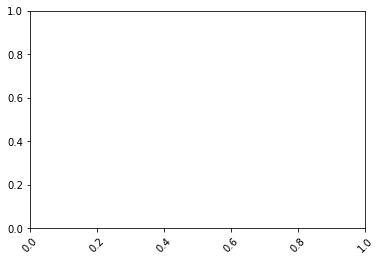

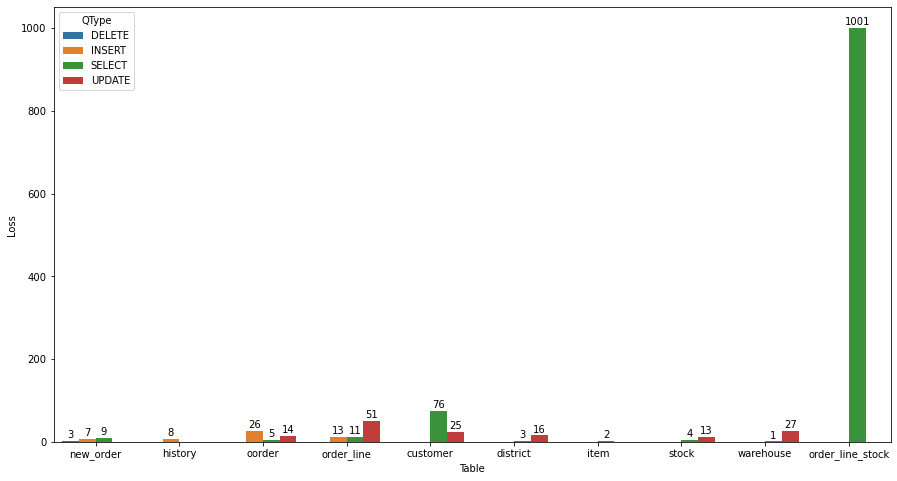

In [369]:
import seaborn as sns
import matplotlib.pyplot as plt

locs, labels = plt.xticks()
plt.setp(labels, rotation=45)
plt.figure(figsize=(15,8))
ax = sns.barplot(data=groupby_avg.reset_index(), x='Table', y='Loss', hue='QType', ci=None, capsize=0)
for c in ax.containers:
    # set the bar label
    ax.bar_label(c, fmt='%.0f', label_type='edge', padding=1)


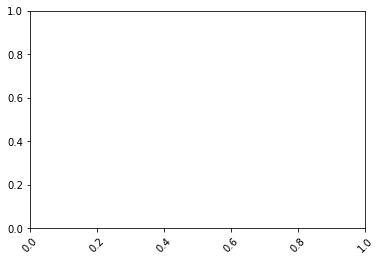

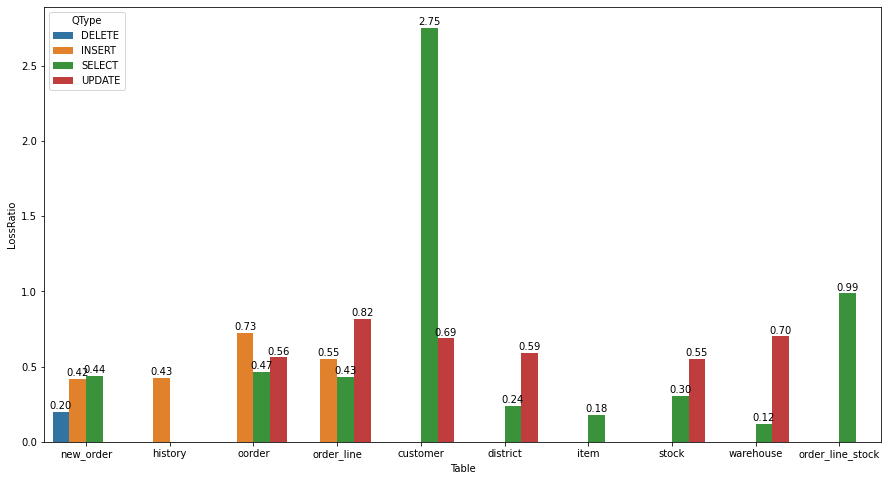

In [370]:
import seaborn as sns
import matplotlib.pyplot as plt

locs, labels = plt.xticks()
plt.setp(labels, rotation=45)
plt.figure(figsize=(15,8))
ax = sns.barplot(data=groupby_avg.reset_index(), x='Table', y='LossRatio', hue='QType', ci=None)
for c in ax.containers:
    # set the bar label
    ax.bar_label(c, fmt='%.2f', label_type='edge', padding=1)

In [59]:
import seaborn as sns
import matplotlib.pyplot as plt
def visualize_table(trace, ff, loss_ratio=False):
    trace_df = pd.DataFrame(trace, columns=['Loss', 'Truth', 'LossRatio', 'Query',  'Table', 'QType'])
    groupby_avg = trace_df.groupby(['Query', 'Table', 'QType']).agg({'Loss': 'mean', 'Truth': 'mean', 'LossRatio': 'mean'}).reset_index()
    locs, labels = plt.xticks()
    plt.setp(labels, rotation=45)
    plt.figure(figsize=(15,8))
    if not loss_ratio:
        ax = sns.barplot(data=groupby_avg.reset_index(), x='Table', y='Loss', hue='QType', ci=80, width=1.2)
    else:
        ax = sns.barplot(data=groupby_avg.reset_index(), x='Table', y='LossRatio', hue='QType', ci=80, width=1.2)
    ax.set(title=str(f"FF{ff}"))
    for c in ax.containers:
        # set the bar label
        ax.bar_label(c, fmt='%.2f', label_type='edge', padding=1)
        
def visualize_truth(trace, ff):
    trace_df = pd.DataFrame(trace, columns=['Loss', 'Truth', 'LossRatio', 'Query',  'Table', 'QType'])
    groupby_avg = trace_df.groupby(['Query', 'Table', 'QType']).agg({'Loss': 'mean', 'Truth': 'mean', 'LossRatio': 'mean'}).reset_index()
    locs, labels = plt.xticks()
    plt.setp(labels, rotation=45)
    plt.figure(figsize=(15,8))
    ax = sns.barplot(data=groupby_avg.reset_index(), x='Table', y='Truth', hue='QType', ci=80, width=1.2)
    ax.set(title=str(f"FF{ff}"))
    for c in ax.containers:
        # set the bar label
        ax.bar_label(c, fmt='%.2f', label_type='edge', padding=1)
        
    

C:\Users\bluec\AppData\Local\Temp\ipykernel_10372\10093089.py:10: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 80)` for the same effect.

  ax = sns.barplot(data=groupby_avg.reset_index(), x='Table', y='Loss', hue='QType', ci=80, width=1.2)
C:\Users\bluec\AppData\Local\Temp\ipykernel_10372\10093089.py:10: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 80)` for the same effect.

  ax = sns.barplot(data=groupby_avg.reset_index(), x='Table', y='Loss', hue='QType', ci=80, width=1.2)
C:\Users\bluec\AppData\Local\Temp\ipykernel_10372\10093089.py:10: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 80)` for the same effect.

  ax = sns.barplot(data=groupby_avg.reset_index(), x='Table', y='Loss', hue='QType', ci=80, width=1.2)


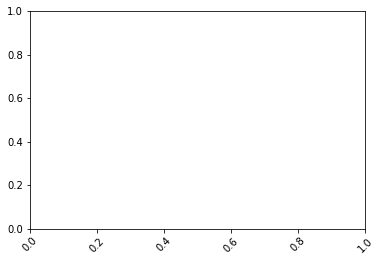

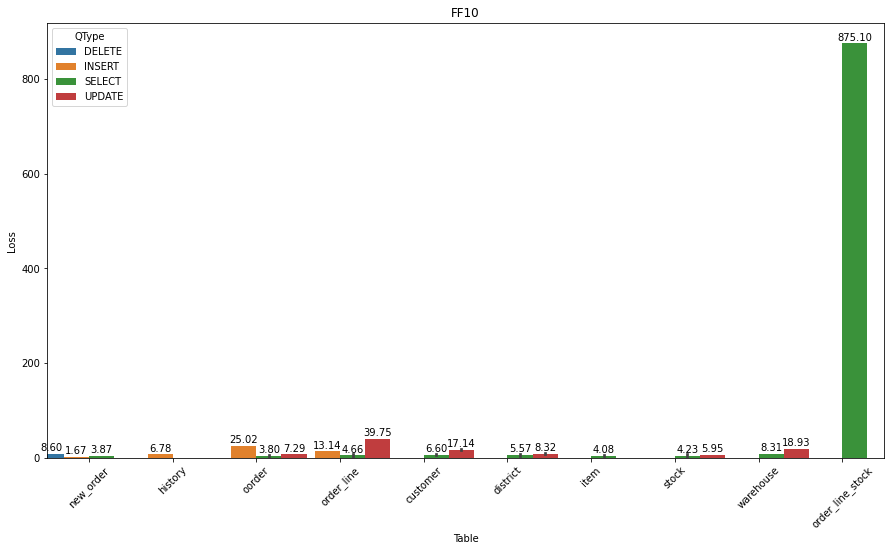

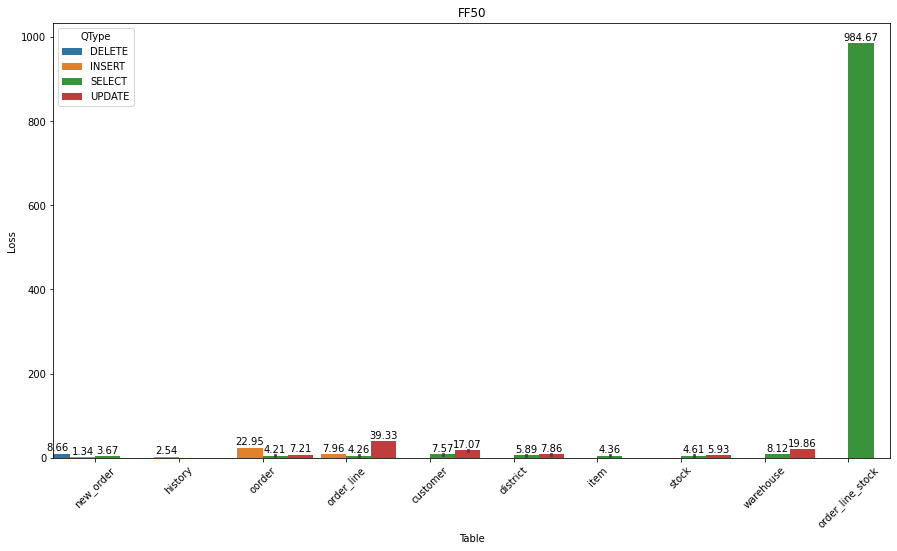

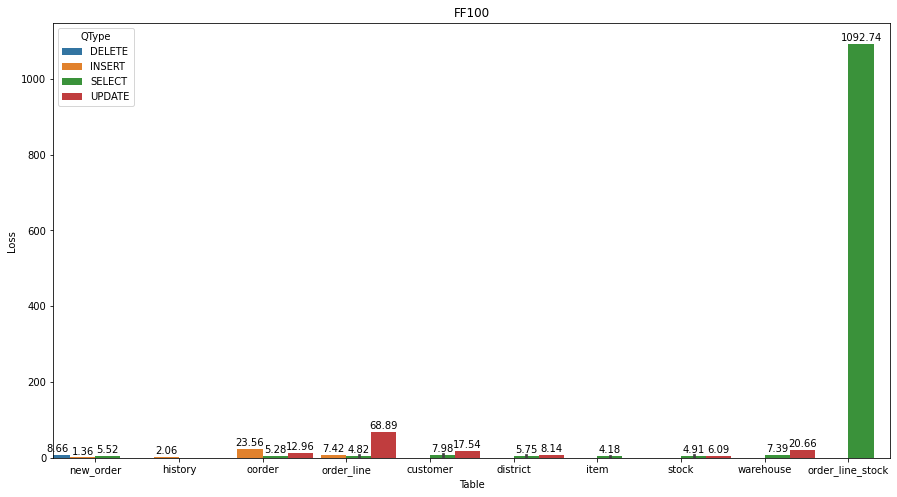

In [57]:
visualize_table(trace_test10, 10)
visualize_table(trace_test50, 50)
visualize_table(trace_test100, 100)

C:\Users\bluec\AppData\Local\Temp\ipykernel_10372\10093089.py:12: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 80)` for the same effect.

  ax = sns.barplot(data=groupby_avg.reset_index(), x='Table', y='LossRatio', hue='QType', ci=80, width=1.2)
C:\Users\bluec\AppData\Local\Temp\ipykernel_10372\10093089.py:12: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 80)` for the same effect.

  ax = sns.barplot(data=groupby_avg.reset_index(), x='Table', y='LossRatio', hue='QType', ci=80, width=1.2)
C:\Users\bluec\AppData\Local\Temp\ipykernel_10372\10093089.py:12: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 80)` for the same effect.

  ax = sns.barplot(data=groupby_avg.reset_index(), x='Table', y='LossRatio', hue='QType', ci=80, width=1.2)


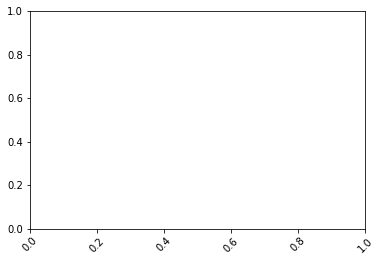

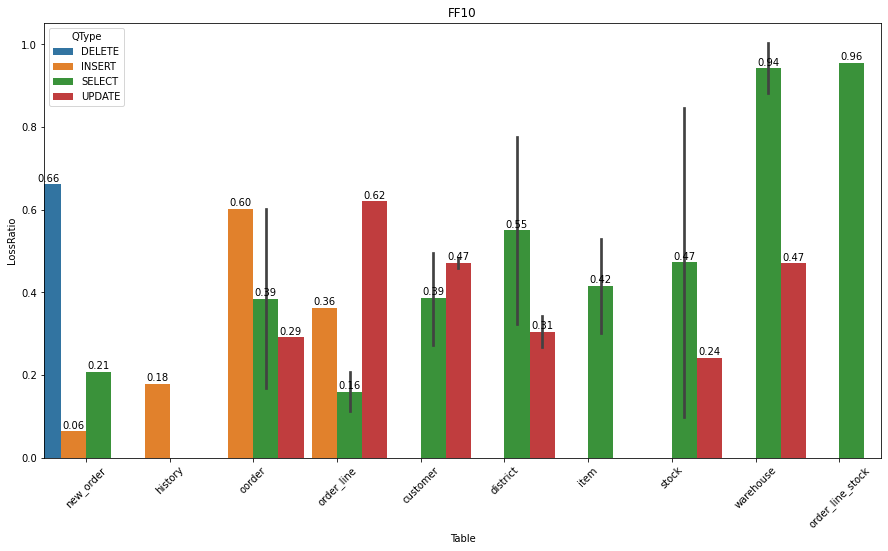

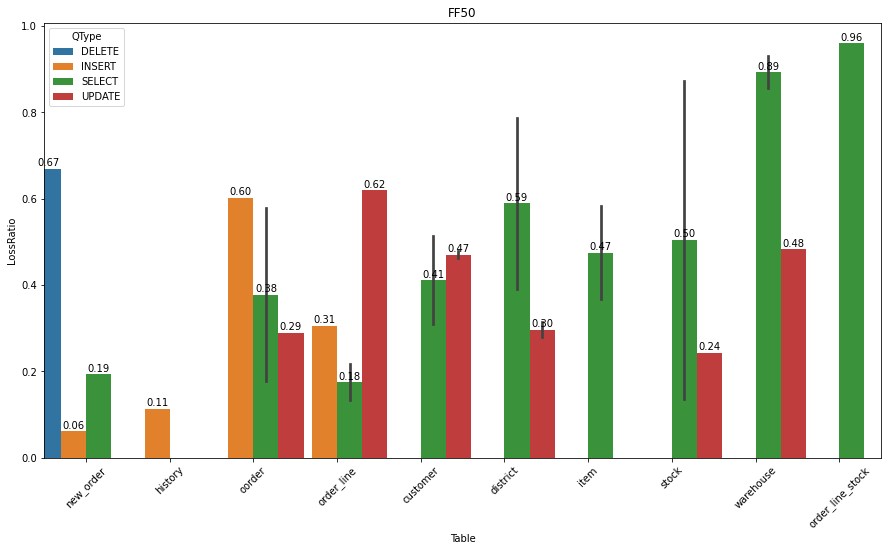

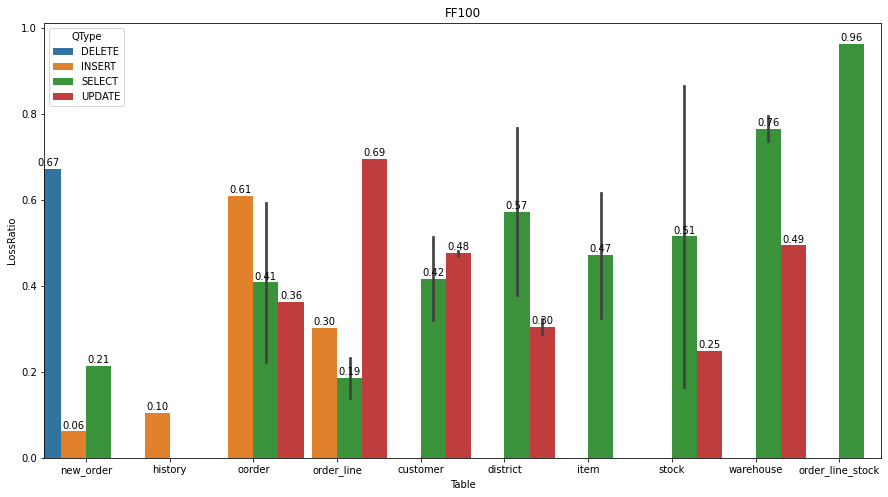

In [58]:
visualize_table(trace_test10, 10, True)
visualize_table(trace_test50, 50, True)
visualize_table(trace_test100, 100, True)

C:\Users\bluec\AppData\Local\Temp\ipykernel_10372\3310996052.py:24: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 80)` for the same effect.

  ax = sns.barplot(data=groupby_avg.reset_index(), x='Table', y='Truth', hue='QType', ci=80, width=1.2)
C:\Users\bluec\AppData\Local\Temp\ipykernel_10372\3310996052.py:24: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 80)` for the same effect.

  ax = sns.barplot(data=groupby_avg.reset_index(), x='Table', y='Truth', hue='QType', ci=80, width=1.2)
C:\Users\bluec\AppData\Local\Temp\ipykernel_10372\3310996052.py:24: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 80)` for the same effect.

  ax = sns.barplot(data=groupby_avg.reset_index(), x='Table', y='Truth', hue='QType', ci=80, width=1.2)


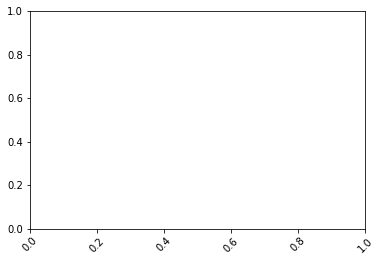

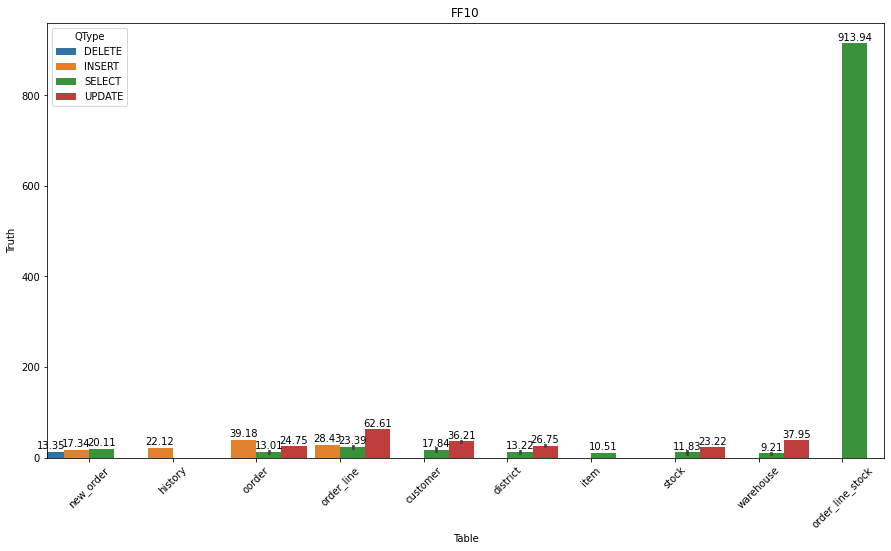

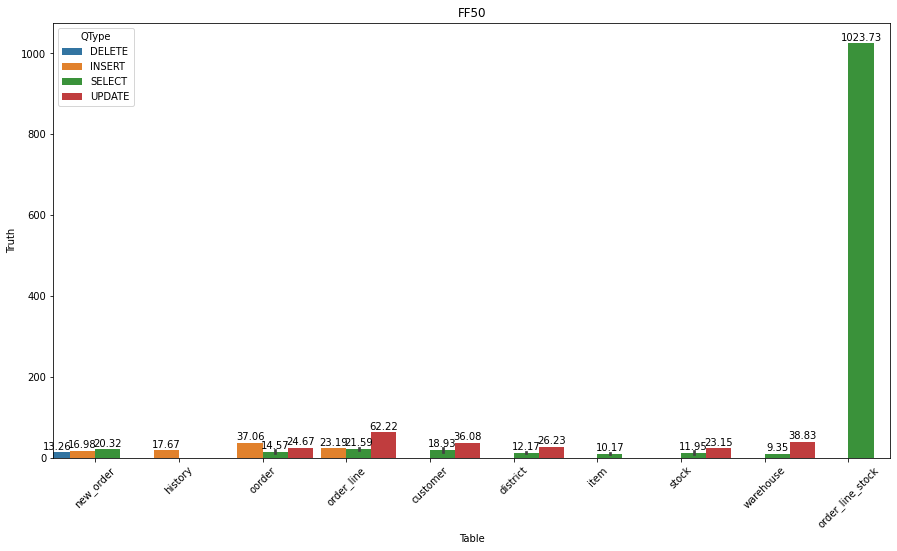

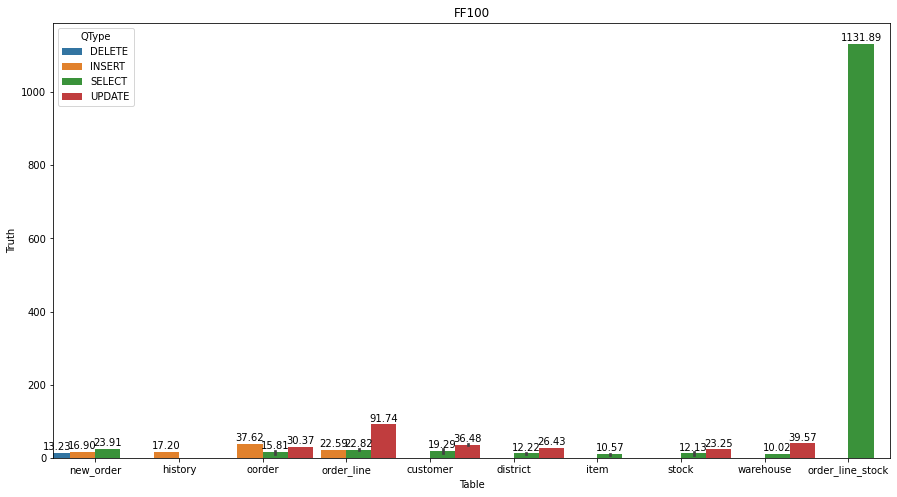

In [60]:
visualize_truth(trace_test10, 10)
visualize_truth(trace_test50, 50)
visualize_truth(trace_test100, 100)

In [ ]:
feature_num = 5
num_graphs = 100
iteration_num = int(round(0.8 * num_graphs, 0))

def test_cross_dataset_generalibility(data_path_A : str, data_path_B : str):
  # We assume that the data set sizes are the same.
  model = GCN(nfeat=feature_num,
            nhid=args.hidden,
            nclass=node_dim, 
            dropout=args.dropout)    

  optimizer = optim.Adam(model.parameters(),
                       lr=args.lr, weight_decay=args.weight_decay)
  
  for wid in range(iteration_num):
    print("[graph {}]".format(wid))
    # Load data 
    adj, features, labels, idx_train, idx_val, idx_test = load_data(path = data_path_A + "graph/", dataset = "sample-plan-" + str(wid))
    # print(adj.shape)
    
    # Model Training
    ok_times = 0
    t_total = time.time()
    for epoch in range(args.epochs):
        # print(features.shape, adj.shape)
        loss_train = train(epoch, labels, features, adj, idx_train)
        if loss_train < 0.002:
            ok_times += 1
        if ok_times >= 20:
            break    
    
    print("Optimization Finished!")
    print("Total time elapsed: {:.4f}s".format(time.time() - t_total))

    # Model Validation
    test(labels, features, adj, idx_test)

  test_losses = []
  for wid in range(num_graphs - iteration_num):
    # Load data
    adj, features, labels, idx_train, idx_val, idx_test = load_data(path = data_path_B + "graph/", dataset = "sample-plan-" + str(wid))
    
    # Model Testing
    t_total = time.time()
    test_losses.append(test(labels, features, adj, idx_test))
    print("Testing Finished!")
    print("Total time elapsed: {:.4f}s".format(time.time() - t_total))

  return np.array(test_losses).mean()

def cross_product_experiment(data_paths : list):
  square_loss_array = np.zeros((len(data_paths), len(data_paths)))
  for i in range(len(data_paths)):
    for j in range(len(data_paths)):
      square_loss_array[i][j] = test_cross_dataset_generalibility(data_paths[i], data_paths[j])
      print(f"train {data_paths[i]} test {data_paths[j]} loss {square_loss_array[i][j]}")

  return square_loss_array
  

In [26]:
mp_optype = pickle.load(open('mp_optype', 'rb'))
modify_op_map = pickle.load(open('modify_op_map', 'rb'))
tablename_map = pickle.load(open('tablename_map', 'rb'))

#process_graph_data('tpcc_sf1_ffserial10_processed/', fill_factor=0.1, num_graphs = 6000)
#process_graph_data('tpcc_sf1_ffserial50_processed/', fill_factor=0.5, num_graphs = 6000)
#process_graph_data('tpcc_sf1_ffserial100_processed/', fill_factor=1.0, num_graphs = 6000)